In [ ]:
from google.colab import drive

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


##imports

In [ ]:
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

     / 57.0MB 706kB/s
     |████████████████████████████████| 81kB 7.0MB/s 
     |████████████████████████████████| 604kB 16.1MB/s 
     |████████████████████████████████| 3.1MB 23.8MB/s 
     |████████████████████████████████| 61kB 8.7MB/s 
     |████████████████████████████████| 81kB 360kB/s 
     |████████████████████████████████| 296kB 34.1MB/s 
  Created wheel for pandas-profiling: filename=pandas_profiling-2.10.0-py2.py3-none-any.whl size=239950 sha256=7883a40488c3f8a1ccd86608722c3b44b7a1a49ee1ecf18274ace107a6bffe7e
  Stored in directory: /tmp/pip-ephem-wheel-cache-chjiqi1i/wheels/56/c2/dd/8d945b0443c35df7d5f62fa9e9ae105a2d8b286302b92e0109
  Created wheel for htmlmin: filename=htmlmin-0.1.12-cp36-none-any.whl size=27085 sha256=d6a7d3382b64e9539b8133bd4910f59aa31655e2e91abdfd942cce4b82c06486
  Stored in directory: /root/.cache/pip/wheels/43/07/ac/7c5a9d708d65247ac1f94066cf1db075540b85716c30255459
Successfully built pandas-profiling htmlmin
ERROR: google-colab 1.0.0 has requirement

In [ ]:
!pip install xgboost

In [ ]:
!pip install tpot

     |████████████████████████████████| 92kB 6.2MB/s 
     |████████████████████████████████| 157.5MB 41kB/s 
     |████████████████████████████████| 163kB 55.6MB/s 
  Created wheel for stopit: filename=stopit-1.1.2-cp36-none-any.whl size=11957 sha256=e7e98d49230e5e1b9bdfa460a08c13d772057bccd78e839adcc1b51a4ac88bcb
  Stored in directory: /root/.cache/pip/wheels/3c/85/2b/2580190404636bfc63e8de3dff629c03bb795021e1983a6cc7
Successfully built stopit
  Found existing installation: xgboost 0.90
    Uninstalling xgboost-0.90:
      Successfully uninstalled xgboost-0.90


In [ ]:
import pandas as pd
import numpy as np
import sklearn 
import pylab as plt
import seaborn as sns
import matplotlib.ticker as mtick
from sklearn.decomposition import PCA
import pandas_profiling as pp
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import learning_curve
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import roc_auc_score
from sklearn.metrics import classification_report
import timeit
from sklearn.tree import DecisionTreeClassifier
from sklearn import linear_model
from xgboost import XGBClassifier
from xgboost import XGBRegressor
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import MinMaxScaler
from scipy import stats
from sklearn.utils import resample
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RepeatedStratifiedKFold
import tpot
from tpot import TPOTClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.pipeline import make_pipeline, make_union
from tpot.builtins import StackingEstimator
from sklearn.pipeline import make_pipeline
import pickle
from sklearn.linear_model import Ridge
from sklearn.svm import SVR
from sklearn.metrics import median_absolute_error
from sklearn.metrics import r2_score
from sklearn.linear_model import Lasso
from sklearn.preprocessing import PowerTransformer
from tpot.builtins import ZeroCount
import graphviz 
from sklearn import tree
from sklearn.tree import plot_tree
from sklearn import svm
from sklearn.feature_selection import RFECV

/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)


In [ ]:
data=pd.read_excel('/content/drive/MyDrive/ML project/Telco_customer_churn.csv.xlsx')

In [ ]:
#data = pd.read_excel ('Telco_customer_churn.csv.xlsx')

In [ ]:
data.shape

(7043, 33)

* the dataset contains 7043 rows and 33 columns 

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 33 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   CustomerID         7043 non-null   object 
 1   Count              7043 non-null   int64  
 2   Country            7043 non-null   object 
 3   State              7043 non-null   object 
 4   City               7043 non-null   object 
 5   Zip Code           7043 non-null   int64  
 6   Lat Long           7043 non-null   object 
 7   Latitude           7043 non-null   float64
 8   Longitude          7043 non-null   float64
 9   Gender             7043 non-null   object 
 10  Senior Citizen     7043 non-null   object 
 11  Partner            7043 non-null   object 
 12  Dependents         7043 non-null   object 
 13  Tenure Months      7043 non-null   int64  
 14  Phone Service      7043 non-null   object 
 15  Multiple Lines     7043 non-null   object 
 16  Internet Service   7043 

* the type of each column

# Data Understanding 

* During this chapter, we’ll be going through the data comprehension by describing its
content explore it, in order to gain some insights through primary intuition

In [ ]:

#Customer ID 
#count,country and state unique value
#city :the city
#zip code
#lat long : latitude , longitude
#gender:Whether the customer is a male or a female
#senior citizen :Whether the customer is a senior citizen or not (yes, no)
#partner :Whether the customer has a partner or not (Yes, No)
#dependents:Whether the customer has dependents or not (Yes, No)
#tenure months :Number of months the customer has stayed with the company
#phone service :Whether the customer has a phone service or not (Yes, No)
#multiple lines :Whether the customer has multiple lines or not (Yes, No, No phone service)
#internet service :Customer’s internet service provider (DSL, Fiber optic, No)
#online security :Whether the customer has online security or not (Yes, No, No internet service)
#online backup :Whether the customer has online backup or not (Yes, No, No internet service)
#device protection :Whether the customer has device protection or not (Yes, No, No internet service)
#tech support :Whether the customer has tech support or not (Yes, No, No internet service)
#streaming TV :Whether the customer has streaming TV or not (Yes, No, No internet service)
#streaming movies :Whether the customer has streaming movies or not (Yes, No, No internet service)
#contract :The contract term of the customer (Month-to-month, One year, Two year)
#paperless billing : Whether the customer has paperless billing or not (Yes, No) (facturation sans papier)
#payment method :The customer’s payment method (Electronic check, Mailed check, Bank transfer (automatic), Credit card (automatic))
#monthly charges :The amount charged to the customer monthly
#total charges :The total amount charged to the customer
#churn label :Whether the customer churned or not (Yes or No)
#churn value : churn label but with (0 or 1)
#churn score : score for clients
#cltv: customer lifetime value (something like that to calculate (acquisition costs, revenue, customer service))
#churn reason : the reason of leaving (20 reasons)


In [ ]:
print(data.isnull().sum())

CustomerID              0
Count                   0
Country                 0
State                   0
City                    0
Zip Code                0
Lat Long                0
Latitude                0
Longitude               0
Gender                  0
Senior Citizen          0
Partner                 0
Dependents              0
Tenure Months           0
Phone Service           0
Multiple Lines          0
Internet Service        0
Online Security         0
Online Backup           0
Device Protection       0
Tech Support            0
Streaming TV            0
Streaming Movies        0
Contract                0
Paperless Billing       0
Payment Method          0
Monthly Charges         0
Total Charges           0
Churn Label             0
Churn Value             0
Churn Score             0
CLTV                    0
Churn Reason         5174
dtype: int64


* column "Churn Reason" have 5174 null values. 

* display column's name

In [ ]:
col=data.columns
print(col)

Index(['CustomerID', 'Count', 'Country', 'State', 'City', 'Zip Code',
       'Lat Long', 'Latitude', 'Longitude', 'Gender', 'Senior Citizen',
       'Partner', 'Dependents', 'Tenure Months', 'Phone Service',
       'Multiple Lines', 'Internet Service', 'Online Security',
       'Online Backup', 'Device Protection', 'Tech Support', 'Streaming TV',
       'Streaming Movies', 'Contract', 'Paperless Billing', 'Payment Method',
       'Monthly Charges', 'Total Charges', 'Churn Label', 'Churn Value',
       'Churn Score', 'CLTV', 'Churn Reason'],
      dtype='object')


In [ ]:
data.describe()

,Count,Zip Code,Latitude,Longitude,Tenure Months,Monthly Charges,Churn Value,Churn Score,CLTV
count,7043.0,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000
mean,1.0,93521.964646,36.282441,-119.798880,32.371149,64.761692,0.265370,58.699418,4400.295755
std,0.0,1865.794555,2.455723,2.157889,24.559481,30.090047,0.441561,21.525131,1183.057152
min,1.0,90001.000000,32.555828,-124.301372,0.000000,18.250000,0.000000,5.000000,2003.000000
25%,1.0,92102.000000,34.030915,-121.815412,9.000000,35.500000,0.000000,40.000000,3469.000000
50%,1.0,93552.000000,36.391777,-119.730885,29.000000,70.350000,0.000000,61.000000,4527.000000
75%,1.0,95351.000000,38.224869,-118.043237,55.000000,89.850000,1.000000,75.000000,5380.500000
max,1.0,96161.000000,41.962127,-114.192901,72.000000,118.750000,1.000000,100.000000,6500.000000


* the number of unique values in each column

In [ ]:
nbr_col_unique =data.nunique()
print(nbr_col_unique)

CustomerID           7043
Count                   1
Country                 1
State                   1
City                 1129
Zip Code             1652
Lat Long             1652
Latitude             1652
Longitude            1651
Gender                  2
Senior Citizen          2
Partner                 2
Dependents              2
Tenure Months          73
Phone Service           2
Multiple Lines          3
Internet Service        3
Online Security         3
Online Backup           3
Device Protection       3
Tech Support            3
Streaming TV            3
Streaming Movies        3
Contract                3
Paperless Billing       2
Payment Method          4
Monthly Charges      1585
Total Charges        6531
Churn Label             2
Churn Value             2
Churn Score            85
CLTV                 3438
Churn Reason           20
dtype: int64


In [ ]:
for item in data.columns:
    print(item)
    print (data[item].unique())

CustomerID
['3668-QPYBK' '9237-HQITU' '9305-CDSKC' ... '2234-XADUH' '4801-JZAZL'
 '3186-AJIEK']
Count
[1]
Country
['United States']
State
['California']
City
['Los Angeles' 'Beverly Hills' 'Huntington Park' ... 'Standish' 'Tulelake'
 'Olympic Valley']
Zip Code
[90003 90005 90006 ... 96128 96134 96146]
Lat Long
['33.964131, -118.272783' '34.059281, -118.30742' '34.048013, -118.293953'
 ... '40.346634, -120.386422' '41.813521, -121.492666'
 '39.191797, -120.212401']
Latitude
[33.964131 34.059281 34.048013 ... 40.346634 41.813521 39.191797]
Longitude
[-118.272783 -118.30742  -118.293953 ... -120.386422 -121.492666
 -120.212401]
Gender
['Male' 'Female']
Senior Citizen
['No' 'Yes']
Partner
['No' 'Yes']
Dependents
['No' 'Yes']
Tenure Months
[ 2  8 28 49 10  1 47 17  5 34 11 15 18  9  7 12 25 68 55 37  3 27 20  4
 58 53 13  6 19 59 16 52 24 32 38 54 43 63 21 69 22 61 60 48 40 23 39 35
 56 65 33 30 45 46 62 70 50 44 71 26 14 41 66 64 29 42 67 51 31 57 36 72
  0]
Phone Service
['Yes' 'No']
Mult

* we drop the customer ID : each row has a unique value.

In [ ]:
To_drop=['CustomerID']
data=data.drop(To_drop,axis=1)

In [ ]:
data.head()

,Count,Country,State,City,Zip Code,Lat Long,Latitude,Longitude,Gender,Senior Citizen,Partner,Dependents,Tenure Months,Phone Service,Multiple Lines,Internet Service,Online Security,Online Backup,Device Protection,Tech Support,Streaming TV,Streaming Movies,Contract,Paperless Billing,Payment Method,Monthly Charges,Total Charges,Churn Label,Churn Value,Churn Score,CLTV,Churn Reason
0,1,United States,California,Los Angeles,90003,"33.964131, -118.272783",33.964131,-118.272783,Male,No,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes,1,86,3239,Competitor made better offer
1,1,United States,California,Los Angeles,90005,"34.059281, -118.30742",34.059281,-118.307420,Female,No,No,Yes,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes,1,67,2701,Moved
2,1,United States,California,Los Angeles,90006,"34.048013, -118.293953",34.048013,-118.293953,Female,No,No,Yes,8,Yes,Yes,Fiber optic,No,No,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,99.65,820.5,Yes,1,86,5372,Moved
3,1,United States,California,Los Angeles,90010,"34.062125, -118.315709",34.062125,-118.315709,Female,No,Yes,Yes,28,Yes,Yes,Fiber optic,No,No,Yes,Yes,Yes,Yes,Month-to-month,Yes,Electronic check,104.80,3046.05,Yes,1,84,5003,Moved
4,1,United States,California,Los Angeles,90015,"34.039224, -118.266293",34.039224,-118.266293,Male,No,No,Yes,49,Yes,Yes,Fiber optic,No,Yes,Yes,No,Yes,Yes,Month-to-month,Yes,Bank transfer (automatic),103.70,5036.3,Yes,1,89,5340,Competitor had better devices


* we drop 'Count','Country' and 'State'.<br>
* same value for all rows.

In [ ]:
To_drop=['Count','Country','State']
data=data.drop(To_drop,axis=1)

In [ ]:
nbr_col_unique =data.nunique()
print(nbr_col_unique)

City                 1129
Zip Code             1652
Lat Long             1652
Latitude             1652
Longitude            1651
Gender                  2
Senior Citizen          2
Partner                 2
Dependents              2
Tenure Months          73
Phone Service           2
Multiple Lines          3
Internet Service        3
Online Security         3
Online Backup           3
Device Protection       3
Tech Support            3
Streaming TV            3
Streaming Movies        3
Contract                3
Paperless Billing       2
Payment Method          4
Monthly Charges      1585
Total Charges        6531
Churn Label             2
Churn Value             2
Churn Score            85
CLTV                 3438
Churn Reason           20
dtype: int64


* detailed report.

In [ ]:
profile = pp.ProfileReport(data,title="data explora",explorative=True) 
profile.to_file("/content/drive/MyDrive/ML project/output.html")

Summarize dataset:   0%|          | 0/42 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

# Customer Churn

* Let's first have a look at the churn rate.

['Yes' 'No']
Number of yes:  1869
Number of no :  5174
pourcentage
pourcentage value of yes: 26.536987079369588 %
pourcentage value of no : 73.46301292063042 %


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


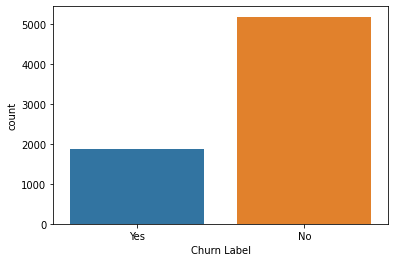

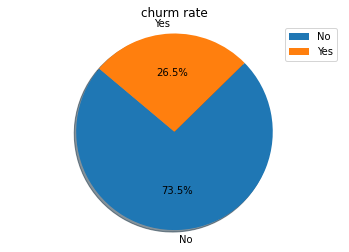

In [ ]:
var_gender='Churn Label'
print(data[var_gender].unique())
y=data[var_gender]
ax = sns.countplot(y,label="Churn Label")     
no, yes = y.value_counts()
print('Number of yes: ',yes)
print('Number of no : ',no)
print('pourcentage')
print('pourcentage value of yes:',float(yes)*100/float(yes+no),'%')
print('pourcentage value of no :',float(no)*100/float(yes+no),'%')
plt.show()
labels='No','Yes'
m=float(yes)*100/float(yes+no)
f=float(no)*100/float(yes+no)
sizes=data['Churn Label'].value_counts()
plt.pie(sizes, labels=labels,autopct='%1.1f%%', shadow=True, startangle=140)
plt.legend(labels=labels)
plt.title("churm rate")
plt.axis('equal')
plt.show()

* we have an unbalanced target

* The column of 'Churn Label' is like the column 'Churn Value' but the difference is the values 'Yes' ,'No' in 'Churn Label' and 1, 0 in 'Churn Value'.  

* understanding over variables 

In [ ]:
data.head()

,City,Zip Code,Lat Long,Latitude,Longitude,Gender,Senior Citizen,Partner,Dependents,Tenure Months,Phone Service,Multiple Lines,Internet Service,Online Security,Online Backup,Device Protection,Tech Support,Streaming TV,Streaming Movies,Contract,Paperless Billing,Payment Method,Monthly Charges,Total Charges,Churn Label,Churn Value,Churn Score,CLTV,Churn Reason
0,Los Angeles,90003,"33.964131, -118.272783",33.964131,-118.272783,Male,No,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes,1,86,3239,Competitor made better offer
1,Los Angeles,90005,"34.059281, -118.30742",34.059281,-118.307420,Female,No,No,Yes,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes,1,67,2701,Moved
2,Los Angeles,90006,"34.048013, -118.293953",34.048013,-118.293953,Female,No,No,Yes,8,Yes,Yes,Fiber optic,No,No,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,99.65,820.5,Yes,1,86,5372,Moved
3,Los Angeles,90010,"34.062125, -118.315709",34.062125,-118.315709,Female,No,Yes,Yes,28,Yes,Yes,Fiber optic,No,No,Yes,Yes,Yes,Yes,Month-to-month,Yes,Electronic check,104.80,3046.05,Yes,1,84,5003,Moved
4,Los Angeles,90015,"34.039224, -118.266293",34.039224,-118.266293,Male,No,No,Yes,49,Yes,Yes,Fiber optic,No,Yes,Yes,No,Yes,Yes,Month-to-month,Yes,Bank transfer (automatic),103.70,5036.3,Yes,1,89,5340,Competitor had better devices


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 29 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   City               7043 non-null   object 
 1   Zip Code           7043 non-null   int64  
 2   Lat Long           7043 non-null   object 
 3   Latitude           7043 non-null   float64
 4   Longitude          7043 non-null   float64
 5   Gender             7043 non-null   object 
 6   Senior Citizen     7043 non-null   object 
 7   Partner            7043 non-null   object 
 8   Dependents         7043 non-null   object 
 9   Tenure Months      7043 non-null   int64  
 10  Phone Service      7043 non-null   object 
 11  Multiple Lines     7043 non-null   object 
 12  Internet Service   7043 non-null   object 
 13  Online Security    7043 non-null   object 
 14  Online Backup      7043 non-null   object 
 15  Device Protection  7043 non-null   object 
 16  Tech Support       7043 

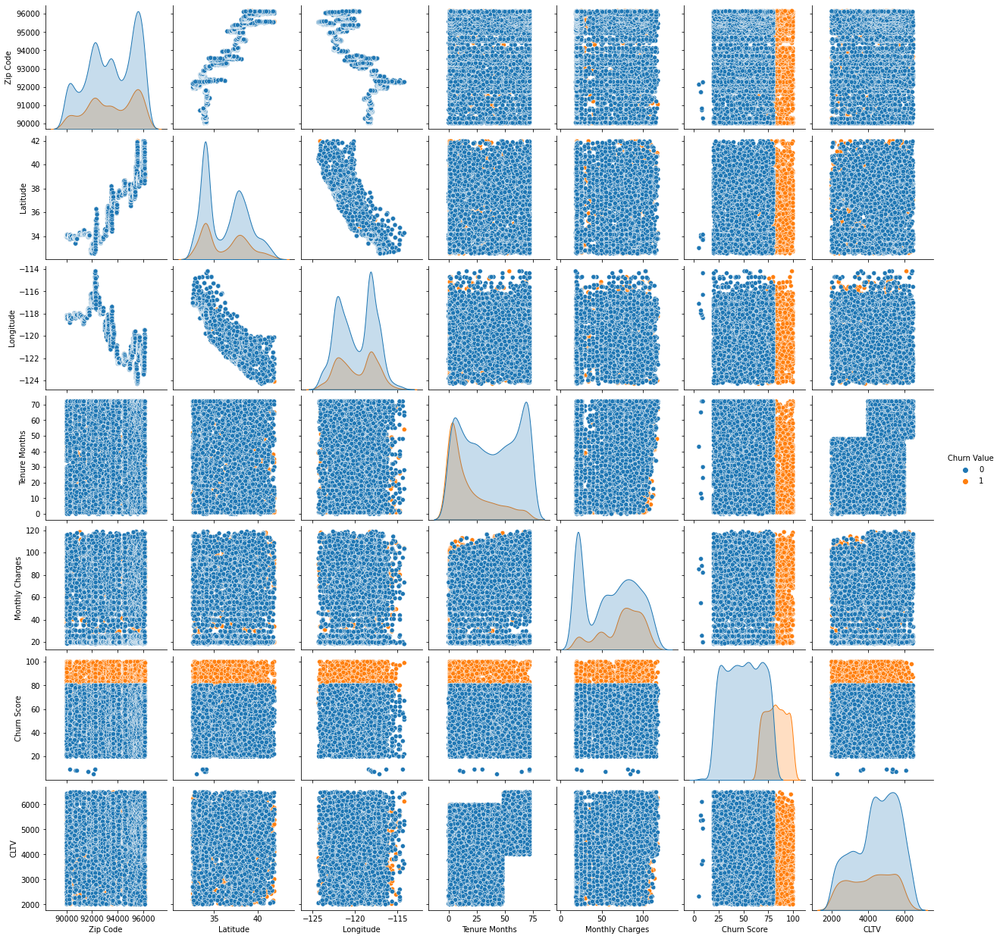

In [ ]:
sns.pairplot(data, hue='Churn Value', height=2.5);

* the churn score has a remarkable impact on each clumn

#we are going to start with the variables which have a small redundancy

##Gender distribution :

In [ ]:
var_gender='Gender'
print(data[var_gender].unique())
y=data[var_gender]

['Male' 'Female']


Number of Male:  3555
Number of Female :  3488
pourcentage
pourcentage value of Male: 50.475649581144395 %
pourcentage value of Yes : 49.524350418855605 %


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


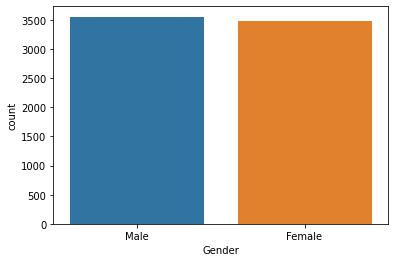

In [ ]:

ax = sns.countplot(y,label="Count")     
male, female = y.value_counts()
print('Number of Male: ',male)
print('Number of Female : ',female)
print('pourcentage')
print('pourcentage value of Male:',float(male)*100/float(male+female),'%')
print('pourcentage value of Yes :',float(female)*100/float(male+female),'%')

* there's almost an even split between males and females.

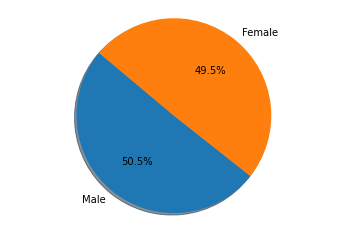

In [ ]:
#diagramme à secteurs - comptage de sexe
labels='Male','Female'
m=float(male)*100/float(male+female)
f=float(female)*100/float(male+female)
sizes=data['Gender'].value_counts()
plt.pie(sizes, labels=labels,autopct='%1.1f%%', shadow=True, startangle=140)
plt.axis('equal')
plt.show()

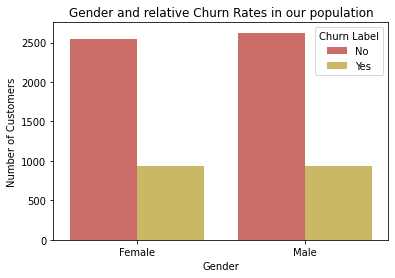

In [ ]:
gb = data.groupby("Gender")["Churn Label"].value_counts().to_frame().rename({"Churn Label": "Number of Customers"}, axis = 1).reset_index()
sns.barplot(x = "Gender", y = "Number of Customers", data = gb, hue = "Churn Label", palette = sns.color_palette("hls", 8)).set_title("Gender and relative Churn Rates in our population");

* Men and women are evenly distributed in our sample, and show the same proportions of Churn.

## Age distribution

In [ ]:
var_senior_citizen='Senior Citizen'
print(data[var_senior_citizen].unique())
y=data[var_senior_citizen]

['No' 'Yes']


Number of No:  5901
Number of Yes :  1142
pourcentage
pourcentage of No: 83.78531875621184 %
pourcentage of Yes : 16.21468124378816 %


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


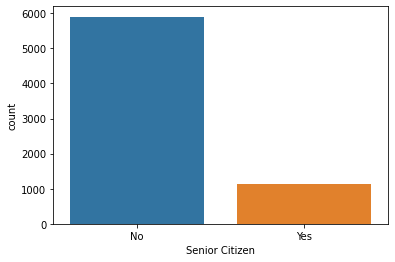

In [ ]:
import seaborn as sns
ax = sns.countplot(y,label="Count")     
no_old, old = y.value_counts()
print('Number of No: ',no_old)
print('Number of Yes : ',old)
print('pourcentage')
print('pourcentage of No:',float(no_old)*100/float(no_old+old),'%')
print('pourcentage of Yes :',float(old)*100/float(no_old+old),'%')

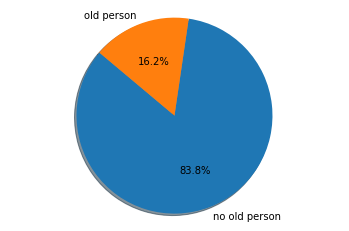

In [ ]:
#diagramme à secteurs - comptage de senior citizen
labels='no old person','old person'
m=float(no_old)*100/float(no_old+old)
f=float(no_old)*100/float(no_old+old)
sizes=data['Senior Citizen'].value_counts()
plt.pie(sizes, labels=labels,autopct='%1.1f%%', shadow=True, startangle=140)
plt.axis('equal')
plt.show()

  Senior Citizen Churn Label  Number of Customers
0          Young          No                 4508
1          Young         Yes                 1393
2         Senior          No                  666
3         Senior         Yes                  476


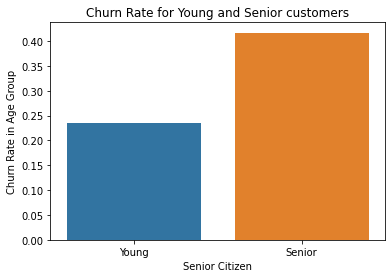

In [ ]:
gb = data.groupby("Senior Citizen")["Churn Label"].value_counts().to_frame().rename({"Churn Label": "Number of Customers"}, axis = 1).reset_index()
gb["Senior Citizen"].replace(to_replace ="No", value ="Young", inplace = True)
gb["Senior Citizen"].replace(to_replace ="Yes", value ="Senior", inplace = True)
print(gb)
tp = gb.groupby("Senior Citizen")["Number of Customers"].sum().to_frame().reset_index().rename({"Number of Customers": "# Customers in Age Group"}, axis = 1)
gb = pd.merge(gb, tp, on = "Senior Citizen")
gb["Churn Rate in Age Group"] = gb["Number of Customers"]/gb["# Customers in Age Group"]
gb = gb[gb["Churn Label"] == "Yes"]

sns.barplot(x = "Senior Citizen", y = "Churn Rate in Age Group", data = gb).set_title("Churn Rate for Young and Senior customers");

* Our sample is mainly composed by young people. Senior customers are more prone to churning.

## Partner distribution

In [ ]:
var_partner='Partner'
print(data[var_partner].unique())
y=data[var_partner]

['No' 'Yes']


Number of No:  3641
Number of Yes :  3402
pourcentage
pourcentage of No: 51.69672014766435 %
pourcentage of Yes : 48.30327985233565 %


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


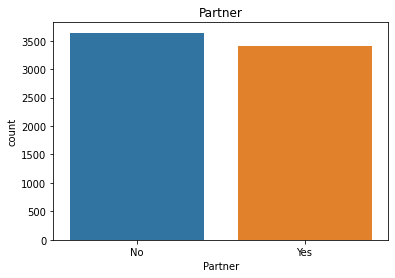

In [ ]:
import seaborn as sns
ax = sns.countplot(y,label="Count").set_title("Partner")    
no_partner, partner = y.value_counts()
print('Number of No: ',no_partner)
print('Number of Yes : ',partner)
print('pourcentage')
print('pourcentage of No:',float(no_partner)*100/float(no_partner+partner),'%')
print('pourcentage of Yes :',float(partner)*100/float(no_partner+partner),'%')

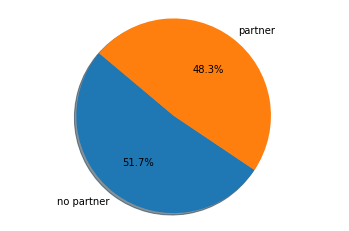

In [ ]:
labels='no partner','partner'
m=float(no_partner)*100/float(no_partner+partner)
f=float(no_partner)*100/float(no_partner+partner)
sizes=data['Partner'].value_counts()
plt.pie(sizes, labels=labels,autopct='%1.1f%%', shadow=True, startangle=140)
plt.axis('equal')
plt.show()

* 'Partner' column evenly distributed

##Dependents

In [ ]:
var_dependents='Dependents'
print(data[var_dependents].unique())
y=data[var_dependents]

['No' 'Yes']


Number of No:  5416
Number of Yes :  1627
pourcentage
pourcentage of No: 76.89904870083771 %
pourcentage of Yes : 23.10095129916229 %


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


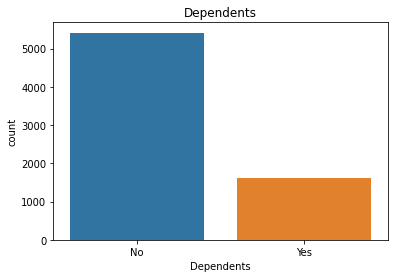

In [ ]:
import seaborn as sns
ax = sns.countplot(y,label="Count").set_title("Dependents")    
no_depend, depend = y.value_counts()
print('Number of No: ',no_depend)
print('Number of Yes : ',depend)
print('pourcentage')
mean_no_depend=float(no_depend)*100/float(no_depend+depend)
mean_depend=float(depend)*100/float(no_depend+depend)
print('pourcentage of No:',mean_no_depend,'%')
print('pourcentage of Yes :',mean_depend,'%')

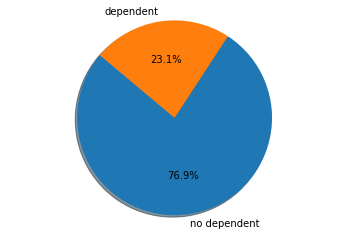

In [ ]:
#diagramme à secteurs - comptage of dependents
labels='no dependent','dependent'
m=mean_no_depend
f=mean_depend
sizes=data['Dependents'].value_counts()
plt.pie(sizes, labels=labels,autopct='%1.1f%%', shadow=True, startangle=140)
plt.axis('equal')
plt.show()

## Tenure months distribution

* histogram of 'Tenure Months'

In [ ]:
var_dependents='Tenure Months'
print(data[var_dependents].unique())
y=data[var_dependents]

[ 2  8 28 49 10  1 47 17  5 34 11 15 18  9  7 12 25 68 55 37  3 27 20  4
 58 53 13  6 19 59 16 52 24 32 38 54 43 63 21 69 22 61 60 48 40 23 39 35
 56 65 33 30 45 46 62 70 50 44 71 26 14 41 66 64 29 42 67 51 31 57 36 72
  0]


In [ ]:
data['Tenure Months'].unique()

array([ 2,  8, 28, 49, 10,  1, 47, 17,  5, 34, 11, 15, 18,  9,  7, 12, 25,
       68, 55, 37,  3, 27, 20,  4, 58, 53, 13,  6, 19, 59, 16, 52, 24, 32,
       38, 54, 43, 63, 21, 69, 22, 61, 60, 48, 40, 23, 39, 35, 56, 65, 33,
       30, 45, 46, 62, 70, 50, 44, 71, 26, 14, 41, 66, 64, 29, 42, 67, 51,
       31, 57, 36, 72,  0])

Text(0, 0.5, 'number of customers')

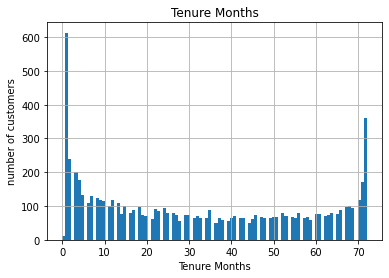

In [ ]:
data.hist(column='Tenure Months',bins=100);
plt.xlabel('Tenure Months')
plt.ylabel('number of customers')

* The majority of the customers in our sample are new clients. There is also a high number of people with a tenure around 70 months. Most likely the company is not older than 72 months, and there either was a strong incentive for subscription (like a competitive launch offer, which could explain the high number through efficient retention rates) or there was some form of selection bias (the offers were unique on the market and highly valued by a group of customers, leading to fast market saturation, which could explain the high number by keeping the retention rate constant and leveraging high sales volumes). These are the only two reasons that can explain such a sharp kickstart in the number of subscriptions and their sudden drop.

In [ ]:
data['Tenure Months'].describe()

count    7043.000000
mean       32.371149
std        24.559481
min         0.000000
25%         9.000000
50%        29.000000
75%        55.000000
max        72.000000
Name: Tenure Months, dtype: float64

* density plot

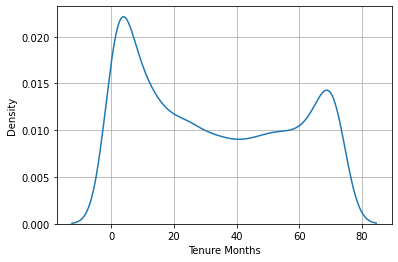

In [ ]:
sns.kdeplot(data=data,x='Tenure Months')
plt.grid(True)

## Phone Service distribution

In [ ]:
var_phone_service='Phone Service'
print(data[var_phone_service].unique())
y=data[var_phone_service]

['Yes' 'No']


Number of Yes:  6361
Number of No :  682
pourcentage
pourcentage of Yes: 90.31662643759762 %
pourcentage of No : 9.683373562402386 %


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


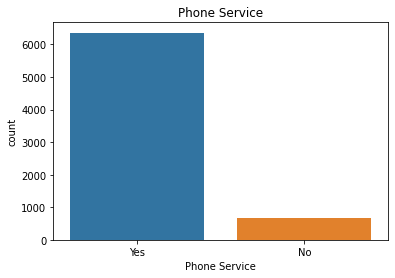

In [ ]:

ax = sns.countplot(y,label="Customers").set_title("Phone Service")     
phone_ser, no_phone_ser = y.value_counts()
print('Number of Yes: ',phone_ser)
print('Number of No : ',no_phone_ser)
print('pourcentage')
mean_phone_ser=float(phone_ser)*100/float(phone_ser+no_phone_ser)
mean_no_phone_ser=float(no_phone_ser)*100/float(phone_ser+no_phone_ser)
print('pourcentage of Yes:',mean_phone_ser,'%')
print('pourcentage of No :',mean_no_phone_ser,'%')

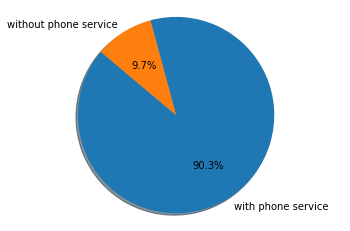

In [ ]:
labels='with phone service','without phone service'
sizes=data['Phone Service'].value_counts()
plt.pie(sizes, labels=labels,autopct='%1.1f%%', shadow=True, startangle=140)
plt.axis('equal')
plt.show()

* 90 % of customers have phone service

## Multiple Lines distribution

In [ ]:
var_multiple_lines='Multiple Lines'
print(data[var_multiple_lines].unique())
y=data[var_multiple_lines]

['No' 'Yes' 'No phone service']


In [ ]:
x=data['Multiple Lines'].value_counts()

Number of No:  3390
Number of Yes :  2971
Number of No Phone:  682
pourcentage
pourcentage of No: 48.13289791282124 %
pourcentage of Yes : 42.18372852477637 %
pourcentage of No Phone : 9.683373562402386 %


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


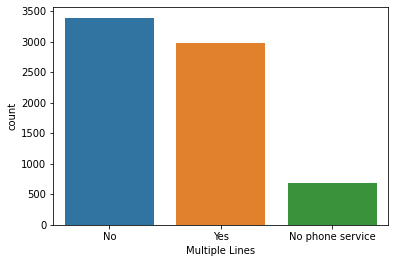

In [ ]:
import seaborn as sns
ax = sns.countplot(y,label="Count")     
no,yes,no_phone = y.value_counts()
print('Number of No: ',no)
print('Number of Yes : ',yes)
print('Number of No Phone: ',no_phone)
print('pourcentage')
mean_no=float(no)*100/float(no+yes+no_phone)
mean_yes=float(yes)*100/float(no+yes+no_phone)
mean_no_phone=float(no_phone)*100/float(no+yes+no_phone)
print('pourcentage of No:',mean_no,'%')
print('pourcentage of Yes :',mean_yes,'%')
print('pourcentage of No Phone :',mean_no_phone,'%')

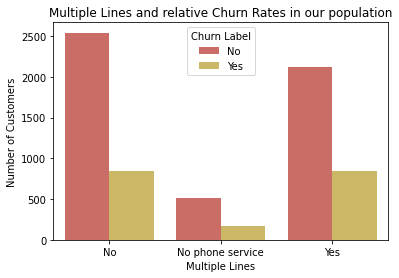

In [ ]:
gb = data.groupby("Multiple Lines")["Churn Label"].value_counts().to_frame().rename({"Churn Label": "Number of Customers"}, axis = 1).reset_index()
sns.barplot(x = "Multiple Lines", y = "Number of Customers", data = gb, hue = "Churn Label", palette = sns.color_palette("hls", 8)).set_title("Multiple Lines and relative Churn Rates in our population");

In [ ]:
mean_no=gb["Number of Customers"][0]/float(gb["Number of Customers"][0]+gb["Number of Customers"][1])
mean_yes=gb["Number of Customers"][2]/float(gb["Number of Customers"][2]+gb["Number of Customers"][3])
mean_no_phone=gb["Number of Customers"][4]/float(gb["Number of Customers"][4]+gb["Number of Customers"][5])
print('pourcentage of No:',mean_no,'%')
print('pourcentage of Yes :',mean_yes,'%')
print('pourcentage of No Phone :',mean_no_phone,'%')

pourcentage of No: 0.7495575221238938 %
pourcentage of Yes : 0.750733137829912 %
pourcentage of No Phone : 0.713901043419724 %


* customers with multiple lines,without multiple lines and with no phone  are showed the same proportions of Churn

## Internet service distribution

Fiber optic    43.958540
DSL            34.374556
No             21.666903
Name: Internet Service, dtype: float64


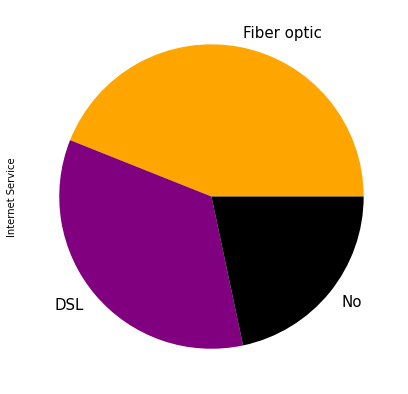

In [ ]:
internet = (data['Internet Service'].value_counts()*100.0 /len(data)).plot(kind='pie',labels = ['Fiber optic', 'DSL', 'No'], figsize = (7,7) , colors = ['orange','purple', 'black'], fontsize = 15)
pourcentage=data['Internet Service'].value_counts()*100.0 /len(data)
print(pourcentage)
plt.show()

* Among the ones that have internet service, DSL and Fiber optic are almost equally distributed (the fraction of people having Fiber optic is slightly greater). Less than one fourth of the members of our sample has no internet service.

## Contract distribution

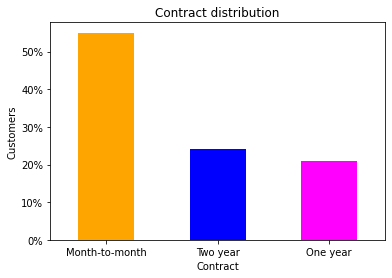

In [ ]:
contract = (data['Contract'].value_counts()*100.0 /len(data)).plot(kind='bar', stacked = True,\
                                                rot = 0, color = ['orange','blue','magenta'])
  
contract.yaxis.set_major_formatter(mtick.PercentFormatter())
contract.set_ylabel('Customers')
contract.set_xlabel('Contract')
contract.set_title('Contract distribution');

* More than half customers have a month-to-month contract.

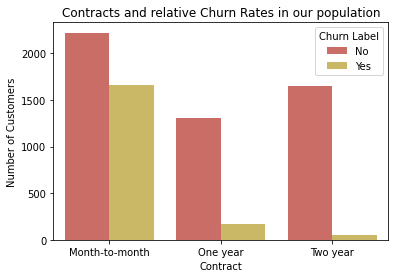

In [ ]:
gb = data.groupby("Contract")["Churn Label"].value_counts().to_frame().rename({"Churn Label": "Number of Customers"}, axis = 1).reset_index()
sns.barplot(x = "Contract", y = "Number of Customers", data = gb, hue = "Churn Label", palette = sns.color_palette("hls", 8)).set_title("Contracts and relative Churn Rates in our population");

In [ ]:
gb

,Contract,Churn Label,Number of Customers
0,Month-to-month,No,2220
1,Month-to-month,Yes,1655
2,One year,No,1307
3,One year,Yes,166
4,Two year,No,1647
5,Two year,Yes,48


In [ ]:
mean_yes_month=gb["Number of Customers"][1]/float(gb["Number of Customers"][0]+gb["Number of Customers"][1])
mean_yes_year=gb["Number of Customers"][3]/float(gb["Number of Customers"][2]+gb["Number of Customers"][3])
mean_yes_two_year=gb["Number of Customers"][5]/float(gb["Number of Customers"][4]+gb["Number of Customers"][5])
print('pourcentage of month to month type contract churners:',mean_yes_month,'%')
print('pourcentage of one year type contract churners: :',mean_yes_year,'%')
print('pourcentage of two year type contract churners: :',mean_yes_two_year,'%')

pourcentage of month to month type contract churners: 0.4270967741935484 %
pourcentage of one year type contract churners: : 0.11269517990495587 %
pourcentage of two year type contract churners: : 0.02831858407079646 %


* It's obvious that that customers who have month to month type contract are more likely to churn 

## Monthly charge distribution

* histogram de Monthly Charges

Text(0, 0.5, 'number of persons')

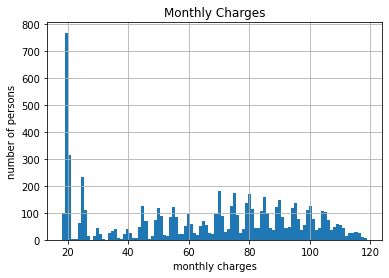

In [ ]:
data.hist(column='Monthly Charges',bins=100);
plt.xlabel('monthly charges')
plt.ylabel('number of persons')

* density plot

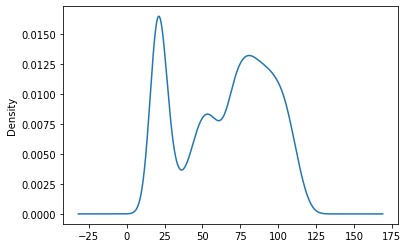

In [ ]:
data['Monthly Charges'].plot.kde();

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


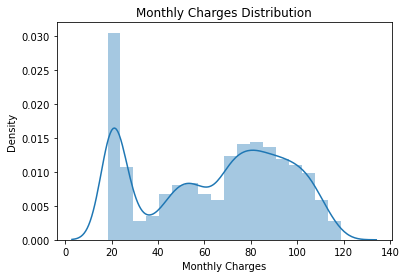

In [ ]:
sns.distplot(data["Monthly Charges"]).set_title("Monthly Charges Distribution");

* since we have 1585 values in this column, we can't separate churners and non churners by their monthly charges.

## Total Charges distribution 

* we can't make the histogram and the density with total charges because the type is not numerical so we will convert it 

In [ ]:
try:
    data["Total Charges"].astype("float64")
except ValueError:
    print("We can't convert this column to floats, there must be some non-convertible values")

We can't convert this column to floats, there must be some non-convertible values


In [ ]:
data.dtypes

City                  object
Zip Code               int64
Lat Long              object
Latitude             float64
Longitude            float64
Gender                object
Senior Citizen        object
Partner               object
Dependents            object
Tenure Months          int64
Phone Service         object
Multiple Lines        object
Internet Service      object
Online Security       object
Online Backup         object
Device Protection     object
Tech Support          object
Streaming TV          object
Streaming Movies      object
Contract              object
Paperless Billing     object
Payment Method        object
Monthly Charges      float64
Total Charges         object
Churn Label           object
Churn Value            int64
Churn Score            int64
CLTV                   int64
Churn Reason          object
dtype: object

In [ ]:
print(data["Total Charges"].value_counts().head(n=8))

         11
20.2     11
19.75     9
19.9      8
19.65     8
20.05     8
19.55     7
45.3      7
Name: Total Charges, dtype: int64


* We have 11 observations that take an empty string value. Let's drop that. The string we want to drop is :' '

In [ ]:
print(data["Total Charges"].value_counts().index[0])
print(data["Total Charges"].value_counts().index[1])

 
20.2


* Let's drop the observations with empty values, reset the index and now we should be able to convert the Total Charges column to float:



In [ ]:
data.drop(data[data['Total Charges'] == " "].index, axis = 0, inplace = True)
data.reset_index(drop = True, inplace = True)

In [ ]:
data.shape

(7032, 29)

In [ ]:
data["Total Charges"] = data["Total Charges"].astype("float64")

* histogram de Total charges 

Text(0, 0.5, 'number of persons')

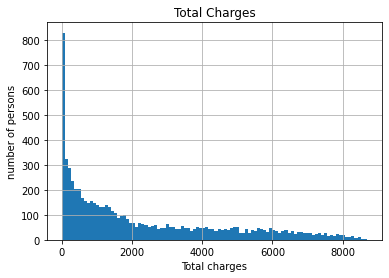

In [ ]:
data.hist(column='Total Charges',bins=100);
plt.xlabel('Total charges')
plt.ylabel('number of persons')

* density plot

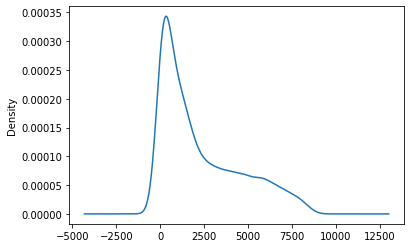

In [ ]:
data['Total Charges'].plot.kde();

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


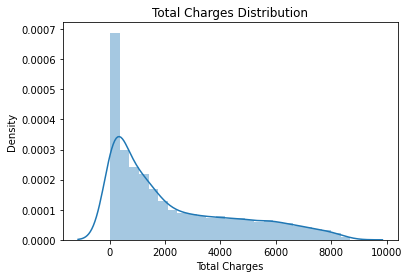

In [ ]:
sns.distplot(data["Total Charges"]).set_title("Total Charges Distribution");

##other columns

In [ ]:
print(data.dtypes)

City                  object
Zip Code               int64
Lat Long              object
Latitude             float64
Longitude            float64
Gender                object
Senior Citizen        object
Partner               object
Dependents            object
Tenure Months          int64
Phone Service         object
Multiple Lines        object
Internet Service      object
Online Security       object
Online Backup         object
Device Protection     object
Tech Support          object
Streaming TV          object
Streaming Movies      object
Contract              object
Paperless Billing     object
Payment Method        object
Monthly Charges      float64
Total Charges        float64
Churn Label           object
Churn Value            int64
Churn Score            int64
CLTV                   int64
Churn Reason          object
dtype: object


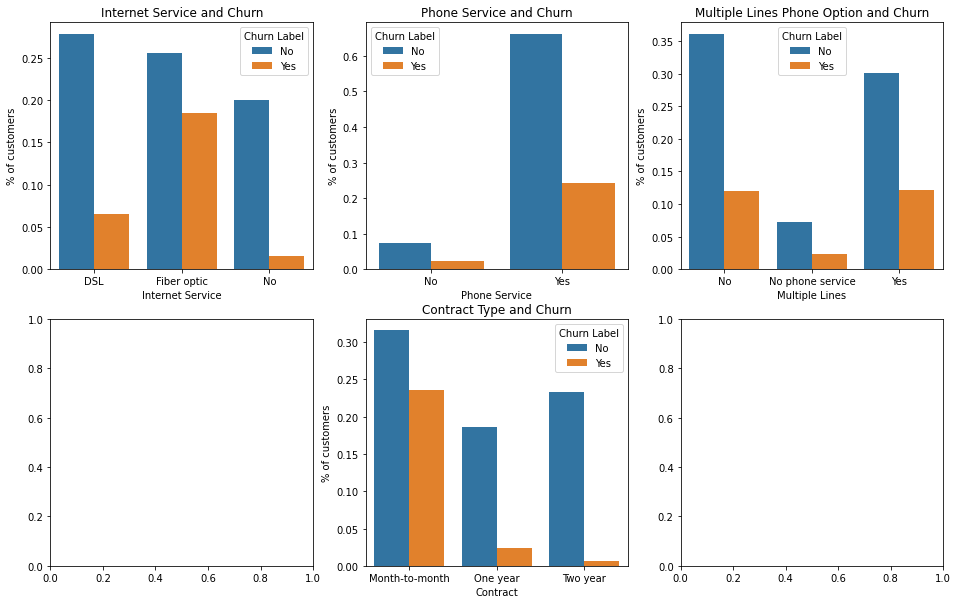

In [ ]:
fig, axis = plt.subplots(nrows = 2, ncols = 3, figsize = (16, 10))

gb = data.groupby("Internet Service")["Churn Label"].value_counts()/len(data)
gb = gb.to_frame().rename({"Churn Label": "% of customers"}, axis = 1).reset_index()
sns.barplot(x = "Internet Service", y = "% of customers", data = gb, hue = "Churn Label", ax = axis[0][0]).set_title("Internet Service and Churn");

gb = data.groupby("Phone Service")["Churn Label"].value_counts()/len(data)
gb = gb.to_frame().rename({"Churn Label": "% of customers"}, axis = 1).reset_index()
sns.barplot(x = "Phone Service", y = "% of customers", data = gb, hue = "Churn Label", ax = axis[0][1]).set_title("Phone Service and Churn");

gb = data.groupby("Multiple Lines")["Churn Label"].value_counts()/len(data)
gb = gb.to_frame().rename({"Churn Label": "% of customers"}, axis = 1).reset_index()
sns.barplot(x = "Multiple Lines", y = "% of customers", data = gb, hue = "Churn Label", ax = axis[0][2]).set_title("Multiple Lines Phone Option and Churn");

gb = data.groupby("Contract")["Churn Label"].value_counts()/len(data)
gb = gb.to_frame().rename({"Churn Label": "% of customers"}, axis = 1).reset_index()
sns.barplot(x = "Contract", y = "% of customers", data = gb, hue = "Churn Label", ax = axis[1][1]).set_title("Contract Type and Churn");

* We notice that The customers with Fiber optic tend to churn a lot more when compared to DSL and No Internet. Maybe the Internet connection offered is low-quality?<br/>
MultipleLines do not seem to affect the churn rate.<br/>
Shorter-term contract renewals are highly correlated with the churn rate. But most likely it's an omitted variable bias issue: the more I trust a provider, the more I reason in long-terms with it.

Now we want to see how the "Internet Services" that follow the variable pattern: ["No", "Yes", "No internet service"] affect the churn rate

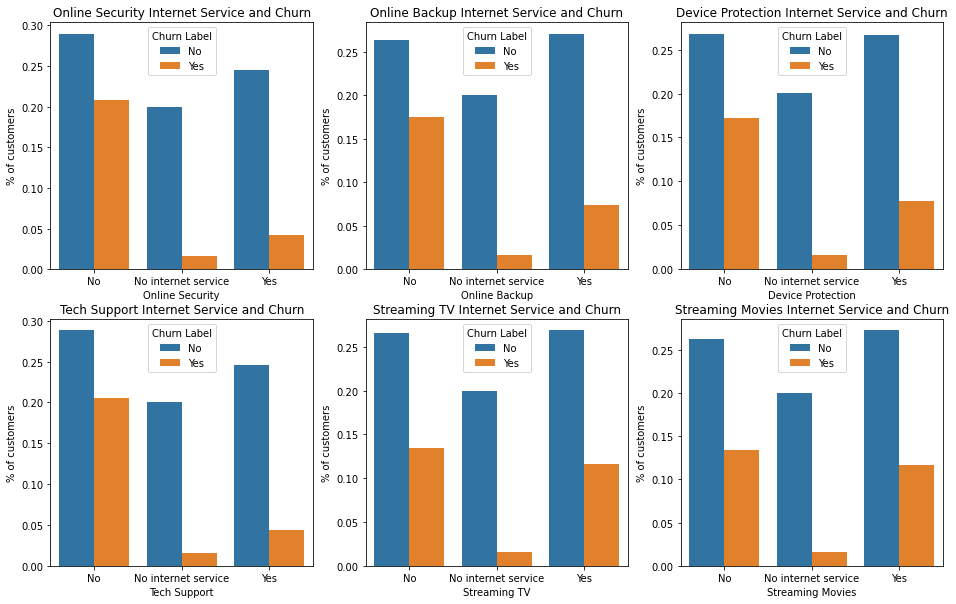

In [ ]:
fig, axis = plt.subplots(nrows = 2, ncols = 3, figsize = (16, 10))

gb = data.groupby("Online Security")["Churn Label"].value_counts()/len(data)
gb = gb.to_frame().rename({"Churn Label": "% of customers"}, axis = 1).reset_index()
sns.barplot(x = "Online Security", y = "% of customers", data = gb, hue = "Churn Label", ax = axis[0][0]).set_title("Online Security Internet Service and Churn")

gb = data.groupby("Online Backup")["Churn Label"].value_counts()/len(data)
gb = gb.to_frame().rename({"Churn Label": "% of customers"}, axis = 1).reset_index()
sns.barplot(x = "Online Backup", y = "% of customers", data = gb, hue = "Churn Label", ax = axis[0][1]).set_title("Online Backup Internet Service and Churn")

gb = data.groupby("Device Protection")["Churn Label"].value_counts()/len(data)
gb = gb.to_frame().rename({"Churn Label": "% of customers"}, axis = 1).reset_index()
sns.barplot(x = "Device Protection", y = "% of customers", data = gb, hue = "Churn Label", ax = axis[0][2]).set_title("Device Protection Internet Service and Churn")

gb = data.groupby("Tech Support")["Churn Label"].value_counts()/len(data)
gb = gb.to_frame().rename({"Churn Label": "% of customers"}, axis = 1).reset_index()
sns.barplot(x = "Tech Support", y = "% of customers", data = gb, hue = "Churn Label", ax = axis[1][0]).set_title("Tech Support Internet Service and Churn")

gb = data.groupby("Streaming TV")["Churn Label"].value_counts()/len(data)
gb = gb.to_frame().rename({"Churn Label": "% of customers"}, axis = 1).reset_index()
sns.barplot(x = "Streaming TV", y = "% of customers", data = gb, hue = "Churn Label", ax = axis[1][1]).set_title("Streaming TV Internet Service and Churn")

gb = data.groupby("Streaming Movies")["Churn Label"].value_counts()/len(data)
gb = gb.to_frame().rename({"Churn Label": "% of customers"}, axis = 1).reset_index()
sns.barplot(x = "Streaming Movies", y = "% of customers", data = gb, hue = "Churn Label", ax = axis[1][2]).set_title("Streaming Movies Internet Service and Churn");

- OnlineSecurity, OnlineBackup, TechSupport seem to have a significant impact on lowering the churn. If the company wants to lower the churn rate, It may be a good idea to include these services as standard in the following order: OnlineSecurity, TechSupport, OnlineBackUp, DeviceProtection (although removing the internet connection service altogether may be potentially be more beneficial, at least the Fiber one; see graphs above for details). Although unlikely, it is also possible that these services get cumulated with tenure, and thus their effect on the churn only reflects the negative impact of tenure on the churn rate; in the next cells we will try to figure out whether this is true or not.

- StreamingTV and StreamingMovies do not seem to have a large enough effect on customer Churn Rate.

To assess whether additional services are accumulated through tenure (e.g. fidalty programs), we run a lmplot for each additional Internet service.

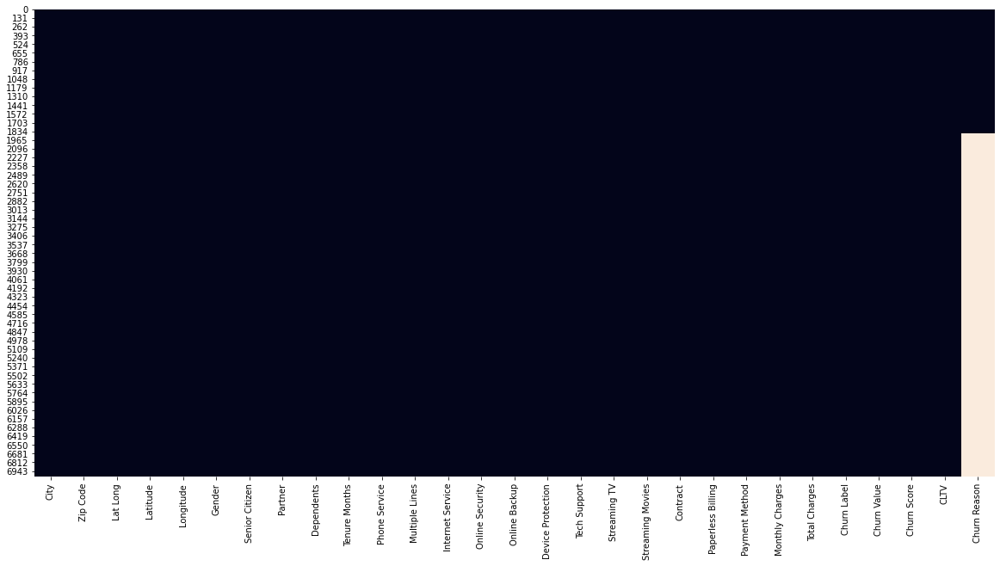

In [ ]:
plt.figure(figsize=(20,10))
sns.heatmap(data.isna(), cbar=False)

In [ ]:
nombre1=data['Churn Reason'].value_counts().sum()
nombre2=data['Churn Label'].value_counts()
print(nombre1)
print(nombre2['Yes'])

1869
1869


* All customers who left have Churn Reasons 

In [ ]:
To_drop=['Churn Reason']
data=data.drop(To_drop,axis=1)

In [ ]:
To_drop=['Churn Label']
data=data.drop(To_drop,axis=1)

* We delete this column because it contains the same significant of Churn Value 

* Convert all yes and no to 0's & 1's so our classifier can use this data.

In [ ]:
columns_to_convert = ['Partner', 
                      'Dependents', 
                      'Phone Service', 
                      'Paperless Billing', 
                      ]

for item in columns_to_convert:
    data[item].replace(to_replace='Yes', value=1, inplace=True)
    data[item].replace(to_replace='No',  value=0, inplace=True)
data.head()

,City,Zip Code,Lat Long,Latitude,Longitude,Gender,Senior Citizen,Partner,Dependents,Tenure Months,Phone Service,Multiple Lines,Internet Service,Online Security,Online Backup,Device Protection,Tech Support,Streaming TV,Streaming Movies,Contract,Paperless Billing,Payment Method,Monthly Charges,Total Charges,Churn Value,Churn Score,CLTV
0,Los Angeles,90003,"33.964131, -118.272783",33.964131,-118.272783,Male,No,0,0,2,1,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,1,Mailed check,53.85,108.15,1,86,3239
1,Los Angeles,90005,"34.059281, -118.30742",34.059281,-118.307420,Female,No,0,1,2,1,No,Fiber optic,No,No,No,No,No,No,Month-to-month,1,Electronic check,70.70,151.65,1,67,2701
2,Los Angeles,90006,"34.048013, -118.293953",34.048013,-118.293953,Female,No,0,1,8,1,Yes,Fiber optic,No,No,Yes,No,Yes,Yes,Month-to-month,1,Electronic check,99.65,820.50,1,86,5372
3,Los Angeles,90010,"34.062125, -118.315709",34.062125,-118.315709,Female,No,1,1,28,1,Yes,Fiber optic,No,No,Yes,Yes,Yes,Yes,Month-to-month,1,Electronic check,104.80,3046.05,1,84,5003
4,Los Angeles,90015,"34.039224, -118.266293",34.039224,-118.266293,Male,No,0,1,49,1,Yes,Fiber optic,No,Yes,Yes,No,Yes,Yes,Month-to-month,1,Bank transfer (automatic),103.70,5036.30,1,89,5340


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7032 entries, 0 to 7031
Data columns (total 27 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   City               7032 non-null   object 
 1   Zip Code           7032 non-null   int64  
 2   Lat Long           7032 non-null   object 
 3   Latitude           7032 non-null   float64
 4   Longitude          7032 non-null   float64
 5   Gender             7032 non-null   object 
 6   Senior Citizen     7032 non-null   object 
 7   Partner            7032 non-null   int64  
 8   Dependents         7032 non-null   int64  
 9   Tenure Months      7032 non-null   int64  
 10  Phone Service      7032 non-null   int64  
 11  Multiple Lines     7032 non-null   object 
 12  Internet Service   7032 non-null   object 
 13  Online Security    7032 non-null   object 
 14  Online Backup      7032 non-null   object 
 15  Device Protection  7032 non-null   object 
 16  Tech Support       7032 

In [ ]:
nbr_col_unique =data.nunique()
print(nbr_col_unique)

City                 1129
Zip Code             1652
Lat Long             1652
Latitude             1652
Longitude            1651
Gender                  2
Senior Citizen          2
Partner                 2
Dependents              2
Tenure Months          72
Phone Service           2
Multiple Lines          3
Internet Service        3
Online Security         3
Online Backup           3
Device Protection       3
Tech Support            3
Streaming TV            3
Streaming Movies        3
Contract                3
Paperless Billing       2
Payment Method          4
Monthly Charges      1584
Total Charges        6530
Churn Value             2
Churn Score            85
CLTV                 3435
dtype: int64


In [ ]:
sns.pairplot(data, hue='Churn Value', height=2.5);

* almost the same result of the previous pairplot.

In [ ]:
df=data.copy()

In [ ]:
To_drop=['City','Lat Long']
df=df.drop(To_drop,axis=1)

* the column city has 1129 values so encoding it will add a large number of columns to the dataset, which is not convenient. <br>
* the column 'Lat Long' is already encoded. 

In [ ]:
df.info()

In [ ]:
nbr_col_unique =df.nunique()
print(nbr_col_unique)

In [ ]:
x=data['Latitude']
y=data['Longitude']
sns.displot(data, x=x, y=y, hue="Churn Value", kind="kde")

* it can be noticed that there is a homogeneity in the distribution of customers in relation with churn value  depending on latitude and longitude from which it may be that the altitude and longitude are weakly correlated with our target.

In [ ]:
x=data['Latitude']
y=data['Longitude']

sns.jointplot(
    data=data,
    x=x, y=y, hue="Churn Value",
    kind="kde"
)

* it can be noticed that there are some values of altitude and longitude where the density of customers is high 

* the graph has almost the same shape as the California's map so we can conlude from this result that a large number of churners is situated in the north of the this state.<br>
* we can provide this area with better services

##Churn Score


In [ ]:
data.hist(column='Churn Score',bins=80);
plt.xlabel('Churn Score')
plt.ylabel('number of persons')

In [ ]:
data['Churn Score'].plot.kde()

In [ ]:
ax = sns.boxplot(x=data['Churn Value'], y=data['Churn Score'], data=data)

* absence of outliers.

# Correlation

In [ ]:
df.columns

In [ ]:
df = pd.get_dummies(df.iloc[:, 1 :])
df.head()

In [ ]:
df.columns

In [ ]:
df.shape

##Tests for normal distributions

In [ ]:
liste_columns=df.columns
k=0
for i in liste_columns:
  test=stats.shapiro(df[i])
  if (test[1]>0.05):
    k=k+1
    print('the p_value of ',i,' is ',test[1])
if k==0:
  print('all variables has not a normal distribution because all p_values are smaller than 0.05')


all variables has not a normal distribution because all p_values are smaller than 0.05

so we will use spearman in correlation parameter

correlation value without abs

In [ ]:
c=df.corr()[['Churn Value']]
s = c.unstack()
so = s.sort_values(kind="quicksort")
print(so)

* correlation value with abs and person parameter for better understanding of each feature.

In [ ]:
plt.figure(figsize=(10,5))
fig, ax = plt.subplots(figsize=(15,15)) 
sns.heatmap(df.corr()[['Churn Value']],cmap="RdBu_r",center=0.0, annot=True);
c=df.corr()[['Churn Value']].abs()
s = c.unstack()
so = s.sort_values(kind="quicksort")
print(so)

correlation value with abs and spearman parameter

In [ ]:
plt.figure(figsize=(10,5))
fig, ax = plt.subplots(figsize=(15,15)) 
sns.heatmap(df.corr()[['Churn Value']],cmap="RdBu_r",center=0.0, annot=True);
c=df.corr(method='spearman')[['Churn Value']].abs()
s = c.unstack()
so = s.sort_values(kind="quicksort")
print(so)

Correlation Matrix without abs

In [ ]:
sns.clustermap(df.corr(method='spearman'),figsize=(15,15))
plt.show()

Correlation Matrix with abs

In [ ]:
f = plt.figure(figsize=(19, 15))
plt.matshow(df.corr(method='spearman').abs(), fignum=f.number)
plt.xticks(range(df.shape[1]), df.columns, fontsize=14, rotation=45)
plt.yticks(range(df.shape[1]), df.columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.title('Correlation Matrix', fontsize=16);

Correlation with table form

In [ ]:
corr = df.corr(method='spearman')
corr.style.background_gradient(cmap='coolwarm')

#we have separated X for features and Y for target

In [ ]:
var_gender='Churn Value'
print(df[var_gender].unique())
y=df[var_gender]   
no, yes = y.value_counts()
print('Number of yes: ',yes)
print('Number of no : ',no)

In [ ]:
df_majority = df[df['Churn Value']==0]
df_minority = df[df['Churn Value']==1]
df_minority_upsampled = resample(df_minority, 
                                 replace=True,     
                                 n_samples=len(df_majority),    
                                 random_state=123) 
df_upsampled = pd.concat([df_majority, df_minority_upsampled])
 

In [ ]:
df_upsampled.to_excel(r'/content/drive/MyDrive/ML project/New_Data.xlsx', index = False)

In [ ]:
X_samp=df_upsampled.copy()
Y_samp=df_upsampled['Churn Value']
To_drop=['Churn Value','CLTV','Churn Score']
X_samp=X_samp.drop(To_drop,axis=1)


In [ ]:
X=df.copy()

In [ ]:
Y=df['Churn Value']

In [ ]:
To_drop=['Churn Value','Churn Score','CLTV']
X=X.drop(To_drop,axis=1)

In [ ]:
Y=Y_samp
X=X_samp

In [ ]:
X_churn_score=df.copy()
To_drop=['Churn Value','CLTV']
X_churn_score=X_churn_score.drop(To_drop,axis=1)

standardization for pca

In [ ]:
sc=StandardScaler()
X_pca=sc.fit_transform(X) 
model=PCA(n_components=30)
X_pca_comp=model.fit_transform(X_pca)

In [ ]:
X_pca_comp.shape

In [ ]:
var=model.explained_variance_ratio_*100
print(var)

In [ ]:
np.cumsum(model.explained_variance_ratio_*100)

In [ ]:
plt.plot(np.cumsum(model.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

In [ ]:
np.argmax(np.cumsum(model.explained_variance_ratio_)>0.9)

with necessary columns

In [ ]:
sc=StandardScaler()
X_pca=sc.fit_transform(X) 
model=PCA(n_components=26)
X_pca_comp=model.fit_transform(X_pca)

In [ ]:
X_pca_comp.shape

In [ ]:
var=model.explained_variance_ratio_*100
print(var)

In [ ]:
np.cumsum(model.explained_variance_ratio_*100)

In [ ]:
plt.plot(np.cumsum(model.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

In [ ]:
pca_df=pd.DataFrame(X_pca_comp,columns=['pca1','pca2','pca3','pca4','pca5','pca6','pca7','pca8','pca9','pca10','pca11','pca12','pca13','pca14','pca15','pca16','pca17','pca18','pca19','pca20','pca21','pca22','pca23','pca24','pca25','pca26'])

In [ ]:
X_train, X_test, Y_train, Y_test= train_test_split(pca_df,Y, train_size=0.80, random_state=6,stratify=Y)

In [ ]:
final_model = XGBClassifier()
final_model.fit(X_train, Y_train)
print(final_model.score(X_test, Y_test))
print(final_model.score(X_train, Y_train))

In [ ]:
labels=['No','Yes']
plot_confusion_matrix(final_model, X_test, Y_test,display_labels=labels, cmap=plt.cm.Blues)
plt.show()

In [ ]:
knn_pred_prob =final_model.predict_proba(X_test)[:,1]
knn_auroc = roc_auc_score(Y_test, knn_pred_prob)
print("xgboost AUROC: {}".format(knn_auroc))
knn_y_pred = final_model.predict(X_test)
print(classification_report(Y_test, knn_y_pred,digits=6))

#determinate churn score

##corr

* plot Churn score depending on other features.


In [ ]:
Churn_Score=X_churn_score.copy()

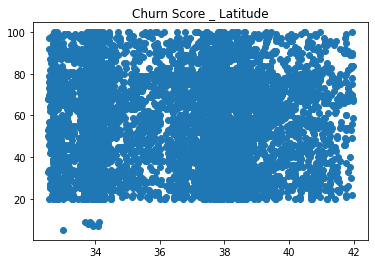

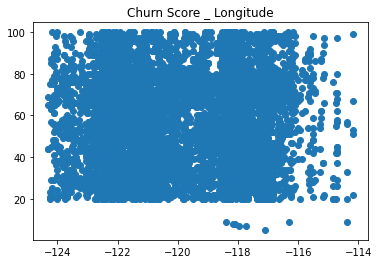

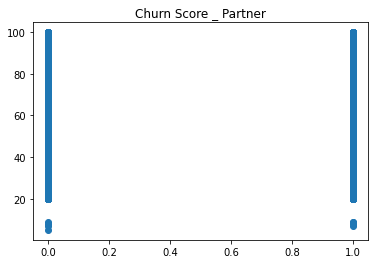

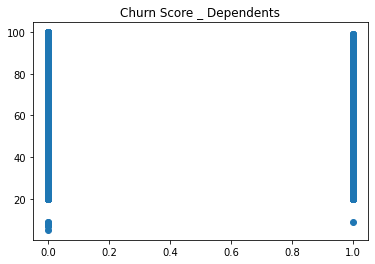

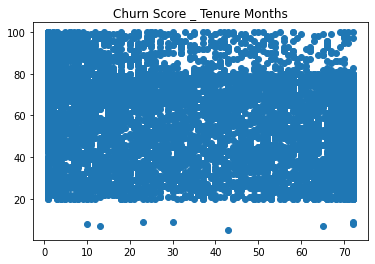

...

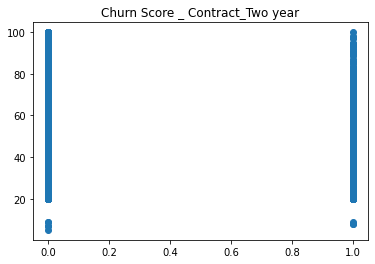

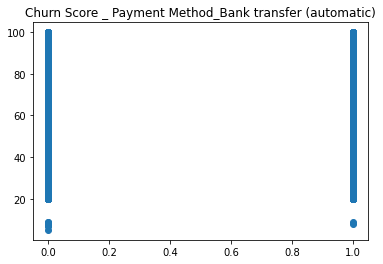

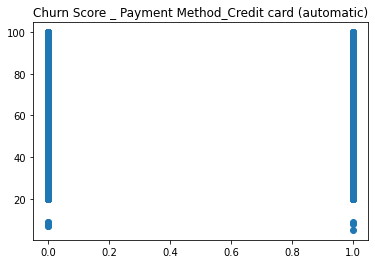

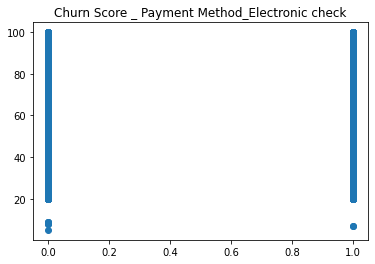

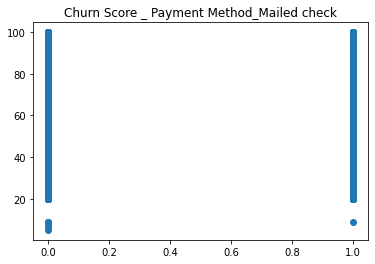

In [ ]:
b=len(Churn_Score.columns)
for i in np.arange(0,b):
  var=Churn_Score.columns[i]
  x=Churn_Score[var]
  y=Churn_Score['Churn Score']
  plt.scatter(x,y)
  name='Churn Score _ '+var
  plt.title(name)
  plt.show()

In [ ]:
c=Churn_Score.corr()[['Churn Score']].abs()
s = c.unstack()
so = s.sort_values(kind="quicksort")
print(so)


Churn Score  Gender_Female                               0.000431
             Gender_Male                                 0.000431
             Longitude                                   0.003724
             Latitude                                    0.007471
             Phone Service                               0.023274
             Multiple Lines_No phone service             0.023274
             Multiple Lines_No                           0.028796
             Streaming TV_Yes                            0.041421
             Multiple Lines_Yes                          0.043061
             Online Backup_Yes                           0.046769
             Streaming Movies_Yes                        0.047901
             Device Protection_Yes                       0.054366
             Payment Method_Mailed check                 0.062608
             Payment Method_Bank transfer (automatic)    0.072954
             Streaming Movies_No                         0.074848
          

In [ ]:
c=Churn_Score.corr(method='spearman')[['Churn Score']].abs()
s = c.unstack()
so = s.sort_values(kind="quicksort")
print(so)

Churn Score  Gender_Female                               0.001042
             Gender_Male                                 0.001042
             Longitude                                   0.003143
             Latitude                                    0.004379
             Phone Service                               0.024098
             Multiple Lines_No phone service             0.024098
             Multiple Lines_No                           0.027776
             Streaming TV_Yes                            0.041181
             Multiple Lines_Yes                          0.042522
             Streaming Movies_Yes                        0.048225
             Online Backup_Yes                           0.049008
             Device Protection_Yes                       0.055084
             Payment Method_Mailed check                 0.064359
             Payment Method_Bank transfer (automatic)    0.074515
             Streaming Movies_No                         0.074983
          

* Churn Score correlation value=0.64 <br>
* so we keep it

In [ ]:
All_features1=['Latitude','Longitude','Gender_Male','Gender_Female','Multiple Lines_No phone service','Phone Service','Multiple Lines_No','Multiple Lines_Yes','Streaming Movies_Yes','Streaming TV_Yes','Device Protection_Yes','Online Backup_Yes','Payment Method_Mailed check','Payment Method_Bank transfer (automatic)','Internet Service_DSL','Streaming TV_No','Streaming Movies_No','Payment Method_Credit card (automatic)','Partner','Senior Citizen_No','Senior Citizen_Yes','Tech Support_Yes','Online Security_Yes','Contract_One year','Paperless Billing','Monthly Charges','Total Charges','Device Protection_No internet service','Streaming Movies_No internet service','Streaming TV_No internet service','Tech Support_No internet service','Online Security_No internet service','Online Backup_No internet service','Internet Service_No','Dependents','Device Protection_No','Online Backup_No','Payment Method_Electronic check','Contract_Two year','Internet Service_Fiber optic','Tech Support_No','Online Security_No','Tenure Months','Contract_Month-to-month','Churn Score']

In [ ]:
Churn_Score_Target=Churn_Score['Churn Score']

In [ ]:
Churn_Score_Features=Churn_Score.copy()

In [ ]:
Churn_Score_Features=Churn_Score_Features.drop('Churn Score',axis=1)

In [ ]:
len(Churn_Score_Features.columns)

44

In [ ]:
Churn_Score_Features.columns

Index(['Latitude', 'Longitude', 'Partner', 'Dependents', 'Tenure Months',
       'Phone Service', 'Paperless Billing', 'Monthly Charges',
       'Total Charges', 'Gender_Female', 'Gender_Male', 'Senior Citizen_No',
       'Senior Citizen_Yes', 'Multiple Lines_No',
       'Multiple Lines_No phone service', 'Multiple Lines_Yes',
       'Internet Service_DSL', 'Internet Service_Fiber optic',
       'Internet Service_No', 'Online Security_No',
       'Online Security_No internet service', 'Online Security_Yes',
       'Online Backup_No', 'Online Backup_No internet service',
       'Online Backup_Yes', 'Device Protection_No',
       'Device Protection_No internet service', 'Device Protection_Yes',
       'Tech Support_No', 'Tech Support_No internet service',
       'Tech Support_Yes', 'Streaming TV_No',
       'Streaming TV_No internet service', 'Streaming TV_Yes',
       'Streaming Movies_No', 'Streaming Movies_No internet service',
       'Streaming Movies_Yes', 'Contract_Month-to-month',

In [ ]:
var=Churn_Score_Features

In [ ]:
X_train_score, X_test_score, Y_train_score, Y_test_score= train_test_split(Churn_Score_Features,Churn_Score_Target, train_size=0.8, random_state=6)

In [ ]:
scaler=RobustScaler()
X_train_score=scaler.fit_transform(X_train_score)
X_test_score=scaler.transform(X_test_score)

* we use RobustScaler because it scales features using statistics that are robust to outliers

##LinearRegression

In [ ]:
from sklearn.linear_model import LinearRegression
regr = LinearRegression()
regr.fit(X_train_score,Y_train_score)
regr.score(X_test_score,Y_test_score)

0.21529531458367324

##SVR

In [ ]:
def idx_max(liste):
	max = liste[0]
	a = 0  
	for i in range(len(liste)):
		if liste[i] > max:
			max  = liste [i]
			a = i
	return max, a 

In [ ]:

x=[]
liste_score=[]
for i in np.arange(1,300):
  regr = SVR(C=i,verbose=3)
  regr.fit(X_train_score,Y_train_score)
  Y_pred_score=regr.predict(X_test_score)
  print('the score is here')
  print(regr.score(X_test_score,Y_test_score))
  print('Median absolute error')
  print(median_absolute_error(Y_test_score,Y_pred_score))
  r2=r2_score(Y_test_score,Y_pred_score)
  print('R2 score')
  print(r2)
  print('****')
  x.append(i)
  liste_score.append(r2)


[LibSVM]the score is here
-0.009964267351830314
Median absolute error
16.60527347481407
R2 score
-0.009964267351830314
****
[LibSVM]the score is here
-0.006600972929194926
Median absolute error
16.6615874379859
R2 score
-0.006600972929194926
****
[LibSVM]the score is here
-0.003725256972480162
Median absolute error
16.567595335783032
R2 score
-0.003725256972480162
****
[LibSVM]the score is here
-0.0006185100905025109
Median absolute error
16.519851782434287
R2 score
-0.0006185100905025109
****
[LibSVM]the score is here
0.002349007593244301
Median absolute error
16.41377793414128
R2 score
0.002349007593244301
****
[LibSVM]the score is here
0.005528099594719782
Median absolute error
16.48349707224707
R2 score
0.005528099594719782
****
[LibSVM]the score is here
0.007552781096416772
Median absolute error
16.47042454668764
R2 score
0.007552781096416772
****
[LibSVM]the score is here
0.01022177312957917
Median absolute error
16.46270417306181
R2 score
0.01022177312957917
****
[LibSVM]the sco

KeyboardInterrupt: ignored

In [ ]:
idx_max(liste_score)

In [ ]:
plt.scatter(x,liste_score)
plt.show()

In [ ]:
#print('Intercept: \n', regr.intercept_)
#print('Coefficients: \n', regr.coef_)

##Lasso Regression

we can't use Stepwise Regression because this form of regression is used when we deal with multiple independent variables

In [ ]:
start = timeit.default_timer()
Liste_fin=[]

for j in np.arange(len(All_features1)-2,0,-1):
  Churn_Score_Features=var.copy()
  To_drop=All_features1[:j]
  Churn_Score_Features=Churn_Score_Features.drop(To_drop,axis=1)
  X_train_score, X_test_score, Y_train_score, Y_test_score= train_test_split(Churn_Score_Features,Churn_Score_Target, train_size=0.8, random_state=6)
  scaler=RobustScaler()
  X_train_score=scaler.fit_transform(X_train_score)
  X_test_score=scaler.transform(X_test_score)
  clf = Lasso(alpha=0.05)
  clf.fit(X_train_score,Y_train_score)
  Y_pred_score=clf.predict(X_test_score)
  Liste_fin.append(r2_score(Y_test_score,Y_pred_score))

print(Liste_fin)
stop = timeit.default_timer()
print('Time: ', stop - start)

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
[0.13081903840647569, 0.13764930327756153, 0.16179334319203165, 0.17310357727067427, 0.18444197898446102, 0.18436081684273686, 0.1896442632231945, 0.1896442632231945, 0.18957485035525456, 0.2099950197194248, 0.20999484009747937, 0.20999492130135222, 0.20999487771224667, 0.20999520688104245, 0.20999520688104245, 0.20999520688104245, 0.20999519582156145, 0.20999504185614248, 0.210836232663969, 0.2116939333792518, 0.21169392700216993, 0.2109642494969567, 0.21096281108832182, 0.2108788672390257, 0.2108788672390257, 0.21090812294799122, 0.21090812319922392, 0.2125632358152243, 0.21270381797349736, 0.21270357544047336, 0.21270357544047336, 0.21270357579050725, 0.21270357596937273, 0.21270357110571692, 0.21311444346668507, 0.2131157704599489, 0.21369344710184623, 0.21476918213017848, 0.21476918247024768, 0.21476918259026556, 0.21476918259006605, 0.21476918259006605, 0.214769

In [ ]:
max(Liste_fin)

0.2147691826287379

In [ ]:

clf = Lasso(alpha=0.05)
print(clf)
clf.fit(X_train_score,Y_train_score)
Y_pred_score=clf.predict(X_test_score)
print('the score is here')
print(clf.score(X_test_score,Y_test_score))
print('Median absolute error')
print(median_absolute_error(Y_test_score,Y_pred_score))
print('R2 score')
print(r2_score(Y_test_score,Y_pred_score))
clf.coef_


Lasso(alpha=0.05, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=None,
      selection='cyclic', tol=0.0001, warm_start=False)
the score is here
0.11907710708560137
Median absolute error
15.700717307921835
R2 score
0.11907710708560137


array([ 2.10720340e-01, -4.81267385e+00, -2.31191980e-02,  1.67319845e+00,
        1.27701692e-01, -1.77070925e-03, -1.72254643e-01,  9.72227486e-16,
       -1.21990601e+00,  1.07881987e+00,  0.00000000e+00,  1.46330317e+00,
        0.00000000e+00, -8.28964141e-01,  2.20631627e-01,  0.00000000e+00,
       -4.06232582e-01,  1.63708772e+00,  0.00000000e+00,  5.90555153e-01,
        0.00000000e+00, -7.93743746e-01, -0.00000000e+00,  0.00000000e+00,
       -1.01064068e+00,  0.00000000e+00,  2.47560197e+00, -8.21031590e-01,
        0.00000000e+00, -0.00000000e+00,  0.00000000e+00,  2.29274526e+00,
       -1.37076966e-01])

## Ridge Regression

Ridge Regression is a technique used when the data suffers from multicollinearity (highly correlated).it's our case here.

In [ ]:

reg_Ridge = Ridge()
reg_Ridge.fit(X_train_score,Y_train_score)
Y_pred_score=reg_Ridge.predict(X_test_score)
print('the score is here')
print(reg_Ridge.score(X_test_score,Y_test_score))
print('Median absolute error')
print(median_absolute_error(Y_test_score,Y_pred_score))
print('R2 score')
print(r2_score(Y_test_score,Y_pred_score))
reg_Ridge.coef_

the score is here
0.11920947190581511
Median absolute error
15.670241722873826
R2 score
0.1192094719058151


array([ 5.69626979e-01, -5.17558543e+00, -2.61821074e-02,  1.80042693e+00,
        9.40966862e-02, -1.66760073e-03, -1.82198287e-01,  1.82198287e-01,
       -1.54265080e+00,  1.73810298e+00, -1.95452185e-01,  1.24380214e+00,
       -1.95452185e-01, -1.04834996e+00,  4.71680409e-01, -1.95452185e-01,
       -2.76228225e-01,  1.82922813e+00, -1.95452185e-01,  7.95681888e-01,
       -1.95452185e-01, -6.00229703e-01, -2.64062486e-01, -1.95452185e-01,
       -1.61611088e+00, -1.95452185e-01,  2.01557201e+00, -1.56176405e+00,
       -4.53807963e-01, -5.03038276e-01, -4.82528766e-01,  1.81505714e+00,
       -8.29490097e-01])

##after several trials, we ended with a non-consistent results so we removed 'Churn Score'

# KNN Model 

In [ ]:
def idx_max_knn(liste):
  max = liste[0][0]
  param=liste[0][1]
  a = 0  
  for i in range(len(liste)):
    if liste[i][0]>max:
      max =liste [i][0]
      param=liste[i][1]
      a=i
  return [max,a,param]


* this function returns:<br>
max = best auc.<br>
a = index of best auc in the list.<br>
param = best params of max auc.<br>

In [ ]:
def idx_max_2x2_knn(liste):
	  
  a = 0
  b =liste[0][1]
  max = liste[0][0]
  param=liste[0][2]
  for i in np.arange(len(liste)):
    if liste[i][0]>max:
      max=liste[i][0]
      b=liste[i][1]
      param=liste[i][2]
      a=i
  return [max,b,a,param]

* this function returns:<br>
max = best auc for each number of features.<br>
b = index of best auc in the first list.<br>
a = index of best auc in the list for best number of features .<br>
param = best params of max auc.<br>

In [ ]:
Features_model1=X.copy()

In [ ]:
len(Features_model1.columns)

In [ ]:
All_features=['Latitude','Longitude','Gender_Male','Gender_Female','Multiple Lines_No phone service','Phone Service','Multiple Lines_No','Multiple Lines_Yes','Streaming Movies_Yes','Streaming TV_Yes','Device Protection_Yes','Online Backup_Yes','Payment Method_Mailed check','Payment Method_Bank transfer (automatic)','Internet Service_DSL','Streaming TV_No','Streaming Movies_No','Payment Method_Credit card (automatic)','Partner','Senior Citizen_No','Senior Citizen_Yes','Tech Support_Yes','Online Security_Yes','Contract_One year','Paperless Billing','Monthly Charges','Total Charges','Device Protection_No internet service','Streaming Movies_No internet service','Streaming TV_No internet service','Tech Support_No internet service','Online Security_No internet service','Online Backup_No internet service','Internet Service_No','Dependents','Device Protection_No','Online Backup_No','Payment Method_Electronic check','Contract_Two year','Internet Service_Fiber optic','Tech Support_No','Online Security_No','Tenure Months','Contract_Month-to-month']

List of features ordered by ascending correlation values

In [ ]:
len(All_features)

44

In [ ]:
def All_algo(liste,n):
  X_train, X_test, Y_train, Y_test= train_test_split(liste,Y, train_size=n, random_state=6,stratify=Y)
  robust = RobustScaler()
  X_train=robust.fit_transform(X_train)
  X_test=robust.transform(X_test)
  knn = KNeighborsClassifier()
  knn_param_grid = {'n_neighbors' : np.arange(1,50),
                  'weights' : ['uniform', 'distance'],
                  'algorithm':['auto','ball_tree','kd_tree','brute'],
                  'metric' : ['euclidean', 'manhattan','minkowski']}
  knn_cv = GridSearchCV(knn, param_grid = knn_param_grid, cv = 5,n_jobs=-1,verbose=2)
  start = timeit.default_timer()
  knn_cv.fit(X_train, Y_train)
  stop = timeit.default_timer()
  print('Time: ', stop - start)
  print("Tuned KNN Parameters (GridSearchCv): {}".format(knn_cv.best_params_))
  print("Best KNN Training Score (GridSearchCv) :{}".format(knn_cv.best_score_))
  dictio=knn_cv.best_params_
  final_model = KNeighborsClassifier(n_neighbors=dictio['n_neighbors'], metric=dictio['metric'],algorithm=dictio['algorithm'],weights=dictio['weights'])
  final_model.fit(X_train, Y_train)
  print(final_model.score(X_test, Y_test))
  print(final_model.score(X_train, Y_train))
  knn_pred_prob =final_model.predict_proba(X_test)[:,1]
  knn_auroc = roc_auc_score(Y_test, knn_pred_prob)
  print("KNN AUROC: {}".format(knn_auroc))
  return[knn_auroc,knn_cv.best_params_] 

In [ ]:
def All_algo(liste,n):
  X_train, X_test, Y_train, Y_test= train_test_split(liste,Y, train_size=n, random_state=6,stratify=Y)
  robust = RobustScaler()
  X_train=robust.fit_transform(X_train)
  X_test=robust.transform(X_test)
  knn = KNeighborsClassifier()
  knn_param_grid = {'n_neighbors' : np.arange(1,40),
                  'weights' : ['uniform', 'distance'],
                  'algorithm':['auto','ball_tree','kd_tree','brute'],
                  'metric' : ['euclidean', 'manhattan','minkowski']}
  knn_cv = RandomizedSearchCV(knn, param_distributions= knn_param_grid,n_iter=10, random_state=3, cv=5,n_jobs=-1,verbose=2,scoring='roc_auc')
  start = timeit.default_timer()
  knn_cv.fit(X_train, Y_train)
  stop = timeit.default_timer()
  print('Time: ', stop - start)
  print("Tuned KNN Parameters (RandomizedSearchCV): {}".format(knn_cv.best_params_))
  print("Best KNN Training Score (RandomizedSearchCV) :{}".format(knn_cv.best_score_))
  dictio=knn_cv.best_params_
  final_model = KNeighborsClassifier(n_neighbors=dictio['n_neighbors'], metric=dictio['metric'],algorithm=dictio['algorithm'],weights=dictio['weights'])
  final_model.fit(X_train, Y_train)
  print(final_model.score(X_test, Y_test))
  print(final_model.score(X_train, Y_train))
  knn_pred_prob =final_model.predict_proba(X_test)[:,1]
  knn_auroc = roc_auc_score(Y_test, knn_pred_prob)
  print("KNN AUROC: {}".format(knn_auroc))
  return[knn_auroc,knn_cv.best_params_] 

* this function return best auc and best params.

In [ ]:

start = timeit.default_timer()
Liste_fin=[]
for j in np.arange(len(All_features)-1,-1,-1):
  print(j)
  Features_model1=X.copy()
  L=[]
  To_drop=All_features[:j]
  Features_model1=Features_model1.drop(To_drop,axis=1)
  for k in np.arange (0.75,0.91,0.01):
    var =All_algo(Features_model1,k)
    L.append(var)
    print('-------')
  print(L)
  print('when we have '+str(j)+' features')
  print(idx_max_knn(L))
  Liste_fin.append(idx_max_knn(L))
print(Liste_fin)
stop = timeit.default_timer()
print('Time: ', stop - start)

43
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   13.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   20.8s finished


Time:  20.83427181500008
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.7259841627073437
0.7366382649109218
0.7259814049586777
KNN AUROC: 0.7366382649109218
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   20.7s finished


Time:  20.695681944000057
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.7257315091641752
0.7377974989915288
0.7257550656301771
KNN AUROC: 0.7378635215704652
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    5.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   21.0s finished


Time:  21.01043702800007
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.7261780601118801
0.7368421052631579
0.7261979625204377
KNN AUROC: 0.7369106680395644
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
/usr/local/lib/python3.6/dist-packages/joblib/externals/loky/process_executor.py:691: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done 247 out of 250 | elapsed:   22.2s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   22.4s finished


Time:  22.468187507999914
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.726096666307045
0.7376760563380281
0.726098832878073
KNN AUROC: 0.7376760563380282
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    6.1s
[Parallel(n_jobs=-1)]: Done 247 out of 250 | elapsed:   21.9s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   22.1s finished


Time:  22.133344089999923
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.7251217971851318
0.7418165053019825
0.7251440480568837
KNN AUROC: 0.7418904212083595
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    6.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   22.7s finished


Time:  22.775958002999914
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.7261501210653754
0.7386253630203291
0.7261501210653754
KNN AUROC: 0.7386253630203291
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    6.3s
[Parallel(n_jobs=-1)]: Done 247 out of 250 | elapsed:   22.9s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   23.0s finished


Time:  23.092779274999998
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.7272873042822109
0.7344546381243628
0.7272835963653754
KNN AUROC: 0.7344546381243628
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
/usr/local/lib/python3.6/dist-packages/joblib/externals/loky/process_executor.py:691: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    7.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   24.3s finished


Time:  24.371182707000003
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.7284558768117761
0.7294244217321141
0.7284752568796504
KNN AUROC: 0.7295172286074749
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   24.2s finished


Time:  24.260765973999924
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.7282380396732788
0.5
0.5
KNN AUROC: 0.7306378132118452
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done 247 out of 250 | elapsed:   24.3s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   24.5s finished


Time:  24.560766846999968
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.7282187637863494
0.7307924984875983
0.7282370575348783
KNN AUROC: 0.7308974355220743
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    6.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   25.4s finished


Time:  25.43588721399999
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.7285888681386898
0.7288573273079406
0.7286088640765638
KNN AUROC: 0.728969742435609
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    7.1s
[Parallel(n_jobs=-1)]: Done 247 out of 250 | elapsed:   25.9s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   26.1s finished


Time:  26.163973718999955
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.729054054054054
0.7261410788381742
0.7290540540540541
KNN AUROC: 0.7261410788381744
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    7.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   26.8s finished


Time:  26.828405696000004
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.728690378569606
0.7282204020848846
0.7287097851497273
KNN AUROC: 0.7283483251720957
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    7.4s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   27.3s finished


Time:  27.307386168999983
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.7290296981239974
0.7258064516129032
0.7290336781862206
KNN AUROC: 0.7258064516129032
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   17.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   27.9s finished


Time:  27.9295884820001
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.7285092491838956
0.7297535211267606
0.7285092491838956
KNN AUROC: 0.7297535211267605
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   18.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   29.0s finished


Time:  29.023805539000136
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.7288101438707363
0.7270087124878993
0.7288281502205961
KNN AUROC: 0.7271733915103535
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   18.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   29.6s finished


Time:  29.628872823999927
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.7284981759680964
0.7301075268817204
0.7285014899957428
KNN AUROC: 0.7301075268817204
-------
[[0.7366382649109218, {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}], [0.7378635215704652, {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}], [0.7369106680395644, {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}], [0.7376760563380282, {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}], [0.7418904212083595, {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}], [0.7386253630203291, {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}], [0.73445463812

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    6.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   13.9s finished


Time:  13.950683088999995
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.7819957829681365
0.7397366382649109
0.7397985537190083
KNN AUROC: 0.78988750696744
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
/usr/local/lib/python3.6/dist-packages/joblib/externals/loky/process_executor.py:691: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning
[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    7.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   14.5s finished


Time:  14.514005058000066
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'uniform', 'n_neighbors': 39, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.7784291675532641
0.7466720451795079
0.7354402956543902
KNN AUROC: 0.7866431044807206
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    6.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   14.3s finished


Time:  14.352609565999956
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.78285889178498
0.7338947368421053
0.7385234561690354
KNN AUROC: 0.78544643287693
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    6.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   14.5s finished


Time:  14.529834488999995
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 25, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.7842360878343559
0.7306338028169014
0.7356592997268439
KNN AUROC: 0.78125387447927
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
/usr/local/lib/python3.6/dist-packages/joblib/externals/loky/process_executor.py:691: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning
[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   16.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  16.05987701999993
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 31, 'metric': 'euclidean', 'algorithm': 'auto'}
Best KNN Training Score (RandomizedSearchCV) :0.7830706523181269
0.7362840018441679
0.73752605124433
KNN AUROC: 0.7974314282313328
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    7.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   15.7s finished


Time:  15.671535332000076
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.7818709730373046
0.7274927395934172
0.7311138014527845
KNN AUROC: 0.7908937305135748
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    7.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   15.1s finished


Time:  15.113595537000037
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.7845172584120176
0.7349643221202854
0.7374461979913917
KNN AUROC: 0.7973078709548703
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    7.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   18.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  18.25700490700001
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.7851501917985286
0.7369553523399677
0.7389866540687374
KNN AUROC: 0.7855990370035997
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    7.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   16.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  16.71652849300017
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.7847664031130821
0.7386104783599089
0.7407234539089849
KNN AUROC: 0.7884655797759456
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    7.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   16.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  16.24094695099984
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.782756701033696
0.736237144585602
0.7401129943502824
KNN AUROC: 0.7928040029161093
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   17.0s finished


Time:  17.034069846999955
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.7859181832722104
0.7372498386055519
0.7414834225817477
KNN AUROC: 0.7853863465866466
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    4.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   18.1s finished


Time:  18.160663800000066
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.7866264913562211
0.7295988934993084
0.7399774774774774
KNN AUROC: 0.781177244805626
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    8.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   17.7s finished


Time:  17.702226097999983
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.7849762874827715
0.7304542069992555
0.7375041745519314
KNN AUROC: 0.7872866546022282
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    8.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   18.8s finished


Time:  18.81712147799999
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'uniform', 'n_neighbors': 39, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.7835001520026678
0.7258064516129032
0.7386088487783403
KNN AUROC: 0.7867937044745057
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    8.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   18.9s finished


Time:  18.874015634999978
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 30, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.7871707313030083
0.7024647887323944
0.7261153427638738
KNN AUROC: 0.7668911798254313
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    4.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   19.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  19.448586558999978
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 31, 'metric': 'euclidean', 'algorithm': 'auto'}
Best KNN Training Score (RandomizedSearchCV) :0.7879080163811353
0.7270087124878993
0.7415258796943937
KNN AUROC: 0.7729765492630412
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    9.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   19.5s finished


Time:  19.470022754999945
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 30, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.7861351499890803
0.7290322580645161
0.7359514687100894
KNN AUROC: 0.7861047519944503
-------
[[0.78988750696744, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.7866431044807206, {'weights': 'uniform', 'n_neighbors': 39, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.78544643287693, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.78125387447927, {'weights': 'distance', 'n_neighbors': 25, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.7974314282313328, {'weights': 'distance', 'n_neighbors': 31, 'metric': 'euclidean', 'algorithm': 'auto'}], [0.7908937305135748, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.7973078709548703, {'weights': 'dis

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   16.1s finished


Time:  16.09087435499987
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'uniform', 'n_neighbors': 39, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8168437156662118
0.7621998450813323
0.7538739669421488
KNN AUROC: 0.8263584933169574
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   16.0s finished


Time:  16.005947745999947
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'uniform', 'n_neighbors': 31, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8148398571039435
0.763210972166196
0.7549381929399771
KNN AUROC: 0.8348264729620661
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    7.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   15.6s finished


Time:  15.581319496000106
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'uniform', 'n_neighbors': 38, 'metric': 'manhattan', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8178063820944047
0.7612631578947369
0.7539932084014589
KNN AUROC: 0.8303556485949073
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    7.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   15.5s finished


Time:  15.531524853000064
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'uniform', 'n_neighbors': 38, 'metric': 'manhattan', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8156922337895743
0.7513204225352113
0.7480754904395331
KNN AUROC: 0.8336643430122992
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    7.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   16.1s finished


Time:  16.147136184000146
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'uniform', 'n_neighbors': 38, 'metric': 'manhattan', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8167694770829058
0.7584140156754264
0.7546892239794042
KNN AUROC: 0.8324004795347492
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    4.4s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   17.1s finished


Time:  17.12958421799999
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'uniform', 'n_neighbors': 39, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8153495066512673
0.7565343659244917
0.7543583535108959
KNN AUROC: 0.8319905837282551
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    4.4s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   17.1s finished


Time:  17.12111211699994
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'uniform', 'n_neighbors': 38, 'metric': 'manhattan', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8171337521922609
0.7604485219164119
0.7544237207077953
KNN AUROC: 0.8322448644531523
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   18.3s finished


Time:  18.344889075999845
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8174117952314524
0.7600860677783755
0.7617810322428251
KNN AUROC: 0.8363114459992822
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   18.1s finished


Time:  18.151015870000037
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'uniform', 'n_neighbors': 38, 'metric': 'manhattan', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8186820323807371
0.7465831435079726
0.7542590431738623
KNN AUROC: 0.8256605403666442
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    4.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   18.0s finished


Time:  18.013249683999902
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8186241396970029
0.7586206896551724
0.7635189669087974
KNN AUROC: 0.8275901695500819
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   18.6s finished


Time:  18.603469270000005
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 25, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8181178039751037
0.7617817947062621
0.7631309103338271
KNN AUROC: 0.831663749270651
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    5.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   19.1s finished


Time:  19.080966131999958
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8199815102264425
0.7551867219917012
0.7637387387387388
KNN AUROC: 0.827865873138854
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   18.7s finished


Time:  18.690205289999994
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8183876656077775
0.7602382725241995
0.7632194144495158
KNN AUROC: 0.8281870963735718
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    5.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   19.7s finished


Time:  19.7466304940001
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8196708220833472
0.7564516129032258
0.7637023992956197
KNN AUROC: 0.8312421956295525
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   19.8s finished


Time:  19.84039559400003
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8184730291832087
0.7561619718309859
0.7636561479869424
KNN AUROC: 0.8320955663558818
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    5.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   20.5s finished


Time:  20.57271743000001
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8214250316644147
0.7521781219748306
0.7642311417195738
KNN AUROC: 0.8230642646154769
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    5.4s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   21.0s finished


Time:  21.05401189899999
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8189692419094893
0.7526881720430108
0.7634099616858238
KNN AUROC: 0.8322372528616024
-------
[[0.8263584933169574, {'weights': 'uniform', 'n_neighbors': 39, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.8348264729620661, {'weights': 'uniform', 'n_neighbors': 31, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.8303556485949073, {'weights': 'uniform', 'n_neighbors': 38, 'metric': 'manhattan', 'algorithm': 'ball_tree'}], [0.8336643430122992, {'weights': 'uniform', 'n_neighbors': 38, 'metric': 'manhattan', 'algorithm': 'ball_tree'}], [0.8324004795347492, {'weights': 'uniform', 'n_neighbors': 38, 'metric': 'manhattan', 'algorithm': 'ball_tree'}], [0.8319905837282551, {'weights': 'uniform', 'n_neighbors': 39, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.8322448644531523, {

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    4.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   17.1s finished


Time:  17.143332640999915
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8242421085460858
0.7742060418280403
0.7889979338842975
KNN AUROC: 0.8372129999682003
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    4.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   16.8s finished


Time:  16.79599239299978
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'uniform', 'n_neighbors': 16, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8223991949004844
0.7676482452601856
0.773544029565439
KNN AUROC: 0.8446750761540264
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    4.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   17.3s finished


Time:  17.339026531999934
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.829463300641493
0.7726315789473684
0.7888315935102502
KNN AUROC: 0.8386721043629216
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    4.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   17.2s finished


Time:  17.177887492999844
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8271355415380748
0.7654049295774648
0.7845790911348398
KNN AUROC: 0.8446512038781987
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    4.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   17.6s finished


Time:  17.641111590000037
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 31, 'metric': 'euclidean', 'algorithm': 'auto'}
Best KNN Training Score (RandomizedSearchCV) :0.82823022955423
0.7745504840940526
0.7882800049037636
KNN AUROC: 0.8439752070331765
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    4.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   19.9s finished


Time:  19.902877208000064
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.826379793514648
0.7739593417231365
0.787409200968523
KNN AUROC: 0.8447791140195429
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    4.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   18.3s finished


Time:  18.372801107999976
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8276816010036597
0.7726809378185525
0.7882592061214729
KNN AUROC: 0.8450202159065049
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    5.4s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   20.1s finished


Time:  20.134303937999903
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.826649848626035
0.7697686928456159
0.7890634226998937
KNN AUROC: 0.8421056286676621
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    5.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   19.4s finished


Time:  19.36884501899999
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8288964924725881
0.7739179954441914
0.7889148191365227
KNN AUROC: 0.8448625214688592
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    5.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   19.2s finished


Time:  19.164525721000018
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8309655135896634
0.7689050211736237
0.7839271301741035
KNN AUROC: 0.834422238552954
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    5.3s
[Parallel(n_jobs=-1)]: Done 247 out of 250 | elapsed:   20.2s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   20.5s finished


Time:  20.500075115000072
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8291636475548098
0.7675919948353777
0.7900193688048308
KNN AUROC: 0.8356847545219637
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   20.6s finished


Time:  20.588396541000066
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 25, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8327147248599951
0.7621023513139695
0.7903153153153153
KNN AUROC: 0.8337848101023666
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done 247 out of 250 | elapsed:   20.6s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   20.8s finished


Time:  20.862089892999848
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8296472008534972
0.766939687267312
0.7898252254258042
KNN AUROC: 0.8364425874671777
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   21.5s finished


Time:  21.525675086999854
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8301055191904482
0.7620967741935484
0.7903367818622056
KNN AUROC: 0.8398712278876171
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    6.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   22.7s finished


Time:  22.741331359000014
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8319802832477464
0.761443661971831
0.7900979325353645
KNN AUROC: 0.8312028863320771
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    5.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   22.7s finished


Time:  22.782402145000106
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 31, 'metric': 'euclidean', 'algorithm': 'auto'}
Best KNN Training Score (RandomizedSearchCV) :0.8330272294343833
0.7589545014520813
0.7901646400516518
KNN AUROC: 0.8323512212675992
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    6.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   23.4s finished


Time:  23.471430302999806
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8314257893572187
0.7623655913978494
0.7899106002554278
KNN AUROC: 0.838228696959186
-------
[[0.8372129999682003, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.8446750761540264, {'weights': 'uniform', 'n_neighbors': 16, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.8386721043629216, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.8446512038781987, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.8439752070331765, {'weights': 'distance', 'n_neighbors': 31, 'metric': 'euclidean', 'algorithm': 'auto'}], [0.8447791140195429, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.8450202159065049, {'weights':

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    5.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   17.9s finished


Time:  17.89702278300001
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 22, 'metric': 'manhattan', 'algorithm': 'auto'}
Best KNN Training Score (RandomizedSearchCV) :0.8498245734991027
0.789697908597986
0.8232179752066116
KNN AUROC: 0.861343892442525
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    4.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   18.0s finished


Time:  18.011245638999753
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8475057391490818
0.7954820492133925
0.8238817382439149
KNN AUROC: 0.8651826394855373
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    5.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   18.3s finished


Time:  18.36176190900005
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 31, 'metric': 'euclidean', 'algorithm': 'auto'}
Best KNN Training Score (RandomizedSearchCV) :0.8534945110426146
0.7941052631578948
0.8239215193057478
KNN AUROC: 0.8614355433015921
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   18.9s finished


Time:  18.87221375800027
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8506664142613897
0.7856514084507042
0.8195927489446238
KNN AUROC: 0.8611220027028368
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    5.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   19.5s finished


Time:  19.52070728999979
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8506205033664495
0.7939142461964038
0.8233419149197009
KNN AUROC: 0.865346387334841
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    5.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   19.2s finished


Time:  19.170346943999903
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 30, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8475905645222754
0.7913843175217812
0.8180387409200969
KNN AUROC: 0.8688900363512322
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   20.1s finished


Time:  20.157526255999983
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8530338624928635
0.7966360856269113
0.823170731707317
KNN AUROC: 0.861952531326602
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   20.5s finished


Time:  20.565093568000066
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.85404170485365
0.7939752555137171
0.8234321483406165
KNN AUROC: 0.8639750222808662
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   20.8s finished


Time:  20.83461803399996
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 30, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8534335263578547
0.7944191343963554
0.8231038506417736
KNN AUROC: 0.8592103351477005
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    5.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   21.0s finished


Time:  21.0080291029999
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8539567867049733
0.7888687235329703
0.8179407356162804
KNN AUROC: 0.860397129564838
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    6.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   21.9s finished


Time:  21.876546639000026
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.849958309054859
0.7856681730148483
0.8239717443317762
KNN AUROC: 0.856594982078853
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    6.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   22.5s finished


Time:  22.536003985000207
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 30, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.855354298555312
0.7821576763485477
0.8239864864864865
KNN AUROC: 0.8566111694587444
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    6.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   22.4s finished


Time:  22.400240508000024
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 25, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8547662340881157
0.7870439314966493
0.8175442502504732
KNN AUROC: 0.8589491962955077
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    6.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   23.1s finished


Time:  23.13123183899961
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 31, 'metric': 'euclidean', 'algorithm': 'auto'}
Best KNN Training Score (RandomizedSearchCV) :0.856271905947325
0.7806451612903226
0.8236847897864847
KNN AUROC: 0.8608181581685744
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    6.4s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   23.6s finished


Time:  23.559493012000075
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8559823387535062
0.7808098591549296
0.8230685527747552
KNN AUROC: 0.8580576770482047
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    6.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   23.9s finished


Time:  23.874325076999867
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 30, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8566833864893322
0.7763794772507261
0.8232002582589045
KNN AUROC: 0.8536428110896196
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    7.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   26.4s finished


Time:  26.438826816000073
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 30, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8537217091856288
0.7774193548387097
0.8226905065985526
KNN AUROC: 0.8592392184067521
-------
[[0.861343892442525, {'weights': 'distance', 'n_neighbors': 22, 'metric': 'manhattan', 'algorithm': 'auto'}], [0.8651826394855373, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.8614355433015921, {'weights': 'distance', 'n_neighbors': 31, 'metric': 'euclidean', 'algorithm': 'auto'}], [0.8611220027028368, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.865346387334841, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.8688900363512322, {'weights': 'distance', 'n_neighbors': 30, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.861952531326602, {'weights': '

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   19.2s finished


Time:  19.202881725000225
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 22, 'metric': 'manhattan', 'algorithm': 'auto'}
Best KNN Training Score (RandomizedSearchCV) :0.8529851203110855
0.7924089852827265
0.8316115702479339
KNN AUROC: 0.8562523362299084
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    5.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   19.3s finished


Time:  19.296589546000178
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8513637759862759
0.7974989915288423
0.8321651586593602
KNN AUROC: 0.8608548777630243
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    5.4s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   19.9s finished


Time:  19.882391947000087
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 31, 'metric': 'euclidean', 'algorithm': 'auto'}
Best KNN Training Score (RandomizedSearchCV) :0.8583849181431862
0.7962105263157895
0.8320965916236951
KNN AUROC: 0.8574831437089229
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   20.3s finished


Time:  20.30024927400018
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8546851139504523
0.7874119718309859
0.827539111000745
KNN AUROC: 0.8568999826423329
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   20.9s finished


Time:  20.887380103000396
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8549742675436889
0.797602581834947
0.8310653426504843
KNN AUROC: 0.8621728705766321
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    5.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   20.9s finished


Time:  20.920342340999923
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 30, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8513836042891733
0.7996127783155856
0.8305084745762712
KNN AUROC: 0.8663499483173381
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    5.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   21.4s finished


Time:  21.43225372500001
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.855222451947905
0.7981651376146789
0.8309421329507413
KNN AUROC: 0.8597532526775296
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    6.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   22.1s finished


Time:  22.139610877999985
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 30, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.856352943365702
0.7972027972027972
0.8311090114562418
KNN AUROC: 0.8601091473083555
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    6.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   22.3s finished


Time:  22.269237022999732
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8569730505453748
0.7966970387243736
0.8308051341890315
KNN AUROC: 0.8587219348176899
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    6.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   22.7s finished


Time:  22.66952510400006
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8560074213638934
0.7924984875983061
0.8310849763634267
KNN AUROC: 0.8613354960167003
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    6.4s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   23.1s finished


Time:  23.115758148000168
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8516719881252648
0.788896061975468
0.8314913979719722
KNN AUROC: 0.8559023089105611
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    6.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   23.9s finished


Time:  23.873723191999943
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8571377120363607
0.7835408022130014
0.8316441441441441
KNN AUROC: 0.8490135423900338
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   24.3s finished


Time:  24.351082886999848
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8585587440668704
0.7870439314966493
0.8311254592007125
KNN AUROC: 0.8542343073593073
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    6.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   25.0s finished


Time:  24.962136547000227
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8602779342428798
0.7814516129032258
0.8316090688972045
KNN AUROC: 0.8528850156087409
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    7.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   25.6s finished


Time:  25.625698306999766
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8604915453117064
0.7834507042253521
0.8307943416757345
KNN AUROC: 0.8518197654235271
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    7.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   25.6s finished


Time:  25.655261179999798
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 30, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8598138134032256
0.7812197483059051
0.8305175938878726
KNN AUROC: 0.847079153734275
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    7.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   26.5s finished


Time:  26.484221740000066
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8541699210944096
0.7838709677419354
0.8298212005108557
KNN AUROC: 0.8597456353335646
-------
[[0.8562523362299084, {'weights': 'distance', 'n_neighbors': 22, 'metric': 'manhattan', 'algorithm': 'auto'}], [0.8608548777630243, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.8574831437089229, {'weights': 'distance', 'n_neighbors': 31, 'metric': 'euclidean', 'algorithm': 'auto'}], [0.8568999826423329, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.8621728705766321, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.8663499483173381, {'weights': 'distance', 'n_neighbors': 30, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.8597532526775296, {'weights': 'd

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    5.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   20.8s finished


Time:  20.825210124000023
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 30, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.855617372904811
0.8055770720371804
0.8552427685950413
KNN AUROC: 0.866793045579808
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    5.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   20.9s finished


Time:  20.94257520200017
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8566098384584878
0.8011294876966518
0.8502612463361794
KNN AUROC: 0.8647201827696633
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    6.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   21.2s finished


Time:  21.21522460899996
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8609242376989175
0.7995789473684211
0.8507106024399447
KNN AUROC: 0.8652783805479678
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    6.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   21.7s finished


Time:  21.749131356999897
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8569994377839979
0.7975352112676056
0.8510057114477279
KNN AUROC: 0.8652990788038089
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    6.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   22.9s finished


Time:  22.90794051199964
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 25, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8591250732670067
0.8054402950668511
0.8535000612970455
KNN AUROC: 0.8713920111551346
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    6.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   22.2s finished


Time:  22.26585844100009
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 25, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8559030363078872
0.8068731848983544
0.8539951573849879
KNN AUROC: 0.8698210739685257
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    6.4s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   22.8s finished


Time:  22.835562526000103
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8589673617899424
0.8027522935779816
0.8542563366810139
KNN AUROC: 0.8657463259629183
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   25.6s finished


Time:  25.61830636500008
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8605172678682781
0.8036578805809576
0.8544939175623006
KNN AUROC: 0.8612984247138211
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   24.0s finished


Time:  24.002786187999845
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8606212276141705
0.806378132118451
0.8540256709451576
KNN AUROC: 0.8680203506623565
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    6.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   24.5s finished


Time:  24.50859708400003
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 25, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8602270338503374
0.7997580157289776
0.8490718321226796
KNN AUROC: 0.864726644044374
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    7.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   25.3s finished


Time:  25.293504437000138
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8562810161991636
0.7979341510652034
0.854620029622878
KNN AUROC: 0.8614520296740853
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    7.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   25.9s finished


Time:  25.93125897500022
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 24, 'metric': 'manhattan', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.861037304196088
0.7876901798063624
0.8551801801801802
KNN AUROC: 0.8518639677538458
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    7.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   26.1s finished


Time:  26.067415283999708
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.863356719615209
0.7900223380491437
0.8546142714015362
KNN AUROC: 0.8617923231140444
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    7.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   27.1s finished


Time:  27.135213270999884
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 31, 'metric': 'euclidean', 'algorithm': 'auto'}
Best KNN Training Score (RandomizedSearchCV) :0.864224358917866
0.7862903225806451
0.8549416685009905
KNN AUROC: 0.8595993756503642
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    7.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   27.5s finished


Time:  27.547729613999763
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.862878465853858
0.7922535211267606
0.8539717083786724
KNN AUROC: 0.8606024350327316
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   18.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   28.9s finished


Time:  28.973178251999798
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8634846724098744
0.7889641819941917
0.8536532874206392
KNN AUROC: 0.8627235991783246
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    8.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   28.7s finished


Time:  28.66180243100007
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.861948152489742
0.7924731182795699
0.8530225627926777
KNN AUROC: 0.8686807723436236
-------
[[0.866793045579808, {'weights': 'distance', 'n_neighbors': 30, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.8647201827696633, {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.8652783805479678, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.8652990788038089, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.8713920111551346, {'weights': 'distance', 'n_neighbors': 25, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.8698210739685257, {'weights': 'distance', 'n_neighbors': 25, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.8657463259629183, {'weigh

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    6.4s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   22.5s finished


Time:  22.483308812999894
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 22, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8637134419263731
0.8106119287374128
0.8783574380165289
KNN AUROC: 0.8687862284384354
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    6.4s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   22.7s finished


Time:  22.69360032600025
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8665802741925202
0.8112141992739008
0.8781700012743724
KNN AUROC: 0.8730603504386992
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   23.5s finished


Time:  23.555478986000253
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8698775581558756
0.8117894736842105
0.8783800779776129
KNN AUROC: 0.8697317885397078
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    6.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   24.0s finished


Time:  23.972613015000206
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8682422232928971
0.8120598591549296
0.8784454929227713
KNN AUROC: 0.8704932057131521
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    6.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   24.4s finished


Time:  24.36523681000017
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 30, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.866641674435623
0.814200092208391
0.8778962853990437
KNN AUROC: 0.8733751934293537
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    6.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   24.0s finished


Time:  23.975766556000053
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8661298360194408
0.8146176185866408
0.8778450363196126
KNN AUROC: 0.872634803657427
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    7.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   24.8s finished


Time:  24.773126088000026
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8680975808728629
0.8073394495412844
0.8738641798182688
KNN AUROC: 0.8731396014593276
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    7.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   25.8s finished


Time:  25.818269885000063
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8709944024762054
0.8133405056481979
0.8785874571867249
KNN AUROC: 0.8699879625449958
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    7.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   25.9s finished


Time:  25.900016425999638
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8697846957378934
0.8171981776765376
0.877946324387398
KNN AUROC: 0.8653091775156833
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    7.4s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   26.3s finished


Time:  26.34659469600001
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 25, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8713554739856413
0.8130671506352087
0.8784734232676121
KNN AUROC: 0.8639112460511021
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    7.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   27.2s finished


Time:  27.204906981000022
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.867366784770254
0.8095545513234345
0.8791158710265466
KNN AUROC: 0.8557822789030591
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   18.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   28.7s finished


Time:  28.71173492600019
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 30, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8756627404431458
0.8022130013831259
0.8797297297297297
KNN AUROC: 0.8517386638200674
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   18.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   30.6s finished


Time:  30.603231141999913
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8729462615059
0.8049143708116158
0.8793276188355783
KNN AUROC: 0.8605559399616776
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   18.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   29.8s finished


Time:  29.786136909000106
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8745554226528529
0.8032258064516129
0.8792648029936165
KNN AUROC: 0.8587578043704474
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   19.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   30.3s finished


Time:  30.33815574800019
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8711514029182025
0.8072183098591549
0.8786724700761698
KNN AUROC: 0.857685727038286
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   19.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   31.3s finished


Time:  31.26020060100018
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8734970050202453
0.8063891577928364
0.878295491229958
KNN AUROC: 0.8586152219873149
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   20.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   31.9s finished


Time:  31.913435155000116
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8704207611566778
0.8064516129032258
0.8776074925500212
KNN AUROC: 0.8659197595097701
-------
[[0.8687862284384354, {'weights': 'distance', 'n_neighbors': 22, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.8730603504386992, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.8697317885397078, {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.8704932057131521, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.8733751934293537, {'weights': 'distance', 'n_neighbors': 30, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.872634803657427, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.8731396014593276, {'weights

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    7.1s
[Parallel(n_jobs=-1)]: Done 247 out of 250 | elapsed:   24.4s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   24.6s finished


Time:  24.616948211000363
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8763452768876974
0.8168086754453912
0.9005681818181818
KNN AUROC: 0.8905957408766283
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    7.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   24.9s finished


Time:  24.891334487000222
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8769967722331742
0.8233158531665994
0.9002166433031732
KNN AUROC: 0.8904495040224947
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    7.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   25.5s finished


Time:  25.49352996100015
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8814523861346206
0.8218947368421052
0.9001383473776884
KNN AUROC: 0.890890795060972
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   16.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   26.5s finished


Time:  26.473629788999915
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.879001094851765
0.8217429577464789
0.9001738266699777
KNN AUROC: 0.8906831171890498
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   17.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   27.2s finished


Time:  27.19358824999972
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8786813250802548
0.8252650991240202
0.8992276572269217
KNN AUROC: 0.8934114986311154
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   17.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   27.2s finished


Time:  27.256640973999765
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 30, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8794185930620453
0.8228460793804453
0.8996368038740921
KNN AUROC: 0.8894066005740852
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   17.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   27.9s finished


Time:  27.976360415000272
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8808533772000254
0.8236493374108053
0.8999282639885222
KNN AUROC: 0.8869992653484502
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   18.4s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   29.1s finished


Time:  29.074654174999978
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8813469302143631
0.8203335126412049
0.9002007794968702
KNN AUROC: 0.8867836846186788
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   18.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   29.2s finished


Time:  29.232508938000137
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8813438373528998
0.8228929384965832
0.9001166861143524
KNN AUROC: 0.8853679671649691
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   19.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   30.1s finished


Time:  30.102745913000035
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8865649236874014
0.8215366001209922
0.9006110918943848
KNN AUROC: 0.8832209538253437
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   19.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   30.6s finished


Time:  30.571083730999817
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8821870219193098
0.816010329244674
0.9011051612168167
KNN AUROC: 0.8826931732933233
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   20.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   31.5s finished


Time:  31.531903866999528
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8888665692719746
0.809820193637621
0.901463963963964
KNN AUROC: 0.8756133675384378
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   20.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   32.1s finished


Time:  32.105135267999685
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8861214526105622
0.8086373790022338
0.9014805744183457
KNN AUROC: 0.8784640905542545
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   20.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   32.7s finished


Time:  32.74935562599967
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8873218890927055
0.8032258064516129
0.9019370460048426
KNN AUROC: 0.87721383975026
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   21.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   33.3s finished


Time:  33.342140782999195
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8877063942095361
0.8116197183098591
0.9014145810663765
KNN AUROC: 0.8765404929577465
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   23.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   36.3s finished


Time:  36.357853716000136
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.886966216347289
0.8121974830590513
0.9011083611320349
KNN AUROC: 0.8756147571709174
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   22.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   36.4s finished


Time:  36.375536447999366
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8837539593810007
0.8172043010752689
0.9004895700297999
KNN AUROC: 0.8812833853624695
-------
[[0.8905957408766283, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.8904495040224947, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.890890795060972, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.8906831171890498, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.8934114986311154, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.8894066005740852, {'weights': 'distance', 'n_neighbors': 30, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.8869992653484502, {'weights': 'di

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   20.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   31.1s finished


Time:  31.128235227000005
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8868893164290211
0.8230054221533695
0.9125774793388429
KNN AUROC: 0.8974167822156729
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   18.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   29.1s finished


Time:  29.158334632999868
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8882453307705489
0.8285599031867689
0.9121957435962789
KNN AUROC: 0.9008562446301649
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   18.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   29.4s finished


Time:  29.4116616729998
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8912723611729785
0.8214736842105264
0.90931958244246
KNN AUROC: 0.8980049015853566
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   19.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   29.9s finished


Time:  29.952068532999874
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8898588476936459
0.8173415492957746
0.9093618077973677
KNN AUROC: 0.8954618999206505
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   19.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   31.1s finished


Time:  31.09696294599962
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8895243279631713
0.8275703088981097
0.9117322545053328
KNN AUROC: 0.8996522522828915
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   19.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   30.9s finished


Time:  30.91311491400029
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8904270412560313
0.8281703775411423
0.9121065375302664
KNN AUROC: 0.897911982974241
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   20.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   31.8s finished


Time:  31.835576487000253
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 30, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8938262920250779
0.8251783893985729
0.9126016260162602
KNN AUROC: 0.8955189372802931
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   21.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   33.0s finished


Time:  33.029080197999974
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8916440564893747
0.8240989779451318
0.9127199716546592
KNN AUROC: 0.8961462782272533
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   21.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   33.2s finished


Time:  33.23435940099989
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 31, 'metric': 'euclidean', 'algorithm': 'auto'}
Best KNN Training Score (RandomizedSearchCV) :0.8923553575537578
0.8280182232346242
0.9128354725787631
KNN AUROC: 0.8973976629428033
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   21.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   34.1s finished


Time:  34.1325316399998
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8939151393580855
0.8287961282516636
0.9132941312118068
KNN AUROC: 0.8961289822017795
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   22.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   34.9s finished


Time:  34.98091635899982
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.891842539528299
0.8224661071659135
0.9138657855759371
KNN AUROC: 0.8919438192881554
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   22.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   35.9s finished


Time:  35.958980863999386
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8990117228715201
0.8160442600276625
0.9141891891891892
KNN AUROC: 0.8880308917240098
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   23.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   36.7s finished


Time:  36.784684599000684
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.895994693181858
0.8153387937453462
0.9141712122898809
KNN AUROC: 0.8878938684266553
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   23.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   37.3s finished


Time:  37.29768186500041
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8972003069781589
0.8120967741935484
0.914373761831389
KNN AUROC: 0.8874895941727368
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   24.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   37.9s finished


Time:  37.9145408229997
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8975541139124351
0.8151408450704225
0.914145810663765
KNN AUROC: 0.8858702390398732
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   26.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   41.3s finished


Time:  41.37179916599962
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8951863756631605
0.814133591481123
0.9138060906058324
KNN AUROC: 0.8857132682590376
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   25.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   39.9s finished


Time:  39.924927617999856
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8931161996547188
0.821505376344086
0.913154533844189
KNN AUROC: 0.890678691178171
-------
[[0.8974167822156729, {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9008562446301649, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.8980049015853566, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.8954618999206505, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.8996522522828915, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.897911982974241, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.8955189372802931, {'weights': 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   19.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   29.9s finished


Time:  29.935758388999602
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8870989495866646
0.8264910921766073
0.9133522727272727
KNN AUROC: 0.9005931548988679
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   19.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   30.5s finished


Time:  30.541428958000324
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8884757468324667
0.8297700685760387
0.912960367019243
KNN AUROC: 0.9022387331094275
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   19.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   31.1s finished


Time:  31.124607622999974
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8919900845153739
0.8282105263157895
0.9132184630864042
KNN AUROC: 0.9003390405033203
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   20.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   31.4s finished


Time:  31.426241850000224
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8901673134910876
0.8195422535211268
0.9101067792401292
KNN AUROC: 0.8973557453878198
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   21.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   32.9s finished


Time:  32.89810241900068
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.889854663761932
0.8289534347625634
0.9125904131420866
KNN AUROC: 0.9025447650789871
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   20.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   32.6s finished


Time:  32.582257949999985
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8906225633028274
0.8223620522749274
0.9098062953995157
KNN AUROC: 0.8979832047748596
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   21.4s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   33.6s finished


Time:  33.60252692100039
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 30, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8944048780316358
0.8190621814475025
0.9104495456719273
KNN AUROC: 0.8963122986072793
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   22.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   34.7s finished


Time:  34.70059952700012
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8919741297359197
0.8251748251748252
0.9136648163458132
KNN AUROC: 0.8983656839936572
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   22.4s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   35.0s finished


Time:  35.04357040300056
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 31, 'metric': 'euclidean', 'algorithm': 'auto'}
Best KNN Training Score (RandomizedSearchCV) :0.8925586391975482
0.8285876993166287
0.9138856476079347
KNN AUROC: 0.8987162789732307
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   23.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   35.9s finished


Time:  35.92983394999919
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 30, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8939591785842061
0.8281911675741077
0.9144471347861178
KNN AUROC: 0.8957871591651025
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   23.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   37.2s finished


Time:  37.192715225999564
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8920834980684142
0.8231116849580374
0.9150051270365729
KNN AUROC: 0.8927398516295743
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   24.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   38.0s finished


Time:  38.02193259100022
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.899614352528204
0.8167358229598893
0.9153153153153153
KNN AUROC: 0.8886650635415291
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   24.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   38.7s finished


Time:  38.704250069999944
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8962289405290627
0.8175725986597171
0.9152844261382611
KNN AUROC: 0.8885580778511106
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   25.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   39.4s finished


Time:  39.478268764999484
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8973108188701813
0.8120967741935484
0.9155844155844156
KNN AUROC: 0.8864086888657647
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   25.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   40.0s finished


Time:  40.03528279999955
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8976343923055883
0.8142605633802817
0.9153427638737759
KNN AUROC: 0.886728823646102
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   27.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   43.0s finished


Time:  43.031960360000085
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8959431786922295
0.814133591481123
0.9149897772516948
KNN AUROC: 0.8873719880647144
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   26.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   42.2s finished


Time:  42.254142118000345
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8941986361583047
0.8225806451612904
0.9143252447850149
KNN AUROC: 0.890054341542375
-------
[[0.9005931548988679, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.9022387331094275, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9003390405033203, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.8973557453878198, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.9025447650789871, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.8979832047748596, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.8963122986072793, {'weights

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   20.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   31.3s finished


Time:  31.321809017000305
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8876175951826027
0.8261037955073587
0.9133522727272727
KNN AUROC: 0.9009621517254951
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   20.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   32.0s finished


Time:  32.050271389000045
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8883915628485155
0.8293666801129488
0.912960367019243
KNN AUROC: 0.9021202712905828
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   20.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   32.6s finished


Time:  32.61398505800025
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8920188756765912
0.8282105263157895
0.9132184630864042
KNN AUROC: 0.9023721488970015
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   21.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   33.1s finished


Time:  33.09484443100064
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8892071347153975
0.8265845070422535
0.9130866650111745
KNN AUROC: 0.9005800870363022
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   22.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   34.5s finished


Time:  34.49862520299939
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8902892233520378
0.8294144767173813
0.9125904131420866
KNN AUROC: 0.9013616576257928
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   21.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   34.6s finished


Time:  34.56858970799931
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.890843734793544
0.8301064859632139
0.912953995157385
KNN AUROC: 0.8993022137797317
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   22.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   35.2s finished


Time:  35.18226142599997
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 30, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8946196123289527
0.8261977573904179
0.913558106169297
KNN AUROC: 0.8973550465989374
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   23.4s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   36.6s finished


Time:  36.6560716569993
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8918230829925079
0.8257127487896718
0.9136648163458132
KNN AUROC: 0.8968002361193097
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   23.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   36.8s finished


Time:  36.88289530900056
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 31, 'metric': 'euclidean', 'algorithm': 'auto'}
Best KNN Training Score (RandomizedSearchCV) :0.8925467935826722
0.8285876993166287
0.9138856476079347
KNN AUROC: 0.8986345546152208
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   24.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   37.7s finished


Time:  37.683673111000644
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8940566048024825
0.8287961282516636
0.9144471347861178
KNN AUROC: 0.8968821640106457
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   24.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   38.8s finished


Time:  38.81562239499999
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8920821430217296
0.8231116849580374
0.9150051270365729
KNN AUROC: 0.8926498291239477
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   25.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   40.0s finished


Time:  40.048034958000244
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8995302735167601
0.8167358229598893
0.9153153153153153
KNN AUROC: 0.8885646290907908
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   26.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   40.6s finished


Time:  40.690717204000066
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8959914605772117
0.8160833953834699
0.9152844261382611
KNN AUROC: 0.8902380065289902
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   26.4s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   43.0s finished


Time:  43.00787303400011
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8973530937707739
0.8120967741935484
0.9155844155844156
KNN AUROC: 0.8868899583766909
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   26.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   42.0s finished


Time:  42.063473858999714
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8976388916845556
0.8142605633802817
0.9153427638737759
KNN AUROC: 0.8867133257290221
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   27.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   43.7s finished


Time:  43.71505311199962
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8960386380925872
0.814133591481123
0.9149897772516948
KNN AUROC: 0.8871751907996341
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   28.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   44.1s finished


Time:  44.101304866000646
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8942575358527005
0.8225806451612904
0.9143252447850149
KNN AUROC: 0.8902023355301192
-------
[[0.9009621517254951, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.9021202712905828, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9023721488970015, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.9005800870363022, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9013616576257928, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.8993022137797317, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.8973550465989374, {'weight

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   21.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   32.8s finished


Time:  32.796132366000165
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8872547325031086
0.8261037955073587
0.9133522727272727
KNN AUROC: 0.9012126495712136
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   21.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   33.7s finished


Time:  33.69611682199957
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8883607496185217
0.8285599031867689
0.912960367019243
KNN AUROC: 0.9017723710588665
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   22.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   34.4s finished


Time:  34.42956154900003
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8919792960292146
0.8277894736842105
0.9132184630864042
KNN AUROC: 0.9001418991941318
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   22.4s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   34.8s finished


Time:  34.80108801500046
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8898211040742903
0.8261443661971831
0.9130866650111745
KNN AUROC: 0.900346068488395
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   23.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   36.8s finished


Time:  36.80331265199948
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8908737632322866
0.8289534347625634
0.9125904131420866
KNN AUROC: 0.9001581444385872
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   23.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   35.9s finished


Time:  35.92026667299979
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8910734072428166
0.8291384317521782
0.912953995157385
KNN AUROC: 0.8996686312013337
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   23.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   37.3s finished


Time:  37.349206355000206
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 25, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8946256893309009
0.8256880733944955
0.913558106169297
KNN AUROC: 0.8967035239374829
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   24.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   38.5s finished


Time:  38.48798009700022
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8919242913707389
0.8262506724045185
0.9136648163458132
KNN AUROC: 0.896656133893538
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   24.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   39.1s finished


Time:  39.099423457999364
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 31, 'metric': 'euclidean', 'algorithm': 'auto'}
Best KNN Training Score (RandomizedSearchCV) :0.8925559160676915
0.8285876993166287
0.9138856476079347
KNN AUROC: 0.8986267713430296
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   25.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   39.7s finished


Time:  39.742696430999786
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8939502783510335
0.8287961282516636
0.9144471347861178
KNN AUROC: 0.8968075045893585
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   26.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   41.0s finished


Time:  41.03039545200045
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.892080340828868
0.8237572627501614
0.9150051270365729
KNN AUROC: 0.8926815037092607
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   26.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   43.5s finished


Time:  43.51377491599942
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.899522410924438
0.8167358229598893
0.9153153153153153
KNN AUROC: 0.888716715544766
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   27.4s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   42.8s finished


Time:  42.79597646699949
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 30, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8961292849902274
0.8190618019359642
0.9152844261382611
KNN AUROC: 0.8900228869491165
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   27.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   43.1s finished


Time:  43.132488334999834
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8973567319609306
0.8120967741935484
0.9155844155844156
KNN AUROC: 0.8869654006243496
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   28.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   43.8s finished


Time:  43.83094886300023
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8976417333975876
0.8142605633802817
0.9153427638737759
KNN AUROC: 0.8867195248958539
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   29.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   45.6s finished


Time:  45.6054631829993
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8957757867270363
0.8131655372700871
0.9149897772516948
KNN AUROC: 0.88817791972171
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   29.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   46.1s finished


Time:  46.175742560999424
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8942090547383128
0.8225806451612904
0.9143252447850149
KNN AUROC: 0.8902069603422362
-------
[[0.9012126495712136, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.9017723710588665, {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9001418991941318, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.900346068488395, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.9001581444385872, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.8996686312013337, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.8967035239374829, {'weights

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   22.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   34.0s finished


Time:  34.04520054299974
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8870095562219582
0.8261037955073587
0.9133522727272727
KNN AUROC: 0.9011664499685303
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   22.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   34.8s finished


Time:  34.81160675599949
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8883696260807865
0.8293666801129488
0.912960367019243
KNN AUROC: 0.9021655080840427
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   22.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   35.5s finished


Time:  35.55400579700017
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8920100210319427
0.8282105263157895
0.9132184630864042
KNN AUROC: 0.9026770796989837
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   23.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   36.1s finished


Time:  36.09584890699989
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8894155697168424
0.8261443661971831
0.9130866650111745
KNN AUROC: 0.8982708973913907
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   24.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   37.5s finished


Time:  37.551344389000405
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8900714251965972
0.8289534347625634
0.9125904131420866
KNN AUROC: 0.9010440933902426
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   23.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   37.2s finished


Time:  37.215414579000026
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.890967584965615
0.8301064859632139
0.912953995157385
KNN AUROC: 0.8997464129046406
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   24.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   38.7s finished


Time:  38.736594228000286
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 30, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8945873205741627
0.8261977573904179
0.913558106169297
KNN AUROC: 0.8977135399294027
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   26.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   40.6s finished


Time:  40.64202494500023
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8917836237824407
0.8262506724045185
0.9136648163458132
KNN AUROC: 0.8966254615322292
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   26.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   41.3s finished


Time:  41.332165000000714
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.892569667873467
0.8263097949886105
0.9138856476079347
KNN AUROC: 0.8966537118425081
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   28.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   43.1s finished


Time:  43.143594983000185
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8937806598710211
0.8275862068965517
0.9144471347861178
KNN AUROC: 0.8958808494192669
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   28.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   43.9s finished


Time:  43.968059734000235
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.892094095418018
0.8237572627501614
0.9150051270365729
KNN AUROC: 0.8926848378761358
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   27.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   43.4s finished


Time:  43.39762198199969
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.899878637083029
0.8167358229598893
0.9153153153153153
KNN AUROC: 0.8888534977014857
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   28.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   44.2s finished


Time:  44.2550938229997
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 30, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.896347536634425
0.8175725986597171
0.9110542135144161
KNN AUROC: 0.8900650237740402
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   28.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   44.7s finished


Time:  44.69375205599954
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.897353339551205
0.8120967741935484
0.9155844155844156
KNN AUROC: 0.8869654006243496
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   29.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   45.5s finished


Time:  45.55711678300031
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8976564155815862
0.8142605633802817
0.9153427638737759
KNN AUROC: 0.886728823646102
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   30.4s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   47.3s finished


Time:  47.326388882000174
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8955799062263118
0.8151016456921588
0.9149897772516948
KNN AUROC: 0.8861068627891983
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   30.4s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   47.5s finished


Time:  47.64551489299993
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8942067900654262
0.8225806451612904
0.9143252447850149
KNN AUROC: 0.8902115851543531
-------
[[0.9011664499685303, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.9021655080840427, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9026770796989837, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.8982708973913907, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.9010440933902426, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.8997464129046406, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.8977135399294027, {'weights':

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   22.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   35.4s finished


Time:  35.42113173500002
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8869118672863736
0.8261037955073587
0.9133522727272727
KNN AUROC: 0.9011700499375705
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   23.4s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   36.2s finished


Time:  36.28315995599951
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8883675170826983
0.8293666801129488
0.912960367019243
KNN AUROC: 0.9021593246374547
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   23.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   36.9s finished


Time:  36.94593683199946
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8919840442670613
0.8277894736842105
0.9132184630864042
KNN AUROC: 0.9001667191431302
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   24.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   37.5s finished


Time:  37.468104849000156
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8899395745595775
0.8261443661971831
0.9130866650111745
KNN AUROC: 0.8989446693364411
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   25.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   39.1s finished


Time:  39.07398179400025
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8902791209448113
0.8289534347625634
0.9125904131420866
KNN AUROC: 0.9005679595966466
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   25.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   38.8s finished


Time:  38.78428687199994
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.891030316177031
0.8291384317521782
0.912953995157385
KNN AUROC: 0.8996138091574367
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   27.4s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   41.6s finished


Time:  41.605355420000706
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 30, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8946766339892209
0.8256880733944955
0.913558106169297
KNN AUROC: 0.8968526363807345
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   26.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   41.3s finished


Time:  41.292423980999956
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.892031611182146
0.8262506724045185
0.9136648163458132
KNN AUROC: 0.8966173593990532
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   26.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   42.4s finished


Time:  42.475789784999506
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 31, 'metric': 'euclidean', 'algorithm': 'auto'}
Best KNN Training Score (RandomizedSearchCV) :0.8925555075982132
0.8285876993166287
0.9138856476079347
KNN AUROC: 0.898621582494902
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   27.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   42.8s finished


Time:  42.808085005000066
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8936712901961066
0.8275862068965517
0.9144471347861178
KNN AUROC: 0.8958764576886029
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   27.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   43.4s finished


Time:  43.52230753299955
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8920925497092685
0.8237572627501614
0.9150051270365729
KNN AUROC: 0.8926915062098859
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   28.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   44.8s finished


Time:  44.8129270240006
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 25, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8992601554256959
0.8195020746887967
0.9153153153153153
KNN AUROC: 0.8871068947772173
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   29.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   45.7s finished


Time:  45.76203414500105
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 30, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8961226777035813
0.8190618019359642
0.9152844261382611
KNN AUROC: 0.8899740969413101
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   29.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   46.2s finished


Time:  46.22888030000104
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.89734606983522
0.8120967741935484
0.9155844155844156
KNN AUROC: 0.8869654006243496
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   30.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   47.8s finished


Time:  47.97196266900028
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8976493112990063
0.8142605633802817
0.9153427638737759
KNN AUROC: 0.886728823646102
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   31.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   48.8s finished


Time:  48.884689147000245
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.895728941870004
0.8151016456921588
0.9149897772516948
KNN AUROC: 0.8885021666441756
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   31.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   49.5s finished


Time:  49.498934921999535
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8944095202316402
0.821505376344086
0.9143252447850149
KNN AUROC: 0.8890530697190426
-------
[[0.9011700499375705, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.9021593246374547, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9001667191431302, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.8989446693364411, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.9005679595966466, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.8996138091574367, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.8968526363807345, {'weights':

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   24.4s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   37.8s finished


Time:  37.77823975299907
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.887309498778657
0.8261037955073587
0.9133522727272727
KNN AUROC: 0.9011874497879317
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   25.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   38.7s finished


Time:  38.733916244000284
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8883707663762491
0.8293666801129488
0.912960367019243
KNN AUROC: 0.9021648571949283
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   25.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   41.3s finished


Time:  41.37252926899964
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.891983410188079
0.8277894736842105
0.9132184630864042
KNN AUROC: 0.9001645917189304
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   25.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   40.1s finished


Time:  40.07138321399907
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8896418055127036
0.8191021126760564
0.9101067792401292
KNN AUROC: 0.8970841443909938
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   26.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   41.5s finished


Time:  41.54688247500053
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8900692035994296
0.8289534347625634
0.9125904131420866
KNN AUROC: 0.9007834951621406
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   26.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   40.7s finished


Time:  40.80967823799983
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8909989505713231
0.8286544046466602
0.912953995157385
KNN AUROC: 0.900289947698833
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   27.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   42.0s finished


Time:  42.12586135799938
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 30, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8946867797054331
0.8256880733944955
0.913558106169297
KNN AUROC: 0.8967954852700806
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   28.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   43.5s finished


Time:  43.52515859599953
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8918605156030909
0.8262506724045185
0.9136648163458132
KNN AUROC: 0.8966127296086671
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   28.4s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   44.2s finished


Time:  44.320534702999794
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 31, 'metric': 'euclidean', 'algorithm': 'auto'}
Best KNN Training Score (RandomizedSearchCV) :0.8925565968501556
0.8285876993166287
0.9138856476079347
KNN AUROC: 0.898621582494902
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   29.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   45.1s finished


Time:  45.173153256999285
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8936818554967516
0.8287961282516636
0.9144471347861178
KNN AUROC: 0.8968118963200225
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   29.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   46.7s finished


Time:  46.81534883400127
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.892092809151675
0.8237572627501614
0.9150051270365729
KNN AUROC: 0.8926915062098859
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   30.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   47.7s finished


Time:  47.82231295800011
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8995117583800016
0.8167358229598893
0.9153153153153153
KNN AUROC: 0.8890161058598243
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   31.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   48.6s finished


Time:  48.621528674999354
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8961597827908173
0.8168279970215935
0.9152844261382611
KNN AUROC: 0.8901736924277908
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   31.4s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   49.0s finished


Time:  49.08120094300102
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8973535815996122
0.8120967741935484
0.9155844155844156
KNN AUROC: 0.8869654006243496
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   32.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   49.9s finished


Time:  49.93457065199982
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8977279320262243
0.8151408450704225
0.9153427638737759
KNN AUROC: 0.885044200059512
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   35.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   53.6s finished


Time:  53.757306077000976
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8957502369123294
0.8151016456921588
0.9149897772516948
KNN AUROC: 0.8885715142518705
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   33.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   52.5s finished


Time:  52.61118069400072
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8942083761801246
0.8225806451612904
0.9143252447850149
KNN AUROC: 0.8902300844028211
-------
[[0.9011874497879317, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.9021648571949283, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9001645917189304, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.8970841443909938, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.9007834951621406, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.900289947698833, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.8967954852700806, {'weights'

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   25.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   39.9s finished


Time:  39.95985700900019
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8869198955638996
0.8261037955073587
0.9133522727272727
KNN AUROC: 0.9011874497879317
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   26.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   41.5s finished


Time:  41.59305034400131
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8883707663762491
0.8293666801129488
0.912960367019243
KNN AUROC: 0.9021648571949283
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   26.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   41.8s finished


Time:  41.831890913999814
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8919827773017216
0.8277894736842105
0.9132184630864042
KNN AUROC: 0.9001723922743299
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   27.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   42.8s finished


Time:  42.874896565999734
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8897025302017593
0.8191021126760564
0.9101067792401292
KNN AUROC: 0.8970748456407458
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   28.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   44.6s finished


Time:  44.653909933998875
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8902460553382607
0.8289534347625634
0.9125904131420866
KNN AUROC: 0.9007809444453891
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   28.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   44.2s finished


Time:  44.34274568500041
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8910276779485133
0.8286544046466602
0.912953995157385
KNN AUROC: 0.9002758907645004
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   29.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   45.3s finished


Time:  45.45558548599911
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 30, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8947016517697808
0.8256880733944955
0.913558106169297
KNN AUROC: 0.8968204239365476
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   30.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   46.6s finished


Time:  46.57045175600069
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8918975280650006
0.8262506724045185
0.9136648163458132
KNN AUROC: 0.896658448788731
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   30.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   47.5s finished


Time:  47.667508712998824
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 31, 'metric': 'euclidean', 'algorithm': 'auto'}
Best KNN Training Score (RandomizedSearchCV) :0.8925565968501556
0.8285876993166287
0.9138856476079347
KNN AUROC: 0.898621582494902
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   31.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   48.8s finished


Time:  48.77796676999969
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8938368739834452
0.8287961282516636
0.9144471347861178
KNN AUROC: 0.896827999332457
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   33.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   50.5s finished


Time:  50.63625480900009
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8920912524972368
0.8237572627501614
0.9150051270365729
KNN AUROC: 0.8926915062098859
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   35.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   53.4s finished


Time:  53.50445687000138
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 25, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8992629453778103
0.8195020746887967
0.9153153153153153
KNN AUROC: 0.8871155034444235
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   33.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   51.6s finished


Time:  51.716818664999664
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8959926962363719
0.8160833953834699
0.9152844261382611
KNN AUROC: 0.890127120147612
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   33.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   52.3s finished


Time:  52.372926484000345
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.897354550859534
0.8120967741935484
0.9155844155844156
KNN AUROC: 0.8869654006243496
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   34.4s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   53.5s finished


Time:  53.60885699000028
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8976493112990063
0.8142605633802817
0.9153427638737759
KNN AUROC: 0.886728823646102
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   36.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   55.9s finished


Time:  55.94666880600016
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8959123611827557
0.814133591481123
0.9149897772516948
KNN AUROC: 0.8881141948930172
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   36.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   56.7s finished


Time:  56.81159945999934
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8942097357070093
0.8225806451612904
0.9143252447850149
KNN AUROC: 0.8902300844028211
-------
[[0.9011874497879317, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.9021648571949283, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9001723922743299, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.8970748456407458, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.9007809444453891, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.9002758907645004, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.8968204239365476, {'weights

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   23.4s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   36.5s finished


Time:  36.5301719199997
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9596863815437062
0.8516653756777691
0.9944473140495868
KNN AUROC: 0.9725376361763288
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   23.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   37.2s finished


Time:  37.37843863400121
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.961353502770738
0.8551835417507059
0.9943927615649293
KNN AUROC: 0.9727241662110444
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   24.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   38.1s finished


Time:  38.2197286720002
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9635825498283713
0.8517894736842105
0.9944661048924663
KNN AUROC: 0.9717470974842499
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   25.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   39.2s finished


Time:  39.33267360699938
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.959907432231337
0.8516725352112676
0.9944127141792898
KNN AUROC: 0.9721037492561
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   26.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   40.9s finished


Time:  41.059621968999636
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9639937535822701
0.8501613646841862
0.9942380777246537
KNN AUROC: 0.9723302498001938
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   25.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   39.9s finished


Time:  40.08430202999989
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9641905914908337
0.8504356243949661
0.9943099273607748
KNN AUROC: 0.972716896153929
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   26.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   41.6s finished


Time:  41.69557456400071
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.963629804905211
0.8460754332313966
0.994261119081779
KNN AUROC: 0.9740934015405862
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   28.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   43.9s finished


Time:  44.06113006800115
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9652422104213499
0.8440021516944594
0.9943309318530766
KNN AUROC: 0.9732484924245055
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   27.4s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   43.0s finished


Time:  43.01525588699951
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9657201521140337
0.8468109339407744
0.9942823803967328
KNN AUROC: 0.9741387809320209
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   28.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   44.6s finished


Time:  44.7520926770012
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9630330426754524
0.8481548699334543
0.9943502824858758
KNN AUROC: 0.9738875014273125
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   28.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   45.3s finished


Time:  45.428339027999755
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9646147569882262
0.8495803744351195
0.9944172268428848
KNN AUROC: 0.9732474785363007
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   30.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   47.6s finished


Time:  47.78559607199895
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9693925766983199
0.8457814661134163
0.994481981981982
KNN AUROC: 0.9714584421373217
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   30.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   47.7s finished


Time:  47.85402483100006
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9689045049495585
0.8481012658227848
0.9944339307580986
KNN AUROC: 0.9745149829678517
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   30.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   48.5s finished


Time:  48.632194916001026
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9685835511675698
0.8435483870967742
0.9944970283953335
KNN AUROC: 0.9737604058272632
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   31.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   49.2s finished


Time:  49.30587203899995
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9664058605595096
0.8433098591549296
0.9944504896626768
KNN AUROC: 0.9733156863717516
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   32.4s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   50.7s finished


Time:  50.83632351600136
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.967572418250529
0.8402710551790901
0.9944043904013774
KNN AUROC: 0.9721541241209721
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   33.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   52.0s finished


Time:  52.11745346399948
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9671064201005567
0.8440860215053764
0.9942528735632183
KNN AUROC: 0.9738258758237945
-------
[[0.9725376361763288, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.9727241662110444, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9717470974842499, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9721037492561, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9723302498001938, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.972716896153929, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9740934015405862, {'weigh

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   23.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   35.6s finished


Time:  35.7038404140003
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9624081608257361
0.8477924089852827
0.9944473140495868
KNN AUROC: 0.9736083269683882
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   23.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   36.8s finished


Time:  36.904033608001555
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9626400576336664
0.8491327148043566
0.9943927615649293
KNN AUROC: 0.9736913874352364
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   24.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   37.6s finished


Time:  37.68398527500176
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9651105068477548
0.8488421052631578
0.9944661048924663
KNN AUROC: 0.9727172029193932
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   26.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   40.1s finished


Time:  40.247196238999095
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9614772348469002
0.8472711267605634
0.9944127141792898
KNN AUROC: 0.9729886803213649
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   25.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   38.9s finished


Time:  38.95184515599976
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.966106060736727
0.8487782388197326
0.9944832659065833
KNN AUROC: 0.9729564507626643
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   25.4s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   39.2s finished


Time:  39.383580077999795
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9657842280836494
0.8484995159728945
0.9943099273607748
KNN AUROC: 0.97336913790696
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   25.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   39.8s finished


Time:  39.97433467100018
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9658358302906784
0.8450560652395515
0.994261119081779
KNN AUROC: 0.9745002135373315
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   26.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   41.3s finished


Time:  41.46146018000036
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9669544283055618
0.8440021516944594
0.9943309318530766
KNN AUROC: 0.9735013947243538
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   27.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   42.1s finished


Time:  42.21464405500046
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9670800831643858
0.8468109339407744
0.9942823803967328
KNN AUROC: 0.9741731570508664
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   27.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   43.2s finished


Time:  43.263131022999005
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9657585156629729
0.8469449485783425
0.9943502824858758
KNN AUROC: 0.97401852139212
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   27.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   43.9s finished


Time:  44.014447477999056
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9657491807433007
0.8463524854744997
0.9944172268428848
KNN AUROC: 0.9739209802450614
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   28.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   45.1s finished


Time:  45.15454430099999
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9713228431133837
0.8423236514522822
0.994481981981982
KNN AUROC: 0.9723288740437206
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   29.4s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   45.9s finished


Time:  45.925933585000166
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9706037226506818
0.8436336559940432
0.9944339307580986
KNN AUROC: 0.9749430043999716
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   30.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   46.7s finished


Time:  46.75743641000008
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9708046298710116
0.8435483870967742
0.9951573849878934
KNN AUROC: 0.9732284079084287
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   30.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   47.3s finished


Time:  47.33282870800031
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9680803399636023
0.8450704225352113
0.9944504896626768
KNN AUROC: 0.9743447480658599
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   31.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   48.9s finished


Time:  49.00492441200004
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9692382206938099
0.8363988383349468
0.9944043904013774
KNN AUROC: 0.9731587273027155
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   31.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   51.4s finished


Time:  51.49477213099999
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.968833878469867
0.8387096774193549
0.9942528735632183
KNN AUROC: 0.9749404555439936
-------
[[0.9736083269683882, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9736913874352364, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9727172029193932, {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9729886803213649, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9729564507626643, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.97336913790696, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9745002135373315, {'weig

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   25.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   39.2s finished


Time:  39.22068781299822
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9646630815757342
0.8501161890007746
0.9965134297520661
KNN AUROC: 0.9741858220019307
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   26.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   40.3s finished


Time:  40.35225191599966
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9649209495190018
0.8499394917305365
0.9964317573595004
KNN AUROC: 0.9726639589679502
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   26.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   40.9s finished


Time:  41.03214005100017
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9673898246026222
0.8492631578947368
0.9964784303861149
KNN AUROC: 0.971885380057242
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   27.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   41.7s finished


Time:  41.78221079600007
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9632528278565058
0.8516725352112676
0.99639930469332
KNN AUROC: 0.9727209538038089
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   27.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   43.1s finished


Time:  43.23585335500138
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9671872066371359
0.851083448593822
0.9963221772710555
KNN AUROC: 0.9722911388100055
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   27.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   42.7s finished


Time:  42.856866407999405
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9678309071402189
0.850919651500484
0.9963680387409201
KNN AUROC: 0.972412797807868
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   28.4s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   43.8s finished


Time:  43.90813447099936
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9682180053104134
0.8476044852191641
0.9962936394069823
KNN AUROC: 0.9740471610965116
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   29.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   45.5s finished


Time:  45.68070252600046
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9695532717657682
0.8445400753093061
0.9963387268217787
KNN AUROC: 0.9728231304327697
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   29.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   46.2s finished


Time:  46.32059551800012
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9693118242383066
0.8451025056947609
0.9963827304550759
KNN AUROC: 0.9724524052905495
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   31.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   48.1s finished


Time:  48.202572730999236
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9688041154974911
0.8433151845130067
0.9963103885622046
KNN AUROC: 0.9728356819332983
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   31.4s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   48.6s finished


Time:  48.77501464600027
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9680263685724497
0.8405422853453841
0.9963541073259656
KNN AUROC: 0.9723464199383179
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   32.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   50.7s finished


Time:  50.82619155499924
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9729042386981576
0.8367911479944675
0.9963963963963964
KNN AUROC: 0.9705162713375382
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   33.4s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   53.2s finished


Time:  53.29556559699995
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9724561247061544
0.8399106478034252
0.9963263943003451
KNN AUROC: 0.9716496788730397
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   34.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   52.4s finished


Time:  52.392526083998746
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9729789216569651
0.832258064516129
0.9969183359013868
KNN AUROC: 0.9694680020811656
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   34.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   52.8s finished


Time:  52.96839043699947
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.97047566724014
0.8380281690140845
0.9964091403699673
KNN AUROC: 0.9703230385836144
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   35.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   54.2s finished


Time:  54.18737793599939
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9720308266544307
0.8344627299128751
0.9964489400624126
KNN AUROC: 0.9700193423597678
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   35.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   55.5s finished


Time:  55.608795568999994
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9714374270519816
0.8354838709677419
0.9962750106428268
KNN AUROC: 0.9709006821597873
-------
[[0.9741858220019307, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9726639589679502, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.971885380057242, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9727209538038089, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9722911388100055, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.972412797807868, {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9740471610965116, {'

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   27.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   41.9s finished


Time:  41.964707293000174
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9645008810342119
0.8501161890007746
0.9965134297520661
KNN AUROC: 0.9746082183693219
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   27.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   42.6s finished


Time:  42.627244241999506
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9646864543496818
0.8495361032674466
0.9964317573595004
KNN AUROC: 0.9730850842250515
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   28.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   43.6s finished


Time:  43.71138586699999
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.967036316426482
0.8492631578947368
0.9964784303861149
KNN AUROC: 0.9723200837354166
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   29.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   44.6s finished


Time:  44.73438427899964
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9630443790700948
0.8499119718309859
0.99639930469332
KNN AUROC: 0.9731258368875224
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   29.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   45.5s finished


Time:  45.57183963100033
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9671570702366715
0.851083448593822
0.9963221772710555
KNN AUROC: 0.9726971278929379
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   29.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   45.1s finished


Time:  45.190295538999635
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9677897214616958
0.8499515972894482
0.9963680387409201
KNN AUROC: 0.9726611369810766
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   30.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   46.3s finished


Time:  46.336821203998625
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.967995627451024
0.8470948012232415
0.9962936394069823
KNN AUROC: 0.9741874410953894
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   31.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   48.3s finished


Time:  48.42272109500118
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9695972133855071
0.8456159225389994
0.9963387268217787
KNN AUROC: 0.9731778881211154
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   33.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   50.3s finished


Time:  50.353826907999974
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9692342150373954
0.8462414578587699
0.9963827304550759
KNN AUROC: 0.972787734600796
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   32.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   49.3s finished


Time:  49.41955734899966
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9686379571208711
0.8433151845130067
0.9963103885622046
KNN AUROC: 0.9729850007758727
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   32.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   50.7s finished


Time:  50.73539239599995
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9680841295636563
0.8405422853453841
0.9963541073259656
KNN AUROC: 0.9725264649495706
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   33.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   52.7s finished


Time:  52.701920505998714
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9727963182777373
0.8374827109266944
0.9963963963963964
KNN AUROC: 0.9701049683488003
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   34.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   52.6s finished


Time:  52.643477136
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9725561364039486
0.8361876396128072
0.9963263943003451
KNN AUROC: 0.9719634873323397
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   34.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   53.4s finished


Time:  53.36873849299991
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9729631991734188
0.832258064516129
0.9969183359013868
KNN AUROC: 0.9696540062434964
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   34.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   54.0s finished


Time:  54.181610469999214
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9705636419394217
0.8362676056338029
0.9964091403699673
KNN AUROC: 0.9705632562983535
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   35.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   55.1s finished


Time:  55.111026520999076
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9720499148216994
0.8315585672797676
0.9964489400624126
KNN AUROC: 0.9703679546579101
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   36.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   56.6s finished


Time:  56.77012323300005
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9714982069431327
0.8311827956989247
0.9962750106428268
KNN AUROC: 0.9709931784021274
-------
[[0.9746082183693219, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9730850842250515, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9723200837354166, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9731258368875224, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9726971278929379, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9726611369810766, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9741874410953894, {

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   27.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   42.2s finished


Time:  42.37179969399949
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9642718280776051
0.8547637490317583
0.9965134297520661
KNN AUROC: 0.9748008167129764
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   28.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   43.3s finished


Time:  43.39605569299965
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9645679182663368
0.8527632109721662
0.9964317573595004
KNN AUROC: 0.9734287536775236
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   29.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   46.2s finished


Time:  46.27118969099865
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9670918740691313
0.8509473684210527
0.9964784303861149
KNN AUROC: 0.9726030311540002
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   29.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   44.8s finished


Time:  44.92072602300141
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9628461200538417
0.8525528169014085
0.99639930469332
KNN AUROC: 0.9733924010612974
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   29.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   46.4s finished


Time:  46.50239075799982
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9671781492429764
0.8524665744582757
0.9963221772710555
KNN AUROC: 0.9729020354719676
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   29.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   45.8s finished


Time:  45.98021787000107
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9676016743956991
0.850919651500484
0.9963680387409201
KNN AUROC: 0.9728335687088893
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   31.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   47.8s finished


Time:  47.85522078000031
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9676288079274753
0.8481141692150866
0.9962936394069823
KNN AUROC: 0.9744295539823413
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   32.4s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   50.1s finished


Time:  50.233089792998726
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9694170206814675
0.8472296933835395
0.9963387268217787
KNN AUROC: 0.9733434031274234
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   32.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   51.0s finished


Time:  51.090872238000884
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9689889971938147
0.8473804100227791
0.9963827304550759
KNN AUROC: 0.9728636215046622
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   33.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   51.5s finished


Time:  51.65030458900037
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9682077989553394
0.8433151845130067
0.9963103885622046
KNN AUROC: 0.9730230624416266
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   34.4s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   53.0s finished


Time:  53.00368957700084
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9679461624110528
0.8431245965138799
0.9963541073259656
KNN AUROC: 0.9726564974576977
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   35.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   53.9s finished


Time:  53.910104164000586
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9726868760652545
0.8395573997233748
0.9963963963963964
KNN AUROC: 0.9709945306267683
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   35.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   55.3s finished


Time:  55.34291535000011
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9724221316647224
0.8391660461653015
0.9963263943003451
KNN AUROC: 0.9719645961961535
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   36.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   56.2s finished


Time:  56.18875173000015
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9726345164963373
0.8354838709677419
0.9969183359013868
KNN AUROC: 0.9694640998959417
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   38.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   59.1s finished


Time:  59.28403517799961
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9705179377214908
0.840669014084507
0.9964091403699673
KNN AUROC: 0.9705121131719896
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   38.4s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   59.2s finished


Time:  59.22688221300086
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9717203674384052
0.8383349467570184
0.9964489400624126
KNN AUROC: 0.9702648703762013
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   38.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   59.7s finished


Time:  59.88395027700062
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9712234135357776
0.8397849462365592
0.9962750106428268
KNN AUROC: 0.9708729332870852
-------
[[0.9748008167129764, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9734287536775236, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9726030311540002, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9733924010612974, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9729020354719676, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9728335687088893, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9744295539823413, {

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   29.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   44.7s finished


Time:  44.79324464000092
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9638278581273226
0.8512780790085205
0.9965134297520661
KNN AUROC: 0.9745632187563187
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   30.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   46.0s finished


Time:  46.096330475000286
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9644051408303189
0.8511496571198064
0.9964317573595004
KNN AUROC: 0.9732523627274858
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   30.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   47.2s finished


Time:  47.348877431999426
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9671334873409808
0.848
0.9964784303861149
KNN AUROC: 0.9724101446932113
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   30.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   47.6s finished


Time:  47.755610775000605
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.962770448824128
0.8512323943661971
0.99639930469332
KNN AUROC: 0.9731909281392581
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   31.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   48.9s finished


Time:  49.03207108300012
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9668641477853018
0.8520055325034578
0.9963221772710555
KNN AUROC: 0.972840818269934
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   31.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   48.3s finished


Time:  48.44433943199874
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9674996628930227
0.8489835430784124
0.9963680387409201
KNN AUROC: 0.9727028392195964
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   32.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   50.3s finished


Time:  50.422048695998456
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9675529142093691
0.8465851172273191
0.9962936394069823
KNN AUROC: 0.9741697762066419
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   33.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   52.6s finished


Time:  52.71886718799942
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9692785465987734
0.8466917697686929
0.9963387268217787
KNN AUROC: 0.9729938539532623
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   34.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   55.1s finished


Time:  55.164547710999614
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9688124022226186
0.8479498861047836
0.9963827304550759
KNN AUROC: 0.972733900301472
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   34.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   53.8s finished


Time:  53.98014139800034
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.968224360736549
0.8439201451905626
0.9963103885622046
KNN AUROC: 0.9729630421225528
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   36.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   55.2s finished


Time:  55.368962026999725
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9679418798363709
0.8463524854744997
0.9963541073259656
KNN AUROC: 0.973028257064266
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   36.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   57.0s finished


Time:  57.18044727800043
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9725524510997484
0.8437067773167358
0.9963963963963964
KNN AUROC: 0.9713503555379557
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   36.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   57.0s finished


Time:  57.014307673000076
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9720815296245435
0.8443782576321668
0.9963263943003451
KNN AUROC: 0.9724059239940387
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   37.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   58.4s finished


Time:  58.390660663000745
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9724881994337273
0.8379032258064516
0.9969183359013868
KNN AUROC: 0.9700767429760666
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   38.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   59.5s finished


Time:  59.60382719900008
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9705366456656179
0.8450704225352113
0.9964091403699673
KNN AUROC: 0.9709398556833962
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   39.4s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.0min finished


Time:  60.73623670000052
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9715053185340017
0.8441432720232332
0.9964489400624126
KNN AUROC: 0.9707203154753872
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   40.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.0min finished


Time:  62.05544241899952
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9710440552999613
0.843010752688172
0.9962750106428268
KNN AUROC: 0.9713747254017806
-------
[[0.9745632187563187, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9732523627274858, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9724101446932113, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9731909281392581, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.972840818269934, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9727028392195964, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9741697762066419, {'w

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   31.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   47.3s finished


Time:  47.42000001899942
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9634778496519047
0.8543764523625097
0.9966425619834711
KNN AUROC: 0.9745476188904776
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   31.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   48.7s finished


Time:  48.70858197100097
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9638737488626024
0.8539733763614361
0.9965591945966611
KNN AUROC: 0.9735218308209015
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   35.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   53.1s finished


Time:  53.12511568800073
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9665687515541397
0.8543157894736843
0.996604200729468
KNN AUROC: 0.9731667985669671
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   33.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   52.0s finished


Time:  52.07125630399969
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9616276671156673
0.8569542253521126
0.996523466600447
KNN AUROC: 0.9741417253521127
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   35.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   53.6s finished


Time:  53.69068263599911
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9659716434202394
0.8538497003227293
0.9964447713620204
KNN AUROC: 0.9740791912527422
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   35.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   53.3s finished


Time:  53.4257756549996
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9671398378368871
0.8528557599225557
0.9964891041162227
KNN AUROC: 0.9740836987355318
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   35.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   54.7s finished


Time:  54.742045443999814
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9673655947142251
0.8491335372069317
0.996413199426112
KNN AUROC: 0.9750431490885438
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   37.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   56.5s finished


Time:  56.59927104900089
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9682026552493259
0.8472296933835395
0.996456832408173
KNN AUROC: 0.9740494461613249
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   37.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   56.4s finished


Time:  56.43031610700018
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9684985615066533
0.8485193621867881
0.9964994165694282
KNN AUROC: 0.9738306930744445
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   37.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   57.7s finished


Time:  57.768957776001116
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9675042716245411
0.8463399879007865
0.9964256889196357
KNN AUROC: 0.973794543128259
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   37.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   57.4s finished


Time:  57.523769958999765
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9678978404493336
0.8495803744351195
0.9964680414720292
KNN AUROC: 0.9739368175377178
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   38.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   58.9s finished


Time:  59.05698206499983
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9725921445093743
0.84716459197787
0.996509009009009
KNN AUROC: 0.9728807852634921
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   39.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.0min finished


Time:  61.916561490001186
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9716049285204971
0.8466120625465376
0.9965490370700212
KNN AUROC: 0.9727585426868215
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   39.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.0min finished


Time:  60.82136014700154
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9723606459209962
0.842741935483871
0.9971384547655734
KNN AUROC: 0.9713033298647242
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   40.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.0min finished


Time:  62.12870976600061
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9702649068569352
0.8441901408450704
0.996626768226333
KNN AUROC: 0.9716140150763738
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   41.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.1min finished


Time:  63.203056717000436
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9726226925288552
0.8393030009680542
0.9967717636931024
KNN AUROC: 0.9705347637683116
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   41.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.1min finished


Time:  64.06572796999899
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.971470493204535
0.8462365591397849
0.9964878671775224
KNN AUROC: 0.9719019539831194
-------
[[0.9745476188904776, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9735218308209015, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9731667985669671, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9741417253521127, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9740791912527422, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9740836987355318, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9750431490885438, {'

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   31.4s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   48.6s finished


Time:  48.58955135299948
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9633996216539062
0.8532145623547638
0.9966425619834711
KNN AUROC: 0.9746034184106016
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   33.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   50.6s finished


Time:  50.73835277699982
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.963845344348945
0.8519564340459863
0.9965591945966611
KNN AUROC: 0.973559582389544
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   34.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   52.8s finished


Time:  52.90990096099995
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9662783374170802
0.8534736842105263
0.996604200729468
KNN AUROC: 0.9732292030101634
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   35.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   53.3s finished


Time:  53.43448124799943
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9615624829901659
0.8538732394366197
0.996523466600447
KNN AUROC: 0.9740960064967269
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   36.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   55.1s finished


Time:  55.221919458999764
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9657112311761284
0.851083448593822
0.9964447713620204
KNN AUROC: 0.9740366793068852
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   35.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   55.0s finished


Time:  55.00892202199975
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9669664475959875
0.8504356243949661
0.9964891041162227
KNN AUROC: 0.9739468779080283
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   38.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   58.4s finished


Time:  58.48202397700152
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9670605630297773
0.8470948012232415
0.996413199426112
KNN AUROC: 0.9749039082007687
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   38.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   58.4s finished


Time:  58.426651639998454
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9680804252676991
0.8434642280796127
0.996456832408173
KNN AUROC: 0.9737566119193953
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   38.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   59.0s finished


Time:  59.10873470400111
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9685601042414109
0.8479498861047836
0.9964994165694282
KNN AUROC: 0.9730218813725541
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   39.4s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.0min finished


Time:  60.38072959800047
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9672684121502769
0.8463399879007865
0.9964256889196357
KNN AUROC: 0.9737096363354227
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   38.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   59.6s finished


Time:  59.62964532499973
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9677696114097671
0.8469980632666236
0.9964680414720292
KNN AUROC: 0.9741352004667834
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   39.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.0min finished


Time:  61.18673588299862
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9724178993182372
0.843015214384509
0.996509009009009
KNN AUROC: 0.9729496546011414
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   40.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.0min finished


Time:  62.28318737000154
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9713969999685335
0.8451228592702904
0.9965490370700212
KNN AUROC: 0.9729481583989781
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   41.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.1min finished


Time:  63.299144411997986
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.972366219965265
0.8411290322580646
0.9971384547655734
KNN AUROC: 0.9714099895941728
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   41.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.1min finished


Time:  63.80436125599954
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9701057709271443
0.8415492957746479
0.996626768226333
KNN AUROC: 0.9716620586193216
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   42.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.1min finished


Time:  67.32415786999991
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9726320071787168
0.8431752178121975
0.9966641558162057
KNN AUROC: 0.9708908731051233
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   43.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.1min finished


Time:  66.86431206599809
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.971341777104121
0.8451612903225807
0.9964878671775224
KNN AUROC: 0.9722048791767834
-------
[[0.9746034184106016, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.973559582389544, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9732292030101634, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9740960064967269, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9740366793068852, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9739468779080283, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9749039082007687, {'w

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   33.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   50.7s finished


Time:  50.853172627001186
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9654092455068979
0.8439194422927963
0.996771694214876
KNN AUROC: 0.9761004055365124
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   34.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   52.1s finished


Time:  52.24080098599734
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.96448948419483
0.845098830173457
0.9966866318338219
KNN AUROC: 0.9751620713895182
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   35.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   54.0s finished


Time:  54.10582503100159
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9677050240721426
0.8437894736842105
0.996729971072821
KNN AUROC: 0.9749375246426637
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   36.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   54.7s finished


Time:  54.828334583999094
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9633637156532977
0.8455105633802817
0.9967717904147008
KNN AUROC: 0.9744509087978577
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   37.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   57.1s finished


Time:  57.276025798000774
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9674065377609604
0.8432457353619179
0.99668995954395
KNN AUROC: 0.974503035352934
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   39.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   59.2s finished


Time:  59.3013105070022
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9679081486084812
0.8422071636011617
0.9967312348668281
KNN AUROC: 0.974380300049949
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   38.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   58.1s finished


Time:  58.25712458700218
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9681330982303354
0.8384301732925586
0.9966523194643712
KNN AUROC: 0.9752078481983373
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   39.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.0min finished


Time:  60.30012485200132
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.96861051580987
0.835933297471759
0.9966930435809613
KNN AUROC: 0.9739365950206604
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   40.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.1min finished


Time:  63.726518880001095
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9689412062648326
0.8382687927107062
0.996732788798133
KNN AUROC: 0.9744423285474858
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   41.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.0min finished


Time:  62.47280289400078
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9679478386103068
0.8415003024803388
0.9970021907067912
KNN AUROC: 0.9748485584876051
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   41.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.0min finished


Time:  62.82907123399855
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9683819647129098
0.841187863137508
0.9966959097641563
KNN AUROC: 0.9750871051096107
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   42.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.1min finished


Time:  64.88429673899736
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9727850316532749
0.838865836791148
0.9967342342342342
KNN AUROC: 0.9736058263459652
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   43.4s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.1min finished


Time:  66.29125716100316
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9721633245226797
0.842144452717796
0.9967716798396972
KNN AUROC: 0.974010449932581
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   44.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.1min finished


Time:  68.53038693200142
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.97254980288596
0.8370967741935483
0.9973585736297601
KNN AUROC: 0.9722034339229968
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   45.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.2min finished


Time:  69.38160629600316
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9707298821517923
0.8345070422535211
0.9968443960826986
KNN AUROC: 0.9730754686570123
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   46.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.2min finished


Time:  71.3077414799991
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9733630671529043
0.829622458857696
0.9969869794468955
KNN AUROC: 0.969906886779722
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   46.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.2min finished


Time:  71.5181735949991
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9716260697234809
0.8301075268817204
0.996700723712218
KNN AUROC: 0.9725078043704475
-------
[[0.9761004055365124, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9751620713895182, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9749375246426637, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9744509087978577, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.974503035352934, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.974380300049949, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9752078481983373, {'wei

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   35.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   55.6s finished


Time:  55.76592880899989
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9654826053627964
0.8474051123160341
0.9971590909090909
KNN AUROC: 0.9768227993239259
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   36.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   55.4s finished


Time:  55.51488010799949
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9653278603014901
0.8463089955627269
0.997068943545304
KNN AUROC: 0.9758315108438126
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   37.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   56.7s finished


Time:  56.776226052999846
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9678044844291869
0.8492631578947368
0.9971072821028801
KNN AUROC: 0.9756938239457194
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   38.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   58.1s finished


Time:  58.08087238100052
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.963891471729859
0.8485915492957746
0.9973925999503352
KNN AUROC: 0.9752354908500296
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   39.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   59.8s finished


Time:  59.82390508699973
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9679456550453696
0.8464730290456431
0.9971803359078092
KNN AUROC: 0.9751164827316474
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   39.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.0min finished


Time:  60.69798823599922
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9684608574828955
0.8465634075508228
0.9972154963680387
KNN AUROC: 0.9747813912429047
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   40.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.0min finished


Time:  61.875928942998144
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9679695983468394
0.8425076452599388
0.9971305595408895
KNN AUROC: 0.9759108068593803
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   41.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.1min finished


Time:  63.2289275309995
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9689292646491682
0.841312533620226
0.9971654659265383
KNN AUROC: 0.9749418382582729
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   42.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.1min finished


Time:  64.34657851999873
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9693341539031302
0.842255125284738
0.9971995332555426
KNN AUROC: 0.9754165347834436
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   43.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.1min finished


Time:  66.031208376
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9680592531425681
0.8427102238354507
0.9971174910642223
KNN AUROC: 0.9759442952882587
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   45.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.1min finished


Time:  68.81851582600211
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9692778174192493
0.8437701743060039
0.9971516463484106
KNN AUROC: 0.976306576644161
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   45.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.1min finished


Time:  69.07565847299702
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9730773425452479
0.8409405255878285
0.9971846846846847
KNN AUROC: 0.974831126644973
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   46.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.2min finished


Time:  70.50720532999912
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9726356293730755
0.8391660461653015
0.9972169653790494
KNN AUROC: 0.9746802036761053
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   47.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.2min finished


Time:  71.70119259299827
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9725288277120603
0.8370967741935483
0.99768875192604
KNN AUROC: 0.9730476066597296
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   47.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.2min finished


Time:  72.94089798300047
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9709490492693839
0.8380281690140845
0.9972796517954298
KNN AUROC: 0.9739836465978972
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   49.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.2min finished


Time:  74.34567695499936
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9741097915419437
0.8305905130687319
0.9974174109544819
KNN AUROC: 0.9708590106907773
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   49.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.3min finished


Time:  76.45956521799963
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9721030984196222
0.8301075268817204
0.9971264367816092
KNN AUROC: 0.9736223840906463
-------
[[0.9768227993239259, {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9758315108438126, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9756938239457194, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9752354908500296, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.9751164827316474, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9747813912429047, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9759108068593803, {'w

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   38.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:   57.7s finished


Time:  57.78416274800111
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9647288992790835
0.836560805577072
0.9971590909090909
KNN AUROC: 0.975404711519481
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   39.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.0min finished


Time:  61.170970883002155
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9648898237375197
0.8374344493747479
0.997068943545304
KNN AUROC: 0.9745941706370904
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   40.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.0min finished


Time:  61.89337673399859
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9669003213925726
0.8374736842105264
0.9971072821028801
KNN AUROC: 0.9745131035147884
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   40.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.0min finished


Time:  61.14802865599995
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9629781034433409
0.8402288732394366
0.9971442761360815
KNN AUROC: 0.974875939173775
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   41.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.0min finished


Time:  63.056063815001835
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9671161173705016
0.8372521899492854
0.9971803359078092
KNN AUROC: 0.9745315183566581
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   42.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.1min finished


Time:  63.714740424999036
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9681280009849387
0.8354307841239109
0.9972154963680387
KNN AUROC: 0.9742397307066234
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   43.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.1min finished


Time:  66.34187554200253
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9677263310817263
0.8328236493374108
0.9971305595408895
KNN AUROC: 0.9752655188645425
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   44.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.1min finished


Time:  68.6902034909981
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9686495332871552
0.835933297471759
0.9971654659265383
KNN AUROC: 0.9743897357547138
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   45.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.2min finished


Time:  69.33696811499976
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9690073783203463
0.8348519362186788
0.9971995332555426
KNN AUROC: 0.9751804421936374
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   48.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.2min finished


Time:  72.70638046300155
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9675371308053894
0.8360556563823351
0.9971174910642223
KNN AUROC: 0.9757071418324057
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   49.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.2min finished


Time:  73.83730926399949
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9680205373307242
0.8386055519690123
0.9971516463484106
KNN AUROC: 0.9758431274485289
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   48.4s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.2min finished


Time:  73.48920244200053
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9726054601899197
0.8367911479944675
0.9971846846846847
KNN AUROC: 0.974440867064961
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   50.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.3min finished


Time:  76.57690047600045
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9721725552745599
0.8391660461653015
0.9972169653790494
KNN AUROC: 0.9753654815130225
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   50.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.3min finished


Time:  76.33998232000158
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9720756200596433
0.8346774193548387
0.99768875192604
KNN AUROC: 0.9738527575442247
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   51.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.3min finished


Time:  77.74392139400152
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.970620239390642
0.8336267605633803
0.9972796517954298
KNN AUROC: 0.9738689620115057
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   52.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.3min finished


Time:  79.70614394899894
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9736541172560198
0.8276863504356244
0.9973098030775853
KNN AUROC: 0.9715843491820731
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   54.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.4min finished


Time:  82.79296728800182
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9716017451600601
0.8301075268817204
0.9971264367816092
KNN AUROC: 0.9735437622846571
-------
[[0.975404711519481, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9745941706370904, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9745131035147884, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.974875939173775, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9745315183566581, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9742397307066234, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9752655188645425, {'w

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   42.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.0min finished


Time:  62.848406814002374
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9651056461359093
0.8377226955848179
0.9971590909090909
KNN AUROC: 0.9760686058099901
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   44.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.1min finished


Time:  66.29316687200117
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9645825647188568
0.8386446147640177
0.997068943545304
KNN AUROC: 0.97507973391653
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   43.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.1min finished


Time:  65.33032978399933
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9670492812545779
0.8383157894736842
0.9971072821028801
KNN AUROC: 0.9749534803241626
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   43.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.1min finished


Time:  66.36599970899988
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9626057619434045
0.8384683098591549
0.9971442761360815
KNN AUROC: 0.9749418053213649
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   45.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.1min finished


Time:  67.48002739899675
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9674741238106274
0.8367911479944675
0.9971803359078092
KNN AUROC: 0.9744158858639278
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   45.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.1min finished


Time:  68.64731615300116
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9683054951368654
0.8368828654404646
0.9972154963680387
KNN AUROC: 0.9741371150859958
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   46.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.2min finished


Time:  69.83861776100093
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.968029013096935
0.8338430173292558
0.9971305595408895
KNN AUROC: 0.974892477978638
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   48.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.2min finished


Time:  72.54318863699882
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9685888639834641
0.8321678321678322
0.9971654659265383
KNN AUROC: 0.9741420419690499
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   48.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.2min finished


Time:  72.44609027600018
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9695236837411446
0.8342824601366743
0.9971995332555426
KNN AUROC: 0.9744254647910711
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   50.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.3min finished


Time:  78.40702025299834
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9680687455904604
0.8360556563823351
0.9973480917790846
KNN AUROC: 0.9747277858943466
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   52.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.3min finished


Time:  78.06440046100033
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9681285053087508
0.8392511297611362
0.9971516463484106
KNN AUROC: 0.9750054180211719
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   53.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.3min finished


Time:  79.78580308500023
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9729818500933366
0.8360995850622407
0.9971846846846847
KNN AUROC: 0.9735044353766483
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   52.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.3min finished


Time:  78.98351418200036
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9726238479878472
0.8332092330603127
0.9972169653790494
KNN AUROC: 0.9744551043219076
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   53.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.3min finished


Time:  79.53726686099981
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.972302108193111
0.8306451612903226
0.99768875192604
KNN AUROC: 0.97275494276795
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   53.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.4min finished


Time:  81.075665827997
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9705548799909065
0.8345070422535211
0.9972796517954298
KNN AUROC: 0.9727035186470937
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   55.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.4min finished


Time:  83.09533777600154
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9734722523368324
0.8276863504356244
0.9973098030775853
KNN AUROC: 0.970397942812589
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   55.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.4min finished


Time:  83.23511918100121
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9718297419164799
0.8290322580645161
0.9971264367816092
KNN AUROC: 0.9731044051335417
-------
[[0.9760686058099901, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.97507973391653, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.9749534803241626, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.9749418053213649, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9744158858639278, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9741371150859958, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.974892477978638, {'weight

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   43.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.1min finished


Time:  64.09641647900207
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9650167565577871
0.8357862122385747
0.9971590909090909
KNN AUROC: 0.9755760100463136
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   43.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.1min finished


Time:  65.04286906500056
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9648464239969995
0.8398547801532876
0.997068943545304
KNN AUROC: 0.9744825431539482
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   45.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.1min finished


Time:  67.15329806200316
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9672253341785069
0.8383157894736842
0.9971072821028801
KNN AUROC: 0.9744702004600909
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   45.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.1min finished


Time:  68.6171670770018
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9624443863263477
0.840669014084507
0.9971442761360815
KNN AUROC: 0.974382330514779
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   47.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.2min finished


Time:  70.33530300499842
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9676505366108008
0.8377132319041033
0.9971803359078092
KNN AUROC: 0.9737926607376675
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   48.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.2min finished


Time:  71.2819995389982
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9685382455194086
0.8368828654404646
0.9972154963680387
KNN AUROC: 0.9734923703646088
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   48.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.2min finished


Time:  72.64286532999904
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9681556709531197
0.8323139653414883
0.9971305595408895
KNN AUROC: 0.9742077037618939
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   49.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.2min finished


Time:  74.48152575600034
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9686515359958323
0.8300161377084454
0.9971654659265383
KNN AUROC: 0.9733758116601272
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   52.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.3min finished


Time:  78.09593563800081
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9696347874392913
0.8342824601366743
0.9971995332555426
KNN AUROC: 0.9737275647179083
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   52.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.3min finished


Time:  77.89554212400253
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9679829185963534
0.8342407743496673
0.9971174910642223
KNN AUROC: 0.9741773556511327
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   52.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.3min finished


Time:  78.6902434170006
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9683286861291623
0.8379599741768883
0.9971516463484106
KNN AUROC: 0.9741618738017837
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   54.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.4min finished


Time:  81.55330095200043
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9731446818440063
0.834716459197787
0.9971846846846847
KNN AUROC: 0.9725345255380895
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   55.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.4min finished


Time:  83.35542158799944
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9725591047171287
0.8369322412509308
0.9972169653790494
KNN AUROC: 0.9733861596054221
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   56.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.4min finished


Time:  84.14107966200027
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9724033410741374
0.8338709677419355
0.99768875192604
KNN AUROC: 0.9715920915712799
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   57.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.4min finished


Time:  85.56722358800107
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9703905342538907
0.8345070422535211
0.9972796517954298
KNN AUROC: 0.9720588052965681
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.5min finished


Time:  89.13993547499922
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9736083143510058
0.8267182962245886
0.9973098030775853
KNN AUROC: 0.9698169223156852
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   59.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.5min finished


Time:  89.97382119599934
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9718153698612173
0.8258064516129032
0.9971264367816092
KNN AUROC: 0.9725864261764366
-------
[[0.9755760100463136, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9744825431539482, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.9744702004600909, {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.974382330514779, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9737926607376675, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9734923703646088, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9742077037618939, {'we

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   46.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.2min finished


Time:  69.46691119699972
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9648779496769111
0.8353989155693261
0.9976756198347108
KNN AUROC: 0.9766800005519953
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   48.4s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.2min finished


Time:  72.08239523500015
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9646784979479236
0.8394513916901977
0.9975786924939467
KNN AUROC: 0.9750335207893983
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   49.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.2min finished


Time:  73.39486426500298
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9675929145350979
0.8387368421052631
0.9976103634762923
KNN AUROC: 0.9757090704858186
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   50.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.2min finished


Time:  74.87061672100026
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9632682719961387
0.8397887323943662
0.997640923764589
KNN AUROC: 0.9750719878248364
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   51.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.3min finished


Time:  76.51134218700099
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9678825370669137
0.8377132319041033
0.9976707122716685
KNN AUROC: 0.9745136633393984
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   52.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.3min finished


Time:  79.35002311999779
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9684335957882148
0.8368828654404646
0.9976997578692494
KNN AUROC: 0.9741441435531619
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   55.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.4min finished


Time:  82.30139516899726
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9684773040037721
0.8338430173292558
0.9976087996174079
KNN AUROC: 0.9749366402005069
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   54.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.4min finished


Time:  81.56346970699815
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.969228954061758
0.8337816030123723
0.9976378882721153
KNN AUROC: 0.9742722548236628
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   55.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.4min finished


Time:  83.29562458900182
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9700487031774842
0.8331435079726651
0.9976662777129521
KNN AUROC: 0.9741835347471215
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   56.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.4min finished


Time:  85.06772538599762
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9693714645555229
0.8318209316394435
0.9976939928513778
KNN AUROC: 0.9744547666380715
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   57.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.4min finished


Time:  85.9385001619994
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9686365195734327
0.8315041962556488
0.9977213170787285
KNN AUROC: 0.9746403267483538
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.5min finished


Time:  89.63923779999823
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9735742076535996
0.830567081604426
0.9977477477477478
KNN AUROC: 0.9732270449888948
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.5min finished


Time:  92.91907634100062
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9732600367208437
0.8332092330603127
0.9977735723032395
KNN AUROC: 0.9744318181818181
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.5min finished


Time:  92.698650008002
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9730467570559658
0.8266129032258065
0.9982390490865067
KNN AUROC: 0.9726456815816857
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.6min finished


Time:  94.43360804099939
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9702877589659007
0.8362676056338029
0.997714907508161
KNN AUROC: 0.9728306015671493
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.6min finished


Time:  96.68475805799972
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9740561913771948
0.8276863504356244
0.9978478424620683
KNN AUROC: 0.9707034471383804
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.6min finished


Time:  97.20067621699854
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.972112532788944
0.832258064516129
0.9976585781183482
KNN AUROC: 0.9737657532662736
-------
[[0.9766800005519953, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9750335207893983, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.9757090704858186, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9750719878248364, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9745136633393984, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9741441435531619, {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9749366402005069, {'wei

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   47.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.2min finished


Time:  70.60563740100042
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9648835428064597
0.8350116189000775
0.9976756198347108
KNN AUROC: 0.9766020012227895
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   48.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.2min finished


Time:  72.97421385299822
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9645193194077502
0.8342073416700282
0.9975786924939467
KNN AUROC: 0.9754771017209507
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   50.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.3min finished


Time:  75.59206143999836
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9670846753843583
0.8366315789473684
0.9976103634762923
KNN AUROC: 0.9757849486156142
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   49.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.2min finished


Time:  74.85100699699979
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9630090478197593
0.8371478873239436
0.9978892475788428
KNN AUROC: 0.9753009695496925
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   51.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.3min finished


Time:  77.49358798899993
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9677502274667837
0.8358690640848317
0.9976707122716685
KNN AUROC: 0.9752295645076265
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   52.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.3min finished


Time:  79.12523268600125
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9683553283421957
0.834946757018393
0.9976997578692494
KNN AUROC: 0.9747565573255838
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   54.4s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.4min finished


Time:  81.46459683400099
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9683716213688045
0.8312945973496432
0.9976087996174079
KNN AUROC: 0.975553872195569
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   55.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.4min finished


Time:  82.76229535700259
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9691066647650242
0.8321678321678322
0.9976378882721153
KNN AUROC: 0.9749898723335301
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   55.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.4min finished


Time:  83.83536931300114
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.969971093976573
0.8342824601366743
0.9976662777129521
KNN AUROC: 0.9752005489801319
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   57.4s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.5min finished


Time:  87.88727175799795
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.969378497871641
0.8336358136721113
0.9979245935662401
KNN AUROC: 0.9752687007211222
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   57.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.5min finished


Time:  87.06368760299665
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9683121757409967
0.8308586184635248
0.9977213170787285
KNN AUROC: 0.9756647495207135
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   59.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.5min finished


Time:  88.89346301399928
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9737053354029704
0.8312586445366529
0.9977477477477478
KNN AUROC: 0.9744083454332934
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.5min finished


Time:  90.45454299700214
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.973536706434734
0.8339538346984363
0.9977735723032395
KNN AUROC: 0.9756105404158685
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.5min finished


Time:  92.23333781700057
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9728600750892806
0.8274193548387097
0.9982390490865067
KNN AUROC: 0.9739151925078043
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.6min finished


Time:  93.81339555399973
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9702084278104245
0.8371478873239436
0.997714907508161
KNN AUROC: 0.974349397440984
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.6min finished


Time:  96.8308407800032
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9742553189607246
0.8238141335914811
0.9978478424620683
KNN AUROC: 0.9721278844856281
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.7min finished


Time:  99.68846263599698
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9719718062086024
0.8279569892473119
0.9976585781183482
KNN AUROC: 0.9742421089143254
-------
[[0.9766020012227895, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9754771017209507, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.9757849486156142, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9753009695496925, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.9752295645076265, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9747565573255838, {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.975553872195569, {'weig

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   49.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.2min finished


Time:  73.78400556799897
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9648576556283773
0.8338497288923316
0.9976756198347108
KNN AUROC: 0.9759300070019399
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   50.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.3min finished


Time:  75.49293772300007
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9645308509017626
0.8370310609116579
0.9975786924939467
KNN AUROC: 0.9753784920200994
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   51.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.3min finished


Time:  77.7998282539993
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9669500759205226
0.8341052631578947
0.9976103634762923
KNN AUROC: 0.9751843058498493
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   53.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.3min finished


Time:  79.08302151800308
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9626803615834829
0.8362676056338029
0.997640923764589
KNN AUROC: 0.975171949390002
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   54.4s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.4min finished


Time:  81.12598309099849
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9672803497150696
0.8335638543107423
0.9976707122716685
KNN AUROC: 0.9747653340588707
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   55.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.4min finished


Time:  82.16691800300032
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9681033775187753
0.8344627299128751
0.9976997578692494
KNN AUROC: 0.9746291077876352
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   58.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.4min finished


Time:  86.46352454400039
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9679551527957513
0.8318042813455657
0.9976087996174079
KNN AUROC: 0.9754925646405039
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   57.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.4min finished


Time:  86.66801907600166
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9689698070189918
0.8337816030123723
0.9976378882721153
KNN AUROC: 0.9747352338622868
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   59.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.5min finished


Time:  88.23825223699896
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9698083869676453
0.8348519362186788
0.9976662777129521
KNN AUROC: 0.9749307288774964
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.5min finished


Time:  90.08048318299916
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.969055851200056
0.8342407743496673
0.9979245935662401
KNN AUROC: 0.9753682466161715
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.5min finished


Time:  91.50201588699929
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9678792713841942
0.8334409296320207
0.9977213170787285
KNN AUROC: 0.9756230724347753
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.6min finished


Time:  94.40929282599973
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9736766749857966
0.8312586445366529
0.9977477477477478
KNN AUROC: 0.9742839980180934
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.6min finished


Time:  98.85433350599851
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.973177258730183
0.8346984363365599
0.9977735723032395
KNN AUROC: 0.9752379621744375
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.7min finished


Time:  99.1632403879994
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9726601316422381
0.8314516129032258
0.9982390490865067
KNN AUROC: 0.9736056191467223
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.7min finished


Time:  100.64752351900097
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9700642108740517
0.8336267605633803
0.997714907508161
KNN AUROC: 0.9737046840904582
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   16.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.7min finished


Time:  102.10739976300101
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9735379404158186
0.8286544046466602
0.9977402345851716
KNN AUROC: 0.9718111346018323
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   16.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.7min finished


Time:  102.97555148300307
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9718435141166617
0.8344086021505376
0.9976585781183482
KNN AUROC: 0.9725818013643195
-------
[[0.9759300070019399, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9753784920200994, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.9751843058498493, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.975171949390002, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9747653340588707, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9746291077876352, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9754925646405039, {'wei

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   49.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.2min finished


Time:  73.18517002700173
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9646070266489964
0.8346243222308288
0.9976756198347108
KNN AUROC: 0.9759744066201032
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   50.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.3min finished


Time:  75.229278513998
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9642974103349807
0.8354175070592981
0.9975786924939467
KNN AUROC: 0.9750289645655966
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   54.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.3min finished


Time:  79.6172122909993
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9663423893328436
0.8345263157894737
0.9976103634762923
KNN AUROC: 0.9748676742147678
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   52.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.3min finished


Time:  78.58502004899856
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9624866535205319
0.8375880281690141
0.997640923764589
KNN AUROC: 0.9751386288682801
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   53.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.3min finished


Time:  80.37021092200303
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9671128800596985
0.8354080221300139
0.9976707122716685
KNN AUROC: 0.9743504174673083
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   54.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.4min finished


Time:  81.52577806399859
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9676279101126231
0.8359148112294289
0.9976997578692494
KNN AUROC: 0.9745953711452372
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   56.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.4min finished


Time:  83.72277302400107
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9675677708884688
0.8323139653414883
0.9976087996174079
KNN AUROC: 0.9753959273079438
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   57.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.4min finished


Time:  85.76196929300204
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.96877476230649
0.8294782140935987
0.9976378882721153
KNN AUROC: 0.974499693276387
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   58.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.5min finished


Time:  87.45836877300098
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9693018848143302
0.8331435079726651
0.9976662777129521
KNN AUROC: 0.9749125679090499
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.5min finished


Time:  91.28559577000124
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9685907764286256
0.8318209316394435
0.9979245935662401
KNN AUROC: 0.9754707203316634
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.5min finished


Time:  90.59730120499808
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.967681318455188
0.8334409296320207
0.9977213170787285
KNN AUROC: 0.97544469450696
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.6min finished


Time:  93.34442458700141
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.973614408327246
0.8278008298755186
0.9977477477477478
KNN AUROC: 0.9741156507482845
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.6min finished


Time:  95.29098030499881
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9730735146740994
0.8317200297840656
0.9977735723032395
KNN AUROC: 0.9755772745014548
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.6min finished


Time:  97.23654759200144
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9722235657508265
0.8266129032258065
0.9982390490865067
KNN AUROC: 0.973878772112383
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.6min finished


Time:  98.23096675100169
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9697685543140164
0.829225352112676
0.997714907508161
KNN AUROC: 0.974011542848641
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.7min finished


Time:  102.99851704500179
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9734552942967498
0.8247821878025169
0.9978478424620683
KNN AUROC: 0.9714194143313392
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.7min finished


Time:  103.03915573100312
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9712651953644954
0.8268817204301075
0.9976585781183482
KNN AUROC: 0.9742189848537405
-------
[[0.9759744066201032, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9750289645655966, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.9748676742147678, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.9751386288682801, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9743504174673083, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9745953711452372, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9753959273079438, {'we

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   52.5s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.3min finished


Time:  77.24484718199892
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9644774559272893
0.8338497288923316
0.9976756198347108
KNN AUROC: 0.9759102071722183
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   53.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.3min finished


Time:  79.37465877799696
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9638300059364084
0.8346107301331182
0.9975786924939467
KNN AUROC: 0.9751737873935795
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   55.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.4min finished


Time:  82.04475309199916
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9666201399784015
0.8336842105263158
0.9976103634762923
KNN AUROC: 0.9750502781252571
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   55.9s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.4min finished


Time:  82.43265800399968
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9624115742785173
0.8358274647887324
0.997640923764589
KNN AUROC: 0.9750518405326326
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   56.7s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.4min finished


Time:  83.84809541600043
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9670589023983226
0.8326417704011065
0.9976707122716685
KNN AUROC: 0.9746599044331457
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   59.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.4min finished


Time:  86.96110851200137
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.967643446347226
0.8334946757018393
0.9976997578692494
KNN AUROC: 0.9743245408770964
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   59.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.5min finished


Time:  87.51952988099947
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9678961455837761
0.8282364933741081
0.9976087996174079
KNN AUROC: 0.9752681166422995
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.5min finished


Time:  89.19312481299858
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9690824363562826
0.8289402904787521
0.9976378882721153
KNN AUROC: 0.9746738891396691
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.6min finished


Time:  95.84398874900216
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9693318392427521
0.8308656036446469
0.9976662777129521
KNN AUROC: 0.9749891034189322
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.6min finished


Time:  96.15595852600018
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9684439192860872
0.8312159709618875
0.9976939928513778
KNN AUROC: 0.9756566369297706
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.6min finished


Time:  95.4483662820021
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9677538206266796
0.8308586184635248
0.9977213170787285
KNN AUROC: 0.9755880636825874
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.7min finished


Time:  99.2496387559986
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9733322427156887
0.8278008298755186
0.9977477477477478
KNN AUROC: 0.9743107805382905
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.7min finished


Time:  100.1388083439997
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9732359408154629
0.8309754281459419
0.9977735723032395
KNN AUROC: 0.9758877563693139
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.7min finished


Time:  100.87300760899961
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9721267938379402
0.8274193548387097
0.9982390490865067
KNN AUROC: 0.9742117585848076
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.7min finished


Time:  103.13079476400162
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9697946033501428
0.8265845070422535
0.997714907508161
KNN AUROC: 0.9742750074390001
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   16.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.8min finished


Time:  106.16242981600226
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9732908297146275
0.8228460793804453
0.9978478424620683
KNN AUROC: 0.971505630276041
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   16.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.8min finished


Time:  106.89186902000074
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9714461553833168
0.8258064516129032
0.9976585781183482
KNN AUROC: 0.974602844259452
-------
[[0.9759102071722183, {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9751737873935795, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.9750502781252571, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9750518405326326, {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9746599044331457, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9743245408770964, {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9752681166422995, {'w

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   53.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.3min finished


Time:  77.79490018399883
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.96412918798175
0.8338497288923316
0.9976756198347108
KNN AUROC: 0.9763326035396096
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   53.1s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.3min finished


Time:  78.55958514300073
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9633749676064186
0.8325937878176685
0.9975786924939467
KNN AUROC: 0.9753941133588483
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   53.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.3min finished


Time:  80.31594627600134
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9662666115276354
0.832421052631579
0.9976103634762923
KNN AUROC: 0.9753693917552385
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   55.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.4min finished


Time:  81.42829043800157
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9621717089806084
0.8345070422535211
0.997640923764589
KNN AUROC: 0.9748534671940092
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   56.6s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.4min finished


Time:  83.73323426600109
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9668487053262902
0.8326417704011065
0.9976707122716685
KNN AUROC: 0.9745842331695208
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   57.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.4min finished


Time:  85.47323766699992
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9674718149253382
0.8339787028073572
0.9976997578692494
KNN AUROC: 0.9743437520206844
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   59.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.5min finished


Time:  87.91209382599845
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9678201239971657
0.8292558613659531
0.9976087996174079
KNN AUROC: 0.9751101717546742
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.5min finished


Time:  91.19595618499807
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9688192301830378
0.8305540613232921
0.9976378882721153
KNN AUROC: 0.9739273354398879
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.5min finished


Time:  92.19591632499942
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9693150919941343
0.8297266514806378
0.9976662777129521
KNN AUROC: 0.9743703332797153
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.6min finished


Time:  95.52669244299977
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9684711124250185
0.8324258923169994
0.9976939928513778
KNN AUROC: 0.9751384127114253
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.6min finished


Time:  95.80891096800042
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9675484055483234
0.8308586184635248
0.9977213170787285
KNN AUROC: 0.9746336584146036
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.7min finished


Time:  99.4479815679988
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9730484284960637
0.8284923928077456
0.9977477477477478
KNN AUROC: 0.9732366101746794
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.7min finished


Time:  100.33621043200037
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.972914045948721
0.8317200297840656
0.9977735723032395
KNN AUROC: 0.9746535909445746
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.7min finished


Time:  104.21255977000328
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9719562382131024
0.8274193548387097
0.9982390490865067
KNN AUROC: 0.9729708636836629
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   16.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.7min finished


Time:  103.61801544899936
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9697731720976932
0.8301056338028169
0.997714907508161
KNN AUROC: 0.9729762819877008
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   16.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.8min finished


Time:  106.28213900499759
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9732197446157288
0.8228460793804453
0.9978478424620683
KNN AUROC: 0.9710033286851694
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   16.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.8min finished


Time:  107.43566505600029
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.971444831773011
0.8268817204301075
0.9976585781183482
KNN AUROC: 0.9743161059081975
-------
[[0.9763326035396096, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9753941133588483, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9753693917552385, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9748534671940092, {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9745842331695208, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9743437520206844, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9751101717546742, {

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   56.2s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.4min finished


Time:  82.27709696099919
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9636418581389533
0.8319132455460883
0.9976756198347108
KNN AUROC: 0.9759672066820225
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   57.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.4min finished


Time:  84.59941943600279
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9629320993276209
0.8334005647438483
0.9975786924939467
KNN AUROC: 0.9751155328178291
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.5min finished


Time:  88.31778889500129
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9660024335514048
0.8336842105263158
0.9976103634762923
KNN AUROC: 0.9751410482244519
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   59.8s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.5min finished


Time:  87.62475688400446
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9619823025928277
0.8362676056338029
0.997640923764589
KNN AUROC: 0.9751091828258281
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.5min finished


Time:  90.86448187600035
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.966514985166748
0.8326417704011065
0.9976707122716685
KNN AUROC: 0.9746888125563284
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.5min finished


Time:  92.45509893299459
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9673237809918567
0.8334946757018393
0.9976997578692494
KNN AUROC: 0.9745222750867079
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.6min finished


Time:  95.09691698799725
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9673404418853785
0.8307849133537207
0.9976087996174079
KNN AUROC: 0.9754759388628592
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.6min finished


Time:  96.50227125299716
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9687890101246832
0.8300161377084454
0.9976378882721153
KNN AUROC: 0.9747259742815144
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.7min finished


Time:  100.67025453799579
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9692692072560517
0.8314350797266514
0.9976662777129521
KNN AUROC: 0.9749553759061025
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   16.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.7min finished


Time:  102.29639339200367
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9680322807047744
0.837265577737447
0.9979245935662401
KNN AUROC: 0.9758154711887829
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   16.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.7min finished


Time:  103.89351265600271
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9666959820808305
0.8340865074241446
0.9977213170787285
KNN AUROC: 0.9755197132616488
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   16.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.8min finished


Time:  106.98041618499701
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9732879839298759
0.8298755186721992
0.9977477477477478
KNN AUROC: 0.9741634766772076
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   17.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.8min finished


Time:  107.530026653003
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9723909259602687
0.8346984363365599
0.9977735723032395
KNN AUROC: 0.9753344333262366
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   17.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.8min finished


Time:  108.84302978600317
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9720281297889365
0.8338709677419355
0.9982390490865067
KNN AUROC: 0.9735770031217482
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   19.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.9min finished


Time:  114.12135555699933
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9696483735337058
0.8362676056338029
0.997714907508161
KNN AUROC: 0.9739433520134892
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   18.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.9min finished


Time:  115.06834551499924
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9729703539047405
0.8315585672797676
0.9978478424620683
KNN AUROC: 0.9717417869941373
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   18.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.9min finished


Time:  116.8045040010038
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9712152654138771
0.8344086021505376
0.9976585781183482
KNN AUROC: 0.9739368713146028
-------
[[0.9759672066820225, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9751155328178291, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9751410482244519, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9751091828258281, {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9746888125563284, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9745222750867079, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9754759388628592, {

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   58.3s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.4min finished


Time:  85.30637282200041
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.963352486485101
0.8280402788536019
0.9976756198347108
KNN AUROC: 0.9749286156139056
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.5min finished


Time:  88.23983646299894
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9635088081563105
0.8265429608713191
0.9975786924939467
KNN AUROC: 0.9741570985966831
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.5min finished


Time:  92.0699384010004
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9663354571997681
0.8282105263157895
0.9976103634762923
KNN AUROC: 0.9743914857646955
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.5min finished


Time:  91.18289086999721
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9619169256692626
0.8301056338028169
0.997640923764589
KNN AUROC: 0.9742273513439794
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.6min finished


Time:  93.61815831199783
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9661820868654812
0.8289534347625634
0.9976707122716685
KNN AUROC: 0.9737016851735337
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.6min finished


Time:  94.86744964000536
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9678411669177869
0.8301064859632139
0.9976997578692494
KNN AUROC: 0.9734145886613018
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.6min finished


Time:  98.83086993100005
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9672415402129214
0.8277268093781855
0.9976087996174079
KNN AUROC: 0.9743214864276504
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.7min finished


Time:  99.80256838999776
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9685756426461476
0.8262506724045185
0.9976378882721153
KNN AUROC: 0.9735812586085164
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   16.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.7min finished


Time:  104.24065598799643
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9689390277609473
0.8297266514806378
0.9976662777129521
KNN AUROC: 0.9737346993840837
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   16.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.8min finished


Time:  105.46316780600318
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9684079163401439
0.8324258923169994
0.9979245935662401
KNN AUROC: 0.9747028994205844
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   16.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.8min finished


Time:  106.70808910900087
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9668546882074114
0.8276307295029051
0.9977213170787285
KNN AUROC: 0.9743727598566307
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   17.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.8min finished


Time:  108.67169165999803
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9733248873873874
0.8243430152143845
0.9977477477477478
KNN AUROC: 0.9729200025252092
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   17.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.8min finished


Time:  109.73711011499836
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9720308572535364
0.8294862248696947
0.9977735723032395
KNN AUROC: 0.9740858526719182
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   17.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.9min finished


Time:  113.26539960599621
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.972058884598181
0.8241935483870968
0.9977988113581334
KNN AUROC: 0.9722606659729448
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   20.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  2.0min finished


Time:  118.97110054999939
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9696437557500287
0.8318661971830986
0.997714907508161
KNN AUROC: 0.9725795353104543
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   18.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.9min finished


Time:  117.0974193850052
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9726825875140956
0.8276863504356244
0.9977402345851716
KNN AUROC: 0.9706453450886899
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   18.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  2.0min finished


Time:  118.82301979500335
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9711664147685116
0.8333333333333334
0.9976585781183482
KNN AUROC: 0.9725910509885536
-------
[[0.9749286156139056, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9741570985966831, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.9743914857646955, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9742273513439794, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9737016851735337, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9734145886613018, {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9743214864276504, {'

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   59.0s
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.4min finished


Time:  86.06085347199405
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9632998484332539
0.8280402788536019
0.9976756198347108
KNN AUROC: 0.9749832151443497
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.5min finished


Time:  88.71468914400612
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9633713875464582
0.826946349334409
0.9975786924939467
KNN AUROC: 0.9741535187065532
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.5min finished


Time:  92.71202106500277
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9661994870122138
0.8294736842105264
0.9976103634762923
KNN AUROC: 0.9744907655606898
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.6min finished


Time:  93.37168912999914
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9620826674827878
0.832306338028169
0.997640923764589
KNN AUROC: 0.9742103036351915
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.6min finished


Time:  96.02549853999517
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9661517405778925
0.8298755186721992
0.9976707122716685
KNN AUROC: 0.9736183617596545
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.6min finished


Time:  96.0780711510015
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9678347179147441
0.8301064859632139
0.9976997578692494
KNN AUROC: 0.9733433668606836
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.6min finished


Time:  98.19026331700297
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9671602936251984
0.8267074413863404
0.9976087996174079
KNN AUROC: 0.9743199277609962
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   16.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.7min finished


Time:  101.12506560699694
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.968610382680408
0.8246369015599785
0.9976378882721153
KNN AUROC: 0.9734469946873154
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   17.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.8min finished


Time:  106.509258717997
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.968874898052826
0.8274487471526196
0.9976662777129521
KNN AUROC: 0.9735855200004151
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   16.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.8min finished


Time:  105.82272468100564
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9683435068588059
0.8294010889292196
0.9979245935662401
KNN AUROC: 0.9747190024330188
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   17.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.8min finished


Time:  107.44570430999738
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9669145646748415
0.8256939961265333
0.9977213170787285
KNN AUROC: 0.9743744269400683
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   17.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.8min finished


Time:  109.71473217099992
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9731923646619591
0.822268326417704
0.9977477477477478
KNN AUROC: 0.9728664374848153
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   17.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.9min finished


Time:  111.26213645699318
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9719598159558099
0.8265078183172003
0.9977735723032395
KNN AUROC: 0.9741169008587041
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   18.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.9min finished


Time:  116.26353447200381
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9720195158779144
0.8217741935483871
0.9977988113581334
KNN AUROC: 0.9722138397502601
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   18.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.9min finished


Time:  116.18305486300233
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9697543457488564
0.8301056338028169
0.997714907508161
KNN AUROC: 0.9724121578059909
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   19.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  2.0min finished


Time:  120.44662121299916
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.972499649619806
0.8257502420135527
0.9977402345851716
KNN AUROC: 0.9703792002159148
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   19.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  2.0min finished


Time:  121.8932716729978
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9713323309233068
0.8311827956989247
0.9976585781183482
KNN AUROC: 0.9723968088796394
-------
[[0.9749832151443497, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9741535187065532, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.9744907655606898, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9742103036351915, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9736183617596545, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9733433668606836, {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9743199277609962, {'w

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.5min finished


Time:  88.10958501700225
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9633482778532704
0.8253292021688613
0.9976756198347108
KNN AUROC: 0.9749484154436272
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.5min finished


Time:  91.00862251700164
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9632434302091157
0.8241226300927793
0.9975786924939467
KNN AUROC: 0.974221862063579
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.6min finished


Time:  96.19212993200199
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9661550120365682
0.8261052631578948
0.9976103634762923
KNN AUROC: 0.9744311976830932
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.6min finished


Time:  96.63962843999616
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9621023937688891
0.8283450704225352
0.997640923764589
KNN AUROC: 0.9740591989436619
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   16.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.7min finished


Time:  101.12439401399752
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9659091414669441
0.8271092669432918
0.9976707122716685
KNN AUROC: 0.9735767000527148
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.7min finished


Time:  99.50912445400172
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9676528267152882
0.8286544046466602
0.9976997578692494
KNN AUROC: 0.9733414926027726
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   16.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.7min finished


Time:  102.51014967199444
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.967114678245782
0.8241590214067278
0.9976087996174079
KNN AUROC: 0.9742814806501925
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   16.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.7min finished


Time:  103.86079484599759
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9685062619304305
0.8224852071005917
0.9976378882721153
KNN AUROC: 0.9734041691262427
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   18.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.8min finished


Time:  107.39073352800187
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9688409950861121
0.8251708428246014
0.9976662777129521
KNN AUROC: 0.9735829255763513
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   17.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.8min finished


Time:  108.56970064000052
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9682515627648318
0.8281911675741077
0.9979245935662401
KNN AUROC: 0.9747263219841253
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   17.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.8min finished


Time:  110.54770900899894
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9668685515138755
0.8250484183344093
0.9977213170787285
KNN AUROC: 0.9744111027756939
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   20.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  2.1min finished


Time:  123.68835022600251
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9731245180991802
0.8215767634854771
0.9977477477477478
KNN AUROC: 0.972946785045406
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   20.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  2.1min finished


Time:  127.23625996700139
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9718690343202001
0.8242740134028295
0.9977735723032395
KNN AUROC: 0.9742366581505925
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   21.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  2.4min finished


Time:  142.73341313999845
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9719506888268489
0.8201612903225807
0.9977988113581334
KNN AUROC: 0.9723621227887617
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   22.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  2.7min finished


Time:  162.73304546500003
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9696340465638361
0.8274647887323944
0.997714907508161
KNN AUROC: 0.9725702365602065
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   23.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  2.4min finished


Time:  141.8592894359972
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9724838101550215
0.8238141335914811
0.9977402345851716
KNN AUROC: 0.970536638027979
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   22.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  2.2min finished


Time:  133.33672007000132
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9712809726257816
0.8290322580645161
0.9976585781183482
KNN AUROC: 0.9725309284310325
-------
[[0.9749484154436272, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.974221862063579, {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}], [0.9744311976830932, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9740591989436619, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9735767000527148, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9733414926027726, {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9742814806501925, {'w

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.6min finished


Time:  95.2571930319973
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9642111350404354
0.8210689388071263
0.9985795454545454
KNN AUROC: 0.9737583256783993
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.6min finished


Time:  98.08842048799852
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9637241190808752
0.8212989108511497
0.9984707531540716
KNN AUROC: 0.9738290504829598
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.6min finished


Time:  96.91798425000161
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.966319660284731
0.8210526315789474
0.9984907558797635
KNN AUROC: 0.9739085604713236
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   21.3s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.7min finished


Time:  102.23110952800198
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9628286790087422
0.823943661971831
0.9985100571144773
KNN AUROC: 0.9737682255504861
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   16.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.6min finished


Time:  98.59636981299991
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9662378501337381
0.8224988473951129
0.9985288709084222
KNN AUROC: 0.9733611644872209
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   16.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.7min finished


Time:  99.86354382800346
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9681955689486366
0.8223620522749274
0.998547215496368
KNN AUROC: 0.9732712079311098
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   16.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.7min finished


Time:  103.93994729800033
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9672844546266066
0.8180428134556575
0.9984457197513151
KNN AUROC: 0.973965590874942
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   17.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.8min finished


Time:  106.0098552779964
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9682145166230537
0.8192576654115116
0.9984646273768749
KNN AUROC: 0.9735812586085165
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   17.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.8min finished


Time:  107.5365706540033
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9686653532103658
0.8211845102505695
0.9984830805134189
KNN AUROC: 0.9754022654510924
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   18.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.8min finished


Time:  110.69952741999441
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9679792986379006
0.822746521476104
0.9987316960682578
KNN AUROC: 0.975151587903417
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   18.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.9min finished


Time:  112.93577581600402
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9673892873313527
0.8192382182052937
0.9985188561011735
KNN AUROC: 0.9764891222805702
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   19.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  2.0min finished


Time:  117.11344187199575
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9732466419121826
0.8167358229598893
0.998536036036036
KNN AUROC: 0.975045386806548
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   19.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.9min finished


Time:  116.67190197699529
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9706309955712198
0.8175725986597171
0.9985528219971056
KNN AUROC: 0.9767992424242424
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   20.1s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  2.1min finished


Time:  124.02863489399897
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9714017273043509
0.8137096774193548
0.9985692273827868
KNN AUROC: 0.9749830905306972
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   21.2s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  2.1min finished


Time:  129.0893657630004
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9692443766643262
0.8142605633802817
0.9984766050054407
KNN AUROC: 0.974019291807181
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   21.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  2.2min finished


Time:  133.07195930399757
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9725952804569659
0.814133591481123
0.9984934897234478
KNN AUROC: 0.9736853942692636
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   23.8s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  2.4min finished


Time:  143.7734467420014
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.970551182330393
0.8161290322580645
0.9984035759897829
KNN AUROC: 0.9745219100474044
-------
[[0.9737583256783993, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9738290504829598, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9739085604713236, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9737682255504861, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9733611644872209, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.9732712079311098, {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}], [0.973965590874942, {'w

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   17.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.7min finished


Time:  99.09099130699906
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 35, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.964020638665265
0.8230054221533695
0.9985795454545454
KNN AUROC: 0.974216121741353
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   17.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.8min finished


Time:  105.41049008000118
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9635508765516836
0.8208955223880597
0.9984707531540716
KNN AUROC: 0.9743992293472884
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   17.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.7min finished


Time:  104.53858387500077
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9662721858570968
0.8235789473684211
0.9984907558797635
KNN AUROC: 0.974453181066492
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   18.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.8min finished


Time:  107.9891125590002
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9628245712803831
0.823943661971831
0.9985100571144773
KNN AUROC: 0.974347072753422
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   20.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.8min finished


Time:  110.45061960799649
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9666186795413161
0.8234209313047487
0.9985288709084222
KNN AUROC: 0.9739690853129729
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   19.4s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.9min finished


Time:  112.75897563199396
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9684887054505802
0.8223620522749274
0.998547215496368
KNN AUROC: 0.9739131412656301
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   18.9s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.9min finished


Time:  112.15179844600061
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9675618610728804
0.8190621814475025
0.9984457197513151
KNN AUROC: 0.974672705980396
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   19.6s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  2.0min finished


Time:  118.87754766999569
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9685310696500491
0.8187197417966648
0.9984646273768749
KNN AUROC: 0.974322025070315
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   20.0s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.8min finished


Time:  110.24755286800064
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9688087259973124
0.8223234624145785
0.9984830805134189
KNN AUROC: 0.9761475137634197
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   18.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.9min finished


Time:  113.96365272500407
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 34, 'metric': 'minkowski', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9680166185872304
0.8245614035087719
0.9987316960682578
KNN AUROC: 0.9752372266513638
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   18.7s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed:  1.9min finished


Time:  112.3553658919991
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 36, 'metric': 'euclidean', 'algorithm': 'kd_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9673896405516871
0.8211749515816655
0.9985188561011735
KNN AUROC: 0.976468283737601
-------
Fitting 5 folds for each of 50 candidates, totalling 250 fits


In [ ]:

start = timeit.default_timer()
Liste_fin=[]
for j in np.arange(len(All_features)-1,-1,-1):
  print(j)
  Features_model1=X.copy()
  L=[]
  To_drop=All_features[:j]
  Features_model1=Features_model1.drop(To_drop,axis=1)
  for k in np.arange (0.75,0.91,0.01):
    var =All_algo(Features_model1,k)
    L.append(var)
    print('-------')
  print(L)
  print('when we have '+str(j)+' features')
  print(idx_max_knn(L))
  Liste_fin.append(idx_max_knn(L))
print(Liste_fin)
stop = timeit.default_timer()
print('Time: ', stop - start)

43
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    5.2s finished


Time:  5.221702689000267
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.7259841627073437
0.7366382649109218
0.7259814049586777
KNN AUROC: 0.7366382649109218
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.9s finished


Time:  3.9624375439998403
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.7257315091641752
0.7377974989915288
0.7257550656301771
KNN AUROC: 0.7378635215704652
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    4.2s finished


Time:  4.203527165999731
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.7261780601118801
0.7368421052631579
0.7261979625204377
KNN AUROC: 0.7369106680395644
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    4.1s finished


Time:  4.1501129090002
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.726096666307045
0.7376760563380281
0.726098832878073
KNN AUROC: 0.7376760563380282
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    4.2s finished


Time:  4.254259117000402
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.7251217971851318
0.7418165053019825
0.7251440480568837
KNN AUROC: 0.7418904212083595
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    4.4s finished


Time:  4.403548393999699
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.7261501210653754
0.7386253630203291
0.7261501210653754
KNN AUROC: 0.7386253630203291
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    4.3s finished


Time:  4.3801165209997635
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.7272873042822109
0.7344546381243628
0.7272835963653754
KNN AUROC: 0.7344546381243628
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    4.5s finished


Time:  4.584132622000652
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.7284558768117761
0.7294244217321141
0.7284752568796504
KNN AUROC: 0.7295172286074749
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    4.7s finished


Time:  4.707130279000012
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.7282380396732788
0.5
0.5
KNN AUROC: 0.7306378132118452
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    4.7s finished


Time:  4.807045240999287
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.7282187637863494
0.7307924984875983
0.7282370575348783
KNN AUROC: 0.7308974355220743
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    4.9s finished


Time:  4.938918347999788
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.7285888681386898
0.7288573273079406
0.7286088640765638
KNN AUROC: 0.728969742435609
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    4.9s finished


Time:  4.924398772000131
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.729054054054054
0.7261410788381742
0.7290540540540541
KNN AUROC: 0.7261410788381744
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    5.0s finished


Time:  5.102712178999354
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.728690378569606
0.7282204020848846
0.7287097851497273
KNN AUROC: 0.7283483251720957
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    5.3s finished


Time:  5.347594150999612
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.7290296981239974
0.7258064516129032
0.7290336781862206
KNN AUROC: 0.7258064516129032
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    5.4s finished


Time:  5.448924369999986
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.7285092491838956
0.7297535211267606
0.7285092491838956
KNN AUROC: 0.7297535211267605
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    5.5s finished


Time:  5.577555376999953
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.7288101438707363
0.7270087124878993
0.7288281502205961
KNN AUROC: 0.7271733915103535
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    5.6s finished


Time:  5.6761008429994035
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.7284981759680964
0.7301075268817204
0.7285014899957428
KNN AUROC: 0.7301075268817204
-------
[[0.7366382649109218, {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}], [0.7378635215704652, {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}], [0.7369106680395644, {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}], [0.7376760563380282, {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}], [0.7418904212083595, {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}], [0.7386253630203291, {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}], [0.73445463812

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    2.7s finished


Time:  2.7484348729994963
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.7814886747095904
0.7366382649109218
0.7391528925619835
KNN AUROC: 0.7899421064978841
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    2.8s finished


Time:  2.758388869000555
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.7774527535993099
0.7341670028237193
0.7377341659232828
KNN AUROC: 0.7936437423520528
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    2.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  2.8517744070004483
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.7806752986879733
0.7149473684210527
0.720664067412904
KNN AUROC: 0.7818553408275397
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    2.8s finished


Time:  2.774740579000536
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.7827859890756061
0.7306338028169014
0.7341693568413211
KNN AUROC: 0.7804968012299147
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    2.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  2.908941349000088
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.78161195909932
0.7372060857538036
0.7380164276081893
KNN AUROC: 0.7985159079701395
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.0s finished


Time:  3.057092248999652
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.7816537588893644
0.7250726040658277
0.7311138014527845
KNN AUROC: 0.786795665591155
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    2.8s finished


Time:  2.796328265999364
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.783451235274027
0.7349643221202854
0.7388809182209469
KNN AUROC: 0.7933634052086485
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.1465428620003877
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.7837825500340144
0.7229693383539537
0.7354434864769104
KNN AUROC: 0.7803019780779425
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.2s finished


Time:  3.1977467080005226
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.7824106234741963
0.7181093394077449
0.7352392065344224
KNN AUROC: 0.7694711525988346
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.2s finished


Time:  3.216953714000738
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.7820691245710972
0.7332123411978222
0.7367692839847804
KNN AUROC: 0.7911263618024834
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.50518630499937
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.7840563293069509
0.7314396384764364
0.7380653981998405
KNN AUROC: 0.7791656247395181
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.5s finished


Time:  3.4650330630001918
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.7853888939615291
0.7316735822959889
0.7387387387387387
KNN AUROC: 0.7817970688444682
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.389885847000187
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.7795365483895411
0.7297096053611318
0.7366136034732272
KNN AUROC: 0.790023330494642
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.7s finished


Time:  3.6858327630006897
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.7803254461593253
0.7322580645161291
0.7350869469513537
KNN AUROC: 0.7866428199791884
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:    3.5s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.6s finished


Time:  3.6561220080002386
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.7870970835735961
0.7244718309859155
0.7403699673558215
KNN AUROC: 0.7679031938107518
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.8223856599997816
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.7865902883319078
0.7299128751210068
0.7413106639406004
KNN AUROC: 0.7822560088764938
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.8s finished


Time:  3.7735182180003903
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.7847706784280204
0.7290322580645161
0.7359514687100894
KNN AUROC: 0.7863544918487686
-------
[[0.7899421064978841, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.7936437423520528, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.7818553408275397, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.7804968012299147, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.7985159079701395, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.786795665591155, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.7933634052086485, {'weigh

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.0s finished


Time:  3.0153669639994405
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8121173105507212
0.7532920216886135
0.7569731404958677
KNN AUROC: 0.8232889197152905
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.0s finished


Time:  2.9996373620006125
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.811233790790039
0.763614360629286
0.7608003058493692
KNN AUROC: 0.8358347002004736
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.1s finished


Time:  3.140539527999863
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8145132638788262
0.7583157894736842
0.754244749088165
KNN AUROC: 0.8297564241119423
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:    2.9s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.0s finished


Time:  3.032214116999967
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8132796918830388
0.7526408450704225
0.7486962999751676
KNN AUROC: 0.8314179199315611
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:    3.1s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.2s finished


Time:  3.1727196510000795
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8142080370958078
0.7648686030428768
0.7610641167095746
KNN AUROC: 0.8364255105684698
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:    3.2s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.3s finished


Time:  3.3122348919987417
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.81155807913513
0.7628267182962246
0.761501210653753
KNN AUROC: 0.8320519656748406
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:    3.2s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.2s finished


Time:  3.2461819680011104
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8166636810738505
0.7589194699286442
0.7627929220468675
KNN AUROC: 0.8251352662878069
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:    3.3s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.4s finished


Time:  3.4387197609994473
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8166592498068479
0.7557826788596019
0.7626077713475847
KNN AUROC: 0.8293401391252011
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:    3.2s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.4s finished


Time:  3.383583134998844
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8164196560959305
0.7545558086560364
0.7613768961493582
KNN AUROC: 0.8309979192719008
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:    3.2s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.3s finished


Time:  3.325341550000303
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8174208960989743
0.7580157289776165
0.7621353626196241
KNN AUROC: 0.8261108882714442
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:    3.4s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.5s finished


Time:  3.496125032001146
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8174177073684549
0.7598450613298903
0.7627891078956364
KNN AUROC: 0.8286571642910727
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:    3.5s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.6s finished


Time:  3.6074944970005163
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8199815102264425
0.7551867219917012
0.7637387387387388
KNN AUROC: 0.827865873138854
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:    3.5s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.6s finished


Time:  3.6097814370004926
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8174973349736913
0.7520476545048399
0.760325058443727
KNN AUROC: 0.8258096923568234
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:    3.5s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.7s finished


Time:  3.7224494940001023
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8188389752817766
0.7524193548387097
0.7607307946290998
KNN AUROC: 0.8217611862643079
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:    3.6s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.8s finished


Time:  3.797095955998884
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8171898773445612
0.7544014084507042
0.7635473340587595
KNN AUROC: 0.8290719227335847
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:    3.9s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    4.0s finished


Time:  4.0411504699986835
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8206237308179067
0.7531461761858664
0.763155062950608
KNN AUROC: 0.8243181443329883
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:    4.0s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    4.2s finished


Time:  4.166475363001155
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8189692419094893
0.7526881720430108
0.7634099616858238
KNN AUROC: 0.8322372528616024
-------
[[0.8232889197152905, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.8358347002004736, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.8297564241119423, {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}], [0.8314179199315611, {'weights': 'uniform', 'n_neighbors': 25, 'metric': 'manhattan', 'algorithm': 'ball_tree'}], [0.8364255105684698, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.8320519656748406, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.8251352662878069, {'wei

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:    3.2s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.3s finished


Time:  3.308780568000657
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8240569119454714
0.7738187451587917
0.7889979338842975
KNN AUROC: 0.8363889070553994
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:    3.2s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.3s finished


Time:  3.2793289920009556
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8213856262331294
0.7745058491327148
0.7887090607875621
KNN AUROC: 0.8462010856830431
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:    3.3s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.3s finished


Time:  3.345822716000839
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.829463300641493
0.7726315789473684
0.7888315935102502
KNN AUROC: 0.8386721043629216
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:    3.4s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.5s finished


Time:  3.49038170699896
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8257407608899076
0.769806338028169
0.7886764340700273
KNN AUROC: 0.844542718458639
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:    3.3s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.4s finished


Time:  3.454649734998384
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8281159494239475
0.7745504840940526
0.7882800049037636
KNN AUROC: 0.8442222014386043
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.6s finished


Time:  3.5777185220013052
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8258829271438538
0.7758954501452081
0.787772397094431
KNN AUROC: 0.8431606923133872
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.6s finished


Time:  3.593256811998799
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.827295740355494
0.7706422018348624
0.7879005260640841
KNN AUROC: 0.8429918710338429
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:    3.7s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.8s finished


Time:  3.8029677600006835
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.826649848626035
0.7697686928456159
0.7890634226998937
KNN AUROC: 0.8421056286676621
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.6s finished


Time:  3.5600068240000837
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8288964924725881
0.7739179954441914
0.7889148191365227
KNN AUROC: 0.8448625214688592
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:    3.4s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.5s finished


Time:  3.4769868700004736
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8304008207617827
0.76346037507562
0.7819670240977747
KNN AUROC: 0.8333660273282761
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:    3.6s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.7s finished


Time:  3.705958272999851
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8291636475548098
0.7675919948353777
0.7900193688048308
KNN AUROC: 0.8356847545219637
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:    3.6s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.8s finished


Time:  3.7779432349998388
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.832435349200552
0.7621023513139695
0.7903153153153153
KNN AUROC: 0.8336336801669699
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:    3.7s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.8s finished


Time:  3.854819280000811
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8290490571252981
0.7684288905435592
0.7840365134142269
KNN AUROC: 0.83587152260308
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:    4.0s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    4.0s finished


Time:  4.053190403999906
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8298095037182875
0.7620967741935484
0.7903367818622056
KNN AUROC: 0.8350533298647242
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:    4.4s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    4.5s finished


Time:  4.5318024900007
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8312852476020087
0.761443661971831
0.7900979325353645
KNN AUROC: 0.833939818488395
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:    4.4s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    4.5s finished


Time:  4.576664408999932
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8324518016830534
0.7589545014520813
0.7901646400516518
KNN AUROC: 0.835421258602852
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:    4.5s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    4.6s finished


Time:  4.629857190999246
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8309226536470273
0.7623655913978494
0.7899106002554278
KNN AUROC: 0.8411284541565498
-------
[[0.8363889070553994, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.8462010856830431, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.8386721043629216, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.844542718458639, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.8442222014386043, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.8431606923133872, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.8429918710338429, {'we

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:    3.7s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.7s finished


Time:  3.7518604130000313
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 22, 'metric': 'manhattan', 'algorithm': 'auto'}
Best KNN Training Score (RandomizedSearchCV) :0.8498245734991027
0.789697908597986
0.8232179752066116
KNN AUROC: 0.861343892442525
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:    3.6s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.7s finished


Time:  3.6954270730002463
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8475057391490818
0.7954820492133925
0.8238817382439149
KNN AUROC: 0.8651826394855373
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:    3.6s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.7s finished


Time:  3.733254870001474
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8529990059470247
0.7941052631578948
0.8236699786190417
KNN AUROC: 0.8601066123180697
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.8s finished


Time:  3.836474804998943
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8506664142613897
0.7856514084507042
0.8195927489446238
KNN AUROC: 0.8611220027028368
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.9s finished


Time:  3.8687849750003807
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8504847019742879
0.7869986168741355
0.8188059335540027
KNN AUROC: 0.8643367286207424
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.9s finished


Time:  3.8744707550013118
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8470331654638299
0.7913843175217812
0.8180387409200969
KNN AUROC: 0.8685939036012928
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.9s finished


Time:  3.8984237820004637
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8522456818874495
0.7956167176350663
0.823170731707317
KNN AUROC: 0.8606042846707214
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:    4.0s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    4.1s finished


Time:  4.155917046000468
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8533014482010712
0.7928994082840237
0.823195937167828
KNN AUROC: 0.8616456589927891
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    4.1s finished


Time:  4.143399773000056
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8528951635852182
0.7949886104783599
0.8227537922987165
KNN AUROC: 0.8601579485370043
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:    4.2s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    4.3s finished


Time:  4.2632096969991835
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8539567867049733
0.7888687235329703
0.8179407356162804
KNN AUROC: 0.860397129564838
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:    4.2s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    4.3s finished


Time:  4.356672384999911
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8497152053076628
0.7856681730148483
0.8239717443317762
KNN AUROC: 0.855490539301492
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:    4.4s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    4.5s finished


Time:  4.521282732001055
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8551025687850011
0.7821576763485477
0.8239864864864865
KNN AUROC: 0.8563663007026586
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    4.5s finished


Time:  4.49156874900109
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8539155871762668
0.7862993298585257
0.8234442836468886
KNN AUROC: 0.8566094936484281
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:    4.5s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    4.6s finished


Time:  4.644651739999972
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.856214893417636
0.7806451612903226
0.8236847897864847
KNN AUROC: 0.8611212278876171
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:    4.5s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    4.6s finished


Time:  4.615043981000781
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8559823387535062
0.7808098591549296
0.8230685527747552
KNN AUROC: 0.8580576770482047
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:    4.6s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    4.7s finished


Time:  4.687264017999041
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8564186814633571
0.7773475314617618
0.8232002582589045
KNN AUROC: 0.8510469614502272
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:    4.8s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    4.9s finished


Time:  4.9315622840003925
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8536402508664572
0.7774193548387097
0.8226905065985526
KNN AUROC: 0.8620164180830154
-------
[[0.861343892442525, {'weights': 'distance', 'n_neighbors': 22, 'metric': 'manhattan', 'algorithm': 'auto'}], [0.8651826394855373, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.8601066123180697, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.8611220027028368, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.8643367286207424, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.8685939036012928, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.8606042846707214, {'weight

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.8s finished


Time:  3.8392870640000183
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 22, 'metric': 'manhattan', 'algorithm': 'auto'}
Best KNN Training Score (RandomizedSearchCV) :0.8529851203110855
0.7924089852827265
0.8316115702479339
KNN AUROC: 0.8562523362299084
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.8s finished


Time:  3.7903265330005524
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8513637759862759
0.7974989915288423
0.8321651586593602
KNN AUROC: 0.8608548777630243
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    3.9s finished


Time:  3.9612260550002247
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8579517324767105
0.7957894736842105
0.8320965916236951
KNN AUROC: 0.8557375921529249
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    4.0s finished


Time:  4.017613643000004
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8546837256895188
0.7874119718309859
0.827539111000745
KNN AUROC: 0.8568333415988892
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    4.0s finished


Time:  4.054797099999632
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8548625327785089
0.7952973720608575
0.8304523721956601
KNN AUROC: 0.8645063512847109
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    4.0s finished


Time:  4.032511849998627
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8504930555962689
0.7991287512100678
0.8305084745762712
KNN AUROC: 0.8660697467596423
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    4.3s finished


Time:  4.338822867999625
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8544950112752667
0.7976554536187563
0.8309421329507413
KNN AUROC: 0.8578397295817266
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    4.4s finished


Time:  4.442668530999072
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8557843447971081
0.7977407208176439
0.8311090114562418
KNN AUROC: 0.8589048230841348
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    4.4s finished


Time:  4.373283035998611
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8560161427137896
0.7961275626423691
0.8308051341890315
KNN AUROC: 0.8583165560577208
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    4.4s finished


Time:  4.448315057999935
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8560074213638934
0.7924984875983061
0.8310849763634267
KNN AUROC: 0.8613354960167003
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:    4.6s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    4.7s finished


Time:  4.671394674998737
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8508141845559207
0.789541639767592
0.8314913979719722
KNN AUROC: 0.8601817120946904
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    4.9s finished


Time:  4.866920407001089
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8571377120363607
0.7835408022130014
0.8316441441441441
KNN AUROC: 0.8490135423900338
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    4.9s finished


Time:  4.891741609999372
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8579596263501328
0.7870439314966493
0.8311254592007125
KNN AUROC: 0.8550659552196438
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    5.0s finished


Time:  5.05774101300085
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8602779342428798
0.7814516129032258
0.8316090688972045
KNN AUROC: 0.8528850156087409
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    5.2s finished


Time:  5.173178433999055
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8604915453117064
0.7834507042253521
0.8307943416757345
KNN AUROC: 0.8518197654235271
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:    5.2s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    5.3s finished


Time:  5.312606666999272
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8597430284433216
0.7812197483059051
0.8305175938878726
KNN AUROC: 0.8448262936140225
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:    5.3s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    5.4s finished


Time:  5.447576941000079
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8540170982200322
0.7838709677419354
0.8298212005108557
KNN AUROC: 0.865420279801133
-------
[[0.8562523362299084, {'weights': 'distance', 'n_neighbors': 22, 'metric': 'manhattan', 'algorithm': 'auto'}], [0.8608548777630243, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.8557375921529249, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.8568333415988892, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.8645063512847109, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.8660697467596423, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.8578397295817266, {'weights

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    4.3s finished


Time:  4.354719128999932
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.855359340911886
0.8048024786986832
0.8552427685950413
KNN AUROC: 0.8664762483042646
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    4.4s finished


Time:  4.406925499000863
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8560557148901186
0.8015328761597418
0.8502612463361794
KNN AUROC: 0.8641236428961963
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    4.5s finished


Time:  4.498975157999666
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8605832101451046
0.8050526315789474
0.855112564457301
KNN AUROC: 0.8677536386045231
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    4.5s finished


Time:  4.4977092429999175
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8565086194806648
0.797975352112676
0.8510057114477279
KNN AUROC: 0.8646311185776632
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    4.7s finished


Time:  4.725920025999585
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8585785292215947
0.8086675887505763
0.8541130317518696
KNN AUROC: 0.8708232013195708
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    4.8s finished


Time:  4.8089971500012325
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8558449952805024
0.8059051306873185
0.8539951573849879
KNN AUROC: 0.869808891292104
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    5.9s finished


Time:  5.945164623999517
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.858860655352205
0.8027522935779816
0.8542563366810139
KNN AUROC: 0.8656595601858346
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    4.9s finished


Time:  4.920339559999775
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8599268812132967
0.8036578805809576
0.8544939175623006
KNN AUROC: 0.8611745778209893
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    4.9s finished


Time:  4.922188525999445
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8606212276141705
0.806378132118451
0.8540256709451576
KNN AUROC: 0.8680203506623565
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    5.1s finished


Time:  5.071703239998897
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8600385501742549
0.8039927404718693
0.8540297474922173
KNN AUROC: 0.8643709138605948
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    5.1s finished


Time:  5.068113467999865
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8557169006942686
0.7934151065203358
0.8497208613421442
KNN AUROC: 0.8613203300825207
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    5.7s finished


Time:  5.694400684000357
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 22, 'metric': 'manhattan', 'algorithm': 'auto'}
Best KNN Training Score (RandomizedSearchCV) :0.8606748640532423
0.7876901798063624
0.8551801801801802
KNN AUROC: 0.8526052696521524
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    5.8s finished


Time:  5.776928490999126
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8630932752338664
0.7900223380491437
0.8546142714015362
KNN AUROC: 0.8577593854233199
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    5.8s finished


Time:  5.841443696999704
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8636322762583563
0.7862903225806451
0.8549416685009905
KNN AUROC: 0.8611251300728406
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    5.9s finished


Time:  5.914139749998867
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.862878465853858
0.7922535211267606
0.8539717083786724
KNN AUROC: 0.8606024350327316
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    5.7s finished


Time:  5.6860787339992385
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8630076072713774
0.7909002904162633
0.8481652856989131
KNN AUROC: 0.8633570989459164
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    5.9s finished


Time:  5.907428421000077
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.861948152489742
0.7924731182795699
0.8530225627926777
KNN AUROC: 0.8686807723436236
-------
[[0.8664762483042646, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.8641236428961963, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.8677536386045231, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.8646311185776632, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.8708232013195708, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.869808891292104, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.8656595601858346, {'wei

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    4.7s finished


Time:  4.670441193000443
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8629220539415646
0.8125484120836561
0.8783574380165289
KNN AUROC: 0.8717271031469129
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    5.1s finished


Time:  5.145463443999688
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8663094007208141
0.8132311415893505
0.8781700012743724
KNN AUROC: 0.8723134551797757
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    4.9s finished


Time:  4.936565333000544
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8698036521756762
0.8130526315789474
0.8783800779776129
KNN AUROC: 0.8699562317927946
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    4.9s finished


Time:  4.912711573000706
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8682422232928971
0.8120598591549296
0.8784454929227713
KNN AUROC: 0.8704932057131521
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    5.1s finished


Time:  5.060901852000825
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8664743315601834
0.8155832180728446
0.8778962853990437
KNN AUROC: 0.8734134541806247
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    5.0s finished


Time:  4.990075963998606
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8659961657745546
0.8146176185866408
0.8778450363196126
KNN AUROC: 0.8756129994780191
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    5.3s finished


Time:  5.353749067999161
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8680975808728629
0.8073394495412844
0.8738641798182688
KNN AUROC: 0.8731396014593276
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    5.9s finished


Time:  5.911457878000874
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8709944024762054
0.8133405056481979
0.8785874571867249
KNN AUROC: 0.8699879625449958
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    6.1s finished


Time:  6.094571470999654
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8693684653393225
0.8120728929384966
0.8732788798133022
KNN AUROC: 0.8670707914550049
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    6.0s finished


Time:  6.019125290000375
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8709027623095402
0.8130671506352087
0.8784734232676121
KNN AUROC: 0.8649791685575507
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    6.2s finished


Time:  6.234430785998484
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.867366784770254
0.8095545513234345
0.8791158710265466
KNN AUROC: 0.8557822789030591
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    6.4s finished


Time:  6.443931502999476
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8753940173281389
0.8022130013831259
0.8797297297297297
KNN AUROC: 0.8547746537881006
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    6.1s finished


Time:  6.131261694001296
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8728123614625105
0.8041697691734921
0.8793276188355783
KNN AUROC: 0.8575841849407422
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    6.1s finished


Time:  6.08143738400031
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8741409945940728
0.8024193548387096
0.8792648029936165
KNN AUROC: 0.8581568678459937
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    6.1s finished


Time:  6.11080592199869
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8711514029182025
0.8072183098591549
0.8786724700761698
KNN AUROC: 0.857685727038286
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    6.3s finished


Time:  6.351559050001015
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8734970050202453
0.8063891577928364
0.878295491229958
KNN AUROC: 0.8586152219873149
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    6.6s finished


Time:  6.577473901999838
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8701279205120306
0.8064516129032258
0.8776074925500212
KNN AUROC: 0.8644074459475084
-------
[[0.8717271031469129, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.8723134551797757, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.8699562317927946, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.8704932057131521, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.8734134541806247, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.8756129994780191, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.8731396014593276, {'w

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    5.0s finished


Time:  5.049166124999829
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8755539985340866
0.8125484120836561
0.8957902892561983
KNN AUROC: 0.8876887658766133
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    5.1s finished


Time:  5.098022819998732
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8769967722331742
0.8233158531665994
0.9002166433031732
KNN AUROC: 0.8904495040224947
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    5.2s finished


Time:  5.253198071999577
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8814523861346206
0.8218947368421052
0.9001383473776884
KNN AUROC: 0.890890795060972
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    5.8s finished


Time:  5.814557175001028
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8784137936580159
0.8204225352112676
0.9001738266699777
KNN AUROC: 0.8896408822654234
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    6.2s finished


Time:  6.18021833900093
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8783971598420734
0.8243430152143845
0.8992276572269217
KNN AUROC: 0.8947519002839799
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    5.9s finished


Time:  5.927275386000474
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8792932772074644
0.8233301064859632
0.8996368038740921
KNN AUROC: 0.8911074896283253
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    6.2s finished


Time:  6.254769040999236
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8798282738638117
0.8226299694189603
0.8999282639885222
KNN AUROC: 0.8850696360305541
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    6.3s finished


Time:  6.309561509999185
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8813469302143631
0.8203335126412049
0.9002007794968702
KNN AUROC: 0.8867836846186788
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    6.2s finished


Time:  6.177670725999633
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8808154140042401
0.8223234624145785
0.9001166861143524
KNN AUROC: 0.8843613306282139
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    6.5s finished


Time:  6.571313964999717
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8865649236874014
0.8215366001209922
0.9006110918943848
KNN AUROC: 0.8832209538253437
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    6.9s finished


Time:  6.929384682000091
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8821870219193098
0.816010329244674
0.9011051612168167
KNN AUROC: 0.8826931732933233
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    6.6s finished


Time:  6.600883827000871
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8888665692719746
0.809820193637621
0.901463963963964
KNN AUROC: 0.8756133675384378
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    6.6s finished


Time:  6.608993060001012
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8860221570929824
0.8071481757259866
0.9014805744183457
KNN AUROC: 0.8771212564757647
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    6.9s finished


Time:  6.964954318000309
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8872167663764822
0.8040322580645162
0.9019370460048426
KNN AUROC: 0.8761303329864725
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    6.8s finished


Time:  6.784994629999346
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8872292232295832
0.8116197183098591
0.9014145810663765
KNN AUROC: 0.8750960870858957
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.1s finished


Time:  7.103998188998958
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8863527692457029
0.8131655372700871
0.9011083611320349
KNN AUROC: 0.8750712218673624
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.7s finished


Time:  7.679342731000361
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8833980457283135
0.8172043010752689
0.9004895700297999
KNN AUROC: 0.8814036304775119
-------
[[0.8876887658766133, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.8904495040224947, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.890890795060972, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.8896408822654234, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.8947519002839799, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.8911074896283253, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.8850696360305541, {'weight

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    5.9s finished


Time:  5.959043027000007
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8861468286968384
0.8249419054996127
0.9125774793388429
KNN AUROC: 0.8969076865938954
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    6.0s finished


Time:  5.988790782999786
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8871941582263965
0.8293666801129488
0.9121957435962789
KNN AUROC: 0.9002763024291182
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    6.3s finished


Time:  6.311770976999469
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8912723611729785
0.8214736842105264
0.90931958244246
KNN AUROC: 0.8980049015853566
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    6.1s finished


Time:  6.076228602998526
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.889394171046345
0.8252640845070423
0.9123416935684132
KNN AUROC: 0.8962100618676849
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    6.3s finished


Time:  6.353484136001498
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8891217775416133
0.826187183033656
0.9117322545053328
KNN AUROC: 0.8996297209515873
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    6.2s finished


Time:  6.2573028249989875
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8904270412560313
0.8281703775411423
0.9121065375302664
KNN AUROC: 0.897911982974241
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    6.3s finished


Time:  6.340483727000901
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8936744678352179
0.81855249745158
0.9094930655188905
KNN AUROC: 0.8955111439470219
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    6.7s finished


Time:  6.69535631799954
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8914334255791989
0.8246369015599785
0.9127199716546592
KNN AUROC: 0.8959240482887137
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    6.6s finished


Time:  6.640730220999103
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8920918947401384
0.8263097949886105
0.9128354725787631
KNN AUROC: 0.8945275813222222
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    6.8s finished


Time:  6.818274351000582
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8939151393580855
0.8287961282516636
0.9132941312118068
KNN AUROC: 0.8961289822017795
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.1s finished


Time:  7.136485351000374
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8914516028650654
0.8244028405422853
0.9138657855759371
KNN AUROC: 0.8930365924814536
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.1s finished


Time:  7.171208658999603
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 22, 'metric': 'manhattan', 'algorithm': 'auto'}
Best KNN Training Score (RandomizedSearchCV) :0.8988270787679571
0.818118948824343
0.9141891891891892
KNN AUROC: 0.8857696818045298
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.3s finished


Time:  7.3429599390001385
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8958337954065911
0.8160833953834699
0.9141712122898809
KNN AUROC: 0.8880524359520261
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.4s finished


Time:  7.391610820999631
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8965738907650571
0.8112903225806452
0.914373761831389
KNN AUROC: 0.8875533298647242
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.7s finished


Time:  7.682340631999978
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8966783926797472
0.8142605633802817
0.914145810663765
KNN AUROC: 0.8855757786153541
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.9s finished


Time:  7.862546292999468
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8948650903874998
0.8151016456921588
0.9092865597761756
KNN AUROC: 0.8881722969427077
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.0s finished


Time:  8.036498309998933
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8928893212537924
0.8204301075268817
0.913154533844189
KNN AUROC: 0.8894114926581107
-------
[[0.8969076865938954, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.9002763024291182, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.8980049015853566, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.8962100618676849, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.8996297209515873, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.897911982974241, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.8955111439470219, {'wei

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    6.4s finished


Time:  6.369967265000014
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8865323083570203
0.8206816421378776
0.9101239669421488
KNN AUROC: 0.9017094452987704
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    6.3s finished


Time:  6.316748725001162
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8876655897784487
0.8237192416296893
0.9096469988530649
KNN AUROC: 0.9006447056679423
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    6.3s finished


Time:  6.287404090999189
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8918827659519065
0.8231578947368421
0.9100742045025783
KNN AUROC: 0.8994384309253729
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    6.7s finished


Time:  6.680626298999414
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8897184849595015
0.8160211267605634
0.9101067792401292
KNN AUROC: 0.8963317205167625
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    6.7s finished


Time:  6.720955442000559
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8898132430262191
0.8289534347625634
0.9125904131420866
KNN AUROC: 0.899633972146173
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    6.6s finished


Time:  6.6114684870008205
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8906225633028274
0.8223620522749274
0.9098062953995157
KNN AUROC: 0.8979832047748596
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    6.8s finished


Time:  6.848611935998633
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8942262117127167
0.8180428134556575
0.9104495456719273
KNN AUROC: 0.8964172488286619
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.5s finished


Time:  7.549760200001401
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8916227981198442
0.8262506724045185
0.9136648163458132
KNN AUROC: 0.8967765084435804
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.2s finished


Time:  7.2636578120000195
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8922671281464062
0.8285876993166287
0.9138856476079347
KNN AUROC: 0.8973704214901335
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.2s finished


Time:  7.222704285000873
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8938379646149007
0.8281911675741077
0.9144471347861178
KNN AUROC: 0.8967343090782929
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.5s finished


Time:  7.540091721999488
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8917990666546117
0.8250484183344093
0.9150051270365729
KNN AUROC: 0.8929215637242645
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.7s finished


Time:  7.723775337999541
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 22, 'metric': 'manhattan', 'algorithm': 'auto'}
Best KNN Training Score (RandomizedSearchCV) :0.8992104435516597
0.8188105117565698
0.9153153153153153
KNN AUROC: 0.8856013345347207
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.5s finished


Time:  9.478145409999343
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8962289405290627
0.8175725986597171
0.9152844261382611
KNN AUROC: 0.8885580778511106
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.6s finished


Time:  7.596615242999178
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.897134647215806
0.8129032258064516
0.9155844155844156
KNN AUROC: 0.8850520291363163
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.6s finished


Time:  7.611834299999828
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8972448408107881
0.8151408450704225
0.9109902067464636
KNN AUROC: 0.8859322307081928
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.1s finished


Time:  8.109800783999162
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8959431786922295
0.814133591481123
0.9149897772516948
KNN AUROC: 0.8873719880647144
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.1s finished


Time:  8.15244695399997
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 22, 'metric': 'manhattan', 'algorithm': 'auto'}
Best KNN Training Score (RandomizedSearchCV) :0.8936000310473515
0.821505376344086
0.9143252447850149
KNN AUROC: 0.8874783211932016
-------
[[0.9017094452987704, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.9006447056679423, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.8994384309253729, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.8963317205167625, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.899633972146173, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.8979832047748596, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.8964172488286619, {'weights': 'di

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    6.2s finished


Time:  6.242247202999351
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8867419365607982
0.8261037955073587
0.9133522727272727
KNN AUROC: 0.9021717413230246
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    6.4s finished


Time:  6.444153657001152
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.887628060831213
0.8233158531665994
0.9096469988530649
KNN AUROC: 0.9006359186648961
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    6.5s finished


Time:  6.546238571001595
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8913117851827866
0.8231578947368421
0.9100742045025783
KNN AUROC: 0.8997944199081521
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    6.5s finished


Time:  6.511161279000589
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8891661460767939
0.8252640845070423
0.9130866650111745
KNN AUROC: 0.898995812462805
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    6.7s finished


Time:  6.682263059999968
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8902892233520378
0.8294144767173813
0.9125904131420866
KNN AUROC: 0.9013616576257928
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    6.8s finished


Time:  6.765146720001212
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.890843734793544
0.8301064859632139
0.912953995157385
KNN AUROC: 0.8993022137797317
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.0s finished


Time:  7.027753298998505
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8945426838674558
0.8256880733944955
0.913558106169297
KNN AUROC: 0.8976309305967304
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.2s finished


Time:  7.230252310999276
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8915222814216646
0.8267885960193653
0.9136648163458132
KNN AUROC: 0.8958019375672768
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.3s finished


Time:  7.287262986001224
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8922006837779068
0.8285876993166287
0.9138856476079347
KNN AUROC: 0.8974106350631224
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.5s finished


Time:  7.502787843999613
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8940566048024825
0.8287961282516636
0.9144471347861178
KNN AUROC: 0.8968821640106457
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.6s finished


Time:  7.663588718000028
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8917741277902772
0.8256939961265333
0.9150051270365729
KNN AUROC: 0.8929107276819206
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.8s finished


Time:  7.865822079998907
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 22, 'metric': 'manhattan', 'algorithm': 'auto'}
Best KNN Training Score (RandomizedSearchCV) :0.8991660579498417
0.8195020746887967
0.9153153153153153
KNN AUROC: 0.8856501169822222
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.0s finished


Time:  8.033974743999352
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.895865180569916
0.8183172002978406
0.9152844261382611
KNN AUROC: 0.8886623110496061
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.1s finished


Time:  8.109827849000794
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8969835844849465
0.8120967741935484
0.9155844155844156
KNN AUROC: 0.8862135796045786
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.2s finished


Time:  8.225655562000611
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8968538684594718
0.8142605633802817
0.9109902067464636
KNN AUROC: 0.8859508282086888
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.9s finished


Time:  8.953905993999797
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8960386380925872
0.814133591481123
0.9149897772516948
KNN AUROC: 0.8871751907996341
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.6s finished


Time:  8.658861531999719
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 22, 'metric': 'manhattan', 'algorithm': 'auto'}
Best KNN Training Score (RandomizedSearchCV) :0.8936104651751403
0.821505376344086
0.9143252447850149
KNN AUROC: 0.8874181986356804
-------
[[0.9021717413230246, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.9006359186648961, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.8997944199081521, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.898995812462805, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9013616576257928, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.8993022137797317, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.8976309305967304, {'weights': 'd

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    6.6s finished


Time:  6.651214434999929
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8865308853053057
0.82571649883811
0.9133522727272727
KNN AUROC: 0.902460338841086
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    6.7s finished


Time:  6.756735615999787
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8876306690837314
0.8233158531665994
0.9096469988530649
KNN AUROC: 0.9006105339894295
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    6.8s finished


Time:  6.851734325999132
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8914010513784856
0.8294736842105264
0.9132184630864042
KNN AUROC: 0.9005092344393104
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.0s finished


Time:  6.98089273199912
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8890838908027761
0.823943661971831
0.9130866650111745
KNN AUROC: 0.9009171667327911
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.5s finished


Time:  7.4685865249994094
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8903927196329633
0.8275703088981097
0.9125904131420866
KNN AUROC: 0.8993546686618941
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.3s finished


Time:  7.282937652000328
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8910734072428166
0.8291384317521782
0.912953995157385
KNN AUROC: 0.8996686312013337
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.4s finished


Time:  7.457063047000702
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8943941820363925
0.81855249745158
0.9104495456719273
KNN AUROC: 0.896440628828475
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.1s finished


Time:  8.147758957000406
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8919242913707389
0.8262506724045185
0.9136648163458132
KNN AUROC: 0.896656133893538
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.8s finished


Time:  7.810300522000034
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8922157971486107
0.8291571753986332
0.9138856476079347
KNN AUROC: 0.8974093378510903
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.8s finished


Time:  7.792498127999352
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8939502783510335
0.8287961282516636
0.9144471347861178
KNN AUROC: 0.8968075045893585
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.9s finished


Time:  7.9308163360001345
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8917768578521328
0.8256939961265333
0.9150051270365729
KNN AUROC: 0.8928923897641078
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.2s finished


Time:  8.219096926999555
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 22, 'metric': 'manhattan', 'algorithm': 'auto'}
Best KNN Training Score (RandomizedSearchCV) :0.8991581953575196
0.8195020746887967
0.9153153153153153
KNN AUROC: 0.8857304645428128
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.5s finished


Time:  8.515994708999642
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8959528181578322
0.8175725986597171
0.9152844261382611
KNN AUROC: 0.8897567596338088
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.6s finished


Time:  8.590728529999978
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8971624895802559
0.8129032258064516
0.9155844155844156
KNN AUROC: 0.8849583766909469
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.8s finished


Time:  8.872396852000747
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8967493171008369
0.8151408450704225
0.9153427638737759
KNN AUROC: 0.8853185131918271
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.3s finished


Time:  9.32020577000003
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8957757867270363
0.8131655372700871
0.9149897772516948
KNN AUROC: 0.88817791972171
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.5s finished


Time:  9.548996661998899
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 22, 'metric': 'manhattan', 'algorithm': 'auto'}
Best KNN Training Score (RandomizedSearchCV) :0.8936164598691286
0.821505376344086
0.9143252447850149
KNN AUROC: 0.8874089490114464
-------
[[0.902460338841086, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.9006105339894295, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.9005092344393104, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9009171667327911, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.8993546686618941, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.8996686312013337, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.896440628828475, {'weights': 'di

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    6.9s finished


Time:  6.880519007001567
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8862950901377369
0.8272656855151046
0.9133522727272727
KNN AUROC: 0.898958768954587
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    4.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    6.8s finished


Time:  6.803032291001728
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8876642747853328
0.8233158531665994
0.9096469988530649
KNN AUROC: 0.9006111848785439
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.1s finished


Time:  7.074585689999367
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.89133006335423
0.8277894736842105
0.9132184630864042
KNN AUROC: 0.902142387083415
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.0s finished


Time:  7.044690561000607
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8888297021595394
0.8230633802816901
0.9130866650111745
KNN AUROC: 0.8986374231303312
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.0s finished


Time:  8.048734694999439
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8897156353782643
0.8275703088981097
0.9125904131420866
KNN AUROC: 0.9009969051303417
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.5s finished


Time:  7.486766897000052
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.890967584965615
0.8301064859632139
0.912953995157385
KNN AUROC: 0.8997464129046406
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.6s finished


Time:  7.657887408999159
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8944803760069782
0.8261977573904179
0.913558106169297
KNN AUROC: 0.8976246959301135
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.9s finished


Time:  7.93173794500035
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8917836237824407
0.8262506724045185
0.9136648163458132
KNN AUROC: 0.8966254615322292
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.9s finished


Time:  7.952886184000818
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8922388075958982
0.8291571753986332
0.9138856476079347
KNN AUROC: 0.8974339848796966
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.2s finished


Time:  8.199734895000802
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8937026228607523
0.8287961282516636
0.9144471347861178
KNN AUROC: 0.8968118963200226
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.5s finished


Time:  8.504073866000908
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8917654258198041
0.8256939961265333
0.9150051270365729
KNN AUROC: 0.8928973910144203
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.8s finished


Time:  8.775933816999895
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8993004829153476
0.8195020746887967
0.9153153153153153
KNN AUROC: 0.8896273212314604
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.1s finished


Time:  9.137647788998947
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8960962600059494
0.8160833953834699
0.9110542135144161
KNN AUROC: 0.8898210737350082
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.5s finished


Time:  9.505440699998871
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8971984173744862
0.8129032258064516
0.9155844155844156
KNN AUROC: 0.8850364203954214
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.2s finished


Time:  9.231140115000017
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8972610622560122
0.8133802816901409
0.9153427638737759
KNN AUROC: 0.8858919361237849
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.5s finished


Time:  9.493938120000166
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8954208331821112
0.8131655372700871
0.9149897772516948
KNN AUROC: 0.8881066978543476
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.4s finished


Time:  9.549386931001209
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 22, 'metric': 'manhattan', 'algorithm': 'auto'}
Best KNN Training Score (RandomizedSearchCV) :0.8936080780484137
0.821505376344086
0.9143252447850149
KNN AUROC: 0.8874228234477974
-------
[[0.898958768954587, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9006111848785439, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.902142387083415, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.8986374231303312, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.9009969051303417, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.8997464129046406, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.8976246959301135, {'weights': 'di

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    6.9s finished


Time:  6.953791611998895
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.886251772676158
0.8272656855151046
0.9133522727272727
KNN AUROC: 0.8990424682347732
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.1s finished


Time:  7.108017500000642
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8876468946457239
0.8233158531665994
0.9096469988530649
KNN AUROC: 0.9006079304329713
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.3s finished


Time:  7.274883815998692
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8911358389987992
0.8294736842105264
0.9132184630864042
KNN AUROC: 0.9007769353177947
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.6s finished


Time:  7.584170407999409
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8892874756022857
0.8230633802816901
0.9130866650111745
KNN AUROC: 0.8993979834110295
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.9s finished


Time:  7.919330625998555
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8894433961144605
0.8289534347625634
0.9125904131420866
KNN AUROC: 0.8998588603397555
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.8s finished


Time:  7.837964262000241
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.891030316177031
0.8291384317521782
0.912953995157385
KNN AUROC: 0.8996138091574367
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.8s finished


Time:  9.812602158999653
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8944629499914896
0.8261977573904179
0.913558106169297
KNN AUROC: 0.897380504820956
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.3s finished


Time:  8.296022300999539
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.892031611182146
0.8262506724045185
0.9136648163458132
KNN AUROC: 0.8966173593990532
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.4s finished


Time:  8.431816681000782
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8922332251796924
0.8291571753986332
0.9138856476079347
KNN AUROC: 0.8974404709398561
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.5s finished


Time:  8.52760870200109
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8936540572688678
0.8287961282516636
0.9144471347861178
KNN AUROC: 0.8968177519609076
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.6s finished


Time:  8.773711418998573
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8917653089671809
0.8256939961265333
0.9150051270365729
KNN AUROC: 0.892909060598483
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.9s finished


Time:  9.024863950000508
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 22, 'metric': 'manhattan', 'algorithm': 'auto'}
Best KNN Training Score (RandomizedSearchCV) :0.8991644093417742
0.8195020746887967
0.9153153153153153
KNN AUROC: 0.8856807255767329
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.2s finished


Time:  9.293513201000678
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8959672438371106
0.8183172002978406
0.9152844261382611
KNN AUROC: 0.888327434177844
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.1s finished


Time:  9.192856808000215
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8970580832793349
0.8129032258064516
0.9155844155844156
KNN AUROC: 0.8850338189386056
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.2s finished


Time:  9.308822625000175
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.897171903509634
0.8133802816901409
0.9153427638737759
KNN AUROC: 0.8859322307081929
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.7s finished


Time:  9.795008207000137
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8956777530336495
0.8131655372700871
0.9149897772516948
KNN AUROC: 0.8881366860090265
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   10.1s finished


Time:  10.206111655001223
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 22, 'metric': 'manhattan', 'algorithm': 'auto'}
Best KNN Training Score (RandomizedSearchCV) :0.8936137427437665
0.821505376344086
0.9143252447850149
KNN AUROC: 0.8874413226962655
-------
[[0.8990424682347732, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9006079304329713, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.9007769353177947, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.8993979834110295, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.8998588603397555, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.8996138091574367, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.897380504820956, {'weights': '

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.7s finished


Time:  7.686490770000091
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8867330695723027
0.82571649883811
0.9133522727272727
KNN AUROC: 0.9024564388746257
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.7s finished


Time:  7.760231443000521
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8876459201474415
0.8233158531665994
0.9096469988530649
KNN AUROC: 0.9006066286547423
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.0s finished


Time:  8.046673440998347
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8912084591304292
0.8294736842105264
0.9132184630864042
KNN AUROC: 0.9007184311522981
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.2s finished


Time:  8.18003435799983
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.888947324869428
0.8160211267605634
0.9101067792401292
KNN AUROC: 0.8982275032235667
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.4s finished


Time:  8.391467858000397
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8895405639023926
0.8289534347625634
0.9125904131420866
KNN AUROC: 0.9013807880014284
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.2s finished


Time:  8.302002032000019
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8909749133781636
0.8301064859632139
0.912953995157385
KNN AUROC: 0.8997318874058302
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.1s finished


Time:  8.184248424999168
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8944769454386048
0.8261977573904179
0.913558106169297
KNN AUROC: 0.8973249123769563
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.9s finished


Time:  8.981636350999906
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8918605156030909
0.8262506724045185
0.9136648163458132
KNN AUROC: 0.8966127296086671
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.8s finished


Time:  8.930947020999156
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8922333613361854
0.8291571753986332
0.9138856476079347
KNN AUROC: 0.8974365793037604
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.0s finished


Time:  9.079709416000696
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8936818554967516
0.8287961282516636
0.9144471347861178
KNN AUROC: 0.8968118963200225
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.3s finished


Time:  9.46508084099878
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8917623230128722
0.8256939961265333
0.9150051270365729
KNN AUROC: 0.8929407351837959
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.5s finished


Time:  9.660530434000975
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 22, 'metric': 'manhattan', 'algorithm': 'auto'}
Best KNN Training Score (RandomizedSearchCV) :0.8991628875497119
0.8195020746887967
0.9153153153153153
KNN AUROC: 0.8856807255767329
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.7s finished


Time:  9.76760772200032
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8960060406104308
0.8183172002978406
0.9152844261382611
KNN AUROC: 0.8882276364346037
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.7s finished


Time:  9.858747014999608
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8970365471022708
0.8129032258064516
0.9155844155844156
KNN AUROC: 0.8850832466181062
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.9s finished


Time:  10.049554891000298
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8972151212286621
0.8133802816901409
0.9153427638737759
KNN AUROC: 0.8858950357072011
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   10.5s finished


Time:  10.595850984000208
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8955903951435145
0.8131655372700871
0.9149897772516948
KNN AUROC: 0.888069212660999
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   10.5s finished


Time:  10.61542328699943
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 22, 'metric': 'manhattan', 'algorithm': 'auto'}
Best KNN Training Score (RandomizedSearchCV) :0.8936137427437665
0.821505376344086
0.9143252447850149
KNN AUROC: 0.8874413226962655
-------
[[0.9024564388746257, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.9006066286547423, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.9007184311522981, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.8982275032235667, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.9013807880014284, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.8997318874058302, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.8973249123769563, {'weights': '

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.9s finished


Time:  8.024183072999222
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.886200205520803
0.8272656855151046
0.9133522727272727
KNN AUROC: 0.8991003677368374
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.2s finished


Time:  8.295578072000353
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8876436544596336
0.8233158531665994
0.9096469988530649
KNN AUROC: 0.9006085813220859
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.1s finished


Time:  8.239422429000115
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8912557137175137
0.8294736842105264
0.9132184630864042
KNN AUROC: 0.9007567247878957
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.1s finished


Time:  8.187115106999045
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8890051219763659
0.8160211267605634
0.9101067792401292
KNN AUROC: 0.8982275032235667
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.6s finished


Time:  8.747245463999207
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8895921047355548
0.8289534347625634
0.9125904131420866
KNN AUROC: 0.899861411056507
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.5s finished


Time:  8.574750750998646
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8908815494022946
0.829622458857696
0.912953995157385
KNN AUROC: 0.8996372373813243
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.9s finished


Time:  9.023403602001054
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8944738017196304
0.8261977573904179
0.913558106169297
KNN AUROC: 0.8973477728212179
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.2s finished


Time:  9.34814660200027
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8918975280650006
0.8262506724045185
0.9136648163458132
KNN AUROC: 0.896658448788731
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.3s finished


Time:  9.470378349000384
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8922497001153245
0.8291571753986332
0.9138856476079347
KNN AUROC: 0.8974365793037604
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.7s finished


Time:  9.837525135999385
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8938368739834452
0.8287961282516636
0.9144471347861178
KNN AUROC: 0.896827999332457
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.9s finished


Time:  10.018787205999615
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.8917795917597706
0.8256939961265333
0.9150051270365729
KNN AUROC: 0.8929340668500458
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   10.2s finished


Time:  10.337006630999895
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 22, 'metric': 'manhattan', 'algorithm': 'auto'}
Best KNN Training Score (RandomizedSearchCV) :0.8991628875497119
0.8195020746887967
0.9153153153153153
KNN AUROC: 0.8856807255767329
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   10.5s finished


Time:  10.625140188998557
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.895976639426309
0.8183172002978406
0.9152844261382611
KNN AUROC: 0.8882697732595274
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   10.4s finished


Time:  10.55298132200005
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8970818530727034
0.8129032258064516
0.9155844155844156
KNN AUROC: 0.8850806451612903
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   10.5s finished


Time:  10.626126502000261
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8972372629093694
0.8133802816901409
0.9153427638737759
KNN AUROC: 0.8859322307081928
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   11.1s finished


Time:  11.233514917999855
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.8959123611827557
0.814133591481123
0.9149897772516948
KNN AUROC: 0.8881141948930172
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   11.1s finished


Time:  11.264744140000403
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 22, 'metric': 'manhattan', 'algorithm': 'auto'}
Best KNN Training Score (RandomizedSearchCV) :0.8936137427437665
0.821505376344086
0.9143252447850149
KNN AUROC: 0.8874413226962655
-------
[[0.8991003677368374, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9006085813220859, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.9007567247878957, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.8982275032235667, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.899861411056507, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.8996372373813243, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.8973477728212179, {'weights': '

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.1s finished


Time:  7.171244699000454
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9588891199974843
0.8528272656855151
0.9944473140495868
KNN AUROC: 0.9724338370690012
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.3s finished


Time:  7.40048728399961
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9602401964396453
0.8555869302137958
0.99452019880209
KNN AUROC: 0.9726636335233929
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.4s finished


Time:  7.51337149200117
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9629052672086352
0.8522105263157894
0.9947176455791724
KNN AUROC: 0.9717162498333516
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.5s finished


Time:  7.67966153999987
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9589036219327614
0.852112676056338
0.9944127141792898
KNN AUROC: 0.9716318376810156
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.0s finished


Time:  8.143881163001424
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9629331384755273
0.8515444905486399
0.9942380777246537
KNN AUROC: 0.9717962997602326
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.8s finished


Time:  7.946958958998948
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9630649473233704
0.851403678606002
0.9943099273607748
KNN AUROC: 0.9720632487074647
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.0s finished


Time:  8.133112051998978
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9625162360520421
0.8470948012232415
0.994261119081779
KNN AUROC: 0.973391481990646
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.3s finished


Time:  8.419363408000208
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9641967235013805
0.8456159225389994
0.9943309318530766
KNN AUROC: 0.9724643216778361
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.4s finished


Time:  8.52531189399997
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9648953160804903
0.8507972665148064
0.9942823803967328
KNN AUROC: 0.9733611023188963
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   10.5s finished


Time:  10.641895793000003
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9623399598727322
0.8475499092558983
0.9943502824858758
KNN AUROC: 0.9730721034340405
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.7s finished


Time:  8.862239381000109
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9640503490559436
0.8482892188508715
0.9944172268428848
KNN AUROC: 0.9730874385262983
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.0s finished


Time:  9.122077279000223
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9686258471309145
0.8437067773167358
0.994481981981982
KNN AUROC: 0.9706492274199443
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.2s finished


Time:  9.346281788999477
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9678514339486604
0.8451228592702904
0.9944339307580986
KNN AUROC: 0.9738740596834858
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.3s finished


Time:  9.444855245999861
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9673675390224551
0.8435483870967742
0.9946070878274268
KNN AUROC: 0.9730359001040584
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.3s finished


Time:  9.453661650000868
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9656166931695876
0.8441901408450704
0.9944504896626768
KNN AUROC: 0.972647726145606
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.7s finished


Time:  9.842506570001206
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9664618996097234
0.8402710551790901
0.9944043904013774
KNN AUROC: 0.9721035191099516
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.9s finished


Time:  10.003232783001295
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9663636119736715
0.8462365591397849
0.9944657300979141
KNN AUROC: 0.9728847265579834
-------
[[0.9724338370690012, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.9726636335233929, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.9717162498333516, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.9716318376810156, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.9717962997602326, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.9720632487074647, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.973391481990646, {'w

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.1s finished


Time:  7.178084393000972
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.961558522274841
0.8501161890007746
0.9944473140495868
KNN AUROC: 0.9731595308280349
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.3s finished


Time:  7.424770874000387
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9618938142541694
0.8515530455828964
0.9943927615649293
KNN AUROC: 0.9731918300398343
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.4s finished


Time:  7.465825462000794
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9645559441525494
0.8501052631578947
0.9944661048924663
KNN AUROC: 0.9721782554554248
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.3s finished


Time:  7.46667158299897
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9605902109702864
0.8499119718309859
0.9944127141792898
KNN AUROC: 0.9725954206754611
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.7s finished


Time:  7.791344735000166
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9651662007504193
0.8492392807745505
0.9942380777246537
KNN AUROC: 0.9720441444045776
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.7s finished


Time:  7.770997843999794
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9651443110999068
0.851403678606002
0.9943099273607748
KNN AUROC: 0.9720538774179098
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.9s finished


Time:  7.999826120001671
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9651827313065342
0.8481141692150866
0.994261119081779
KNN AUROC: 0.9733312135466837
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.1s finished


Time:  8.211038292000012
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9664552101231564
0.8450779989241528
0.9943309318530766
KNN AUROC: 0.9724371216593168
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.3s finished


Time:  8.443532586999936
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9664199964871625
0.8473804100227791
0.9942823803967328
KNN AUROC: 0.9730705268237505
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.3s finished


Time:  8.409312498999498
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9652686789902136
0.8475499092558983
0.9943502824858758
KNN AUROC: 0.9730655158380448
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.6s finished


Time:  8.720390405000217
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9650718869646177
0.8463524854744997
0.9944172268428848
KNN AUROC: 0.9720730182545636
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.8s finished


Time:  8.88906156899975
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9699995180991803
0.8437067773167358
0.994481981981982
KNN AUROC: 0.9708491398028425
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.0s finished


Time:  9.166725504999704
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9691448752789537
0.845867460908414
0.9944339307580986
KNN AUROC: 0.972709752679015
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.0s finished


Time:  9.120813030000136
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9694438497197785
0.8435483870967742
0.9951573849878934
KNN AUROC: 0.9715140478668055
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.1s finished


Time:  9.276133019999179
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.967018841741449
0.846830985915493
0.9944504896626768
KNN AUROC: 0.9716868552866496
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.4s finished


Time:  9.519990941000287
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9680464905958379
0.8344627299128751
0.9944043904013774
KNN AUROC: 0.9718280029388393
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.6s finished


Time:  9.690608585000518
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.96789032257909
0.8387096774193549
0.9942528735632183
KNN AUROC: 0.9734651404786681
-------
[[0.9731595308280349, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9731918300398343, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9721782554554248, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9725954206754611, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.9720441444045776, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9720538774179098, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9733312135466837, {'weights': '

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.7s finished


Time:  7.76720350100004
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9638442353913199
0.8524399690162665
0.9965134297520661
KNN AUROC: 0.9744780194890323
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.8s finished


Time:  7.924513382999066
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9638118297219492
0.8527632109721662
0.9964317573595004
KNN AUROC: 0.9722015022520765
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.0s finished


Time:  8.134342471999844
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9666042915817169
0.8509473684210527
0.9964784303861149
KNN AUROC: 0.972620405118299
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.1s finished


Time:  8.199600830001145
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9623921137359239
0.8525528169014085
0.99639930469332
KNN AUROC: 0.9734571048651062
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.5s finished


Time:  8.57821705599963
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9661804639717971
0.8501613646841862
0.9963221772710555
KNN AUROC: 0.9732489329501589
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.3s finished


Time:  8.453378058000453
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9672205969431726
0.851403678606002
0.9963680387409201
KNN AUROC: 0.9733607037463604
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.7s finished


Time:  8.825752217000627
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9674760170312096
0.8465851172273191
0.9962936394069823
KNN AUROC: 0.9750322384219643
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.9s finished


Time:  9.025007045998791
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.968974713696442
0.8434642280796127
0.9963387268217787
KNN AUROC: 0.9739157609639224
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.1s finished


Time:  9.220341500998984
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9684785465022078
0.8433940774487472
0.9963827304550759
KNN AUROC: 0.9710397413878094
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.1s finished


Time:  9.248074281998925
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9681553415134616
0.8415003024803388
0.9966562896344978
KNN AUROC: 0.9711499893134553
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.5s finished


Time:  9.65003168200019
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9671419422776797
0.8386055519690123
0.9963541073259656
KNN AUROC: 0.9706409935817287
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.7s finished


Time:  9.811433866998414
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9720952794010225
0.8381742738589212
0.9963963963963964
KNN AUROC: 0.9707477488335257
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.9s finished


Time:  9.900760580001588
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9716276192394675
0.8361876396128072
0.9963263943003451
KNN AUROC: 0.9701405152224825
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   10.4s finished


Time:  10.459093863000817
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9724351780370265
0.8338709677419355
0.9969183359013868
KNN AUROC: 0.9688553590010405
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   10.1s finished


Time:  10.23771114900046
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9699125344409699
0.835387323943662
0.9964091403699673
KNN AUROC: 0.9709832498512201
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   10.6s finished


Time:  10.738458939000338
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.971504391080836
0.8267182962245886
0.9964489400624126
KNN AUROC: 0.9705572548843207
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   10.8s finished


Time:  10.88285352099956
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9710580140735138
0.8301075268817204
0.9962750106428268
KNN AUROC: 0.9715412186379929
-------
[[0.9744780194890323, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9722015022520765, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.972620405118299, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9734571048651062, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9732489329501589, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9733607037463604, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9750322384219643, {'weights': 'dis

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.1s finished


Time:  8.238879276001171
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9638321544210342
0.8532145623547638
0.9965134297520661
KNN AUROC: 0.9746175182893427
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    5.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.2s finished


Time:  8.29963957900145
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9639110122445669
0.8519564340459863
0.9964317573595004
KNN AUROC: 0.9733207060845115
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.3s finished


Time:  8.45306692899976
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9664013199178918
0.8517894736842105
0.9964784303861149
KNN AUROC: 0.9726466433500975
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.4s finished


Time:  8.525700449999931
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9624354959806773
0.8516725352112676
0.99639930469332
KNN AUROC: 0.9733718663211666
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.0s finished


Time:  9.127870696000173
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9660772487074343
0.8501613646841862
0.9963221772710555
KNN AUROC: 0.9732064210043021
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.0s finished


Time:  9.138387816999966
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.96721869155591
0.8504356243949661
0.9963680387409201
KNN AUROC: 0.9731737465197375
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.2s finished


Time:  9.30983087200002
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9672778808521004
0.8450560652395515
0.9962936394069823
KNN AUROC: 0.9748742935343389
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.7s finished


Time:  9.7846508549992
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9691383232147199
0.841312533620226
0.9963387268217787
KNN AUROC: 0.9738358970797597
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.2s finished


Time:  9.276080304000061
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9684880774567057
0.8416856492027335
0.9963827304550759
KNN AUROC: 0.973127604153154
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.7s finished


Time:  9.795754061999105
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9681706836143562
0.8421052631578947
0.9966562896344978
KNN AUROC: 0.971157308864562
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   10.2s finished


Time:  10.347950743000183
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9672872103525958
0.8398967075532602
0.9963541073259656
KNN AUROC: 0.970717679419855
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   12.3s finished


Time:  12.444004468001367
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9720327591104618
0.8402489626556017
0.9963963963963964
KNN AUROC: 0.9708950526946085
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   10.6s finished


Time:  10.703384024000115
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9715232081095172
0.8413998510796724
0.9963263943003451
KNN AUROC: 0.9726720513093464
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   10.8s finished


Time:  10.894558764999601
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9724023791449771
0.8362903225806452
0.9969183359013868
KNN AUROC: 0.9688397502601458
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   10.9s finished


Time:  11.01405279699975
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9698703823643291
0.835387323943662
0.9964091403699673
KNN AUROC: 0.9712188181908352
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   11.1s finished


Time:  11.221723515998747
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9716122048949367
0.8257502420135527
0.9964489400624126
KNN AUROC: 0.9707690462267405
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   11.4s finished


Time:  11.515879770999163
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9709107060813759
0.8279569892473119
0.9962750106428268
KNN AUROC: 0.9716684009712105
-------
[[0.9746175182893427, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9733207060845115, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9726466433500975, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9733718663211666, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9732064210043021, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9731737465197375, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9748742935343389, {'weights': 'd

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.6s finished


Time:  8.74870940800065
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9634969877266905
0.8539891556932611
0.9965134297520661
KNN AUROC: 0.9746289181913036
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.9s finished


Time:  8.97906665100163
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9637031599162444
0.8527632109721662
0.9964317573595004
KNN AUROC: 0.9733044338566482
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.2s finished


Time:  9.271793316000185
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9663658699335052
0.8522105263157894
0.9964784303861149
KNN AUROC: 0.9726033857246998
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.1s finished


Time:  9.256806951998442
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9621742503922253
0.8525528169014085
0.99639930469332
KNN AUROC: 0.9734036370511802
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.1s finished


Time:  9.24698666599943
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9659821007375644
0.8515444905486399
0.9963221772710555
KNN AUROC: 0.9732795415511758
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.9s finished


Time:  9.038778363999882
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9668118180912124
0.8523717328170377
0.9963680387409201
KNN AUROC: 0.973342898296206
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.7s finished


Time:  9.811342234999756
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9670376567890093
0.8476044852191641
0.9962936394069823
KNN AUROC: 0.9750239255331418
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.9s finished


Time:  10.02266162900014
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.968958845257718
0.8440021516944594
0.9963387268217787
KNN AUROC: 0.9739516418394157
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   10.1s finished


Time:  10.192121567999493
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9682159006275451
0.8479498861047836
0.9963827304550759
KNN AUROC: 0.9710942242931492
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   10.3s finished


Time:  10.432337637999808
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9679353490716173
0.8451300665456746
0.9966562896344978
KNN AUROC: 0.9711514532236767
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   10.6s finished


Time:  10.70760596800028
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9669611672759382
0.841187863137508
0.9963541073259656
KNN AUROC: 0.9705626406601651
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   10.7s finished


Time:  10.809475658999872
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9719746773800828
0.8416320885200553
0.9963963963963964
KNN AUROC: 0.9707783574280364
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   11.0s finished


Time:  11.13392836499952
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9714854137402066
0.8406552494415488
0.9963263943003451
KNN AUROC: 0.9702214622808887
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   11.2s finished


Time:  11.347322608000468
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9721862909625412
0.8387096774193549
0.9969183359013868
KNN AUROC: 0.9686992715920916
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   11.2s finished


Time:  11.295895682000264
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9697859598063374
0.8389084507042254
0.9964091403699673
KNN AUROC: 0.9709631025590162
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   11.5s finished


Time:  11.590231874000892
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9712298290616852
0.8315585672797676
0.9964489400624126
KNN AUROC: 0.9707465551107314
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   11.6s finished


Time:  11.686616627001058
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9707658357161211
0.8344086021505376
0.9962750106428268
KNN AUROC: 0.9716267776621574
-------
[[0.9746289181913036, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9733044338566482, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9726033857246998, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9734036370511802, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9732795415511758, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.973342898296206, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9750239255331418, {'weights': 'di

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    8.8s finished


Time:  8.858841309000127
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9629707851166065
0.8516653756777691
0.9965134297520661
KNN AUROC: 0.9744393198218495
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.0s finished


Time:  9.110660633999942
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9635519679980394
0.8523598225090763
0.9964317573595004
KNN AUROC: 0.9731908537061627
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.4s finished


Time:  9.491989045000082
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9663749350764741
0.8505263157894737
0.9964784303861149
KNN AUROC: 0.972534599008904
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    6.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.6s finished


Time:  9.682858641001076
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9620397165925901
0.8529929577464789
0.99639930469332
KNN AUROC: 0.9733784529359254
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.6s finished


Time:  9.69787555000039
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.965753122914028
0.8529276164130936
0.9963221772710555
KNN AUROC: 0.9732340537691091
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.8s finished


Time:  9.876326619001702
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9667653559556545
0.8533397870280736
0.9963680387409201
KNN AUROC: 0.9732801106561871
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   10.0s finished


Time:  10.065205623999645
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.96687831331569
0.8486238532110092
0.9962936394069823
KNN AUROC: 0.975007299755497
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   10.3s finished


Time:  10.422812328000873
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9687165993955915
0.8445400753093061
0.9963387268217787
KNN AUROC: 0.973937752468257
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   10.5s finished


Time:  10.626805603998946
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9680310001102868
0.8456719817767654
0.9963827304550759
KNN AUROC: 0.9731528997877761
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   10.8s finished


Time:  10.932456143998934
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9675866618114869
0.8445251058681186
0.9966562896344978
KNN AUROC: 0.9710109178424305
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   10.9s finished


Time:  11.063409742000658
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9668539551420944
0.8437701743060039
0.9963541073259656
KNN AUROC: 0.9709769108943902
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   11.2s finished


Time:  11.356489492000037
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9718219909098288
0.843015214384509
0.9963963963963964
KNN AUROC: 0.971151399673636
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   11.4s finished


Time:  11.546018852999623
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9710389351042459
0.845867460908414
0.9963263943003451
KNN AUROC: 0.9727186235895253
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   11.5s finished


Time:  11.630896771999687
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9719472253753825
0.8379032258064516
0.9969183359013868
KNN AUROC: 0.9690179500520292
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   11.6s finished


Time:  11.707398120999642
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9695914208683565
0.8389084507042254
0.9964091403699673
KNN AUROC: 0.9713009571513589
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   11.9s finished


Time:  12.00084027900084
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.971000958189691
0.8325266214908035
0.9964489400624126
KNN AUROC: 0.9710201970221761
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   12.1s finished


Time:  12.250538397000128
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.97064076093009
0.8344086021505376
0.9962750106428268
KNN AUROC: 0.9720268239102787
-------
[[0.9744393198218495, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9731908537061627, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.972534599008904, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9733784529359254, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9732340537691091, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9732801106561871, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.975007299755497, {'weights': 'dista

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.6s finished


Time:  9.669355202000588
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9625534342241892
0.8493415956622773
0.9966425619834711
KNN AUROC: 0.9733461292232887
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   10.6s finished


Time:  10.736179211999115
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.962905673616763
0.8503428801936265
0.9965591945966611
KNN AUROC: 0.9721881590252285
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   10.1s finished


Time:  10.20603843599929
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9658700074479434
0.8501052631578947
0.996604200729468
KNN AUROC: 0.9719027540215408
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   10.2s finished


Time:  10.281691464000687
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9611619512351091
0.8534330985915493
0.996523466600447
KNN AUROC: 0.9723373803560801
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   10.2s finished


Time:  10.195328365000023
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9656244556570973
0.851083448593822
0.9964447713620204
KNN AUROC: 0.9717746186678456
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   10.1s finished


Time:  10.243500184000368
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9668159220022394
0.8504356243949661
0.9964891041162227
KNN AUROC: 0.9718589545951649
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   12.6s finished


Time:  12.718799934000344
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9667274496781365
0.8445463812436289
0.996413199426112
KNN AUROC: 0.9727571046623875
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   11.3s finished


Time:  11.407937705998847
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9675764480365542
0.841312533620226
0.996456832408173
KNN AUROC: 0.9716546870840422
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   11.3s finished


Time:  11.45952152099926
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9680602737562445
0.842255125284738
0.9964994165694282
KNN AUROC: 0.9714087982108852
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   12.4s finished


Time:  12.496237765999467
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9670539078100573
0.8451300665456746
0.9964256889196357
KNN AUROC: 0.9718072850028253
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   11.8s finished


Time:  11.912304748000679
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9672955290760479
0.8489347966429954
0.9964680414720292
KNN AUROC: 0.9716837542719012
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   12.2s finished


Time:  12.344323749999603
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9721609700917133
0.8450899031811895
0.996509009009009
KNN AUROC: 0.9712881818303556
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   12.4s finished


Time:  12.487033913999767
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9710396852174981
0.845867460908414
0.9965490370700212
KNN AUROC: 0.9722440298772266
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   12.8s finished


Time:  12.79511284399996
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9721747234211747
0.8419354838709677
0.9965881576051068
KNN AUROC: 0.9708051508844954
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   12.8s finished


Time:  12.953865956998925
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9697311384257621
0.8389084507042254
0.996626768226333
KNN AUROC: 0.970677940884745
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   13.0s finished


Time:  13.110083114999725
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9716548096812904
0.8373668925459826
0.9966641558162057
KNN AUROC: 0.9697044667356394
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   13.2s finished


Time:  13.340132393999738
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9710195910475636
0.8376344086021505
0.9964878671775224
KNN AUROC: 0.9708567464446757
-------
[[0.9733461292232887, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9721881590252285, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9719027540215408, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9723373803560801, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9717746186678456, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9718589545951649, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9727571046623875, {'weights': 'd

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    9.9s finished


Time:  9.966278939999029
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9621886199370687
0.8481797056545314
0.9966425619834711
KNN AUROC: 0.9731877305855171
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   10.1s finished


Time:  10.190421102999608
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9627031454271027
0.8495361032674466
0.9965591945966611
KNN AUROC: 0.9720570048686505
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   10.7s finished


Time:  10.838835216000007
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9656117162689363
0.848
0.996604200729468
KNN AUROC: 0.9718311307401452
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   10.7s finished


Time:  10.772851702999105
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9609221091036011
0.8503521126760564
0.996523466600447
KNN AUROC: 0.9721742647788136
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   11.0s finished


Time:  11.08922265900037
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9653973843236321
0.8483171968649147
0.9964447713620204
KNN AUROC: 0.9714995663781523
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   11.0s finished


Time:  11.123654668999734
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9664640116316564
0.8480154888673765
0.9964891041162227
KNN AUROC: 0.9714053841807009
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   11.1s finished


Time:  11.189515080999627
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9665872316064028
0.8409785932721713
0.996413199426112
KNN AUROC: 0.9721513028894562
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   11.6s finished


Time:  11.673846923000383
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9674298716750286
0.8380849919311458
0.996456832408173
KNN AUROC: 0.9712108059307615
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   11.9s finished


Time:  12.015524043999903
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.968071574745149
0.8394077448747153
0.9964994165694282
KNN AUROC: 0.9709288297590817
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   12.0s finished


Time:  12.095251734999692
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9667920167898636
0.8433151845130067
0.9964256889196357
KNN AUROC: 0.9713659160710991
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   12.2s finished


Time:  12.275444236000112
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9671453895779777
0.8450613298902517
0.9964680414720292
KNN AUROC: 0.9716045678086189
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   12.6s finished


Time:  12.69816764800089
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.97185864073533
0.8416320885200553
0.996509009009009
KNN AUROC: 0.9711781821938328
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   12.8s finished


Time:  12.956027098998675
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9706830285742829
0.8443782576321668
0.9965490370700212
KNN AUROC: 0.9720189305230289
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   13.1s finished


Time:  13.25664820900056
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9720777986285952
0.8403225806451613
0.9965881576051068
KNN AUROC: 0.9705736212278876
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   13.3s finished


Time:  13.364699783000106
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9695600436202951
0.8380281690140845
0.996626768226333
KNN AUROC: 0.9703803808768102
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   13.5s finished


Time:  13.651734924998891
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9717749417778316
0.8373668925459826
0.9966641558162057
KNN AUROC: 0.9693427346198251
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   13.6s finished


Time:  13.737290863000453
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9708234556714688
0.8376344086021505
0.9964878671775224
KNN AUROC: 0.9706671291478783
-------
[[0.9731877305855171, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9720570048686505, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9718311307401452, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9721742647788136, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9714995663781523, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9714053841807009, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9721513028894562, {'weights': 'd

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   10.6s finished


Time:  10.724929080999573
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9646537773547607
0.8493415956622773
0.996771694214876
KNN AUROC: 0.9757464085808862
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   10.8s finished


Time:  10.907638250000673
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9637809953792058
0.8495361032674466
0.9966866318338219
KNN AUROC: 0.974107956468536
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   11.1s finished


Time:  11.184121673000845
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9668364386307948
0.848421052631579
0.996729971072821
KNN AUROC: 0.9737624773429323
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   11.2s finished


Time:  11.342343705999156
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9623600522028998
0.8499119718309859
0.9967717904147008
KNN AUROC: 0.9732897273606427
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   11.8s finished


Time:  11.767447651000111
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.966591346488373
0.846934071000461
0.99668995954395
KNN AUROC: 0.9732315030523577
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   11.8s finished


Time:  11.905061280000155
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9670788654444828
0.8470474346563408
0.9967312348668281
KNN AUROC: 0.9735232956201403
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   12.1s finished


Time:  12.269854619000398
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9670670918451705
0.8430173292558614
0.9966523194643712
KNN AUROC: 0.9737146455436161
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   12.3s finished


Time:  12.440089138000985
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9676276951355222
0.8402366863905325
0.9966930435809613
KNN AUROC: 0.9726124749701958
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   12.3s finished


Time:  12.438375794999956
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9684573060893268
0.8428246013667426
0.996732788798133
KNN AUROC: 0.9730309618567774
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   12.9s finished


Time:  13.009590007000952
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.967696416027481
0.8433151845130067
0.9966562896344978
KNN AUROC: 0.9735390907946397
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   12.6s finished


Time:  12.73009572599949
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9677312637808809
0.8457069076823758
0.9966959097641563
KNN AUROC: 0.9738768025339668
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   13.1s finished


Time:  13.165041251999355
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9720002942131319
0.8423236514522822
0.9967342342342342
KNN AUROC: 0.9724053955299975
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   15.2s finished


Time:  15.337215467001442
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9715227538758027
0.8443782576321668
0.9967716798396972
KNN AUROC: 0.9728993683911717
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   13.8s finished


Time:  13.911017726000864
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9719197223585343
0.8403225806451613
0.9968082764692934
KNN AUROC: 0.9708142559833507
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   13.9s finished


Time:  14.02364080299958
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.970116900969853
0.8380281690140845
0.9968443960826986
KNN AUROC: 0.9704640696290417
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   14.3s finished


Time:  14.427223340000637
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.972659380378308
0.8325266214908035
0.996879371569999
KNN AUROC: 0.96818631640502
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   14.3s finished


Time:  14.391289146000418
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9708496034231151
0.8301075268817204
0.996700723712218
KNN AUROC: 0.9695248005549775
-------
[[0.9757464085808862, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.974107956468536, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9737624773429323, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9732897273606427, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9732315030523577, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9735232956201403, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.9737146455436161, {'weight

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   10.9s finished


Time:  11.038924196000153
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9646581111255419
0.8466305189775368
0.9971590909090909
KNN AUROC: 0.9760476059905885
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   11.4s finished


Time:  11.545002097000179
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9643754548555596
0.8483259378781767
0.997068943545304
KNN AUROC: 0.9749687573225025
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   11.5s finished


Time:  11.594048160999591
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9668356395720146
0.8475789473684211
0.9971072821028801
KNN AUROC: 0.974690388864778
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   11.8s finished


Time:  11.92004777799957
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9629704332586042
0.8481514084507042
0.9971442761360815
KNN AUROC: 0.9743176267109701
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   12.0s finished


Time:  12.165687799000807
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9670791381706658
0.8441678192715537
0.9971803359078092
KNN AUROC: 0.9740039451085756
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   12.4s finished


Time:  12.480019737000475
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9673815288827395
0.8455953533397871
0.9972154963680387
KNN AUROC: 0.973658242189733
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   12.8s finished


Time:  12.948680221999894
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9668983055905176
0.8384301732925586
0.9971305595408895
KNN AUROC: 0.9741941953175575
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   13.3s finished


Time:  13.397302543000478
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9679569425839685
0.8380849919311458
0.9971654659265383
KNN AUROC: 0.9730135305624037
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   13.2s finished


Time:  13.349116848999984
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9687130079828551
0.842255125284738
0.9971995332555426
KNN AUROC: 0.9740466788777559
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   13.4s finished


Time:  13.52820242999951
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9675174802811043
0.8439201451905626
0.9971174910642223
KNN AUROC: 0.9746560542935023
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   13.8s finished


Time:  13.907867171999897
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9684245045405883
0.8444157520981278
0.9971516463484106
KNN AUROC: 0.9751421188630491
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   14.6s finished


Time:  14.730754059999526
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9720706770960149
0.8409405255878285
0.9971846846846847
KNN AUROC: 0.9737225216125374
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   14.2s finished


Time:  14.231847062999805
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9721856243220186
0.8406552494415488
0.9972169653790494
KNN AUROC: 0.9734538002980627
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   14.6s finished


Time:  14.601638623000326
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9717873621323061
0.8411290322580646
0.9972485141976667
KNN AUROC: 0.9721800208116546
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   14.7s finished


Time:  14.766956049001237
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9700730912272766
0.840669014084507
0.9972796517954298
KNN AUROC: 0.9717767432057131
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   15.2s finished


Time:  15.344467385999451
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9732686913178584
0.8354307841239109
0.9973098030775853
KNN AUROC: 0.9694270763048596
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   15.4s finished


Time:  15.558181356000205
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9713250777027467
0.8376344086021505
0.9971264367816092
KNN AUROC: 0.9710972366747601
-------
[[0.9760476059905885, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9749687573225025, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.974690388864778, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9743176267109701, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9740039451085756, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.973658242189733, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9741941953175575, {'weights': 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   11.9s finished


Time:  12.040946527000415
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9640316263389707
0.8400464756003099
0.9971590909090909
KNN AUROC: 0.9751359138311411
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   12.1s finished


Time:  12.207301717000519
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9637765525943429
0.8426784993949173
0.997068943545304
KNN AUROC: 0.9743367439922935
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   12.6s finished


Time:  12.691498263999165
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9664743526977875
0.8395789473684211
0.9971072821028801
KNN AUROC: 0.9743216353367996
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   12.9s finished


Time:  13.033378923999408
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9623973248359231
0.8428697183098591
0.9973925999503352
KNN AUROC: 0.9746915139605237
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   13.2s finished


Time:  13.356026714998734
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9667335382893084
0.839096357768557
0.9971803359078092
KNN AUROC: 0.9743393643613857
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   13.1s finished


Time:  13.165628280999954
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9672047675720676
0.8393030009680542
0.9972154963680387
KNN AUROC: 0.9740776073973212
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   13.5s finished


Time:  13.637995745999433
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9671940485170577
0.836901121304791
0.9971305595408895
KNN AUROC: 0.9751231606434592
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   13.8s finished


Time:  13.937180511000406
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9682658167760897
0.8332436793975255
0.9971654659265383
KNN AUROC: 0.9744383485537692
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   14.2s finished


Time:  14.28679813800045
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9683520571203719
0.8348519362186788
0.9971995332555426
KNN AUROC: 0.9749819687527566
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   14.3s finished


Time:  14.363030340000478
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.967264845681197
0.8360556563823351
0.9971174910642223
KNN AUROC: 0.9758915945202914
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   14.3s finished


Time:  14.444816133998756
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9670291932523887
0.8373143963847643
0.9971516463484106
KNN AUROC: 0.9760665166291572
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   15.0s finished


Time:  15.133727293999982
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9720333931904879
0.8319502074688797
0.9971846846846847
KNN AUROC: 0.9745919970003578
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   16.0s finished


Time:  16.154891881000367
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9716505041768011
0.8399106478034252
0.9972169653790494
KNN AUROC: 0.974529398197431
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   15.6s finished


Time:  15.724647113000174
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9716135880367137
0.8346774193548387
0.9972485141976667
KNN AUROC: 0.9741129032258065
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   17.2s finished


Time:  17.323825446999763
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9702949816531904
0.8389084507042254
0.9972796517954298
KNN AUROC: 0.9737325803412021
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   16.3s finished


Time:  16.338121423999837
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9727830595720587
0.8325266214908035
0.9973098030775853
KNN AUROC: 0.9713669350606511
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   16.0s finished


Time:  16.14253057499991
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9709481873215923
0.8354838709677419
0.9971264367816092
KNN AUROC: 0.9732708983697538
-------
[[0.9751359138311411, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9743367439922935, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.9743216353367996, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9746915139605237, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.9743393643613857, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9740776073973212, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.9751231606434592, {'weights':

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   12.6s finished


Time:  12.720000429999345
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9644850467569519
0.8384972889233152
0.9971590909090909
KNN AUROC: 0.9748317164472385
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   12.9s finished


Time:  13.025995832000262
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9637255715138504
0.8402581686163776
0.997068943545304
KNN AUROC: 0.9740487255591138
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   13.3s finished


Time:  13.38353427399852
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9666338120331496
0.8387368421052631
0.9971072821028801
KNN AUROC: 0.9739688374903201
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   14.2s finished


Time:  14.296827276999466
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9618891210102694
0.8397887323943662
0.9971442761360815
KNN AUROC: 0.974077408996231
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   13.8s finished


Time:  13.896972999000354
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9668175714552332
0.8386353158137391
0.9971803359078092
KNN AUROC: 0.9735494924073665
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   13.8s finished


Time:  13.94093609599986
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9680191007744666
0.8412391093901258
0.9972154963680387
KNN AUROC: 0.9733616408753158
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   14.5s finished


Time:  14.569061878999491
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9674826249951554
0.836901121304791
0.9971305595408895
KNN AUROC: 0.9743843526493696
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   14.8s finished


Time:  14.896251045000099
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.968422615766752
0.8353953738569123
0.9971654659265383
KNN AUROC: 0.9737091565679364
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   14.9s finished


Time:  15.003834199000266
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.96909955626599
0.8382687927107062
0.9971995332555426
KNN AUROC: 0.9741465642042122
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   15.1s finished


Time:  15.184970384001645
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9677867954423475
0.8390804597701149
0.9971174910642223
KNN AUROC: 0.974878568647142
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   15.4s finished


Time:  15.53722491300141
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9669496074452976
0.842479018721756
0.9971516463484106
KNN AUROC: 0.9746703342502292
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   15.9s finished


Time:  16.040038791999905
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9721140481697914
0.8367911479944675
0.9971846846846847
KNN AUROC: 0.9733475663297808
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   16.4s finished


Time:  16.51511111400032
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9722583608922477
0.8384214445271779
0.9972169653790494
KNN AUROC: 0.9744850436448796
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   16.8s finished


Time:  16.847887826999795
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9720097211811876
0.8354838709677419
0.9972485141976667
KNN AUROC: 0.9728616024973985
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   16.9s finished


Time:  17.054261441999188
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.970193390412297
0.8389084507042254
0.9972796517954298
KNN AUROC: 0.972638427395358
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   17.2s finished


Time:  17.30450365300021
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9728018664135284
0.8325266214908035
0.9973098030775853
KNN AUROC: 0.9692433988574514
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   17.7s finished


Time:  17.83330024800125
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9711177271940569
0.8333333333333334
0.9971264367816092
KNN AUROC: 0.9719898254133427
-------
[[0.9748317164472385, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9740487255591138, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9739688374903201, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.974077408996231, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9735494924073665, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9733616408753158, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9743843526493696, {'weights': 'dis

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   13.5s finished


Time:  13.591733979999844
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9644977355449974
0.8396591789310612
0.9971590909090909
KNN AUROC: 0.9745713186866591
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   13.7s finished


Time:  13.819451408999157
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9641352575879635
0.8418717224687374
0.997068943545304
KNN AUROC: 0.9737935770262178
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   14.1s finished


Time:  14.187984733000121
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9667851142107435
0.8412631578947368
0.9971072821028801
KNN AUROC: 0.9736983000462361
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   14.2s finished


Time:  14.293467531000715
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9621080258847197
0.8428697183098591
0.9971442761360815
KNN AUROC: 0.9738554013340607
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   14.5s finished


Time:  14.606449999999313
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9668130457065238
0.8414015675426464
0.9971803359078092
KNN AUROC: 0.9732867685819716
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   14.5s finished


Time:  14.571385821000149
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9682096395007299
0.8417231364956438
0.9972154963680387
KNN AUROC: 0.9730809707531426
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   15.2s finished


Time:  15.285943427999882
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9675858494094131
0.8374108053007135
0.9971305595408895
KNN AUROC: 0.9738803837645126
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   15.4s finished


Time:  15.491605480001454
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9684068555780982
0.8348574502420656
0.9971654659265383
KNN AUROC: 0.9731639987499565
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   15.8s finished


Time:  15.903185219000079
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9693664229919301
0.8376993166287016
0.9971995332555426
KNN AUROC: 0.9735706020620483
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   16.2s finished


Time:  16.280109268998785
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9677638065068249
0.838475499092559
0.9971174910642223
KNN AUROC: 0.9740485315516569
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   16.5s finished


Time:  16.622434259999864
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9670455610507712
0.841187863137508
0.9971516463484106
KNN AUROC: 0.9734258564641161
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   16.7s finished


Time:  16.807819260000542
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.97223046526256
0.8354080221300139
0.9971846846846847
KNN AUROC: 0.9723757434540652
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   17.3s finished


Time:  17.42667259100017
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9722569525332361
0.8369322412509308
0.9972169653790494
KNN AUROC: 0.9734338407494146
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   19.3s finished


Time:  19.403783113999452
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9721994873990532
0.8354838709677419
0.9972485141976667
KNN AUROC: 0.97184703433923
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   17.8s finished


Time:  17.86898206099977
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9700439636686988
0.8362676056338029
0.9972796517954298
KNN AUROC: 0.9719441207101766
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   18.4s finished


Time:  18.46966459699979
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9730950873849886
0.8286544046466602
0.9973098030775853
KNN AUROC: 0.9683999820071072
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   18.2s finished


Time:  18.283203379998668
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9713991009284797
0.8311827956989247
0.9971264367816092
KNN AUROC: 0.9711457972019886
-------
[[0.9745713186866591, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9737935770262178, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9736983000462361, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9738554013340607, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9732867685819716, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9730809707531426, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9738803837645126, {'weights': 'd

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   13.9s finished


Time:  13.993903136000881
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9640888925935187
0.8361735089078234
0.9976756198347108
KNN AUROC: 0.9753651118600379
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   14.1s finished


Time:  14.15313402099855
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9637849333209692
0.8370310609116579
0.9975786924939467
KNN AUROC: 0.9746494962118253
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   14.6s finished


Time:  14.692343123999308
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9668508841028846
0.8383157894736842
0.9976103634762923
KNN AUROC: 0.9746464220979807
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   14.8s finished


Time:  14.923407825999675
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.962638954800916
0.8411091549295775
0.997640923764589
KNN AUROC: 0.974366832597699
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   15.2s finished


Time:  15.281766591000633
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9671700128460504
0.8400184416781927
0.9976707122716685
KNN AUROC: 0.9739295492033262
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   15.4s finished


Time:  15.488757432000057
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9679739577531674
0.8402710551790901
0.9976997578692494
KNN AUROC: 0.9735996716300139
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   15.9s finished


Time:  16.00601022400042
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9679157342522687
0.835881753312946
0.9976087996174079
KNN AUROC: 0.9743713637605846
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   16.3s finished


Time:  16.402106036999612
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.968796482674797
0.8327057557826789
0.9976378882721153
KNN AUROC: 0.9736321863027652
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   16.8s finished


Time:  16.865859916000773
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9693729585035855
0.8337129840546698
0.9976662777129521
KNN AUROC: 0.9735530896996176
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   17.5s finished


Time:  17.632413647001158
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9690016424026917
0.8348457350272233
0.9976939928513778
KNN AUROC: 0.9738530995371115
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   16.5s finished


Time:  16.633595015000537
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9674796928038611
0.8347320852162685
0.9977213170787285
KNN AUROC: 0.9742052179711593
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   18.0s finished


Time:  18.1510325979998
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.972873168776885
0.8319502074688797
0.9977477477477478
KNN AUROC: 0.9726952206592708
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   18.2s finished


Time:  18.268749648001176
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9726956111212942
0.8354430379746836
0.9977735723032395
KNN AUROC: 0.9739749662905401
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   18.6s finished


Time:  18.671426845001406
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9726944049503015
0.832258064516129
0.9977988113581334
KNN AUROC: 0.972286680541103
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   18.8s finished


Time:  18.927329821999592
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9698166266261407
0.8397887323943662
0.997714907508161
KNN AUROC: 0.9724400540567348
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   19.3s finished


Time:  19.395995908998884
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9735955621191597
0.8325266214908035
0.9977402345851716
KNN AUROC: 0.9696219993102725
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   19.0s finished


Time:  19.090088367000135
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9714784175107063
0.8344086021505376
0.9976585781183482
KNN AUROC: 0.9721886923343739
-------
[[0.9753651118600379, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9746494962118253, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9746464220979807, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.974366832597699, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9739295492033262, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9735996716300139, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9743713637605846, {'weights': 'di

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   13.9s finished


Time:  13.971637591999752
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9641531804139666
0.8342370255615802
0.9976756198347108
KNN AUROC: 0.9755508102630317
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   14.2s finished


Time:  14.284899951000625
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9635149587970204
0.8346107301331182
0.9975786924939467
KNN AUROC: 0.9748349996094665
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   14.6s finished


Time:  14.729085856999518
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9666369287599343
0.8366315789473684
0.9976103634762923
KNN AUROC: 0.9749439069152632
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   14.9s finished


Time:  14.990916517999722
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9624029393376304
0.8397887323943662
0.9978892475788428
KNN AUROC: 0.9743412610345172
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   15.1s finished


Time:  15.211754285001007
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9669552835757484
0.8372521899492854
0.9976707122716685
KNN AUROC: 0.9744456442260275
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   15.4s finished


Time:  15.488540303000264
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9679424455792084
0.8383349467570184
0.9976997578692494
KNN AUROC: 0.97409869279882
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   16.3s finished


Time:  16.381137215999843
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9678064036040921
0.8328236493374108
0.9976087996174079
KNN AUROC: 0.9748327290902271
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   16.3s finished


Time:  16.432119523000438
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.968661946456141
0.8305540613232921
0.9976378882721153
KNN AUROC: 0.9739030290403601
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   16.3s finished


Time:  16.456367669999963
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9694505677044969
0.8308656036446469
0.9976662777129521
KNN AUROC: 0.9739098230083905
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   16.9s finished


Time:  17.00657561099979
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9688947405956378
0.8318209316394435
0.9976939928513778
KNN AUROC: 0.9743479011919156
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   18.6s finished


Time:  18.675237198000104
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.967375135443284
0.8308586184635248
0.9977213170787285
KNN AUROC: 0.9745994832041343
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   17.5s finished


Time:  17.62089809200006
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9730829224494766
0.8278008298755186
0.9977477477477478
KNN AUROC: 0.9729984370486429
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   17.7s finished


Time:  17.85338381800102
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.972731794223062
0.8324646314221892
0.9977735723032395
KNN AUROC: 0.9736578312397984
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   18.3s finished


Time:  18.424695570998665
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9725845730863487
0.8282258064516129
0.9977988113581334
KNN AUROC: 0.9728043704474506
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   18.2s finished


Time:  18.307220620999942
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9695528209330055
0.8327464788732394
0.997714907508161
KNN AUROC: 0.9729979790716128
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   18.8s finished


Time:  18.954487335000522
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9736029549574845
0.8276863504356244
0.9977402345851716
KNN AUROC: 0.9703210981662242
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   18.9s finished


Time:  18.989719794000848
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9714037265740743
0.8311827956989247
0.9976585781183482
KNN AUROC: 0.9722673141403632
-------
[[0.9755508102630317, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9748349996094665, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9749439069152632, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9743412610345172, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.9744456442260275, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.97409869279882, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9748327290902271, {'weights': 'dis

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   14.5s finished


Time:  14.642902182000398
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9642799379862191
0.8338497288923316
0.9976756198347108
KNN AUROC: 0.975027614762513
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   15.1s finished


Time:  15.196077671998864
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.963528463919139
0.835820895522388
0.9975786924939467
KNN AUROC: 0.9742046135020438
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   15.4s finished


Time:  15.532872936000786
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9663449296241898
0.8349473684210527
0.9976103634762923
KNN AUROC: 0.9740532253169151
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   15.9s finished


Time:  16.007275187999767
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9621955045120396
0.8402288732394366
0.997640923764589
KNN AUROC: 0.9738631502926006
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   16.2s finished


Time:  16.357054178999533
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9665758052589496
0.834946980175196
0.9976707122716685
KNN AUROC: 0.9737025354124509
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   16.3s finished


Time:  16.44509808699877
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9677076432411518
0.8359148112294289
0.9976997578692494
KNN AUROC: 0.9733227500236624
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   16.5s finished


Time:  16.61905810299868
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9676123549434388
0.8307849133537207
0.9976087996174079
KNN AUROC: 0.9743765593160986
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   17.4s finished


Time:  17.554814204999275
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9685140429190998
0.8294782140935987
0.9976378882721153
KNN AUROC: 0.9729458198780051
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   18.0s finished


Time:  18.117309708999528
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9694007344281224
0.8302961275626424
0.9976662777129521
KNN AUROC: 0.9730173411304425
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   18.5s finished


Time:  18.584980638999696
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9684347934473072
0.8312159709618875
0.9976939928513778
KNN AUROC: 0.9734549159569142
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   19.4s finished


Time:  19.51390335599899
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9671576200539265
0.8366688185926404
0.9977213170787285
KNN AUROC: 0.973950154205218
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   19.3s finished


Time:  19.379110904999834
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9730774693612532
0.8278008298755186
0.9977477477477478
KNN AUROC: 0.9721978309984715
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   19.7s finished


Time:  19.81144760799907
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9724236855495674
0.8339538346984363
0.9977735723032395
KNN AUROC: 0.9729603559009297
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   20.0s finished


Time:  20.117924817999665
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9722772270563395
0.8290322580645161
0.9977988113581334
KNN AUROC: 0.9709391259105099
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   16.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   21.3s finished


Time:  21.414246849999472
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9695253510403632
0.8327464788732394
0.997714907508161
KNN AUROC: 0.9707910756794287
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   20.6s finished


Time:  20.71801786800097
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9731276239969311
0.8257502420135527
0.9977402345851716
KNN AUROC: 0.9687111091119007
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   20.9s finished


Time:  21.040372932000537
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9714027327213535
0.8301075268817204
0.9976585781183482
KNN AUROC: 0.9705815701237137
-------
[[0.975027614762513, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9742046135020438, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9740532253169151, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9738631502926006, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.9737025354124509, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9733227500236624, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9743765593160986, {'weights':

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   15.2s finished


Time:  15.301311768998858
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9639250085992643
0.8334624322230829
0.9976756198347108
KNN AUROC: 0.9749523154100875
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   16.8s finished


Time:  16.936242175999723
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9634171428074658
0.8334005647438483
0.9975786924939467
KNN AUROC: 0.9740907079070009
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   15.8s finished


Time:  15.913765926999986
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9659029918788198
0.8341052631578947
0.9976103634762923
KNN AUROC: 0.9740372696354163
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   15.6s finished


Time:  15.750993337000182
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9621393380516846
0.835387323943662
0.9978892475788428
KNN AUROC: 0.973778299196588
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   16.6s finished


Time:  16.7153053539987
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9665546396442615
0.8354080221300139
0.9976707122716685
KNN AUROC: 0.9735095311782611
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   18.3s finished


Time:  18.41866671200114
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9672762928785419
0.8359148112294289
0.9976997578692494
KNN AUROC: 0.9735607807783606
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   17.0s finished


Time:  17.076900416999706
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9672231098826435
0.8318042813455657
0.9976087996174079
KNN AUROC: 0.9746259459807702
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   17.5s finished


Time:  17.613270972000464
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.96823310400037
0.8300161377084454
0.9976378882721153
KNN AUROC: 0.9737155225297175
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   17.7s finished


Time:  17.76970582499962
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9689944434535278
0.8314350797266514
0.9976662777129521
KNN AUROC: 0.9738293958624125
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   18.4s finished


Time:  18.492990443000963
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.968226841478643
0.8342407743496673
0.9976939928513778
KNN AUROC: 0.9740287687636692
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   18.5s finished


Time:  18.60913586800052
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9668011235566091
0.8340865074241446
0.9977213170787285
KNN AUROC: 0.9739618237892806
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   18.5s finished


Time:  18.658537499000886
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9730827956334714
0.830567081604426
0.9977477477477478
KNN AUROC: 0.972521134277991
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   19.3s finished


Time:  19.36925297400012
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9721714176901555
0.8354430379746836
0.9977735723032395
KNN AUROC: 0.9731577336597828
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   20.0s finished


Time:  20.10460294800032
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9718728229471829
0.8282258064516129
0.9977988113581334
KNN AUROC: 0.971207075962539
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   20.5s finished


Time:  20.598855702000947
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9694386787928877
0.8318661971830986
0.997714907508161
KNN AUROC: 0.9710607394366197
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   20.7s finished


Time:  20.855153278000216
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9729774220597027
0.8267182962245886
0.9977402345851716
KNN AUROC: 0.9691534343934145
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   20.4s finished


Time:  20.494649074000336
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9709229114509285
0.8333333333333334
0.9976585781183482
KNN AUROC: 0.9708937449416118
-------
[[0.9749523154100875, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9740907079070009, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.9740372696354163, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.973778299196588, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.9735095311782611, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9735607807783606, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9746259459807702, {'weights': 'di

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   15.5s finished


Time:  15.565372142000342
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9634212426922406
0.8353989155693261
0.9976756198347108
KNN AUROC: 0.9751413137847016
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   16.0s finished


Time:  16.09405259900086
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9629225727168631
0.8342073416700282
0.9975786924939467
KNN AUROC: 0.9742934598661771
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   17.1s finished


Time:  17.172729228001117
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9657122084454152
0.8357894736842105
0.9976103634762923
KNN AUROC: 0.9740461339029156
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   16.8s finished


Time:  16.943696952999744
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9616744527153177
0.8367077464788732
0.997640923764589
KNN AUROC: 0.9740394390993851
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   17.2s finished


Time:  17.28575945099874
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9662713797400952
0.8358690640848317
0.9976707122716685
KNN AUROC: 0.973424082167089
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   18.0s finished


Time:  18.069283474998883
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9670318170359209
0.8368828654404646
0.9976997578692494
KNN AUROC: 0.9734886218487867
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   18.4s finished


Time:  18.528133027999502
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9672782071903017
0.8328236493374108
0.9976087996174079
KNN AUROC: 0.9745282695371073
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   18.9s finished


Time:  18.952205935000165
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9682609913273833
0.8327057557826789
0.9976378882721153
KNN AUROC: 0.9736981608157691
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   19.0s finished


Time:  19.156728594000015
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9688975000306354
0.8337129840546698
0.9976662777129521
KNN AUROC: 0.9738851759797844
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   19.5s finished


Time:  19.58210868399874
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9678784311677875
0.8342407743496673
0.9976939928513778
KNN AUROC: 0.9744986839447111
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   19.4s finished


Time:  19.55674655599978
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9664284164942488
0.8334409296320207
0.9977213170787285
KNN AUROC: 0.9744436109027257
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   19.7s finished


Time:  19.803673340999012
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9727736182128073
0.8291839557399724
0.9977477477477478
KNN AUROC: 0.9729515676382983
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   20.5s finished


Time:  20.646002190000218
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9721888118205534
0.8324646314221892
0.9977735723032395
KNN AUROC: 0.9746025832091405
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   20.9s finished


Time:  21.05190050499914
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.971793800406681
0.8298387096774194
0.9977988113581334
KNN AUROC: 0.9724453694068678
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   16.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   21.5s finished


Time:  21.628559597000276
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9692543226599382
0.8318661971830986
0.997714907508161
KNN AUROC: 0.9723656640547511
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   18.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   23.3s finished


Time:  23.366900496999733
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9725718613923984
0.8267182962245886
0.9977402345851716
KNN AUROC: 0.9705235182103068
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   16.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   21.9s finished


Time:  22.05366613499973
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.970817131581472
0.8311827956989247
0.9976585781183482
KNN AUROC: 0.9725586773037347
-------
[[0.9751413137847016, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9742934598661771, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.9740461339029156, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9740394390993851, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.973424082167089, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9734886218487867, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9745282695371073, {'weights': '

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   11.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   15.5s finished


Time:  15.672711397999592
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9632490741117665
0.8334624322230829
0.9976756198347108
KNN AUROC: 0.9746964176108086
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   16.0s finished


Time:  16.153764054999556
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9622896456038703
0.8354175070592981
0.9975786924939467
KNN AUROC: 0.9740353823322659
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   16.4s finished


Time:  16.566725331998896
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9654022881306578
0.8345263157894737
0.9976103634762923
KNN AUROC: 0.9740000397119184
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   17.5s finished


Time:  17.66635192600006
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.961431597037113
0.8362676056338029
0.997640923764589
KNN AUROC: 0.9739468390448324
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   18.4s finished


Time:  18.423661681999874
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9660098272136957
0.834946980175196
0.9976707122716685
KNN AUROC: 0.9734848742496641
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   17.7s finished


Time:  17.778936454998984
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9666075019493577
0.8334946757018393
0.9976997578692494
KNN AUROC: 0.9732557453033439
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   17.8s finished


Time:  17.942947879000712
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9668927763033924
0.8312945973496432
0.9976087996174079
KNN AUROC: 0.974440984204472
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   18.2s finished


Time:  18.2673753199997
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9681097129255267
0.8300161377084454
0.9976378882721153
KNN AUROC: 0.9734828755628089
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   18.5s finished


Time:  18.597446511999806
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.968550573286913
0.8285876993166287
0.9976662777129521
KNN AUROC: 0.9734116935881404
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   18.9s finished


Time:  18.970878366999386
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9678815638978255
0.8306110102843315
0.9976939928513778
KNN AUROC: 0.9741429537609317
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   19.6s finished


Time:  19.7033318019985
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9661309043907282
0.8308586184635248
0.9977213170787285
KNN AUROC: 0.9740218387930315
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   20.2s finished


Time:  20.26123135400121
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.972763599748397
0.8250345781466113
0.9977477477477478
KNN AUROC: 0.9725900036156402
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   16.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   23.1s finished


Time:  23.174146848999953
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9718848883596708
0.8332092330603127
0.9977735723032395
KNN AUROC: 0.9743852459016393
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   20.8s finished


Time:  20.932420105000347
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9715145382563826
0.8298387096774194
0.9982390490865067
KNN AUROC: 0.9725052029136316
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   20.9s finished


Time:  21.013345483001103
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9688481945057846
0.8309859154929577
0.997714907508161
KNN AUROC: 0.9721951869668716
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   17.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   23.1s finished


Time:  23.15939334900031
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9723930328731438
0.8247821878025169
0.9977402345851716
KNN AUROC: 0.9703660803982428
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   17.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   23.6s finished


Time:  23.680359261001286
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9704423412354629
0.8290322580645161
0.9976585781183482
KNN AUROC: 0.9735530119088912
-------
[[0.9746964176108086, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.9740353823322659, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.9740000397119184, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.9739468390448324, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.9734848742496641, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.9732557453033439, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.974440984204472, {'w

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   12.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   16.9s finished


Time:  16.986584189000496
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.962677859171942
0.832300542215337
0.9976756198347108
KNN AUROC: 0.975242412915249
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   17.3s finished


Time:  17.393773273999614
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9620738737176074
0.8325937878176685
0.9975786924939467
KNN AUROC: 0.9737906480252025
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   18.3s finished


Time:  18.272287973000857
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9647974628492328
0.832421052631579
0.9976103634762923
KNN AUROC: 0.9745453694484865
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   19.5s finished


Time:  19.614641347001452
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9609469475059885
0.8340669014084507
0.997640923764589
KNN AUROC: 0.9737469159145011
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   18.7s finished


Time:  18.826722537000023
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9651707202338413
0.8294144767173813
0.9976707122716685
KNN AUROC: 0.9738606798510381
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   18.7s finished


Time:  18.772908880000614
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9662473837567201
0.8301064859632139
0.9976997578692494
KNN AUROC: 0.9734961188804307
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   20.5s finished


Time:  20.673767283000416
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.966380950477089
0.8292558613659531
0.9976087996174079
KNN AUROC: 0.9739848144303437
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   17.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   21.7s finished


Time:  21.855282792999787
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9677079469922111
0.8289402904787521
0.9976378882721153
KNN AUROC: 0.9733324073752561
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   20.2s finished


Time:  20.33023425600004
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9683619965443484
0.8291571753986332
0.9976662777129521
KNN AUROC: 0.9734895263100544
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   20.5s finished


Time:  20.636581329001274
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9673204577699623
0.8336358136721113
0.9979245935662401
KNN AUROC: 0.9740924488582963
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   20.8s finished


Time:  20.931256412999574
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9660030661418328
0.8302130406714009
0.9977213170787285
KNN AUROC: 0.9743502542302244
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   16.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   21.8s finished


Time:  21.933377380999445
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9725246783946109
0.826417704011065
0.9977477477477478
KNN AUROC: 0.9730615672748212
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   17.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   22.4s finished


Time:  22.48642611499963
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9716204337117856
0.8346984363365599
0.9977735723032395
KNN AUROC: 0.9738341405861897
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   17.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   22.5s finished


Time:  22.595478741999614
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9713850548874354
0.8225806451612904
0.9977988113581334
KNN AUROC: 0.97275494276795
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   17.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   22.4s finished


Time:  22.462445634999312
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9686850328158652
0.8318661971830986
0.997714907508161
KNN AUROC: 0.9727314148978378
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   16.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   22.3s finished


Time:  22.40031754699885
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9721999957813588
0.8286544046466602
0.9977402345851716
KNN AUROC: 0.9709864603481625
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   18.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   23.4s finished


Time:  23.558408060000147
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9702938953627116
0.8344086021505376
0.9976585781183482
KNN AUROC: 0.9730304081396692
-------
[[0.975242412915249, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9737906480252025, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.9745453694484865, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9737469159145011, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.9738606798510381, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9734961188804307, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9739848144303437, {'weights':

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   17.1s finished


Time:  17.184263592000207
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9619565589071687
0.8315259488768396
0.9976756198347108
KNN AUROC: 0.9740511231603408
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   17.6s finished


Time:  17.718817397999373
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9621237633517442
0.8325937878176685
0.9975786924939467
KNN AUROC: 0.9733431617589627
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   18.1s finished


Time:  18.17312290100017
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9646863459737673
0.832421052631579
0.9976103634762923
KNN AUROC: 0.9735188872720466
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   18.2s finished


Time:  18.307715573999303
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.960849527237896
0.835387323943662
0.997640923764589
KNN AUROC: 0.9734687283029162
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   19.5s finished


Time:  19.594982052998603
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.964435722611702
0.8331028123559244
0.9976707122716685
KNN AUROC: 0.9728208376553811
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   19.4s finished


Time:  19.497244012998635
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9663848647761316
0.8339787028073572
0.9976997578692494
KNN AUROC: 0.9728326315799338
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   19.7s finished


Time:  19.80607530999987
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.966348443841671
0.8318042813455657
0.9976087996174079
KNN AUROC: 0.9736761984328127
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   20.5s finished


Time:  20.626082127999325
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9674023614932363
0.8305540613232921
0.9976378882721153
KNN AUROC: 0.972726483558457
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   20.9s finished


Time:  21.009220631000062
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9682361879449765
0.8320045558086561
0.9976662777129521
KNN AUROC: 0.9727566015120303
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   21.0s finished


Time:  21.069570908999594
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9672053452675268
0.8342407743496673
0.9976939928513778
KNN AUROC: 0.9737315949887426
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   16.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   21.7s finished


Time:  21.780432626997936
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9656891263344709
0.8334409296320207
0.9977213170787285
KNN AUROC: 0.9733733433358341
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   17.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   22.9s finished


Time:  23.011713594001776
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9722236171982793
0.8291839557399724
0.9977477477477478
KNN AUROC: 0.9719223536478749
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   17.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   23.1s finished


Time:  23.171753157999774
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9712687548797018
0.8346984363365599
0.9977735723032395
KNN AUROC: 0.9732553136753955
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   17.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   23.4s finished


Time:  23.502559137999924
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9709795912833507
0.8241935483870968
0.9977988113581334
KNN AUROC: 0.9710405827263267
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   17.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   23.4s finished


Time:  23.547035341998708
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9686148188230336
0.835387323943662
0.997714907508161
KNN AUROC: 0.9718650813330689
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   18.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   24.5s finished


Time:  24.58528828100316
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9714982088903362
0.8257502420135527
0.9977402345851716
KNN AUROC: 0.9694758070562128
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   18.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   24.6s finished


Time:  24.762284716001886
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9700993353745521
0.8376344086021505
0.9976585781183482
KNN AUROC: 0.9718025205226037
-------
[[0.9740511231603408, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.9733431617589627, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.9735188872720466, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.9734687283029162, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.9728208376553811, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.9728326315799338, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.9736761984328127

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   18.8s finished


Time:  18.9212666659987
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9619819106370047
0.8299767621998451
0.9976756198347108
KNN AUROC: 0.9742089218032723
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   18.2s finished


Time:  18.302272595999966
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9624336738833632
0.8317870108914885
0.9975786924939467
KNN AUROC: 0.9735807362857664
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   19.4s finished


Time:  19.541377925001143
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9646535128075009
0.832421052631579
0.9976103634762923
KNN AUROC: 0.9737784330244313
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   19.6s finished


Time:  19.783200447000127
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9610280337383209
0.8345070422535211
0.997640923764589
KNN AUROC: 0.9735516421592938
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   19.8s finished


Time:  19.92745522399855
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9646166869588265
0.8312586445366529
0.9976707122716685
KNN AUROC: 0.9728599486455694
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   20.0s finished


Time:  20.177178878999257
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9663551114211846
0.8310745401742498
0.9976997578692494
KNN AUROC: 0.9728579340617324
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   16.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   21.7s finished


Time:  21.801095833001455
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9662504189573932
0.8277268093781855
0.9976087996174079
KNN AUROC: 0.9736107344333363
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   16.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   21.4s finished


Time:  21.57378738099942
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9676126261326272
0.8262506724045185
0.9976378882721153
KNN AUROC: 0.9726877090639721
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   16.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   21.9s finished


Time:  22.031151480998233
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9681804999394104
0.8274487471526196
0.9976662777129521
KNN AUROC: 0.9726755257600365
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   17.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   22.4s finished


Time:  22.47089712899833
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9670658416110207
0.8306110102843315
0.9979245935662401
KNN AUROC: 0.9738648108188821
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   18.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   23.7s finished


Time:  23.805354651001835
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9658149081251132
0.8302130406714009
0.9977213170787285
KNN AUROC: 0.9733966825039593
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   17.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   23.1s finished


Time:  23.205296498999815
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9723022431215
0.8257261410788381
0.9977477477477478
KNN AUROC: 0.9719797447625826
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   18.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   25.0s finished


Time:  25.07725815500089
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.971271611738026
0.8302308265078183
0.9977735723032395
KNN AUROC: 0.9733395873252431
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   19.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   24.7s finished


Time:  24.858648257999448
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9709212585502067
0.8217741935483871
0.9977988113581334
KNN AUROC: 0.9710561914672217
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   18.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   24.8s finished


Time:  24.86261416799971
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9688477208869462
0.829225352112676
0.997714907508161
KNN AUROC: 0.971843384249157
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   19.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   25.5s finished


Time:  25.571044878000976
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9713888501515641
0.8247821878025169
0.9977402345851716
KNN AUROC: 0.9693296148021531
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   19.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   25.6s finished


Time:  25.791550834997906
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.970275625273894
0.8333333333333334
0.9976585781183482
KNN AUROC: 0.9715065325471153
-------
[[0.9742089218032723, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.9735807362857664, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.9737784330244313, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.9735516421592938, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.9728599486455694, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.9728579340617324, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.9736107344333

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   18.4s finished


Time:  18.572025753997877
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9618853171518549
0.8288148721920992
0.9976756198347108
KNN AUROC: 0.9743181208641605
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   19.1s finished


Time:  19.178793732997292
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.962439669697243
0.8305768455022187
0.9975786924939467
KNN AUROC: 0.9736946418808092
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   19.4s finished


Time:  19.4609181099986
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9647153917604319
0.8315789473684211
0.9976103634762923
KNN AUROC: 0.9739188430216231
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   19.7s finished


Time:  19.8799261690001
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9611181956475312
0.8340669014084507
0.997640923764589
KNN AUROC: 0.9735927116395555
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   20.2s finished


Time:  20.34919179999997
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9645207950782261
0.8321807284462887
0.9976707122716685
KNN AUROC: 0.9729364701481116
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   20.7s finished


Time:  20.83175705300164
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9663659574717561
0.8325266214908035
0.9976997578692494
KNN AUROC: 0.9729750751811705
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   20.5s finished


Time:  20.681188258000475
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9663183123466244
0.8292558613659531
0.9976087996174079
KNN AUROC: 0.9737239975435414
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   20.5s finished


Time:  20.62518118099979
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9675920388476251
0.8278644432490586
0.9976378882721153
KNN AUROC: 0.9728867900505804
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   16.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   21.5s finished


Time:  21.579700098998728
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9682107266808178
0.8285876993166287
0.9976662777129521
KNN AUROC: 0.972877890837013
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   17.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   22.4s finished


Time:  22.52721321699937
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9670467106539974
0.8318209316394435
0.9979245935662401
KNN AUROC: 0.9740155935716776
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   17.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   22.3s finished


Time:  22.43835793100152
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9658262818790447
0.8302130406714009
0.9977213170787285
KNN AUROC: 0.9734850379261484
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   17.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   22.9s finished


Time:  22.99204378399736
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9722975509293077
0.8250345781466113
0.9977477477477478
KNN AUROC: 0.9721098312892533
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   17.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   23.3s finished


Time:  23.360704269998678
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.971177425901432
0.8287416232315711
0.9977735723032395
KNN AUROC: 0.9735258764459584
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   17.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   23.6s finished


Time:  23.72520622600132
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9708278533227384
0.8201612903225807
0.9977988113581334
KNN AUROC: 0.9712669094693027
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   18.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   23.7s finished


Time:  23.84023348499977
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9688471288633977
0.8274647887323944
0.997714907508161
KNN AUROC: 0.9719425709184686
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   18.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   24.3s finished


Time:  24.3804313239998
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9713538430306448
0.8218780251694094
0.9977402345851716
KNN AUROC: 0.9694608129788733
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   18.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   24.6s finished


Time:  24.749159355997108
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9703600496034472
0.8311827956989247
0.9976585781183482
KNN AUROC: 0.9716267776621575
-------
[[0.9743181208641605, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.9736946418808092, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.9739188430216231, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.9735927116395555, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.9729364701481116, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.9729750751811705, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.973723997543

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   18.2s finished


Time:  18.344636485999217
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9628061384424486
0.8241673121611154
0.9985795454545454
KNN AUROC: 0.9719745410189473
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   18.6s finished


Time:  18.750960220000707
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.96205164364825
0.8237192416296893
0.9984707531540716
KNN AUROC: 0.9722112655887944
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   18.9s finished


Time:  18.93087828199714
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9645639114841643
0.8256842105263158
0.9984907558797635
KNN AUROC: 0.9724335463594098
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   20.0s finished


Time:  20.148530882997875
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9611851145726906
0.8261443661971831
0.9985100571144773
KNN AUROC: 0.9722106848839517
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   16.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   21.0s finished


Time:  21.16912222600149
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.965063909063114
0.8238819732595666
0.9985288709084222
KNN AUROC: 0.97175846412842
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   16.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   21.0s finished


Time:  21.10037119900153
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9669007850195521
0.8233301064859632
0.998547215496368
KNN AUROC: 0.971437246565188
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   16.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   21.5s finished


Time:  21.58393282399993
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9660536691600614
0.817533129459735
0.9984457197513151
KNN AUROC: 0.9722219624444466
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   16.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   21.8s finished


Time:  21.885793551999086
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9671904068675927
0.8187197417966648
0.9984646273768749
KNN AUROC: 0.9715088486868757
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   17.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   22.5s finished


Time:  22.597716983000282
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9673574339402737
0.8200455580865603
0.9984830805134189
KNN AUROC: 0.9728967004114757
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   17.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   22.9s finished


Time:  22.9714914569995
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9672383983281939
0.82335148215366
0.9987316960682578
KNN AUROC: 0.9742359120599852
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   19.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   24.2s finished


Time:  24.37819331799983
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9659826481427827
0.8198837959974177
0.9985188561011735
KNN AUROC: 0.9741210302575645
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   18.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   24.0s finished


Time:  24.09410040200237
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9724006523415308
0.8188105117565698
0.998536036036036
KNN AUROC: 0.9717664411195859
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   19.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   24.4s finished


Time:  24.495901530000992
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9699951064421188
0.8205510052122115
0.9985528219971056
KNN AUROC: 0.9742178074657581
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   19.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   25.2s finished


Time:  25.32249597900227
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9707539501860218
0.8201612903225807
0.9985692273827868
KNN AUROC: 0.9713670655567117
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   19.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   25.4s finished


Time:  25.511627387997578
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9684563933215008
0.8169014084507042
0.9984766050054407
KNN AUROC: 0.9737186322158302
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   19.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   25.2s finished


Time:  25.276634715999535
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9716425394908598
0.818973862536302
0.9984934897234478
KNN AUROC: 0.9728494744575893
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   19.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   25.2s finished


Time:  25.30285376199754
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9692017224530686
0.8247311827956989
0.9984035759897829
KNN AUROC: 0.9742259220719158
-------
[[0.9719745410189473, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9722112655887944, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9724335463594098, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9722106848839517, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.97175846412842, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.971437246565188, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9722219624444466, {'weights': 'd

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   19.4s finished


Time:  19.512812017001124
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9630562539429001
0.8237800154918667
0.9985795454545454
KNN AUROC: 0.9725559360189502
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   19.7s finished


Time:  19.79269245699834
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.962551949990106
0.8237192416296893
0.9984707531540716
KNN AUROC: 0.972905438829441
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   20.4s finished


Time:  20.465765234999708
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.965383060629678
0.8244210526315789
0.9984907558797635
KNN AUROC: 0.9731763719758664
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   20.4s finished


Time:  20.551152404001186
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9614060906382564
0.8248239436619719
0.9985100571144773
KNN AUROC: 0.97289763005852
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   20.6s finished


Time:  20.693331454000145
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.965405080676262
0.8243430152143845
0.9985288709084222
KNN AUROC: 0.972440355739963
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   16.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   20.8s finished


Time:  20.903183361999254
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9675280971337112
0.8233301064859632
0.998547215496368
KNN AUROC: 0.9724769911413199
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   16.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   21.8s finished


Time:  21.969734721998975
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9659685376263125
0.8190621814475025
0.9984457197513151
KNN AUROC: 0.9731971682144226
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   16.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   22.0s finished


Time:  22.130934794000495
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9672605807580995
0.8192576654115116
0.9984646273768749
KNN AUROC: 0.9727693091195297
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   17.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   22.4s finished


Time:  22.492972307001764
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9674922288681719
0.821753986332574
0.9984830805134189
KNN AUROC: 0.9746206952018721
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   18.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   23.3s finished


Time:  23.389600645998144
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9667655968712376
0.8263762855414398
0.9987316960682578
KNN AUROC: 0.9747497445476664
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   19.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   24.2s finished


Time:  24.353372968998883
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9661185430102585
0.8198837959974177
0.9985188561011735
KNN AUROC: 0.9748145369675751
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   18.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   24.1s finished


Time:  24.205231445001118
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.972011327205584
0.8160442600276625
0.998536036036036
KNN AUROC: 0.9731514800211964
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   19.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   25.2s finished


Time:  25.377241830999992
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9695627628475874
0.8205510052122115
0.9985528219971056
KNN AUROC: 0.9745504666098928
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   20.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   26.2s finished


Time:  26.268038985999738
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9704793521325934
0.8137096774193548
0.9985692273827868
KNN AUROC: 0.9725208116545265
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   22.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   28.3s finished


Time:  28.460109896001086
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9679483187123251
0.8177816901408451
0.9984766050054407
KNN AUROC: 0.9733621801229915
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   21.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   27.2s finished


Time:  27.35375950800153
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9714786576194383
0.814133591481123
0.9984934897234478
KNN AUROC: 0.9719010990658691
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   20.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   26.5s finished


Time:  26.67385194400049
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9692204710278552
0.8236559139784946
0.9984035759897829
KNN AUROC: 0.9737056307087525
-------
[[0.9725559360189502, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.972905438829441, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.9731763719758664, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'euclidean', 'algorithm': 'brute'}], [0.97289763005852, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.972440355739963, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.9724769911413199, {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}], [0.9731971682144226,

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   16.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   21.0s finished


Time:  21.078550432001066
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.965574857969445
0.8241673121611154
1.0
KNN AUROC: 0.9759024072392979
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   16.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   21.5s finished


Time:  21.655649822998384
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.966967129311865
0.8249294070189592
1.0
KNN AUROC: 0.9756997057981203
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   17.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   22.2s finished


Time:  22.31089043999964
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9701834348754174
0.8231578947368421
1.0
KNN AUROC: 0.9749233418146643
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   17.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   22.6s finished


Time:  22.69030594599826
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9655557086367501
0.8235035211267606
1.0
KNN AUROC: 0.9746279725004959
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   17.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   22.4s finished


Time:  22.533219744000235
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9687504907194142
0.8224988473951129
1.0
KNN AUROC: 0.9746097403370346
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   18.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   23.0s finished


Time:  23.07999324800039
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9700615293517579
0.8228460793804453
1.0
KNN AUROC: 0.9753567884215844
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   18.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   24.1s finished


Time:  24.19114996999997
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 28, 'metric': 'minkowski', 'algorithm': 'ball_tree'}
Best KNN Training Score (RandomizedSearchCV) :0.9696884642191239
0.8211009174311926
1.0
KNN AUROC: 0.976050047747155
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   19.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   24.7s finished


Time:  24.857900291997794
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9715092188840702
0.8171059709521248
1.0
KNN AUROC: 0.975739898376101
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   19.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   25.1s finished


Time:  25.207608636999794
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9718654392612693
0.8223234624145785
1.0
KNN AUROC: 0.9779363691554113
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   19.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   25.6s finished


Time:  25.728343206003046
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9711155316935939
0.8215366001209922
1.0
KNN AUROC: 0.9776094931650032
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   20.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   25.8s finished


Time:  25.949532804999762
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9699991414142577
0.8205293737895416
1.0
KNN AUROC: 0.978163707593565
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   20.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   27.0s finished


Time:  27.114096301000245
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9743886200389579
0.8167358229598893
1.0
KNN AUROC: 0.9777810299409444
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   21.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   27.3s finished


Time:  27.41720517700014
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9735801390679623
0.8183172002978406
1.0
KNN AUROC: 0.979134509616067
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   21.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   27.5s finished


Time:  27.577893652000057
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9743986194028018
0.8129032258064516
1.0
KNN AUROC: 0.9778212799167534
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   21.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   27.8s finished


Time:  27.955140363999817
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9722571845017708
0.8213028169014085
1.0
KNN AUROC: 0.978784901309264
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   22.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   28.9s finished


Time:  28.993769271997735
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9750679493378833
0.8209099709583737
1.0
KNN AUROC: 0.9788452311337021
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   22.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   29.3s finished


Time:  29.377544818999013
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9726980924680764
0.8290322580645161
1.0
KNN AUROC: 0.9794750838247197
-------
[[0.9759024072392979, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9756997057981203, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9749233418146643, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9746279725004959, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9746097403370346, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9753567884215844, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.976050047747155, {'weights': 'distance', 'n_nei

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   16.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   21.2s finished


Time:  21.34596149599747
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9660303641801923
0.8191324554608831
1.0
KNN AUROC: 0.9749121157558045
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   17.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   22.3s finished


Time:  22.39323170100033
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9668222053964189
0.8196853569987899
1.0
KNN AUROC: 0.9745538155119895
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   17.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   22.1s finished


Time:  22.186309762000747
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9705080533000036
0.8214736842105264
1.0
KNN AUROC: 0.9744319068244931
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   17.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   22.9s finished


Time:  23.00221628699728
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9654702114068104
0.8217429577464789
1.0
KNN AUROC: 0.9738151067496529
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   18.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   23.4s finished


Time:  23.48891175799872
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9686443233990939
0.8229598893499308
1.0
KNN AUROC: 0.9738487765061983
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   18.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   23.6s finished


Time:  23.70354758099711
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9703955583957224
0.8218780251694094
1.0
KNN AUROC: 0.9743732715827826
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   18.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   23.9s finished


Time:  23.965828045002127
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9695856671728619
0.8180428134556575
1.0
KNN AUROC: 0.9750997806436462
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   19.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   24.6s finished


Time:  24.755900193002162
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9714109200765941
0.8176438945669715
1.0
KNN AUROC: 0.9751333958355035
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   19.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   25.2s finished


Time:  25.276338801999373
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9722986892214436
0.8234624145785877
1.0
KNN AUROC: 0.9772540356266313
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   21.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   27.1s finished


Time:  27.262492989997554
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9715841622055764
0.8251663641863279
1.0
KNN AUROC: 0.977018805390703
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   20.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   26.0s finished


Time:  26.148152546997153
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9702708715395805
0.8224661071659135
1.0
KNN AUROC: 0.9784804534466951
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   20.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   26.4s finished


Time:  26.48746232600024
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9749189645726808
0.8188105117565698
1.0
KNN AUROC: 0.9780488551429134
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   21.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   27.2s finished


Time:  27.347012262001954
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9740371547398226
0.8175725986597171
1.0
KNN AUROC: 0.9798719040522319
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   21.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   27.4s finished


Time:  27.474693639996985
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9748754831551448
0.8129032258064516
1.0
KNN AUROC: 0.9783909989594173
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   21.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   27.8s finished


Time:  27.943658047002828
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9720890498140454
0.8169014084507042
1.0
KNN AUROC: 0.9791398036103948
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   22.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   28.9s finished


Time:  28.963876235000498
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9754695245978982
0.8170377541142304
1.0
KNN AUROC: 0.9791825978738399
-------
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   23.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   30.1s finished


Time:  30.211129115999938
Tuned KNN Parameters (RandomizedSearchCV): {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}
Best KNN Training Score (RandomizedSearchCV) :0.9725990173079342
0.8268817204301075
1.0
KNN AUROC: 0.9806359116660888
-------
[[0.9749121157558045, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9745538155119895, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9744319068244931, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9738151067496529, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9738487765061983, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9743732715827826, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}], [0.9750997806436462, {'weights': 'distance', 'n_ne

* we used the all_algo function for each number of features and train size value to return the best combinations of features and train size values

In [ ]:

print(idx_max_2x2_knn(Liste_fin))
print('the best auc is ',idx_max_2x2_knn(Liste_fin)[0])
print('the best percentage of train set is ',(idx_max_2x2_knn(Liste_fin)[1]*0.01+0.75))
print('the best number of columns is ',idx_max_2x2_knn(Liste_fin)[2]+1)
print('the best params are ',idx_max_2x2_knn(Liste_fin)[3])

[0.9806359116660888, 16, 43, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}]
the best auc is  0.9806359116660888
the best percentage of train set is  0.91
the best number of columns is  44
the best params are  {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}


In [ ]:
[0.9806359116660888, 16, 43, {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}]
the best auc is  0.9806359116660888
the best percentage of train set is  0.91
the best number of columns is  44
the best params are  {'weights': 'distance', 'n_neighbors': 29, 'metric': 'manhattan', 'algorithm': 'brute'}

* best params for the final model

In [ ]:
Features_model1= X.copy()

In [ ]:
len(Features_model1.columns)

44

In [ ]:
To_drop=All_features[:(len(Features_model1.columns)-idx_max_2x2_knn(Liste_fin)[2]-1)]
Features_model1=Features_model1.drop(To_drop,axis=1)

In [ ]:
var=len(Features_model1.columns)-44
To_drop=All_features[:var]
Features_model1=Features_model1.drop(To_drop,axis=1)

* we keep best number of features and drop unnecessary columns

In [ ]:
X_train, X_test, Y_train, Y_test= train_test_split(Features_model1,Y, train_size=0.91, random_state=6,stratify=Y)

In [ ]:
robust = RobustScaler()
X_train=robust.fit_transform(X_train)
X_test=robust.transform(X_test)

In [ ]:
dictio=idx_max_2x2_knn(Liste_fin)[3]

* we keep the best params

In [ ]:
#final_model = KNeighborsClassifier(n_neighbors=29, metric='manhattan',algorithm='brute',weights='distance')
final_model = KNeighborsClassifier(n_neighbors=dictio['n_neighbors'], metric=dictio['metric'],algorithm=dictio['algorithm'],weights=dictio['weights'])
final_model.fit(X_train, Y_train)
print(final_model.score(X_test, Y_test))
print(final_model.score(X_train, Y_train))

0.8268817204301075
1.0


In [ ]:
#final_model = KNeighborsClassifier(n_neighbors=29, metric='manhattan',algorithm='brute',weights='distance')
final_model = KNeighborsClassifier(n_neighbors=29, metric='manhattan',algorithm='brute',weights='distance')
final_model.fit(X_train, Y_train)
print(final_model.score(X_test, Y_test))
print(final_model.score(X_train, Y_train))

0.7602150537634409
0.7838441890166028


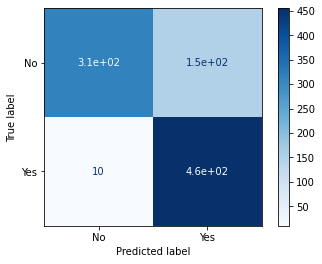

In [ ]:
labels=['No','Yes']
plot_confusion_matrix(final_model, X_test, Y_test,display_labels=labels, cmap=plt.cm.Blues)
plt.show()

In [ ]:
knn_pred_prob =final_model.predict_proba(X_test)[:,1]
knn_auroc = roc_auc_score(Y_test, knn_pred_prob)
print("KNN AUROC: {}".format(knn_auroc))
knn_y_pred = final_model.predict(X_test)
print(classification_report(Y_test, knn_y_pred,digits=6))

KNN AUROC: 0.9806359116660888
              precision    recall  f1-score   support

           0   0.969136  0.675269  0.795944       465
           1   0.750825  0.978495  0.849673       465

    accuracy                       0.826882       930
   macro avg   0.859980  0.826882  0.822809       930
weighted avg   0.859980  0.826882  0.822809       930



* We apply the same functions and iteration methods to all the other models ,but we change for each model its specific metrics<br> 
* we choose the best model according to the AUC values

# Decision tree

##boucle

In [ ]:
Features_model1=X.copy()

In [ ]:
All_features=['Latitude','Longitude','Gender_Male','Gender_Female','Multiple Lines_No phone service','Phone Service','Multiple Lines_No','Multiple Lines_Yes','Streaming Movies_Yes','Streaming TV_Yes','Device Protection_Yes','Online Backup_Yes','Payment Method_Mailed check','Payment Method_Bank transfer (automatic)','Internet Service_DSL','Streaming TV_No','Streaming Movies_No','Payment Method_Credit card (automatic)','Partner','Senior Citizen_No','Senior Citizen_Yes','Tech Support_Yes','Online Security_Yes','Contract_One year','Paperless Billing','Monthly Charges','Total Charges','Device Protection_No internet service','Streaming Movies_No internet service','Streaming TV_No internet service','Tech Support_No internet service','Online Security_No internet service','Online Backup_No internet service','Internet Service_No','Dependents','Device Protection_No','Online Backup_No','Payment Method_Electronic check','Contract_Two year','Internet Service_Fiber optic','Tech Support_No','Online Security_No','Tenure Months','Contract_Month-to-month']

In [ ]:
len(All_features)

44

In [ ]:
def idx_max_dt(liste):
  max = liste[0][0]
  param=liste[0][1]
  a = 0  
  for i in range(len(liste)):
    if liste[i][0]>max:
      max =liste [i][0]
      param=liste[i][1]
      a=i
  return [max,a,param]

In [ ]:
def idx_max_2x2_dt(liste): 
  a = 0
  b =liste[0][1]
  max = liste[0][0]
  param=liste[0][2]
  for i in np.arange(len(liste)):
    if liste[i][0]>max:
      max=liste[i][0]
      b=liste[i][1]
      param=liste[i][2]
      a=i
  return [max,b,a,param]

In [ ]:
def Best_dt(liste,n):
  X_train, X_test, Y_train, Y_test= train_test_split(liste,Y, train_size=n, random_state=6,stratify=Y)
  dt=DecisionTreeClassifier(random_state=0)
  params_distributions={'criterion':['gini', 'entropy'],
                        'splitter':['best', 'random'],
                        'max_depth':[ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
                                      18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
                                      35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45] ,
                        }
  dt_cv = RandomizedSearchCV(dt, param_distributions= params_distributions,n_iter=90, random_state=3, cv=5,n_jobs=-1,verbose=2,scoring='roc_auc')
  start = timeit.default_timer()
  dt_cv.fit(X_train, Y_train)
  stop = timeit.default_timer()
  print('Time: ', stop - start)
  print("Tuned dt Parameters (RandomizedSearchCV): {}".format(dt_cv.best_params_))
  print("Best dt Training Score (RandomizedSearchCV) :{}".format(dt_cv.best_score_))
  dictio=dt_cv.best_params_
  final_model = DecisionTreeClassifier(criterion=dictio['criterion'],
                                       splitter=dictio['splitter'],
                                       max_depth=dictio['max_depth'],
                                       random_state=1)
  final_model.fit(X_train, Y_train)
  print(final_model.score(X_test, Y_test))
  print(final_model.score(X_train, Y_train))
  dt_pred_prob =final_model.predict_proba(X_test)[:,1]
  dt_auroc = roc_auc_score(Y_test, dt_pred_prob)
  print("Decision Tree AUROC: {}".format(dt_auroc))
  return[dt_auroc,dt_cv.best_params_] 

In [ ]:
len(Features_model1.columns)

44

In [ ]:
start = timeit.default_timer()
Liste_fin=[]
for j in np.arange(len(All_features)-1,-1,-1):
  print(j)
  Features_model1=X.copy()
  L=[]
  To_drop=All_features[:j]
  Features_model1=Features_model1.drop(To_drop,axis=1)
  for k in np.arange (0.75,0.92,0.01):
    var =Best_dt(Features_model1,k)
    L.append(var)
    print('-------')
  print(L)
  print('when we have '+str(j)+' features')
  print(idx_max_dt(L))
  Liste_fin.append(idx_max_dt(L))
print(Liste_fin)
stop = timeit.default_timer()
print('Time: ', stop - start)

43
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    2.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  2.105871625000873
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.7259841627073437
0.7366382649109218
0.7259814049586777
Decision Tree AUROC: 0.7366382649109218
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    2.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  2.0637328609991528
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.7257315091641752
0.7377974989915288
0.7257550656301771
Decision Tree AUROC: 0.7378635215704652
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    2.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  2.0126767340007063
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.7261780601118801
0.7368421052631579
0.7261979625204377
Decision Tree AUROC: 0.7369106680395644
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    2.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  2.115952071999345
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.726096666307045
0.7376760563380281
0.726098832878073
Decision Tree AUROC: 0.7376760563380282
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    2.0s finished


Time:  2.053828086998692
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.7251217971851318
0.7418165053019825
0.7251440480568837
Decision Tree AUROC: 0.7418904212083595
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    2.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  1.9612006040006236
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.7261501210653754
0.7386253630203291
0.7261501210653754
Decision Tree AUROC: 0.7386253630203291
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    2.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  2.0387593880004715
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.7272873042822109
0.7344546381243628
0.7272835963653754
Decision Tree AUROC: 0.7344546381243628
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    2.1s finished


Time:  2.079129895000733
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.7284558768117761
0.7294244217321141
0.7284752568796504
Decision Tree AUROC: 0.7295172286074749
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    2.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  2.0355580809991807
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.7282380396732788
0.7306378132118451
0.7282380396732788
Decision Tree AUROC: 0.7306378132118452
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    2.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  2.0016208430006373
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.7282187637863494
0.7307924984875983
0.7282370575348783
Decision Tree AUROC: 0.7308974355220743
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    2.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  1.989859379000336
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.7285888681386898
0.7288573273079406
0.7286088640765638
Decision Tree AUROC: 0.728969742435609
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    2.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  1.9926801700003125
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.729054054054054
0.7261410788381742
0.7290540540540541
Decision Tree AUROC: 0.7261410788381744
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    2.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  2.0130543949999264
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.728690378569606
0.7282204020848846
0.7287097851497273
Decision Tree AUROC: 0.7283483251720957
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    2.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  2.035296103998917
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.7290296981239974
0.7258064516129032
0.7290336781862206
Decision Tree AUROC: 0.7258064516129032
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    2.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  2.1129529640002147
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.7285092491838956
0.7297535211267606
0.7285092491838956
Decision Tree AUROC: 0.7297535211267605
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    2.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  2.041836141001113
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.7288101438707363
0.7270087124878993
0.7288281502205961
Decision Tree AUROC: 0.7271733915103535
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    2.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  2.019702319001226
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.7284981759680964
0.7301075268817204
0.7285014899957428
Decision Tree AUROC: 0.7301075268817204
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    2.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  1.9850032409995038
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.7279547446065109
0.7363966142684402
0.7279713654068849
Decision Tree AUROC: 0.7365921558994515
-------
[[0.7366382649109218, {'splitter': 'random', 'max_depth': 13, 'criterion': 'gini'}], [0.7378635215704652, {'splitter': 'random', 'max_depth': 13, 'criterion': 'gini'}], [0.7369106680395644, {'splitter': 'random', 'max_depth': 13, 'criterion': 'gini'}], [0.7376760563380282, {'splitter': 'random', 'max_depth': 13, 'criterion': 'gini'}], [0.7418904212083595, {'splitter': 'random', 'max_depth': 13, 'criterion': 'gini'}], [0.7386253630203291, {'splitter': 'random', 'max_depth': 13, 'criterion': 'gini'}], [0.7344546381243628, {'splitter': 'random', 'max_depth': 13, 'criterion': 'gini'}], [0.7295172286074749, {'splitter': 'random', 'max_depth': 13, 'criterion': 'gini'}], [0.7306378132118452, {'splitter': 'random', 'max

[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    2.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  2.6965911160004907
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 5, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.7871889234151775
0.7354763749031759
0.7337293388429752
Decision Tree AUROC: 0.7941600702233962
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    2.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  2.643743284001175
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.78481020176337
0.7406212182331585
0.7365872307888365
Decision Tree AUROC: 0.7937446301648052
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    2.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  2.666834766001557
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.7876311954138001
0.7389473684210527
0.7402842409759779
Decision Tree AUROC: 0.7957140912069304
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    2.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  2.6547688919999928
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 14, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.7873598089556902
0.741637323943662
0.7405016141047926
Decision Tree AUROC: 0.7953290827712755
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    2.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  2.7131256379998376
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 15, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.7865972719759744
0.7445827570308898
0.7397327448816967
Decision Tree AUROC: 0.8002537963167651
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    2.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  2.656939706999765
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 5, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.786486114123903
0.7328170377541142
0.7342615012106537
Decision Tree AUROC: 0.7956220146585711
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    2.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  2.7085043330007466
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 16, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.7873405442143714
0.7415902140672783
0.7405547584887614
Decision Tree AUROC: 0.7957507629673272
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    2.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  2.7438785630001803
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.7867595991375677
0.7321140398063475
0.7387504428959489
Decision Tree AUROC: 0.7910326747456509
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    2.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  2.7974945549995027
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 14, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.7877480941494917
0.739749430523918
0.741073512252042
Decision Tree AUROC: 0.7907759144047612
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    2.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  2.8100686550005776
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.7879072644840072
0.7307924984875983
0.7389599907759714
Decision Tree AUROC: 0.7893982157862223
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    2.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  2.812733767001191
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 14, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.7895717679435649
0.7372498386055519
0.7414834225817477
Decision Tree AUROC: 0.7893965157956155
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    2.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  2.7545732039998256
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 15, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.7898592849606363
0.7344398340248963
0.7418918918918919
Decision Tree AUROC: 0.7856059258238973
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    2.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  2.831474923001224
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.7906411660751347
0.7349218168279971
0.7417343871757764
Decision Tree AUROC: 0.787792296501313
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    2.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  2.7926927050011727
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 42, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.7879056735970724
0.7322580645161291
0.7420206911732335
Decision Tree AUROC: 0.7870460457856399
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    2.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  2.8507172310000897
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 14, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.788769786907044
0.7341549295774648
0.7416757344940152
Decision Tree AUROC: 0.7888021349930568
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    2.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  2.9024593789999926
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 21, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.789758360699369
0.7299128751210068
0.7420639190788766
Decision Tree AUROC: 0.7882292744365976
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    2.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  2.881016119999913
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 20, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.7893313587651638
0.7354838709677419
0.7413793103448276
Decision Tree AUROC: 0.7927390449762978
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    2.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  2.853653136000503
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.7881172939002712
0.7376058041112454
0.7411306453310875
Decision Tree AUROC: 0.7947064603291575
-------
[[0.7941600702233962, {'splitter': 'best', 'max_depth': 5, 'criterion': 'entropy'}], [0.7937446301648052, {'splitter': 'random', 'max_depth': 8, 'criterion': 'gini'}], [0.7957140912069304, {'splitter': 'random', 'max_depth': 13, 'criterion': 'gini'}], [0.7953290827712755, {'splitter': 'random', 'max_depth': 14, 'criterion': 'gini'}], [0.8002537963167651, {'splitter': 'best', 'max_depth': 15, 'criterion': 'entropy'}], [0.7956220146585711, {'splitter': 'best', 'max_depth': 5, 'criterion': 'entropy'}], [0.7957507629673272, {'splitter': 'best', 'max_depth': 16, 'criterion': 'entropy'}], [0.7910326747456509, {'splitter': 'random', 'max_depth': 8, 'criterion': 'gini'}], [0.7907759144047612, {'splitter': 'random', 'max_

[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    2.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  2.8564496750004764
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8177363479543442
0.7594887683965917
0.7560692148760331
Decision Tree AUROC: 0.8347671210027594
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    2.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  2.866525614999773
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8159217406261463
0.7628075837031061
0.7531540716197273
Decision Tree AUROC: 0.8379696164961337
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    2.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  2.878612365999288
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8185977957506372
0.7612631578947369
0.7534901270280467
Decision Tree AUROC: 0.8356500982869981
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    2.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  2.889664246000393
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8182041911465483
0.7658450704225352
0.7515520238390861
Decision Tree AUROC: 0.8315004463400119
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    2.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  2.8995274329990934
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 6, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8176566319982521
0.7639465191332411
0.750153242613706
Decision Tree AUROC: 0.8315285595252266
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    2.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  2.934765930998765
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 7, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8177080829459046
0.7652468538238142
0.7516949152542373
Decision Tree AUROC: 0.8349973619819903
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    2.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  2.952065784000297
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8201551810116119
0.7640163098878695
0.7521520803443329
Decision Tree AUROC: 0.8320110644550226
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.000180390999958
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8207875634489991
0.7520172135556751
0.758237864650998
Decision Tree AUROC: 0.8325196476729517
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    2.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  2.9623336369986646
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 7, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8204052289539504
0.7579726651480638
0.7539089848308052
Decision Tree AUROC: 0.8281563763160216
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  2.980605942000693
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 12, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.82125988816963
0.7586206896551724
0.7610976594027441
Decision Tree AUROC: 0.8331047193537715
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.061178576999737
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 16, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8216408048046627
0.7598450613298903
0.7634727127720178
Decision Tree AUROC: 0.8308310410936067
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.058372978999614
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 18, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8222647055839623
0.7558782849239281
0.7638513513513514
Decision Tree AUROC: 0.827155179835058
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.0359510220005177
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8205475299537547
0.759493670886076
0.7615495936769453
Decision Tree AUROC: 0.8288956603505784
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.005900472999201
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8227494902895056
0.7580645161290323
0.7612810917895664
Decision Tree AUROC: 0.8299596774193548
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.0438209809999535
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 7, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8224427838841718
0.7588028169014085
0.754189336235038
Decision Tree AUROC: 0.8259878372346756
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.0857052030005434
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8232783054837614
0.7560503388189739
0.7627246314430216
Decision Tree AUROC: 0.8311273297047665
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.0551284619996295
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8217850208340265
0.7580645161290323
0.756066411238825
Decision Tree AUROC: 0.8324314949705167
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.0444892539999273
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 9, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.821810250299922
0.7593712212817413
0.756500684282556
Decision Tree AUROC: 0.8351083739808869
-------
[[0.8347671210027594, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.8379696164961337, {'splitter': 'random', 'max_depth': 8, 'criterion': 'gini'}], [0.8356500982869981, {'splitter': 'random', 'max_depth': 8, 'criterion': 'gini'}], [0.8315004463400119, {'splitter': 'random', 'max_depth': 8, 'criterion': 'gini'}], [0.8315285595252266, {'splitter': 'best', 'max_depth': 6, 'criterion': 'entropy'}], [0.8349973619819903, {'splitter': 'best', 'max_depth': 7, 'criterion': 'entropy'}], [0.8320110644550226, {'splitter': 'random', 'max_depth': 8, 'criterion': 'gini'}], [0.8325196476729517, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.8281563763160216, {'splitter': 'best', 'max_depth'

[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.002980128998388
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 10, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8263074976323754
0.7718822618125484
0.7776342975206612
Decision Tree AUROC: 0.8462225224863066
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.1096900820011797
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 7, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8258898181488507
0.7700685760387252
0.7674270421817255
Decision Tree AUROC: 0.8444586555234451
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.0682605609999882
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8291452676936363
0.7717894736842106
0.7879512011067791
Decision Tree AUROC: 0.8435187312609385
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.0889849300001515
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8289217275280885
0.7693661971830986
0.7840824435063323
Decision Tree AUROC: 0.8412412746726841
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.115830574000938
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8291566092220902
0.7717842323651453
0.7834988353561358
Decision Tree AUROC: 0.8443212542724506
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.120484528999441
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 14, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8273725002784797
0.7749273959341723
0.7868038740920097
Decision Tree AUROC: 0.8464317409325746
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.1639989850009442
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 14, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8284469786204134
0.7711518858307849
0.7873027259684362
Decision Tree AUROC: 0.8434662252522701
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.1655165050015057
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8295702112705576
0.7735341581495427
0.7771347584740759
Decision Tree AUROC: 0.8457400141208606
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.190534891000425
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8288545562727976
0.7716400911161732
0.7838973162193699
Decision Tree AUROC: 0.8408223545955031
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.1912971090005158
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8313197240490299
0.7676950998185118
0.7842730312463969
Decision Tree AUROC: 0.8376889542118162
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.15196629500133
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 12, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8329275378483132
0.7669464170432537
0.7858038054004786
Decision Tree AUROC: 0.8331182795698924
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.252821837000738
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 17, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8331433629575521
0.7634854771784232
0.7902027027027027
Decision Tree AUROC: 0.8301557786156881
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.2829429049998
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 12, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8303594707679818
0.766939687267312
0.7869308694200156
Decision Tree AUROC: 0.8347005624157262
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.244036590000178
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8311495936623027
0.7596774193548387
0.7882456526524323
Decision Tree AUROC: 0.8333727887617065
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.2703399490001175
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8331688297233711
0.7640845070422535
0.7873775843307943
Decision Tree AUROC: 0.8369231675262846
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.271123778000401
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8336915030625702
0.7560503388189739
0.7883353061444097
Decision Tree AUROC: 0.8345665961945032
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.280925750001188
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 15, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8324469092699003
0.7634408602150538
0.7885270327799063
Decision Tree AUROC: 0.8438709677419356
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.3425284679997276
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 13, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8323888088642659
0.7654171704957679
0.7885040530582167
Decision Tree AUROC: 0.8462001848147758
-------
[[0.8462225224863066, {'splitter': 'random', 'max_depth': 10, 'criterion': 'gini'}], [0.8444586555234451, {'splitter': 'best', 'max_depth': 7, 'criterion': 'entropy'}], [0.8435187312609385, {'splitter': 'random', 'max_depth': 13, 'criterion': 'gini'}], [0.8412412746726841, {'splitter': 'random', 'max_depth': 13, 'criterion': 'gini'}], [0.8443212542724506, {'splitter': 'random', 'max_depth': 13, 'criterion': 'gini'}], [0.8464317409325746, {'splitter': 'random', 'max_depth': 14, 'criterion': 'gini'}], [0.8434662252522701, {'splitter': 'random', 'max_depth': 14, 'criterion': 'gini'}], [0.8457400141208606, {'splitter': 'random', 'max_depth': 10, 'criterion': 'entropy'}], [0.8408223545955031, {'splitter': 'random'

[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.382492386001104
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 10, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8476919471039164
0.7815646785437645
0.7958419421487604
Decision Tree AUROC: 0.8609256960390141
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.4449072040006286
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8457056247262589
0.7858007260992336
0.7907480565821333
Decision Tree AUROC: 0.8548732068004895
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.4466335859997344
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8498366211024269
0.7856842105263158
0.8021632499056722
Decision Tree AUROC: 0.8594166177359102
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.28286571299941
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 10, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8477419276340987
0.789612676056338
0.7964986342190216
Decision Tree AUROC: 0.8601332355931364
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.4356100330005575
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8479229501970101
0.7920700783771323
0.8190511217359323
Decision Tree AUROC: 0.8647962827554543
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.363453751999259
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.848506176386096
0.7899322362052275
0.801452784503632
Decision Tree AUROC: 0.8572944712203012
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.379716895000456
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8530309728014256
0.7884811416921509
0.8170731707317073
Decision Tree AUROC: 0.8616111833293327
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.4166878220003127
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.853703588972909
0.7907477138246369
0.817172552261722
Decision Tree AUROC: 0.8582410268875076
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.3865630860000238
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8513918597479199
0.791002277904328
0.8164527421236872
Decision Tree AUROC: 0.8578579916044438
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.3809112219987583
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8524727931745328
0.7858439201451906
0.813213420961605
Decision Tree AUROC: 0.8531149081689118
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.408320430000458
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8499072008236933
0.7850225952227243
0.8169078272758346
Decision Tree AUROC: 0.8547253480036676
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.4509681740000815
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8550641435354273
0.7863070539419087
0.8164414414414415
Decision Tree AUROC: 0.8510614486665176
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.5228989139995974
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 13, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8534262687696668
0.7818317200297841
0.8176555716353111
Decision Tree AUROC: 0.8571550546448088
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.6522681490005198
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 16, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8537242077095861
0.7782258064516129
0.8221439577371781
Decision Tree AUROC: 0.8601157648283039
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.5248373270005686
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8548422198041349
0.7825704225352113
0.8188248095756256
Decision Tree AUROC: 0.8575834407855585
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.7228774129998783
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8549182032780237
0.7850919651500484
0.8195415904444205
Decision Tree AUROC: 0.8559387791822229
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.712761638000302
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 13, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.852141238572381
0.7838709677419354
0.81747552149851
Decision Tree AUROC: 0.8675060700659035
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.553358309000032
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8533185727504385
0.7896009673518742
0.8192441309611538
Decision Tree AUROC: 0.8624533576633798
-------
[[0.8609256960390141, {'splitter': 'random', 'max_depth': 10, 'criterion': 'gini'}], [0.8548732068004895, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8594166177359102, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.8601332355931364, {'splitter': 'random', 'max_depth': 10, 'criterion': 'gini'}], [0.8647962827554543, {'splitter': 'best', 'max_depth': 13, 'criterion': 'gini'}], [0.8572944712203012, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.8616111833293327, {'splitter': 'best', 'max_depth': 12, 'criterion': 'gini'}], [0.8582410268875076, {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}], [0.8578579916044438, {'splitter': 'best', 'max_depth': 

[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.35747396700026
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.847419194376544
0.7854376452362509
0.7958419421487604
Decision Tree AUROC: 0.8591758110880245
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.4866293350005435
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8487681950503434
0.7853973376361436
0.793424238562508
Decision Tree AUROC: 0.8575994558567002
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.403374879999319
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8529815854717597
0.7844210526315789
0.8045528864293799
Decision Tree AUROC: 0.8593208836469157
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.538431565999417
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8506360572776819
0.784330985915493
0.79376707226223
Decision Tree AUROC: 0.8582242796568142
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.3820083720002003
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.849801864527388
0.7883817427385892
0.80728208900331
Decision Tree AUROC: 0.8600536500756712
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.464322952000657
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8521718483428993
0.7928363988383349
0.8035108958837772
Decision Tree AUROC: 0.8590881360411361
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.50372410700038
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8524574911072584
0.7935779816513762
0.8208990913438546
Decision Tree AUROC: 0.8628851335413634
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.6740921119999257
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8548581209500737
0.7939752555137171
0.8227235148222511
Decision Tree AUROC: 0.8612498119147656
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.5014562489996024
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8535404092047235
0.7904328018223234
0.8247374562427071
Decision Tree AUROC: 0.8599478001878362
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.513486730000295
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8544933393714711
0.7779794313369631
0.8058341980860141
Decision Tree AUROC: 0.8481588401146535
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.688602460000766
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.851459591028717
0.7824402840542285
0.8020963882875698
Decision Tree AUROC: 0.8508585479703259
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.71783263999896
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8559116548981415
0.7717842323651453
0.8096846846846847
Decision Tree AUROC: 0.8457690313718964
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.718501285000457
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8552550128766498
0.7862993298585257
0.8223310697985083
Decision Tree AUROC: 0.853961526861117
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.766018966000047
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 16, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8567859690477562
0.7838709677419354
0.8310587717367378
Decision Tree AUROC: 0.8509560353798127
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.6156142039999395
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 18, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8562019794899361
0.7869718309859155
0.8307943416757345
Decision Tree AUROC: 0.8530657979567546
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.6728992919997836
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8558041559046778
0.7812197483059051
0.8218013558592488
Decision Tree AUROC: 0.8552640457019477
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.6512998739999603
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 10, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8523949542509561
0.7774193548387097
0.8034269902085994
Decision Tree AUROC: 0.856103595791421
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.8143074229992635
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8534353253607092
0.7944377267230955
0.8236656490156858
Decision Tree AUROC: 0.8726503374624229
-------
[[0.8591758110880245, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8575994558567002, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8593208836469157, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.8582242796568142, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8600536500756712, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.8590881360411361, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.8628851335413634, {'splitter': 'best', 'max_depth': 12, 'criterion': 'gini'}], [0.8612498119147656, {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}], [0.8599478001878362, {'splitter': 'best', 'max_depth': 13

[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.630966233999061
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8501217907836132
0.7835011618900077
0.8024276859504132
Decision Tree AUROC: 0.8563699352185573
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.801894235000873
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8458672186063764
0.7878176684146834
0.8096087676819167
Decision Tree AUROC: 0.8667574656981436
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.7935734029997548
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 8, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8507074401317137
0.7701052631578947
0.7826688466859515
Decision Tree AUROC: 0.8560758526007051
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.7617274949989223
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8493192884315514
0.7799295774647887
0.8020859200397318
Decision Tree AUROC: 0.8523676167923032
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.7924715940007445
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 12, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.849878458954555
0.7952973720608575
0.8319235012872379
Decision Tree AUROC: 0.8611423810090635
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.876110047000111
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8511071765678405
0.781703775411423
0.8036319612590799
Decision Tree AUROC: 0.8546475504854796
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 396 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.7414851440007624
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8548553768582952
0.7787971457696228
0.8009325681492109
Decision Tree AUROC: 0.8534162336171146
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    3.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.964153840999643
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.851830547568035
0.7767616998386229
0.8006377701665289
Decision Tree AUROC: 0.8506464344826787
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.975363064000703
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8536357187497021
0.7841685649202733
0.8001166861143524
Decision Tree AUROC: 0.8518661692290929
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.000637465000182
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8520671755961337
0.7816091954022989
0.7999538798570276
Decision Tree AUROC: 0.8515251016685649
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  3.9934564319992205
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8507520210312002
0.7792123950936087
0.799361968782044
Decision Tree AUROC: 0.8501542052179711
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.031049408999024
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8532614540215893
0.7842323651452282
0.8387387387387387
Decision Tree AUROC: 0.8473865042880728
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.070634400000927
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8546239076161953
0.7781087118391661
0.8332405655126349
Decision Tree AUROC: 0.8515020669221489
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.114892585001144
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 10, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8556085207053247
0.7790322580645161
0.8131190843055249
Decision Tree AUROC: 0.8517689906347554
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.078125321000698
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8574648841232311
0.7852112676056338
0.8110990206746463
Decision Tree AUROC: 0.858260699761952
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.233398534001026
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 12, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.854024922724799
0.7725072604065828
0.8299795545033897
Decision Tree AUROC: 0.8467811464471533
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.178805012999874
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 12, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.854482222980729
0.7849462365591398
0.8332269050659855
Decision Tree AUROC: 0.8595837669094694
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.131276744999923
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8537560912930655
0.7823458282950423
0.8154542583429835
Decision Tree AUROC: 0.8579704296358681
-------
[[0.8563699352185573, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8667574656981436, {'splitter': 'random', 'max_depth': 10, 'criterion': 'entropy'}], [0.8560758526007051, {'splitter': 'random', 'max_depth': 8, 'criterion': 'entropy'}], [0.8523676167923032, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8611423810090635, {'splitter': 'random', 'max_depth': 12, 'criterion': 'gini'}], [0.8546475504854796, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8534162336171146, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8506464344826787, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8518661692290929, {'splitter': 'best', 'max_depth': 8, 

[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.052899419999449
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8469755627968146
0.7889233152594888
0.8029442148760331
Decision Tree AUROC: 0.8559571387686066
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.1429329910006345
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 7, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8438787995704591
0.781766841468334
0.794698610934115
Decision Tree AUROC: 0.8616333411440027
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.1493672559990955
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8537858965727734
0.783157894736842
0.8032951829958496
Decision Tree AUROC: 0.8521149433112365
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.150406906999706
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.847745665274417
0.7874119718309859
0.8034517010181277
Decision Tree AUROC: 0.8524551800238048
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.177155900000798
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 9, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8503926940189945
0.7916090364223144
0.8012749785460341
Decision Tree AUROC: 0.8638325369428811
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.278296914999373
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8496423734676288
0.7884801548886737
0.8044794188861986
Decision Tree AUROC: 0.8556605868863796
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.221869078000964
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8522288702561914
0.7838939857288482
0.8238880918220947
Decision Tree AUROC: 0.8587785664631049
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.2700361749994045
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 10, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8516321897772873
0.8052716514254976
0.8221329868902799
Decision Tree AUROC: 0.8588972996747573
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.242473528000119
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 10, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8526871164641792
0.7927107061503417
0.8257876312718786
Decision Tree AUROC: 0.8492594216509877
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.285754458998781
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8526060065420843
0.7822141560798548
0.8038740920096852
Decision Tree AUROC: 0.8519906251189426
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.357707406999907
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.850491468968644
0.7805035506778567
0.8043750712088413
Decision Tree AUROC: 0.8484829540718513
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.355016671999692
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8555554287395504
0.8022130013831259
0.857545045045045
Decision Tree AUROC: 0.8449923382861866
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.492324505999932
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8555353622560634
0.7907669396872673
0.8465991316931982
Decision Tree AUROC: 0.8489217408274785
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.423011175000283
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8545719823893043
0.7758064516129032
0.8055249834910851
Decision Tree AUROC: 0.8446006763787721
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.446848169000077
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8571077755188788
0.7808098591549296
0.8282916213275299
Decision Tree AUROC: 0.8478832944852213
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.504881524999291
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8547085649739188
0.7812197483059051
0.8286882599806306
Decision Tree AUROC: 0.848647909075915
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.461997344000338
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8523348993202848
0.7838709677419354
0.8267347807577693
Decision Tree AUROC: 0.852560989709793
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.45551172299929
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8554245965865805
0.7908101571946796
0.8221918096641752
Decision Tree AUROC: 0.8617544536851832
-------
[[0.8559571387686066, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8616333411440027, {'splitter': 'best', 'max_depth': 7, 'criterion': 'gini'}], [0.8521149433112365, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8524551800238048, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8638325369428811, {'splitter': 'random', 'max_depth': 9, 'criterion': 'gini'}], [0.8556605868863796, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8587785664631049, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.8588972996747573, {'splitter': 'random', 'max_depth': 10, 'criterion': 'gini'}], [0.8492594216509877, {'splitter': 'random', 'max_depth': 10, 'cr

[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.345007391000763
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 7, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8466243399781902
0.7838884585592564
0.7958419421487604
Decision Tree AUROC: 0.8583280183790419
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.39895652999985
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 7, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8445564018824292
0.7753126260588947
0.7912578055307761
Decision Tree AUROC: 0.8602039886484937
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.38157696000053
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8534690572438157
0.7827368421052632
0.8040498050559678
Decision Tree AUROC: 0.8521571372245341
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.421767888999966
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8490476212174748
0.7838908450704225
0.8050658058107772
Decision Tree AUROC: 0.8506012416931164
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.440580021999267
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.845967223628595
0.7888427846934071
0.8313105308324139
Decision Tree AUROC: 0.857853231758124
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.577488932998676
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8487837766534364
0.7918683446272992
0.8062953995157385
Decision Tree AUROC: 0.8567256339443102
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.527693908999936
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8523873128377764
0.7833843017329256
0.8067910090865614
Decision Tree AUROC: 0.8526353416233616
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.597307518999514
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8525521431937066
0.7821409359870898
0.8063068383134522
Decision Tree AUROC: 0.8510017708948228
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.609710290998919
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8517201330521248
0.785876993166287
0.8070011668611435
Decision Tree AUROC: 0.8508024553629341
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.572670853000091
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 7, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8519763144703811
0.7695099818511797
0.7907298512625389
Decision Tree AUROC: 0.8499426147193244
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.642269190999286
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8507646813473044
0.7805035506778567
0.8074512931525578
Decision Tree AUROC: 0.8485988163707593
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.734228759998587
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8552607083434787
0.7946058091286307
0.8629504504504505
Decision Tree AUROC: 0.8491895418084705
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.755019070998969
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8563758787767105
0.7877885331347729
0.8287877101191139
Decision Tree AUROC: 0.8597342718756653
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.755780405999758
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8571321859727007
0.7991935483870968
0.87376183138895
Decision Tree AUROC: 0.8518977627471385
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.821833040999991
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8585617853535741
0.7860915492957746
0.8329706202393906
Decision Tree AUROC: 0.8475764357270381
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.822333393998633
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8589804553697862
0.8160696999031946
0.871516194985473
Decision Tree AUROC: 0.8609505495329345
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.899275532001411
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.853652107796983
0.789247311827957
0.8320561941251596
Decision Tree AUROC: 0.8531876517516476
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.877616428999318
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8543219832510678
0.7871825876662636
0.8289293609853668
Decision Tree AUROC: 0.8650852136482203
-------
[[0.8583280183790419, {'splitter': 'best', 'max_depth': 7, 'criterion': 'gini'}], [0.8602039886484937, {'splitter': 'best', 'max_depth': 7, 'criterion': 'entropy'}], [0.8521571372245341, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8506012416931164, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.857853231758124, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.8567256339443102, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8526353416233616, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8510017708948228, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8508024553629341, {'splitter': 'best', 'max_depth': 8, 'criteri

[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.425174981999589
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 7, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8554627991623228
0.7989930286599535
0.7979080578512396
Decision Tree AUROC: 0.8726102955514583
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.426897319999625
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8557217970924018
0.8019362646228317
0.8127946986109341
Decision Tree AUROC: 0.8759050613137547
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.542602449999322
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8607547193663821
0.7932631578947369
0.8133568104640926
Decision Tree AUROC: 0.8729537724904195
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.485164047999206
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 7, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8583060821471002
0.7962147887323944
0.8003476533399553
Decision Tree AUROC: 0.8676233789178733
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.570141793999937
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 8, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8562790976526843
0.7837713231904103
0.7933063626333211
Decision Tree AUROC: 0.8673861104970497
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.595579476999774
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8601022166982275
0.8247821878025169
0.8761501210653753
Decision Tree AUROC: 0.8704194308066151
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.710473401000854
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8624969008982442
0.799184505606524
0.8155188904830225
Decision Tree AUROC: 0.8714650739171683
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.635990902999765
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8631476598804682
0.8015061861215708
0.8377229242943192
Decision Tree AUROC: 0.8651758741622972
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.731885777999196
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8606386556452523
0.7961275626423691
0.814002333722287
Decision Tree AUROC: 0.8671719739934931
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.84421585400014
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8617994870022754
0.8003629764065335
0.8141358238210539
Decision Tree AUROC: 0.8688980562200082
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.797371081000165
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8645805213883581
0.7953518398967075
0.8147430785006267
Decision Tree AUROC: 0.8637175960656831
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.819033316998684
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 12, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8668081933284636
0.8049792531120332
0.8646396396396396
Decision Tree AUROC: 0.8720694662052422
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.966940702001011
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8634490654811019
0.7870439314966493
0.8391405989090505
Decision Tree AUROC: 0.853316168121496
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.925839057999838
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8644672670234896
0.7879032258064517
0.8373321593660576
Decision Tree AUROC: 0.8543327263267431
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.932319030000144
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8643106892219745
0.784330985915493
0.8397170837867247
Decision Tree AUROC: 0.8540406169410831
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.095416624000791
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8671207820737606
0.7831558567279767
0.8370816743785645
Decision Tree AUROC: 0.858328460258198
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.062458697999318
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 10, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8622043030231152
0.7956989247311828
0.8251383567475522
Decision Tree AUROC: 0.8672979535206382
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.069718018999993
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8645806755033
0.814993954050786
0.8838825139488368
Decision Tree AUROC: 0.8598595173760979
-------
[[0.8726102955514583, {'splitter': 'best', 'max_depth': 7, 'criterion': 'gini'}], [0.8759050613137547, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8729537724904195, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8676233789178733, {'splitter': 'best', 'max_depth': 7, 'criterion': 'gini'}], [0.8673861104970497, {'splitter': 'random', 'max_depth': 8, 'criterion': 'entropy'}], [0.8704194308066151, {'splitter': 'best', 'max_depth': 12, 'criterion': 'gini'}], [0.8714650739171683, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8651758741622972, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.8671719739934931, {'splitter': 'best', 'max_depth': 8, 'criterion'

[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.501808617998904
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 9, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8564623946684347
0.7966692486444616
0.8128873966942148
Decision Tree AUROC: 0.8719197014905673
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.616161841999201
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8555851737993262
0.8023396530859217
0.8129221358480948
Decision Tree AUROC: 0.8723267984066234
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.676865113000531
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.860270133349394
0.7957894736842105
0.8138598918375047
Decision Tree AUROC: 0.8731959442785053
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.704096065999693
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8585318764411392
0.8014964788732394
0.8164887012664515
Decision Tree AUROC: 0.8719097153342592
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.663942692999626
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 7, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8558479067601418
0.7920700783771323
0.79735196763516
Decision Tree AUROC: 0.8695614467665413
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.698727709001105
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8603373121727864
0.8286544046466602
0.87590799031477
Decision Tree AUROC: 0.871772645018363
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.779265724999277
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8619259411880918
0.799184505606524
0.8153993304638929
Decision Tree AUROC: 0.8726584930187321
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.785805474999506
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8643205597690535
0.8004303388918773
0.8363056572575883
Decision Tree AUROC: 0.8697448985497183
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.797829187000389
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8612128275755022
0.7961275626423691
0.814002333722287
Decision Tree AUROC: 0.8680514837511222
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.879694863000623
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 7, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8612298933830201
0.7906836055656382
0.8000691802144587
Decision Tree AUROC: 0.8629121273250554
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.912560728000244
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8638795322643317
0.7953518398967075
0.8147430785006267
Decision Tree AUROC: 0.8639801617070935
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.919768264000595
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8658011474312151
0.7856154910096819
0.8144144144144144
Decision Tree AUROC: 0.8563854310742278
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.054026582998631
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8645996790685004
0.7915115413253909
0.8388066347545363
Decision Tree AUROC: 0.859231956568022
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.009645635998822
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8662009985861653
0.792741935483871
0.8370019810697776
Decision Tree AUROC: 0.8594914151925077
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.023993499000426
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8635579904826294
0.7922535211267606
0.8394994559303591
Decision Tree AUROC: 0.8618825629835352
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.043571260001045
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.866381740196422
0.7899322362052275
0.836974066501668
Decision Tree AUROC: 0.8638144183047696
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.063756950999959
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8630440739814036
0.7827956989247312
0.834610472541507
Decision Tree AUROC: 0.8662573707943115
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.06843906100039
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8652971622556475
0.8186215235792019
0.8841983366670175
Decision Tree AUROC: 0.8578710039653297
-------
[[0.8719197014905673, {'splitter': 'random', 'max_depth': 9, 'criterion': 'gini'}], [0.8723267984066234, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8731959442785053, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8719097153342592, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8695614467665413, {'splitter': 'best', 'max_depth': 7, 'criterion': 'entropy'}], [0.871772645018363, {'splitter': 'best', 'max_depth': 12, 'criterion': 'gini'}], [0.8726584930187321, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8697448985497183, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.8680514837511222, {'splitter': 'best', 'max_depth': 8, 'criterio

[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.6259745539991854
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 7, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8556213504280464
0.7970565453137103
0.7979080578512396
Decision Tree AUROC: 0.8723699976180206
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.617220772999644
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8553129509745396
0.8031464300121016
0.8129221358480948
Decision Tree AUROC: 0.8738583404931136
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.702906717000587
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8601830357435689
0.7957894736842105
0.8138598918375047
Decision Tree AUROC: 0.8732792683930004
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.7140264970003045
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8590190290923088
0.801056338028169
0.8164887012664515
Decision Tree AUROC: 0.871138693959532
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.802419988000111
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8564152721979866
0.8072844628861227
0.8218707858281231
Decision Tree AUROC: 0.8772488819358242
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.858599238999886
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8607504880722757
0.8286544046466602
0.87590799031477
Decision Tree AUROC: 0.8712445728519365
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.866144014000383
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8621303960884873
0.799184505606524
0.8153993304638929
Decision Tree AUROC: 0.8722127143556316
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.897917068999959
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8648196873311569
0.8004303388918773
0.8363056572575883
Decision Tree AUROC: 0.8706482863988333
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.935380445998817
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.862235226680137
0.7961275626423691
0.814002333722287
Decision Tree AUROC: 0.8680488893270583
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.040014692000113
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8617881569108825
0.7997580157289776
0.8141358238210539
Decision Tree AUROC: 0.8685664805548806
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.015840628999285
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8639557746072528
0.7953518398967075
0.8147430785006267
Decision Tree AUROC: 0.8639801617070935
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.010212763998425
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8655123873873874
0.7800829875518672
0.8144144144144144
Decision Tree AUROC: 0.8546311760013315
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.050898927998787
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8644496964204216
0.7907669396872673
0.8388066347545363
Decision Tree AUROC: 0.8577150308707685
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.116723720999289
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8665728906359667
0.7919354838709678
0.8372220999339643
Decision Tree AUROC: 0.8579305411030176
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.105245541999466
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8628042261008975
0.795774647887324
0.8134929270946681
Decision Tree AUROC: 0.8690069554651855
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.171713583999008
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8667399314798498
0.7899322362052275
0.836974066501668
Decision Tree AUROC: 0.8638144183047696
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.1812470970016875
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8622924212161402
0.7827956989247312
0.8345040442741593
Decision Tree AUROC: 0.8678020580413921
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.17166950399951
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8645119329575672
0.8186215235792019
0.884093062427624
Decision Tree AUROC: 0.860730954135523
-------
[[0.8723699976180206, {'splitter': 'best', 'max_depth': 7, 'criterion': 'gini'}], [0.8738583404931136, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8732792683930004, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.871138693959532, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8772488819358242, {'splitter': 'random', 'max_depth': 10, 'criterion': 'entropy'}], [0.8712445728519365, {'splitter': 'best', 'max_depth': 12, 'criterion': 'gini'}], [0.8722127143556316, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8706482863988333, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.8680488893270583, {'splitter': 'best', 'max_depth': 8, 'criterion

[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.718269352999414
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8558876850995695
0.8024786986831913
0.8233471074380165
Decision Tree AUROC: 0.8664846482320252
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.695762992998425
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8552712773047878
0.8031464300121016
0.8129221358480948
Decision Tree AUROC: 0.8739227785154521
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.769666509999297
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8599994162100403
0.7962105263157895
0.8138598918375047
Decision Tree AUROC: 0.8740309582769564
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.819251836999683
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 10, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.859331718450114
0.7882922535211268
0.8189719394089893
Decision Tree AUROC: 0.858850008058917
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.91161581400047
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8562716618622968
0.8012909174734901
0.8150055167340934
Decision Tree AUROC: 0.872064550138589
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.879007323001133
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8612151094278563
0.8301064859632139
0.87590799031477
Decision Tree AUROC: 0.8742611909597044
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.941334842000288
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8625085996697519
0.7986748216106014
0.8153993304638929
Decision Tree AUROC: 0.8719066961358575
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.971420121999472
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8637381900450553
0.800968262506724
0.8363056572575883
Decision Tree AUROC: 0.8709642695926942
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.998080281999137
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8613521156676637
0.7955580865603644
0.814002333722287
Decision Tree AUROC: 0.8670876552114196
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.012514665000708
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8611143578700705
0.7991530550514216
0.8141358238210539
Decision Tree AUROC: 0.8678374532646662
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.053242058998876
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8638751167143228
0.7947062621045836
0.8147430785006267
Decision Tree AUROC: 0.8628540468450445
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.060714213999745
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8655022421069718
0.784923928077455
0.8144144144144144
Decision Tree AUROC: 0.8551897828511523
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.1569420539999555
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8643767213533529
0.7922561429635145
0.8390292775242124
Decision Tree AUROC: 0.8599826573699525
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.207226582999283
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8659737883060732
0.7935483870967742
0.8372220999339643
Decision Tree AUROC: 0.8606022372528616
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.242006324000613
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8630938440207399
0.795774647887324
0.8134929270946681
Decision Tree AUROC: 0.8690069554651855
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.261440002001109
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8667825586925293
0.7899322362052275
0.836974066501668
Decision Tree AUROC: 0.8635482734319944
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.28234809100104
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8631205125368144
0.7827956989247312
0.8345040442741593
Decision Tree AUROC: 0.8662573707943115
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.305768357000488
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8650549129131407
0.8210399032648126
0.8843036109064112
Decision Tree AUROC: 0.8628627574832438
-------
[[0.8664846482320252, {'splitter': 'random', 'max_depth': 10, 'criterion': 'entropy'}], [0.8739227785154521, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8740309582769564, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.858850008058917, {'splitter': 'random', 'max_depth': 10, 'criterion': 'gini'}], [0.872064550138589, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8742611909597044, {'splitter': 'best', 'max_depth': 12, 'criterion': 'gini'}], [0.8719066961358575, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8709642695926942, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.8670876552114196, {'splitter': 'best', 'max_depth': 8, 'crit

[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.772670699001537
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 8, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8554429688386783
0.7931835786212239
0.7953254132231405
Decision Tree AUROC: 0.8631378770142577
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.822549769000034
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8555392622625748
0.8027430415490117
0.8129221358480948
Decision Tree AUROC: 0.8731247884610378
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.842725153999709
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8602043131682302
0.7953684210526316
0.8138598918375047
Decision Tree AUROC: 0.8724442543945492
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.91795429999911
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8591706866913718
0.801056338028169
0.8164887012664515
Decision Tree AUROC: 0.871138693959532
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.924022907000108
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 7, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8558470716341992
0.7920700783771323
0.79735196763516
Decision Tree AUROC: 0.8695614467665413
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.98163052900054
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8611451963721427
0.8281703775411423
0.87590799031477
Decision Tree AUROC: 0.8709043950410884
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.0191596940003365
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8628575282014328
0.7986748216106014
0.8153993304638929
Decision Tree AUROC: 0.8725353583530504
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.038032738999391
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.863088721754076
0.8004303388918773
0.8363056572575883
Decision Tree AUROC: 0.868961306526847
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.106695865999427
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8612352933968186
0.7966970387243736
0.814002333722287
Decision Tree AUROC: 0.8690127178667607
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.148540195999885
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 7, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8612868859267486
0.7906836055656382
0.8000691802144587
Decision Tree AUROC: 0.8629121273250554
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.269852843999615
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8640566475602471
0.7947062621045836
0.8147430785006267
Decision Tree AUROC: 0.8628540468450445
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.261891027999809
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8658938499310121
0.7786998616874136
0.8144144144144144
Decision Tree AUROC: 0.8522437056294945
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.25759919399934
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8634671792401933
0.7907669396872673
0.8388066347545363
Decision Tree AUROC: 0.8577981956568022
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.277801490999991
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8662933584470819
0.792741935483871
0.8370019810697776
Decision Tree AUROC: 0.8594914151925077
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.32171560200004
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8634573464794135
0.7922535211267606
0.8394994559303591
Decision Tree AUROC: 0.8618825629835352
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.424643411999568
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8659324048360976
0.7899322362052275
0.836974066501668
Decision Tree AUROC: 0.8635482734319944
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.432938255999034
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8626662941225532
0.7838709677419354
0.834610472541507
Decision Tree AUROC: 0.8680425482714764
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.490203385001223
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8644338022528453
0.8210399032648126
0.8839877881882303
Decision Tree AUROC: 0.8642664140084921
-------
[[0.8631378770142577, {'splitter': 'random', 'max_depth': 8, 'criterion': 'entropy'}], [0.8731247884610378, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8724442543945492, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.871138693959532, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8695614467665413, {'splitter': 'best', 'max_depth': 7, 'criterion': 'entropy'}], [0.8709043950410884, {'splitter': 'best', 'max_depth': 12, 'criterion': 'gini'}], [0.8725353583530504, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.868961306526847, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.8690127178667607, {'splitter': 'best', 'max_depth': 8, 'crite

[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.908302404999631
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8562373381889831
0.7951200619674671
0.7973915289256198
Decision Tree AUROC: 0.8680665346278023
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.952826684999309
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8554207121040636
0.8027430415490117
0.8129221358480948
Decision Tree AUROC: 0.8730603504386993
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.984113262000392
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8601169748509168
0.7962105263157895
0.8138598918375047
Decision Tree AUROC: 0.8740309582769564
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.050312887000473
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8586032718424939
0.8014964788732394
0.8164887012664515
Decision Tree AUROC: 0.8719097153342592
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.047990785998991
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8561587363239834
0.8012909174734901
0.8150055167340934
Decision Tree AUROC: 0.872064550138589
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.07081195200044
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8607883026810266
0.8301064859632139
0.87590799031477
Decision Tree AUROC: 0.8738797794748141
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.118323299999247
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.862721540047171
0.7981651376146789
0.8153993304638929
Decision Tree AUROC: 0.8718386343586243
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.120007257999532
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8633404713791972
0.7998924152770307
0.8363056572575883
Decision Tree AUROC: 0.869048115096589
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.129129195000132
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.86170693948797
0.7961275626423691
0.814002333722287
Decision Tree AUROC: 0.8680488893270583
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.213698792000287
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8615031661448036
0.7997580157289776
0.8141358238210539
Decision Tree AUROC: 0.868892200579123
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.283011069001077
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8637579817219659
0.7947062621045836
0.8147430785006267
Decision Tree AUROC: 0.8628540468450445
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.349012438999125
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8657034991072153
0.784923928077455
0.8144144144144144
Decision Tree AUROC: 0.8551897828511523
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.380497031001141
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8643938569857301
0.8086373790022338
0.8267839251920294
Decision Tree AUROC: 0.8757739869420198
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.396578988998954
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8661738237208473
0.7935483870967742
0.8370019810697776
Decision Tree AUROC: 0.8606022372528616
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.48955080000087
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8635746855466924
0.7922535211267606
0.8394994559303591
Decision Tree AUROC: 0.8618825629835352
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.462812366000435
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8661556979070744
0.7899322362052275
0.836974066501668
Decision Tree AUROC: 0.8635482734319944
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.504725131000669
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8620074964408839
0.7838709677419354
0.8345040442741593
Decision Tree AUROC: 0.8680425482714764
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.540475618001437
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8649284584151854
0.8210399032648126
0.8843036109064112
Decision Tree AUROC: 0.8621141406697781
-------
[[0.8680665346278023, {'splitter': 'random', 'max_depth': 8, 'criterion': 'gini'}], [0.8730603504386993, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8740309582769564, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8719097153342592, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.872064550138589, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8738797794748141, {'splitter': 'best', 'max_depth': 12, 'criterion': 'gini'}], [0.8718386343586243, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.869048115096589, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.8680488893270583, {'splitter': 'best', 'max_depth': 8, 'criterion':

[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    4.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  4.934656426001311
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 9, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8556417984771816
0.8009295120061968
0.8128873966942148
Decision Tree AUROC: 0.8765897613280527
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.021374850999564
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8553133610172537
0.8027430415490117
0.8126672613737734
Decision Tree AUROC: 0.8741001457991617
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.022444259000622
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8602389636962948
0.7957894736842105
0.8138598918375047
Decision Tree AUROC: 0.8732792683930004
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.079419919000429
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8588881103999622
0.801056338028169
0.8164887012664515
Decision Tree AUROC: 0.871138693959532
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.185995166000794
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8565300631334575
0.8022130013831259
0.8150055167340934
Decision Tree AUROC: 0.8729517744486202
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.199699721000798
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8600888789873894
0.8286544046466602
0.87590799031477
Decision Tree AUROC: 0.8712914292997116
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.180989481001234
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.862865253476266
0.7996941896024465
0.8153993304638929
Decision Tree AUROC: 0.8729094383500577
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.2860991379984625
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8637926241776673
0.800968262506724
0.8363056572575883
Decision Tree AUROC: 0.8703288308621827
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.380033618999732
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.861230936389048
0.7961275626423691
0.814002333722287
Decision Tree AUROC: 0.8680514837511222
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.3546326530013175
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 9, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8623302028900042
0.7894736842105263
0.8114839156001383
Decision Tree AUROC: 0.8625044283284193
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.436818176000088
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8639719211252249
0.7953518398967075
0.8147430785006267
Decision Tree AUROC: 0.8639801617070935
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.450689445000535
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8659795775505235
0.7800829875518672
0.8144144144144144
Decision Tree AUROC: 0.8546311760013315
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.462380328999643
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 12, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8654803128542227
0.8019359642591214
0.8611822331069798
Decision Tree AUROC: 0.8604583599460648
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.528858585999842
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8658933344011185
0.792741935483871
0.8372220999339643
Decision Tree AUROC: 0.8593847554630593
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.570566125999903
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8632641099932391
0.795774647887324
0.8134929270946681
Decision Tree AUROC: 0.8690069554651855
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.655735668000489
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.866281974193952
0.8054211035818006
0.8689336059399548
Decision Tree AUROC: 0.8638893886914667
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.618707088000519
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8619978794755312
0.7838709677419354
0.8345040442741593
Decision Tree AUROC: 0.868352410683316
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.579600274000768
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8667972831585369
0.8186215235792019
0.8843036109064112
Decision Tree AUROC: 0.8621960206337509
-------
[[0.8765897613280527, {'splitter': 'random', 'max_depth': 9, 'criterion': 'gini'}], [0.8741001457991617, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8732792683930004, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.871138693959532, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8729517744486202, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8712914292997116, {'splitter': 'best', 'max_depth': 12, 'criterion': 'gini'}], [0.8729094383500577, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8703288308621827, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.8680514837511222, {'splitter': 'best', 'max_depth': 8, 'criterion'

[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.064697650999733
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 7, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8553657865370734
0.7951200619674671
0.7986828512396694
Decision Tree AUROC: 0.8716335039518661
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.1073222260001785
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8552767533724512
0.8031464300121016
0.8126672613737734
Decision Tree AUROC: 0.8748987867426905
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.11662315600006
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8602019398443902
0.7957894736842105
0.8138598918375047
Decision Tree AUROC: 0.8738270801244685
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.220823815001495
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8585932658718803
0.801056338028169
0.8164887012664515
Decision Tree AUROC: 0.8717016557974608
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.216347702000348
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8578466189119098
0.805901337021669
0.8219933799190879
Decision Tree AUROC: 0.8711747751118064
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.294880645000376
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8615281792119319
0.8291384317521782
0.87590799031477
Decision Tree AUROC: 0.8721278168924991
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.346772467999472
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8624833070060973
0.799184505606524
0.8153993304638929
Decision Tree AUROC: 0.8728413765728246
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.436242409999977
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8643054098669435
0.800968262506724
0.8363056572575883
Decision Tree AUROC: 0.8703288308621827
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.468618549999519
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8618716888442901
0.7961275626423691
0.814002333722287
Decision Tree AUROC: 0.8680514837511222
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.4607365379997646
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8611405057438912
0.8003629764065335
0.8141358238210539
Decision Tree AUROC: 0.8696212278693373
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.485024230998533
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8644906127613703
0.7953518398967075
0.8147430785006267
Decision Tree AUROC: 0.8639801617070935
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.518186101999163
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8659155354679002
0.7959889349930843
0.8338963963963963
Decision Tree AUROC: 0.854389176800981
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.643883430000642
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8638686949456806
0.7915115413253909
0.8390292775242124
Decision Tree AUROC: 0.8588760112837981
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.644687250000061
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8671180264341066
0.792741935483871
0.8372220999339643
Decision Tree AUROC: 0.8594914151925077
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.66900992400042
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 12, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8656221397862321
0.8142605633802817
0.8568008705114255
Decision Tree AUROC: 0.8699306313231502
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.712753240000893
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8662047533768845
0.7899322362052275
0.836974066501668
Decision Tree AUROC: 0.8638144183047696
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.723406029001126
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 10, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8634261553929587
0.8032258064516129
0.8239676458067262
Decision Tree AUROC: 0.868086483986588
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    5.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  5.770985328999814
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8653640590912142
0.8174123337363967
0.871039056742815
Decision Tree AUROC: 0.871223286661754
-------
[[0.8716335039518661, {'splitter': 'best', 'max_depth': 7, 'criterion': 'gini'}], [0.8748987867426905, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8738270801244685, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8717016557974608, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8711747751118064, {'splitter': 'random', 'max_depth': 10, 'criterion': 'entropy'}], [0.8721278168924991, {'splitter': 'best', 'max_depth': 12, 'criterion': 'gini'}], [0.8728413765728246, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8703288308621827, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.8680514837511222, {'splitter': 'best', 'max_depth': 8, 'criteri

[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    6.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  6.85009860199898
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.859630610495001
0.8075135553834237
0.8485278925619835
Decision Tree AUROC: 0.8843572945272671
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    6.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  6.960549997000271
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 27, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8578361189053496
0.8793868495361032
0.9941378870906079
Decision Tree AUROC: 0.882473834257596
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    6.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  6.933163906000118
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 18, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8620506261380874
0.863578947368421
0.966293547981386
Decision Tree AUROC: 0.8770894851349781
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    7.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  7.088188760999401
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8605264288906845
0.8063380281690141
0.8223243109014154
Decision Tree AUROC: 0.8783824204026979
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    3.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    7.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  7.112265390000175
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 42, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8636612276970516
0.8769017980636238
0.9942380777246537
Decision Tree AUROC: 0.880522726886255
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    3.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    7.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  7.202293897000345
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 27, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8643919762676688
0.8765730880929332
0.9943099273607748
Decision Tree AUROC: 0.8805896227962241
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    3.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    7.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  7.245205392000571
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 42, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8657129348113785
0.8756371049949032
0.994261119081779
Decision Tree AUROC: 0.8802476409580188
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    3.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    7.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  7.289757632001056
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 27, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8656690078240482
0.8708983324367939
0.9943309318530766
Decision Tree AUROC: 0.8752792342326701
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    7.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  7.405378142999325
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 22, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8647678736032045
0.8650341685649203
0.980046674445741
Decision Tree AUROC: 0.8710979862080416
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    7.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  7.536392707999767
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 23, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.867314991891716
0.8735632183908046
0.9926207771244091
Decision Tree AUROC: 0.8777049401114329
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    7.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  7.480795620000208
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 27, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8642309910823581
0.8708844415752098
0.9944172268428848
Decision Tree AUROC: 0.8749887471867968
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    7.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  7.555042969999704
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 28, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8700362947406866
0.8658367911479945
0.994481981981982
Decision Tree AUROC: 0.8706920794522592
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    8.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  7.9948113770005875
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 27, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8697153746164069
0.8875651526433358
0.9942112879884226
Decision Tree AUROC: 0.8930024040167482
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    7.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  7.6727287609992345
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 28, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8720050441555207
0.8717741935483871
0.9943869689632402
Decision Tree AUROC: 0.8764164932362123
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    8.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  8.10849520300144
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 24, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8717285074731134
0.8732394366197183
0.991512513601741
Decision Tree AUROC: 0.8747768299940488
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    8.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  8.157573437001702
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 18, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8725386116232932
0.8731848983543078
0.9767566985903368
Decision Tree AUROC: 0.8880748354400012
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    8.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  8.267476629998782
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 22, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8749916737415095
0.8741935483870967
0.9879736057896977
Decision Tree AUROC: 0.8767950052029135
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    8.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  8.31379297300009
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 42, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8730003271558632
0.8669891172914147
0.9943151910727445
Decision Tree AUROC: 0.8731708600905358
-------
[[0.8843572945272671, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.882473834257596, {'splitter': 'random', 'max_depth': 27, 'criterion': 'gini'}], [0.8770894851349781, {'splitter': 'best', 'max_depth': 18, 'criterion': 'gini'}], [0.8783824204026979, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.880522726886255, {'splitter': 'random', 'max_depth': 42, 'criterion': 'gini'}], [0.8805896227962241, {'splitter': 'random', 'max_depth': 27, 'criterion': 'entropy'}], [0.8802476409580188, {'splitter': 'random', 'max_depth': 42, 'criterion': 'gini'}], [0.8752792342326701, {'splitter': 'random', 'max_depth': 27, 'criterion': 'entropy'}], [0.8710979862080416, {'splitter': 'best', 'max_dep

[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    8.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  8.378041818999918
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8601193168662535
0.7947327652982185
0.8170196280991735
Decision Tree AUROC: 0.8766107611474541
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    8.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  8.56596508200164
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8605206555136153
0.8289632916498588
0.8836498024722824
Decision Tree AUROC: 0.8766646489104116
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    8.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  8.5850696840007
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8654932013415442
0.8050526315789474
0.8434159225254685
Decision Tree AUROC: 0.8741224375175511
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    8.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  8.667338434001067
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.859777777160858
0.8274647887323944
0.8829153215793395
Decision Tree AUROC: 0.8861631496726841
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    8.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  8.738352849999501
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 21, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8630622074479376
0.8764407561088059
0.9901924727228147
Decision Tree AUROC: 0.8766265070484807
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    8.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  8.87612273600098
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 44, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8652370888027718
0.8673765730880929
0.9943099273607748
Decision Tree AUROC: 0.8712277045307374
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.007774097000947
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8639877100452157
0.8114169215086646
0.8454088952654233
Decision Tree AUROC: 0.8772451294264834
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    8.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  8.978984761999527
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8678291060066309
0.8230231307154384
0.895122239281918
Decision Tree AUROC: 0.8703195712814102
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.086913164999714
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 23, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8673322449891007
0.8752847380410023
0.9935822637106184
Decision Tree AUROC: 0.8800442089860472
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.170589478999318
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 16, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8667372591516838
0.8505747126436781
0.9499596448748991
Decision Tree AUROC: 0.8682649150492898
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.13513380600125
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 26, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8667011409022717
0.8721755971594577
0.9944172268428848
Decision Tree AUROC: 0.8769359006418271
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.313081459999012
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 44, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8719310526742958
0.8755186721991701
0.994481981981982
Decision Tree AUROC: 0.8793590942916885
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.361303150000822
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 21, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8708613791040982
0.8652271034996277
0.9817432928865635
Decision Tree AUROC: 0.8735584770420836
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.45925736999925
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 29, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8751744182695749
0.875
0.9941668500990535
Decision Tree AUROC: 0.879702133194589
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.565561219000301
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8743694061174978
0.8327464788732394
0.88759521218716
Decision Tree AUROC: 0.8746218508232493
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.705141877999267
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 27, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8722555917645198
0.8906098741529526
0.9930054880017217
Decision Tree AUROC: 0.8938231898400131
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.784265043001142
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 42, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8730303472193096
0.8763440860215054
0.9942528735632183
Decision Tree AUROC: 0.8808324661810614
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.85010893099934
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 17, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8753879557136977
0.8573155985489722
0.9561006421728603
Decision Tree AUROC: 0.8785427705840382
-------
[[0.8766107611474541, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8766646489104116, {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}], [0.8741224375175511, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.8861631496726841, {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}], [0.8766265070484807, {'splitter': 'random', 'max_depth': 21, 'criterion': 'gini'}], [0.8712277045307374, {'splitter': 'random', 'max_depth': 44, 'criterion': 'entropy'}], [0.8772451294264834, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.8703195712814102, {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}], [0.8800442089860472, {'splitter': 'random', 

[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    8.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  8.671591919001003
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8587441739849261
0.8373353989155693
0.8915289256198347
Decision Tree AUROC: 0.8824418110004253
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    8.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  8.859258651000346
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 24, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8622007611353195
0.8810004033884631
0.9955396966993756
Decision Tree AUROC: 0.8848196386263636
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    8.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  8.873510189001536
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.863604948519346
0.8101052631578948
0.845302477675764
Decision Tree AUROC: 0.8768139837010942
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    8.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  8.945862104999833
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 24, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8636215680341193
0.8807218309859155
0.9956543332505587
Decision Tree AUROC: 0.8840042898234477
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.064796090999153
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 16, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8635377932449295
0.8626094974642693
0.9483878877038127
Decision Tree AUROC: 0.8897363409117962
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.194650183000704
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 16, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8620958380479454
0.8644724104549855
0.9512106537530266
Decision Tree AUROC: 0.8820210872757568
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.275544878999426
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 22, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8666624393134027
0.8700305810397554
0.9923481587757054
Decision Tree AUROC: 0.8747590561130387
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.410316022000188
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8684387023532579
0.8300161377084454
0.8960670839730719
Decision Tree AUROC: 0.8720655809808211
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.403889867000544
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 44, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8692290410906679
0.8758542141230068
0.9963827304550759
Decision Tree AUROC: 0.8799229196610644
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.500277178000033
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 16, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8714615904644798
0.8445251058681186
0.9511126484492102
Decision Tree AUROC: 0.8647017575706117
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.552471697999863
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8698898219394995
0.7947062621045836
0.8354790930841973
Decision Tree AUROC: 0.8635450529298991
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.635931838998658
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 16, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8742578727376025
0.8609958506224067
0.9528153153153153
Decision Tree AUROC: 0.8860365504879202
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.699268590999054
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 22, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8723619638365518
0.8734177215189873
0.9935433596793944
Decision Tree AUROC: 0.8806407902207082
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.83141681699999
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 28, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8756272820426467
0.8758064516129033
0.9963680387409201
Decision Tree AUROC: 0.8786849635796047
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.868026603000544
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 26, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8720259401037935
0.8846830985915493
0.9941240478781284
Decision Tree AUROC: 0.886978340111089
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.012578407999172
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 23, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8771604209785172
0.8741529525653436
0.9942967825244808
Decision Tree AUROC: 0.8780906541915943
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.070336389999284
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 23, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8737436625316801
0.8774193548387097
0.9951042997020009
Decision Tree AUROC: 0.8852884726557982
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.10850432099869
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 27, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8774270451182028
0.8766626360338573
0.9963154016212233
Decision Tree AUROC: 0.8832742627878958
-------
[[0.8824418110004253, {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}], [0.8848196386263636, {'splitter': 'random', 'max_depth': 24, 'criterion': 'gini'}], [0.8768139837010942, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.8840042898234477, {'splitter': 'random', 'max_depth': 24, 'criterion': 'gini'}], [0.8897363409117962, {'splitter': 'random', 'max_depth': 16, 'criterion': 'entropy'}], [0.8820210872757568, {'splitter': 'random', 'max_depth': 16, 'criterion': 'entropy'}], [0.8747590561130387, {'splitter': 'random', 'max_depth': 22, 'criterion': 'entropy'}], [0.8720655809808211, {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}], [0.8799229196610644, {'splitter': 'ra

[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    8.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  8.745162401000925
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8598588921562863
0.7993803253292022
0.8174070247933884
Decision Tree AUROC: 0.8795534358404518
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    8.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  8.929647889999615
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 44, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8631405821406011
0.8789834610730133
0.9964317573595004
Decision Tree AUROC: 0.8810265823114375
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    8.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  8.933142077999946
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 22, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8686909978077566
0.8808421052631579
0.9950949566092315
Decision Tree AUROC: 0.883424599831508
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.050586162999025
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8619732600381595
0.8318661971830986
0.8847777501862428
Decision Tree AUROC: 0.8808880461465979
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.169229123999685
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 42, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8672957302583008
0.88427846934071
0.9963221772710555
Decision Tree AUROC: 0.8871261074361896
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.273222155999974
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 22, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8643840615821162
0.8741529525653436
0.9906779661016949
Decision Tree AUROC: 0.8800737333062191
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.279170792000514
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 22, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.865017890000374
0.8756371049949032
0.9897178383548542
Decision Tree AUROC: 0.8806471791770447
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.416432838999754
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8662283710305057
0.8316299085529855
0.8960670839730719
Decision Tree AUROC: 0.8747635913284026
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.516197435001231
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8667681486393202
0.8097949886104784
0.8493582263710618
Decision Tree AUROC: 0.875118694900919
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.614621406999504
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 22, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8675077957925696
0.867513611615245
0.9825896460279027
Decision Tree AUROC: 0.8699337727015878
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.65945495699998
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 18, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8688081385065324
0.8631375080697224
0.9701492537313433
Decision Tree AUROC: 0.876296574143536
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.728849749999426
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 28, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8742486151692234
0.8665283540802213
0.9963963963963964
Decision Tree AUROC: 0.8709082526509913
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.793274827999994
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 42, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8736929322100279
0.8652271034996277
0.9963263943003451
Decision Tree AUROC: 0.8682902650628059
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.902551592998861
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 42, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8747669447040467
0.8741935483870967
0.9963680387409201
Decision Tree AUROC: 0.8778290842872007
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.971987975999582
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8710480356066643
0.8301056338028169
0.8963003264417846
Decision Tree AUROC: 0.8702281913310851
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.118532991000393
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 27, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8739081385049389
0.8693126815101646
0.9964489400624126
Decision Tree AUROC: 0.8737442460228209
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.177066012000068
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 30, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8735324444823698
0.8774193548387097
0.9962750106428268
Decision Tree AUROC: 0.8841877673719505
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.238716610998381
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 17, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8781298673337441
0.8597339782345829
0.9595746920728497
Decision Tree AUROC: 0.8733053771742054
-------
[[0.8795534358404518, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8810265823114375, {'splitter': 'random', 'max_depth': 44, 'criterion': 'entropy'}], [0.883424599831508, {'splitter': 'random', 'max_depth': 22, 'criterion': 'gini'}], [0.8808880461465979, {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}], [0.8871261074361896, {'splitter': 'random', 'max_depth': 42, 'criterion': 'gini'}], [0.8800737333062191, {'splitter': 'random', 'max_depth': 22, 'criterion': 'entropy'}], [0.8806471791770447, {'splitter': 'random', 'max_depth': 22, 'criterion': 'entropy'}], [0.8747635913284026, {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}], [0.875118694900919, {'splitter': 'best',

[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    8.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  8.896809283998664
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8586781818193566
0.7993803253292022
0.8174070247933884
Decision Tree AUROC: 0.8795534358404518
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.005328695000571
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 18, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8619772346603456
0.8785800726099233
0.9750223015165032
Decision Tree AUROC: 0.8838699914082636
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.134053836000021
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8640012822706945
0.8332631578947368
0.8846685951452647
Decision Tree AUROC: 0.8778372747412343
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.19202701299946
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 10, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8626705306053524
0.8063380281690141
0.834492177799851
Decision Tree AUROC: 0.8740228563281095
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.340444405999733
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 27, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8634763274595896
0.8824343015214384
0.9952188304523722
Decision Tree AUROC: 0.8851854371078274
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.409274101999472
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 21, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.865133318481084
0.8770571151984511
0.9905569007263922
Decision Tree AUROC: 0.8795559695583028
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.464061730001049
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 22, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8638702180359031
0.873598369011213
0.9897178383548542
Decision Tree AUROC: 0.8803208982907661
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.54703439900004
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 27, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8682057730820116
0.8730500268961807
0.9957481988898075
Decision Tree AUROC: 0.8771253631491834
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.69816770000034
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 30, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8691764846844368
0.8764236902050114
0.9963827304550759
Decision Tree AUROC: 0.8810300901302919
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.750258252001004
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 24, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8702518616248252
0.8796128251663642
0.995733886775049
Decision Tree AUROC: 0.882729811946093
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.807794882000962
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 10, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8672384055972537
0.8056810845706908
0.8477839808590635
Decision Tree AUROC: 0.8751796282403934
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.925221872999828
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 18, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.872640334591348
0.8533886583679114
0.9730855855855856
Decision Tree AUROC: 0.8637994065758738
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.996368545998848
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 27, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8745360450218913
0.885331347728965
0.9963263943003451
Decision Tree AUROC: 0.888596888084593
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.060999864999758
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 22, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8756261694996648
0.867741935483871
0.9913053048646269
Decision Tree AUROC: 0.8683558792924038
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.160244503000285
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8717079050536315
0.8274647887323944
0.8960826985854189
Decision Tree AUROC: 0.8656439074588376
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.293073563001599
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 27, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8731015415569848
0.8780251694094869
0.9956956849241364
Decision Tree AUROC: 0.8829824719235901
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.383043597999858
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 23, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.873901969192735
0.8806451612903226
0.9937207322264794
Decision Tree AUROC: 0.8897282922881257
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.459054159000516
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 20, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8795815348420412
0.8645707376058042
0.9766291188546162
Decision Tree AUROC: 0.8789346246973365
-------
[[0.8795534358404518, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8838699914082636, {'splitter': 'random', 'max_depth': 18, 'criterion': 'gini'}], [0.8778372747412343, {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}], [0.8740228563281095, {'splitter': 'random', 'max_depth': 10, 'criterion': 'gini'}], [0.8851854371078274, {'splitter': 'random', 'max_depth': 27, 'criterion': 'entropy'}], [0.8795559695583028, {'splitter': 'random', 'max_depth': 21, 'criterion': 'gini'}], [0.8803208982907661, {'splitter': 'random', 'max_depth': 22, 'criterion': 'entropy'}], [0.8771253631491834, {'splitter': 'random', 'max_depth': 27, 'criterion': 'entropy'}], [0.8810300901302919, {'splitter': 'best'

[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.133499629999278
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8616582681415401
0.7912470952749806
0.8004907024793388
Decision Tree AUROC: 0.8793743373806985
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.195837417999428
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 21, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8608266014020522
0.8668818071803146
0.9920988912960367
Decision Tree AUROC: 0.872907716941342
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.36545053699956
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8641025615797033
0.8109473684210526
0.8447993963023519
Decision Tree AUROC: 0.8765370639844102
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.405601667000155
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 27, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8635438713717181
0.8732394366197183
0.9949093618077973
Decision Tree AUROC: 0.8773169386034517
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.539244465999218
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 24, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8624525371317778
0.8709082526509913
0.9936251072698296
Decision Tree AUROC: 0.8757022973455542
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.682913819000532
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 18, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.863104520751133
0.8688286544046466
0.9708232445520582
Decision Tree AUROC: 0.8689682866190168
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.676888698000766
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 9, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.865236317270013
0.7920489296636085
0.8235294117647058
Decision Tree AUROC: 0.8674068255051899
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.706969295999443
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 21, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8697697043524506
0.8752017213555675
0.9918507145387977
Decision Tree AUROC: 0.877562878340683
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.911723827999595
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 26, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8672633498037305
0.8752847380410023
0.9948658109684948
Decision Tree AUROC: 0.8812856409005765
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.95701987099892
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 27, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8698022532519438
0.8880822746521476
0.9963103885622046
Decision Tree AUROC: 0.89110484232223
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.019895153000107
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 16, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8679990788995834
0.8644286636539703
0.9564771562037142
Decision Tree AUROC: 0.8781261982162207
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.168294381999658
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 24, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8731151337147958
0.8748271092669433
0.994481981981982
Decision Tree AUROC: 0.8790912690897197
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.197850088999985
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 42, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8775459624515541
0.877885331347729
0.9963263943003451
Decision Tree AUROC: 0.8817895731317863
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.314252346999638
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 15, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8749147900304439
0.8443548387096774
0.9415584415584416
Decision Tree AUROC: 0.8710991155046827
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.389594666999983
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.873241838067351
0.8301056338028169
0.8960826985854189
Decision Tree AUROC: 0.8735307974608213
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.446168155998748
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 21, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8743997964536827
0.8731848983543078
0.9879479177875821
Decision Tree AUROC: 0.8795750678481999
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.62405406399921
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 22, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8750244066412405
0.875268817204301
0.9915921668795232
Decision Tree AUROC: 0.8805919759509769
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.650990611000452
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 17, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8793014503092624
0.8694074969770254
0.9609432571849669
Decision Tree AUROC: 0.884906013498497
-------
[[0.8793743373806985, {'splitter': 'random', 'max_depth': 8, 'criterion': 'gini'}], [0.872907716941342, {'splitter': 'random', 'max_depth': 21, 'criterion': 'gini'}], [0.8765370639844102, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.8773169386034517, {'splitter': 'random', 'max_depth': 27, 'criterion': 'entropy'}], [0.8757022973455542, {'splitter': 'best', 'max_depth': 24, 'criterion': 'gini'}], [0.8689682866190168, {'splitter': 'best', 'max_depth': 18, 'criterion': 'gini'}], [0.8674068255051899, {'splitter': 'random', 'max_depth': 9, 'criterion': 'gini'}], [0.877562878340683, {'splitter': 'random', 'max_depth': 21, 'criterion': 'gini'}], [0.8812856409005765, {'splitter': 'best', 'max_depth

[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.41976141899977
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.860432299935449
0.8334624322230829
0.890625
Decision Tree AUROC: 0.880109331059753
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.520350565000626
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8610424883734986
0.8019362646228317
0.8328023448451638
Decision Tree AUROC: 0.8740806191257258
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.61219847800021
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8652884059552539
0.8117894736842105
0.8461828700792353
Decision Tree AUROC: 0.8780829922363199
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.768385958999716
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.863554451141534
0.8331866197183099
0.889247578842811
Decision Tree AUROC: 0.8841367970144816
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.843898490998981
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 26, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8645077116841564
0.8745965882895343
0.9954640186343018
Decision Tree AUROC: 0.8774044756576598
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.959907073998693
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 26, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8642776530319107
0.883349467570184
0.9963680387409201
Decision Tree AUROC: 0.8862831497653898
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.047041121999428
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 44, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8649159774349153
0.8634046890927625
0.996413199426112
Decision Tree AUROC: 0.8667204926217916
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.07787070700033
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 22, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.866916641781508
0.8730500268961807
0.9923231368843747
Decision Tree AUROC: 0.8789477643899672
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.186001984999166
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 16, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8688252009329442
0.8616173120728929
0.957759626604434
Decision Tree AUROC: 0.8806318460364984
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.269574862000809
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 15, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8661815149886142
0.8433151845130067
0.9416580191398594
Decision Tree AUROC: 0.870602779672728
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.429433459001302
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8698784298441433
0.7992253066494512
0.853252819870115
Decision Tree AUROC: 0.8685171292823206
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.418722622998757
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 24, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8747741406947489
0.863762102351314
0.9939189189189189
Decision Tree AUROC: 0.8676914806716292
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.506559718000062
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 22, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.870943396222251
0.8763961280714817
0.9934320382945564
Decision Tree AUROC: 0.88135378965297
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.63612305300012
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 21, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8723991740028794
0.8548387096774194
0.9805194805194806
Decision Tree AUROC: 0.8595577523413112
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.66574844799834
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 42, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8717700675262059
0.8811619718309859
0.996626768226333
Decision Tree AUROC: 0.88445062983535
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.75220335999984
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 28, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8755209345827438
0.861568247821878
0.9966641558162057
Decision Tree AUROC: 0.8650720465416161
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.903015021000101
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 26, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8730030074711305
0.8741935483870967
0.9951042997020009
Decision Tree AUROC: 0.8832258064516129
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.008049379999647
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 21, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8764482213964838
0.8645707376058042
0.9826297505000526
Decision Tree AUROC: 0.8713548794609959
-------
[[0.880109331059753, {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}], [0.8740806191257258, {'splitter': 'random', 'max_depth': 10, 'criterion': 'entropy'}], [0.8780829922363199, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.8841367970144816, {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}], [0.8774044756576598, {'splitter': 'best', 'max_depth': 26, 'criterion': 'gini'}], [0.8862831497653898, {'splitter': 'best', 'max_depth': 26, 'criterion': 'gini'}], [0.8667204926217916, {'splitter': 'random', 'max_depth': 44, 'criterion': 'entropy'}], [0.8789477643899672, {'splitter': 'random', 'max_depth': 22, 'criterion': 'entropy'}], [0.8806318460364984, {'splitter': 'rando

[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.566004328000417
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.860145516568634
0.8319132455460883
0.8892045454545454
Decision Tree AUROC: 0.88006883140805
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.66268811899863
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8622488108554307
0.7950786607503025
0.8061679622785778
Decision Tree AUROC: 0.8752629592022703
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.81134652000037
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 9, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8652141795564589
0.7991578947368421
0.824676141365866
Decision Tree AUROC: 0.8804369871134825
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.88361413200073
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8640119925373556
0.8314260563380281
0.8902408740998262
Decision Tree AUROC: 0.882258836912319
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.075588395000523
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.870312764800525
0.8321807284462887
0.9095255608679662
Decision Tree AUROC: 0.8714426003707041
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.216453929000636
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 16, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8635289824059471
0.8576960309777347
0.9535108958837772
Decision Tree AUROC: 0.8786464859069864
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.255961036000372
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 22, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8680644831020337
0.8730886850152905
0.9919894787183166
Decision Tree AUROC: 0.8767281716528412
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.339934304000053
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 30, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8664280199134128
0.8671328671328671
0.9962206212353845
Decision Tree AUROC: 0.8712073335879719
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.502293236999321
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 30, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8667936099034786
0.8758542141230068
0.9962660443407234
Decision Tree AUROC: 0.8803866729624691
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.503878704001181
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8674322151553104
0.822746521476104
0.892194165801914
Decision Tree AUROC: 0.8707616139317408
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.588864010998805
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8693067956864781
0.7985797288573273
0.853252819870115
Decision Tree AUROC: 0.868413770109194
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.723904060998393
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 18, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8717587097232368
0.8520055325034578
0.9731981981981982
Decision Tree AUROC: 0.8741604158177564
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.848610011000346
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 27, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8757152216749635
0.8667163067758749
0.9964377156851831
Decision Tree AUROC: 0.8695188861684763
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.902653519999149
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 16, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.874127264078283
0.8346774193548387
0.9514637904468413
Decision Tree AUROC: 0.8531217481789802
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.999821407998752
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8736273638020225
0.8213028169014085
0.8912948857453754
Decision Tree AUROC: 0.8667845541559214
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.088615857999685
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 21, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8730271839587781
0.8673765730880929
0.9913913698482729
Decision Tree AUROC: 0.8751368209557224
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.171455384999717
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 22, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8756936602658019
0.8817204301075269
0.99223073648361
Decision Tree AUROC: 0.8924569314371604
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.249394870999822
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 22, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8745515641191048
0.8621523579201935
0.9845246868091379
Decision Tree AUROC: 0.871009813898539
-------
[[0.88006883140805, {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}], [0.8752629592022703, {'splitter': 'random', 'max_depth': 8, 'criterion': 'gini'}], [0.8804369871134825, {'splitter': 'random', 'max_depth': 9, 'criterion': 'gini'}], [0.882258836912319, {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}], [0.8714426003707041, {'splitter': 'random', 'max_depth': 13, 'criterion': 'gini'}], [0.8786464859069864, {'splitter': 'random', 'max_depth': 16, 'criterion': 'entropy'}], [0.8767281716528412, {'splitter': 'random', 'max_depth': 22, 'criterion': 'gini'}], [0.8712073335879719, {'splitter': 'best', 'max_depth': 30, 'criterion': 'gini'}], [0.8803866729624691, {'splitter': 'best', 'max_dep

[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:    9.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.83081211300123
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8617464254091084
0.8292021688613478
0.8917871900826446
Decision Tree AUROC: 0.877476553701638
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  9.995512270999825
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8613248817479038
0.8160548608309802
0.8469478781700013
Decision Tree AUROC: 0.8806890963055534
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.057623303000582
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8651929170396105
0.8126315789473684
0.8478178845428248
Decision Tree AUROC: 0.8787772416668793
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.248757557999852
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8624909075226952
0.8296654929577465
0.891606655078222
Decision Tree AUROC: 0.8800434096657409
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.370619737999732
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 42, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8632645310808373
0.8875057630244352
0.99668995954395
Decision Tree AUROC: 0.890053480027888
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.411884757000735
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 18, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8675477372793414
0.8693126815101646
0.9769975786924939
Decision Tree AUROC: 0.8759751998193215
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.502804916000969
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 27, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8665608341110064
0.8756371049949032
0.9956958393113343
Decision Tree AUROC: 0.8792750329657998
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.601515392001602
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 27, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8659326448556385
0.8665949435180205
0.996456832408173
Decision Tree AUROC: 0.8699891199925924
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.776328794001529
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 22, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8682323755631774
0.8843963553530751
0.9932322053675613
Decision Tree AUROC: 0.8884851676776272
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.815372674000173
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 24, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.868421349376197
0.8741681790683605
0.9965409892770668
Decision Tree AUROC: 0.8769744489109974
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.886438801999248
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 27, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8682608252255314
0.8831504196255648
0.9965819756180927
Decision Tree AUROC: 0.8856522463949321
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.97946102700007
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 9, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8739631523415307
0.7925311203319502
0.8264639639639639
Decision Tree AUROC: 0.8645234911397685
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.144533472001058
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 31, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8696700071103232
0.8749069247952346
0.9967716798396972
Decision Tree AUROC: 0.8775015967638917
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.254150685999775
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 40, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8738437019700186
0.8524193548387097
0.9965881576051068
Decision Tree AUROC: 0.8558949011446411
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.321020989000317
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 27, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8722218998982905
0.8697183098591549
0.9955386289445048
Decision Tree AUROC: 0.8760678064868083
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.436981381000805
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 23, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.875552369189951
0.8760890609874153
0.9958032928010331
Decision Tree AUROC: 0.8790952573733375
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.45981847999974
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 22, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8734897267736642
0.8559139784946237
0.9930821626223925
Decision Tree AUROC: 0.8606890970054341
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.603022905001126
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 27, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8762875933553032
0.8706166868198307
0.9967364985787978
Decision Tree AUROC: 0.8771420383432175
-------
[[0.877476553701638, {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}], [0.8806890963055534, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.8787772416668793, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.8800434096657409, {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}], [0.890053480027888, {'splitter': 'random', 'max_depth': 42, 'criterion': 'gini'}], [0.8759751998193215, {'splitter': 'random', 'max_depth': 18, 'criterion': 'gini'}], [0.8792750329657998, {'splitter': 'random', 'max_depth': 27, 'criterion': 'entropy'}], [0.8699891199925924, {'splitter': 'random', 'max_depth': 27, 'criterion': 'entropy'}], [0.8884851676776272, {'splitter': 'be

[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.155162674000167
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 10, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8621328226113375
0.8040278853601859
0.8490444214876033
Decision Tree AUROC: 0.8687967283481361
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.261447779001173
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 28, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8618504124437718
0.8753529649052038
0.9968140690709826
Decision Tree AUROC: 0.878005155041787
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.37930176000009
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8647724046044072
0.8109473684210526
0.8486982769462961
Decision Tree AUROC: 0.8805685328431748
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.415305743001227
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 12, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8631513821869332
0.8358274647887324
0.8979389123416935
Decision Tree AUROC: 0.8780496026334059
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.553675312999985
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 27, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8631323204353917
0.8815122176118027
0.9971803359078092
Decision Tree AUROC: 0.8840235856275612
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.691746357000738
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 23, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8660612420779861
0.8741529525653436
0.9941888619854722
Decision Tree AUROC: 0.8775683190436786
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.761730615000488
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 10, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.86604145139286
0.8149847094801224
0.8513868962219034
Decision Tree AUROC: 0.8797613369619094
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.861568885000452
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 23, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.86805863042598
0.8795051102743411
0.9937404039211055
Decision Tree AUROC: 0.8836574186603701
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.050680562000707
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 42, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8700330451808089
0.8826879271070615
0.9971995332555426
Decision Tree AUROC: 0.8865516731440788
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.06387367300158
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 31, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8672137007980302
0.8747731397459165
0.9971174910642223
Decision Tree AUROC: 0.8767826766720052
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.121911247999378
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 21, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.866829581755707
0.8612007746933505
0.9856442975959895
Decision Tree AUROC: 0.8706643327498541
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.24188716900062
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 44, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8727572589481373
0.8672199170124482
0.9971846846846847
Decision Tree AUROC: 0.8692219103971657
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.363792875999934
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 28, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8746531865586171
0.8763961280714817
0.9972169653790494
Decision Tree AUROC: 0.8796805141579732
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.526579932999084
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 16, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8740832380587618
0.8491935483870968
0.9589478318291877
Decision Tree AUROC: 0.8615764828303849
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.617537534000803
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8719507531131558
0.829225352112676
0.8942328618063112
Decision Tree AUROC: 0.8756927568934736
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.629209276999973
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 42, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8767831872526074
0.8731848983543078
0.9973098030775853
Decision Tree AUROC: 0.8767374387117088
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.787129374999495
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 27, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8732897419357638
0.8935483870967742
0.9970200085142614
Decision Tree AUROC: 0.8992114695340502
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.828933991999293
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 17, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8741144141814244
0.8573155985489722
0.9621012738182967
Decision Tree AUROC: 0.8729105987764794
-------
[[0.8687967283481361, {'splitter': 'random', 'max_depth': 10, 'criterion': 'gini'}], [0.878005155041787, {'splitter': 'random', 'max_depth': 28, 'criterion': 'entropy'}], [0.8805685328431748, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.8780496026334059, {'splitter': 'random', 'max_depth': 12, 'criterion': 'gini'}], [0.8840235856275612, {'splitter': 'random', 'max_depth': 27, 'criterion': 'entropy'}], [0.8775683190436786, {'splitter': 'random', 'max_depth': 23, 'criterion': 'gini'}], [0.8797613369619094, {'splitter': 'random', 'max_depth': 10, 'criterion': 'gini'}], [0.8836574186603701, {'splitter': 'random', 'max_depth': 23, 'criterion': 'gini'}], [0.8865516731440788, {'splitter': 'best',

[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.294161214000269
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8611021676607784
0.8113865220759101
0.8400051652892562
Decision Tree AUROC: 0.8796095353579958
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.462036164999517
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 27, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.860685781018562
0.8793868495361032
0.9968140690709826
Decision Tree AUROC: 0.8811899554791846
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.523610639000253
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8653166459249295
0.8101052631578948
0.8489498176330021
Decision Tree AUROC: 0.8778209644890352
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.714903097999922
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8632309105266689
0.8301056338028169
0.8925999503352372
Decision Tree AUROC: 0.877786138043047
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.720305892000397
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8679311079696224
0.8132780082987552
0.8452862572024028
Decision Tree AUROC: 0.8876592072372337
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.971857432999968
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 10, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8647446194795068
0.8102613746369797
0.8478208232445521
Decision Tree AUROC: 0.8823490824101832
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.098942611000894
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 22, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.86561772816261
0.8792048929663608
0.9905547584887614
Decision Tree AUROC: 0.8813729982823493
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.113903469000434
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 27, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8689611204863581
0.8746637977407208
0.9971654659265383
Decision Tree AUROC: 0.8780466914360452
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.29363007199936
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 22, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8691180735490143
0.8644646924829157
0.9939323220536757
Decision Tree AUROC: 0.8669047483149216
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.343556949999765
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 17, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8664451656405872
0.8620689655172413
0.9661016949152542
Decision Tree AUROC: 0.8731302206698268
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.457134345000668
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 15, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8686219149184277
0.841833440929632
0.9383616269796058
Decision Tree AUROC: 0.8662298908060349
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.643843613999707
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 22, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8738864286583882
0.8755186721991701
0.9952702702702703
Decision Tree AUROC: 0.8799789183305308
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.671091081001578
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 22, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8720469383408946
0.8786299329858526
0.9909829678281198
Decision Tree AUROC: 0.8853213043786814
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.843669439000223
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 40, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8736172578211185
0.8637096774193549
0.9972485141976667
Decision Tree AUROC: 0.8658922996878253
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.839596348998384
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.871973723626831
0.8283450704225352
0.8947769314472253
Decision Tree AUROC: 0.8746172014481254
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.927663950998976
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 42, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8775050346167159
0.8683446272991288
0.9973098030775853
Decision Tree AUROC: 0.8718568665377175
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.049820224998257
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 44, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8740520662639188
0.8612903225806452
0.9971264367816092
Decision Tree AUROC: 0.8670412764481444
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.13491984600114
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 24, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8773495070769931
0.8742442563482467
0.996947047057585
Decision Tree AUROC: 0.8793732673614767
-------
[[0.8796095353579958, {'splitter': 'random', 'max_depth': 10, 'criterion': 'entropy'}], [0.8811899554791846, {'splitter': 'random', 'max_depth': 27, 'criterion': 'gini'}], [0.8778209644890352, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.877786138043047, {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}], [0.8876592072372337, {'splitter': 'random', 'max_depth': 10, 'criterion': 'entropy'}], [0.8823490824101832, {'splitter': 'random', 'max_depth': 10, 'criterion': 'gini'}], [0.8813729982823493, {'splitter': 'best', 'max_depth': 22, 'criterion': 'gini'}], [0.8780466914360452, {'splitter': 'random', 'max_depth': 27, 'criterion': 'entropy'}], [0.8669047483149216, {'splitter': 'random'

[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.587583134998567
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 8, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8601706880208424
0.7838884585592564
0.8011363636363636
Decision Tree AUROC: 0.8681595338280091
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.772041497000828
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 26, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.861033285491567
0.8705123033481242
0.9969415063081433
Decision Tree AUROC: 0.8730815043349215
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.833477991000109
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8661584823766791
0.8134736842105263
0.8528486982769463
Decision Tree AUROC: 0.8787346931828819
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.987495522000245
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8617030733677045
0.8314260563380281
0.8955798361062826
Decision Tree AUROC: 0.8790201596905376
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.071633098999882
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8643284111393564
0.8188105117565698
0.8470025744759102
Decision Tree AUROC: 0.874472851871376
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.224376479000057
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 22, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.866388528982406
0.8731848983543078
0.9906779661016949
Decision Tree AUROC: 0.8784014266851219
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.31451099700098
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 27, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8722946793888035
0.873598369011213
0.9967718794835008
Decision Tree AUROC: 0.8766533556534398
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.46125873299934
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 26, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8703120935524984
0.8789671866594944
0.9971654659265383
Decision Tree AUROC: 0.8820074771114739
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.576282750000246
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 33, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8691044578997316
0.878132118451025
0.9971995332555426
Decision Tree AUROC: 0.8819426787947343
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.658139597000627
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 42, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8686479305133258
0.8832425892317
0.9971174910642223
Decision Tree AUROC: 0.8852982424293884
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.676725015999182
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 44, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8666817108255884
0.8747579083279535
0.9971516463484106
Decision Tree AUROC: 0.8767200133366675
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.847815052000442
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 18, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8722999604334063
0.8547717842323651
0.9806306306306306
Decision Tree AUROC: 0.8618758477145901
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.978976442000203
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 24, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8705605554124329
0.8734177215189873
0.9945452521429367
Decision Tree AUROC: 0.8791848520332126
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.132000572000834
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 24, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.877956633557057
0.882258064516129
0.9960378604446402
Decision Tree AUROC: 0.885866285119667
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.195376618999944
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 23, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8725522490382577
0.8609154929577465
0.9959738846572361
Decision Tree AUROC: 0.8642289476294386
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.343350184000883
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 27, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8750248043262575
0.8751210067763795
0.9970945873237921
Decision Tree AUROC: 0.8795000974615027
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.463934145000167
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 22, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.873035879939313
0.8612903225806452
0.9860578969774372
Decision Tree AUROC: 0.8682645392530929
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.461515699000302
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 16, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.877076786703601
0.8669891172914147
0.9559953679334667
Decision Tree AUROC: 0.8886490975658258
-------
[[0.8681595338280091, {'splitter': 'random', 'max_depth': 8, 'criterion': 'entropy'}], [0.8730815043349215, {'splitter': 'random', 'max_depth': 26, 'criterion': 'gini'}], [0.8787346931828819, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.8790201596905376, {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}], [0.874472851871376, {'splitter': 'random', 'max_depth': 10, 'criterion': 'entropy'}], [0.8784014266851219, {'splitter': 'random', 'max_depth': 22, 'criterion': 'entropy'}], [0.8766533556534398, {'splitter': 'random', 'max_depth': 27, 'criterion': 'entropy'}], [0.8820074771114739, {'splitter': 'random', 'max_depth': 26, 'criterion': 'gini'}], [0.8819426787947343, {'splitter': 'b

[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.719324016999963
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 7, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8600055119292312
0.7939581719597212
0.8077221074380165
Decision Tree AUROC: 0.8751923733455893
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.839840210999682
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 10, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.862093674578842
0.8108108108108109
0.848349687778769
Decision Tree AUROC: 0.8835377125152959
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.942753040000753
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8667172397329395
0.8383157894736842
0.902024902527984
Decision Tree AUROC: 0.8853740295399941
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.071283407998635
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 15, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.86145636038802
0.8547535211267606
0.939408989322076
Decision Tree AUROC: 0.8758733076274549
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.191833238000982
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 9, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8667972429934924
0.7943752881512217
0.8299619958318009
Decision Tree AUROC: 0.8667637356097063
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.396209685999565
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 28, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8678389683940224
0.8751210067763795
0.9972154963680387
Decision Tree AUROC: 0.8772721862937394
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.451878947998921
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 22, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8669463617540298
0.8781855249745159
0.9946197991391679
Decision Tree AUROC: 0.8826729262719499
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.610119019000194
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 28, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8687326558302514
0.8762775685852608
0.9971654659265383
Decision Tree AUROC: 0.8792550667268539
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.653941108999788
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8686174261248908
0.8006833712984055
0.8509918319719953
Decision Tree AUROC: 0.8668976136487461
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.775155844999972
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 42, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8712099868760681
0.8777979431336963
0.9971174910642223
Decision Tree AUROC: 0.8797975997728011
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.807269711000117
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8649275970496978
0.7953518398967075
0.8269340321294292
Decision Tree AUROC: 0.8720430107526882
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.984938280998904
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8707824801152505
0.8105117565698479
0.8884009009009008
Decision Tree AUROC: 0.8645674909943777
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.13125951999973
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 42, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8737122601097678
0.8734177215189873
0.9972169653790494
Decision Tree AUROC: 0.8754136062025407
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.268636329999936
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 22, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.873300446978638
0.8661290322580645
0.9902047105436936
Decision Tree AUROC: 0.8690192507804371
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.367294544001197
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 24, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8700897862913395
0.8679577464788732
0.9945593035908596
Decision Tree AUROC: 0.8753316554255107
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.413957552000284
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 28, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8776647856835021
0.872216844143272
0.9973098030775853
Decision Tree AUROC: 0.8748538077459402
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.570591009000054
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 22, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8745050940074272
0.8741935483870967
0.9932950191570882
Decision Tree AUROC: 0.8830939993062781
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.603964818999884
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 22, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8777411432357723
0.879081015719468
0.9932624486788083
Decision Tree AUROC: 0.8894562000678434
-------
[[0.8751923733455893, {'splitter': 'best', 'max_depth': 7, 'criterion': 'gini'}], [0.8835377125152959, {'splitter': 'random', 'max_depth': 10, 'criterion': 'gini'}], [0.8853740295399941, {'splitter': 'best', 'max_depth': 12, 'criterion': 'gini'}], [0.8758733076274549, {'splitter': 'best', 'max_depth': 15, 'criterion': 'entropy'}], [0.8667637356097063, {'splitter': 'random', 'max_depth': 9, 'criterion': 'gini'}], [0.8772721862937394, {'splitter': 'random', 'max_depth': 28, 'criterion': 'entropy'}], [0.8826729262719499, {'splitter': 'random', 'max_depth': 22, 'criterion': 'gini'}], [0.8792550667268539, {'splitter': 'random', 'max_depth': 28, 'criterion': 'entropy'}], [0.8668976136487461, {'splitter': 'best', 'ma

[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   10.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  10.940012548000595
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8616319682849223
0.8094500387296669
0.8455578512396694
Decision Tree AUROC: 0.8693553235442175
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.163208907000808
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 9, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8619133834961223
0.8100040338846309
0.8312730979992353
Decision Tree AUROC: 0.8808638600328048
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.172319770001195
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8677514038687566
0.8117894736842105
0.855112564457301
Decision Tree AUROC: 0.8755609308473673
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.24256200399941
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8615399809480285
0.8089788732394366
0.8511298733548547
Decision Tree AUROC: 0.8759275503372347
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.399844714998835
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 26, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8684807426444052
0.8690640848317197
0.9974255240897388
Decision Tree AUROC: 0.8706369989967181
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.600140823999027
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8640655687727546
0.7942884801548886
0.8493946731234867
Decision Tree AUROC: 0.8668897345957084
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.692260161999002
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 42, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8661996425111165
0.872579001019368
0.9976087996174079
Decision Tree AUROC: 0.875246399220251
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.766670876999342
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 10, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.869059026166487
0.8197955890263583
0.8514231723160506
Decision Tree AUROC: 0.8844994617868676
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.983422025999971
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 26, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.870164163883401
0.8775626423690205
0.9976662777129521
Decision Tree AUROC: 0.8801421484944557
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.043101969999043
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 27, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8672531626212485
0.8759830611010284
0.9973480917790846
Decision Tree AUROC: 0.8780299281805645
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.0340041569998
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 12, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8700690228328665
0.8282763072950291
0.906118263643614
Decision Tree AUROC: 0.8679811619571559
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.185808166999777
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 24, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8714343143819494
0.8810511756569848
0.9951576576576576
Decision Tree AUROC: 0.8813802180479752
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.325319392999518
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 26, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8716451849662032
0.8756515264333582
0.9967716798396972
Decision Tree AUROC: 0.8764648090980057
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.479242826999325
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 15, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8755246793755621
0.8403225806451613
0.9478318291877614
Decision Tree AUROC: 0.8672437565036419
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.490008277000015
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 22, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8709575744084797
0.8776408450704225
0.9928182807399347
Decision Tree AUROC: 0.8807357791112873
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.654703676000281
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 23, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8744601095653103
0.8867376573088093
0.996341332185516
Decision Tree AUROC: 0.8906594395213889
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.857847555000262
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 26, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8733847974521888
0.8817204301075269
0.9960621541081311
Decision Tree AUROC: 0.8857833275523183
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.90999435500089
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 16, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8776929669078692
0.8597339782345829
0.9574692072849774
Decision Tree AUROC: 0.8823297189177808
-------
[[0.8693553235442175, {'splitter': 'random', 'max_depth': 10, 'criterion': 'entropy'}], [0.8808638600328048, {'splitter': 'random', 'max_depth': 9, 'criterion': 'gini'}], [0.8755609308473673, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.8759275503372347, {'splitter': 'random', 'max_depth': 10, 'criterion': 'entropy'}], [0.8706369989967181, {'splitter': 'random', 'max_depth': 26, 'criterion': 'gini'}], [0.8668897345957084, {'splitter': 'random', 'max_depth': 10, 'criterion': 'entropy'}], [0.875246399220251, {'splitter': 'best', 'max_depth': 42, 'criterion': 'gini'}], [0.8844994617868676, {'splitter': 'random', 'max_depth': 10, 'criterion': 'gini'}], [0.8801421484944557, {'splitter': 'random'

[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.187966995999886
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8600968179167963
0.8109992254066615
0.8597623966942148
Decision Tree AUROC: 0.8810609228760633
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.32773942499989
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.859748408471263
0.8253327954820492
0.8915509111762457
Decision Tree AUROC: 0.8778050066390689
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.465314871000373
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8641576664223773
0.8122105263157895
0.8581310526977739
Decision Tree AUROC: 0.8781085213267185
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.56534593700053
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 28, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.859934044299328
0.8688380281690141
0.997640923764589
Decision Tree AUROC: 0.8707338108758182
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.704963483000029
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8660144167209166
0.7948363301060396
0.8439377222017899
Decision Tree AUROC: 0.864359685071505
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.950392852000732
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8641280068476686
0.7913843175217812
0.8076271186440678
Decision Tree AUROC: 0.8697376694914858
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.962027966999813
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 9, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8696598724454916
0.7981651376146789
0.8274748923959828
Decision Tree AUROC: 0.8747548996686274
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.055917709998539
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8658213552159417
0.8047337278106509
0.8518955946616275
Decision Tree AUROC: 0.8752138384434645
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.171850541000822
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8673145446450332
0.7881548974943052
0.8137689614935822
Decision Tree AUROC: 0.8676811297160144
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.337108529000034
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 26, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8701935399698006
0.8705384150030248
0.9970021907067912
Decision Tree AUROC: 0.8722994516192311
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.33412090300044
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 24, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8664706962878619
0.8850871530019367
0.996240173179902
Decision Tree AUROC: 0.8858114528632158
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.555598152999664
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 18, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8709960382679978
0.8526970954356846
0.977027027027027
Decision Tree AUROC: 0.8693166057364332
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.654673172999537
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 27, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8742917689446591
0.8838421444527178
0.9968830012245352
Decision Tree AUROC: 0.8873405453835781
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.87567929099896
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 34, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8745669431440607
0.8685483870967742
0.9977988113581334
Decision Tree AUROC: 0.8692494797086369
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.84916155800056
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8690357475658953
0.8089788732394366
0.8562568008705115
Decision Tree AUROC: 0.8702762348740329
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.050150397000834
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 28, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8758995966164305
0.872216844143272
0.993973958893791
Decision Tree AUROC: 0.8757609494249772
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.089286684999024
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 23, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8746280610446856
0.8709677419354839
0.9964878671775224
Decision Tree AUROC: 0.8762400277488728
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.173902345000897
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 20, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8764623231919296
0.8742442563482467
0.9839983156121697
Decision Tree AUROC: 0.8784257992069341
-------
[[0.8810609228760633, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.8778050066390689, {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}], [0.8781085213267185, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.8707338108758182, {'splitter': 'random', 'max_depth': 28, 'criterion': 'entropy'}], [0.864359685071505, {'splitter': 'random', 'max_depth': 10, 'criterion': 'entropy'}], [0.8697376694914858, {'splitter': 'random', 'max_depth': 8, 'criterion': 'gini'}], [0.8747548996686274, {'splitter': 'random', 'max_depth': 9, 'criterion': 'gini'}], [0.8752138384434645, {'splitter': 'random', 'max_depth': 10, 'criterion': 'entropy'}], [0.8676811297160144, {'splitter': 'ran

[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.380019425998398
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 8, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8607342068075157
0.7838884585592564
0.8099173553719008
Decision Tree AUROC: 0.8703945146071743
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.550472969000111
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 9, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8614797247228643
0.7991125453812021
0.8270676691729323
Decision Tree AUROC: 0.8745277799474082
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.689613018999808
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8643554298926299
0.8113684210526316
0.8578795120110678
Decision Tree AUROC: 0.8775763107060495
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.812562384999183
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.860599204320285
0.832306338028169
0.8994288552272163
Decision Tree AUROC: 0.8782739349831382
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.862319079000372
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 22, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.865260725508476
0.8769017980636238
0.9943606718156185
Decision Tree AUROC: 0.8804925434046967
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.17752343399843
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 8, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8650267633626274
0.78702807357212
0.8106537530266343
Decision Tree AUROC: 0.8693614122158508
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.215255987999626
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 13, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8664496011624079
0.8404689092762487
0.9121233859397417
Decision Tree AUROC: 0.8686506414952393
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.362385596999957
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 42, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8693829034558289
0.8784292630446476
0.9976378882721153
Decision Tree AUROC: 0.88128870215401
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.45687032800015
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 28, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8689714330062401
0.8764236902050114
0.9975495915985998
Decision Tree AUROC: 0.8795506198079087
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.602185185000053
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 27, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8664872427722876
0.8771929824561403
0.9976939928513778
Decision Tree AUROC: 0.8790876033154639
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.682901119000235
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 15, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.865648301282059
0.842479018721756
0.9421214537997038
Decision Tree AUROC: 0.8762407268483788
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.941077890000088
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 22, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.87515332055028
0.8727524204702628
0.9936936936936936
Decision Tree AUROC: 0.8768597112461716
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.935889660999237
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 29, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8752060907882898
0.8823529411764706
0.9977735723032395
Decision Tree AUROC: 0.8828496469377617
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.050614485999176
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 15, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8740370378687453
0.8282258064516129
0.9461809377063615
Decision Tree AUROC: 0.8604630593132154
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.123445961999096
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 26, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8720274793650192
0.8626760563380281
0.996626768226333
Decision Tree AUROC: 0.8657244966276534
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.241960186998767
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 28, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8789047099557799
0.8693126815101646
0.9974174109544819
Decision Tree AUROC: 0.8709703417150225
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.382425038000292
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 23, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8754539543430374
0.8655913978494624
0.9948914431673053
Decision Tree AUROC: 0.8717308359347903
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.463596448998942
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 21, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8756160007472511
0.8657799274486094
0.9882092851879145
Decision Tree AUROC: 0.877563135300792
-------
[[0.8703945146071743, {'splitter': 'random', 'max_depth': 8, 'criterion': 'entropy'}], [0.8745277799474082, {'splitter': 'random', 'max_depth': 9, 'criterion': 'gini'}], [0.8775763107060495, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.8782739349831382, {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}], [0.8804925434046967, {'splitter': 'random', 'max_depth': 22, 'criterion': 'gini'}], [0.8693614122158508, {'splitter': 'random', 'max_depth': 8, 'criterion': 'entropy'}], [0.8686506414952393, {'splitter': 'random', 'max_depth': 13, 'criterion': 'entropy'}], [0.88128870215401, {'splitter': 'random', 'max_depth': 42, 'criterion': 'gini'}], [0.8795506198079087, {'splitter': 'random',

[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.703360477000388
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8606461212633046
0.8113865220759101
0.8597623966942148
Decision Tree AUROC: 0.8816306179766855
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.832312316000753
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8603316707388056
0.8108108108108109
0.8415955142092519
Decision Tree AUROC: 0.8790752167460752
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.956175528999665
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8631765440866769
0.8105263157894737
0.8578795120110678
Decision Tree AUROC: 0.8763406318166217
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.086345445999541
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8592131575967177
0.8314260563380281
0.899801340948597
Decision Tree AUROC: 0.8745249888414997
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.19477517499945
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 23, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8646622101678094
0.88427846934071
0.9969351477258797
Decision Tree AUROC: 0.888587668134746
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.411632955998357
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8631986175682569
0.8533397870280736
0.9285714285714286
Decision Tree AUROC: 0.8745324897923228
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.518017321001025
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 28, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8660034217953629
0.8649337410805301
0.9974892395982783
Decision Tree AUROC: 0.8673891606164422
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.580939016001139
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 22, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8703059631714414
0.8698224852071006
0.9951576709578364
Decision Tree AUROC: 0.8718364063567021
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.711751970000478
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 31, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8694385859331281
0.8661731207289294
0.9976662777129521
Decision Tree AUROC: 0.8680683475075369
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.841407359999721
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 34, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.866834746982361
0.8650937689050212
0.9972327914216534
Decision Tree AUROC: 0.8663010794873971
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.887975567000467
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 28, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8666255360717627
0.8708844415752098
0.9976073829326649
Decision Tree AUROC: 0.8707901975493874
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.117522799000653
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 42, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8716047550929307
0.8575380359612724
0.9977477477477478
Decision Tree AUROC: 0.8587394232958186
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.187873237000531
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 26, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8724819111941058
0.8749069247952346
0.9976622509184014
Decision Tree AUROC: 0.8773108721879214
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.366082414999255
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8743433789180326
0.8088709677419355
0.8942328857583095
Decision Tree AUROC: 0.8610158688865766
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.328869908998968
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 32, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8707198177514709
0.875
0.997714907508161
Decision Tree AUROC: 0.8766846235865898
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.612699576999148
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 33, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8750587399671627
0.8731848983543078
0.9961261164317228
Decision Tree AUROC: 0.8743721230114105
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.69616171099915
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 27, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8745208643987636
0.878494623655914
0.9975521498510004
Decision Tree AUROC: 0.8804694184298762
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.82263951099958
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 17, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8742447274138982
0.8645707376058042
0.96336456469102
Decision Tree AUROC: 0.8802096127077704
-------
[[0.8816306179766855, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.8790752167460752, {'splitter': 'random', 'max_depth': 10, 'criterion': 'entropy'}], [0.8763406318166217, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.8745249888414997, {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}], [0.888587668134746, {'splitter': 'random', 'max_depth': 23, 'criterion': 'gini'}], [0.8745324897923228, {'splitter': 'best', 'max_depth': 13, 'criterion': 'gini'}], [0.8673891606164422, {'splitter': 'random', 'max_depth': 28, 'criterion': 'entropy'}], [0.8718364063567021, {'splitter': 'random', 'max_depth': 22, 'criterion': 'gini'}], [0.8680683475075369, {'splitter': 'random', 

[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   11.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  11.861007028999666
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8614313027007828
0.8106119287374128
0.8597623966942148
Decision Tree AUROC: 0.8804738279250799
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.06502610499956
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8604943053532825
0.8075837031060912
0.8556136102969287
Decision Tree AUROC: 0.8773422244786377
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.218512264998935
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8635664219598844
0.8096842105263158
0.8577537416677148
Decision Tree AUROC: 0.8746971966222177
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.385255829000016
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 12, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8607580969203716
0.8182218309859155
0.9001738266699777
Decision Tree AUROC: 0.8566775875322356
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.461986714000886
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 9, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8652789589687071
0.8012909174734901
0.8240774794654898
Decision Tree AUROC: 0.8714540785960856
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.63683523599866
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 9, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8640331771892902
0.8000968054211036
0.8265133171912833
Decision Tree AUROC: 0.8733971580627296
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.817823101000613
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8640366431678546
0.8363914373088684
0.8886896221903395
Decision Tree AUROC: 0.8835514947093657
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.863398261999464
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 27, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8682755744406947
0.8617536309844002
0.9972835715129326
Decision Tree AUROC: 0.86391657117724
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.09301768899968
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 22, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8676746785685596
0.8678815489749431
0.9928821470245041
Decision Tree AUROC: 0.8710889057238183
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.14472531499996
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 22, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.866434612907646
0.8747731397459165
0.9952726853453245
Decision Tree AUROC: 0.8768295217990871
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.158716550000463
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 16, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8659870091122623
0.8528082633957392
0.9561353537655235
Decision Tree AUROC: 0.8763165791447862
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.441889630001242
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 24, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8753323847496144
0.8852005532503457
0.9936936936936936
Decision Tree AUROC: 0.888226021514016
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.530966079000791
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 28, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8692602597464252
0.8749069247952346
0.9973282867638873
Decision Tree AUROC: 0.8761964640550707
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.712043206998715
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 16, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8737723486053456
0.8516129032258064
0.9599383667180277
Decision Tree AUROC: 0.8687187825182102
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.71334738099904
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 14, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8694730161586908
0.8424295774647887
0.9396082698585418
Decision Tree AUROC: 0.8645482047212854
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.932323470000483
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 33, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8737502433412097
0.8741529525653436
0.9962337243086193
Decision Tree AUROC: 0.8753898460108257
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.047530920999634
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 26, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8749008701213112
0.867741935483871
0.9974457215836526
Decision Tree AUROC: 0.8718372066134813
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.155877118000717
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 16, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8727178775734188
0.8573155985489722
0.9532582377092326
Decision Tree AUROC: 0.8797329543460716
-------
[[0.8804738279250799, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.8773422244786377, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.8746971966222177, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.8566775875322356, {'splitter': 'random', 'max_depth': 12, 'criterion': 'gini'}], [0.8714540785960856, {'splitter': 'random', 'max_depth': 9, 'criterion': 'gini'}], [0.8733971580627296, {'splitter': 'random', 'max_depth': 9, 'criterion': 'gini'}], [0.8835514947093657, {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}], [0.86391657117724, {'splitter': 'random', 'max_depth': 27, 'criterion': 'gini'}], [0.8710889057238183, {'splitter': 'random', 'ma

[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.156491509000261
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 16, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8599584418068342
0.8481797056545314
0.9541580578512396
Decision Tree AUROC: 0.8678259366969443
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.22912977499982
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 8, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.860451031875284
0.7878176684146834
0.8071874601758634
Decision Tree AUROC: 0.8621052357520373
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.433757843000421
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8638226469160009
0.8046315789473685
0.8498302100364734
Decision Tree AUROC: 0.8727537946156311
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.579410371999984
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8605418590538937
0.8336267605633803
0.899801340948597
Decision Tree AUROC: 0.8771809443810752
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.662021406000349
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 9, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.867121887700106
0.7994467496542186
0.8336398185607454
Decision Tree AUROC: 0.8763778121652184
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.960350779001601
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 26, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8646124149171304
0.8751210067763795
0.9972154963680387
Decision Tree AUROC: 0.877394013057955
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.932877331000782
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8661291676482454
0.8119266055045872
0.8506695361071258
Decision Tree AUROC: 0.8780769378642733
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.14690710099967
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 21, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8711810277388186
0.8671328671328671
0.9933860871619228
Decision Tree AUROC: 0.8707709758440687
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.247896978000426
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 13, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8672101126150352
0.8320045558086561
0.9078179696616102
Decision Tree AUROC: 0.8699810866485749
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.340855837999698
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 22, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8682924481103885
0.8759830611010284
0.9901994696183558
Decision Tree AUROC: 0.8797844245808093
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.375709095000275
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 21, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.868037550924743
0.8805681084570691
0.9925942805058676
Decision Tree AUROC: 0.8847620238392931
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.64771575099985
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 21, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8728418452236021
0.8630705394190872
0.9918918918918919
Decision Tree AUROC: 0.8657468784016191
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.73586437099948
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 22, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8730480363422725
0.8786299329858526
0.9935433596793944
Decision Tree AUROC: 0.8845218135689447
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.881445048000387
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 42, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8728981148091789
0.8782258064516129
0.9977988113581334
Decision Tree AUROC: 0.8797515608740896
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.9961091389996
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 21, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8738548192492903
0.8679577464788732
0.9932535364526659
Decision Tree AUROC: 0.8704374132116642
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.159319129001233
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 27, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8743553981842126
0.8770571151984511
0.996341332185516
Decision Tree AUROC: 0.8781862414346333
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.293233612001131
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 24, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8779340988626737
0.8666666666666667
0.9973392933163048
Decision Tree AUROC: 0.8684772806104752
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.389386402999662
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 17, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8744245558380449
0.8536880290205562
0.9639962101273818
Decision Tree AUROC: 0.8699599957890304
-------
[[0.8678259366969443, {'splitter': 'random', 'max_depth': 16, 'criterion': 'entropy'}], [0.8621052357520373, {'splitter': 'random', 'max_depth': 8, 'criterion': 'entropy'}], [0.8727537946156311, {'splitter': 'random', 'max_depth': 10, 'criterion': 'entropy'}], [0.8771809443810752, {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}], [0.8763778121652184, {'splitter': 'random', 'max_depth': 9, 'criterion': 'gini'}], [0.877394013057955, {'splitter': 'random', 'max_depth': 26, 'criterion': 'gini'}], [0.8780769378642733, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.8707709758440687, {'splitter': 'random', 'max_depth': 21, 'criterion': 'gini'}], [0.8699810866485749, {'splitter': 'rand

[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.391231104000326
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8586850151383668
0.8106119287374128
0.85911673553719
Decision Tree AUROC: 0.8796551349658394
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.539274337001189
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8605087632399708
0.8083904800322711
0.8540843634510004
Decision Tree AUROC: 0.8805227941367909
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.741878089000238
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8639649068092728
0.8025263157894736
0.8503332914098856
Decision Tree AUROC: 0.8683684641982873
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.913130232000185
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8603214271115623
0.8340669014084507
0.898559721877328
Decision Tree AUROC: 0.8726357927494546
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.008307501000672
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 22, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8677291287432511
0.8713692946058091
0.9936251072698296
Decision Tree AUROC: 0.8745102623837299
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.250864058998559
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 9, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8669397721743106
0.8083252662149081
0.8393462469733656
Decision Tree AUROC: 0.8709535943112523
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.285727639999095
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8651286333561965
0.7895005096839959
0.8128885700621712
Decision Tree AUROC: 0.8711891899193753
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.559111649001352
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 28, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.867831591309608
0.8665949435180205
0.9976378882721153
Decision Tree AUROC: 0.8693583110524672
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.60778573099924
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 26, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8677620910369542
0.8695899772209568
0.9969661610268378
Decision Tree AUROC: 0.8725223250190689
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.719275150999238
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 44, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.870310243359604
0.8747731397459165
0.9976939928513778
Decision Tree AUROC: 0.8766516567071976
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.886932913999772
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8694118706006355
0.7869593285990962
0.8565569101059588
Decision Tree AUROC: 0.8629323997666084
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.075257197999235
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 23, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8735503662446229
0.8589211618257261
0.9966216216216216
Decision Tree AUROC: 0.8617677611152241
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.120055157000024
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 28, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8704634727151532
0.8793745346239762
0.9977735723032395
Decision Tree AUROC: 0.8805354481583989
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.37938166100139
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 24, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8723533239566766
0.8653225806451613
0.9930662557781201
Decision Tree AUROC: 0.8670135275754423
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.388735043999986
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8704247532149839
0.8248239436619719
0.8940152339499456
Decision Tree AUROC: 0.876106551279508
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.609909987999345
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 34, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8744307405473066
0.8731848983543078
0.9967717636931024
Decision Tree AUROC: 0.8736842697134631
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.705003058001239
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 21, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8741020261048446
0.8720430107526882
0.9903150276713495
Decision Tree AUROC: 0.876700196554515
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.741181604000303
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 24, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8769330710559883
0.8730350665054414
0.9968417728181914
Decision Tree AUROC: 0.8754956662104784
-------
[[0.8796551349658394, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.8805227941367909, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.8683684641982873, {'splitter': 'random', 'max_depth': 10, 'criterion': 'entropy'}], [0.8726357927494546, {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}], [0.8745102623837299, {'splitter': 'random', 'max_depth': 22, 'criterion': 'entropy'}], [0.8709535943112523, {'splitter': 'random', 'max_depth': 9, 'criterion': 'gini'}], [0.8711891899193753, {'splitter': 'random', 'max_depth': 8, 'criterion': 'gini'}], [0.8693583110524672, {'splitter': 'random', 'max_depth': 28, 'criterion': 'entropy'}], [0.8725223250190689, {'splitter': 'ran

[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.65815687399845
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.860939682810453
0.8109992254066615
0.859375
Decision Tree AUROC: 0.8802614297517042
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.863965782000378
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 22, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8620624103225616
0.8781766841468334
0.9937555753791257
Decision Tree AUROC: 0.8795305136816891
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.01265844000045
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8620158414397052
0.7974736842105263
0.8242988303358069
Decision Tree AUROC: 0.8780361889039227
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.098149957000714
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 22, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8613325281253988
0.8789612676056338
0.9962751427861932
Decision Tree AUROC: 0.8798977292451894
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.255764974001067
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 8, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8641610654998196
0.7934532042415859
0.8064239303665564
Decision Tree AUROC: 0.8730333973846651
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.568554364999727
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 13, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8650462569400068
0.8499515972894482
0.9312348668280872
Decision Tree AUROC: 0.8725354679881434
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.644539393000741
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 42, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8654180577323972
0.8715596330275229
0.9976087996174079
Decision Tree AUROC: 0.8742041707841445
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.721810246999667
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 22, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8683648323077735
0.8746637977407208
0.9939766150938939
Decision Tree AUROC: 0.8766982649860529
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.906401670999912
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 29, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8678239060846975
0.8747152619589977
0.9976662777129521
Decision Tree AUROC: 0.8767479932129867
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.029196643001342
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 21, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8654847970542381
0.8765880217785844
0.9915830739075291
Decision Tree AUROC: 0.8805002766790319
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.048330597997847
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8676619948770983
0.788896061975468
0.8586077247351032
Decision Tree AUROC: 0.8622080520130032
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.284946753999975
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 24, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8746730683386088
0.872060857538036
0.99740990990991
Decision Tree AUROC: 0.8736199828209263
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.432048343998758
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8680765339971879
0.7833209233060313
0.8270065679617055
Decision Tree AUROC: 0.8683213132495919
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.553862024997215
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 31, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8746548267088816
0.8717741935483871
0.9977988113581334
Decision Tree AUROC: 0.8740231529656608
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.738183053999819
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 29, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8726242391017346
0.8688380281690141
0.997714907508161
Decision Tree AUROC: 0.8703134298750248
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.84814883099898
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 27, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8760771700089804
0.8712487899322362
0.9977402345851716
Decision Tree AUROC: 0.8729608054818346
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.956077746002848
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 26, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8737454693284468
0.8623655913978494
0.9969135802469136
Decision Tree AUROC: 0.8639588391721585
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   15.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  15.092394521001552
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 20, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8740033886668866
0.8573155985489722
0.982524476260659
Decision Tree AUROC: 0.8693312746370963
-------
[[0.8802614297517042, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.8795305136816891, {'splitter': 'random', 'max_depth': 22, 'criterion': 'gini'}], [0.8780361889039227, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8798977292451894, {'splitter': 'random', 'max_depth': 22, 'criterion': 'gini'}], [0.8730333973846651, {'splitter': 'random', 'max_depth': 8, 'criterion': 'entropy'}], [0.8725354679881434, {'splitter': 'best', 'max_depth': 13, 'criterion': 'gini'}], [0.8742041707841445, {'splitter': 'best', 'max_depth': 42, 'criterion': 'gini'}], [0.8766982649860529, {'splitter': 'random', 'max_depth': 22, 'criterion': 'gini'}], [0.8767479932129867, {'splitter': 'random', 'max_dep

[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   12.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  12.853721493000194
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 8, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8589157577938842
0.773431448489543
0.8022985537190083
Decision Tree AUROC: 0.8644365658455339
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.075058914000692
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8618219609438974
0.8063735377168213
0.8456735057983943
Decision Tree AUROC: 0.877045419042412
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.17600058500102
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 8, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8630356712163325
0.784
0.8066909822663816
Decision Tree AUROC: 0.8653950343082609
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.307075996999629
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8624454104344341
0.8375880281690141
0.8975664266203129
Decision Tree AUROC: 0.8767462278069826
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.348145513002237
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 22, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8646503639837084
0.8782849239280774
0.9911732254505333
Decision Tree AUROC: 0.8817717278555275
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.806075239997881
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8638540707866025
0.8412391093901258
0.913680387409201
Decision Tree AUROC: 0.8721798275495296
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.753660211001261
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 28, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8660191414159193
0.873598369011213
0.9976087996174079
Decision Tree AUROC: 0.8758792178818553
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.923095678001118
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 9, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8662452697396829
0.8058095750403442
0.8350064958072517
Decision Tree AUROC: 0.8755674386842136
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.057360639999388
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 22, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8695358016690063
0.8707289293849658
0.9942823803967328
Decision Tree AUROC: 0.8748871425532248
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.089312694999535
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 28, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8665648556991897
0.8741681790683605
0.9976939928513778
Decision Tree AUROC: 0.8750018298877766
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.249640946
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8676433537774935
0.7921239509360878
0.8620257491170104
Decision Tree AUROC: 0.8606334917062599
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.37684599899876
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 28, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8721750466682898
0.8755186721991701
0.9977477477477478
Decision Tree AUROC: 0.876318321730763
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.595886441999028
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 44, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8718824109720267
0.874162323157111
0.9977735723032395
Decision Tree AUROC: 0.8761565449577744
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.76734944999771
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 21, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8734793792644071
0.8540322580645161
0.9860224521241471
Decision Tree AUROC: 0.8579162330905308
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.942398851999315
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 31, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8727595756848825
0.8679577464788732
0.997714907508161
Decision Tree AUROC: 0.8693804552668122
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   15.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  15.041544816998794
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 23, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8766264582578236
0.8751210067763795
0.9951576455396535
Decision Tree AUROC: 0.8755941403145757
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   15.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  15.123088528001972
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 13, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8723856188330149
0.8204301075268817
0.9110259684972328
Decision Tree AUROC: 0.8708891201294948
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   15.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  15.219257750999532
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 27, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8768894127949233
0.848851269649335
0.9973681440151595
Decision Tree AUROC: 0.8541103741914353
-------
[[0.8644365658455339, {'splitter': 'random', 'max_depth': 8, 'criterion': 'entropy'}], [0.877045419042412, {'splitter': 'random', 'max_depth': 10, 'criterion': 'entropy'}], [0.8653950343082609, {'splitter': 'random', 'max_depth': 8, 'criterion': 'entropy'}], [0.8767462278069826, {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}], [0.8817717278555275, {'splitter': 'random', 'max_depth': 22, 'criterion': 'entropy'}], [0.8721798275495296, {'splitter': 'best', 'max_depth': 12, 'criterion': 'gini'}], [0.8758792178818553, {'splitter': 'random', 'max_depth': 28, 'criterion': 'entropy'}], [0.8755674386842136, {'splitter': 'random', 'max_depth': 9, 'criterion': 'gini'}], [0.8748871425532248, {'splitter': 'r

[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.064823692999198
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8604980719770813
0.8106119287374128
0.85911673553719
Decision Tree AUROC: 0.8788853415860625
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.160865587000444
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 10, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8586005461578521
0.8075837031060912
0.8566331081942143
Decision Tree AUROC: 0.8728807050430889
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.269358329998795
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8609945252547299
0.7802105263157895
0.811344484970444
Decision Tree AUROC: 0.8638859814091491
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.389026617998752
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 18, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8615768788980223
0.8679577464788732
0.9777750186242861
Decision Tree AUROC: 0.8749798527077961
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.617898745000275
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 10, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.867213538718296
0.8132780082987552
0.8603653303910751
Decision Tree AUROC: 0.8858800823031272
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.888304627002071
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 22, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8634785629276129
0.8736689254598258
0.9915254237288136
Decision Tree AUROC: 0.8753276437110681
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.9202866179985
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 24, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8652104977470938
0.8848114169215087
0.9950980392156863
Decision Tree AUROC: 0.886756632905947
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.073590506002802
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 22, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8671468667781745
0.8805809575040344
0.9950395653714421
Decision Tree AUROC: 0.8849196152644189
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.239086390000011
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 12, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8662026907246112
0.8365603644646925
0.9056009334889148
Decision Tree AUROC: 0.8708353007715818
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.352471515998332
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 28, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8688398117608116
0.8771929824561403
0.9973480917790846
Decision Tree AUROC: 0.8781324018960566
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.377966218999063
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8682163267112252
0.7927695287282117
0.8620257491170104
Decision Tree AUROC: 0.8621013586730015
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.555704528000206
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8720024500852205
0.8070539419087137
0.8960585585585585
Decision Tree AUROC: 0.85580004170421
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.76468899199972
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 42, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8710201253040601
0.877885331347729
0.9977735723032395
Decision Tree AUROC: 0.8806219395358741
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   15.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  15.038235824998992
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 22, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8723771024136721
0.8556451612903225
0.9897644728153203
Decision Tree AUROC: 0.8588826742976067
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   15.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  15.065935090999119
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 24, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.873547559027708
0.8820422535211268
0.996082698585419
Decision Tree AUROC: 0.8851805817298155
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   15.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  15.192982271000801
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 24, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8759216387045893
0.8751210067763795
0.9956956849241364
Decision Tree AUROC: 0.8823752117913424
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   15.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  15.331843953001226
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 27, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8741853854716715
0.8806451612903226
0.9976585781183482
Decision Tree AUROC: 0.8836281651057926
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   15.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  15.459374219000892
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 27, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8779299857263367
0.8706166868198307
0.9965259501000105
Decision Tree AUROC: 0.8777532137885858
-------
[[0.8788853415860625, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.8728807050430889, {'splitter': 'random', 'max_depth': 10, 'criterion': 'gini'}], [0.8638859814091491, {'splitter': 'random', 'max_depth': 8, 'criterion': 'gini'}], [0.8749798527077961, {'splitter': 'random', 'max_depth': 18, 'criterion': 'entropy'}], [0.8858800823031272, {'splitter': 'random', 'max_depth': 10, 'criterion': 'gini'}], [0.8753276437110681, {'splitter': 'random', 'max_depth': 22, 'criterion': 'entropy'}], [0.886756632905947, {'splitter': 'best', 'max_depth': 24, 'criterion': 'gini'}], [0.8849196152644189, {'splitter': 'random', 'max_depth': 22, 'criterion': 'entropy'}], [0.8708353007715818, {'splitter': 'random'

[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.370688341998175
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8626917773801761
0.8171959721146398
0.8589876033057852
Decision Tree AUROC: 0.8832980036371687
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.39146818700101
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 9, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8594790472519893
0.8104074223477209
0.8387918949917166
Decision Tree AUROC: 0.8698420292119035
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.629907381000521
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8633557940408105
0.7987368421052632
0.8261853854861024
Decision Tree AUROC: 0.877944355092628
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.783838908002508
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 17, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8621795038044112
0.8675176056338029
0.9601440278122672
Decision Tree AUROC: 0.8826230379636977
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.040047155998764
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 22, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8668040942694294
0.8847395112955279
0.9926443545421111
Decision Tree AUROC: 0.8872357882565002
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.120289075999608
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 44, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8650928656438157
0.883349467570184
0.998547215496368
Decision Tree AUROC: 0.8850203684978479
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.138803378002194
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 12, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8678625744601549
0.8384301732925586
0.9023194643711143
Decision Tree AUROC: 0.8770809498722413
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.26345495699934
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 9, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8670834002729029
0.8052716514254976
0.8327624896657612
Decision Tree AUROC: 0.8778996955912821
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.53977931999907
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8677797913810217
0.8320045558086561
0.9
Decision Tree AUROC: 0.8761629505865993
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.652380617000745
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 17, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8659721313745837
0.8656987295825771
0.9726738152888273
Decision Tree AUROC: 0.8741176281141032
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.72680093999952
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 15, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8667351441281259
0.8515171078114913
0.9503247123162812
Decision Tree AUROC: 0.8700625156289074
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.913741575997847
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 21, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8719275018261504
0.8658367911479945
0.9941441441441441
Decision Tree AUROC: 0.8691434758737319
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   15.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  15.106422739001573
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.870787880971665
0.8212956068503351
0.8979182901035289
Decision Tree AUROC: 0.8678921829536584
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   15.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  15.314816123001947
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 40, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8732745198088818
0.8693548387096774
0.9985692273827868
Decision Tree AUROC: 0.8694784079084288
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   15.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  15.35805821699978
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 20, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8725256079785829
0.8688380281690141
0.9838955386289445
Decision Tree AUROC: 0.8799856799246182
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   15.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  15.635945797999739
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 28, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8717307333845875
0.8673765730880929
0.9946196061551705
Decision Tree AUROC: 0.8699038879642541
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   15.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  15.732213910003338
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 30, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8724305221499231
0.8720430107526882
0.9984035759897829
Decision Tree AUROC: 0.8732200254364667
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   15.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  15.779405607998342
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 17, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8748491223010664
0.8633615477629988
0.9659964206758607
Decision Tree AUROC: 0.8842948380531284
-------
[[0.8832980036371687, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.8698420292119035, {'splitter': 'random', 'max_depth': 9, 'criterion': 'gini'}], [0.877944355092628, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8826230379636977, {'splitter': 'best', 'max_depth': 17, 'criterion': 'entropy'}], [0.8872357882565002, {'splitter': 'random', 'max_depth': 22, 'criterion': 'entropy'}], [0.8850203684978479, {'splitter': 'random', 'max_depth': 44, 'criterion': 'entropy'}], [0.8770809498722413, {'splitter': 'random', 'max_depth': 12, 'criterion': 'gini'}], [0.8778996955912821, {'splitter': 'random', 'max_depth': 9, 'criterion': 'gini'}], [0.8761629505865993, {'splitter': 'best', 'ma

[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.56843201599986
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8626885705061061
0.8160340821068939
0.8586002066115702
Decision Tree AUROC: 0.8816459178451064
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   13.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  13.792158699998254
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8585341633265745
0.8039532069382815
0.8543392379253217
Decision Tree AUROC: 0.8797736207659663
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.003561863002687
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8626067289097676
0.8096842105263158
0.8542321720538297
Decision Tree AUROC: 0.8787970976260783
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.070200278998527
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8617545328366024
0.8164612676056338
0.8595728830394835
Decision Tree AUROC: 0.8803828140497917
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.16455885799951
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 14, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8647024712725522
0.8570769940064545
0.9356381022434719
Decision Tree AUROC: 0.870319434761168
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.500070006997703
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 22, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8646434873863363
0.8707647628267183
0.9957627118644068
Decision Tree AUROC: 0.8691172901229419
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.613981704002072
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 8, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.866296932493389
0.7966360856269113
0.8142037302725968
Decision Tree AUROC: 0.8682308406097088
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.738550600999588
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 12, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8665829475124539
0.8294782140935987
0.905633636471005
Decision Tree AUROC: 0.8657679086079377
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.839016743000684
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 22, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8667829896970382
0.8741457858769932
0.9933488914819136
Decision Tree AUROC: 0.8744934387015426
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   14.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  14.930635429001995
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8684225946517138
0.8154869933454325
0.8493024328375418
Decision Tree AUROC: 0.875075757353953
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   15.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  15.081641906999721
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 15, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8663957119595738
0.8521626856036152
0.950666514754472
Decision Tree AUROC: 0.8716745853129948
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   15.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  15.29542934499841
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 23, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8724483351594838
0.8699861687413555
0.9972972972972973
Decision Tree AUROC: 0.8730145065607611
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   15.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  15.472260328999255
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 31, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8714145716266536
0.8793745346239762
0.9985528219971056
Decision Tree AUROC: 0.8801340394578099
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   15.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  15.74772735300212
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 28, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8738601223420346
0.8661290322580645
0.99768875192604
Decision Tree AUROC: 0.866789802289282
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   15.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  15.813633408000896
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 20, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.872178800583972
0.8723591549295775
0.9845484221980414
Decision Tree AUROC: 0.8827071141638565
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   15.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  15.925831117001508
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 18, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8737800701054421
0.8673765730880929
0.9792316797589583
Decision Tree AUROC: 0.8794045102184637
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   16.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  16.049228325002332
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 26, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8741796364085157
0.8763440860215054
0.9975521498510004
Decision Tree AUROC: 0.8781570123713723
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   16.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  16.196554457001184
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 23, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8785857638161179
0.8730350665054414
0.9956837561848616
Decision Tree AUROC: 0.8776186967049163
-------
[[0.8816459178451064, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.8797736207659663, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.8787970976260783, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.8803828140497917, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.870319434761168, {'splitter': 'random', 'max_depth': 14, 'criterion': 'gini'}], [0.8691172901229419, {'splitter': 'random', 'max_depth': 22, 'criterion': 'entropy'}], [0.8682308406097088, {'splitter': 'random', 'max_depth': 8, 'criterion': 'entropy'}], [0.8657679086079377, {'splitter': 'random', 'max_depth': 12, 'criterion': 'gini'}], [0.8744934387015426, {'splitter': 'rando

[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   15.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  15.019074470001215
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8616309984042092
0.7955073586367157
0.8316115702479339
Decision Tree AUROC: 0.8749979750174148
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   15.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  15.115418266999768
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 8, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8607479025932252
0.790641387656313
0.8148336944055052
Decision Tree AUROC: 0.8647201827696633
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   15.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  15.395927427998686
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8651286331582758
0.8345263157894737
0.9010187397811596
Decision Tree AUROC: 0.8816336632259125
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.3s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   15.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  15.524403790997894
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8649537128608848
0.8424295774647887
0.9076235410975912
Decision Tree AUROC: 0.8830321829746082
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   15.7s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  15.78066066899919
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 17, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8669849467627481
0.8686030428769018
0.9689836949859016
Decision Tree AUROC: 0.8762791844508308
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.4s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   15.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  15.970331153999723
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 9, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8633585235300669
0.8097773475314618
0.8355932203389831
Decision Tree AUROC: 0.8749776260461873
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   16.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  16.09623163699871
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 26, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8672866183052939
0.8766564729867482
0.9992826398852224
Decision Tree AUROC: 0.8768778036516442
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.5s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   16.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  16.377437515002384
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8648483434478607
0.8246369015599785
0.8672493208928782
Decision Tree AUROC: 0.8827482435732722
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   16.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  16.555318103997706
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 20, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8685818892802631
0.876993166287016
0.9954492415402567
Decision Tree AUROC: 0.8772785529340341
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.6s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   16.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  16.616170581000915
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8659590660204953
0.8348457350272233
0.906145509051078
Decision Tree AUROC: 0.8815930856592427
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   16.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  16.72406694500023
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 20, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8698724307192187
0.8741123305358296
0.9899737951464054
Decision Tree AUROC: 0.8790964407768608
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.7s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   16.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  16.905396006000956
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'random', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8725144062981901
0.8035961272475796
0.8566441441441441
Decision Tree AUROC: 0.8684624346458683
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   17.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  17.16934153600232
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8730914641476295
0.8183172002978406
0.8754313703662474
Decision Tree AUROC: 0.8801517812788304
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   17.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  17.34126658799869
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 30, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8734910365076335
0.8741935483870967
1.0
Decision Tree AUROC: 0.8741935483870966
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   17.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  17.472271645001456
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 42, 'criterion': 'gini'}
Best dt Training Score (RandomizedSearchCV) :0.8746463547334058
0.875
1.0
Decision Tree AUROC: 0.8749999999999998
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   17.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  17.633983743002318
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 16, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8734042671791231
0.8547918683446273
0.9643817927472291
Decision Tree AUROC: 0.8752211626407569
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    4.9s
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   17.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Time:  17.831166362997465
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8724332095055034
0.8225806451612904
0.9100681140911026
Decision Tree AUROC: 0.8725216788067984
-------
Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    5.0s


Time:  17.960293273998104
Tuned dt Parameters (RandomizedSearchCV): {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}
Best dt Training Score (RandomizedSearchCV) :0.8763734934863642
0.8065296251511487
0.8711443309822087
Decision Tree AUROC: 0.867532839714122
-------
[[0.8749979750174148, {'splitter': 'best', 'max_depth': 8, 'criterion': 'gini'}], [0.8647201827696633, {'splitter': 'random', 'max_depth': 8, 'criterion': 'gini'}], [0.8816336632259125, {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}], [0.8830321829746082, {'splitter': 'best', 'max_depth': 12, 'criterion': 'entropy'}], [0.8762791844508308, {'splitter': 'best', 'max_depth': 17, 'criterion': 'entropy'}], [0.8749776260461873, {'splitter': 'random', 'max_depth': 9, 'criterion': 'gini'}], [0.8768778036516442, {'splitter': 'random', 'max_depth': 26, 'criterion': 'gini'}], [0.8827482435732722, {'splitter': 'best', 'max_depth': 10, 'criterion': 'entropy'}], [0.8772785529340341, {'splitter': 'best', 'max_de

[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed:   17.9s finished


In [ ]:
print(idx_max_2x2_dt(Liste_fin))
print('the best auc is ',idx_max_2x2_dt(Liste_fin)[0])
print('the best percentage of train set is ',(idx_max_2x2_dt(Liste_fin)[1]*0.01+0.7))
print('the best number of columns is ',idx_max_2x2_dt(Liste_fin)[2]+1)
print('the best params are ',idx_max_2x2_dt(Liste_fin)[3])

[0.8992114695340502, 16, 26, {'splitter': 'random', 'max_depth': 27, 'criterion': 'gini'}]
the best auc is  0.8992114695340502
the best percentage of train set is  0.86
the best number of columns is  27
the best params are  {'splitter': 'random', 'max_depth': 27, 'criterion': 'gini'}


In [ ]:
[0.8992114695340502, 16, 26, {'splitter': 'random', 'max_depth': 27, 'criterion': 'gini'}]
the best auc is  0.8992114695340502
the best percentage of train set is  0.86
the best number of columns is  27
the best params are  {'splitter': 'random', 'max_depth': 27, 'criterion': 'gini'}

In [ ]:
Features_model1=X.copy()

In [ ]:
To_drop=All_features[:(len(Features_model1.columns)-idx_max_2x2_dt(Liste_fin)[2]-1)]
Features_model1=Features_model1.drop(To_drop,axis=1)

In [ ]:
len(Features_model1.columns)

44

In [ ]:
To_drop=All_features[:(len(Features_model1.columns)-27)]
Features_model1=Features_model1.drop(To_drop,axis=1)

In [ ]:
len(Features_model1.columns)

27

In [ ]:
X_train, X_test, Y_train, Y_test= train_test_split(Features_model1,Y, train_size=0.86, random_state=6,stratify=Y)

In [ ]:
dictio=idx_max_2x2_dt(Liste_fin)[3]

In [ ]:
dictio={'splitter': 'random', 'max_depth': 27, 'criterion': 'gini'}

In [ ]:
final_model = DecisionTreeClassifier(splitter=dictio['splitter'],
                            max_depth=dictio['max_depth'],
                            criterion=dictio['criterion'],
                            random_state=1)
final_model.fit(X_train, Y_train)
print(final_model.score(X_test, Y_test))
print(final_model.score(X_train, Y_train))

0.8658367911479945
0.9963963963963964


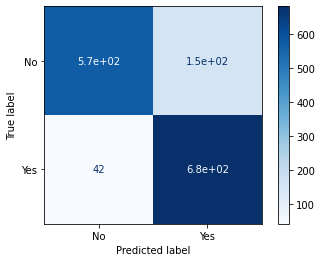

In [ ]:
labels=['No','Yes']
plot_confusion_matrix(final_model, X_test, Y_test,display_labels=labels, cmap=plt.cm.Blues)
plt.show()

In [ ]:
dt_pred_prob =final_model.predict_proba(X_test)[:,1]
dt_auroc = roc_auc_score(Y_test, dt_pred_prob)
print("DecisionTree AUROC: {}".format(dt_auroc))
dt_y_pred = final_model.predict(X_test)
print(classification_report(Y_test, dt_y_pred,digits=6))

DecisionTree AUROC: 0.8686001733211665
              precision    recall  f1-score   support

           0   0.931485  0.789765  0.854790       723
           1   0.817527  0.941909  0.875321       723

    accuracy                       0.865837      1446
   macro avg   0.874506  0.865837  0.865056      1446
weighted avg   0.874506  0.865837  0.865056      1446



In [ ]:
pickle.dump(final_model,open('/content/drive/MyDrive/ML project/model_DT.pkl','wb'))

In [ ]:

dot_data = tree.export_graphviz(final_model, out_file=None) 
graph = graphviz.Source(dot_data) 
graph.render("/content/drive/MyDrive/ML project/Churn") 

'/content/drive/MyDrive/ML project/Churn.pdf'

##with all features

In [ ]:
Features_model1=X.copy()

In [ ]:
Features_model1.columns

Index(['Latitude', 'Longitude', 'Partner', 'Dependents', 'Tenure Months',
       'Phone Service', 'Paperless Billing', 'Monthly Charges',
       'Total Charges', 'Gender_Female', 'Gender_Male', 'Senior Citizen_No',
       'Senior Citizen_Yes', 'Multiple Lines_No',
       'Multiple Lines_No phone service', 'Multiple Lines_Yes',
       'Internet Service_DSL', 'Internet Service_Fiber optic',
       'Internet Service_No', 'Online Security_No',
       'Online Security_No internet service', 'Online Security_Yes',
       'Online Backup_No', 'Online Backup_No internet service',
       'Online Backup_Yes', 'Device Protection_No',
       'Device Protection_No internet service', 'Device Protection_Yes',
       'Tech Support_No', 'Tech Support_No internet service',
       'Tech Support_Yes', 'Streaming TV_No',
       'Streaming TV_No internet service', 'Streaming TV_Yes',
       'Streaming Movies_No', 'Streaming Movies_No internet service',
       'Streaming Movies_Yes', 'Contract_Month-to-month',

In [ ]:
Features_model1.shape

(10326, 44)

In [ ]:
X_train, X_test, Y_train, Y_test= train_test_split(Features_model1,Y, train_size=0.7, random_state=6,stratify=Y)

In [ ]:
decision_tree = DecisionTreeClassifier(random_state=0)

In [ ]:
decision_tree.fit(X_train, Y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=0, splitter='best')

In [ ]:
print('Le train score est :', decision_tree.score(X_train, Y_train))
print('Le test score est :', decision_tree.score(X_test, Y_test))

Le train score est : 1.0
Le test score est : 0.8673337637185281


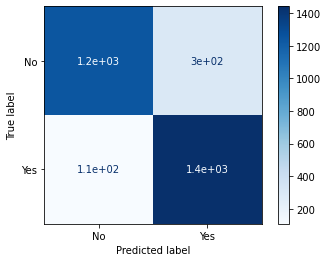

In [ ]:
labels=['No','Yes']
plot_confusion_matrix(decision_tree, X_test, Y_test,display_labels=labels, cmap=plt.cm.Blues)
plt.show()

In [ ]:
from sklearn.metrics import confusion_matrix
Y_pred = decision_tree.predict(X_test)
print(confusion_matrix(Y_test, Y_pred))


[[1246  303]
 [ 108 1441]]


In [ ]:
Y_pred = decision_tree.predict(X_test)
dt_auroc = roc_auc_score(Y_test, Y_pred)
print("decision tree AUROC: {}".format(dt_auroc))
print(classification_report(Y_test, Y_pred, digits=8))


decision tree AUROC: 0.8673337637185281
              precision    recall  f1-score   support

           0  0.92023634 0.80438993 0.85842232      1549
           1  0.82626147 0.93027760 0.87518980      1549

    accuracy                      0.86733376      3098
   macro avg  0.87324890 0.86733376 0.86680606      3098
weighted avg  0.87324890 0.86733376 0.86680606      3098



In [ ]:
decision_tree.feature_importances_

array([0.09578723, 0.11545256, 0.01192103, 0.04386628, 0.08599704,
       0.00091904, 0.01400327, 0.12917502, 0.09474002, 0.00707938,
       0.00859481, 0.00604889, 0.00387462, 0.00686195, 0.00109416,
       0.00559081, 0.00797194, 0.00739629, 0.        , 0.04262602,
       0.        , 0.00301804, 0.00366346, 0.        , 0.00554705,
       0.00329703, 0.        , 0.00657086, 0.00408578, 0.        ,
       0.00531725, 0.00378356, 0.        , 0.00457706, 0.00295697,
       0.        , 0.00679442, 0.22279247, 0.00487199, 0.0024124 ,
       0.00955313, 0.00644006, 0.00827507, 0.00704301])

In [ ]:
All_features=['Latitude','Longitude','Gender_Male','Gender_Female','Multiple Lines_No phone service','Phone Service','Multiple Lines_No','Multiple Lines_Yes','Streaming Movies_Yes','Streaming TV_Yes','Device Protection_Yes','Online Backup_Yes','Payment Method_Mailed check','Payment Method_Bank transfer (automatic)','Internet Service_DSL','Streaming TV_No','Streaming Movies_No','Payment Method_Credit card (automatic)','Partner','Senior Citizen_No','Senior Citizen_Yes','Tech Support_Yes','Online Security_Yes','Contract_One year','Paperless Billing','Monthly Charges','Total Charges','Device Protection_No internet service','Streaming Movies_No internet service','Streaming TV_No internet service','Tech Support_No internet service','Online Security_No internet service','Online Backup_No internet service','Internet Service_No','Dependents','Device Protection_No','Online Backup_No','Payment Method_Electronic check','Contract_Two year','Internet Service_Fiber optic','Tech Support_No','Online Security_No','Tenure Months','Contract_Month-to-month']

In [ ]:
sum_importance=0
number_features=0
for var, importance in zip(All_features, decision_tree.feature_importances_):
    if importance > 0.009:
        print(var, importance)
        number_features=number_features+1
        sum_importance=sum_importance+importance

print('the number of features is ',number_features)
print("la somme d'importance est= ",sum_importance)

Latitude 0.09578722653378254
Longitude 0.11545255868138009
Gender_Male 0.011921029765383295
Gender_Female 0.043866277579957855
Multiple Lines_No phone service 0.08599703968223814
Multiple Lines_No 0.01400327481097651
Multiple Lines_Yes 0.12917501620342758
Streaming Movies_Yes 0.09474002243862772
Senior Citizen_No 0.042626016279118294
Payment Method_Electronic check 0.22279247497277496
Tech Support_No 0.00955313001792057
the number of features is  11
la somme d'importance est=  0.8659140669655876


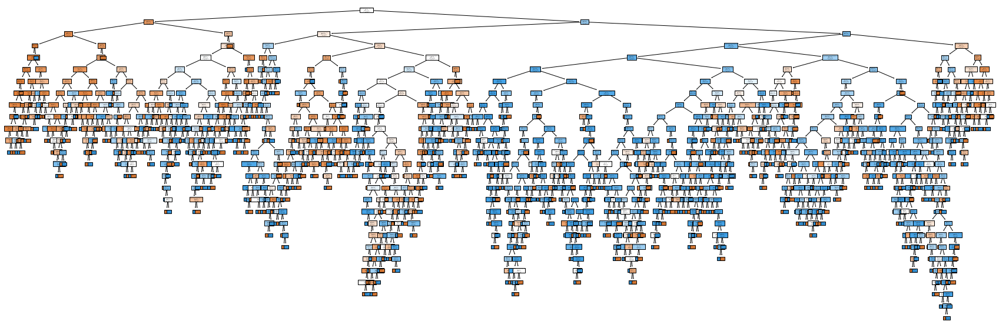

In [ ]:
labels=['No','Yes']
plt.figure(figsize=(30,10))
plot_tree(decision_tree, feature_names= All_features, class_names=labels, filled=True)
plt.show()

In [ ]:
dot_data = tree.export_graphviz(decision_tree, out_file=None) 
graph = graphviz.Source(dot_data) 
graph.render("/content/drive/MyDrive/ML project/Churn") 

'/content/drive/MyDrive/ML project/Churn.pdf'

#Random Forest


##loop

In [ ]:
Features_model_RF=X.copy()

In [ ]:
All_features=['Latitude','Longitude','Gender_Male','Gender_Female','Multiple Lines_No phone service','Phone Service','Multiple Lines_No','Multiple Lines_Yes','Streaming Movies_Yes','Streaming TV_Yes','Device Protection_Yes','Online Backup_Yes','Payment Method_Mailed check','Payment Method_Bank transfer (automatic)','Internet Service_DSL','Streaming TV_No','Streaming Movies_No','Payment Method_Credit card (automatic)','Partner','Senior Citizen_No','Senior Citizen_Yes','Tech Support_Yes','Online Security_Yes','Contract_One year','Paperless Billing','Monthly Charges','Total Charges','Device Protection_No internet service','Streaming Movies_No internet service','Streaming TV_No internet service','Tech Support_No internet service','Online Security_No internet service','Online Backup_No internet service','Internet Service_No','Dependents','Device Protection_No','Online Backup_No','Payment Method_Electronic check','Contract_Two year','Internet Service_Fiber optic','Tech Support_No','Online Security_No','Tenure Months','Contract_Month-to-month']

In [ ]:
def idx_max(liste):
	max = liste[0]
	a = 0  
	for i in range(len(liste)):
		if liste[i] > max:
			max  = liste [i]
			a = i
	return [max,a]

In [ ]:
def idx_max_2x2(liste):
	  
  a = 0
  b =liste[0][1]
  max = liste[0][0]
  for i in np.arange(len(liste)):
    if liste[i][0]>max:
      max=liste[i][0]
      b=liste[i][1]
      a=i
  return [max,b,a]
   

In [ ]:
def idx_max_RF(liste):
  max = liste[0][0]
  param=liste[0][1]
  a = 0  
  for i in range(len(liste)):
    if liste[i][0]>max:
      max =liste [i][0]
      param=liste[i][1]
      a=i
  return [max,a,param]

In [ ]:
def idx_max_2x2_RF(liste):
  a = 0
  b =liste[0][1]
  max = liste[0][0]
  param=liste[0][2]
  for i in np.arange(len(liste)):
    if liste[i][0]>max:
      max=liste[i][0]
      b=liste[i][1]
      param=liste[i][2]
      a=i
  return [max,b,a,param]

In [ ]:
def Best_RF(liste,n):
  X_train, X_test, Y_train, Y_test= train_test_split(liste,Y, train_size=n, random_state=6,stratify=Y)
  robust = RobustScaler()
  X_train=robust.fit_transform(X_train)
  X_test=robust.transform(X_test)
  RF=RandomForestClassifier(random_state=3)
  params_distributions={'criterion':['gini','entropy'],
                        'n_estimators': [100,200,300],
                        'n_jobs':[-1]}
  RF_random=RandomizedSearchCV(RF,param_distributions=params_distributions,n_iter=15,random_state=3,cv=5,n_jobs=-1,verbose=2,scoring='roc_auc')
  start = timeit.default_timer()
  RF_random.fit(X_train,Y_train)
  stop = timeit.default_timer()
  print('Time: ', stop - start)
  print("Tuned RandomForest Parameters (RandomizedSearchCV): {}".format(RF_random.best_params_))
  print("Best RandomForest Training Score (RandomizedSearchCV) :{}".format(RF_random.best_score_))
  dictio=RF_random.best_params_
  final_model = RandomForestClassifier(criterion=dictio['criterion'],n_estimators=dictio['n_estimators'],random_state=3,n_jobs=-1)
  final_model.fit(X_train, Y_train)
  print(final_model.score(X_test, Y_test))
  print(final_model.score(X_train, Y_train))
  RF_pred_prob =final_model.predict_proba(X_test)[:,1]
  RF_auroc = roc_auc_score(Y_test, RF_pred_prob)
  print("RandomForest AUROC: {}".format(RF_auroc))
  return[RF_auroc,RF_random.best_params_] 

In [ ]:
start = timeit.default_timer()
Liste_fin=[]
for j in np.arange(len(All_features)-1,-1,-1):
  print(j)
  Features_model_RF=X.copy()
  L=[]
  To_drop=All_features[:j]
  Features_model_RF=Features_model_RF.drop(To_drop,axis=1)
  for k in np.arange (0.75,0.9,0.01):
    var=Best_RF(Features_model_RF,k)
    L.append(var)
    print('-------')
  print(L)
  print('when we have '+str(j)+' features')
  print(idx_max_RF(L))
  Liste_fin.append(idx_max_RF(L))
print(Liste_fin)
stop = timeit.default_timer()
print('Time: ', stop - start)

43
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   13.9s finished


Time:  14.256686277999506
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.7259841627073437
0.7366382649109218
0.7259814049586777
RandomForest AUROC: 0.7366382649109218
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   12.6s finished


Time:  12.866046930000266
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.7257315091641752
0.7377974989915288
0.7257550656301771
RandomForest AUROC: 0.7378635215704652
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   12.9s finished


Time:  13.205788104000021
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.7261780601118801
0.7368421052631579
0.7261979625204377
RandomForest AUROC: 0.7369106680395644
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   12.7s finished


Time:  13.072154984000008
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.726096666307045
0.7376760563380281
0.726098832878073
RandomForest AUROC: 0.7376760563380282
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   12.6s finished


Time:  12.922619420000046
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.7251217971851318
0.7418165053019825
0.7251440480568837
RandomForest AUROC: 0.7418904212083595
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   12.8s finished


Time:  13.128746718999537
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.7261501210653754
0.7386253630203291
0.7261501210653754
RandomForest AUROC: 0.7386253630203291
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   12.6s finished


Time:  12.904100490000019
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.7272873042822109
0.7344546381243628
0.7272835963653754
RandomForest AUROC: 0.7344546381243628
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   13.1s finished


Time:  13.484836495000309
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.7284558768117761
0.7294244217321141
0.7284752568796504
RandomForest AUROC: 0.7295172286074749
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   12.9s finished


Time:  13.286537298999974
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.7282380396732788
0.7306378132118451
0.7282380396732788
RandomForest AUROC: 0.7306378132118452
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   12.8s finished


Time:  13.150664570000117
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.7282187637863494
0.7307924984875983
0.7282370575348783
RandomForest AUROC: 0.7308974355220743
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   12.9s finished


Time:  13.24086060799982
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.7285888681386898
0.7288573273079406
0.7286088640765638
RandomForest AUROC: 0.728969742435609
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   13.0s finished


Time:  13.385299861999556
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.729054054054054
0.7261410788381742
0.7290540540540541
RandomForest AUROC: 0.7261410788381744
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   13.2s finished


Time:  13.502254944000015
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.728690378569606
0.7282204020848846
0.7287097851497273
RandomForest AUROC: 0.7283483251720957
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   13.3s finished


Time:  13.605992056000105
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.7290296981239974
0.7258064516129032
0.7290336781862206
RandomForest AUROC: 0.7258064516129032
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   13.2s finished


Time:  13.558592805999979
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.7285092491838956
0.7297535211267606
0.7285092491838956
RandomForest AUROC: 0.7297535211267605
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   13.2s finished


Time:  13.583429839000019
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.7288101438707363
0.7270087124878993
0.7288281502205961
RandomForest AUROC: 0.7271733915103535
-------
[[0.7366382649109218, {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'gini'}], [0.7378635215704652, {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'gini'}], [0.7369106680395644, {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'gini'}], [0.7376760563380282, {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'gini'}], [0.7418904212083595, {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'gini'}], [0.7386253630203291, {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'gini'}], [0.7344546381243628, {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'gini'}], [0.7295172286074749, {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'gini'}], [0.7306378132118452, {'n_jobs': -1, 'n_estimators': 100, 'criteri

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   18.9s finished


Time:  19.390104549999705
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.7859578992508678
0.7432223082881487
0.7396694214876033
RandomForest AUROC: 0.796215052550548
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   19.3s finished


Time:  19.71051003699995
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.7836238885793272
0.7398144413069786
0.739773161717854
RandomForest AUROC: 0.7973502304147465
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   19.5s finished


Time:  19.93259900599969
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.7874506085269908
0.7389473684210527
0.7402842409759779
RandomForest AUROC: 0.795872938880521
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   19.8s finished


Time:  20.238911513999483
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.7874335527791401
0.7372359154929577
0.7405016141047926
RandomForest AUROC: 0.7960722078952589
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   19.8s finished


Time:  20.9727918159997
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.7864401704497208
0.7422775472568004
0.7397327448816967
RandomForest AUROC: 0.8011601510024319
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   20.0s finished


Time:  21.191795714000364
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.7855921943612262
0.744917715392062
0.7397094430992736
RandomForest AUROC: 0.7992088757357634
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   19.9s finished


Time:  20.37595187900024
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.7871851578267957
0.7390417940876657
0.7405547584887614
RandomForest AUROC: 0.7952514700824327
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   20.2s finished


Time:  21.06141063800078
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.7868129899833558
0.7374932759548144
0.741230660210228
RandomForest AUROC: 0.7931409655427849
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   20.4s finished


Time:  21.567666320999706
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.7876098953092727
0.7403189066059226
0.741073512252042
RandomForest AUROC: 0.7907039191369908
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   23.4s finished


Time:  24.270119198999964
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.7870495095122589
0.7368421052631579
0.7409200968523002
RandomForest AUROC: 0.7910700012589628
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   20.8s finished


Time:  21.66551603500011
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.7895638778769507
0.7372498386055519
0.7414834225817477
RandomForest AUROC: 0.7888122030507627
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   20.9s finished


Time:  21.754396197999995
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.7897838294375457
0.7344398340248963
0.7418918918918919
RandomForest AUROC: 0.7861444457835706
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   21.2s finished


Time:  21.608117305000633
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.7894509446320469
0.7349218168279971
0.7417343871757764
RandomForest AUROC: 0.7878022762756369
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   21.1s finished


Time:  22.280377930999748
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.7880807862896659
0.7322580645161291
0.7420206911732335
RandomForest AUROC: 0.7872411550468263
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   21.3s finished


Time:  22.215499199000078
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.7881255468817528
0.7341549295774648
0.7416757344940152
RandomForest AUROC: 0.7886828010315413
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   21.3s finished


Time:  22.498816368000007
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.7896709964551081
0.7299128751210068
0.7420639190788766
RandomForest AUROC: 0.7883192389006343
-------
[[0.796215052550548, {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'entropy'}], [0.7973502304147465, {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'entropy'}], [0.795872938880521, {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'entropy'}], [0.7960722078952589, {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'entropy'}], [0.8011601510024319, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.7992088757357634, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.7952514700824327, {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'gini'}], [0.7931409655427849, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'entropy'}], [0.7907039191369908, {'n_jobs': -1, 'n_estimators

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   20.9s finished


Time:  21.341663483000048
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8164637737815159
0.761425251742835
0.7616219008264463
RandomForest AUROC: 0.8361987086911052
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   21.4s finished


Time:  21.845091104999483
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8141091460844958
0.763614360629286
0.7614374920351726
RandomForest AUROC: 0.837281626702075
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   21.1s finished


Time:  22.354379772000357
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8175704721145381
0.759578947368421
0.7617909696893472
RandomForest AUROC: 0.8346881479779542
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   21.1s finished


Time:  21.543948139999884
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8179256109635663
0.7574823943661971
0.762229947851999
RandomForest AUROC: 0.8338162225996826
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   21.1s finished


Time:  22.30253504800021
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8182810441668849
0.7597971415398801
0.7620448694372931
RandomForest AUROC: 0.8367719829272026
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   21.5s finished


Time:  22.7104283259996
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8159337276996407
0.7575024201355276
0.761864406779661
RandomForest AUROC: 0.837489187874676
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   21.8s finished


Time:  23.018156219000048
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.819683950358356
0.754841997961264
0.7627929220468675
RandomForest AUROC: 0.8341516333267869
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   21.9s finished


Time:  22.765651538000384
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8203223865359426
0.7557826788596019
0.7633164048659502
RandomForest AUROC: 0.8338426102758196
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   21.8s finished


Time:  23.050810263999665
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8200607530270994
0.7517084282460137
0.7633605600933488
RandomForest AUROC: 0.8331350760944578
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   21.8s finished


Time:  22.242991443999927
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8209541449062241
0.7525710828796128
0.7636342672662285
RandomForest AUROC: 0.8317176644190764
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   21.9s finished


Time:  22.790339717999814
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8214427153503763
0.7572627501613944
0.7634727127720178
RandomForest AUROC: 0.8306785029590731
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   22.2s finished


Time:  23.518395893999696
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8226426172794415
0.7538035961272476
0.7638513513513514
RandomForest AUROC: 0.8268835285587752
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   22.1s finished


Time:  23.019560950000596
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.820771994240609
0.7557706626954579
0.7632194144495158
RandomForest AUROC: 0.8293613831523667
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   22.4s finished


Time:  23.819527396000012
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.821427201433063
0.7508064516129033
0.7637023992956197
RandomForest AUROC: 0.8307687304890738
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   22.7s finished


Time:  24.078798116000144
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8216596551344427
0.7544014084507042
0.7637649619151251
RandomForest AUROC: 0.8326457424122198
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   22.5s finished


Time:  23.787807775000147
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.822652448774752
0.7454017424975798
0.7642311417195738
RandomForest AUROC: 0.8332452431289641
-------
[[0.8361987086911052, {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'gini'}], [0.837281626702075, {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'gini'}], [0.8346881479779542, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.8338162225996826, {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'gini'}], [0.8367719829272026, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.837489187874676, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.8341516333267869, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.8338426102758196, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}], [0.8331350760944578, {'n_jobs': -1, 'n_estimators': 300, 'criteri

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   22.9s finished


Time:  23.877675687000192
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8276415619839499
0.7738187451587917
0.7889979338842975
RandomForest AUROC: 0.8462021226617451
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   23.1s finished


Time:  24.313906962000146
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8250389201118397
0.7712787414279951
0.7887090607875621
RandomForest AUROC: 0.8481299955739541
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   26.1s finished


Time:  27.539307971999733
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8297598744881404
0.7709473684210526
0.7888315935102502
RandomForest AUROC: 0.8441137008955037
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   23.6s finished


Time:  24.47068724700057
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8288999166488212
0.7720070422535211
0.7889247578842811
RandomForest AUROC: 0.8436961447381472
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   23.8s finished


Time:  25.08505790900017
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8294594573627299
0.7750115260488705
0.7882800049037636
RandomForest AUROC: 0.8471287431768326
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   23.9s finished


Time:  25.367111116999695
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8283860197339493
0.7758954501452081
0.787772397094431
RandomForest AUROC: 0.8479808150960229
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   24.0s finished


Time:  25.537500739999814
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8298731926333958
0.7731906218144751
0.7882592061214729
RandomForest AUROC: 0.8449043550185429
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   24.0s finished


Time:  25.027065920000496
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8302804118051469
0.7703066164604626
0.7890634226998937
RandomForest AUROC: 0.842221373427318
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   24.5s finished


Time:  26.04318930699992
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.83068463569288
0.7716400911161732
0.7889148191365227
RandomForest AUROC: 0.8412089237810099
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   24.6s finished


Time:  26.16098922600031
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8325788249593099
0.7707199032062916
0.7893462469733656
RandomForest AUROC: 0.8373478631302499
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   25.0s finished


Time:  25.982383654999467
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8323448361201718
0.7663008392511298
0.7900193688048308
RandomForest AUROC: 0.8351237809452363
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   24.9s finished


Time:  25.9860600789998
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8345647167437708
0.760027662517289
0.7903153153153153
RandomForest AUROC: 0.8310357757078716
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   25.0s finished


Time:  26.469021981999504
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8307831433678189
0.7654504839910647
0.7898252254258042
RandomForest AUROC: 0.8342159889291038
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   25.3s finished


Time:  26.423705475999668
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8326536404797533
0.7612903225806451
0.7903367818622056
RandomForest AUROC: 0.8355866285119666
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   25.2s finished


Time:  26.297865485999864
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8333451343360634
0.7588028169014085
0.7900979325353645
RandomForest AUROC: 0.8366844996032533
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   25.4s finished


Time:  26.873947625000255
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8343691146234807
0.7570183930300097
0.7901646400516518
RandomForest AUROC: 0.8389373697389532
-------
[[0.8462021226617451, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'entropy'}], [0.8481299955739541, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.8441137008955037, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.8436961447381472, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}], [0.8471287431768326, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.8479808150960229, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.8449043550185429, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.842221373427318, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'entropy'}], [0.8412089237810099, {'n_jobs': -1, 'n_estimators':

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   24.0s finished


Time:  25.376324576000115
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8505802647905731
0.7931835786212239
0.8239927685950413
RandomForest AUROC: 0.8656068557810402
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   24.6s finished


Time:  25.470705163000275
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8489973923684448
0.7946752722872126
0.8238817382439149
RandomForest AUROC: 0.8663630268947383
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   24.1s finished


Time:  25.39669894399958
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8543425292675156
0.7932631578947369
0.8239215193057478
RandomForest AUROC: 0.8664998766093963
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   24.1s finished


Time:  25.659234124999784
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8521870679214942
0.7891725352112676
0.824062577601192
RandomForest AUROC: 0.8638577725153739
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   24.4s finished


Time:  25.28913261099933
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8530105472057702
0.7962194559704933
0.8233419149197009
RandomForest AUROC: 0.8667798901491319
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   24.8s finished


Time:  26.092041267999775
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8512893609037985
0.7981606969990319
0.8228813559322034
RandomForest AUROC: 0.8675874271030812
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   24.7s finished


Time:  26.1359548370001
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8550991270492432
0.7935779816513762
0.823170731707317
RandomForest AUROC: 0.8653083406330889
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   24.9s finished


Time:  26.288539100999515
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8568284040354083
0.792361484669177
0.8234321483406165
RandomForest AUROC: 0.8627313448383623
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   27.9s finished


Time:  29.29408385900024
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8551522297668047
0.7921412300683371
0.8231038506417736
RandomForest AUROC: 0.863477514126639
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   25.3s finished


Time:  26.822186418000456
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8570104533193399
0.7900786448880823
0.8234751527729736
RandomForest AUROC: 0.8601899862685222
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   25.4s finished


Time:  26.771251125000163
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8548991315731959
0.7863137508069722
0.8239717443317762
RandomForest AUROC: 0.8573401683754274
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   25.8s finished


Time:  27.26932647600006
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8584436632578525
0.7842323651452282
0.8239864864864865
RandomForest AUROC: 0.8543097857589688
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   25.9s finished


Time:  27.558516178999525
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8567382961738337
0.7870439314966493
0.8234442836468886
RandomForest AUROC: 0.8593317543112624
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   26.1s finished


Time:  27.20620788799988
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8577862006358334
0.785483870967742
0.8235747303543913
RandomForest AUROC: 0.8585353798126951
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   26.1s finished


Time:  27.55357322600048
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8581476056791635
0.7852112676056338
0.8232861806311208
RandomForest AUROC: 0.856557478674866
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   26.2s finished


Time:  27.170791614000336
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8591276533006637
0.7754114230396902
0.8232002582589045
RandomForest AUROC: 0.8564504520714318
-------
[[0.8656068557810402, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.8663630268947383, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}], [0.8664998766093963, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.8638577725153739, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.8667798901491319, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}], [0.8675874271030812, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.8653083406330889, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.8627313448383623, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.863477514126639, {'n_jobs': -1, 'n_estimators': 300, 'crite

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   24.3s finished


Time:  25.300146157999734
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8533682421466693
0.7978311386522076
0.8322572314049587
RandomForest AUROC: 0.863722571985881
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   24.0s finished


Time:  24.897714157000337
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8528570130758297
0.7974989915288423
0.8321651586593602
RandomForest AUROC: 0.8645489989325419
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   24.3s finished


Time:  25.794823954000094
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8580042165258475
0.7962105263157895
0.8320965916236951
RandomForest AUROC: 0.8650252170681825
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   24.6s finished


Time:  26.12289000599958
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.855474325070363
0.792693661971831
0.8320089396573132
RandomForest AUROC: 0.8631227837978576
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   24.7s finished


Time:  25.79086727200047
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8552001722438043
0.7989857076994007
0.8310653426504843
RandomForest AUROC: 0.865454792796776
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   24.9s finished


Time:  26.337925648000237
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8546147013818455
0.8015488867376573
0.8305084745762712
RandomForest AUROC: 0.8674506062755777
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   25.0s finished


Time:  26.439246530000673
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8572077115060619
0.7966360856269113
0.8309421329507413
RandomForest AUROC: 0.8649472495248665
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   25.3s finished


Time:  26.916589567999836
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8590937718686356
0.7966648735879505
0.8311090114562418
RandomForest AUROC: 0.8634368091484658
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   25.5s finished


Time:  27.02803833300095
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8579958581194882
0.7949886104783599
0.8308051341890315
RandomForest AUROC: 0.8637544688954499
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   25.5s finished


Time:  26.91688669799987
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8594371345162338
0.7918935269207501
0.8310849763634267
RandomForest AUROC: 0.8609014466360808
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   25.8s finished


Time:  26.84008802900098
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8563663851756989
0.788896061975468
0.8314913979719722
RandomForest AUROC: 0.8576702508960574
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   25.9s finished


Time:  26.866514583000026
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8601925827854883
0.7828492392807745
0.8316441441441441
RandomForest AUROC: 0.8553036085619892
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   26.1s finished


Time:  27.50625849500102
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8600900449576336
0.7892777364110201
0.8311254592007125
RandomForest AUROC: 0.8593195568093109
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   29.0s finished


Time:  30.003515156000503
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8609064834409272
0.7846774193548387
0.8314990094651111
RandomForest AUROC: 0.8582921436004163
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   26.4s finished


Time:  27.852335413999754
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8604908348834484
0.784330985915493
0.8307943416757345
RandomForest AUROC: 0.8558275267804007
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   26.5s finished


Time:  27.55830283599971
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8613501102932937
0.7802516940948693
0.8305175938878726
RandomForest AUROC: 0.8555732985470739
-------
[[0.863722571985881, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'entropy'}], [0.8645489989325419, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}], [0.8650252170681825, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.8631227837978576, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.865454792796776, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'entropy'}], [0.8674506062755777, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.8649472495248665, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.8634368091484658, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.8637544688954499, {'n_jobs': -1, 'n_estimators'

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   25.1s finished


Time:  25.967562230000112
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8565535716401106
0.808288148721921
0.8552427685950413
RandomForest AUROC: 0.8656245556288215
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   25.2s finished


Time:  26.727217429999655
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.857826298372
0.8079870915691811
0.8549764241111253
RandomForest AUROC: 0.8678109297300112
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   25.6s finished


Time:  27.113059241000883
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8604928682016147
0.8092631578947368
0.855112564457301
RandomForest AUROC: 0.8687485639886652
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   25.6s finished


Time:  27.042832102999455
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8584355614592651
0.8058978873239436
0.8552272162900422
RandomForest AUROC: 0.8655850153739337
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   25.7s finished


Time:  27.137528618999568
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8608084511133637
0.8132780082987552
0.8541130317518696
RandomForest AUROC: 0.871011954359175
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   26.0s finished


Time:  27.0821978139993
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.858114018373796
0.8083252662149081
0.8539951573849879
RandomForest AUROC: 0.8700998698327882
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   26.3s finished


Time:  27.939585097999952
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8622449645588166
0.8058103975535168
0.8542563366810139
RandomForest AUROC: 0.8680666610554667
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   26.3s finished


Time:  27.758079335999355
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8626081425201771
0.8074233458848843
0.8544939175623006
RandomForest AUROC: 0.8649223931386506
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   26.6s finished


Time:  28.156362343999717
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8604159036229883
0.8052391799544419
0.8540256709451576
RandomForest AUROC: 0.8655913211326216
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   26.5s finished


Time:  27.94426220999958
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.863530129687115
0.8052026618269812
0.8540297474922173
RandomForest AUROC: 0.864334316105062
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   26.8s finished


Time:  27.364357720000044
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8605531791643525
0.8018076178179471
0.854620029622878
RandomForest AUROC: 0.860746019838293
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   26.9s finished


Time:  27.91499953099992
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8644184725265806
0.7918395573997233
0.8551801801801802
RandomForest AUROC: 0.8547076974876083
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   27.0s finished


Time:  28.56799395500093
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8643633812554086
0.7952345495160089
0.8546142714015362
RandomForest AUROC: 0.8623534082038181
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   27.3s finished


Time:  28.980673250998734
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8656145343553513
0.7903225806451613
0.8549416685009905
RandomForest AUROC: 0.8579526534859522
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   27.6s finished


Time:  29.084961272001237
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8634215882570946
0.7948943661971831
0.8539717083786724
RandomForest AUROC: 0.8623784963300932
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   27.7s finished


Time:  29.2508593750008
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8659129884969271
0.7889641819941917
0.8536532874206392
RandomForest AUROC: 0.8633852128409277
-------
[[0.8656245556288215, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}], [0.8678109297300112, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.8687485639886652, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.8655850153739337, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.871011954359175, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.8700998698327882, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'entropy'}], [0.8680666610554667, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.8649223931386506, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.8655913211326216, {'n_jobs': -1, 'n_estimators': 300,

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   26.1s finished


Time:  27.485771863999616
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8643548367712084
0.8183578621223857
0.8783574380165289
RandomForest AUROC: 0.8723669976438201
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   26.3s finished


Time:  27.772130706998723
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8641192973842544
0.8204921339249698
0.8781700012743724
RandomForest AUROC: 0.8736682808716707
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   29.5s finished


Time:  30.5996862840002
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8693841071581554
0.8214736842105264
0.8783800779776129
RandomForest AUROC: 0.8736132739923809
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   26.5s finished


Time:  27.935274057999777
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8668772633549754
0.8226232394366197
0.8784454929227713
RandomForest AUROC: 0.872216574092442
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   26.7s finished


Time:  28.16448898999988
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8680320867106918
0.8224988473951129
0.8778962853990437
RandomForest AUROC: 0.8741323311850631
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   27.0s finished


Time:  28.48356707200037
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8658991375924113
0.8204259438528557
0.8778450363196126
RandomForest AUROC: 0.8764011249295982
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   26.8s finished


Time:  28.22946799499914
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8685055403781796
0.8241590214067278
0.8780487804878049
RandomForest AUROC: 0.87455902722575
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   27.2s finished


Time:  28.939255713999955
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8706686809813331
0.8192576654115116
0.8785874571867249
RandomForest AUROC: 0.8703201500052085
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   27.3s finished


Time:  28.72694225500163
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8691581035579052
0.8183371298405467
0.877946324387398
RandomForest AUROC: 0.8715961156282916
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   27.3s finished


Time:  28.48022919200048
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8703261293968441
0.8185117967332124
0.8784734232676121
RandomForest AUROC: 0.8679472465312648
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   27.4s finished


Time:  28.94745268099905
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8682715764064366
0.8192382182052937
0.8791158710265466
RandomForest AUROC: 0.8636525798116197
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   27.9s finished


Time:  29.44564044100116
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8745220304764224
0.8084370677731674
0.8797297297297297
RandomForest AUROC: 0.8561539535782403
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   28.3s finished


Time:  29.806875587999457
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8724013370576985
0.8145941921072226
0.8793276188355783
RandomForest AUROC: 0.8637195284223973
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   28.4s finished


Time:  29.873132927999904
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8746630970071317
0.8137096774193548
0.8792648029936165
RandomForest AUROC: 0.8608623829344433
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   28.5s finished


Time:  29.568475324000246
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8724980196812309
0.8125
0.8786724700761698
RandomForest AUROC: 0.8611371131719897
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   28.7s finished


Time:  30.194803320000574
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8731279658738101
0.818973862536302
0.878295491229958
RandomForest AUROC: 0.8657224146462148
-------
[[0.8723669976438201, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.8736682808716707, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.8736132739923809, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'entropy'}], [0.872216574092442, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.8741323311850631, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.8764011249295982, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.87455902722575, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.8703201500052085, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.8715961156282916, {'n_jobs': -1, 'n_estimators': 300, 'criter

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   27.3s finished


Time:  28.332520619000206
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8782333277117729
0.8276529821843532
0.9005681818181818
RandomForest AUROC: 0.8902624437429839
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   27.6s finished


Time:  29.165392633998636
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8774517105880852
0.8305768455022187
0.9002166433031732
RandomForest AUROC: 0.8933339191335363
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   28.2s finished


Time:  29.68094646999998
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8815479811938932
0.832421052631579
0.9001383473776884
RandomForest AUROC: 0.8948807791478388
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   27.9s finished


Time:  29.389656457000456
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8791243829911519
0.8340669014084507
0.9001738266699777
RandomForest AUROC: 0.8919570459730212
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   28.2s finished


Time:  29.303214702000332
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8818530158439533
0.8414015675426464
0.8992276572269217
RandomForest AUROC: 0.8948428758481132
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   31.9s finished


Time:  33.54063843900076
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8808794388194807
0.8378509196515005
0.8996368038740921
RandomForest AUROC: 0.8943579214104915
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   28.9s finished


Time:  30.533179164998728
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8810392815942629
0.836901121304791
0.8999282639885222
RandomForest AUROC: 0.8914528955350436
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   29.1s finished


Time:  30.678427369999554
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8842432433840498
0.8310919849381387
0.9002007794968702
RandomForest AUROC: 0.8883531835596143
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   29.1s finished


Time:  30.69784670500121
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8836669394335072
0.8331435079726651
0.9001166861143524
RandomForest AUROC: 0.8882166447870238
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   29.1s finished


Time:  30.718050415000107
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8869850896089227
0.8263762855414398
0.9006110918943848
RandomForest AUROC: 0.8858391572561637
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   29.5s finished


Time:  31.144433258999925
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8836747936591236
0.8315041962556488
0.9011051612168167
RandomForest AUROC: 0.8839743269150622
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   29.7s finished


Time:  31.312459361999572
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8885884617725832
0.8284923928077456
0.901463963963964
RandomForest AUROC: 0.8816786518444549
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   29.9s finished


Time:  30.9407864470013
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8876523436840265
0.8183172002978406
0.9014805744183457
RandomForest AUROC: 0.8834251472571145
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   30.3s finished


Time:  31.97750280299988
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8893797958473098
0.8169354838709677
0.9019370460048426
RandomForest AUROC: 0.8802861602497399
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   30.6s finished


Time:  32.304692687999705
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8882122191292281
0.8248239436619719
0.9014145810663765
RandomForest AUROC: 0.8794122569926601
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   30.5s finished


Time:  32.25162845600062
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8881470625755415
0.8286544046466602
0.9011083611320349
RandomForest AUROC: 0.881439956217294
-------
[[0.8902624437429839, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}], [0.8933339191335363, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.8948807791478388, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.8919570459730212, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.8948428758481132, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}], [0.8943579214104915, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.8914528955350436, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.8883531835596143, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.8882166447870238, {'n_jobs': -1, 'n_estimators': 300, 'criterion

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   27.2s finished


Time:  28.701571441999477
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8897198888438733
0.8439194422927963
0.9125774793388429
RandomForest AUROC: 0.9006387545067113
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   27.4s finished


Time:  28.94925505900028
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8888223250353328
0.8430818878580073
0.9121957435962789
RandomForest AUROC: 0.9031307766408914
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   27.9s finished


Time:  29.42601991799893
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8922076944590044
0.8421052631578947
0.912463841026286
RandomForest AUROC: 0.9029802376474659
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   27.9s finished


Time:  29.602680470999985
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8900235929690166
0.84375
0.9123416935684132
RandomForest AUROC: 0.9003359948422931
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   28.4s finished


Time:  29.923396402000435
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8927098425304802
0.8492392807745505
0.9117322545053328
RandomForest AUROC: 0.9028967639906813
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   28.2s finished


Time:  29.322563689000162
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.890906026300207
0.8494675701839303
0.9121065375302664
RandomForest AUROC: 0.9037554505762876
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   28.6s finished


Time:  30.423982432999765
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8928542980515548
0.8465851172273191
0.9126016260162602
RandomForest AUROC: 0.9013623785668788
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   28.8s finished


Time:  30.40730337199966
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8935849281789784
0.8488434642280797
0.9127199716546592
RandomForest AUROC: 0.899843165850666
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   31.7s finished


Time:  33.545931721999295
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8953912388743126
0.8496583143507973
0.9128354725787631
RandomForest AUROC: 0.8981857192521832
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   29.4s finished


Time:  31.049750279000364
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8966310031100285
0.8427102238354507
0.9132941312118068
RandomForest AUROC: 0.8986037224309109
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   29.3s finished


Time:  30.52656588499849
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8952439324245836
0.841187863137508
0.9138657855759371
RandomForest AUROC: 0.8934466950070852
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   29.5s finished


Time:  30.59897595199982
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.899641998417336
0.8354080221300139
0.9141891891891892
RandomForest AUROC: 0.8898224510214663
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   29.9s finished


Time:  30.99739861099988
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8977765296918303
0.8391660461653015
0.9141712122898809
RandomForest AUROC: 0.8916451547086792
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   30.2s finished


Time:  31.775549857000442
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8986637444439693
0.8403225806451613
0.914373761831389
RandomForest AUROC: 0.8906022372528617
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   30.5s finished


Time:  31.704388914000447
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8977966067578302
0.835387323943662
0.914145810663765
RandomForest AUROC: 0.887867920551478
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   30.5s finished


Time:  32.25840330000028
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8979569320601808
0.8344627299128751
0.9138060906058324
RandomForest AUROC: 0.8895817402126159
-------
[[0.9006387545067113, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9031307766408914, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9029802376474659, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9003359948422931, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9028967639906813, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9037554505762876, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}], [0.9013623785668788, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.899843165850666, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.8981857192521832, {'n_jobs': -1, 'n_estimators': 300, 'cri

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   27.1s finished


Time:  28.665921481000623
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8894554512874558
0.8450813323005422
0.9133522727272727
RandomForest AUROC: 0.9017817446769958
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   27.9s finished


Time:  29.42579860600017
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.889178837407818
0.8442920532472771
0.912960367019243
RandomForest AUROC: 0.903728943737145
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   27.8s finished


Time:  28.373803016000238
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8924840386020925
0.8454736842105263
0.9132184630864042
RandomForest AUROC: 0.9035294676617339
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   27.8s finished


Time:  29.501777352999852
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8903454244395765
0.846830985915493
0.9130866650111745
RandomForest AUROC: 0.9015874516464988
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   28.3s finished


Time:  29.35704953200002
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.892851290052139
0.8570769940064545
0.9125904131420866
RandomForest AUROC: 0.9041470403183294
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   28.1s finished


Time:  29.728807823999887
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8913962970997075
0.8504356243949661
0.912953995157385
RandomForest AUROC: 0.9061746489749216
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   28.4s finished


Time:  29.938097723999817
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8932077590772483
0.8496432212028542
0.913558106169297
RandomForest AUROC: 0.902161974560482
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   28.7s finished


Time:  30.183079290000023
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8944654299644833
0.849919311457773
0.9136648163458132
RandomForest AUROC: 0.9008379920599096
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   28.9s finished


Time:  30.48996018700018
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8955612983338531
0.8513667425968109
0.9138856476079347
RandomForest AUROC: 0.8987863284229534
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   29.0s finished


Time:  30.60004433300128
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8961389778176537
0.8451300665456746
0.9144471347861178
RandomForest AUROC: 0.8984741663763245
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   31.8s finished


Time:  33.43019980900135
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8953442706658908
0.8476436410587476
0.9150051270365729
RandomForest AUROC: 0.8941985496374093
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   29.6s finished


Time:  31.2594552139999
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9000863616995375
0.8423236514522822
0.9153153153153153
RandomForest AUROC: 0.8905207095837423
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   29.7s finished


Time:  31.31079506199967
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8975050158685507
0.8384214445271779
0.9152844261382611
RandomForest AUROC: 0.892983553331914
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   30.0s finished


Time:  31.606321166998896
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8996271526853669
0.8379032258064516
0.9155844155844156
RandomForest AUROC: 0.8902237252861602
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   30.3s finished


Time:  31.88014031900093
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8983716984326768
0.840669014084507
0.9153427638737759
RandomForest AUROC: 0.8884041484824441
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   30.5s finished


Time:  32.23321860100077
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8985313688170884
0.8373668925459826
0.9149897772516948
RandomForest AUROC: 0.8893493320138546
-------
[[0.9017817446769958, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.903728943737145, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9035294676617339, {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'gini'}], [0.9015874516464988, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9041470403183294, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}], [0.9061746489749216, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.902161974560482, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9008379920599096, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.8987863284229534, {'n_jobs': -1, 'n_estimators': 300, 'criteri

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   27.2s finished


Time:  28.759320922999905
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.889080568376375
0.8458559256390396
0.9133522727272727
RandomForest AUROC: 0.901214749553154
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   27.3s finished


Time:  28.778366298000037
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8888278565757108
0.8426784993949173
0.912960367019243
RandomForest AUROC: 0.903398942956078
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   27.8s finished


Time:  29.273702979000518
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.891908773725039
0.8454736842105263
0.9132184630864042
RandomForest AUROC: 0.9034975562987357
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   27.8s finished


Time:  29.31798579899987
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8905388114276984
0.8472711267605634
0.9130866650111745
RandomForest AUROC: 0.9017676149325531
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   28.3s finished


Time:  29.871196611000414
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8920889709862653
0.8543107422775472
0.9125904131420866
RandomForest AUROC: 0.904156392946418
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   28.7s finished


Time:  30.3349491200006
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8911125409658261
0.8523717328170377
0.912953995157385
RandomForest AUROC: 0.9049840266369535
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   28.6s finished


Time:  30.432921432999137
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8926346529540756
0.8491335372069317
0.913558106169297
RandomForest AUROC: 0.902254455448631
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   28.8s finished


Time:  30.4636503239999
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8940166741092298
0.8477676169983862
0.9136648163458132
RandomForest AUROC: 0.9009039665729133
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   29.4s finished


Time:  30.435351342001013
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8955653830286379
0.8496583143507973
0.9138856476079347
RandomForest AUROC: 0.8983044141531021
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   29.4s finished


Time:  31.035958802000096
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.895999383734987
0.8433151845130067
0.9144471347861178
RandomForest AUROC: 0.8984844137478737
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   29.5s finished


Time:  31.131742241999746
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8948162191346294
0.8444157520981278
0.9150051270365729
RandomForest AUROC: 0.8935725598066183
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   29.8s finished


Time:  31.38674937599899
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9000251095690285
0.8423236514522822
0.9153153153153153
RandomForest AUROC: 0.8914064457873965
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   30.1s finished


Time:  31.135204826001427
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8974805189739781
0.8399106478034252
0.9152844261382611
RandomForest AUROC: 0.8922128929813355
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   33.0s finished


Time:  34.76280933800081
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.899028512859864
0.839516129032258
0.9155844155844156
RandomForest AUROC: 0.8897697710718002
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   30.7s finished


Time:  31.867462525999144
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8979463887155577
0.8380281690140845
0.9153427638737759
RandomForest AUROC: 0.8884738891093038
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   30.7s finished


Time:  31.92102469299971
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.898337444016571
0.8393030009680542
0.9149897772516948
RandomForest AUROC: 0.8892743616271572
-------
[[0.901214749553154, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.903398942956078, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9034975562987357, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9017676149325531, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.904156392946418, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9049840266369535, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.902254455448631, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9009039665729133, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.8983044141531021, {'n_jobs': -1, 'n_estimators': 200, 'criterion'

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   27.4s finished


Time:  28.9209443740001
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8885038126456679
0.8474051123160341
0.9133522727272727
RandomForest AUROC: 0.9010149512714192
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   27.5s finished


Time:  29.058528004001346
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8882961435700087
0.8442920532472771
0.912960367019243
RandomForest AUROC: 0.9031786169908094
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   27.7s finished


Time:  29.251312074000452
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8917378578347217
0.8446315789473684
0.9132184630864042
RandomForest AUROC: 0.9037776671517195
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   28.1s finished


Time:  29.60907321599916
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8902027464055463
0.8463908450704225
0.9130866650111745
RandomForest AUROC: 0.9011422739783773
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   27.9s finished


Time:  29.474931849999848
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8921671667471571
0.8524665744582757
0.9125904131420866
RandomForest AUROC: 0.9035654768990087
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   28.5s finished


Time:  29.99203736399977
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8904998856767643
0.8504356243949661
0.912953995157385
RandomForest AUROC: 0.9044512688257493
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   28.5s finished


Time:  30.132756791999782
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.892384432240729
0.8481141692150866
0.913558106169297
RandomForest AUROC: 0.9021941870046686
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   29.0s finished


Time:  30.62369396199938
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8937705767194986
0.8483055406132329
0.9136648163458132
RandomForest AUROC: 0.900217021424355
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   29.2s finished


Time:  30.774567862999902
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.895339907876517
0.8496583143507973
0.9138856476079347
RandomForest AUROC: 0.8977933126125331
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   29.3s finished


Time:  30.880811650000396
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8956488208217154
0.8457350272232305
0.9144471347861178
RandomForest AUROC: 0.8970783279803016
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   29.6s finished


Time:  31.208639713000593
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8945123498046641
0.8463524854744997
0.9150051270365729
RandomForest AUROC: 0.8934150204217721
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   29.7s finished


Time:  31.36145164700065
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8993928049671291
0.8395573997233748
0.9153153153153153
RandomForest AUROC: 0.8903514057953548
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   30.0s finished


Time:  31.60267534400009
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8969892168640534
0.8413998510796724
0.9152844261382611
RandomForest AUROC: 0.8917105776736923
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   30.3s finished


Time:  31.95261897400087
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8989407775097066
0.8379032258064516
0.9155844155844156
RandomForest AUROC: 0.889643600416233
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   30.4s finished


Time:  32.070611488001305
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8977299449062887
0.8389084507042254
0.9153427638737759
RandomForest AUROC: 0.8889729220392779
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   33.1s finished


Time:  34.809790808998514
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8977757360684582
0.8383349467570184
0.9149897772516948
RandomForest AUROC: 0.8887214550252649
-------
[[0.9010149512714192, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9031786169908094, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9037776671517195, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9011422739783773, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9035654768990087, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9044512688257493, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9021941870046686, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.900217021424355, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.8977933126125331, {'n_jobs': -1, 'n_estimators': 300, 'criterio

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   27.6s finished


Time:  28.54789619300027
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8888697994912164
0.8443067389620449
0.9133522727272727
RandomForest AUROC: 0.9010431510289011
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   27.9s finished


Time:  29.006203328999618
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8887143279397847
0.8426784993949173
0.912960367019243
RandomForest AUROC: 0.9039818141581402
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   27.7s finished


Time:  29.221193792998747
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8923875586150363
0.8450526315789474
0.9132184630864042
RandomForest AUROC: 0.9035202488235345
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   28.0s finished


Time:  29.486544473998947
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8901748529101068
0.8477112676056338
0.9130866650111745
RandomForest AUROC: 0.9021426645258878
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   28.4s finished


Time:  29.456446317999507
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8922431274589411
0.8575380359612724
0.9125904131420866
RandomForest AUROC: 0.9040297073477647
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   28.6s finished


Time:  30.25105104100112
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8909334345631386
0.8504356243949661
0.912953995157385
RandomForest AUROC: 0.9056493881953613
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   28.5s finished


Time:  30.142105930999605
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8928003589111642
0.8501529051987767
0.913558106169297
RandomForest AUROC: 0.9022508185597713
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   28.9s finished


Time:  30.491110917000697
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8937480249511106
0.8504572350726197
0.9136648163458132
RandomForest AUROC: 0.9002777874231743
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   29.1s finished


Time:  30.753495626000586
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8953911027178197
0.8485193621867881
0.9138856476079347
RandomForest AUROC: 0.8981422626491145
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   29.4s finished


Time:  31.046587566001108
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8960084875036533
0.8433151845130067
0.9144471347861178
RandomForest AUROC: 0.8979054372553441
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   29.6s finished


Time:  31.177365659001225
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8950417044645459
0.8469980632666236
0.9150051270365729
RandomForest AUROC: 0.8937984496124032
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   29.9s finished


Time:  31.55424379499891
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8995542417417417
0.8395573997233748
0.9153153153153153
RandomForest AUROC: 0.8903112320150595
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   30.0s finished


Time:  31.048427377001644
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8966991278751303
0.8391660461653015
0.9152844261382611
RandomForest AUROC: 0.8926287169115037
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   30.2s finished


Time:  31.84288079399994
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8991979828656065
0.8379032258064516
0.9155844155844156
RandomForest AUROC: 0.8895642559833505
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   30.4s finished


Time:  31.500040649001676
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8978064343487325
0.8371478873239436
0.9153427638737759
RandomForest AUROC: 0.8877284392977584
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   30.5s finished


Time:  31.69043063600111
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.898013186754369
0.8363988383349468
0.9149897772516948
RandomForest AUROC: 0.8879005292909303
-------
[[0.9010431510289011, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}], [0.9039818141581402, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}], [0.9035202488235345, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9021426645258878, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9040297073477647, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}], [0.9056493881953613, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9022508185597713, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9002777874231743, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.8981422626491145, {'n_jobs': -1, 'n_estimators': 300, 'criterion

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   27.4s finished


Time:  29.105302209998626
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8886139823069463
0.8443067389620449
0.9133522727272727
RandomForest AUROC: 0.9000741593622296
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   27.6s finished


Time:  28.686370517998512
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8888169077521877
0.845098830173457
0.912960367019243
RandomForest AUROC: 0.9036205706995756
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   30.6s finished


Time:  32.21500125300008
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8918614865395368
0.8450526315789474
0.9132184630864042
RandomForest AUROC: 0.9038595729834146
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   28.3s finished


Time:  29.840495484999337
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8903242738984641
0.84375
0.9130866650111745
RandomForest AUROC: 0.9011573844475304
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   28.2s finished


Time:  29.267945817999134
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8923948377054719
0.8570769940064545
0.9125904131420866
RandomForest AUROC: 0.9033741731426531
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   28.6s finished


Time:  30.38779957999941
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8905782996910341
0.8480154888673765
0.912953995157385
RandomForest AUROC: 0.9046265119404286
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   28.7s finished


Time:  30.361407541999142
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8925494224418988
0.8491335372069317
0.913558106169297
RandomForest AUROC: 0.9023562883367051
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   28.9s finished


Time:  30.506936922998648
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8937845531710783
0.849919311457773
0.9136648163458132
RandomForest AUROC: 0.9004392513628945
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   29.1s finished


Time:  30.7142424320009
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8954406636812087
0.8496583143507973
0.9138856476079347
RandomForest AUROC: 0.8983621400885218
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   29.1s finished


Time:  30.69299652799964
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8958546926821566
0.8427102238354507
0.9144471347861178
RandomForest AUROC: 0.8977012217794708
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   29.1s finished


Time:  30.711954939999487
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8947001182140303
0.8463524854744997
0.9150051270365729
RandomForest AUROC: 0.8940260065016254
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   29.5s finished


Time:  30.666087620000326
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8994867756269782
0.838865836791148
0.9153153153153153
RandomForest AUROC: 0.8902442757145672
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   30.0s finished


Time:  31.173598019000565
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8968772266659452
0.8406552494415488
0.9152844261382611
RandomForest AUROC: 0.8924013998296784
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   30.1s finished


Time:  31.867143285000566
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8987251622280134
0.8379032258064516
0.9155844155844156
RandomForest AUROC: 0.8892494797086368
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   30.3s finished


Time:  32.05920637899908
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8979308776985914
0.8389084507042254
0.9153427638737759
RandomForest AUROC: 0.8883251091053362
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   30.4s finished


Time:  32.09858916700068
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8979673168195588
0.8363988383349468
0.9149897772516948
RandomForest AUROC: 0.8886108737048866
-------
[[0.9000741593622296, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9036205706995756, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}], [0.9038595729834146, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9011573844475304, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9033741731426531, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}], [0.9046265119404286, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9023562883367051, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9004392513628945, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.8983621400885218, {'n_jobs': -1, 'n_estimators': 300, 'cr

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   28.1s finished


Time:  29.61468498999966
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8891094395045791
0.8462432223082882
0.9133522727272727
RandomForest AUROC: 0.9014367476439704
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   28.2s finished


Time:  29.74600492100035
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8891606396666338
0.8430818878580073
0.912960367019243
RandomForest AUROC: 0.9039258376942904
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   28.6s finished


Time:  30.081177314999877
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8924626834580321
0.8446315789473684
0.9132184630864042
RandomForest AUROC: 0.9037478832129211
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   28.9s finished


Time:  30.557312008000736
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8903751769908241
0.8485915492957746
0.9130866650111745
RandomForest AUROC: 0.9019237564471334
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   31.5s finished


Time:  32.60076130199923
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8926589626851282
0.8561549100968188
0.9125904131420866
RandomForest AUROC: 0.9041381128096995
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   29.4s finished


Time:  31.160335026999746
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8910914351376862
0.851403678606002
0.912953995157385
RandomForest AUROC: 0.9054085460537968
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   29.6s finished


Time:  30.38009921899902
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8928456351313396
0.8491335372069317
0.9134385461501674
RandomForest AUROC: 0.9009207563481895
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   29.8s finished


Time:  31.127653225999893
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8943422417143527
0.8488434642280797
0.9136648163458132
RandomForest AUROC: 0.9008912346493513
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   30.0s finished


Time:  31.685475829999632
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8956918724104737
0.8490888382687927
0.9138856476079347
RandomForest AUROC: 0.8987701132725546
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   30.1s finished


Time:  30.838146322001194
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8961591169497352
0.8439201451905626
0.9144471347861178
RandomForest AUROC: 0.8972349663739821
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   30.4s finished


Time:  31.657087558000057
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8952429276399391
0.842479018721756
0.9150051270365729
RandomForest AUROC: 0.892852379761607
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   30.5s finished


Time:  32.37375993099886
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8996502414576739
0.8416320885200553
0.9153153153153153
RandomForest AUROC: 0.89055323121541
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   30.8s finished


Time:  32.13165657400168
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8971936819011862
0.8428890543559195
0.9152844261382611
RandomForest AUROC: 0.8931898020012774
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   31.3s finished


Time:  33.13103101699926
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8991987779199839
0.8387096774193549
0.9155844155844156
RandomForest AUROC: 0.8897151404786682
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   31.6s finished


Time:  32.842805373000374
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8980743842067064
0.8389084507042254
0.9153427638737759
RandomForest AUROC: 0.8873285930370959
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   32.0s finished


Time:  33.873554312000124
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8983907410521482
0.8383349467570184
0.9149897772516948
RandomForest AUROC: 0.8890700673234072
-------
[[0.9014367476439704, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9039258376942904, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9037478832129211, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9019237564471334, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9041381128096995, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}], [0.9054085460537968, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9009207563481895, {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'entropy'}], [0.9008912346493513, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}], [0.8987701132725546, {'n_jobs': -1, 'n_estimators': 300, 'crit

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   28.6s finished


Time:  30.337200754998776
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8890243581567226
0.8458559256390396
0.9133522727272727
RandomForest AUROC: 0.9014040479251878
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   29.1s finished


Time:  30.738753180001368
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8888609948989942
0.8463089955627269
0.912960367019243
RandomForest AUROC: 0.9038334114400269
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   29.1s finished


Time:  30.829119467000055
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8920760393876348
0.8442105263157895
0.9132184630864042
RandomForest AUROC: 0.9036049912208294
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   29.2s finished


Time:  30.91903334199924
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8903289862507411
0.846830985915493
0.9130866650111745
RandomForest AUROC: 0.9011008170501884
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   29.5s finished


Time:  30.550122544998885
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8926235815021004
0.8566159520516367
0.9125904131420866
RandomForest AUROC: 0.9034375159419797
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   29.8s finished


Time:  31.646263321001243
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8911966711418838
0.8480154888673765
0.912953995157385
RandomForest AUROC: 0.9052056576349303
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   32.8s finished


Time:  34.632627836999745
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8925666761426116
0.8476044852191641
0.913558106169297
RandomForest AUROC: 0.9018814145627265
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   30.6s finished


Time:  32.3958108859988
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8937119949780403
0.8493813878429263
0.9136648163458132
RandomForest AUROC: 0.9005156429042674
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   30.5s finished


Time:  32.279305399000805
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.895284083714458
0.8490888382687927
0.9138856476079347
RandomForest AUROC: 0.8987733563026344
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   30.8s finished


Time:  32.665230737000456
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8959041751033506
0.8433151845130067
0.9144471347861178
RandomForest AUROC: 0.8977158608816838
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   31.1s finished


Time:  32.97258172399961
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8950024045607383
0.8463524854744997
0.9150051270365729
RandomForest AUROC: 0.8945644744519463
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   31.0s finished


Time:  32.8101137499998
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8998319687931173
0.8416320885200553
0.9153153153153153
RandomForest AUROC: 0.8909281864981665
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   31.5s finished


Time:  32.795488673000364
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8976448504692132
0.8376768428890543
0.9152844261382611
RandomForest AUROC: 0.8921563409268325
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   31.7s finished


Time:  33.560977248998825
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8990215747608599
0.8379032258064516
0.9155844155844156
RandomForest AUROC: 0.8900221123829344
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   32.1s finished


Time:  33.34245296300105
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.8979896064345855
0.8371478873239436
0.9153427638737759
RandomForest AUROC: 0.8876478501289427
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   32.2s finished


Time:  34.075195953999355
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.898546579597204
0.8354307841239109
0.9149897772516948
RandomForest AUROC: 0.8886333648208957
-------
[[0.9014040479251878, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9038334114400269, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9036049912208294, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9011008170501884, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9034375159419797, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}], [0.9052056576349303, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9018814145627265, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9005156429042674, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.8987733563026344, {'n_jobs': -1, 'n_estimators': 300, 'criterio

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   36.3s finished


Time:  37.71793069300111
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9300290094056676
0.8903950426026336
0.9944473140495868
RandomForest AUROC: 0.9437012841689562
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   36.7s finished


Time:  37.4357559630007
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9315506455533653
0.891085114965712
0.9943927615649293
RandomForest AUROC: 0.9430592439272045
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   36.9s finished


Time:  38.950062006000735
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.934060051255049
0.888
0.9944661048924663
RandomForest AUROC: 0.9437991257704821
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   37.1s finished


Time:  39.145767161999174
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9295913713006392
0.8886443661971831
0.9944127141792898
RandomForest AUROC: 0.9422535986163459
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   37.3s finished


Time:  39.370063155000025
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9343281693729757
0.8902720147533425
0.9942380777246537
RandomForest AUROC: 0.9459804955192409
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   37.6s finished


Time:  39.05137801300043
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9335855284371721
0.8925459825750242
0.9943099273607748
RandomForest AUROC: 0.9477203869592883
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   40.6s finished


Time:  42.70407179299946
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.932208336830913
0.8950050968399592
0.994261119081779
RandomForest AUROC: 0.9460675359870152
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   38.5s finished


Time:  40.61463031099993
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9364198749936101
0.8897256589564282
0.9943309318530766
RandomForest AUROC: 0.9442226003217704
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   38.7s finished


Time:  40.21622154900069
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.935756192737685
0.892369020501139
0.9942823803967328
RandomForest AUROC: 0.9434811203760876
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   39.1s finished


Time:  41.18241491599838
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9351041371881215
0.8862673926194797
0.9943502824858758
RandomForest AUROC: 0.9426381418880343
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   39.5s finished


Time:  41.5866366299997
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9350630321094975
0.8844415752098128
0.9944172268428848
RandomForest AUROC: 0.9418904726181545
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   39.4s finished


Time:  41.56113300099969
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9394080736141547
0.8810511756569848
0.994481981981982
RandomForest AUROC: 0.9380348134501816
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   40.0s finished


Time:  41.52977549999923
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9397751721882349
0.8845867460908414
0.9944339307580986
RandomForest AUROC: 0.9399372826626924
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   40.6s finished


Time:  42.78988387900063
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9424050669219328
0.8846774193548387
0.9944970283953335
RandomForest AUROC: 0.9405541103017689
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   40.9s finished


Time:  42.52232859799915
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9399338828101227
0.8846830985915493
0.9944504896626768
RandomForest AUROC: 0.9421323274151954
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.1s finished


Time:  43.361234693998995
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.940259258543555
0.8809293320425944
0.9944043904013774
RandomForest AUROC: 0.9404622674043752
-------
[[0.9437012841689562, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}], [0.9430592439272045, {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'gini'}], [0.9437991257704821, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9422535986163459, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9459804955192409, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9477203869592883, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}], [0.9460675359870152, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9442226003217704, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9434811203760876, {'n_jobs': -1, 'n_estimators': 200, 'criterio

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   39.6s finished


Time:  42.316479357999924
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9455047204953694
0.8942680092951201
0.9944473140495868
RandomForest AUROC: 0.960088343240248
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   40.6s finished


Time:  42.7448858860007
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9451266059143848
0.8947156111335216
0.9943927615649293
RandomForest AUROC: 0.9604789892993829
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   40.6s finished


Time:  42.447918490999655
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9493444342872545
0.8943157894736842
0.9944661048924663
RandomForest AUROC: 0.9593622975046734
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.0s finished


Time:  43.183680991000074
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9445871367314485
0.8930457746478874
0.9944127141792898
RandomForest AUROC: 0.9588317205167625
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.1s finished


Time:  46.365740707999066
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9490975142951743
0.8916551406177963
0.9942380777246537
RandomForest AUROC: 0.9589279337493836
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.9s finished


Time:  44.17700307099949
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9493955525329925
0.8939980638915779
0.9943099273607748
RandomForest AUROC: 0.9599953705829598
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.3s finished


Time:  44.51876258499942
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9485648633980086
0.8944954128440367
0.994261119081779
RandomForest AUROC: 0.9583467118887818
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.5s finished


Time:  44.783972387000176
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9520565887077342
0.8881118881118881
0.9943309318530766
RandomForest AUROC: 0.9571478176325566
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.9s finished


Time:  45.209560710000005
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9511922543294361
0.8917995444191344
0.9942823803967328
RandomForest AUROC: 0.9569286689047898
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.9s finished


Time:  45.19276882199847
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9522341188411746
0.8880822746521476
0.9943502824858758
RandomForest AUROC: 0.956084157270803
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.3s finished


Time:  45.67071647800003
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9503086204984577
0.8896061975468044
0.9944172268428848
RandomForest AUROC: 0.9574535300491789
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.8s finished


Time:  46.15339999400021
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9546751988474961
0.8838174273858921
0.994481981981982
RandomForest AUROC: 0.9530885028379907
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.4s finished


Time:  46.71169301400005
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9549631670943508
0.8823529411764706
0.9944339307580986
RandomForest AUROC: 0.9542227751756441
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.4s finished


Time:  46.70798375599952
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9561645018982061
0.8846774193548387
0.9944970283953335
RandomForest AUROC: 0.9535158688865765
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   45.0s finished


Time:  47.42118563999975
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9540598014826639
0.886443661971831
0.9944504896626768
RandomForest AUROC: 0.9552001710970046
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   45.3s finished


Time:  47.34162847100015
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9558341889911086
0.8857696030977735
0.9944043904013774
RandomForest AUROC: 0.9532878263086082
-------
[[0.960088343240248, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9604789892993829, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9593622975046734, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'entropy'}], [0.9588317205167625, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9589279337493836, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9599953705829598, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9583467118887818, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9571478176325566, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9569286689047898, {'n_jobs': -1, 'n_estimators': 300, '

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   39.1s finished


Time:  42.94867230700038
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9489711710873456
0.900852052672347
0.9965134297520661
RandomForest AUROC: 0.9646720038207671
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   40.0s finished


Time:  42.094149603000915
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9499423744060487
0.9027833803953207
0.9964317573595004
RandomForest AUROC: 0.9641952406987946
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   39.9s finished


Time:  42.074272466001275
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9531534361813419
0.9014736842105263
0.9964784303861149
RandomForest AUROC: 0.9642075061198903
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   40.0s finished


Time:  41.46378485599962
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.949302946354561
0.9022887323943662
0.99639930469332
RandomForest AUROC: 0.9637077526780401
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   40.6s finished


Time:  42.79362891500023
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9525099188711632
0.9013370216689719
0.9963221772710555
RandomForest AUROC: 0.96446213886102
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.2s finished


Time:  43.46274757900028
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.953896370383833
0.9031945788964182
0.9963680387409201
RandomForest AUROC: 0.9641309206635997
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.4s finished


Time:  43.58794273700005
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9533568426074377
0.9046890927624872
0.9962936394069823
RandomForest AUROC: 0.9632762549604568
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.6s finished


Time:  43.86860421500023
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9563547783444382
0.8999462076385153
0.9963387268217787
RandomForest AUROC: 0.961796127180342
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.0s finished


Time:  44.355729639000856
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9556517879389856
0.9037585421412301
0.9963827304550759
RandomForest AUROC: 0.9618042403266901
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.2s finished


Time:  43.785269715999675
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9560713745762822
0.9001814882032668
0.9963103885622046
RandomForest AUROC: 0.961297141568902
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.6s finished


Time:  44.17060381099873
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9546094971114535
0.89541639767592
0.9963541073259656
RandomForest AUROC: 0.960288405434692
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.8s finished


Time:  45.6924472339997
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9585462574060546
0.8886583679114799
0.9963963963963964
RandomForest AUROC: 0.9580470951487292
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.2s finished


Time:  45.49235919000057
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9594785434752758
0.8979895755770663
0.9963263943003451
RandomForest AUROC: 0.9596129621744375
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.5s finished


Time:  45.83791451500292
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.961166456892269
0.8862903225806451
0.9963680387409201
RandomForest AUROC: 0.9573530176899063
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.3s finished


Time:  46.75380869899891
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9579840887751152
0.8890845070422535
0.9964091403699673
RandomForest AUROC: 0.9583973913905972
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.4s finished


Time:  46.81446626899924
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9601584051134615
0.8925459825750242
0.9964489400624126
RandomForest AUROC: 0.9596340695425306
-------
[[0.9646720038207671, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9641952406987946, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9642075061198903, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9637077526780401, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}], [0.96446213886102, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9641309206635997, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9632762549604568, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.961796127180342, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9618042403266901, {'n_jobs': -1, 'n_estimators': 300, 'criterion':

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   38.5s finished


Time:  40.58975438999914
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9488609775182815
0.900852052672347
0.9965134297520661
RandomForest AUROC: 0.9646243042309837
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   38.9s finished


Time:  41.039800342998205
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9499871642762343
0.9023799919322307
0.9964317573595004
RandomForest AUROC: 0.964134382566586
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   39.1s finished


Time:  41.228707615999156
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9532430565866793
0.9031578947368422
0.9964784303861149
RandomForest AUROC: 0.9630867081372557
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   39.7s finished


Time:  41.81978119099949
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9490240981305768
0.9040492957746479
0.99639930469332
RandomForest AUROC: 0.9633311532929973
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   40.2s finished


Time:  42.2795352840003
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9519421666439642
0.8999538958045182
0.9963221772710555
RandomForest AUROC: 0.9644277041848759
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   40.5s finished


Time:  42.69471302300008
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9538408210167149
0.9012584704743466
0.9963680387409201
RandomForest AUROC: 0.9631103872310557
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   40.8s finished


Time:  43.51691077899886
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9528929642222284
0.8980632008154944
0.9962936394069823
RandomForest AUROC: 0.962888666519113
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.1s finished


Time:  43.30105972800084
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9557505806611193
0.8972565895642819
0.9963387268217787
RandomForest AUROC: 0.9616201951456648
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.7s finished


Time:  43.89544809899962
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9554037108090554
0.9020501138952164
0.9963827304550759
RandomForest AUROC: 0.9610687211046021
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.0s finished


Time:  44.25583873699725
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9556818643493195
0.8983666061705989
0.9963103885622046
RandomForest AUROC: 0.9613322754142133
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.2s finished


Time:  45.03473999200287
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9543521463670279
0.8941252420916721
0.9963541073259656
RandomForest AUROC: 0.9596099024756188
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   45.1s finished


Time:  47.47466509399965
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9581787446230013
0.892807745504841
0.9963963963963964
RandomForest AUROC: 0.9582278771600581
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.2s finished


Time:  45.50472255599743
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9588200514944608
0.8972449739389426
0.9963263943003451
RandomForest AUROC: 0.9584153892555534
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.4s finished


Time:  45.68677900200055
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9608409080489716
0.8887096774193548
0.9963680387409201
RandomForest AUROC: 0.9578316857440167
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.9s finished


Time:  46.93648634700003
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9579607630473111
0.8890845070422535
0.9964091403699673
RandomForest AUROC: 0.9590328059908749
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.3s finished


Time:  46.739186794999114
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9598051648152426
0.8896418199419167
0.9964489400624126
RandomForest AUROC: 0.9585826098691017
-------
[[0.9646243042309837, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.964134382566586, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9630867081372557, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9633311532929973, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9644277041848759, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9631103872310557, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.962888666519113, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9616201951456648, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9610687211046021, {'n_jobs': -1, 'n_estimators': 300, 'criter

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   38.5s finished


Time:  40.628564270002244
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.948302738690702
0.9016266460108443
0.9965134297520661
RandomForest AUROC: 0.9643810063233456
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   38.9s finished


Time:  41.02804357300192
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9495441566946873
0.9027833803953207
0.9964317573595004
RandomForest AUROC: 0.964338110859434
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   39.3s finished


Time:  40.814711054001236
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9524551210226203
0.9052631578947369
0.9964784303861149
RandomForest AUROC: 0.9640649686984987
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   39.3s finished


Time:  41.461418236998725
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9483242947673706
0.9000880281690141
0.99639930469332
RandomForest AUROC: 0.9630669138067843
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   39.8s finished


Time:  41.90761326900247
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9515959065118891
0.9004149377593361
0.9963221772710555
RandomForest AUROC: 0.963707551822062
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   40.1s finished


Time:  42.19915243899959
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9534003834225444
0.9027105517909003
0.9963680387409201
RandomForest AUROC: 0.9635002328765455
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   40.3s finished


Time:  42.534633063998626
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9523559206071432
0.9016309887869521
0.9962936394069823
RandomForest AUROC: 0.9634768034032967
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   40.8s finished


Time:  43.06455945400012
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9553344436659996
0.8951048951048951
0.9963387268217787
RandomForest AUROC: 0.9616028334317164
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.6s finished


Time:  46.40607235600328
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9550265573239258
0.9009111617312073
0.9963827304550759
RandomForest AUROC: 0.9609467831736033
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.2s finished


Time:  43.39921277100075
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9555027880592324
0.9044162129461585
0.9963103885622046
RandomForest AUROC: 0.9607979481834338
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.6s finished


Time:  43.80860127399865
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9539009576809084
0.8921885087153002
0.9963541073259656
RandomForest AUROC: 0.9599683254146871
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.8s finished


Time:  44.62810524499946
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9576400302329358
0.8948824343015215
0.9963963963963964
RandomForest AUROC: 0.9566706649143246
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.4s finished


Time:  44.70103665100032
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9588136058725321
0.8972449739389426
0.9963263943003451
RandomForest AUROC: 0.95860500496771
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.5s finished


Time:  45.45487292100006
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.960441026619636
0.8887096774193548
0.9963680387409201
RandomForest AUROC: 0.9563787721123831
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.8s finished


Time:  45.098931455999264
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9577466873322352
0.891725352112676
0.9964091403699673
RandomForest AUROC: 0.9586872024399921
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.4s finished


Time:  45.68420350299857
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9597737759328222
0.8848015488867377
0.9964489400624126
RandomForest AUROC: 0.9575742581680236
-------
[[0.9643810063233456, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.964338110859434, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9640649686984987, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}], [0.9630669138067843, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.963707551822062, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9635002328765455, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9634768034032967, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9616028334317164, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9609467831736033, {'n_jobs': -1, 'n_estimators': 300, 'criterion'

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   37.6s finished


Time:  39.65554223900108
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9481388381117674
0.8996901626646011
0.9965134297520661
RandomForest AUROC: 0.9634606142387176
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   38.3s finished


Time:  40.87819124700036
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9487640884135713
0.9007664380798709
0.9964317573595004
RandomForest AUROC: 0.9637640266604182
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   38.8s finished


Time:  40.90032689399959
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9522229429652912
0.9023157894736842
0.9964784303861149
RandomForest AUROC: 0.9632069076045486
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   39.0s finished


Time:  41.60118797099858
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9482798558666948
0.9040492957746479
0.99639930469332
RandomForest AUROC: 0.9624640448323746
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   39.6s finished


Time:  41.725348022002436
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9512033241624268
0.8971876440756109
0.9963221772710555
RandomForest AUROC: 0.963494141853861
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.4s finished


Time:  44.64773093799886
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9525727125093072
0.9031945788964182
0.9963680387409201
RandomForest AUROC: 0.9634515021708592
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   40.4s finished


Time:  43.10509867899964
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9520850934056858
0.9026503567787971
0.9962936394069823
RandomForest AUROC: 0.9614172851975507
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   40.6s finished


Time:  42.82668416500019
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9549047467431615
0.8967186659494352
0.9963387268217787
RandomForest AUROC: 0.9621641955160479
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.0s finished


Time:  42.58552528099972
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9547720808388329
0.9043280182232346
0.9963827304550759
RandomForest AUROC: 0.9603267158223546
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.2s finished


Time:  44.056626139998116
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9551414546239105
0.9001814882032668
0.9963103885622046
RandomForest AUROC: 0.9594884804904684
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.6s finished


Time:  43.78837034300159
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9536372565141151
0.8915429309231763
0.9963541073259656
RandomForest AUROC: 0.9591289489038927
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.9s finished


Time:  43.485873150999396
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9573098013554094
0.892807745504841
0.9963963963963964
RandomForest AUROC: 0.9563674485249526
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.3s finished


Time:  43.84516936699947
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9582714360697235
0.8912881608339538
0.9963263943003451
RandomForest AUROC: 0.9568685242353275
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.5s finished


Time:  44.80098228100178
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9601426832975675
0.8903225806451613
0.9963680387409201
RandomForest AUROC: 0.9568860561914673
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.7s finished


Time:  44.99763518799955
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9570541381854005
0.8873239436619719
0.9964091403699673
RandomForest AUROC: 0.9587367957746478
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.8s finished


Time:  45.14578409800015
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9592630647022051
0.8857696030977735
0.9964489400624126
RandomForest AUROC: 0.9586163465431154
-------
[[0.9634606142387176, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9637640266604182, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9632069076045486, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9624640448323746, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.963494141853861, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9634515021708592, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9614172851975507, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9621641955160479, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9603267158223546, {'n_jobs': -1, 'n_estimators': 200, '

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   37.7s finished


Time:  39.72977205599818
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.948539441061816
0.8977536793183578
0.9966425619834711
RandomForest AUROC: 0.9657531945225272
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   38.1s finished


Time:  40.17558938900038
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9496912647447717
0.9015732150060508
0.9965591945966611
RandomForest AUROC: 0.9655748001770418
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.8s finished


Time:  43.23603521100085
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9524555171729061
0.9010526315789473
0.996604200729468
RandomForest AUROC: 0.965017700169343
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   39.2s finished


Time:  41.881522830000904
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9491356600504893
0.8996478873239436
0.996523466600447
RandomForest AUROC: 0.96510837693414
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   39.3s finished


Time:  41.439328720996855
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9532573134698665
0.8994928538497003
0.9964447713620204
RandomForest AUROC: 0.9644600132637271
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   39.6s finished


Time:  41.85954755000057
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9533751736833773
0.9022265246853823
0.9964891041162227
RandomForest AUROC: 0.9646294732679278
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   40.2s finished


Time:  42.9591071620016
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.953382429129326
0.8950050968399592
0.996413199426112
RandomForest AUROC: 0.9636789105127909
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   40.5s finished


Time:  43.23445838299813
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9555534497044983
0.8924152770306616
0.996456832408173
RandomForest AUROC: 0.9628025278655509
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.0s finished


Time:  43.860602050001035
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9561736757759899
0.8963553530751709
0.9964994165694282
RandomForest AUROC: 0.9627992019551579
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.5s finished


Time:  43.69344576400181
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9565801693235068
0.8923169993950393
0.9964256889196357
RandomForest AUROC: 0.9619551692133824
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.8s finished


Time:  44.14714017000006
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9548532479855185
0.8908973531310523
0.9964680414720292
RandomForest AUROC: 0.962004667833625
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.1s finished


Time:  43.72733469599916
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9586322386575766
0.8886583679114799
0.996509009009009
RandomForest AUROC: 0.9589557877982664
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.7s finished


Time:  45.02042664399778
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9586662724843137
0.8950111690245719
0.9965490370700212
RandomForest AUROC: 0.9589897807110921
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.0s finished


Time:  45.33144109500063
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9610784756283938
0.8879032258064516
0.9965881576051068
RandomForest AUROC: 0.9584547346514048
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.3s finished


Time:  45.587338229001034
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9586359067018251
0.8882042253521126
0.996626768226333
RandomForest AUROC: 0.958679453481452
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   46.5s finished


Time:  48.88012807099949
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9610864056060432
0.8877057115198451
0.9966641558162057
RandomForest AUROC: 0.9604849834315446
-------
[[0.9657531945225272, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9655748001770418, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.965017700169343, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}], [0.96510837693414, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9644600132637271, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9646294732679278, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9636789105127909, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9628025278655509, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9627992019551579, {'n_jobs': -1, 'n_estimators': 300, 'cr

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.0s finished


Time:  43.80577432700011
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9482214231421766
0.8977536793183578
0.9966425619834711
RandomForest AUROC: 0.965306198366694
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.3s finished


Time:  44.05157604499982
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9494670127777672
0.9015732150060508
0.9965591945966611
RandomForest AUROC: 0.9659204222968576
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.7s finished


Time:  43.90591540799869
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9519196999593913
0.9010526315789473
0.996604200729468
RandomForest AUROC: 0.9650106087553434
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.8s finished


Time:  44.17102312100178
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9490881920950306
0.9022887323943662
0.996523466600447
RandomForest AUROC: 0.9645492895754809
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.3s finished


Time:  44.603498929001944
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9528599816640838
0.8990318118948825
0.9964447713620204
RandomForest AUROC: 0.9646542928562926
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.5s finished


Time:  44.86834683000052
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9532659803364034
0.9002904162633107
0.9964891041162227
RandomForest AUROC: 0.9650118218817736
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.9s finished


Time:  45.195905644999584
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9530925631965124
0.8975535168195719
0.996413199426112
RandomForest AUROC: 0.9639838896214623
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.2s finished


Time:  46.16471403499963
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9552914128626794
0.8924152770306616
0.996456832408173
RandomForest AUROC: 0.9626028681551443
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.8s finished


Time:  46.180292850000114
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9559742065139989
0.8957858769931663
0.9964994165694282
RandomForest AUROC: 0.961997524919443
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.9s finished


Time:  46.88803694099988
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9561252086415065
0.8953418027828192
0.9964256889196357
RandomForest AUROC: 0.960464176652974
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.3s finished


Time:  47.373096122999414
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9543883582553748
0.8915429309231763
0.9964680414720292
RandomForest AUROC: 0.9613253313328333
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.7s finished


Time:  47.16571529700013
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9588449090982876
0.8914246196403873
0.996509009009009
RandomForest AUROC: 0.9597745677014285
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   47.8s finished


Time:  50.206377923997934
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9586380708192873
0.8897989575577067
0.9965490370700212
RandomForest AUROC: 0.9592381662053794
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   45.7s finished


Time:  48.87823259099969
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9612582778755915
0.885483870967742
0.9965881576051068
RandomForest AUROC: 0.9575923517169614
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   46.3s finished


Time:  48.74191974199857
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.958154117938195
0.8908450704225352
0.996626768226333
RandomForest AUROC: 0.9595674841301328
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   46.8s finished


Time:  49.896151229997486
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.960893887434521
0.8867376573088093
0.9966641558162057
RandomForest AUROC: 0.9594653861724618
-------
[[0.965306198366694, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9659204222968576, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9650106087553434, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9645492895754809, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9646542928562926, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9650118218817736, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9639838896214623, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9626028681551443, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.961997524919443, {'n_jobs': -1, 'n_estimators': 300,

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   40.8s finished


Time:  42.694315809003456
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9515866636771164
0.9016266460108443
0.996771694214876
RandomForest AUROC: 0.9665667875256273
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.6s finished


Time:  43.85671621099755
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9521393861654361
0.9027833803953207
0.9966866318338219
RandomForest AUROC: 0.9679085630971906
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.0s finished


Time:  44.78933434999999
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9548438378753463
0.9056842105263158
0.996729971072821
RandomForest AUROC: 0.9676851355452872
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.0s finished


Time:  44.282342004000384
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.95118583617736
0.9075704225352113
0.9967717904147008
RandomForest AUROC: 0.9662133784219402
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.4s finished


Time:  45.23288601600143
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9559570828925519
0.900875979714154
0.99668995954395
RandomForest AUROC: 0.9656167633104902
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.7s finished


Time:  45.59935396799847
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.955997279693262
0.9031945788964182
0.9967312348668281
RandomForest AUROC: 0.9671934580901873
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.9s finished


Time:  45.79229152900007
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9556790255883886
0.898572884811417
0.9966523194643712
RandomForest AUROC: 0.9655072264981643
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.3s finished


Time:  45.71668950399908
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9584362522109583
0.8994082840236687
0.9966930435809613
RandomForest AUROC: 0.9656220702107712
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   46.5s finished


Time:  48.97574747199906
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9588292720120798
0.9020501138952164
0.996732788798133
RandomForest AUROC: 0.964542654926033
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   45.8s finished


Time:  48.754864770002314
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9585324315080227
0.9032062915910466
0.9966562896344978
RandomForest AUROC: 0.9643084048941446
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.6s finished


Time:  47.011034875002224
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9567218791070925
0.8999354422207876
0.9966959097641563
RandomForest AUROC: 0.9644586146536634
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.9s finished


Time:  47.34037343300224
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9615623224575927
0.8976486860304288
0.9967342342342342
RandomForest AUROC: 0.9631941216194242
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.9s finished


Time:  47.898207833000924
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9613036726102102
0.9017125837676843
0.9967716798396972
RandomForest AUROC: 0.9635183805265773
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   45.4s finished


Time:  47.954241351002565
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9635003432155779
0.8951612903225806
0.9968082764692934
RandomForest AUROC: 0.9615543704474505
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   45.6s finished


Time:  48.073597407001216
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9608837017101193
0.8996478873239436
0.9968443960826986
RandomForest AUROC: 0.9627321587978576
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   46.3s finished


Time:  48.865836763001425
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9636475611688317
0.8954501452081317
0.996879371569999
RandomForest AUROC: 0.9613246517625539
-------
[[0.9665667875256273, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'entropy'}], [0.9679085630971906, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9676851355452872, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9662133784219402, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9656167633104902, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9671934580901873, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9655072264981643, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9656220702107712, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.964542654926033, {'n_jobs': -1, 'n_estimators': 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   40.8s finished


Time:  43.02314089999709
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.952897997324482
0.9027885360185902
0.9971590909090909
RandomForest AUROC: 0.9684717711427682
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.1s finished


Time:  43.31826584499868
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9534790811979788
0.9068172650262203
0.997068943545304
RandomForest AUROC: 0.9688272930823506
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.5s finished


Time:  43.734672697999486
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9560483402734172
0.9090526315789473
0.9971072821028801
RandomForest AUROC: 0.9684148420458446
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.8s finished


Time:  43.9784716810027
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9527562018704859
0.9040492957746479
0.9971442761360815
RandomForest AUROC: 0.9674644477782184
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.7s finished


Time:  47.53360376400087
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9576673349516938
0.9027201475334256
0.9971803359078092
RandomForest AUROC: 0.9659151971704049
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.9s finished


Time:  45.33196078900073
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9573703310683653
0.9060987415295256
0.9972154963680387
RandomForest AUROC: 0.9669877582844543
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.1s finished


Time:  45.42294477099858
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9570286403841777
0.9031600407747197
0.9971305595408895
RandomForest AUROC: 0.966544259378757
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.3s finished


Time:  45.60623257200132
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9594198065802247
0.8999462076385153
0.9971654659265383
RandomForest AUROC: 0.9660161811173998
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.7s finished


Time:  46.544942171
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9594960303574516
0.9003416856492027
0.9971995332555426
RandomForest AUROC: 0.9648507427836094
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.9s finished


Time:  46.831649407999066
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9592132019460224
0.9032062915910466
0.9971174910642223
RandomForest AUROC: 0.964676578314805
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.7s finished


Time:  47.706860962000064
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.958042749357744
0.8973531310522918
0.9971516463484106
RandomForest AUROC: 0.9642052179711594
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.8s finished


Time:  47.18892759400114
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9621001491356221
0.8983402489626556
0.9971846846846847
RandomForest AUROC: 0.9627378622574986
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   45.6s finished


Time:  48.60216338600003
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9624277511137361
0.9017125837676843
0.9972169653790494
RandomForest AUROC: 0.9639142449080974
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   45.9s finished


Time:  48.45882388899918
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9642759041658275
0.896774193548387
0.9972485141976667
RandomForest AUROC: 0.9606347554630593
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   46.3s finished


Time:  48.8572796619992
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9616867224510722
0.8934859154929577
0.9972796517954298
RandomForest AUROC: 0.9623834556635588
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   46.2s finished


Time:  49.22023219000039
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9642393717249856
0.8925459825750242
0.9973098030775853
RandomForest AUROC: 0.9608448412876913
-------
[[0.9684717711427682, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9688272930823506, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9684148420458446, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9674644477782184, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9659151971704049, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9669877582844543, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.966544259378757, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9660161811173998, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9648507427836094, {'n_jobs': -1, 'n_estimators': 300, 'cri

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.8s finished


Time:  44.96921038900109
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9541812817545472
0.9012393493415957
0.9971590909090909
RandomForest AUROC: 0.9688815676185185
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   40.6s finished


Time:  42.788503118001245
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.954514564071399
0.9019766034691408
0.997068943545304
RandomForest AUROC: 0.9687491863886067
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.4s finished


Time:  43.00981582999884
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9568699615318792
0.9056842105263158
0.9971072821028801
RandomForest AUROC: 0.9689927922868109
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.5s finished


Time:  43.750961910001934
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9532165396997921
0.9022887323943662
0.9971442761360815
RandomForest AUROC: 0.9682660775391787
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.0s finished


Time:  44.31514606100245
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9585454110971948
0.905025357307515
0.9971803359078092
RandomForest AUROC: 0.9659844916421515
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.5s finished


Time:  44.828429004999634
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9582771488371273
0.9007744433688286
0.9972154963680387
RandomForest AUROC: 0.9675519099156678
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.8s finished


Time:  45.11475213000085
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9579838977722627
0.8995922528032619
0.9971305595408895
RandomForest AUROC: 0.9667349362661206
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.6s finished


Time:  45.98536982600126
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9601072844859655
0.8999462076385153
0.9971654659265383
RandomForest AUROC: 0.9657592277509636
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.0s finished


Time:  46.47438804700141
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9604906535375498
0.8986332574031891
0.9971995332555426
RandomForest AUROC: 0.9656297186087659
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.1s finished


Time:  45.81585756000277
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9600632268604222
0.8995765275257108
0.9971174910642223
RandomForest AUROC: 0.965511007140954
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.1s finished


Time:  46.48314038100216
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.958926414779231
0.8973531310522918
0.9971516463484106
RandomForest AUROC: 0.9652738184546136
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.4s finished


Time:  46.83877127800224
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9628883106079054
0.8976486860304288
0.9971846846846847
RandomForest AUROC: 0.963596815940956
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.9s finished


Time:  47.92337762700117
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9635159201868244
0.896500372300819
0.9972169653790494
RandomForest AUROC: 0.9653712919594069
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   47.8s finished


Time:  50.370049547000235
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9645646189995194
0.896774193548387
0.9972485141976667
RandomForest AUROC: 0.963197190426639
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   45.9s finished


Time:  48.472670561000996
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.963113972821383
0.8934859154929577
0.9972796517954298
RandomForest AUROC: 0.9630529656814124
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   46.4s finished


Time:  49.52257051799825
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9648509922023291
0.8915779283639884
0.9973098030775853
RandomForest AUROC: 0.9617744740827373
-------
[[0.9688815676185185, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9687491863886067, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9689927922868109, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}], [0.9682660775391787, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9659844916421515, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9675519099156678, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9667349362661206, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9657592277509636, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9656297186087659, {'n_jobs': -1, 'n_estimators': 300, 'crite

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   40.3s finished


Time:  42.17204808400129
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9541739627413314
0.9062742060418281
0.9971590909090909
RandomForest AUROC: 0.9692523644296659
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   40.8s finished


Time:  43.58604837999883
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9542919425468268
0.9015732150060508
0.997068943545304
RandomForest AUROC: 0.9691507849722723
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.2s finished


Time:  43.96037450899894
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.957248523182345
0.9027368421052632
0.9971072821028801
RandomForest AUROC: 0.9691332022840027
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.5s finished


Time:  44.26178665000043
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9531236330507191
0.9053697183098591
0.9971442761360815
RandomForest AUROC: 0.9681347326919261
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.9s finished


Time:  44.650073323999095
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.958655924131351
0.9017980636237898
0.9971803359078092
RandomForest AUROC: 0.9671369904943289
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.4s finished


Time:  44.772753834997275
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9578924071783266
0.9036786060019361
0.9972154963680387
RandomForest AUROC: 0.9678667852447171
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.6s finished


Time:  45.387863612999354
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9580611429989178
0.8990825688073395
0.9971305595408895
RandomForest AUROC: 0.9674617944825279
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.1s finished


Time:  45.378760528001294
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9607975686553167
0.9010220548682087
0.9971654659265383
RandomForest AUROC: 0.9662841302360035
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.6s finished


Time:  46.55427415200029
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9613954134323827
0.8992027334851936
0.9971995332555426
RandomForest AUROC: 0.9651594792472018
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   46.2s finished


Time:  48.633438886001386
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9605264646014102
0.8995765275257108
0.9971174910642223
RandomForest AUROC: 0.9659692110402253
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.9s finished


Time:  46.360722268000245
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9594836515104042
0.8960619754680439
0.9971516463484106
RandomForest AUROC: 0.9643202467283487
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.4s finished


Time:  47.347371814001235
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9630035863566269
0.8955739972337483
0.9971846846846847
RandomForest AUROC: 0.9638952497374357
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   45.1s finished


Time:  47.510914744998445
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.963647600650894
0.896500372300819
0.9972169653790494
RandomForest AUROC: 0.9643422663402171
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   45.3s finished


Time:  47.79870801400102
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9650142163186721
0.8975806451612903
0.9972485141976667
RandomForest AUROC: 0.962034339229969
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   45.6s finished


Time:  48.08102712799882
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9625481167138904
0.8943661971830986
0.9972796517954298
RandomForest AUROC: 0.9619665616941082
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   46.2s finished


Time:  48.68246858800194
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9653479969609338
0.8944820909970959
0.9973098030775853
RandomForest AUROC: 0.9623330034636318
-------
[[0.9692523644296659, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'entropy'}], [0.9691507849722723, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9691332022840027, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9681347326919261, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9671369904943289, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9678667852447171, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9674617944825279, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9662841302360035, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9651594792472018, {'n_jobs': -1, 'n_estimator

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   40.6s finished


Time:  42.778943360000994
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9537761697099555
0.900852052672347
0.9971590909090909
RandomForest AUROC: 0.9685221707093319
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   40.6s finished


Time:  42.80189094199886
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9545644404583206
0.9019766034691408
0.997068943545304
RandomForest AUROC: 0.9688572339816188
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.2s finished


Time:  43.37899148799988
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9571406460728149
0.9044210526315789
0.9971072821028801
RandomForest AUROC: 0.9699246040863564
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.6s finished


Time:  44.31543594100003
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9531689114941055
0.903169014084507
0.9971442761360815
RandomForest AUROC: 0.9678615819033921
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.8s finished


Time:  44.09821003899924
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9584522138429532
0.9027201475334256
0.9971803359078092
RandomForest AUROC: 0.9666842382709538
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.4s finished


Time:  45.28350216299805
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9580090755061
0.8993223620522749
0.9972154963680387
RandomForest AUROC: 0.96722625760363
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.8s finished


Time:  46.08320479399845
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9582163350195291
0.9001019367991845
0.9971305595408895
RandomForest AUROC: 0.9672139664845104
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.3s finished


Time:  44.97180283399939
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9609005868033634
0.8977945131791286
0.9971654659265383
RandomForest AUROC: 0.965836198016135
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.7s finished


Time:  46.66999042200041
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9610154006609036
0.8997722095671982
0.9971995332555426
RandomForest AUROC: 0.965252878513499
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.0s finished


Time:  46.88992981999763
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9602362154774606
0.896551724137931
0.9971174910642223
RandomForest AUROC: 0.9649657005835146
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.2s finished


Time:  46.653850614002295
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9594384221495018
0.8979987088444158
0.9971516463484106
RandomForest AUROC: 0.9644811202800699
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.4s finished


Time:  46.78556097499677
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9631395331141952
0.8941908713692946
0.9971846846846847
RandomForest AUROC: 0.9631807303593258
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.8s finished


Time:  47.8150173469985
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9638402059533456
0.8942665673864483
0.9972169653790494
RandomForest AUROC: 0.9627455024483712
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   45.0s finished


Time:  47.56481773199994
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9649718722423509
0.8991935483870968
0.9972485141976667
RandomForest AUROC: 0.9614516129032257
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   45.7s finished


Time:  48.26924645899999
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9621906528954096
0.8952464788732394
0.9972796517954298
RandomForest AUROC: 0.9614101864709383
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   46.1s finished


Time:  49.20658194799762
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9652347741662132
0.8906098741529526
0.9973098030775853
RandomForest AUROC: 0.9618925524417855
-------
[[0.9685221707093319, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9688572339816188, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9699246040863564, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9678615819033921, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9666842382709538, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.96722625760363, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9672139664845104, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.965836198016135, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}], [0.965252878513499, {'n_jobs': -1, 'n_estimators': 300, 'cri

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   40.0s finished


Time:  42.12935758299864
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.954102327261402
0.9035631293570875
0.9976756198347108
RandomForest AUROC: 0.9676389783047865
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   40.3s finished


Time:  43.056340647999605
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9541403561099884
0.899556272690601
0.9975786924939467
RandomForest AUROC: 0.9682756645577859
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.3s finished


Time:  46.50858640400111
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9576589382576026
0.9006315789473684
0.9976103634762923
RandomForest AUROC: 0.9687488476452251
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.4s finished


Time:  43.67002424199745
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9534913060422282
0.9027288732394366
0.997640923764589
RandomForest AUROC: 0.9686821966127751
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.9s finished


Time:  44.225826335998136
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9587827958306503
0.8985707699400646
0.9976707122716685
RandomForest AUROC: 0.9671416668083731
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.3s finished


Time:  44.62889631899816
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9585526971489543
0.9017424975798645
0.9976997578692494
RandomForest AUROC: 0.967993766218188
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.3s finished


Time:  44.0156740679995
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9584567961863841
0.898572884811417
0.9976087996174079
RandomForest AUROC: 0.9666772655999153
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.9s finished


Time:  45.76505239799735
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9609493784216724
0.8956428187197418
0.9976378882721153
RandomForest AUROC: 0.9653286572450431
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.3s finished


Time:  45.73938863999865
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9616697687654282
0.8957858769931663
0.9976662777129521
RandomForest AUROC: 0.9655214014041024
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.8s finished


Time:  46.21667838700159
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9612130541927414
0.8953418027828192
0.9976939928513778
RandomForest AUROC: 0.9655468729413763
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.0s finished


Time:  46.422625324001274
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9594358539063421
0.8934796642995481
0.9977213170787285
RandomForest AUROC: 0.964931232808202
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.4s finished


Time:  46.92395259699697
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9639648516760004
0.8948824343015215
0.9977477477477478
RandomForest AUROC: 0.9633749036307534
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.9s finished


Time:  47.44820761200026
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9643451234878148
0.8987341772151899
0.9977735723032395
RandomForest AUROC: 0.9636991253282235
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   45.2s finished


Time:  47.701332102999004
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9653342809528477
0.8911290322580645
0.9977988113581334
RandomForest AUROC: 0.9615101456815816
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   49.0s finished


Time:  51.527807718000986
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9628652045263753
0.8952464788732394
0.997714907508161
RandomForest AUROC: 0.9621540864907756
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   45.9s finished


Time:  48.44406567099941
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9660165415582929
0.8877057115198451
0.9977402345851716
RandomForest AUROC: 0.9616676412816936
-------
[[0.9676389783047865, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9682756645577859, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9687488476452251, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9686821966127751, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9671416668083731, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.967993766218188, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9666772655999153, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}], [0.9653286572450431, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9655214014041024, {'n_jobs': -1, 'n_estimators': 300, 'cri

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   40.1s finished


Time:  42.731929130000935
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9534777695285148
0.9016266460108443
0.9976756198347108
RandomForest AUROC: 0.9665298878429646
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   40.2s finished


Time:  42.94466285599992
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9537253692868279
0.9011698265429609
0.9975786924939467
RandomForest AUROC: 0.9677461662631155
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   40.8s finished


Time:  43.5146284500006
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9572052257251608
0.903578947368421
0.9976103634762923
RandomForest AUROC: 0.9687470747917253
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   40.8s finished


Time:  43.03096450200246
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9526742592471512
0.8987676056338029
0.997640923764589
RandomForest AUROC: 0.9667658791658401
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.0s finished


Time:  43.65789036700153
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9581416700867763
0.8985707699400646
0.9976707122716685
RandomForest AUROC: 0.9646440899892871
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.2s finished


Time:  43.57486269199944
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9582844772496761
0.9027105517909003
0.9976997578692494
RandomForest AUROC: 0.9672735826158831
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.6s finished


Time:  43.93198413599748
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.958258792833248
0.8965341488277269
0.9976087996174079
RandomForest AUROC: 0.9661930398260113
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.2s finished


Time:  44.52142767300029
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9609554213129468
0.8929532006455083
0.9976378882721153
RandomForest AUROC: 0.9648292186071276
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.8s finished


Time:  45.637187093998364
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9608829203933833
0.8969248291571754
0.9976662777129521
RandomForest AUROC: 0.9647515060631691
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.1s finished


Time:  45.494958887000394
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9612489920011962
0.8953418027828192
0.9976939928513778
RandomForest AUROC: 0.9643618376172227
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.3s finished


Time:  45.72750151999935
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9588976004015043
0.8934796642995481
0.9977213170787285
RandomForest AUROC: 0.9631224472784863
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   47.0s finished


Time:  49.45870992300115
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9637293543543543
0.8914246196403873
0.9977477477477478
RandomForest AUROC: 0.9614656925481464
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.2s finished


Time:  46.60208537899962
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9640067083353703
0.8935219657483247
0.9977735723032395
RandomForest AUROC: 0.9635006387055567
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   45.0s finished


Time:  48.076568460001
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9649657000079657
0.8879032258064516
0.9977988113581334
RandomForest AUROC: 0.9611810613943809
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   45.2s finished


Time:  47.71331206499963
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9626943465303276
0.8961267605633803
0.997714907508161
RandomForest AUROC: 0.9613342466772465
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   45.6s finished


Time:  48.13550845300051
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9659007604181529
0.89351403678606
0.9977402345851716
RandomForest AUROC: 0.960143868172072
-------
[[0.9665298878429646, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9677461662631155, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9687470747917253, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9667658791658401, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9646440899892871, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9672735826158831, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9661930398260113, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9648292186071276, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9647515060631691, {'n_jobs': -1, 'n_estimators': 300, 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   40.3s finished


Time:  42.56970410999929
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9536280825158917
0.8996901626646011
0.9976756198347108
RandomForest AUROC: 0.9666774865736154
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   40.5s finished


Time:  43.28000739900017
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9538289751374606
0.9035901573215006
0.9975786924939467
RandomForest AUROC: 0.9673393605665337
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.0s finished


Time:  43.7130289309971
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9571163540895808
0.9044210526315789
0.9976103634762923
RandomForest AUROC: 0.9679492907167718
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.1s finished


Time:  42.68344611000066
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9534944434621593
0.9018485915492958
0.997640923764589
RandomForest AUROC: 0.9658929589863121
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.4s finished


Time:  44.15677168700131
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9585346130588046
0.8985707699400646
0.9976707122716685
RandomForest AUROC: 0.9645773462342917
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.6s finished


Time:  44.04543887099862
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9582567758502426
0.8993223620522749
0.9976997578692494
RandomForest AUROC: 0.9655684764813431
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.0s finished


Time:  44.856716796999535
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9583531025220674
0.898572884811417
0.9976087996174079
RandomForest AUROC: 0.9651076882791385
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.3s finished


Time:  48.67581499100197
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9608855504237772
0.893491124260355
0.9976378882721153
RandomForest AUROC: 0.9638210817505236
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.1s finished


Time:  45.53470124799787
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9608510597740618
0.8969248291571754
0.9976662777129521
RandomForest AUROC: 0.9637630304948605
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.5s finished


Time:  45.90414812299787
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9609559185157421
0.8929219600725953
0.9976939928513778
RandomForest AUROC: 0.9636686761274305
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.7s finished


Time:  46.158526127001096
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9588382701831091
0.8902517753389283
0.9977213170787285
RandomForest AUROC: 0.9627831957989497
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.1s finished


Time:  46.677699504001794
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9633982377647918
0.8893499308437067
0.9977477477477478
RandomForest AUROC: 0.962404037273616
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.7s finished


Time:  47.606474082000204
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9638177247639874
0.8950111690245719
0.9977735723032395
RandomForest AUROC: 0.9627144542615855
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.8s finished


Time:  47.20934904299793
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9648417363023674
0.8919354838709678
0.9977988113581334
RandomForest AUROC: 0.9597515608740895
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   45.2s finished


Time:  47.695936173997325
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9622676159566923
0.8961267605633803
0.997714907508161
RandomForest AUROC: 0.959248227038286
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   45.4s finished


Time:  47.93198179200044
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9656940802710217
0.8896418199419167
0.9977402345851716
RandomForest AUROC: 0.9600295383323587
-------
[[0.9666774865736154, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9673393605665337, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9679492907167718, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9658929589863121, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}], [0.9645773462342917, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9655684764813431, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9651076882791385, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9638210817505236, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9637630304948605, {'n_jobs': -1, 'n_estimators':

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   40.5s finished


Time:  42.71126400000139
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9531673622540001
0.9016266460108443
0.9976756198347108
RandomForest AUROC: 0.9671088828636072
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   40.6s finished


Time:  42.72455967800124
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9532374933867418
0.9015732150060508
0.9975786924939467
RandomForest AUROC: 0.9665631752974563
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   40.6s finished


Time:  42.87939949000065
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9566128586049587
0.904
0.9976103634762923
RandomForest AUROC: 0.9672876617906103
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.0s finished


Time:  43.6864137579978
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9528643594782122
0.9000880281690141
0.997640923764589
RandomForest AUROC: 0.9661839323794883
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.8s finished


Time:  47.515968719999364
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9577454905410377
0.8999538958045182
0.9976707122716685
RandomForest AUROC: 0.9643341779039909
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.7s finished


Time:  44.0258131720002
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9575852001242898
0.9027105517909003
0.9976997578692494
RandomForest AUROC: 0.9656045559461304
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.3s finished


Time:  45.128353246996994
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9574974988031645
0.898572884811417
0.9976087996174079
RandomForest AUROC: 0.9653347340551
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.5s finished


Time:  44.973920608998014
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9603918798515043
0.8983324367939752
0.9976378882721153
RandomForest AUROC: 0.9646064099447897
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.2s finished


Time:  45.64156831600121
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9606570367717839
0.8963553530751709
0.9976662777129521
RandomForest AUROC: 0.9643889353002528
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.5s finished


Time:  46.46639622799921
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9606467994445174
0.8953418027828192
0.9976939928513778
RandomForest AUROC: 0.9632543895347986
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.1s finished


Time:  46.52112492100059
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9586405267013361
0.8928340865074241
0.9977213170787285
RandomForest AUROC: 0.9625097941151955
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.1s finished


Time:  46.47700317300041
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9631888645402158
0.8941908713692946
0.9977477477477478
RandomForest AUROC: 0.9620969948099303
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.6s finished


Time:  47.040985621999425
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9635554452790066
0.8987341772151899
0.9977735723032395
RandomForest AUROC: 0.9621045791640054
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.9s finished


Time:  47.28106048399786
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.964316486060435
0.8943548387096775
0.9977988113581334
RandomForest AUROC: 0.9615244536940687
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.8s finished


Time:  47.203359216000536
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9617297033606809
0.8926056338028169
0.997714907508161
RandomForest AUROC: 0.9606476889506051
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   45.7s finished


Time:  47.796394041000895
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9650320770591483
0.8838334946757018
0.9977402345851716
RandomForest AUROC: 0.9602975574648014
-------
[[0.9671088828636072, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9665631752974563, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9672876617906103, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9661839323794883, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9643341779039909, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9656045559461304, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9653347340551, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9646064099447897, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9643889353002528, {'n_jobs': -1, 'n_estimators': 300,

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.1s finished


Time:  45.36708655199982
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.952754506240686
0.9012393493415957
0.9976756198347108
RandomForest AUROC: 0.9665298878429647
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   40.2s finished


Time:  42.39212417299859
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.953042586071712
0.9011698265429609
0.9975786924939467
RandomForest AUROC: 0.9670165195657267
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   40.6s finished


Time:  43.1856887899994
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9565828893289675
0.9006315789473684
0.9976103634762923
RandomForest AUROC: 0.9671543432074183
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   40.9s finished


Time:  43.125100580000435
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9525067049020773
0.9005281690140845
0.997640923764589
RandomForest AUROC: 0.9669425554205515
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.4s finished


Time:  43.72021833299732
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9576511953873335
0.9017980636237898
0.9976707122716685
RandomForest AUROC: 0.9651623106092811
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.5s finished


Time:  43.81337736500063
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.957366373725589
0.8998063891577929
0.9976997578692494
RandomForest AUROC: 0.966018766944463
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.1s finished


Time:  43.63706717199966
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.957647102217973
0.8965341488277269
0.9976087996174079
RandomForest AUROC: 0.9642899078412364
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.2s finished


Time:  45.028194706999784
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9603131728238203
0.8956428187197418
0.9976378882721153
RandomForest AUROC: 0.963900366910888
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.8s finished


Time:  45.588453291002224
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9606882166086412
0.8952164009111617
0.9976662777129521
RandomForest AUROC: 0.9633167895558866
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.5s finished


Time:  46.47603437900034
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9604978149882347
0.8935269207501513
0.9976939928513778
RandomForest AUROC: 0.963874355513525
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.4s finished


Time:  45.79862549899917
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9584107792089684
0.89541639767592
0.9977213170787285
RandomForest AUROC: 0.962968242060515
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.6s finished


Time:  45.26352694600064
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9630529177826475
0.892807745504841
0.9977477477477478
RandomForest AUROC: 0.9608736075480794
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.3s finished


Time:  47.22121857199818
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9635304472513988
0.8912881608339538
0.9977735723032395
RandomForest AUROC: 0.9614381520119226
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   48.2s finished


Time:  51.142620245002036
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9642466149756832
0.8935483870967742
0.9977988113581334
RandomForest AUROC: 0.9590400624349635
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   45.0s finished


Time:  47.48443808700176
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9615744747863092
0.8943661971830986
0.997714907508161
RandomForest AUROC: 0.9596666707994447
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   45.2s finished


Time:  47.74382744700051
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9648263723326019
0.8944820909970959
0.9977402345851716
RandomForest AUROC: 0.959075540161636
-------
[[0.9665298878429647, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9670165195657267, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9671543432074183, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9669425554205515, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9651623106092811, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.966018766944463, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9642899078412364, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}], [0.963900366910888, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9633167895558866, {'n_jobs': -1, 'n_estimators': 300, 'crite

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.4s finished


Time:  44.76607086799777
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9534082428875953
0.8985282726568552
0.9976756198347108
RandomForest AUROC: 0.9665907873192291
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.2s finished


Time:  46.01710730800187
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9533920010415624
0.8979427188382412
0.9975786924939467
RandomForest AUROC: 0.9672387981983389
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.6s finished


Time:  45.58623843099849
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9567415696814041
0.9006315789473684
0.9976103634762923
RandomForest AUROC: 0.9676801715554875
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.6s finished


Time:  47.52062980199844
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9524620764581216
0.9014084507042254
0.997640923764589
RandomForest AUROC: 0.9661219407111683
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   45.4s finished


Time:  47.891590817002
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9580948936360603
0.9022591055786077
0.9976707122716685
RandomForest AUROC: 0.965345537095924
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   45.1s finished


Time:  48.03241717399942
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9573798580046784
0.898838334946757
0.9976997578692494
RandomForest AUROC: 0.9663706588672547
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.9s finished


Time:  47.40578080299747
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.957779290216019
0.8975535168195719
0.9976087996174079
RandomForest AUROC: 0.9653674660548381
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   45.4s finished


Time:  48.42111630300133
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9605043030687984
0.8961807423345884
0.9976378882721153
RandomForest AUROC: 0.9642371841614871
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   45.8s finished


Time:  48.32493141699888
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9606608491535831
0.8986332574031891
0.9976662777129521
RandomForest AUROC: 0.9639368569071353
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   50.1s finished


Time:  53.27177658199798
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9607540810414456
0.8923169993950393
0.9976939928513778
RandomForest AUROC: 0.9635515633097255
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   46.4s finished


Time:  48.52817846800099
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9585071960833226
0.8921885087153002
0.9977213170787285
RandomForest AUROC: 0.9616945903142452
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   47.2s finished


Time:  50.29918394299966
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9631434644103563
0.8914246196403873
0.9977477477477478
RandomForest AUROC: 0.9622280378551793
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   48.1s finished


Time:  51.29279830900123
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9635383599944293
0.892777364110201
0.9977735723032395
RandomForest AUROC: 0.9619227254985452
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   47.8s finished


Time:  50.479723880001984
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9644087783450613
0.8919354838709678
0.9977988113581334
RandomForest AUROC: 0.9607856399583766
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   48.2s finished


Time:  50.02917444799823
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9618423062395729
0.8970070422535211
0.997714907508161
RandomForest AUROC: 0.9601517556040469
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   49.1s finished


Time:  52.32820680800069
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9650907195340886
0.8944820909970959
0.9977402345851716
RandomForest AUROC: 0.9598289925479435
-------
[[0.9665907873192291, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9672387981983389, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9676801715554875, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'entropy'}], [0.9661219407111683, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.965345537095924, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9663706588672547, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9653674660548381, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9642371841614871, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9639368569071353, {'n_jobs': -1, 'n_estimators

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.4s finished


Time:  44.76025273399864
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9534206036435895
0.9020139426800929
0.9976756198347108
RandomForest AUROC: 0.9677799770921969
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.1s finished


Time:  45.93381936100195
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9539183305031209
0.8979427188382412
0.9975786924939467
RandomForest AUROC: 0.9684295998333723
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.0s finished


Time:  45.32445950300098
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9575231145641581
0.9027368421052632
0.9976103634762923
RandomForest AUROC: 0.9690427867555079
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.7s finished


Time:  46.5861505890025
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9531823669609597
0.9009683098591549
0.997640923764589
RandomForest AUROC: 0.9666550690587185
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.0s finished


Time:  47.13896801900046
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9584649672038008
0.8994928538497003
0.9976707122716685
RandomForest AUROC: 0.9653706191439794
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.7s finished


Time:  47.759352510998724
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9581242781513639
0.8998063891577929
0.9976997578692494
RandomForest AUROC: 0.9669212221286134
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.7s finished


Time:  47.26417322900306
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9583065202652981
0.8980632008154944
0.9976087996174079
RandomForest AUROC: 0.9662777273808894
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   45.7s finished


Time:  48.25160842499827
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9611065776245418
0.8940290478752018
0.9976378882721153
RandomForest AUROC: 0.9649142910054747
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   45.5s finished


Time:  48.062452845002554
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9611344014356341
0.89749430523918
0.9976662777129521
RandomForest AUROC: 0.9646846996435262
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   46.1s finished


Time:  48.66030249100004
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9611756071869927
0.895946763460375
0.9976939928513778
RandomForest AUROC: 0.96400244765789
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   46.7s finished


Time:  49.81545429800099
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9588663963136765
0.8908973531310523
0.9977213170787285
RandomForest AUROC: 0.9649612403100776
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   47.0s finished


Time:  49.62571514500087
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9640560323837353
0.892807745504841
0.9977477477477478
RandomForest AUROC: 0.962393515569253
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   47.4s finished


Time:  50.013869988000806
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9638384941281416
0.8912881608339538
0.9977735723032395
RandomForest AUROC: 0.9641049694840679
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   48.3s finished


Time:  51.5141223440005
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9650367152246162
0.8911290322580645
0.9977988113581334
RandomForest AUROC: 0.9620174297606661
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   48.3s finished


Time:  51.08391671899881
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9625314216498275
0.8952464788732394
0.997714907508161
RandomForest AUROC: 0.9616612527276333
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   48.7s finished


Time:  51.420314697999856
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9655463772494493
0.8848015488867377
0.9977402345851716
RandomForest AUROC: 0.9603556595144916
-------
[[0.9677799770921969, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9684295998333723, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9690427867555079, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9666550690587185, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9653706191439794, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9669212221286134, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9662777273808894, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9649142910054747, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9646846996435262, {'n_jobs': -1, 'n_estimators': 3

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   46.1s finished


Time:  48.41567251599918
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9533634287124754
0.9027885360185902
0.9976756198347108
RandomForest AUROC: 0.9682737728455535
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.4s finished


Time:  45.85582583899668
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.954175928816088
0.9068172650262203
0.9975786924939467
RandomForest AUROC: 0.9681679424093312
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.4s finished


Time:  45.78414582899859
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9575308103748043
0.9065263157894737
0.9976103634762923
RandomForest AUROC: 0.9682191190194561
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.4s finished


Time:  47.298014960997534
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9535045386521347
0.9018485915492958
0.997640923764589
RandomForest AUROC: 0.9671358919361237
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.2s finished


Time:  46.638598874997115
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9582870538673186
0.9017980636237898
0.9976707122716685
RandomForest AUROC: 0.9659827911643171
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.6s finished


Time:  47.1570576769991
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9582384548188709
0.9012584704743466
0.9976997578692494
RandomForest AUROC: 0.9664784286971376
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.6s finished


Time:  47.16533740799787
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.958642179191667
0.8975535168195719
0.9976087996174079
RandomForest AUROC: 0.9664507393795052
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   45.5s finished


Time:  48.12663730099666
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9609112653350025
0.8983324367939752
0.9976378882721153
RandomForest AUROC: 0.965917219347894
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   45.9s finished


Time:  48.44889555999907
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9614034466654594
0.8980637813211845
0.9976662777129521
RandomForest AUROC: 0.9654954571634644
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   46.2s finished


Time:  48.720615557998826
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9613446293141393
0.8941318814277072
0.9976939928513778
RandomForest AUROC: 0.9651472254509577
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   46.5s finished


Time:  48.598333251997246
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9587355799499525
0.8915429309231763
0.9977213170787285
RandomForest AUROC: 0.9632699841627075
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   46.9s finished


Time:  49.449092164999456
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.96396142764386
0.8948824343015215
0.9977477477477478
RandomForest AUROC: 0.9635298596404638
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   51.1s finished


Time:  53.681747243001155
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.964125842679407
0.8957557706626954
0.9977735723032395
RandomForest AUROC: 0.9636725125966931
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   47.7s finished


Time:  50.441647642001044
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9646125919008887
0.8903225806451613
0.9977988113581334
RandomForest AUROC: 0.9616116024973986
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   48.2s finished


Time:  50.84423645199786
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9624230813404834
0.8987676056338029
0.997714907508161
RandomForest AUROC: 0.9621308396151558
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   48.4s finished


Time:  51.612684193998575
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9656804876749087
0.8857696030977735
0.9977402345851716
RandomForest AUROC: 0.9607886134976684
-------
[[0.9682737728455535, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9681679424093312, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9682191190194561, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9671358919361237, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9659827911643171, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9664784286971376, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9664507393795052, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.965917219347894, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9654954571634644, {'n_jobs': -1, 'n_estimators': 300, 'cr

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.2s finished


Time:  44.579836138000246
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9535697055185416
0.8993028659953525
0.9976756198347108
RandomForest AUROC: 0.9674751797134545
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.8s finished


Time:  45.600060969998594
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9540134374371275
0.9003630496167809
0.9975786924939467
RandomForest AUROC: 0.9674470827149886
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.2s finished


Time:  44.942888489000325
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9576827130391088
0.9027368421052632
0.9976103634762923
RandomForest AUROC: 0.9683066979823508
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.5s finished


Time:  45.89636833300028
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.953229700130086
0.9044894366197183
0.997640923764589
RandomForest AUROC: 0.9673482134001192
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.9s finished


Time:  46.78040036400125
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.958080469470508
0.8999538958045182
0.9976707122716685
RandomForest AUROC: 0.965956433757886
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.2s finished


Time:  46.64473249799994
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9582646905357949
0.9017424975798645
0.9976997578692494
RandomForest AUROC: 0.9670257120071523
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.6s finished


Time:  46.65833328100052
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9580787435514957
0.8970438328236493
0.9976087996174079
RandomForest AUROC: 0.9653446056105763
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   45.2s finished


Time:  47.71522587800064
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9607550367579506
0.8977945131791286
0.9976378882721153
RandomForest AUROC: 0.9662673472458535
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   49.4s finished


Time:  52.390712846001406
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9611305890538349
0.8969248291571754
0.9976662777129521
RandomForest AUROC: 0.9645193051094587
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   45.9s finished


Time:  48.966522135997366
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9611213326390811
0.896551724137931
0.9976939928513778
RandomForest AUROC: 0.9644035590585299
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   46.8s finished


Time:  49.937058409999736
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9586771370719195
0.8902517753389283
0.9977213170787285
RandomForest AUROC: 0.9639809952488121
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   46.7s finished


Time:  49.298604900999635
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9641217230744257
0.8934993084370678
0.9977477477477478
RandomForest AUROC: 0.9631482087276582
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   47.2s finished


Time:  49.79278325799896
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.96396150649424
0.896500372300819
0.9977735723032395
RandomForest AUROC: 0.9640107160598964
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   47.6s finished


Time:  50.197649660000025
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9648412608691798
0.8927419354838709
0.9977988113581334
RandomForest AUROC: 0.9620941727367325
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   48.0s finished


Time:  51.1643315859983
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9625883743151767
0.8934859154929577
0.997714907508161
RandomForest AUROC: 0.9611405227137472
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   48.9s finished


Time:  51.51602958500007
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9655415522254372
0.8925459825750242
0.9977402345851716
RandomForest AUROC: 0.9610547583704436
-------
[[0.9674751797134545, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9674470827149886, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9683066979823508, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}], [0.9673482134001192, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.965956433757886, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9670257120071523, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9653446056105763, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'entropy'}], [0.9662673472458535, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9645193051094587, {'n_jobs': -1, 'n_estimators': 300, '

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.4s finished


Time:  43.954531288
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9536358816232913
0.9031758326878389
0.9976756198347108
RandomForest AUROC: 0.9673659806525663
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.8s finished


Time:  45.59022136200292
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9538002135699507
0.9027833803953207
0.9975786924939467
RandomForest AUROC: 0.9673982660313989
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.8s finished


Time:  45.68287395199877
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.957178122525924
0.9031578947368422
0.9976103634762923
RandomForest AUROC: 0.968305988840951
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.3s finished


Time:  45.294792079002946
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9534040611849537
0.9005281690140845
0.997640923764589
RandomForest AUROC: 0.9667120239039872
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   45.6s finished


Time:  48.54378201399959
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9582538957556437
0.900875979714154
0.9976707122716685
RandomForest AUROC: 0.9658050912306356
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.0s finished


Time:  46.57601482999962
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9582185215367387
0.9031945788964182
0.9976997578692494
RandomForest AUROC: 0.9673073192582811
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.8s finished


Time:  47.32725982299962
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.958215873462094
0.8995922528032619
0.9976087996174079
RandomForest AUROC: 0.9668814509316151
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   45.1s finished


Time:  48.00600684699748
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.960504710860158
0.893491124260355
0.9976378882721153
RandomForest AUROC: 0.9647337291804112
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   45.2s finished


Time:  48.279579856000055
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9613845209129565
0.8957858769931663
0.9976662777129521
RandomForest AUROC: 0.9644064476626834
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   45.7s finished


Time:  48.21490165900104
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9609407860809285
0.895946763460375
0.9976939928513778
RandomForest AUROC: 0.9642293537421937
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   46.1s finished


Time:  48.59791349399893
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9586804448886435
0.8889606197546804
0.9977213170787285
RandomForest AUROC: 0.9638026173209968
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   46.4s finished


Time:  49.47805688199878
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9639765187484782
0.8921161825726142
0.9977477477477478
RandomForest AUROC: 0.9629980353108398
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   46.8s finished


Time:  49.299111043001176
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9636320470429538
0.8942665673864483
0.9977735723032395
RandomForest AUROC: 0.9640550706124478
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   47.4s finished


Time:  50.49529599699963
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.965118267677463
0.8919354838709678
0.9977988113581334
RandomForest AUROC: 0.9611043184183143
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   47.5s finished


Time:  50.120093192999775
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9624200028180321
0.8952464788732394
0.997714907508161
RandomForest AUROC: 0.9625368850426501
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   51.3s finished


Time:  53.97291129400037
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9656467693201831
0.8896418199419167
0.9977402345851716
RandomForest AUROC: 0.9610247702157647
-------
[[0.9673659806525663, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}], [0.9673982660313989, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.968305988840951, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9667120239039872, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'entropy'}], [0.9658050912306356, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9673073192582811, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9668814509316151, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9647337291804112, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9644064476626834, {'n_jobs': -1, 'n_estimators': 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.2s finished


Time:  44.51439757800108
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9560654248402756
0.9024012393493416
0.9985795454545454
RandomForest AUROC: 0.9708399507764232
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.9s finished


Time:  45.73030702199685
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9551333978031149
0.9031867688584106
0.9984707531540716
RandomForest AUROC: 0.9711164700981542
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.3s finished


Time:  45.77857365900127
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9589414283950903
0.9027368421052632
0.9984907558797635
RandomForest AUROC: 0.9707482718224083
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.3s finished


Time:  45.74064344100043
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9551002952950285
0.9014084507042254
0.9985100571144773
RandomForest AUROC: 0.9698174190388812
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.6s finished


Time:  45.99763077899843
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9602516786178864
0.9013370216689719
0.9985288709084222
RandomForest AUROC: 0.9690734096281053
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.0s finished


Time:  46.96380549099922
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9598788466837467
0.898838334946757
0.998547215496368
RandomForest AUROC: 0.9695967252965779
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.4s finished


Time:  46.843292461999226
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9597289645506659
0.9046890927624872
0.9984457197513151
RandomForest AUROC: 0.9688126389161655
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.5s finished


Time:  47.05453298299835
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9615999135607538
0.9015599784830554
0.9984646273768749
RandomForest AUROC: 0.9692576131115662
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   45.0s finished


Time:  46.8295215299986
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9629706078978936
0.9014806378132119
0.9984830805134189
RandomForest AUROC: 0.9692385624815147
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   45.3s finished


Time:  47.84428441400087
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9629182111071733
0.9001814882032668
0.9985010953533956
RandomForest AUROC: 0.9683048797983316
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   45.4s finished


Time:  48.449846875999356
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9608487509226696
0.9012265978050356
0.9985188561011735
RandomForest AUROC: 0.9673009919146454
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   49.4s finished


Time:  51.99717714700091
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9656758532180829
0.8976486860304288
0.998536036036036
RandomForest AUROC: 0.9681163662241812
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   46.4s finished


Time:  48.50683775699872
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9646953851327797
0.9017125837676843
0.9985528219971056
RandomForest AUROC: 0.9671499095167126
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   47.2s finished


Time:  49.31291845699889
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.966363810527983
0.896774193548387
0.9985692273827868
RandomForest AUROC: 0.9662721123829345
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   47.3s finished


Time:  49.955922972003464
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.963756555180739
0.8996478873239436
0.9984766050054407
RandomForest AUROC: 0.9671273680817298
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   48.1s finished


Time:  50.72250174999499
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9665771280655214
0.8983543078412392
0.9984934897234478
RandomForest AUROC: 0.9667918672124511
-------
[[0.9708399507764232, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9711164700981542, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9707482718224083, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9698174190388812, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9690734096281053, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9695967252965779, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9688126389161655, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9692576131115662, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9692385624815147, {'n_jobs': -1, 'n_estimators': 200, 'cr

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.5s finished


Time:  44.26219610100088
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9561657229552866
0.900852052672347
0.9985795454545454
RandomForest AUROC: 0.9705939528920052
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.1s finished


Time:  44.83307134699862
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9548844635829908
0.899959661153691
0.9984707531540716
RandomForest AUROC: 0.9707584810851624
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.5s finished


Time:  44.87841200100229
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9585522144164912
0.9010526315789473
0.9984907558797635
RandomForest AUROC: 0.9704380224599264
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   42.9s finished


Time:  45.757746240000415
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9545445176377202
0.9018485915492958
0.9985100571144773
RandomForest AUROC: 0.9699863463350527
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.4s finished


Time:  45.841528372999164
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.959981840064758
0.9017980636237898
0.9985288709084222
RandomForest AUROC: 0.9695414661519886
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.6s finished


Time:  45.24388513300073
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9595442313667781
0.9022265246853823
0.998547215496368
RandomForest AUROC: 0.9685349581899916
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   43.8s finished


Time:  46.21550900500006
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9591564511014292
0.9021406727828746
0.9984457197513151
RandomForest AUROC: 0.9691721713577337
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   46.4s finished


Time:  49.710241525004676
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9609671825100496
0.9010220548682087
0.9984646273768749
RandomForest AUROC: 0.9682836209590611
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.6s finished


Time:  47.55230379999557
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9626740590565172
0.9020501138952164
0.9984830805134189
RandomForest AUROC: 0.969286559326695
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   45.6s finished


Time:  48.165521547001845
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9624048881550087
0.8989715668481548
0.9985010953533956
RandomForest AUROC: 0.9684022298280489
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   45.9s finished


Time:  48.56280489799974
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9604273994445164
0.8992898644286637
0.9985188561011735
RandomForest AUROC: 0.9681120280070018
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   46.5s finished


Time:  49.01937362700119
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9652862744501259
0.8948824343015215
0.998536036036036
RandomForest AUROC: 0.9663535024840788
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   46.8s finished


Time:  49.44286490199738
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9637359836621305
0.9009679821295606
0.9985528219971056
RandomForest AUROC: 0.9679771219217941
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   47.0s finished


Time:  48.79309889800061
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9663051352483596
0.8959677419354839
0.9985692273827868
RandomForest AUROC: 0.9671943288241414
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   47.4s finished


Time:  50.11512962699635
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9631916463109237
0.9005281690140845
0.9984766050054407
RandomForest AUROC: 0.9674853699662767
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   47.9s finished


Time:  51.013196826999774
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9664157044931878
0.8973862536302033
0.9984934897234478
RandomForest AUROC: 0.9669774189195268
-------
[[0.9705939528920052, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9707584810851624, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9704380224599264, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9699863463350527, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9695414661519886, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9685349581899916, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}], [0.9691721713577337, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9682836209590611, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.969286559326695, {'n_jobs': -1, 'n_estimators': 30

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   44.5s finished


Time:  46.95398522799951
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9615506245209019
0.9058869093725794
1.0
RandomForest AUROC: 0.9748797160344422
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   45.4s finished


Time:  47.78644124400307
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.961260340279566
0.9060104881000404
1.0
RandomForest AUROC: 0.9748639641750632
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   45.5s finished


Time:  48.551530885997636
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.964537859583905
0.9052631578947369
1.0
RandomForest AUROC: 0.9745744442458849
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   48.9s finished


Time:  51.42392093800299
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9612016176657401
0.9084507042253521
1.0
RandomForest AUROC: 0.9731552829299743
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   46.4s finished


Time:  49.56827783000335
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9651727118581102
0.905025357307515
1.0
RandomForest AUROC: 0.9730423248932951
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   47.2s finished


Time:  49.80349135600409
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9653487738100124
0.9060987415295256
1.0
RandomForest AUROC: 0.973420211435035
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   47.2s finished


Time:  50.38043955300236
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9651839436640637
0.9016309887869521
1.0
RandomForest AUROC: 0.9735967064334485
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   47.6s finished


Time:  50.20971252100571
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.96666120193292
0.9031737493275955
1.0
RandomForest AUROC: 0.9729255645450652
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   48.0s finished


Time:  50.6219522149986
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9678019848893523
0.9037585421412301
1.0
RandomForest AUROC: 0.9732184089953873
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   48.3s finished


Time:  50.50272556600248
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.967901604327454
0.9001814882032668
1.0
RandomForest AUROC: 0.9711097317823691
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   49.1s finished


Time:  52.477073946996825
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.966374361210344
0.8973531310522918
1.0
RandomForest AUROC: 0.9718337917812786
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   49.5s finished


Time:  51.74347499600117
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9704196595243892
0.9004149377593361
1.0
RandomForest AUROC: 0.9720581792860162
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   50.2s finished


Time:  52.950834922005015
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9695061021230279
0.9076693968726731
1.0
RandomForest AUROC: 0.9734127723369526
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   50.7s finished


Time:  52.94569808799861
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9714153487917283
0.9040322580645161
1.0
RandomForest AUROC: 0.9726703954214362
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   54.1s finished


Time:  57.569002673000796
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.969214301868071
0.9014084507042254
1.0
RandomForest AUROC: 0.9733714788732395
-------
Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 6 is smaller than n_iter=15. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   51.7s finished


Time:  55.11757968599704
Tuned RandomForest Parameters (RandomizedSearchCV): {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}
Best RandomForest Training Score (RandomizedSearchCV) :0.9711043606209018
0.9012584704743466
1.0
RandomForest AUROC: 0.9725064849384492
-------
[[0.9748797160344422, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9748639641750632, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9745744442458849, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9731552829299743, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9730423248932951, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.973420211435035, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9735967064334485, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9729255645450652, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9732184089953873, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 

In [ ]:
print(idx_max_2x2_RF(Liste_fin))
print('the best auc is ',idx_max_2x2_RF(Liste_fin)[0])
print('the best percentage of train set is ',(idx_max_2x2_RF(Liste_fin)[1]*0.01+0.75))
print('the best number of columns is ',idx_max_2x2_RF(Liste_fin)[2]+1)
print('the best params are ',idx_max_2x2_RF(Liste_fin)[3])

[0.9748797160344422, 0, 42, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}]
the best auc is  0.9748797160344422
the best percentage of train set is  0.75
the best number of columns is  43
the best params are  {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}


In [ ]:
[0.9748797160344422, 0, 42, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}]
the best auc is  0.9748797160344422
the best percentage of train set is  0.75
the best number of columns is  43
the best params are  {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}

optimal number of features using RFECV

Optimal number of features : 24


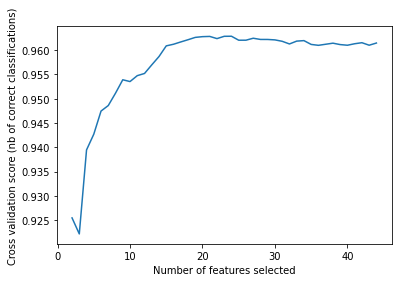

In [ ]:

Features_model_RF=X.copy()
X_train, X_test, Y_train, Y_test= train_test_split(Features_model_RF,Y, train_size=0.75, random_state=3,stratify=Y)
robust = RobustScaler()
X_train=robust.fit_transform(X_train)
X_test=robust.transform(X_test)
dictio={'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}
RF = RandomForestClassifier(criterion=dictio['criterion'],n_estimators=dictio['n_estimators'],random_state=3,n_jobs=-1)
rfecv = RFECV(estimator=RF, step=1, cv=5,
              scoring='roc_auc',
              min_features_to_select=2,
              n_jobs=-1)
rfecv.fit(X_train, Y_train)
print("Optimal number of features : %d" % rfecv.n_features_)
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Cross validation score (nb of correct classifications)")
plt.plot(range(2,len(rfecv.grid_scores_) + 2),rfecv.grid_scores_)
plt.show()

1 features
test score 0.7279852466574458
train score 0.7288218707858282
2 features
test score 0.7224527431996312
train score 0.7416942503371338
3 features
test score 0.7533425541724297
train score 0.7643741571656246
4 features
test score 0.7565343659244917
train score 0.7909200968523002
5 features
test score 0.7801532876159741
train score 0.8246463616668791
6 features
test score 0.7826718296224588
train score 0.8317191283292978
7 features
test score 0.7913843175217812
train score 0.8576271186440678
8 features
test score 0.805901337021669
train score 0.8815741081279882
9 features
test score 0.8247821878025169
train score 0.9023002421307506
10 features
test score 0.8433684210526315
train score 0.9135957741164633
11 features
test score 0.8455953533397871
train score 0.9150121065375303
12 features
test score 0.8470474346563408
train score 0.9150121065375303
13 features
test score 0.8470474346563408
train score 0.9150121065375303
14 features
test score 0.8470474346563408
train score 0.91501

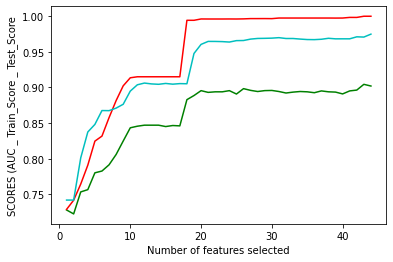

best number of features is  43


In [ ]:
All_features=['Latitude','Longitude','Gender_Male','Gender_Female','Multiple Lines_No phone service','Phone Service','Multiple Lines_No','Multiple Lines_Yes','Streaming Movies_Yes','Streaming TV_Yes','Device Protection_Yes','Online Backup_Yes','Payment Method_Mailed check','Payment Method_Bank transfer (automatic)','Internet Service_DSL','Streaming TV_No','Streaming Movies_No','Payment Method_Credit card (automatic)','Partner','Senior Citizen_No','Senior Citizen_Yes','Tech Support_Yes','Online Security_Yes','Contract_One year','Paperless Billing','Monthly Charges','Total Charges','Device Protection_No internet service','Streaming Movies_No internet service','Streaming TV_No internet service','Tech Support_No internet service','Online Security_No internet service','Online Backup_No internet service','Internet Service_No','Dependents','Device Protection_No','Online Backup_No','Payment Method_Electronic check','Contract_Two year','Internet Service_Fiber optic','Tech Support_No','Online Security_No','Tenure Months','Contract_Month-to-month']
best_features=[[0.7418904212083595, 4, {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'gini'}],[0.7418904212083595, 4, {'n_jobs': -1, 'n_estimators': 100, 'criterion': 'gini'}], [0.8011601510024319, 4, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.837489187874676, 5, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.8481299955739541, 1, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.8675874271030812, 5, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.8674506062755777, 5, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.871011954359175, 4, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.8764011249295982, 5, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.8948807791478388, 2, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9037554505762876, 5, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}], [0.9061746489749216, 5, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9049840266369535, 5, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9044512688257493, 5, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9056493881953613, 5, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9046265119404286, 5, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9054085460537968, 5, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9052056576349303, 5, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9477203869592883, 5, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}], [0.9604789892993829, 1, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9646720038207671, 0, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9646243042309837, 0, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9643810063233456, 0, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9637640266604182, 1, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9657531945225272, 0, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9659204222968576, 1, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9679085630971906, 1, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9688272930823506, 1, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9689927922868109, 2, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}], [0.9692523644296659, 0, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'entropy'}], [0.9699246040863564, 2, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9687488476452251, 2, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9687470747917253, 2, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9679492907167718, 2, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9672876617906103, 2, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9671543432074183, 2, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9676801715554875, 2, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'entropy'}], [0.9690427867555079, 2, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9682737728455535, 0, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}], [0.9683066979823508, 2, {'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}], [0.968305988840951, 2, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9711164700981542, 1, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9707584810851624, 1, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'entropy'}], [0.9748797160344422, 0, {'n_jobs': -1, 'n_estimators': 300, 'criterion': 'gini'}]]
Features_model_RF=X.copy()
liste_score_test=[]
liste_score_train=[]
liste_score_auc=[]
for i in np.arange(len(best_features)):
  print(i+1,'features')
  Features_model_RF=X.copy()
  To_drop=All_features[:(len(Features_model_RF.columns)-(i+1))]
  Features_model_RF=Features_model_RF.drop(To_drop,axis=1)
  train_size=best_features[i][1]*0.01+0.75
  X_train, X_test, Y_train, Y_test= train_test_split(Features_model_RF,Y, train_size=train_size, random_state=3,stratify=Y)
  robust = RobustScaler()
  X_train=robust.fit_transform(X_train)
  X_test=robust.transform(X_test)
  dictio=best_features[i][2]
  final_model = RandomForestClassifier(criterion=dictio['criterion'],n_estimators=dictio['n_estimators'],random_state=3,n_jobs=-1)
  final_model.fit(X_train, Y_train)
  score_test=final_model.score(X_test, Y_test)
  score_train=final_model.score(X_train,Y_train)
  knn_auroc = best_features[i][0]
  print('test score',score_test)
  print('train score',score_train)
  liste_score_test.append(score_test)
  liste_score_train.append(score_train)
  liste_score_auc.append(knn_auroc)

x_axes=np.arange(1,len(All_features)+1)
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("SCORES (AUC _ Train_Score _ Test_Score")
plt.plot(x_axes,liste_score_test,'g')
plt.plot(x_axes,liste_score_train,'r')
plt.plot(x_axes,liste_score_auc,'c')
plt.show()
var=liste_score_test.index(max(liste_score_test))+1
print('best number of features is ',var)


optimal features using self loops

In [ ]:
Features_model_RF=X.copy()

In [ ]:
To_drop=All_features[:(len(Features_model_RF.columns)-idx_max_2x2_RF(Liste_fin)[2]-1)]
Features_model_RF=Features_model_RF.drop(To_drop,axis=1)

In [ ]:
To_drop=All_features[:(len(Features_model_RF.columns)-43)]
Features_model_RF=Features_model_RF.drop(To_drop,axis=1)

In [ ]:
X_train, X_test, Y_train, Y_test= train_test_split(Features_model_RF,Y, train_size=0.75, random_state=3,stratify=Y)

In [ ]:
robust = RobustScaler()
X_train=robust.fit_transform(X_train)
X_test=robust.transform(X_test)

In [ ]:
dictio=idx_max_2x2_RF(Liste_fin)[3]

In [ ]:
dictio={'n_jobs': -1, 'n_estimators': 200, 'criterion': 'gini'}

In [ ]:
final_model = RandomForestClassifier(criterion=dictio['criterion'],n_estimators=dictio['n_estimators'],random_state=3,n_jobs=-1)
final_model.fit(X_train, Y_train)
print(final_model.score(X_test, Y_test))
print(final_model.score(X_train, Y_train))

0.9016266460108443
1.0


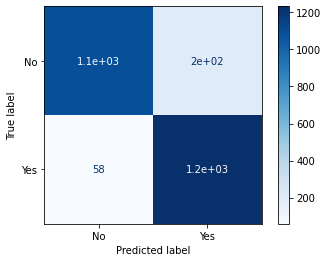

In [ ]:
labels=['No','Yes']
plot_confusion_matrix(final_model, X_test, Y_test,display_labels=labels, cmap=plt.cm.Blues)
plt.show()

In [ ]:
knn_pred_prob =final_model.predict_proba(X_test)[:,1]
knn_auroc = roc_auc_score(Y_test, knn_pred_prob)
print("RandomForest AUROC: {}".format(knn_auroc))
knn_y_pred = final_model.predict(X_test)
print(classification_report(Y_test, knn_y_pred,digits=6))

RandomForest AUROC: 0.9720129406887101
              precision    recall  f1-score   support

           0   0.949696  0.848180  0.896072      1291
           1   0.862841  0.955074  0.906618      1291

    accuracy                       0.901627      2582
   macro avg   0.906269  0.901627  0.901345      2582
weighted avg   0.906269  0.901627  0.901345      2582



In [ ]:
pickle.dump(final_model,open('/content/drive/MyDrive/ML project/model_RF.pkl','wb'))

##with all features

In [ ]:
Features_model_RF=X.copy()

In [ ]:
Features_model_RF.columns

Index(['Latitude', 'Longitude', 'Partner', 'Dependents', 'Tenure Months',
       'Phone Service', 'Paperless Billing', 'Monthly Charges',
       'Total Charges', 'Gender_Female', 'Gender_Male', 'Senior Citizen_No',
       'Senior Citizen_Yes', 'Multiple Lines_No',
       'Multiple Lines_No phone service', 'Multiple Lines_Yes',
       'Internet Service_DSL', 'Internet Service_Fiber optic',
       'Internet Service_No', 'Online Security_No',
       'Online Security_No internet service', 'Online Security_Yes',
       'Online Backup_No', 'Online Backup_No internet service',
       'Online Backup_Yes', 'Device Protection_No',
       'Device Protection_No internet service', 'Device Protection_Yes',
       'Tech Support_No', 'Tech Support_No internet service',
       'Tech Support_Yes', 'Streaming TV_No',
       'Streaming TV_No internet service', 'Streaming TV_Yes',
       'Streaming Movies_No', 'Streaming Movies_No internet service',
       'Streaming Movies_Yes', 'Contract_Month-to-month',

In [ ]:
Features_model_RF.shape

(10326, 44)

In [ ]:
X_train, X_test, Y_train, Y_test= train_test_split(Features_model_RF,Y, train_size=0.8, random_state=6,stratify=Y)

In [ ]:
robust = RobustScaler()
X_train=robust.fit_transform(X_train)
X_test=robust.transform(X_test)

In [ ]:
model_RF = RandomForestClassifier(n_estimators=1000,random_state=3)

In [ ]:
model_RF.fit(X_train, Y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=1000,
                       n_jobs=None, oob_score=False, random_state=3, verbose=0,
                       warm_start=False)

In [ ]:
print('Le train score est :', model_RF.score(X_train, Y_train))
print('Le test score est :', model_RF.score(X_test, Y_test))

Le train score est : 1.0
Le test score est : 0.9075508228460794


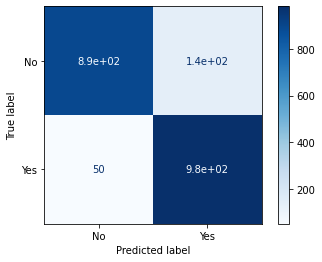

In [ ]:
labels=['No','Yes']
plot_confusion_matrix(model_RF, X_test, Y_test,display_labels=labels, cmap=plt.cm.Blues)
plt.show()

In [ ]:
from sklearn.metrics import confusion_matrix
Y_pred = model_RF.predict(X_test)
print(confusion_matrix(Y_test, Y_pred))


[[892 141]
 [ 50 983]]


In [ ]:
Y_pred = model_RF.predict(X_test)
dt_auroc = roc_auc_score(Y_test, Y_pred)
print("Random Forest AUROC: {}".format(dt_auroc))
print(classification_report(Y_test, Y_pred, digits=8))


Random Forest AUROC: 0.9075508228460794
              precision    recall  f1-score   support

           0  0.94692144 0.86350436 0.90329114      1033
           1  0.87455516 0.95159729 0.91145109      1033

    accuracy                      0.90755082      2066
   macro avg  0.91073830 0.90755082 0.90737111      2066
weighted avg  0.91073830 0.90755082 0.90737111      2066



#XGBoost

##loop

In [ ]:
Features_modelxg1=X.copy()

In [ ]:
Features_modelxg1.columns

Index(['Latitude', 'Longitude', 'Partner', 'Dependents', 'Tenure Months',
       'Phone Service', 'Paperless Billing', 'Monthly Charges',
       'Total Charges', 'Gender_Female', 'Gender_Male', 'Senior Citizen_No',
       'Senior Citizen_Yes', 'Multiple Lines_No',
       'Multiple Lines_No phone service', 'Multiple Lines_Yes',
       'Internet Service_DSL', 'Internet Service_Fiber optic',
       'Internet Service_No', 'Online Security_No',
       'Online Security_No internet service', 'Online Security_Yes',
       'Online Backup_No', 'Online Backup_No internet service',
       'Online Backup_Yes', 'Device Protection_No',
       'Device Protection_No internet service', 'Device Protection_Yes',
       'Tech Support_No', 'Tech Support_No internet service',
       'Tech Support_Yes', 'Streaming TV_No',
       'Streaming TV_No internet service', 'Streaming TV_Yes',
       'Streaming Movies_No', 'Streaming Movies_No internet service',
       'Streaming Movies_Yes', 'Contract_Month-to-month',

In [ ]:
Features_modelxg1

,Latitude,Longitude,Partner,Dependents,Tenure Months,Phone Service,Paperless Billing,Monthly Charges,Total Charges,Gender_Female,Gender_Male,Senior Citizen_No,Senior Citizen_Yes,Multiple Lines_No,Multiple Lines_No phone service,Multiple Lines_Yes,Internet Service_DSL,Internet Service_Fiber optic,Internet Service_No,Online Security_No,Online Security_No internet service,Online Security_Yes,Online Backup_No,Online Backup_No internet service,Online Backup_Yes,Device Protection_No,Device Protection_No internet service,Device Protection_Yes,Tech Support_No,Tech Support_No internet service,Tech Support_Yes,Streaming TV_No,Streaming TV_No internet service,Streaming TV_Yes,Streaming Movies_No,Streaming Movies_No internet service,Streaming Movies_Yes,Contract_Month-to-month,Contract_One year,Contract_Two year,Payment Method_Bank transfer (automatic),Payment Method_Credit card (automatic),Payment Method_Electronic check,Payment Method_Mailed check
1869,33.973616,-118.249020,1,0,1,0,1,29.85,29.85,1,0,1,0,0,1,0,1,0,0,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0
1870,33.949255,-118.246978,0,0,34,1,0,56.95,1889.50,0,1,1,0,1,0,0,1,0,0,0,0,1,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1
1871,34.076259,-118.310715,0,0,45,0,0,42.30,1840.75,0,1,1,0,0,1,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,1,1,0,0,1,0,0,0,1,0,1,0,0,0
1872,34.027337,-118.285150,0,1,22,1,1,89.10,1949.40,0,1,1,0,0,0,1,0,1,0,1,0,0,0,0,1,1,0,0,1,0,0,0,0,1,1,0,0,1,0,0,0,1,0,0
1873,34.008293,-118.346766,0,0,10,0,0,29.75,301.90,1,0,1,0,0,1,0,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
673,38.013825,-122.039144,0,0,1,1,1,69.75,69.75,0,1,0,1,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0
1410,34.264124,-114.717964,0,0,2,1,1,80.25,144.55,0,1,1,0,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,1,0,0,1,0,0,0,0,1,0
728,37.286820,-121.723877,0,0,4,1,1,98.10,396.30,1,0,1,0,1,0,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,1,1,0,0,1,0,0,0
448,33.927254,-118.249826,1,0,21,1,1,104.40,2200.25,1,0,1,0,0,0,1,0,1,0,0,0,1,1,0,0,0,0,1,1,0,0,0,0,1,0,0,1,1,0,0,1,0,0,0


In [ ]:
len(Features_modelxg1.columns)

44

In [ ]:
All_features=['Latitude','Longitude','Gender_Male','Gender_Female','Multiple Lines_No phone service','Phone Service','Multiple Lines_No','Multiple Lines_Yes','Streaming Movies_Yes','Streaming TV_Yes','Device Protection_Yes','Online Backup_Yes','Payment Method_Mailed check','Payment Method_Bank transfer (automatic)','Internet Service_DSL','Streaming TV_No','Streaming Movies_No','Payment Method_Credit card (automatic)','Partner','Senior Citizen_No','Senior Citizen_Yes','Tech Support_Yes','Online Security_Yes','Contract_One year','Paperless Billing','Monthly Charges','Total Charges','Device Protection_No internet service','Streaming Movies_No internet service','Streaming TV_No internet service','Tech Support_No internet service','Online Security_No internet service','Online Backup_No internet service','Internet Service_No','Dependents','Device Protection_No','Online Backup_No','Payment Method_Electronic check','Contract_Two year','Internet Service_Fiber optic','Tech Support_No','Online Security_No','Tenure Months','Contract_Month-to-month']

In [ ]:
len(All_features)

44

In [ ]:
def idx_max(liste):
	max = liste[0]
	a = 0  
	for i in range(len(liste)):
		if liste[i] > max:
			max  = liste [i]
			a = i
	return [max,a]

In [ ]:
def idx_max_2x2(liste):
	  
  a = 0
  b =liste[0][1]
  max = liste[0][0]
  for i in np.arange(len(liste)):
    if liste[i][0]>max:
      max=liste[i][0]
      b=liste[i][1]
      a=i
  return [max,b,a]
   

In [ ]:
def idx_max_xgb(liste):
  max = liste[0][0]
  param=liste[0][1]
  a = 0  
  for i in range(len(liste)):
    if liste[i][0]>max:
      max =liste [i][0]
      param=liste[i][1]
      a=i
  return [max,a,param]

In [ ]:
def idx_max_2x2_xgb(liste):
	  
  a = 0
  b =liste[0][1]
  max = liste[0][0]
  param=liste[0][2]
  for i in np.arange(len(liste)):
    if liste[i][0]>max:
      max=liste[i][0]
      b=liste[i][1]
      param=liste[i][2]
      a=i
  return [max,b,a,param]

In [ ]:
def Best_XGBoost(liste,n):
  X_train, X_test, Y_train, Y_test= train_test_split(liste,Y, train_size=n, random_state=6,stratify=Y)
  robust = RobustScaler()
  X_train=robust.fit_transform(X_train)
  X_test=robust.transform(X_test)
  xgb=XGBClassifier(random_state=0)
  params_distributions={'silent': [False],
                        'max_depth': [3,6, 10, 15, 20],
                        'gamma': [0, 0.25, 0.5, 1.0],
                        'n_estimators': [100,150,200],
                        'n_jobs':[-1]}
  
  xgb_random=RandomizedSearchCV(xgb,param_distributions=params_distributions,n_iter=15,random_state=3,cv=5,n_jobs=-1,verbose=2,scoring='roc_auc')
  start = timeit.default_timer()
  xgb_random.fit(X_train,Y_train)
  stop = timeit.default_timer()
  print('Time: ', stop - start)
  print("Tuned xgboost Parameters (RandomizedSearchCV): {}".format(xgb_random.best_params_))
  print("Best xgboost Training Score (RandomizedSearchCV) :{}".format(xgb_random.best_score_))
  dictio=xgb_random.best_params_
  final_model = XGBClassifier(silent=dictio['silent'],
                              max_depth=dictio['max_depth'],
                              gamma=dictio['gamma'],
                              n_estimators=dictio['n_estimators'],
                              random_state=0,
                              n_jobs=-1)
  final_model.fit(X_train, Y_train)
  print(final_model.score(X_test, Y_test))
  print(final_model.score(X_train, Y_train))
  xgb_pred_prob =final_model.predict_proba(X_test)[:,1]
  xgb_auroc = roc_auc_score(Y_test, xgb_pred_prob)
  print("XGBoost AUROC: {}".format(xgb_auroc))
  return[xgb_auroc,xgb_random.best_params_] 

In [ ]:
def Best_XGBoost(liste,n):
  X_train, X_test, Y_train, Y_test= train_test_split(liste,Y, train_size=n, random_state=6,stratify=Y)
  robust = RobustScaler()
  X_train=robust.fit_transform(X_train)
  X_test=robust.transform(X_test)
  xgb=XGBClassifier(random_state=0)
  params_distributions={'silent': [False],
                        'gamma': [0, 0.25, 0.5, 1.0],
                        'n_estimators': [100,150,200],
                        'n_jobs':[-1]}
  
  xgb_random=RandomizedSearchCV(xgb,param_distributions=params_distributions,n_iter=10,random_state=3,cv=5,n_jobs=-1,verbose=2,scoring='roc_auc')
  start = timeit.default_timer()
  xgb_random.fit(X_train,Y_train)
  stop = timeit.default_timer()
  print('Time: ', stop - start)
  print("Tuned xgboost Parameters (RandomizedSearchCV): {}".format(xgb_random.best_params_))
  print("Best xgboost Training Score (RandomizedSearchCV) :{}".format(xgb_random.best_score_))
  dictio=xgb_random.best_params_
  final_model = XGBClassifier(silent=dictio['silent'],
                              gamma=dictio['gamma'],
                              n_estimators=dictio['n_estimators'],
                              random_state=0,
                              n_jobs=-1)
  final_model.fit(X_train, Y_train)
  print(final_model.score(X_test, Y_test))
  print(final_model.score(X_train, Y_train))
  xgb_pred_prob =final_model.predict_proba(X_test)[:,1]
  xgb_auroc = roc_auc_score(Y_test, xgb_pred_prob)
  print("XGBoost AUROC: {}".format(xgb_auroc))
  return[xgb_auroc,xgb_random.best_params_] 

In [ ]:
def best_auc(liste):
  m=len(liste)
  val_max=liste[0][0]
  indice=0
  for i in range(m):
    if liste[i][0]>val_max:
      val_max=liste[i][0]
      indice=i

  return [indice,val_max]

In [ ]:
final_list=[]

In [ ]:
start = timeit.default_timer()
Liste_fin=[]
for j in np.arange(len(All_features)-1,-1,-1):
  print(j)
  Features_modelxg1=X.copy()
  L=[]
  To_drop=All_features[:j]
  Features_modelxg1=Features_modelxg1.drop(To_drop,axis=1)
  for k in np.arange (0.8,0.83,0.01):
    var=Best_XGBoost(Features_modelxg1,k)
    L.append(var)
    print('-------')
  print(L)
  print('when we have '+str(j)+' features')
  print(idx_max_xgb(L))
  Liste_fin.append(idx_max_xgb(L))
print(Liste_fin)
stop = timeit.default_timer()
print('Time: ', stop - start)

43
Fitting 5 folds for each of 12 candidates, totalling 60 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   40.5s
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:   45.6s finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[23:22:10] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[23:22:10] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  45.69466997900008
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 100, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.7261501210653754
[23:22:10] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   20.7s
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:   41.5s finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[23:22:52] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[23:22:52] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  41.604685450000034
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 100, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.7272873042822109
[23:22:52] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   10.3s
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:   16.8s finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[23:23:09] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[23:23:09] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  16.85708553799998
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 100, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.7284558768117761
[23:23:09] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   46.7s
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  1.4min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[23:24:31] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[23:24:31] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  82.55089897199991
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 100, 'gamma': 1.0}
Best xgboost Training Score (RandomizedSearchCV) :0.7899030597588073
[23:24:31] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or som

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  1.6min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[23:26:11] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[23:26:11] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  99.20471459499993
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 100, 'gamma': 0.5}
Best xgboost Training Score (RandomizedSearchCV) :0.7899586865410153
[23:26:11] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or som

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  2.8min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[23:28:57] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[23:28:57] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  166.548565866
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 100, 'gamma': 1.0}
Best xgboost Training Score (RandomizedSearchCV) :0.7902738045306308
[23:28:58] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some pa

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  2.3min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[23:31:18] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[23:31:18] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  140.4978614889999
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 100, 'gamma': 1.0}
Best xgboost Training Score (RandomizedSearchCV) :0.820808148022208
[23:31:18] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.1min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[23:34:26] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[23:34:26] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  188.09646992999978
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 100, 'gamma': 1.0}
Best xgboost Training Score (RandomizedSearchCV) :0.8230659269904483
[23:34:27] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or so

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.8min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[23:38:16] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[23:38:16] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  229.27570901900003
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 100, 'gamma': 1.0}
Best xgboost Training Score (RandomizedSearchCV) :0.8241161199720137
[23:38:16] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or so

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.3min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[23:41:37] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[23:41:37] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  200.50459632000002
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 100, 'gamma': 0.5}
Best xgboost Training Score (RandomizedSearchCV) :0.833212072533696
[23:41:37] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or som

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.9min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[23:45:31] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[23:45:31] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  233.96829728600005
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 100, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.8340584241657851
[23:45:31] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or s

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.3min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[23:48:47] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[23:48:47] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  195.37985010199986
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 100, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.8356522114663832
[23:48:47] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or s

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.0min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[23:51:46] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[23:51:46] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  178.78711119199988
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 100, 'gamma': 0.5}
Best xgboost Training Score (RandomizedSearchCV) :0.8578450656332628
[23:51:46] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or so

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.3min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[23:55:05] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[23:55:05] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  198.91733993299977
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8583775223293282
[23:55:06] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  2.7min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[23:57:49] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[23:57:49] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  162.68503739499965
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 100, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8598346127750169
[23:57:49] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.5min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[00:01:21] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[00:01:21] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  211.7129247150001
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 100, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8611702595430589
[00:01:21] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.1min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[00:05:29] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[00:05:29] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  248.063982185
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 150, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8622557174794769
[00:05:30] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some para

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.6min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[00:09:06] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[00:09:06] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  216.68267773399975
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8636027105514362
[00:09:07] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.6min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[00:13:45] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[00:13:45] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  277.28782858600016
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 150, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8646450996370969
[00:13:45] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  2.7min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[00:16:27] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[00:16:27] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  161.54144084699965
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.8674960740950253
[00:16:27] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or s

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.1min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[00:19:34] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[00:19:34] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  186.33499423900003
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 150, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8688809663348313
[00:19:35] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.7min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[00:24:20] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[00:24:20] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  285.5621697950005
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.8689395493905693
[00:24:21] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or so

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.4min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[00:27:47] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[00:27:47] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  205.99358846700034
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8718828624599599
[00:27:48] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.0min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[00:30:48] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[00:30:48] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  179.43646678999994
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 150, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.8732180904076706
[00:30:48] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or s

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.4min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[00:35:13] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[00:35:13] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  265.26772760699987
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 150, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8756441674630209
[00:35:14] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.7min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[00:38:59] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[00:38:59] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  225.46652320900012
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8773270527537858
[00:39:00] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.4min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[00:42:28] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[00:42:28] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  207.67283939900062
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8788072084278516
[00:42:29] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.8min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[00:46:17] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[00:46:17] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  227.5836789269997
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.884141022108355
[00:46:18] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some p

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.4min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[00:50:43] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[00:50:43] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  265.1610887979996
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8842985767729473
[00:50:44] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.2min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[00:54:56] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[00:54:56] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  251.6621280620002
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.8862997261484127
[00:54:57] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or so

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.3min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[00:58:18] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[00:58:18] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  200.5899848580002
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 150, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8828156054148174
[00:58:18] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.2min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[01:01:31] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[01:01:31] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  192.5630579360004
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8842534583370361
[01:01:32] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.6min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[01:05:06] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[01:05:06] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  214.33543334000024
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8866258130902489
[01:05:07] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  2.4min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[01:07:30] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[01:07:30] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  142.70884241600015
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 150, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8828156054148174
[01:07:31] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.1min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[01:10:39] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[01:10:39] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  188.24109122000027
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8842534583370361
[01:10:40] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.0min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[01:13:41] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[01:13:41] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  180.84016671399968
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8866258130902489
[01:13:42] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.0min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[01:18:46] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[01:18:46] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  303.29844102599964
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 150, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8828156054148174
[01:18:47] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.7min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[01:22:31] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[01:22:31] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  224.61390322999978
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8842534583370361
[01:22:33] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  2.9min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[01:25:27] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[01:25:27] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  174.77618930500012
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8866258130902489
[01:25:29] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.2min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[01:28:43] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[01:28:43] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  194.17654336000032
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 150, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8828156054148174
[01:28:44] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.1min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[01:31:53] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[01:31:53] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  189.67311946799964
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8842534583370361
[01:31:55] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.5min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[01:35:23] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[01:35:23] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  208.62462611800038
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8866258130902489
[01:35:24] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.6min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[01:39:02] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[01:39:02] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  217.09501503499996
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 150, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8828156054148174
[01:39:03] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.2min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[01:42:13] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[01:42:13] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  190.4515438849994
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8842534583370361
[01:42:14] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.1min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[01:46:19] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[01:46:19] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  244.65529017799963
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8866258130902489
[01:46:20] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.2min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[01:50:33] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[01:50:33] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  252.4207445939992
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 150, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8828156054148174
[01:50:34] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.5min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[01:55:07] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[01:55:07] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  273.57787954800006
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8842534583370361
[01:55:09] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.3min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[01:59:28] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[01:59:28] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  259.599037547001
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8866258130902489
[01:59:30] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some p

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.0min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[02:03:30] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[02:03:30] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  240.36475074999908
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 150, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8828156054148174
[02:03:31] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.9min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[02:09:24] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[02:09:24] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  352.55592212900046
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8842534583370361
[02:09:25] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.3min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[02:14:45] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[02:14:45] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  319.4957498189997
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8866258130902489
[02:14:46] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.4min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[02:19:09] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[02:19:09] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  263.0738391349987
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9166800532335888
[02:19:10] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.8min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[02:23:57] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[02:23:57] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  286.8523203879995
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9139459895267625
[02:23:59] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.7min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[02:28:40] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[02:28:40] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  280.826761362001
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9186101726060713
[02:28:41] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some p

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.2min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[02:31:53] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[02:31:53] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  192.0303994799997
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.927884170042622
[02:31:55] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some p

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.3min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[02:37:12] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[02:37:12] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  317.4300576650003
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9258956402365067
[02:37:14] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.1min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[02:40:22] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[02:40:22] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  187.91116214300018
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9277519420944046
[02:40:23] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.2min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[02:44:35] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[02:44:35] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  251.27200845799962
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9313829007615686
[02:44:37] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.4min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[02:48:04] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[02:48:04] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  207.63770831300099
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9285268603657062
[02:48:06] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.1min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[02:53:16] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[02:53:17] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  310.5425482209994
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9293759503412871
[02:53:18] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.8min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[02:57:07] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[02:57:07] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  228.5700686500004
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.930857453581835
[02:57:09] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some p

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.4min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[03:00:35] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[03:00:35] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  206.38690282199968
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9273269537753579
[03:00:37] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.8min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[03:05:24] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[03:05:24] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  287.38926070100024
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9286118580777852
[03:05:26] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  6.2min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[03:11:41] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[03:11:41] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  374.64926036699944
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9312981843125069
[03:11:42] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.2min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[03:15:54] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[03:15:54] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  251.4624877139995
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9269501352082932
[03:15:56] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.5min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[03:20:28] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[03:20:28] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  271.74941245300033
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9289033102696755
[03:20:29] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.3min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[03:24:52] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[03:24:52] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  262.27372709500014
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9296095714930616
[03:24:54] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.8min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[03:28:42] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[03:28:42] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  228.74065586600045
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9279163913391093
[03:28:44] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.9min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[03:34:42] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[03:34:42] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  358.2006440690002
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.930768684702697
[03:34:44] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some p

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.1min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[03:38:55] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[03:38:55] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  250.27059891499994
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9294386729124284
[03:38:56] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.2min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[03:44:11] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[03:44:11] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  314.35855788900153
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9286526942563957
[03:44:13] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.0min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[03:49:18] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[03:49:18] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  304.95557835900036
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9315259479849944
[03:49:20] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.8min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[03:53:08] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[03:53:08] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  228.20606672100257
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9294386729124284
[03:53:10] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.0min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[03:58:14] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[03:58:14] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  303.6389323819967
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9286526942563957
[03:58:16] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.5min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[04:01:49] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[04:01:49] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  212.98179253600028
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9315259479849944
[04:01:51] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.5min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[04:06:23] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[04:06:23] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  272.00124169600167
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9330574430289207
[04:06:25] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.6min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[04:11:04] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[04:11:04] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  279.2956584450003
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9306108179982072
[04:11:06] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.4min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[04:14:32] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[04:14:32] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  205.491165868003
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9340883531864785
[04:14:34] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some p

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.7min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[04:19:18] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[04:19:18] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  284.7786277439991
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9351848811917758
[04:19:20] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.9min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[04:23:15] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[04:23:15] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  234.12245533199894
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9313103877815477
[04:23:17] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.4min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[04:26:42] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[04:26:42] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  205.46109326000078
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9333170132759765
[04:26:44] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  6.5min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[04:33:18] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[04:33:18] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  393.60562744900017
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9339742274387491
[04:33:20] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.3min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[04:38:42] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[04:38:42] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  321.84525552099876
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9325056623866137
[04:38:44] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.3min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[04:43:02] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[04:43:02] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  258.08874667000055
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9349214813142568
[04:43:04] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.9min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[04:49:02] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[04:49:02] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  358.2776728460012
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9336280332299538
[04:49:05] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  6.5min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[04:55:38] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[04:55:38] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  392.9687842739986
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9321283826040083
[04:55:39] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.9min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[05:00:38] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[05:00:38] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  298.04711648100056
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9337476467184459
[05:00:40] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.5min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[05:05:14] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[05:05:14] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  274.2019125520019
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9333448633690764
[05:05:16] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  6.0min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[05:11:17] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[05:11:17] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  360.4394548620003
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9326751949967338
[05:11:19] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.9min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[05:16:16] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[05:16:16] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  296.7066258119994
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.9332955011695999
[05:16:18] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or so

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.7min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[05:21:04] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[05:21:04] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  286.33494365799925
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9334467283035017
[05:21:06] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.7min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[05:26:49] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[05:26:49] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  342.72886104200006
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9335067708903015
[05:26:51] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.5min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[05:32:25] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[05:32:25] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  333.46702688500227
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.935549154763517
[05:32:27] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.6min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[05:38:06] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[05:38:07] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  339.19688243100245
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9347705327462785
[05:38:09] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.0min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[05:43:09] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[05:43:09] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  299.8850712400017
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9334994652908399
[05:43:11] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  7.3min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[05:50:32] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[05:50:32] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  441.3878720749999
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9347558875408906
[05:50:35] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.2min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[05:54:51] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[05:54:51] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  256.0142929470021
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9344423664323529
[05:54:53] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  6.3min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[06:01:15] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:01:15] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  381.76212617499914
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9322475063043276
[06:01:17] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  6.0min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[06:07:20] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:07:20] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  362.68549632600116
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9350272744207191
[06:07:22] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.6min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[06:12:58] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:12:58] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  335.68229604500084
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9345279622909203
[06:13:00] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  6.1min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[06:19:07] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:19:07] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  366.95966096600023
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9327023612416806
[06:19:09] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  6.2min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[06:25:22] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:25:22] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  372.7225387840008
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9357230519927853
[06:25:25] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.0min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[06:30:29] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:30:29] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  304.3389306050012
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9341886567899207
[06:30:31] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.1min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[06:35:42] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:35:42] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  310.4035385660027
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9342185818606096
[06:35:44] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.4min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[06:41:13] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:41:13] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  328.9891862450022
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.934932191974912
[06:41:16] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some p

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.3min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[06:46:37] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:46:37] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  321.7176141710006
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9351926493090772
[06:46:40] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  8.6min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[06:55:20] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:55:20] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  520.0594852679969
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9325194113278694
[06:55:22] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.1min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[06:59:33] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[06:59:33] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  250.3002585960021
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9338662644100657
[06:59:35] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.9min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[07:05:30] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[07:05:30] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  354.3565332040016
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9351439886497547
[07:05:32] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.8min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[07:10:23] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[07:10:23] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  290.8834898009991
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.933350517971378
[07:10:26] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some p

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  6.6min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[07:17:03] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[07:17:03] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  397.6068444599987
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9356721136619013
[07:17:06] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  7.8min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[07:24:54] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[07:24:54] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  468.3409525310017
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.9361576546734753
[07:24:57] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or so

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  6.8min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[07:31:47] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[07:31:47] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  409.8156250300017
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.9332099340726403
[07:31:49] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or so

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  6.4min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[07:38:14] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[07:38:14] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  384.43226399099876
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9364667700113773
[07:38:16] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  7.7min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[07:46:00] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[07:46:00] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  463.9628467599978
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9355161254389719
[07:46:03] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  7.9min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[07:53:59] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[07:53:59] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  475.9256511599997
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9326052167354735
[07:54:01] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  6.5min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[08:00:33] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[08:00:33] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  391.02783628799807
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9351935097858245
[08:00:35] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  6.3min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[08:06:55] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[08:06:55] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  379.88860261100126
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9355161254389719
[08:06:58] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  7.6min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[08:14:39] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[08:14:39] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  461.61457309600155
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9326052167354735
[08:14:42] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.5min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[08:20:12] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[08:20:12] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  330.13545341200006
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9351935097858245
[08:20:15] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  6.3min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[08:26:34] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[08:26:34] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  378.9322731249995
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9379978190644256
[08:26:36] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  6.5min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[08:33:08] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[08:33:08] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  391.7276512499957
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9356339012377042
[08:33:11] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  6.6min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[08:39:50] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[08:39:50] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  399.47250175799854
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9364696665657617
[08:39:53] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.2min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[08:45:08] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[08:45:08] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  314.4496751369952
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9379978190644256
[08:45:10] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.8min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[08:50:59] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[08:50:59] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  348.7850480740017
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9356339012377042
[08:51:02] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.7min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[08:56:47] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[08:56:47] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  344.7988792810065
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9364696665657617
[08:56:49] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  7.1min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[09:03:56] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[09:03:56] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  426.9024314940034
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9463551407348346
[09:03:59] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  7.7min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[09:11:43] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[09:11:43] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  464.20672362399637
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9454720945520169
[09:11:46] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  6.8min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[09:18:40] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[09:18:40] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  413.2075073590022
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9455486566154778
[09:18:43] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.8min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[09:24:32] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[09:24:32] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  349.28714064200176
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9493767917968681
[09:24:35] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  7.7min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[09:32:22] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[09:32:22] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  467.1937936320028
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.9471727648045265
[09:32:25] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or so

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  6.6min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[09:39:07] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[09:39:07] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  401.48177700999804
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9491838712523164
[09:39:10] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

In [ ]:
print('between 0.8 and 0.82')
print(idx_max_2x2_xgb(Liste_fin))
print('the best auc is ',idx_max_2x2_xgb(Liste_fin)[0])
print('the best percentage of train set is ',(idx_max_2x2_xgb(Liste_fin)[1]*0.01+0.8))
print('the best number of columns is ',idx_max_2x2_xgb(Liste_fin)[2]+1)
print('the best params are ',idx_max_2x2_xgb(Liste_fin)[3])

between 0.8 and 0.82
[0.9519400723844795, 1, 43, {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}]
the best auc is  0.9519400723844795
the best percentage of train set is  0.81
the best number of columns is  44
the best params are  {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}


In [ ]:
between 0.8 and 0.82
[0.9519400723844795, 1, 43, {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}]
the best auc is  0.9519400723844795
the best percentage of train set is  0.81
the best number of columns is  44
the best params are  {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}

In [ ]:
var=[0.9519400723844795, 1, 43, {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}]
final_list.append(var)

In [ ]:
start = timeit.default_timer()
Liste_fin=[]
for j in np.arange(len(All_features)-1,-1,-1):
  print(j)
  Features_model1=X.copy()
  L=[]
  To_drop=All_features[:j]
  Features_model1=Features_model1.drop(To_drop,axis=1)
  for k in np.arange (0.83,0.86,0.01):
    var = Best_XGBoost(Features_model1,k)
    L.append(var)
    print('-------')
  print(L)
  print('when we have '+str(j)+' features')
  print(idx_max_xgb(L))
  Liste_fin.append(idx_max_xgb(L))
print(Liste_fin)
stop = timeit.default_timer()
print('Time: ', stop - start)

43
Fitting 5 folds for each of 12 candidates, totalling 60 fits


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   14.2s
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:   19.7s finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search

[10:07:29] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[10:07:29] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  19.78009319800003
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 100, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.7282380396732788
[10:07:29] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    7.3s
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:   12.6s finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[10:07:42] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[10:07:42] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  12.653005015000076
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 100, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.7282187637863494
[10:07:42] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   13.3s
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:   29.0s finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[10:08:11] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[10:08:11] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  29.052162350000003
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 100, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.7285888681386898
[10:08:11] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   25.7s
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:   30.8s finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


[10:08:42] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[10:08:42] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  30.89618721399995
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 100, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.729054054054054
[10:08:42] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some p

[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   35.3s
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:   52.2s finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:09:34] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[10:09:34] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  52.42518837600005
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 100, 'gamma': 1.0}
Best xgboost Training Score (RandomizedSearchCV) :0.7907051408606995
[10:09:35] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or som

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   38.1s
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  1.2min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:10:49] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[10:10:49] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  74.17562422899994
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 100, 'gamma': 1.0}
Best xgboost Training Score (RandomizedSearchCV) :0.7906936062322518
[10:10:49] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or som

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  1.6min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:12:25] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[10:12:25] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  95.97502798899995
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 100, 'gamma': 0.5}
Best xgboost Training Score (RandomizedSearchCV) :0.7914254243275224
[10:12:25] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or som

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   35.2s
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  1.5min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:13:53] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[10:13:53] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  87.50964051799997
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 100, 'gamma': 1.0}
Best xgboost Training Score (RandomizedSearchCV) :0.792048636474312
[10:13:53] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  2.5min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:16:22] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[10:16:22] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  148.97204571999987
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 100, 'gamma': 1.0}
Best xgboost Training Score (RandomizedSearchCV) :0.8237512747651641
[10:16:22] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or so

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.0min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:20:20] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[10:20:20] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  237.36532597299993
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 100, 'gamma': 1.0}
Best xgboost Training Score (RandomizedSearchCV) :0.8236886764493303
[10:20:20] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or so

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  2.7min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:23:02] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[10:23:02] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  161.78022287399995
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 100, 'gamma': 0.5}
Best xgboost Training Score (RandomizedSearchCV) :0.8237920689929601
[10:23:02] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or so

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  2.1min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:25:10] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[10:25:10] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  128.22805336300007
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 100, 'gamma': 1.0}
Best xgboost Training Score (RandomizedSearchCV) :0.8250845862754647
[10:25:11] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or so

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.1min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:29:15] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[10:29:15] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  244.670002114
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 100, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.8350340186997327
[10:29:16] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some p

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  2.5min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:31:48] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[10:31:48] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  152.92846046400018
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 100, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8351988691666061
[10:31:49] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.4min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:35:10] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[10:35:10] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  201.438537753
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 100, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.8361865894581053
[10:35:11] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some p

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.0min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:38:12] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[10:38:12] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  180.9886903900001
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 100, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8368811378946515
[10:38:12] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  2.9min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:41:09] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[10:41:09] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  176.6906934970002
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 100, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8589089235603833
[10:41:09] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  2.0min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:43:10] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[10:43:10] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  120.947837575
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 150, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8588609437721366
[10:43:10] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some para

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.0min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:46:08] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[10:46:08] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  177.51914121299978
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 100, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.85835555880087
[10:46:08] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or som

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  1.6min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:47:47] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[10:47:47] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  98.86786692899977
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8597413714390065
[10:47:48] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  2.8min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:50:36] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[10:50:36] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  168.10126015700007
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8628641335205032
[10:50:37] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  2.8min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:53:25] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[10:53:25] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  168.17554161099997
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8627072134628087
[10:53:25] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  1.8min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:55:14] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[10:55:14] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  107.68878121699981
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 100, 'gamma': 0.5}
Best xgboost Training Score (RandomizedSearchCV) :0.8610118379872164
[10:55:14] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or so

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.2min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:58:26] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[10:58:26] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  192.07346011699974
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8637974545491437
[10:58:26] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  2.9min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:01:21] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[11:01:21] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  174.1572672100001
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.867397191636179
[11:01:21] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or som

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  2.7min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:04:06] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[11:04:06] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  164.26300865400026
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8678361195411283
[11:04:07] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  2.5min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:06:38] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[11:06:38] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  151.36247233600034
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 100, 'gamma': 0.5}
Best xgboost Training Score (RandomizedSearchCV) :0.8685208490846478
[11:06:39] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or so

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.3min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:09:56] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[11:09:56] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  197.86486986700038
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8693391871601331
[11:09:57] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.3min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:13:14] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[11:13:14] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  197.08439364700007
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 150, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.8718530490204222
[11:13:15] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or s

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.1min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:16:22] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[11:16:22] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  187.07081267099966
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8723717271653545
[11:16:23] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.3min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:19:41] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[11:19:41] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  198.40956776199982
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.8709858587203744
[11:19:42] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or s

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.1min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:22:49] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[11:22:49] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  186.4233865189999
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8748473135297459
[11:22:50] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   51.2s
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  2.6min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:25:25] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[11:25:25] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  155.00238547000026
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.8756888497363329
[11:25:26] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or s

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.0min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:29:24] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[11:29:24] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  238.26289524000003
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8778845382747974
[11:29:25] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.0min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:32:23] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[11:32:23] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  178.2149509869996
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8770230076365941
[11:32:24] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.7min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:36:09] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[11:36:09] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  224.37381766499948
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.879458597110624
[11:36:10] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.8min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:39:57] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[11:39:57] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  227.71856904699962
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8830967160415495
[11:39:58] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.7min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:43:43] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[11:43:43] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  224.91179127000032
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8849597310543291
[11:43:44] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  1.9min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:45:39] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[11:45:39] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  115.10988030600038
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.8840813566242838
[11:45:40] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or s

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  2.4min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:48:04] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[11:48:04] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  143.96573099999932
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8865911096907718
[11:48:05] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.8min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:51:55] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[11:51:55] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  229.6738054410007
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.8837981942925921
[11:51:56] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or so

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.5min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:55:27] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[11:55:27] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  210.94426787700013
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.8847659297069452
[11:55:28] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or s

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.2min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:59:43] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[11:59:43] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  254.12963687499996
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 150, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8835747210726407
[11:59:44] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.8min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12:04:35] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[12:04:35] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  291.7133201659999
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.887925974961448
[12:04:36] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some p

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.6min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12:09:14] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[12:09:14] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  278.12829166400024
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.8837981942925921
[12:09:15] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or s

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.3min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12:12:33] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[12:12:33] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  197.1551753900003
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.8847659297069452
[12:12:34] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or so

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.5min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12:17:07] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[12:17:07] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  273.3563476399995
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 150, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8835747210726407
[12:17:08] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.4min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12:20:31] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[12:20:31] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  203.36914769900068
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.887925974961448
[12:20:33] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.6min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12:25:10] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[12:25:10] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  277.12934827500067
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.8837981942925921
[12:25:11] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or s

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  2.7min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12:27:52] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[12:27:52] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  161.06191785099873
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.8847659297069452
[12:27:53] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or s

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.8min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12:32:45] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[12:32:45] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  291.40189286199893
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 150, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8835747210726407
[12:32:46] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.2min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12:36:57] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[12:36:57] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  250.96413486999882
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.887925974961448
[12:36:58] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.2min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12:40:12] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[12:40:12] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  194.23645820900128
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.8837981942925921
[12:40:13] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or s

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.6min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12:43:49] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[12:43:49] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  215.78779311399921
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.8847659297069452
[12:43:50] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or s

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  2.9min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12:46:43] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[12:46:43] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  172.8512225529994
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 150, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8835747210726407
[12:46:44] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.6min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12:50:24] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[12:50:24] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  220.08447888400042
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.887925974961448
[12:50:25] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.8min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12:56:22] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[12:56:22] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  352.11813329899996
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.8837981942925921
[12:56:23] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or s

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.3min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12:59:39] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[12:59:39] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  196.33545552100077
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.8847659297069452
[12:59:41] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or s

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.3min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[13:04:02] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[13:04:02] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  260.52363715699903
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 150, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8835747210726407
[13:04:03] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.1min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[13:08:10] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[13:08:10] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  247.17838827800006
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.887925974961448
[13:08:11] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.8min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[13:14:03] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[13:14:03] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  352.3199256709995
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.8837981942925921
[13:14:04] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or so

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.0min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[13:17:04] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[13:17:04] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  179.55661329199938
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.8847659297069452
[13:17:05] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or s

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.7min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[13:20:51] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[13:20:51] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  225.32968439199976
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 150, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8835747210726407
[13:20:52] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  2.8min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[13:23:42] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[13:23:42] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  170.5051986390008
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.887925974961448
[13:23:44] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some p

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.7min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[13:27:26] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[13:27:26] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  222.30141274699963
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.8837981942925921
[13:27:27] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or s

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.0min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[13:32:31] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[13:32:31] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  303.99245418600003
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.8847659297069452
[13:32:33] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or s

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.8min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[13:37:24] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[13:37:24] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  291.0648634679983
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 150, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8835747210726407
[13:37:25] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.0min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[13:41:24] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[13:41:24] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  239.41750875899925
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.887925974961448
[13:41:26] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  2.6min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[13:44:02] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[13:44:02] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  156.27078959399842
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9173223736433707
[13:44:03] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.5min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[13:48:37] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[13:48:37] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  273.729130740001
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9158223617433509
[13:48:39] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some p

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.2min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[13:52:55] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[13:52:55] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  255.98968329400122
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9163346242185598
[13:52:56] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.6min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[13:56:36] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[13:56:36] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  219.18498848599847
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9171944748802858
[13:56:37] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.7min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:01:21] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[14:01:21] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  284.35656889599886
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9281179496466058
[14:01:23] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.9min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:05:16] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[14:05:16] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  232.85967093300133
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9280028426674374
[14:05:18] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.8min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:10:07] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[14:10:07] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  289.6006222849992
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9296762976145079
[14:10:09] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.1min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:14:15] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[14:14:15] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  246.3182126190004
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9318116680870061
[14:14:17] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.2min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:18:29] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[14:18:29] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  252.0287261070007
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9298606165982936
[14:18:31] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.8min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:24:23] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[14:24:23] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  352.0711537869993
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9291117233483283
[14:24:25] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.5min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:27:55] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[14:27:55] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  210.0726533729994
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.9289340256420331
[14:27:57] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or so

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.4min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:33:24] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[14:33:24] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  327.03683531599927
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9343290926061195
[14:33:26] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.6min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:37:03] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[14:37:03] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  217.66721467800016
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.930193110753776
[14:37:05] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.9min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:04] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[14:41:04] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  238.50558449500022
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9314111795352075
[14:41:06] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.9min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:46:59] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[14:46:59] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  353.0682770029998
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9288549309117891
[14:47:01] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.0min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:52:00] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[14:52:00] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  299.2892727269973
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9315409159159159
[14:52:02] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.5min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:55:35] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[14:55:35] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  212.71337992199915
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9309229095553263
[14:55:36] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.3min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:59:59] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[14:59:59] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  262.34483975200055
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9290835393532475
[15:00:01] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.6min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[15:04:37] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[15:04:37] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  276.764622237999
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9294207993539466
[15:04:39] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some p

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.4min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[15:09:05] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[15:09:05] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  265.92801164699995
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9324939381949516
[15:09:07] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.5min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[15:13:42] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[15:13:42] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  274.8680394269977
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9293217091996858
[15:13:44] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.4min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[15:19:10] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[15:19:10] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  326.34937258900027
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9302879652350098
[15:19:12] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.7min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[15:23:55] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[15:23:55] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  282.6980909820013
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.9282573668612126
[15:23:57] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or so

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.0min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[15:27:59] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[15:27:59] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  242.217109393001
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.933062327530233
[15:28:01] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some pa

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.4min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[15:33:29] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[15:33:29] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  328.18634718199974
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9305009605840568
[15:33:31] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.3min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[15:37:50] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[15:37:50] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  258.4462528689983
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9303161815689378
[15:37:52] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  8.0min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[15:45:56] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[15:45:56] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  483.8451618520012
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9298849654853146
[15:45:58] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  3.2min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[15:49:13] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[15:49:13] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  195.65878152599907
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9343661228796364
[15:49:15] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.9min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[15:54:09] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[15:54:09] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  293.8481830890014
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9305009605840568
[15:54:11] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.4min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[15:59:40] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[15:59:40] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  328.55635437800083
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9303161815689378
[15:59:42] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.5min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:04:14] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[16:04:15] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  272.49639341700095
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9298849654853146
[16:04:17] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  6.2min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:10:28] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[16:10:28] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  371.501217342
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9343661228796364
[16:10:30] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some para

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.9min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:15:24] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[16:15:24] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  293.5107562430021
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9329502797335145
[16:15:26] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  6.0min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:21:27] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[16:21:27] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  361.07946000599986
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9328951750580888
[16:21:29] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.8min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:26:20] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[16:26:20] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  291.15511153499756
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9337585651567594
[16:26:22] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.2min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:30:37] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[16:30:37] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  254.73273540100126
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9358729506533561
[16:30:39] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.8min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:35:28] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[16:35:28] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  288.3086395999999
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9332046200621147
[16:35:30] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.1min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:40:36] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[16:40:36] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  306.69814266899994
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9327711572647461
[16:40:38] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  6.5min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:47:13] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[16:47:13] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  394.3099816590002
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9321351574002172
[16:47:15] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.6min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:52:55] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[16:52:55] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  340.1749809150024
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9369633146660175
[16:52:57] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.8min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:57:46] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[16:57:46] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  288.41114089799885
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9331843327446834
[16:57:48] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.1min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:02:58] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[17:02:58] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  309.98122610299833
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9329953942186098
[17:03:00] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.7min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:07:46] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[17:07:46] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  286.3321897820024
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9344055342005826
[17:07:49] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.1min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:12:58] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[17:12:58] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  308.95137600100134
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9371374330411492
[17:13:00] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.4min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:18:26] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[17:18:26] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  325.64397708400065
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9347996933755782
[17:18:28] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  6.7min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:25:10] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[17:25:10] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  402.6589459610004
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9337986873530089
[17:25:13] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  6.0min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:31:17] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[17:31:17] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  364.624605883997
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.933025743011546
[17:31:20] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some pa

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.9min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:37:17] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[17:37:17] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  357.3983753979992
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9386992989611234
[17:37:19] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.3min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:41:40] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[17:41:40] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  260.69073120699977
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9340698945740276
[17:41:42] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  6.0min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:47:47] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[17:47:47] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  364.30319416800194
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9341282979118123
[17:47:49] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.3min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:53:08] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[17:53:08] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  319.2631063609988
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9332188307298164
[17:53:11] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.8min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:58:03] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[17:58:03] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  292.1866250660023
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9370078270838406
[17:58:05] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.3min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[18:03:25] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[18:03:25] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  319.7596224939989
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9361875365069597
[18:03:27] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.3min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[18:08:49] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[18:08:49] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  321.65389728199807
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9360272345633087
[18:08:51] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.8min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[18:14:39] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[18:14:39] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  347.77622192499985
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.9329269543247708
[18:14:41] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or s

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.9min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[18:20:37] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[18:20:37] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  355.7692807860003
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.9383579102751399
[18:20:40] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or so

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.3min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[18:26:03] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[18:26:03] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  322.9084965460024
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9339413628447994
[18:26:05] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.7min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[18:31:51] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[18:31:51] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  345.60544954599754
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.9353639497860036
[18:31:53] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or s

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.7min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[18:37:35] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[18:37:36] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  342.32436460700046
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9338013812891214
[18:37:38] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.7min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[18:42:24] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[18:42:24] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  285.8304436569997
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9380436602142683
[18:42:26] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.9min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[18:48:21] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[18:48:21] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  354.6623611850009
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.934989767839564
[18:48:23] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some p

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.4min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[18:53:52] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[18:53:52] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  328.0879030299984
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.9340322780502301
[18:53:54] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or so

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  6.1min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[19:00:04] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[19:00:04] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  369.8147145690018
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9338398601183577
[19:00:06] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.8min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[19:05:54] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[19:05:54] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  348.1107296049995
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.9387266912182453
[19:05:57] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or so

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.1min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[19:10:07] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[19:10:07] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  250.48081609899964
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9353209004301183
[19:10:10] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  6.1min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[19:16:15] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[19:16:16] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  365.58003621600074
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9351004632805019
[19:16:18] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.9min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[19:22:12] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[19:22:12] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  353.8347281699971
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9340208334737291
[19:22:14] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.1min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[19:27:26] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[19:27:26] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  311.39371543200104
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.9382275434218001
[19:27:28] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or s

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.8min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[19:33:20] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[19:33:20] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  351.5262627179982
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9337305925939037
[19:33:22] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.3min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[19:38:40] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[19:38:40] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  317.9243714319964
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9356086221325735
[19:38:43] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.4min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[19:44:07] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[19:44:07] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  324.192034959
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9340202067590907
[19:44:10] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some para

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.3min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[19:49:32] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[19:49:32] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  322.26577631099644
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9390699821443065
[19:49:35] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.8min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[19:54:25] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[19:54:25] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  290.04893062700285
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9347804953100896
[19:54:27] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  6.2min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[20:00:42] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[20:00:42] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  374.40635653800564
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9339915622154086
[20:00:44] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  6.4min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[20:07:14] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[20:07:14] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  389.173338229004
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.933470161345428
[20:07:16] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some pa

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  6.9min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[20:14:11] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[20:14:11] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  415.13524564299587
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.9379841835078322
[20:14:14] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or s

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.7min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[20:18:59] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[20:18:59] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  285.0236645909972
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9361160543482256
[20:19:02] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  6.9min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[20:25:56] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[20:25:56] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  414.77644428500207
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9350182292702641
[20:25:59] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  6.3min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[20:32:22] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[20:32:22] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  382.5794588179997
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9359378106671205
[20:32:24] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  6.2min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[20:38:36] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[20:38:36] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  371.87400109999726
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9398157870708547
[20:38:39] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.3min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[20:44:01] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[20:44:01] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  322.2767992930021
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9352842743335479
[20:44:04] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  6.2min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[20:50:20] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[20:50:20] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  376.3789837000004
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.935320003131749
[20:50:23] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or som

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  6.9min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[20:57:22] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[20:57:22] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  418.6411011020027
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9357539211731847
[20:57:24] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  6.2min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[21:03:37] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:03:37] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  373.12610742299876
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9392470172875578
[21:03:40] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.6min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[21:09:18] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:09:18] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  337.74523609899916
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9353801285044978
[21:09:21] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  6.1min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[21:15:29] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:15:29] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  367.9218059620034
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9357884350127078
[21:15:31] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.8min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[21:21:20] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:21:20] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  348.729751400002
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9338704679619779
[21:21:23] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some p

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  6.8min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[21:28:17] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:28:17] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  413.724480390003
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9403742847577308
[21:28:19] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some p

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.7min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[21:34:05] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:34:05] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  345.002806687
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9353801285044978
[21:34:07] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some para

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  6.5min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[21:40:40] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:40:40] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  392.6105575449983
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9357884350127078
[21:40:43] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  4.7min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[21:45:25] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:45:25] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  282.46928148799634
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9338704679619779
[21:45:28] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  7.3min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[21:52:47] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:52:47] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  439.05501840200304
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9403742847577308
[21:52:50] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.5min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[21:58:25] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:58:25] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  335.0368360030043
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.9378022163553903
[21:58:28] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or so

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  5.8min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:04:21] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:04:21] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  352.80078174300434
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9369915748505487
[22:04:23] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 12 is smaller than n_iter=15. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


In [ ]:
print('between 0.83 and 0.85')
print(idx_max_2x2_xgb(Liste_fin))
print('the best auc is ',idx_max_2x2_xgb(Liste_fin)[0])
print('the best percentage of train set is ',(idx_max_2x2_xgb(Liste_fin)[1]*0.01+0.83))
print('the best number of columns is ',idx_max_2x2_xgb(Liste_fin)[2]+1)
print('the best params are ',idx_max_2x2_xgb(Liste_fin)[3])

In [ ]:
print('between 0.83 and 0.85')
print(idx_max_2x2_xgb(Liste_fin))
print('the best auc is ',idx_max_2x2_xgb(Liste_fin)[0])
print('the best percentage of train set is ',(idx_max_2x2_xgb(Liste_fin)[1]*0.01+0.83))
print('the best number of columns is ',idx_max_2x2_xgb(Liste_fin)[2]+1)
print('the best params are ',idx_max_2x2_xgb(Liste_fin)[3])

between 0.83 and 0.85
[0.9860737327188939, 2, 30, {'subsample': 0.7, 'silent': False, 'reg_lambda': 5.0, 'n_jobs': -1, 'n_estimators': 100, 'min_child_weight': 10.0, 'max_depth': 20, 'learning_rate': 0.1, 'gamma': 0.25, 'colsample_bytree': 0.5, 'colsample_bylevel': 1.0}]
the best auc is  0.9860737327188939
the best percentage of train set is  0.85
the best number of columns is  31
the best params are  {'subsample': 0.7, 'silent': False, 'reg_lambda': 5.0, 'n_jobs': -1, 'n_estimators': 100, 'min_child_weight': 10.0, 'max_depth': 20, 'learning_rate': 0.1, 'gamma': 0.25, 'colsample_bytree': 0.5, 'colsample_bylevel': 1.0}


In [ ]:
var=[0.9860737327188939, 2, 30, {'subsample': 0.7, 'silent': False, 'reg_lambda': 5.0, 'n_jobs': -1, 'n_estimators': 100, 'min_child_weight': 10.0, 'max_depth': 20, 'learning_rate': 0.1, 'gamma': 0.25, 'colsample_bytree': 0.5, 'colsample_bylevel': 1.0}]
final_list.append(var)

In [ ]:
start = timeit.default_timer()
Liste_fin=[]
for j in np.arange(len(All_features)-1,-1,-1):
  print(j)
  Features_model1=X.copy()
  L=[]
  To_drop=All_features[:j]
  Features_model1=Features_model1.drop(To_drop,axis=1)
  for k in np.arange (0.77,0.8,0.01):
    var =Best_XGBoost(Features_model1,k)
    L.append(var)
    print('-------')
  print(L)
  print('when we have '+str(j)+' features')
  print(idx_max_xgb(L))
  Liste_fin.append(idx_max_xgb(L))
print(Liste_fin)
stop = timeit.default_timer()
print('Time: ', stop - start)

43
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    9.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   57.3s finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:12:47] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:12:47] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  57.538897942000006
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.7261780601118801
[22:12:47] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or s

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   16.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   18.2s finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:13:06] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:13:06] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  18.37948042100004
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.726096666307045
[22:13:06] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or som

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   11.1s finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:13:17] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:13:17] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  11.298649310000087
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.7251217971851318
[22:13:18] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or s

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   20.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   23.0s finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:13:41] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:13:41] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  23.159498254999903
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.7261501210653754
[22:13:41] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or s

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   34.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   41.6s finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:14:23] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:14:23] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  41.9745382000001
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.7899807852203545
[22:14:23] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or som

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  2.0min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:16:26] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:16:26] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  123.12466926399998
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 1.0}
Best xgboost Training Score (RandomizedSearchCV) :0.7897810399856866
[22:16:27] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or so

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  1.6min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:18:05] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:18:05] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  98.14981611400003
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 100, 'gamma': 0.5}
Best xgboost Training Score (RandomizedSearchCV) :0.788697713781922
[22:18:05] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  1.1min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:19:11] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:19:11] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  65.66777350400002
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 1.0}
Best xgboost Training Score (RandomizedSearchCV) :0.7899030597588073
[22:19:11] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or som

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  2.5min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:21:39] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:21:39] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  148.11984981199998
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 1.0}
Best xgboost Training Score (RandomizedSearchCV) :0.8215739983092553
[22:21:40] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or so

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  2.3min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:24:01] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:24:01] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  140.92794650500014
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 1.0}
Best xgboost Training Score (RandomizedSearchCV) :0.8225445861796337
[22:24:01] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or so

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   51.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   57.2s finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:24:59] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:24:59] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  57.54722123800002
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 100, 'gamma': 0.5}
Best xgboost Training Score (RandomizedSearchCV) :0.8221433326728984
[22:24:59] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or som

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  2.7min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:27:40] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:27:40] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  160.53191947100004
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 1.0}
Best xgboost Training Score (RandomizedSearchCV) :0.820808148022208
[22:27:40] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or som

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  2.4min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:30:05] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:30:05] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  145.24559262100001
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.8344625041667337
[22:30:06] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or s

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  1.8min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:31:55] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:31:55] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  108.535608765
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 1.0}
Best xgboost Training Score (RandomizedSearchCV) :0.8340497970403105
[22:31:55] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some pa

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  1.9min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:33:49] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:33:49] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  113.54591495499994
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 1.0}
Best xgboost Training Score (RandomizedSearchCV) :0.83498317788787
[22:33:49] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  1.4min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:35:16] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:35:16] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  86.66643771400004
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 100, 'gamma': 0.5}
Best xgboost Training Score (RandomizedSearchCV) :0.833212072533696
[22:35:16] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  2.5min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:37:47] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:37:47] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  150.1393645659998
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 100, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8593206412188309
[22:37:47] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  2.9min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:40:43] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:40:43] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  176.68788735499993
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.8566400373036492
[22:40:44] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or s

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  1.7min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:42:27] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:42:27] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  102.51550724699973
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 100, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8567811915117003
[22:42:27] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  3.2min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:45:39] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:45:39] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  191.9120565080002
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 100, 'gamma': 0.5}
Best xgboost Training Score (RandomizedSearchCV) :0.8578450656332628
[22:45:40] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or som

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  1.8min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:47:28] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:47:28] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  108.17496704299992
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 150, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8632301778263572
[22:47:28] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  1.8min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:49:16] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:49:16] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  107.33877995300008
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 100, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.8601269790639874
[22:49:16] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or s

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  2.6min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:51:53] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:51:53] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  157.12131986299983
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 100, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8605188649274819
[22:51:54] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  2.1min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:53:58] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:53:58] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  124.41966711499981
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 100, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8611702595430589
[22:53:59] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  1.2min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:55:14] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:55:14] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  75.57981003800023
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 150, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8674798552709755
[22:55:15] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  1.4min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:56:42] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:56:42] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  87.3411019529999
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8648232565392672
[22:56:43] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some p

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  2.0min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:58:45] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[22:58:45] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  122.38940403199967
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.8654210678467225
[22:58:46] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or s

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  1.5min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[23:00:16] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[23:00:16] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  89.74191771799997
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 150, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8646450996370969
[23:00:16] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  2.8min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[23:03:08] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[23:03:08] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  171.223336002
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 150, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8718812481377658
[23:03:08] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some para

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  2.7min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[23:05:52] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[23:05:52] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  163.36778331999994
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8675425300179598
[23:05:52] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  3.2min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[23:09:05] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[23:09:05] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  192.52191136800002
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8681306315719178
[23:09:06] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  2.1min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[23:11:12] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[23:11:12] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  126.25448051400008
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.8689395493905693
[23:11:13] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or s

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  4.4min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[23:15:40] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[23:15:40] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  266.5327640429996
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8775563247987097
[23:15:41] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  3.3min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[23:19:00] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[23:19:00] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  198.83451314299964
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 150, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8739275502402174
[23:19:00] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  3.3min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[23:22:20] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[23:22:20] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  199.66722530199968
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8740774248357168
[23:22:21] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  3.0min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[23:25:21] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[23:25:21] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  180.08317457999965
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 150, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8756441674630209
[23:25:22] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  2.9min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[23:28:19] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[23:28:19] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  177.4137080319997
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 150, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8846189863124412
[23:28:20] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  2.2min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[23:30:33] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[23:30:33] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  132.91052290199968
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 150, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8808687323757057
[23:30:34] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  2.4min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[23:32:56] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[23:32:56] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  142.12161283000023
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.8831571180739829
[23:32:57] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or s

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  2.3min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[23:35:19] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[23:35:19] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  141.77082731500013
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.884141022108355
[23:35:20] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  2.1min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[23:37:28] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[23:37:28] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  128.49284562499997
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8837941022306263
[23:37:29] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  2.0min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[23:39:29] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[23:39:29] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  119.35128605000045
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 150, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.881367788153411
[23:39:30] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  2.1min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[23:41:34] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[23:41:34] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  124.1340252179998
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.8830611008876363
[23:41:35] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or so

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  2.4min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[23:44:00] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[23:44:00] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  145.2787063980004
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 150, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8828156054148174
[23:44:01] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  3.5min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[23:47:35] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[23:47:35] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  213.76763823400051
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8837941022306263
[23:47:36] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  2.4min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[23:49:58] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[23:49:58] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  142.03030875400054
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 150, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.881367788153411
[23:49:59] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  3.9min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[23:53:52] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[23:53:52] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  232.9046484620003
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.8830611008876363
[23:53:53] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or so

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  4.2min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[23:58:09] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[23:58:09] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  255.5876668230003
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 150, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8828156054148174
[23:58:09] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  3.5min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[00:01:38] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[00:01:38] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  208.74559685799977
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8837941022306263
[00:01:39] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  2.6min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[00:04:18] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[00:04:18] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  158.12763586100027
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 150, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.881367788153411
[00:04:18] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  2.4min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[00:06:42] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[00:06:42] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  143.6031524809996
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.8830611008876363
[00:06:43] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or so

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  3.5min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[00:10:16] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[00:10:16] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  213.0898552180006
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 150, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8828156054148174
[00:10:17] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  3.6min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[00:13:53] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[00:13:53] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  215.68525603000035
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8837941022306263
[00:13:54] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  1.7min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[00:15:37] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[00:15:37] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  102.93392157699964
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 150, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.881367788153411
[00:15:38] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  3.7min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[00:19:24] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[00:19:24] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  225.75276900599965
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.8830611008876363
[00:19:25] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or s

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  3.3min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[00:22:41] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[00:22:41] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  196.0390827350002
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 150, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8828156054148174
[00:22:42] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  4.5min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[00:27:11] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[00:27:11] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  268.87012090499957
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8837941022306263
[00:27:12] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  2.9min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[00:30:09] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[00:30:09] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  176.37743402100023
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 150, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.881367788153411
[00:30:10] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  3.6min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[00:33:46] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[00:33:46] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  216.2425941190013
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.8830611008876363
[00:33:47] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or so

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  2.8min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[00:36:35] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[00:36:35] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  167.72359482200045
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 150, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8828156054148174
[00:36:36] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  3.2min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[00:39:50] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[00:39:50] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  194.86558443800095
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8837941022306263
[00:39:52] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  2.6min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[00:42:27] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[00:42:27] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  154.9054463169996
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 150, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.881367788153411
[00:42:28] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some p

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  2.5min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[00:45:01] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[00:45:01] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  153.15603863399883
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.8830611008876363
[00:45:02] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or s

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  3.5min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[00:48:36] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[00:48:36] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  213.46858292100114
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 150, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8828156054148174
[00:48:37] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  3.4min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[00:52:00] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[00:52:00] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  202.85900740700163
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8837941022306263
[00:52:01] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  4.0min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[00:56:04] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[00:56:04] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  242.6500721150005
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 150, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.881367788153411
[00:56:05] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some p

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  4.3min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[01:00:21] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[01:00:21] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  256.6327931780015
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.8830611008876363
[01:00:23] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or so

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  3.4min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[01:03:50] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[01:03:50] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  207.3009115529985
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 150, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.8828156054148174
[01:03:51] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  2.7min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[01:06:36] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[01:06:36] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  165.57388910699956
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9139109220402872
[01:06:38] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  3.6min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[01:10:13] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[01:10:13] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  214.6587055580003
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.911578490781735
[01:10:14] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some p

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  3.7min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[01:13:55] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[01:13:55] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  220.8693261999997
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9152578139926126
[01:13:56] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  3.7min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[01:17:42] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[01:17:42] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  225.54501129100026
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9166800532335888
[01:17:44] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  3.1min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[01:20:54] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[01:20:54] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  190.58127369799877
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9302043441764815
[01:20:56] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  3.0min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[01:23:56] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[01:23:56] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  179.9500098089993
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9251624953583436
[01:23:57] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  3.6min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[01:27:34] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[01:27:34] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  216.75264169300135
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9306860246354045
[01:27:36] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  4.5min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[01:32:07] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[01:32:07] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  271.0174887430003
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.927884170042622
[01:32:08] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some p

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  2.5min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[01:34:41] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[01:34:41] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  152.76745996799946
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9296414442371266
[01:34:43] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  3.9min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[01:38:38] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[01:38:38] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  234.698797043
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9255812632829871
[01:38:39] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some para

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  4.8min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[01:43:29] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[01:43:29] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  289.57015710999985
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9298394164481923
[01:43:31] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  3.7min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[01:47:13] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[01:47:13] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  222.28217704300005
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9313829007615686
[01:47:15] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  4.7min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[01:51:56] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[01:51:56] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  281.63718556799904
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.929951242109046
[01:51:58] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  3.8min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[01:55:51] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[01:55:51] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  232.64402646300005
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9251889408579974
[01:55:53] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  3.4min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[01:59:19] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[01:59:19] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  206.6895405819996
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9286859179043926
[01:59:21] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  6.5min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[02:05:55] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[02:05:55] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  393.8905125659985
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.930857453581835
[02:05:57] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some p

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  3.6min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[02:09:37] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[02:09:37] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  220.00386590000016
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9299536685047005
[02:09:39] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  3.6min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[02:13:18] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[02:13:18] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  219.4407125329999
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9260238047214082
[02:13:20] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  3.2min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[02:16:36] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[02:16:36] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  195.77272500599975
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9301538968317988
[02:16:37] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  4.2min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[02:20:48] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[02:20:48] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  251.00394909100032
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9312981843125069
[02:20:50] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  3.6min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[02:24:31] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[02:24:31] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  220.90209147199857
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9295380209858278
[02:24:33] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  4.2min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[02:28:46] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[02:28:46] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  252.7733777250014
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9271745489707561
[02:28:48] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  4.0min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[02:32:52] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[02:32:52] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  244.22789489499883
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9299763461448876
[02:32:54] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  3.2min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[02:36:05] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[02:36:05] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  191.43805079699996
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9296095714930616
[02:36:07] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  4.9min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[02:41:03] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[02:41:03] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  295.39523270599784
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.929377257514979
[02:41:04] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  3.6min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[02:44:43] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[02:44:43] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  218.8466752000022
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9273061289585467
[02:44:45] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  5.3min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[02:50:04] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[02:50:04] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  318.4599580670001
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9311418554287167
[02:50:06] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  4.3min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[02:54:24] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[02:54:24] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  258.44981387900043
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9294386729124284
[02:54:26] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  4.4min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[02:58:55] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[02:58:55] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  268.40115235199846
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.929377257514979
[02:58:56] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  2.9min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[03:01:53] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[03:01:53] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  176.1472031129997
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9273061289585467
[03:01:55] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  4.0min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[03:05:59] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[03:05:59] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  244.60743533599816
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9311418554287167
[03:06:01] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  3.1min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[03:09:09] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[03:09:09] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  188.30961167799978
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9294386729124284
[03:09:11] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  3.6min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[03:12:49] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[03:12:49] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  217.87631172499823
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9320162990101808
[03:12:51] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  4.6min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[03:17:30] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[03:17:30] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  278.660501377999
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9287530192664999
[03:17:32] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some p

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  3.5min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[03:21:04] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[03:21:04] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  211.94631423900137
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9314857681050587
[03:21:06] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  3.7min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[03:24:52] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[03:24:52] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  226.02414229900023
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9330574430289207
[03:24:54] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  3.2min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[03:28:09] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[03:28:09] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  194.61468705899824
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9323209888690318
[03:28:11] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  3.7min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[03:31:57] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[03:31:57] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  226.5052114680002
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9291737595900045
[03:31:59] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  2.3min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[03:34:20] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[03:34:20] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  140.59917249499995
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.932374039900003
[03:34:22] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  3.1min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[03:37:32] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[03:37:32] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  189.8610553590006
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9351848811917758
[03:37:34] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  3.7min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[03:41:16] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[03:41:16] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  221.86519305399997
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9340371250262625
[03:41:18] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  4.5min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[03:45:48] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[03:45:48] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  270.1978771380018
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9289366935974483
[03:45:50] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  3.4min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[03:49:18] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[03:49:18] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  207.6637701969994
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9333954805608038
[03:49:20] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  4.2min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[03:53:34] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[03:53:34] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  254.13756355900114
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9339742274387491
[03:53:36] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  3.2min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[03:56:50] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[03:56:50] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  194.03217351200146
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9328365511350907
[03:56:52] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  4.9min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[04:01:49] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[04:01:49] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  296.19041340200056
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}
Best xgboost Training Score (RandomizedSearchCV) :0.9292466872286026
[04:01:51] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or s

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  3.6min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[04:05:26] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[04:05:26] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  215.27029392799886
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9333563309917375
[04:05:28] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  3.6min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[04:09:05] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[04:09:05] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  216.48777139099911
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9336280332299538
[04:09:07] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  3.9min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[04:13:05] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[04:13:05] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  237.90680933099793
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9329916806452262
[04:13:07] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  4.6min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[04:17:43] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[04:17:43] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  275.93974162200175
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9290286523386625
[04:17:45] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  5.4min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[04:23:12] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[04:23:12] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  326.312492326997
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9338719587926896
[04:23:14] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some p

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  4.5min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[04:27:46] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[04:27:46] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  272.0108139799995
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9333448633690764
[04:27:48] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some 

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  4.1min finished
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[04:31:54] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[04:31:54] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Time:  245.81063040799927
Tuned xgboost Parameters (RandomizedSearchCV): {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0}
Best xgboost Training Score (RandomizedSearchCV) :0.9336740746571353
[04:31:56] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


In [ ]:
print('between 0.77 and 0.79')
print(idx_max_2x2_xgb(Liste_fin))
print('the best auc is ',idx_max_2x2_xgb(Liste_fin)[0])
print('the best percentage of train set is ',(idx_max_2x2_xgb(Liste_fin)[1]*0.01+0.77))
print('the best number of columns is ',idx_max_2x2_xgb(Liste_fin)[2]+1)
print('the best params are ',idx_max_2x2_xgb(Liste_fin)[3])

In [ ]:
var=[0.9865564747709559, 3, 31, {'subsample': 0.7, 'silent': False, 'reg_lambda': 5.0, 'n_jobs': -1, 'n_estimators': 100, 'min_child_weight': 10.0, 'max_depth': 20, 'learning_rate': 0.1, 'gamma': 0.25, 'colsample_bytree': 0.5, 'colsample_bylevel': 1.0}]
final_list.append(var)

In [ ]:
start = timeit.default_timer()
Liste_fin=[]
for j in np.arange(len(All_features)-1,-1,-1):
  print(j)
  Features_model1=X.copy()
  L=[]
  To_drop=All_features[:j]
  Features_model1=Features_model1.drop(To_drop,axis=1)
  for k in np.arange (0.86,0.89,0.01):
    var =Best_XGBoost(Features_model1,k)
    L.append(var)
    print('-------')
  print(L)
  print('when we have '+str(j)+' features')
  print(idx_max_xgb(L))
  Liste_fin.append(idx_max_xgb(L))
print(Liste_fin)
stop = timeit.default_timer()
print('Time: ', stop - start)

In [ ]:
print('between 0.86 and 0.0.88')
print(idx_max_2x2_xgb(Liste_fin))
print('the best auc is ',idx_max_2x2_xgb(Liste_fin)[0])
print('the best percentage of train set is ',(idx_max_2x2_xgb(Liste_fin)[1]*0.01+0.89))
print('the best number of columns is ',idx_max_2x2_xgb(Liste_fin)[2]+1)
print('the best params are ',idx_max_2x2_xgb(Liste_fin)[3])

In [ ]:
var=[0.9865564747709559, 0, 31, {'subsample': 0.7, 'silent': False, 'reg_lambda': 5.0, 'n_jobs': -1, 'n_estimators': 100, 'min_child_weight': 10.0, 'max_depth': 20, 'learning_rate': 0.1, 'gamma': 0.25, 'colsample_bytree': 0.5, 'colsample_bylevel': 1.0}]
final_list.append(var)

In [ ]:
best_auc(final_list)

[2, 0.9865564747709559]

* best params using RandomSearchCV 

In [ ]:
between 0.8 and 0.82
[0.9519400723844795, 1, 43, {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}]
the best auc is  0.9519400723844795
the best percentage of train set is  0.81
the best number of columns is  44
the best params are  {'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}

In [ ]:
Features_model1= X.copy()

In [ ]:
len(Features_model1.columns)

44

In [ ]:
To_drop=All_features[:(len(Features_model1.columns)-idx_max_2x2_xgb(Liste_fin)[2]-1)]
Features_model1=Features_model1.drop(To_drop,axis=1)

In [ ]:
To_drop=All_features[:(len(Features_model1.columns)-44)]
Features_model1=Features_model1.drop(To_drop,axis=1)

In [ ]:
len(Features_model1.columns)

44

In [ ]:
X_train, X_test, Y_train, Y_test= train_test_split(Features_model1,Y, train_size=0.81, random_state=6,stratify=Y)

In [ ]:
robust = RobustScaler()
X_train=robust.fit_transform(X_train)
X_test=robust.transform(X_test)

In [ ]:
dictio=idx_max_2x2_xgb(Liste_fin)[3]


In [ ]:
dictio={'silent': False, 'n_jobs': -1, 'n_estimators': 200, 'gamma': 0.25}

In [ ]:
final_model = XGBClassifier(silent=dictio['silent'],
                            gamma=dictio['gamma'],
                            n_estimators=dictio['n_estimators'],
                            random_state=0,
                            n_jobs=-1)
final_model.fit(X_train, Y_train)
print(final_model.score(X_test, Y_test))
print(final_model.score(X_train, Y_train))

/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[08:51:40] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[08:51:40] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
0.8878695208970439
0.9974892395982783


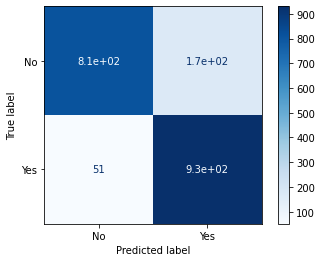

In [ ]:
labels=['No','Yes']
plot_confusion_matrix(final_model, X_test, Y_test,display_labels=labels, cmap=plt.cm.Blues)
plt.show()

In [ ]:
knn_pred_prob =final_model.predict_proba(X_test)[:,1]
knn_auroc = roc_auc_score(Y_test, knn_pred_prob)
print("xgboost AUROC: {}".format(knn_auroc))
knn_y_pred = final_model.predict(X_test)
print(classification_report(Y_test, knn_y_pred,digits=6))

xgboost AUROC: 0.9519400723844795
              precision    recall  f1-score   support

           0   0.940904  0.827727  0.880694       981
           1   0.846224  0.948012  0.894231       981

    accuracy                       0.887870      1962
   macro avg   0.893564  0.887870  0.887462      1962
weighted avg   0.893564  0.887870  0.887462      1962



In [ ]:
pickle.dump(final_model,open('/content/drive/MyDrive/ML project/modelXGB.pkl','wb'))

##using default parameters

In [ ]:
Liste_fin_auc=[]
for j in np.arange(len(All_features)-1,0,-1):
  print(j)
  Features_modelxg1=X.copy()
  L=[]
  To_drop=All_features[:j]
  Features_modelxg1=Features_modelxg1.drop(To_drop,axis=1)
  for k in np.arange (0.7,0.95,0.01):
    X_train, X_test, Y_train, Y_test= train_test_split(Features_modelxg1,Y, train_size=k, random_state=6,stratify=Y)
    model = XGBClassifier(random_state=3,n_jobs=-1)
    model.fit(X_train, Y_train)
    print(k)
    print(model.score(X_test, Y_test))
    print(model.score(X_train, Y_train))
    knn_pred_prob = model.predict_proba(X_test)[:,1]
    knn_auroc = roc_auc_score(Y_test, knn_pred_prob)
    print("XGBoost AUROC: {}".format(knn_auroc))
    L.append(knn_auroc)
    print('-------')
  print(L)
  print('when we have '+str(j)+' features')
  print(idx_max(L))
  Liste_fin_auc.append(idx_max(L))
print(Liste_fin_auc)

43
[09:16:03] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
0.7
0.7391865719819238
0.7241283895960154
XGBoost AUROC: 0.7391865719819238
-------
[09:16:03] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
0.71
0.7382303839732888
0.7247305960987587
XGBoost AUROC: 0.7382849811773078
-------
[09:16:03] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder i

0.72
0.73582295988935
0.7258541834813022
XGBoost AUROC: 0.73582295988935
-------
[09:16:03] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
0.73
0.7368232341340982
0.7256202733182964
XGBoost AUROC: 0.7368813090407944
-------
[09:16:03] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
0.74
0.7337057728119181
0.7268682109671509
XGBoost AUROC: 0.7337666300839035
-------


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder i

[09:16:03] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
0.75
0.7366382649109218
0.7259814049586777
XGBoost AUROC: 0.7366382649109218
-------
[09:16:03] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
0.76
0.7377974989915288
0.7257550656301771
XGBoost AUROC: 0.7378635215704652
-------
[09:16:04] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.77
0.7368421052631579
0.7261979625204377
XGBoost AUROC: 0.7369106680395644
-------
[09:16:04] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
0.78
0.7376760563380281
0.726098832878073
XGBoost AUROC: 0.7376760563380282
-------
[09:16:04] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
0.79
0.7418165053019825


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder i

0.7251440480568837
XGBoost AUROC: 0.7418904212083595
-------
[09:16:04] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
0.8
0.7386253630203291
0.7261501210653754
XGBoost AUROC: 0.7386253630203291
-------
[09:16:04] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.81
0.7344546381243628
0.7272835963653754
XGBoost AUROC: 0.7344546381243628
-------
[09:16:04] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
0.8200000000000001
0.7294244217321141
0.7284752568796504
XGBoost AUROC: 0.7295172286074749
-------
[09:16:04] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
0.8300000000000001


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder i

0.7306378132118451
0.7282380396732788
XGBoost AUROC: 0.7306378132118452
-------
[09:16:04] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
0.8400000000000001
0.7307924984875983
0.7282370575348783
XGBoost AUROC: 0.7308974355220743
-------
[09:16:04] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
0.8500000000000001
0.7288573273079406
0.7286088640765638
XGBoost AUROC: 0.728969742435609
-------
[09:16:04] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd l

/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8700000000000001
0.7282204020848846
0.7287097851497273
XGBoost AUROC: 0.7283483251720957
-------
[09:16:05] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
0.8800000000000001
0.7258064516129032
0.7290336781862206
XGBoost AUROC: 0.7258064516129032
-------
[09:16:05] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8900000000000001
0.7297535211267606
0.7285092491838956
XGBoost AUROC: 0.7297535211267605
-------
[09:16:05] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
0.9000000000000001
0.7270087124878993
0.7288281502205961
XGBoost AUROC: 0.7271733915103535
-------
[09:16:05] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9100000000000001
0.7301075268817204
0.7285014899957428
XGBoost AUROC: 0.7301075268817204
-------
[09:16:05] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
0.9200000000000002
0.7363966142684402
0.7279713654068849
XGBoost AUROC: 0.7365921558994515
-------
[09:16:05] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9300000000000002
0.7344398340248963
0.7282099343955014
XGBoost AUROC: 0.7346688908954561
-------
[09:16:05] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
0.9400000000000002
0.7451612903225806
0.727591180712961
XGBoost AUROC: 0.7451612903225806
-------
[0.7391865719819238, 0.7382849811773078, 0.73582295988935, 0.7368813090407944, 0.7337666300839035, 0.7366382649109218, 0.7378635215704652, 0.7369106680395644, 0.7376760563380282, 0.7418904212083595, 0.7386253630203291, 0.7344546381243628, 0.7295172286074749, 0.7306378132118452, 0.7308974355220743, 0.728969742435609, 0.7261410788381744, 0.7283483251720957, 0.7258064516129032, 0.7297535211267605, 0.7271733915103535, 0.7301075268817204, 0.7365921558994515, 0.7346688908954561, 0.7451612903225806]
when we have 43 features
[0.7451612903225806, 24]
42


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.7
0.7427372498386056
0.737825124515772
XGBoost AUROC: 0.7962403949985851
-------
[09:16:06] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.71
0.7445742904841403
0.7379620788432684
XGBoost AUROC: 0.7971307546111359
-------
[09:16:06] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.72
0.7448132780082988
0.7390368576809255
XGBoost AUROC: 0.7937073990538118
-------
[09:16:06] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.73
0.7447113660810326
0.739020830569192
XGBoost AUROC: 0.7951399495019619
-------
[09:16:07] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.74
0.7370577281191807
0.7406098678183484
XGBoost AUROC: 0.7929472020844406
-------
[09:16:07] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.75
0.7432223082881487
0.7395402892561983
XGBoost AUROC: 0.7960944535876991
-------
[09:16:07] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.76
0.7398144413069786
0.739773161717854
XGBoost AUROC: 0.7976665625244083
-------
[09:16:07] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.77
0.7427368421052631
0.7401584706326249
XGBoost AUROC: 0.7957917421902256
-------
[09:16:08] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.78
0.741637323943662
0.7405016141047926
XGBoost AUROC: 0.796045086540369
-------
[09:16:08] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.79
0.7422775472568004
0.7397327448816967
XGBoost AUROC: 0.8004136412331865
-------
[09:16:08] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8
0.7420135527589545
0.7395883777239709
XGBoost AUROC: 0.7993035257602693
-------
[09:16:08] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.81
0.7390417940876657
0.7405547584887614
XGBoost AUROC: 0.7960661331870265
-------
[09:16:09] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8200000000000001
0.7364174287251211
0.741230660210228
XGBoost AUROC: 0.793649085037675
-------
[09:16:09] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8300000000000001
0.7369020501138952
0.7409568261376897
XGBoost AUROC: 0.7914770575080038
-------
[09:16:09] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8400000000000001
0.7374470659407139
0.7409200968523002
XGBoost AUROC: 0.7921371918103007
-------
[09:16:09] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8500000000000001
0.736604260813428
0.7413694884356842
XGBoost AUROC: 0.7898691339501542
-------
[09:16:10] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8600000000000001
0.7337482710926694
0.7417792792792792
XGBoost AUROC: 0.7865825312925053
-------
[09:16:10] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8700000000000001
0.7341772151898734
0.7416230657909384
XGBoost AUROC: 0.7887802941593924
-------
[09:16:10] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8800000000000001
0.7330645161290322
0.7420206911732335
XGBoost AUROC: 0.7878902185223725
-------
[09:16:11] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8900000000000001
0.7341549295774648
0.7415669205658324
XGBoost AUROC: 0.7890392531243801
-------
[09:16:11] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9000000000000001
0.7308809293320426
0.7420639190788766
XGBoost AUROC: 0.7888084206738338
-------
[09:16:11] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9100000000000001
0.7365591397849462
0.7413793103448276
XGBoost AUROC: 0.7931367788183606
-------
[09:16:12] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9200000000000002
0.7376058041112454
0.7410253710916939
XGBoost AUROC: 0.7961919968183785
-------
[09:16:12] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9300000000000002
0.7330567081604425
0.7412266999895866
XGBoost AUROC: 0.7927028971090128
-------
[09:16:12] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9400000000000002
0.7403225806451613
0.7408819287038945
XGBoost AUROC: 0.8060561914672216
-------
[0.7962403949985851, 0.7971307546111359, 0.7937073990538118, 0.7951399495019619, 0.7929472020844406, 0.7960944535876991, 0.7976665625244083, 0.7957917421902256, 0.796045086540369, 0.8004136412331865, 0.7993035257602693, 0.7960661331870265, 0.793649085037675, 0.7914770575080038, 0.7921371918103007, 0.7898691339501542, 0.7865825312925053, 0.7887802941593924, 0.7878902185223725, 0.7890392531243801, 0.7888084206738338, 0.7931367788183606, 0.7961919968183785, 0.7927028971090128, 0.8060561914672216]
when we have 42 features
[0.8060561914672216, 24]
41
[09:16:12] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.7
0.7543576500968366
0.761759822910902
XGBoost AUROC: 0.8340206576558067
-------
[09:16:13] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.71
0.7559265442404006
0.7616969035602237
XGBoost AUROC: 0.8356450328338029
-------
[09:16:13] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.72
0.7510373443983402
0.7627118644067796
XGBoost AUROC: 0.8322285543752115
-------
[09:16:13] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.73
0.7547508067407673
0.7617089027464509
XGBoost AUROC: 0.833969444058767
-------
[09:16:14] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.74
0.7556797020484172
0.7622039000130872
XGBoost AUROC: 0.8341599595185278
-------
[09:16:14] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.75
0.7606506584043378
0.7607179752066116
XGBoost AUROC: 0.8393354817148573
-------
[09:16:14] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.76
0.7603872529245663
0.7610551803236906
XGBoost AUROC: 0.8389042932645995
-------
[09:16:15] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.77
0.7587368421052632
0.7614136586592881
XGBoost AUROC: 0.836730475209835
-------
[09:16:15] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.78
0.7561619718309859
0.7619816240377452
XGBoost AUROC: 0.835920064843285
-------
[09:16:15] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.79
0.7574919317657907
0.7617996812553635
XGBoost AUROC: 0.8382650024656929
-------
[09:16:16] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8
0.7570183930300097
0.761501210653753
XGBoost AUROC: 0.838757123351473
-------
[09:16:16] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.81
0.7533129459734964
0.7625538020086083
XGBoost AUROC: 0.8357643337583298
-------
[09:16:16] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8200000000000001
0.7514792899408284
0.7629620881067675
XGBoost AUROC: 0.8351945090686019
-------
[09:16:17] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8300000000000001
0.7494305239179955
0.7630105017502917
XGBoost AUROC: 0.834010694215991
-------
[09:16:17] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8400000000000001
0.7519661222020568
0.7631730658365041
XGBoost AUROC: 0.8334026250838088
-------
[09:16:17] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8500000000000001
0.7553260167850226
0.7631309103338271
XGBoost AUROC: 0.8315753938484622
-------
[09:16:18] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8600000000000001
0.7531120331950207
0.7636261261261261
XGBoost AUROC: 0.8285536099967671
-------
[09:16:18] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8700000000000001
0.7565152643335815
0.7628854502950017
XGBoost AUROC: 0.8314859662195728
-------
[09:16:18] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8800000000000001
0.7508064516129033
0.7635923398635263
XGBoost AUROC: 0.8310080645161291
-------
[09:16:19] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8900000000000001
0.7526408450704225
0.7632208922742111
XGBoost AUROC: 0.8329649995040667
-------
[09:16:19] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9000000000000001
0.7463697967086157
0.7634778865812978
XGBoost AUROC: 0.8333277105543311
-------
[09:16:19] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9100000000000001
0.7483870967741936
0.7635163899531716
XGBoost AUROC: 0.8375696612325124
-------
[09:16:20] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9200000000000002
0.750906892382104
0.7633435098431414
XGBoost AUROC: 0.8396059234305366
-------
[09:16:20] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9300000000000002
0.7510373443983402
0.7635114026866604
XGBoost AUROC: 0.8352412727077945
-------
[09:16:20] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9400000000000002
0.7483870967741936
0.7635483206264166
XGBoost AUROC: 0.8397346514047868
-------
[0.8340206576558067, 0.8356450328338029, 0.8322285543752115, 0.833969444058767, 0.8341599595185278, 0.8393354817148573, 0.8389042932645995, 0.836730475209835, 0.835920064843285, 0.8382650024656929, 0.838757123351473, 0.8357643337583298, 0.8351945090686019, 0.834010694215991, 0.8334026250838088, 0.8315753938484622, 0.8285536099967671, 0.8314859662195728, 0.8310080645161291, 0.8329649995040667, 0.8333277105543311, 0.8375696612325124, 0.8396059234305366, 0.8352412727077945, 0.8397346514047868]
when we have 41 features
[0.8397346514047868, 24]
40
[09:16:21] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.7
0.7727566171723693
0.7859712230215827
XGBoost AUROC: 0.8471464336307271
-------
[09:16:21] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.71
0.7736227045075125
0.7857045423543855
XGBoost AUROC: 0.8486200259887822
-------
[09:16:21] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.72
0.7714384508990318
0.7863868711326338
XGBoost AUROC: 0.8447919476439991
-------
[09:16:22] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.73
0.7708856220867695
0.786917871832294
XGBoost AUROC: 0.8471040763538564
-------
[09:16:22] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.74
0.7679702048417132
0.7882476115691663
XGBoost AUROC: 0.8464802869213108
-------
[09:16:22] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.75
0.7753679318357862
0.7860278925619835
XGBoost AUROC: 0.8505820849940691
-------
[09:16:23] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.76
0.7789431222267044
0.7842487574869377
XGBoost AUROC: 0.8524187039495952
-------
[09:16:23] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.77
0.7764210526315789
0.7856873349264244
XGBoost AUROC: 0.8489635189298206
-------
[09:16:23] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.78
0.7768485915492958
0.7869381673702508
XGBoost AUROC: 0.8475570633306884
-------
[09:16:24] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.79
0.7750115260488705
0.7850925585386784
XGBoost AUROC: 0.8521345248014692
-------
[09:16:24] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8
0.7783155856727977
0.785593220338983
XGBoost AUROC: 0.8525474444961948
-------
[09:16:24] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.81
0.7752293577981652
0.7858680057388809
XGBoost AUROC: 0.8496541318694336
-------
[09:16:25] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8200000000000001
0.7746100053792362
0.7864650997992205
XGBoost AUROC: 0.8479299049735523
-------
[09:16:25] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8300000000000001
0.7722095671981777
0.7862310385064177
XGBoost AUROC: 0.8464723616004481
-------
[09:16:26] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8400000000000001
0.7719298245614035
0.7868096391098812
XGBoost AUROC: 0.8432949984043379
-------
[09:16:26] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8500000000000001
0.7663008392511298
0.78808248832175
XGBoost AUROC: 0.8427415187130116
-------
[09:16:26] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8600000000000001
0.7614107883817427
0.7881756756756757
XGBoost AUROC: 0.8360756720977792
-------
[09:16:27] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8700000000000001
0.7647058823529411
0.7868195480351775
XGBoost AUROC: 0.8415344901000639
-------
[09:16:27] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8800000000000001
0.760483870967742
0.7875852960598724
XGBoost AUROC: 0.8424388657648283
-------
[09:16:27] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8900000000000001
0.7596830985915493
0.7873775843307943
XGBoost AUROC: 0.8443342714739139
-------
[09:16:28] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9000000000000001
0.7570183930300097
0.7882276982675132
XGBoost AUROC: 0.8437261031892402
-------
[09:16:28] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9100000000000001
0.7602150537634409
0.7881013197105151
XGBoost AUROC: 0.8485535900104059
-------
[09:16:29] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9200000000000002
0.7654171704957679
0.7877671333824613
XGBoost AUROC: 0.8523499549660197
-------
[09:16:29] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9300000000000002
0.7662517289073306
0.7868374466312611
XGBoost AUROC: 0.8542836809966177
-------
[09:16:29] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9400000000000002
0.7709677419354839
0.7874510611992582
XGBoost AUROC: 0.8591207075962539
-------
[0.8471464336307271, 0.8486200259887822, 0.8447919476439991, 0.8471040763538564, 0.8464802869213108, 0.8505820849940691, 0.8524187039495952, 0.8489635189298206, 0.8475570633306884, 0.8521345248014692, 0.8525474444961948, 0.8496541318694336, 0.8479299049735523, 0.8464723616004481, 0.8432949984043379, 0.8427415187130116, 0.8360756720977792, 0.8415344901000639, 0.8424388657648283, 0.8443342714739139, 0.8437261031892402, 0.8485535900104059, 0.8523499549660197, 0.8542836809966177, 0.8591207075962539]
when we have 40 features
[0.8591207075962539, 24]
39
[09:16:30] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.7
0.7859909619109102
0.8162700608743774
XGBoost AUROC: 0.8661320054463594
-------
[09:16:30] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.71
0.7899833055091819
0.817350975310326
XGBoost AUROC: 0.8683107202388756
-------
[09:16:31] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.72
0.7859612724757953
0.8169222491256389
XGBoost AUROC: 0.8648018380461004
-------
[09:16:31] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.73
0.7938329150233059
0.8166379195966565
XGBoost AUROC: 0.8665681903498352
-------
[09:16:31] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.74
0.7940409683426444
0.8165161628059154
XGBoost AUROC: 0.866850024357684
-------
[09:16:32] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.75
0.7958946553059644
0.8167613636363636
XGBoost AUROC: 0.8695449219136716
-------
[09:16:32] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.76
0.7966922146026624
0.8166178157257551
XGBoost AUROC: 0.8696028274623135
-------
[09:16:32] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.77
0.7932631578947369
0.8153691359577412
XGBoost AUROC: 0.86832130629519
-------
[09:16:33] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.78
0.7900528169014085
0.8154954060094363
XGBoost AUROC: 0.8677024182949811
-------
[09:16:33] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.79
0.7948363301060396
0.8153732990069879
XGBoost AUROC: 0.8690240957709117
-------
[09:16:34] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8
0.7947725072604066
0.8153753026634383
XGBoost AUROC: 0.869232556984469
-------
[09:16:34] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.81
0.7956167176350663
0.8162362505978001
XGBoost AUROC: 0.8653680895214997
-------
[09:16:34] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8200000000000001
0.7912856374394835
0.8162277075705681
XGBoost AUROC: 0.8640028010231837
-------
[09:16:35] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8300000000000001
0.7938496583143508
0.817269544924154
XGBoost AUROC: 0.8640203973619895
-------
[09:16:35] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8400000000000001
0.7876588021778584
0.8172489334716938
XGBoost AUROC: 0.8610558891644293
-------
[09:16:36] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8500000000000001
0.7843770174306004
0.8170217614218982
XGBoost AUROC: 0.8590289238976411
-------
[09:16:36] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8600000000000001
0.7828492392807745
0.8177927927927928
XGBoost AUROC: 0.8569937768901286
-------
[09:16:37] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8700000000000001
0.7833209233060313
0.8160970722475788
XGBoost AUROC: 0.860828720459868
-------
[09:16:37] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8800000000000001
0.7806451612903226
0.8167510455646049
XGBoost AUROC: 0.8594849115504684
-------
[09:16:37] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8900000000000001
0.7790492957746479
0.816430903155604
XGBoost AUROC: 0.8591332324935529
-------
[09:16:38] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9000000000000001
0.7792836398838335
0.8171742171526956
XGBoost AUROC: 0.8606694105828198
-------
[09:16:38] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9100000000000001
0.7784946236559139
0.8155598126862494
XGBoost AUROC: 0.8621620996647013
-------
[09:16:39] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9200000000000002
0.7799274486094316
0.8148226129066217
XGBoost AUROC: 0.8646144038553765
-------
[09:16:39] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9300000000000002
0.7925311203319502
0.8164115380610226
XGBoost AUROC: 0.8621998438958693
-------
[09:16:40] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9400000000000002
0.7935483870967742
0.8138264990727385
XGBoost AUROC: 0.8693704474505723
-------
[0.8661320054463594, 0.8683107202388756, 0.8648018380461004, 0.8665681903498352, 0.866850024357684, 0.8695449219136716, 0.8696028274623135, 0.86832130629519, 0.8677024182949811, 0.8690240957709117, 0.869232556984469, 0.8653680895214997, 0.8640028010231837, 0.8640203973619895, 0.8610558891644293, 0.8590289238976411, 0.8569937768901286, 0.860828720459868, 0.8594849115504684, 0.8591332324935529, 0.8606694105828198, 0.8621620996647013, 0.8646144038553765, 0.8621998438958693, 0.8693704474505723]
when we have 39 features
[0.8696028274623135, 6]
38
[09:16:40] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.7
0.7918011620400258
0.822634200332042
XGBoost AUROC: 0.8683131748298847
-------
[09:16:41] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.71
0.7879799666110183
0.8211703723912154
XGBoost AUROC: 0.8698616636923158
-------
[09:16:41] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.72
0.7876901798063624
0.8241861716437988
XGBoost AUROC: 0.8672813733311142
-------
[09:16:41] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.73
0.7877375403370384
0.8222104285524745
XGBoost AUROC: 0.8678596956747555
-------
[09:16:42] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.74
0.791806331471136
0.822928936003141
XGBoost AUROC: 0.8677058723657358
-------
[09:16:42] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.75
0.7947327652982185
0.8223140495867769
XGBoost AUROC: 0.8699412185055209
-------
[09:16:43] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.76
0.7946752722872126
0.8233719892952721
XGBoost AUROC: 0.8712870030461611
-------
[09:16:43] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.77
0.7949473684210526
0.8236699786190417
XGBoost AUROC: 0.8695534394776181
-------
[09:16:43] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.78
0.7935739436619719
0.8226967966227962
XGBoost AUROC: 0.8697899877256496
-------
[09:16:44] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.79
0.7920700783771323
0.8226063503739119
XGBoost AUROC: 0.8700520346217288
-------
[09:16:44] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8
0.7952565343659245
0.8220338983050848
XGBoost AUROC: 0.8703261864755423
-------
[09:16:45] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.81
0.7864424057084608
0.8191056910569106
XGBoost AUROC: 0.8672187463955835
-------
[09:16:45] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8200000000000001
0.78536847767617
0.818707924884847
XGBoost AUROC: 0.8674479437943448
-------
[09:16:46] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8300000000000001
0.7921412300683371
0.8219369894982497
XGBoost AUROC: 0.8661277183078128
-------
[09:16:46] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8400000000000001
0.7852389594676346
0.8216303470540759
XGBoost AUROC: 0.8644389856858858
-------
[09:16:47] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8500000000000001
0.7856681730148483
0.8211233906801868
XGBoost AUROC: 0.8623764274401934
-------
[09:16:47] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8600000000000001
0.7814661134163209
0.8224099099099099
XGBoost AUROC: 0.8595572466804023
-------
[09:16:47] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8700000000000001
0.7840655249441548
0.8215518201046421
XGBoost AUROC: 0.8631451369668584
-------
[09:16:48] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8800000000000001
0.7846774193548387
0.8243451463790447
XGBoost AUROC: 0.8622567637877211
-------
[09:16:48] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8900000000000001
0.7808098591549296
0.8218715995647443
XGBoost AUROC: 0.8634447530251934
-------
[09:16:49] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9000000000000001
0.7812197483059051
0.820725277090283
XGBoost AUROC: 0.864462912149701
-------
[09:16:49] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9100000000000001
0.7860215053763441
0.8210940825883355
XGBoost AUROC: 0.869839287778934
-------
[09:16:50] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9200000000000002
0.7859733978234583
0.8191388567217602
XGBoost AUROC: 0.8712232866617539
-------
[09:16:50] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9300000000000002
0.7897648686030428
0.8217223784234093
XGBoost AUROC: 0.8685702698152766
-------
[09:16:51] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9400000000000002
0.7983870967741935
0.8206264166494952
XGBoost AUROC: 0.8758480749219564
-------
[0.8683131748298847, 0.8698616636923158, 0.8672813733311142, 0.8678596956747555, 0.8677058723657358, 0.8699412185055209, 0.8712870030461611, 0.8695534394776181, 0.8697899877256496, 0.8700520346217288, 0.8703261864755423, 0.8672187463955835, 0.8674479437943448, 0.8661277183078128, 0.8644389856858858, 0.8623764274401934, 0.8595572466804023, 0.8631451369668584, 0.8622567637877211, 0.8634447530251934, 0.864462912149701, 0.869839287778934, 0.8712232866617539, 0.8685702698152766, 0.8758480749219564]
when we have 38 features
[0.8758480749219564, 24]
37
[09:16:51] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.7
0.8018076178179471
0.8382678472606531
XGBoost AUROC: 0.8732775388524052
-------
[09:16:52] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.71
0.7963272120200334
0.8390396944482336
XGBoost AUROC: 0.8728906410952746
-------
[09:16:52] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.72
0.7970262793914247
0.8389830508474576
XGBoost AUROC: 0.8706136449288254
-------
[09:16:53] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.73
0.7999282897095733
0.83959134934324
XGBoost AUROC: 0.8714909777181263
-------
[09:16:53] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.74
0.7988826815642458
0.8381101950006543
XGBoost AUROC: 0.8723413227276612
-------
[09:16:54] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.75
0.7989930286599535
0.8401342975206612
XGBoost AUROC: 0.8745851785674644
-------
[09:16:54] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.76
0.7966922146026624
0.8378998343315917
XGBoost AUROC: 0.8725598167096253
-------
[09:16:55] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.77
0.7941052631578948
0.8400201232549365
XGBoost AUROC: 0.87140252567801
-------
[09:16:55] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.78
0.7918133802816901
0.8399553017134344
XGBoost AUROC: 0.8711755015125968
-------
[09:16:55] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.79
0.7920700783771323
0.8371950471987251
XGBoost AUROC: 0.8751173329705647
-------
[09:16:56] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8
0.7962245885769603
0.8382566585956417
XGBoost AUROC: 0.8750624362166605
-------
[09:16:56] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.81
0.7915392456676861
0.8357245337159254
XGBoost AUROC: 0.8711455472530577
-------
[09:16:57] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8200000000000001
0.7859064012910166
0.8348883902208575
XGBoost AUROC: 0.8695926941907706
-------
[09:16:57] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8300000000000001
0.7938496583143508
0.8353558926487747
XGBoost AUROC: 0.8695568983141432
-------
[09:16:58] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8400000000000001
0.79491833030853
0.8393866020984665
XGBoost AUROC: 0.8689727156412952
-------
[09:16:58] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8500000000000001
0.7830858618463525
0.8378717101515324
XGBoost AUROC: 0.8634150204217723
-------
[09:16:59] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8600000000000001
0.7828492392807745
0.8396396396396396
XGBoost AUROC: 0.861769674152381
-------
[09:16:59] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8700000000000001
0.7840655249441548
0.83747077813648
XGBoost AUROC: 0.8680208111560571
-------
[09:17:00] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8800000000000001
0.7838709677419354
0.8385428131190843
XGBoost AUROC: 0.8671527055150884
-------
[09:17:00] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8900000000000001
0.7825704225352113
0.8380848748639826
XGBoost AUROC: 0.8663180668518151
-------
[09:17:01] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9000000000000001
0.7850919651500484
0.8392338319164963
XGBoost AUROC: 0.8679396638327861
-------
[09:17:01] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9100000000000001
0.7817204301075269
0.8364197530864198
XGBoost AUROC: 0.8741842987628627
-------
[09:17:02] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9200000000000002
0.7835550181378477
0.8362985577429203
XGBoost AUROC: 0.8742177539156168
-------
[09:17:02] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9300000000000002
0.7911479944674965
0.8361970217640321
XGBoost AUROC: 0.8749139131632513
-------
[09:17:03] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9400000000000002
0.7983870967741935
0.8356686585617144
XGBoost AUROC: 0.881748178980229
-------
[0.8732775388524052, 0.8728906410952746, 0.8706136449288254, 0.8714909777181263, 0.8723413227276612, 0.8745851785674644, 0.8725598167096253, 0.87140252567801, 0.8711755015125968, 0.8751173329705647, 0.8750624362166605, 0.8711455472530577, 0.8695926941907706, 0.8695568983141432, 0.8689727156412952, 0.8634150204217723, 0.861769674152381, 0.8680208111560571, 0.8671527055150884, 0.8663180668518151, 0.8679396638327861, 0.8741842987628627, 0.8742177539156168, 0.8749139131632513, 0.881748178980229]
when we have 37 features
[0.881748178980229, 24]
36
[09:17:03] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.7
0.8050355067785668
0.8540398450470393
XGBoost AUROC: 0.8720978694265776
-------
[09:17:04] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.71
0.8040066777963272
0.8515891419997272
XGBoost AUROC: 0.8744901908846621
-------
[09:17:04] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.72
0.7980636237897649
0.8494753833736884
XGBoost AUROC: 0.8729023547574364
-------
[09:17:05] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.73
0.7995697382574399
0.8496749369775772
XGBoost AUROC: 0.8727567712109758
-------
[09:17:05] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.74
0.804096834264432
0.8523753435414213
XGBoost AUROC: 0.8723654584737552
-------
[09:17:06] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.75
0.8059643687064292
0.853176652892562
XGBoost AUROC: 0.8749925750638544
-------
[09:17:06] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.76
0.7970956030657523
0.8498789346246973
XGBoost AUROC: 0.874267424301596
-------
[09:17:07] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.77
0.8037894736842105
0.8523456169035342
XGBoost AUROC: 0.8728098167862279
-------
[09:17:07] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.78
0.8006161971830986
0.8515023590762354
XGBoost AUROC: 0.87531112068538
-------
[09:17:08] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.79
0.8031350852927617
0.8543582199337992
XGBoost AUROC: 0.8730214940398251
-------
[09:17:08] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8
0.8044530493707648
0.8520581113801453
XGBoost AUROC: 0.876961059480512
-------
[09:17:09] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.81
0.8022426095820592
0.851506456241033
XGBoost AUROC: 0.872426771242808
-------
[09:17:09] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8200000000000001
0.7977407208176439
0.8510688555568678
XGBoost AUROC: 0.8716795722073682
-------
[09:17:10] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8300000000000001
0.7972665148063781
0.852975495915986
XGBoost AUROC: 0.8698818499281344
-------
[09:17:10] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8400000000000001
0.794313369630974
0.8536838464199239
XGBoost AUROC: 0.8675966400332601
-------
[09:17:11] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8500000000000001
0.7953518398967075
0.8561011735217045
XGBoost AUROC: 0.8669033925147955
-------
[09:17:11] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8600000000000001
0.7911479944674965
0.851463963963964
XGBoost AUROC: 0.8631212349037456
-------
[09:17:12] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8700000000000001
0.7952345495160089
0.8542803072470222
XGBoost AUROC: 0.8676393620041161
-------
[09:17:12] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8800000000000001
0.7935483870967742
0.8541712524763372
XGBoost AUROC: 0.8650013007284079
-------
[09:17:13] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8900000000000001
0.8001760563380281
0.8554951033732318
XGBoost AUROC: 0.8676322902201945
-------
[09:17:13] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9000000000000001
0.797676669893514
0.8541913268051221
XGBoost AUROC: 0.8728033676697705
-------
[09:17:14] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9100000000000001
0.7956989247311828
0.8519582801191996
XGBoost AUROC: 0.8720915712799168
-------
[09:17:14] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9200000000000002
0.8004836759371221
0.8535635330034741
XGBoost AUROC: 0.8749634464446551
-------
[09:17:15] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9300000000000002
0.7994467496542186
0.8477559096115798
XGBoost AUROC: 0.876344867694097
-------
[09:17:16] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9400000000000002
0.8064516129032258
0.8506078714197404
XGBoost AUROC: 0.8800624349635796
-------
[0.8720978694265776, 0.8744901908846621, 0.8729023547574364, 0.8727567712109758, 0.8723654584737552, 0.8749925750638544, 0.874267424301596, 0.8728098167862279, 0.87531112068538, 0.8730214940398251, 0.876961059480512, 0.872426771242808, 0.8716795722073682, 0.8698818499281344, 0.8675966400332601, 0.8669033925147955, 0.8631212349037456, 0.8676393620041161, 0.8650013007284079, 0.8676322902201945, 0.8728033676697705, 0.8720915712799168, 0.8749634464446551, 0.876344867694097, 0.8800624349635796]
when we have 36 features
[0.8800624349635796, 24]
35
[09:17:16] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.7
0.8173014848289218
0.8634477033757609
XGBoost AUROC: 0.8815020915636861
-------
[09:17:17] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.71
0.8113522537562604
0.8626381121265857
XGBoost AUROC: 0.8816955227767507
-------
[09:17:17] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.72
0.8049792531120332
0.8629270917406511
XGBoost AUROC: 0.8764161257554106
-------
[09:17:18] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.73
0.8088920760129078
0.8622794215204989
XGBoost AUROC: 0.8776327630448981
-------
[09:17:18] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.74
0.8126629422718809
0.8644156524015181
XGBoost AUROC: 0.8792999080067425
-------
[09:17:19] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.75
0.8106119287374128
0.8616993801652892
XGBoost AUROC: 0.881879915832724
-------
[09:17:19] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.76
0.8112141992739008
0.8642793424238563
XGBoost AUROC: 0.8830111432216409
-------
[09:17:20] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.77
0.8105263157894737
0.8632876367752484
XGBoost AUROC: 0.8808036132172611
-------
[09:17:20] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.78
0.809419014084507
0.8650360069530668
XGBoost AUROC: 0.8807237682255507
-------
[09:17:21] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.79
0.8137390502535731
0.8614686772097585
XGBoost AUROC: 0.8832579454826806
-------
[09:17:21] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8
0.8155856727976767
0.8604116222760291
XGBoost AUROC: 0.8845265015382973
-------
[09:17:22] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.81
0.8119266055045872
0.8628646580583453
XGBoost AUROC: 0.8772638334263338
-------
[09:17:22] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8200000000000001
0.8128025820333513
0.8655958426833589
XGBoost AUROC: 0.8772330057756635
-------
[09:17:23] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8300000000000001
0.8126423690205011
0.8635939323220537
XGBoost AUROC: 0.8782320037774813
-------
[09:17:24] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8400000000000001
0.8027828191167574
0.8615242707252393
XGBoost AUROC: 0.8741037209670004
-------
[09:17:24] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8500000000000001
0.8037443511943189
0.8636208271619005
XGBoost AUROC: 0.8743185796449112
-------
[09:17:25] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8600000000000001
0.8035961272475796
0.8682432432432432
XGBoost AUROC: 0.8736840695656831
-------
[09:17:25] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8700000000000001
0.802680565897245
0.8654124457308249
XGBoost AUROC: 0.8746728851749344
-------
[09:17:26] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8800000000000001
0.8056451612903226
0.8683689192163768
XGBoost AUROC: 0.8733688865764829
-------
[09:17:27] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8900000000000001
0.8063380281690141
0.8672470076169749
XGBoost AUROC: 0.874155363519143
-------
[09:17:27] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9000000000000001
0.8054211035818006
0.8644140751102981
XGBoost AUROC: 0.8754217084251721
-------
[09:17:28] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9100000000000001
0.8118279569892473
0.8653682418050234
XGBoost AUROC: 0.8777060931899642
-------
[09:17:28] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9200000000000002
0.8162031438935913
0.8676702810822192
XGBoost AUROC: 0.8854382332643203
-------
[09:17:29] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9300000000000002
0.8146611341632088
0.8652504425700303
XGBoost AUROC: 0.8801365145926753
-------
[09:17:30] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9400000000000002
0.8241935483870968
0.866165258602926
XGBoost AUROC: 0.8843132154006244
-------
[0.8815020915636861, 0.8816955227767507, 0.8764161257554106, 0.8776327630448981, 0.8792999080067425, 0.881879915832724, 0.8830111432216409, 0.8808036132172611, 0.8807237682255507, 0.8832579454826806, 0.8845265015382973, 0.8772638334263338, 0.8772330057756635, 0.8782320037774813, 0.8741037209670004, 0.8743185796449112, 0.8736840695656831, 0.8746728851749344, 0.8733688865764829, 0.874155363519143, 0.8754217084251721, 0.8777060931899642, 0.8854382332643203, 0.8801365145926753, 0.8843132154006244]
when we have 35 features
[0.8854382332643203, 22]
34
[09:17:30] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.7
0.8189154293092318
0.8673215273934698
XGBoost AUROC: 0.889178590823293
-------
[09:17:31] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.71
0.8277128547579299
0.8761424089483018
XGBoost AUROC: 0.890833290970013
-------
[09:17:31] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.72
0.8215767634854771
0.8709981167608286
XGBoost AUROC: 0.8890027145997258
-------
[09:17:32] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.73
0.822158479741843
0.8687806819689532
XGBoost AUROC: 0.8901212570000463
-------
[09:17:32] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.74
0.8260707635009311
0.8678183483837194
XGBoost AUROC: 0.8912224117325248
-------
[09:17:33] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.75
0.8264910921766073
0.8733212809917356
XGBoost AUROC: 0.8922724264571326
-------
[09:17:34] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.76
0.8261395724082291
0.8696317063846056
XGBoost AUROC: 0.8917919628212138
-------
[09:17:34] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.77
0.8273684210526315
0.8747327380203748
XGBoost AUROC: 0.8939691778781923
-------
[09:17:35] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.78
0.8261443661971831
0.8716165880307921
XGBoost AUROC: 0.8913162071017654
-------
[09:17:35] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.79
0.8271092669432918
0.8702954517592252
XGBoost AUROC: 0.8947591273147755
-------
[09:17:36] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8
0.8247821878025169
0.8732445520581114
XGBoost AUROC: 0.895549480877415
-------
[09:17:36] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.81
0.8256880733944955
0.8706360593017695
XGBoost AUROC: 0.890497952431572
-------
[09:17:37] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8200000000000001
0.8251748251748252
0.8724459666942246
XGBoost AUROC: 0.8908173894926905
-------
[09:17:37] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8300000000000001
0.8280182232346242
0.8714119019836639
XGBoost AUROC: 0.8927653187768847
-------
[09:17:38] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8400000000000001
0.8203266787658802
0.8745532111149544
XGBoost AUROC: 0.8872569543055064
-------
[09:17:39] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8500000000000001
0.8250484183344093
0.8721658881166686
XGBoost AUROC: 0.8851237809452364
-------
[09:17:39] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8600000000000001
0.8160442600276625
0.8722972972972973
XGBoost AUROC: 0.8778554470863489
-------
[09:17:40] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8700000000000001
0.8227848101265823
0.8754313703662474
XGBoost AUROC: 0.8822264654744163
-------
[09:17:40] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8800000000000001
0.8169354838709677
0.8743121285494166
XGBoost AUROC: 0.8808415712799167
-------
[09:17:41] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8900000000000001
0.8195422535211268
0.8761697497279651
XGBoost AUROC: 0.884782285260861
-------
[09:17:42] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9000000000000001
0.8218780251694094
0.872807489508232
XGBoost AUROC: 0.8854002668945766
-------
[09:17:42] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9100000000000001
0.821505376344086
0.8754789272030651
XGBoost AUROC: 0.8855937102555209
-------
[09:17:43] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9200000000000002
0.8234582829504232
0.876302768712496
XGBoost AUROC: 0.8845726450737503
-------
[09:17:43] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9300000000000002
0.8354080221300139
0.8754555867957929
XGBoost AUROC: 0.8834958142666932
-------
[09:17:44] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9400000000000002
0.8387096774193549
0.8704924788790439
XGBoost AUROC: 0.8883194588969823
-------
[0.889178590823293, 0.890833290970013, 0.8890027145997258, 0.8901212570000463, 0.8912224117325248, 0.8922724264571326, 0.8917919628212138, 0.8939691778781923, 0.8913162071017654, 0.8947591273147755, 0.895549480877415, 0.890497952431572, 0.8908173894926905, 0.8927653187768847, 0.8872569543055064, 0.8851237809452364, 0.8778554470863489, 0.8822264654744163, 0.8808415712799167, 0.884782285260861, 0.8854002668945766, 0.8855937102555209, 0.8845726450737503, 0.8834958142666932, 0.8883194588969823]
when we have 34 features
[0.895549480877415, 10]
33
[09:17:45] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.7
0.8260167850225952
0.8703652462645268
XGBoost AUROC: 0.8921132816065344
-------
[09:17:45] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.71
0.8277128547579299
0.8725958259446187
XGBoost AUROC: 0.8890114452313618
-------
[09:17:46] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.72
0.823997233748271
0.8743610438525693
XGBoost AUROC: 0.8893293656942699
-------
[09:17:46] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.73
0.82502689135891
0.8719649728008492
XGBoost AUROC: 0.8923934116001501
-------
[09:17:47] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.74
0.8242085661080074
0.8710901714435283
XGBoost AUROC: 0.8900089662909629
-------
[09:17:47] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.75
0.8292021688613478
0.871900826446281
XGBoost AUROC: 0.8923063261655949
-------
[09:17:48] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.76
0.8237192416296893
0.8720530138906588
XGBoost AUROC: 0.8913112812101329
-------
[09:17:48] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.77
0.8261052631578948
0.8728461828700792
XGBoost AUROC: 0.8915403685833341
-------
[09:17:49] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.78
0.8221830985915493
0.8737273404519493
XGBoost AUROC: 0.8885211577563976
-------
[09:17:50] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.79
0.8331028123559244
0.8728699276694863
XGBoost AUROC: 0.8930824561701838
-------
[09:17:50] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8
0.8320425943852856
0.8727602905569007
XGBoost AUROC: 0.8946282831141543
-------
[09:17:51] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.81
0.8195718654434251
0.8730272596843616
XGBoost AUROC: 0.8919433559755643
-------
[09:17:51] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8200000000000001
0.8224852071005917
0.8713830164166765
XGBoost AUROC: 0.8885557368890125
-------
[09:17:52] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8300000000000001
0.8223234624145785
0.8705950991831972
XGBoost AUROC: 0.890349909973485
-------
[09:17:53] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8400000000000001
0.8269812462189957
0.8724778046811945
XGBoost AUROC: 0.8857505906877743
-------
[09:17:53] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8500000000000001
0.8302130406714009
0.8735330978694315
XGBoost AUROC: 0.8843785946486622
-------
[09:17:54] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8600000000000001
0.818118948824343
0.8731981981981982
XGBoost AUROC: 0.8821234329834388
-------
[09:17:54] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8700000000000001
0.827252419955324
0.8759879772904375
XGBoost AUROC: 0.8809202239017814
-------
[09:17:55] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8800000000000001
0.8080645161290323
0.8727712965001101
XGBoost AUROC: 0.8782297086368366
-------
[09:17:56] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8900000000000001
0.8151408450704225
0.8737758433079434
XGBoost AUROC: 0.8792092342789128
-------
[09:17:56] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9000000000000001
0.814133591481123
0.8695792532013343
XGBoost AUROC: 0.8852671944581889
-------
[09:17:57] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9100000000000001
0.8150537634408602
0.8723925074499788
XGBoost AUROC: 0.8810243958839172
-------
[09:17:58] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9200000000000002
0.8258766626360339
0.8761974944731025
XGBoost AUROC: 0.8836602683323391
-------
[09:17:58] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9300000000000002
0.8243430152143845
0.8751431844215349
XGBoost AUROC: 0.8822332073277116
-------
[09:17:59] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9400000000000002
0.8370967741935483
0.8715227694209767
XGBoost AUROC: 0.8895057232049948
-------
[0.8921132816065344, 0.8890114452313618, 0.8893293656942699, 0.8923934116001501, 0.8900089662909629, 0.8923063261655949, 0.8913112812101329, 0.8915403685833341, 0.8885211577563976, 0.8930824561701838, 0.8946282831141543, 0.8919433559755643, 0.8885557368890125, 0.890349909973485, 0.8857505906877743, 0.8843785946486622, 0.8821234329834388, 0.8809202239017814, 0.8782297086368366, 0.8792092342789128, 0.8852671944581889, 0.8810243958839172, 0.8836602683323391, 0.8822332073277116, 0.8895057232049948]
when we have 33 features
[0.8946282831141543, 10]
32
[09:18:00] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.7
0.8260167850225952
0.8703652462645268
XGBoost AUROC: 0.8921132816065344
-------
[09:18:00] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.71
0.8277128547579299
0.8725958259446187
XGBoost AUROC: 0.8890114452313618
-------
[09:18:01] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.72
0.823997233748271
0.8743610438525693
XGBoost AUROC: 0.8893293656942699
-------
[09:18:01] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.73
0.82502689135891
0.8719649728008492
XGBoost AUROC: 0.8923934116001501
-------
[09:18:02] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.74
0.8242085661080074
0.8710901714435283
XGBoost AUROC: 0.8900089662909629
-------
[09:18:02] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.75
0.8292021688613478
0.871900826446281
XGBoost AUROC: 0.8923063261655949
-------
[09:18:03] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.76
0.8237192416296893
0.8720530138906588
XGBoost AUROC: 0.8913112812101329
-------
[09:18:03] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.77
0.8261052631578948
0.8728461828700792
XGBoost AUROC: 0.8915403685833341
-------
[09:18:04] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.78
0.8221830985915493
0.8737273404519493
XGBoost AUROC: 0.8885211577563976
-------
[09:18:04] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.79
0.8331028123559244
0.8728699276694863
XGBoost AUROC: 0.8930824561701838
-------
[09:18:05] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8
0.8320425943852856
0.8727602905569007
XGBoost AUROC: 0.8946282831141543
-------
[09:18:06] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.81
0.8195718654434251
0.8730272596843616
XGBoost AUROC: 0.8919433559755643
-------
[09:18:06] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8200000000000001
0.8224852071005917
0.8713830164166765
XGBoost AUROC: 0.8885557368890125
-------
[09:18:07] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8300000000000001
0.8223234624145785
0.8705950991831972
XGBoost AUROC: 0.890349909973485
-------
[09:18:08] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8400000000000001
0.8269812462189957
0.8724778046811945
XGBoost AUROC: 0.8857505906877743
-------
[09:18:08] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8500000000000001
0.8302130406714009
0.8735330978694315
XGBoost AUROC: 0.8843785946486622
-------
[09:18:09] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8600000000000001
0.818118948824343
0.8731981981981982
XGBoost AUROC: 0.8821234329834388
-------
[09:18:09] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8700000000000001
0.827252419955324
0.8759879772904375
XGBoost AUROC: 0.8809202239017814
-------
[09:18:10] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8800000000000001
0.8080645161290323
0.8727712965001101
XGBoost AUROC: 0.8782297086368366
-------
[09:18:11] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8900000000000001
0.8151408450704225
0.8737758433079434
XGBoost AUROC: 0.8792092342789128
-------
[09:18:11] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9000000000000001
0.814133591481123
0.8695792532013343
XGBoost AUROC: 0.8852671944581889
-------
[09:18:12] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9100000000000001
0.8150537634408602
0.8723925074499788
XGBoost AUROC: 0.8810243958839172
-------
[09:18:13] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9200000000000002
0.8258766626360339
0.8761974944731025
XGBoost AUROC: 0.8836602683323391
-------
[09:18:13] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9300000000000002
0.8243430152143845
0.8751431844215349
XGBoost AUROC: 0.8822332073277116
-------
[09:18:14] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9400000000000002
0.8370967741935483
0.8715227694209767
XGBoost AUROC: 0.8895057232049948
-------
[0.8921132816065344, 0.8890114452313618, 0.8893293656942699, 0.8923934116001501, 0.8900089662909629, 0.8923063261655949, 0.8913112812101329, 0.8915403685833341, 0.8885211577563976, 0.8930824561701838, 0.8946282831141543, 0.8919433559755643, 0.8885557368890125, 0.890349909973485, 0.8857505906877743, 0.8843785946486622, 0.8821234329834388, 0.8809202239017814, 0.8782297086368366, 0.8792092342789128, 0.8852671944581889, 0.8810243958839172, 0.8836602683323391, 0.8822332073277116, 0.8895057232049948]
when we have 32 features
[0.8946282831141543, 10]
31
[09:18:15] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.7
0.8260167850225952
0.8703652462645268
XGBoost AUROC: 0.8921132816065344
-------
[09:18:15] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.71
0.8277128547579299
0.8725958259446187
XGBoost AUROC: 0.8890114452313618
-------
[09:18:16] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.72
0.823997233748271
0.8743610438525693
XGBoost AUROC: 0.8893293656942699
-------
[09:18:16] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.73
0.82502689135891
0.8719649728008492
XGBoost AUROC: 0.8923934116001501
-------
[09:18:17] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.74
0.8242085661080074
0.8710901714435283
XGBoost AUROC: 0.8900089662909629
-------
[09:18:18] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.75
0.8292021688613478
0.871900826446281
XGBoost AUROC: 0.8923063261655949
-------
[09:18:18] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.76
0.8237192416296893
0.8720530138906588
XGBoost AUROC: 0.8913112812101329
-------
[09:18:19] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.77
0.8261052631578948
0.8728461828700792
XGBoost AUROC: 0.8915403685833341
-------
[09:18:20] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.78
0.8221830985915493
0.8737273404519493
XGBoost AUROC: 0.8885211577563976
-------
[09:18:20] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.79
0.8331028123559244
0.8728699276694863
XGBoost AUROC: 0.8930824561701838
-------
[09:18:21] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8
0.8320425943852856
0.8727602905569007
XGBoost AUROC: 0.8946282831141543
-------
[09:18:21] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.81
0.8195718654434251
0.8730272596843616
XGBoost AUROC: 0.8919433559755643
-------
[09:18:22] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8200000000000001
0.8224852071005917
0.8713830164166765
XGBoost AUROC: 0.8885557368890125
-------
[09:18:23] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8300000000000001
0.8223234624145785
0.8705950991831972
XGBoost AUROC: 0.890349909973485
-------
[09:18:23] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8400000000000001
0.8269812462189957
0.8724778046811945
XGBoost AUROC: 0.8857505906877743
-------
[09:18:24] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8500000000000001
0.8302130406714009
0.8735330978694315
XGBoost AUROC: 0.8843785946486622
-------
[09:18:25] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8600000000000001
0.818118948824343
0.8731981981981982
XGBoost AUROC: 0.8821234329834388
-------
[09:18:25] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8700000000000001
0.827252419955324
0.8759879772904375
XGBoost AUROC: 0.8809202239017814
-------
[09:18:26] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8800000000000001
0.8080645161290323
0.8727712965001101
XGBoost AUROC: 0.8782297086368366
-------
[09:18:27] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8900000000000001
0.8151408450704225
0.8737758433079434
XGBoost AUROC: 0.8792092342789128
-------
[09:18:27] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9000000000000001
0.814133591481123
0.8695792532013343
XGBoost AUROC: 0.8852671944581889
-------
[09:18:28] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9100000000000001
0.8150537634408602
0.8723925074499788
XGBoost AUROC: 0.8810243958839172
-------
[09:18:29] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9200000000000002
0.8258766626360339
0.8761974944731025
XGBoost AUROC: 0.8836602683323391
-------
[09:18:29] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9300000000000002
0.8243430152143845
0.8751431844215349
XGBoost AUROC: 0.8822332073277116
-------
[09:18:30] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9400000000000002
0.8370967741935483
0.8715227694209767
XGBoost AUROC: 0.8895057232049948
-------
[0.8921132816065344, 0.8890114452313618, 0.8893293656942699, 0.8923934116001501, 0.8900089662909629, 0.8923063261655949, 0.8913112812101329, 0.8915403685833341, 0.8885211577563976, 0.8930824561701838, 0.8946282831141543, 0.8919433559755643, 0.8885557368890125, 0.890349909973485, 0.8857505906877743, 0.8843785946486622, 0.8821234329834388, 0.8809202239017814, 0.8782297086368366, 0.8792092342789128, 0.8852671944581889, 0.8810243958839172, 0.8836602683323391, 0.8822332073277116, 0.8895057232049948]
when we have 31 features
[0.8946282831141543, 10]
30
[09:18:31] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.7
0.8260167850225952
0.8703652462645268
XGBoost AUROC: 0.8921132816065344
-------
[09:18:31] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.71
0.8277128547579299
0.8725958259446187
XGBoost AUROC: 0.8890114452313618
-------
[09:18:32] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.72
0.823997233748271
0.8743610438525693
XGBoost AUROC: 0.8893293656942699
-------
[09:18:33] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.73
0.82502689135891
0.8719649728008492
XGBoost AUROC: 0.8923934116001501
-------
[09:18:33] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.74
0.8242085661080074
0.8710901714435283
XGBoost AUROC: 0.8900089662909629
-------
[09:18:34] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.75
0.8292021688613478
0.871900826446281
XGBoost AUROC: 0.8923063261655949
-------
[09:18:34] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.76
0.8237192416296893
0.8720530138906588
XGBoost AUROC: 0.8913112812101329
-------
[09:18:35] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.77
0.8261052631578948
0.8728461828700792
XGBoost AUROC: 0.8915403685833341
-------
[09:18:36] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.78
0.8221830985915493
0.8737273404519493
XGBoost AUROC: 0.8885211577563976
-------
[09:18:36] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.79
0.8331028123559244
0.8728699276694863
XGBoost AUROC: 0.8930824561701838
-------
[09:18:37] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8
0.8320425943852856
0.8727602905569007
XGBoost AUROC: 0.8946282831141543
-------
[09:18:38] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.81
0.8195718654434251
0.8730272596843616
XGBoost AUROC: 0.8919433559755643
-------
[09:18:38] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8200000000000001
0.8224852071005917
0.8713830164166765
XGBoost AUROC: 0.8885557368890125
-------
[09:18:39] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8300000000000001
0.8223234624145785
0.8705950991831972
XGBoost AUROC: 0.890349909973485
-------
[09:18:40] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8400000000000001
0.8269812462189957
0.8724778046811945
XGBoost AUROC: 0.8857505906877743
-------
[09:18:40] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8500000000000001
0.8302130406714009
0.8735330978694315
XGBoost AUROC: 0.8843785946486622
-------
[09:18:41] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8600000000000001
0.818118948824343
0.8731981981981982
XGBoost AUROC: 0.8821234329834388
-------
[09:18:42] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8700000000000001
0.827252419955324
0.8759879772904375
XGBoost AUROC: 0.8809202239017814
-------
[09:18:42] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8800000000000001
0.8080645161290323
0.8727712965001101
XGBoost AUROC: 0.8782297086368366
-------
[09:18:43] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8900000000000001
0.8151408450704225
0.8737758433079434
XGBoost AUROC: 0.8792092342789128
-------
[09:18:44] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9000000000000001
0.814133591481123
0.8695792532013343
XGBoost AUROC: 0.8852671944581889
-------
[09:18:45] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9100000000000001
0.8150537634408602
0.8723925074499788
XGBoost AUROC: 0.8810243958839172
-------
[09:18:45] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9200000000000002
0.8258766626360339
0.8761974944731025
XGBoost AUROC: 0.8836602683323391
-------
[09:18:46] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9300000000000002
0.8243430152143845
0.8751431844215349
XGBoost AUROC: 0.8822332073277116
-------
[09:18:47] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9400000000000002
0.8370967741935483
0.8715227694209767
XGBoost AUROC: 0.8895057232049948
-------
[0.8921132816065344, 0.8890114452313618, 0.8893293656942699, 0.8923934116001501, 0.8900089662909629, 0.8923063261655949, 0.8913112812101329, 0.8915403685833341, 0.8885211577563976, 0.8930824561701838, 0.8946282831141543, 0.8919433559755643, 0.8885557368890125, 0.890349909973485, 0.8857505906877743, 0.8843785946486622, 0.8821234329834388, 0.8809202239017814, 0.8782297086368366, 0.8792092342789128, 0.8852671944581889, 0.8810243958839172, 0.8836602683323391, 0.8822332073277116, 0.8895057232049948]
when we have 30 features
[0.8946282831141543, 10]
29
[09:18:47] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.7
0.8260167850225952
0.8703652462645268
XGBoost AUROC: 0.8921132816065344
-------
[09:18:48] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.71
0.8277128547579299
0.8725958259446187
XGBoost AUROC: 0.8890114452313618
-------
[09:18:49] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.72
0.823997233748271
0.8743610438525693
XGBoost AUROC: 0.8893293656942699
-------
[09:18:49] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.73
0.82502689135891
0.8719649728008492
XGBoost AUROC: 0.8923934116001501
-------
[09:18:50] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.74
0.8242085661080074
0.8710901714435283
XGBoost AUROC: 0.8900089662909629
-------
[09:18:51] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.75
0.8292021688613478
0.871900826446281
XGBoost AUROC: 0.8923063261655949
-------
[09:18:51] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.76
0.8237192416296893
0.8720530138906588
XGBoost AUROC: 0.8913112812101329
-------
[09:18:52] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.77
0.8261052631578948
0.8728461828700792
XGBoost AUROC: 0.8915403685833341
-------
[09:18:53] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.78
0.8221830985915493
0.8737273404519493
XGBoost AUROC: 0.8885211577563976
-------
[09:18:53] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.79
0.8331028123559244
0.8728699276694863
XGBoost AUROC: 0.8930824561701838
-------
[09:18:54] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8
0.8320425943852856
0.8727602905569007
XGBoost AUROC: 0.8946282831141543
-------
[09:18:55] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.81
0.8195718654434251
0.8730272596843616
XGBoost AUROC: 0.8919433559755643
-------
[09:18:55] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8200000000000001
0.8224852071005917
0.8713830164166765
XGBoost AUROC: 0.8885557368890125
-------
[09:18:56] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8300000000000001
0.8223234624145785
0.8705950991831972
XGBoost AUROC: 0.890349909973485
-------
[09:18:57] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8400000000000001
0.8269812462189957
0.8724778046811945
XGBoost AUROC: 0.8857505906877743
-------
[09:18:57] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8500000000000001
0.8302130406714009
0.8735330978694315
XGBoost AUROC: 0.8843785946486622
-------
[09:18:58] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8600000000000001
0.818118948824343
0.8731981981981982
XGBoost AUROC: 0.8821234329834388
-------
[09:18:59] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8700000000000001
0.827252419955324
0.8759879772904375
XGBoost AUROC: 0.8809202239017814
-------
[09:19:00] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8800000000000001
0.8080645161290323
0.8727712965001101
XGBoost AUROC: 0.8782297086368366
-------
[09:19:00] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8900000000000001
0.8151408450704225
0.8737758433079434
XGBoost AUROC: 0.8792092342789128
-------
[09:19:01] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9000000000000001
0.814133591481123
0.8695792532013343
XGBoost AUROC: 0.8852671944581889
-------
[09:19:02] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9100000000000001
0.8150537634408602
0.8723925074499788
XGBoost AUROC: 0.8810243958839172
-------
[09:19:03] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9200000000000002
0.8258766626360339
0.8761974944731025
XGBoost AUROC: 0.8836602683323391
-------
[09:19:03] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9300000000000002
0.8243430152143845
0.8751431844215349
XGBoost AUROC: 0.8822332073277116
-------
[09:19:04] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9400000000000002
0.8370967741935483
0.8715227694209767
XGBoost AUROC: 0.8895057232049948
-------
[0.8921132816065344, 0.8890114452313618, 0.8893293656942699, 0.8923934116001501, 0.8900089662909629, 0.8923063261655949, 0.8913112812101329, 0.8915403685833341, 0.8885211577563976, 0.8930824561701838, 0.8946282831141543, 0.8919433559755643, 0.8885557368890125, 0.890349909973485, 0.8857505906877743, 0.8843785946486622, 0.8821234329834388, 0.8809202239017814, 0.8782297086368366, 0.8792092342789128, 0.8852671944581889, 0.8810243958839172, 0.8836602683323391, 0.8822332073277116, 0.8895057232049948]
when we have 29 features
[0.8946282831141543, 10]
28
[09:19:05] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.7
0.8260167850225952
0.8703652462645268
XGBoost AUROC: 0.8921132816065344
-------
[09:19:06] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.71
0.8277128547579299
0.8725958259446187
XGBoost AUROC: 0.8890114452313618
-------
[09:19:06] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.72
0.823997233748271
0.8743610438525693
XGBoost AUROC: 0.8893293656942699
-------
[09:19:07] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.73
0.82502689135891
0.8719649728008492
XGBoost AUROC: 0.8923934116001501
-------
[09:19:08] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.74
0.8242085661080074
0.8710901714435283
XGBoost AUROC: 0.8900089662909629
-------
[09:19:08] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.75
0.8292021688613478
0.871900826446281
XGBoost AUROC: 0.8923063261655949
-------
[09:19:09] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.76
0.8237192416296893
0.8720530138906588
XGBoost AUROC: 0.8913112812101329
-------
[09:19:10] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.77
0.8261052631578948
0.8728461828700792
XGBoost AUROC: 0.8915403685833341
-------
[09:19:10] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.78
0.8221830985915493
0.8737273404519493
XGBoost AUROC: 0.8885211577563976
-------
[09:19:11] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.79
0.8331028123559244
0.8728699276694863
XGBoost AUROC: 0.8930824561701838
-------
[09:19:12] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8
0.8320425943852856
0.8727602905569007
XGBoost AUROC: 0.8946282831141543
-------
[09:19:12] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.81
0.8195718654434251
0.8730272596843616
XGBoost AUROC: 0.8919433559755643
-------
[09:19:13] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8200000000000001
0.8224852071005917
0.8713830164166765
XGBoost AUROC: 0.8885557368890125
-------
[09:19:14] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8300000000000001
0.8223234624145785
0.8705950991831972
XGBoost AUROC: 0.890349909973485
-------
[09:19:15] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8400000000000001
0.8269812462189957
0.8724778046811945
XGBoost AUROC: 0.8857505906877743
-------
[09:19:15] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8500000000000001
0.8302130406714009
0.8735330978694315
XGBoost AUROC: 0.8843785946486622
-------
[09:19:16] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8600000000000001
0.818118948824343
0.8731981981981982
XGBoost AUROC: 0.8821234329834388
-------
[09:19:17] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8700000000000001
0.827252419955324
0.8759879772904375
XGBoost AUROC: 0.8809202239017814
-------
[09:19:18] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8800000000000001
0.8080645161290323
0.8727712965001101
XGBoost AUROC: 0.8782297086368366
-------
[09:19:18] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8900000000000001
0.8151408450704225
0.8737758433079434
XGBoost AUROC: 0.8792092342789128
-------
[09:19:19] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9000000000000001
0.814133591481123
0.8695792532013343
XGBoost AUROC: 0.8852671944581889
-------
[09:19:20] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9100000000000001
0.8150537634408602
0.8723925074499788
XGBoost AUROC: 0.8810243958839172
-------
[09:19:21] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9200000000000002
0.8258766626360339
0.8761974944731025
XGBoost AUROC: 0.8836602683323391
-------
[09:19:21] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9300000000000002
0.8243430152143845
0.8751431844215349
XGBoost AUROC: 0.8822332073277116
-------
[09:19:22] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9400000000000002
0.8370967741935483
0.8715227694209767
XGBoost AUROC: 0.8895057232049948
-------
[0.8921132816065344, 0.8890114452313618, 0.8893293656942699, 0.8923934116001501, 0.8900089662909629, 0.8923063261655949, 0.8913112812101329, 0.8915403685833341, 0.8885211577563976, 0.8930824561701838, 0.8946282831141543, 0.8919433559755643, 0.8885557368890125, 0.890349909973485, 0.8857505906877743, 0.8843785946486622, 0.8821234329834388, 0.8809202239017814, 0.8782297086368366, 0.8792092342789128, 0.8852671944581889, 0.8810243958839172, 0.8836602683323391, 0.8822332073277116, 0.8895057232049948]
when we have 28 features
[0.8946282831141543, 10]
27
[09:19:23] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.7
0.8260167850225952
0.8703652462645268
XGBoost AUROC: 0.8921132816065344
-------
[09:19:24] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.71
0.8277128547579299
0.8725958259446187
XGBoost AUROC: 0.8890114452313618
-------
[09:19:24] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.72
0.823997233748271
0.8743610438525693
XGBoost AUROC: 0.8893293656942699
-------
[09:19:25] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.73
0.82502689135891
0.8719649728008492
XGBoost AUROC: 0.8923934116001501
-------
[09:19:26] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.74
0.8242085661080074
0.8710901714435283
XGBoost AUROC: 0.8900089662909629
-------
[09:19:26] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.75
0.8292021688613478
0.871900826446281
XGBoost AUROC: 0.8923063261655949
-------
[09:19:27] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.76
0.8237192416296893
0.8720530138906588
XGBoost AUROC: 0.8913112812101329
-------
[09:19:28] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.77
0.8261052631578948
0.8728461828700792
XGBoost AUROC: 0.8915403685833341
-------
[09:19:28] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.78
0.8221830985915493
0.8737273404519493
XGBoost AUROC: 0.8885211577563976
-------
[09:19:29] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.79
0.8331028123559244
0.8728699276694863
XGBoost AUROC: 0.8930824561701838
-------
[09:19:30] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8
0.8320425943852856
0.8727602905569007
XGBoost AUROC: 0.8946282831141543
-------
[09:19:31] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.81
0.8195718654434251
0.8730272596843616
XGBoost AUROC: 0.8919433559755643
-------
[09:19:31] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8200000000000001
0.8224852071005917
0.8713830164166765
XGBoost AUROC: 0.8885557368890125
-------
[09:19:32] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8300000000000001
0.8223234624145785
0.8705950991831972
XGBoost AUROC: 0.890349909973485
-------
[09:19:33] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8400000000000001
0.8269812462189957
0.8724778046811945
XGBoost AUROC: 0.8857505906877743
-------
[09:19:34] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8500000000000001
0.8302130406714009
0.8735330978694315
XGBoost AUROC: 0.8843785946486622
-------
[09:19:34] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8600000000000001
0.818118948824343
0.8731981981981982
XGBoost AUROC: 0.8821234329834388
-------
[09:19:35] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8700000000000001
0.827252419955324
0.8759879772904375
XGBoost AUROC: 0.8809202239017814
-------
[09:19:36] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8800000000000001
0.8080645161290323
0.8727712965001101
XGBoost AUROC: 0.8782297086368366
-------
[09:19:37] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8900000000000001
0.8151408450704225
0.8737758433079434
XGBoost AUROC: 0.8792092342789128
-------
[09:19:38] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9000000000000001
0.814133591481123
0.8695792532013343
XGBoost AUROC: 0.8852671944581889
-------
[09:19:38] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9100000000000001
0.8150537634408602
0.8723925074499788
XGBoost AUROC: 0.8810243958839172
-------
[09:19:39] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9200000000000002
0.8258766626360339
0.8761974944731025
XGBoost AUROC: 0.8836602683323391
-------
[09:19:40] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9300000000000002
0.8243430152143845
0.8751431844215349
XGBoost AUROC: 0.8822332073277116
-------
[09:19:41] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9400000000000002
0.8370967741935483
0.8715227694209767
XGBoost AUROC: 0.8895057232049948
-------
[0.8921132816065344, 0.8890114452313618, 0.8893293656942699, 0.8923934116001501, 0.8900089662909629, 0.8923063261655949, 0.8913112812101329, 0.8915403685833341, 0.8885211577563976, 0.8930824561701838, 0.8946282831141543, 0.8919433559755643, 0.8885557368890125, 0.890349909973485, 0.8857505906877743, 0.8843785946486622, 0.8821234329834388, 0.8809202239017814, 0.8782297086368366, 0.8792092342789128, 0.8852671944581889, 0.8810243958839172, 0.8836602683323391, 0.8822332073277116, 0.8895057232049948]
when we have 27 features
[0.8946282831141543, 10]
26
[09:19:42] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.7
0.8508715300193673
0.9110403984504704
XGBoost AUROC: 0.9169321843243375
-------
[09:19:43] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.71
0.851085141903172
0.9095621334060837
XGBoost AUROC: 0.916864436483113
-------
[09:19:43] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.72
0.8492392807745505
0.9121603443637342
XGBoost AUROC: 0.9175574245928578
-------
[09:19:44] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.73
0.8519182502689135
0.9158816505240812
XGBoost AUROC: 0.9197284316296673
-------
[09:19:45] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.74
0.8502793296089386
0.9155869650569297
XGBoost AUROC: 0.9203428829510638
-------
[09:19:46] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.75
0.8497288923315259
0.9146435950413223
XGBoost AUROC: 0.9197443901982443
-------
[09:19:46] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.76
0.854780153287616
0.9076080030584937
XGBoost AUROC: 0.9202579473560886
-------
[09:19:47] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.77
0.8492631578947368
0.9104515155326374
XGBoost AUROC: 0.9201418140971638
-------
[09:19:48] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.78
0.8512323943661971
0.9074993791904644
XGBoost AUROC: 0.9137308445744892
-------
[09:19:49] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.79
0.8492392807745505
0.9117322545053328
XGBoost AUROC: 0.9183073443637662
-------
[09:19:50] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8
0.8543078412391094
0.9088377723970944
XGBoost AUROC: 0.9180260503107052
-------
[09:19:51] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.81
0.8450560652395515
0.9091343854615017
XGBoost AUROC: 0.9137085771347759
-------
[09:19:51] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8200000000000001
0.8423883808499193
0.9110664934451399
XGBoost AUROC: 0.9123598041598667
-------
[09:19:52] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8300000000000001
0.8502277904328018
0.9089848308051341
XGBoost AUROC: 0.9132431079124745
-------
[09:19:53] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8400000000000001
0.8469449485783425
0.9096045197740112
XGBoost AUROC: 0.9099021815190118
-------
[09:19:54] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8500000000000001
0.8327953518398967
0.9083969465648855
XGBoost AUROC: 0.9041110277569392
-------
[09:19:55] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8600000000000001
0.8443983402489627
0.9208333333333333
XGBoost AUROC: 0.9042285773316575
-------
[09:19:56] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8700000000000001
0.8436336559940432
0.9138372481353668
XGBoost AUROC: 0.9111467426016606
-------
[09:19:57] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8800000000000001
0.8419354838709677
0.9115122165969624
XGBoost AUROC: 0.9071136836628513
-------
[09:19:57] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8900000000000001
0.8450704225352113
0.9055495103373232
XGBoost AUROC: 0.9100779855187462
-------
[09:19:58] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9000000000000001
0.8489835430784124
0.9116539330679005
XGBoost AUROC: 0.9111938284377671
-------
[09:19:59] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9100000000000001
0.8365591397849462
0.9104938271604939
XGBoost AUROC: 0.9090391952826915
-------
[09:20:00] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9200000000000002
0.8391777509068924
0.913464575218444
XGBoost AUROC: 0.9084435788562538
-------
[09:20:01] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9300000000000002
0.8340248962655602
0.9085702384671457
XGBoost AUROC: 0.9052509144335102
-------
[09:20:02] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9400000000000002
0.832258064516129
0.9079950546053988
XGBoost AUROC: 0.9099739854318418
-------
[0.9169321843243375, 0.916864436483113, 0.9175574245928578, 0.9197284316296673, 0.9203428829510638, 0.9197443901982443, 0.9202579473560886, 0.9201418140971638, 0.9137308445744892, 0.9183073443637662, 0.9180260503107052, 0.9137085771347759, 0.9123598041598667, 0.9132431079124745, 0.9099021815190118, 0.9041110277569392, 0.9042285773316575, 0.9111467426016606, 0.9071136836628513, 0.9100779855187462, 0.9111938284377671, 0.9090391952826915, 0.9084435788562538, 0.9052509144335102, 0.9099739854318418]
when we have 26 features
[0.9203428829510638, 4]
25
[09:20:03] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.7
0.8521626856036152
0.9331765356945213
XGBoost AUROC: 0.9218023581718938
-------
[09:20:04] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.71
0.86110183639399
0.9398444959759924
XGBoost AUROC: 0.9271420009578568
-------
[09:20:04] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.72
0.8575380359612724
0.9328759752488566
XGBoost AUROC: 0.9231932320571464
-------
[09:20:05] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.73
0.8605234851201148
0.9335279288841715
XGBoost AUROC: 0.9221247743786736
-------
[09:20:06] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.74
0.8562383612662943
0.9294594948305196
XGBoost AUROC: 0.9220254496184334
-------
[09:20:07] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.75
0.8698683191324554
0.9325929752066116
XGBoost AUROC: 0.9250012449892931
-------
[09:20:08] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.76
0.8604275917708754
0.930291831273098
XGBoost AUROC: 0.9252886693222943
-------
[09:20:08] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.77
0.8606315789473684
0.9349767324864797
XGBoost AUROC: 0.9247083301421971
-------
[09:20:09] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.78
0.8560739436619719
0.9332008939657314
XGBoost AUROC: 0.9238804304701448
-------
[09:20:10] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.79
0.8607653296449977
0.9291406154223366
XGBoost AUROC: 0.9246343972656317
-------
[09:20:11] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8
0.8630203291384317
0.9297820823244553
XGBoost AUROC: 0.9254031294484341
-------
[09:20:12] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.81
0.8521916411824668
0.9270683883309422
XGBoost AUROC: 0.919199759757513
-------
[09:20:13] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8200000000000001
0.8531468531468531
0.9259477973308138
XGBoost AUROC: 0.9190857321434772
-------
[09:20:14] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8300000000000001
0.8599088838268792
0.9322053675612602
XGBoost AUROC: 0.9216769319378791
-------
[09:20:15] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8400000000000001
0.8517846339987901
0.9265536723163842
XGBoost AUROC: 0.9173688556028236
-------
[09:20:16] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8500000000000001
0.8495803744351195
0.9257149367665489
XGBoost AUROC: 0.913478369592398
-------
[09:20:16] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8600000000000001
0.8423236514522822
0.9310810810810811
XGBoost AUROC: 0.9085176066374738
-------
[09:20:17] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8700000000000001
0.8503350707371556
0.9281977067794723
XGBoost AUROC: 0.91360952913207
-------
[09:20:18] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8800000000000001
0.8491935483870968
0.9317631521021351
XGBoost AUROC: 0.9147710718002082
-------
[09:20:19] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8900000000000001
0.8556338028169014
0.9275299238302502
XGBoost AUROC: 0.9113782607617537
-------
[09:20:20] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9000000000000001
0.8422071636011617
0.9242440546648014
XGBoost AUROC: 0.9115443149955768
-------
[09:20:21] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9100000000000001
0.8397849462365592
0.9278416347381865
XGBoost AUROC: 0.911969013758816
-------
[09:20:22] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9200000000000002
0.8621523579201935
0.9298873565638488
XGBoost AUROC: 0.9157338199342621
-------
[09:20:23] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9300000000000002
0.8464730290456431
0.9281474539206498
XGBoost AUROC: 0.9122258612509757
-------
[09:20:24] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9400000000000002
0.8548387096774194
0.9291160107150216
XGBoost AUROC: 0.9164464099895941
-------
[0.9218023581718938, 0.9271420009578568, 0.9231932320571464, 0.9221247743786736, 0.9220254496184334, 0.9250012449892931, 0.9252886693222943, 0.9247083301421971, 0.9238804304701448, 0.9246343972656317, 0.9254031294484341, 0.919199759757513, 0.9190857321434772, 0.9216769319378791, 0.9173688556028236, 0.913478369592398, 0.9085176066374738, 0.91360952913207, 0.9147710718002082, 0.9113782607617537, 0.9115443149955768, 0.911969013758816, 0.9157338199342621, 0.9122258612509757, 0.9164464099895941]
when we have 25 features
[0.9271420009578568, 1]
24
[09:20:25] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.7
0.8592640413169786
0.935251798561151
XGBoost AUROC: 0.9275844262797257
-------
[09:20:26] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.71
0.8651085141903172
0.9364343200109125
XGBoost AUROC: 0.9270566054226835
-------
[09:20:27] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.72
0.8613416320885201
0.9347592144202314
XGBoost AUROC: 0.9230086239715034
-------
[09:20:28] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.73
0.8623162423807816
0.9344566803768077
XGBoost AUROC: 0.9265353820521126
-------
[09:20:29] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.74
0.8696461824953445
0.9370501243292763
XGBoost AUROC: 0.922291220247838
-------
[09:20:29] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.75
0.8640588690937258
0.9386621900826446
XGBoost AUROC: 0.9271519264934321
-------
[09:20:30] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.76
0.864058087938685
0.9324582643048299
XGBoost AUROC: 0.92827136868963
-------
[09:20:31] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.77
0.8597894736842105
0.932587095962772
XGBoost AUROC: 0.9247565517573942
-------
[09:20:32] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.78
0.8657570422535211
0.9333250558728582
XGBoost AUROC: 0.923543738221583
-------
[09:20:33] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.79
0.8616874135546335
0.934902537697683
XGBoost AUROC: 0.9265359566038057
-------
[09:20:34] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8
0.8620522749273959
0.9320823244552058
XGBoost AUROC: 0.9267582179180931
-------
[09:20:35] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.81
0.8527013251783894
0.9245576279292205
XGBoost AUROC: 0.920832203300009
-------
[09:20:36] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8200000000000001
0.8558364712210866
0.9332703436872564
XGBoost AUROC: 0.9209717930020718
-------
[09:20:37] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8300000000000001
0.8610478359908884
0.9385064177362894
XGBoost AUROC: 0.9241559041308421
-------
[09:20:38] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8400000000000001
0.8548094373865699
0.9327798916176641
XGBoost AUROC: 0.9202227485792751
-------
[09:20:39] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8500000000000001
0.8573273079406069
0.9312977099236641
XGBoost AUROC: 0.9199016420771859
-------
[09:20:40] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8600000000000001
0.8423236514522822
0.9327702702702703
XGBoost AUROC: 0.9143810655234356
-------
[09:20:41] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8700000000000001
0.8562918838421445
0.9358788823332962
XGBoost AUROC: 0.9231490845220354
-------
[09:20:41] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8800000000000001
0.8475806451612903
0.9336341624477218
XGBoost AUROC: 0.913011186264308
-------
[09:20:42] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8900000000000001
0.8459507042253521
0.9336235038084875
XGBoost AUROC: 0.9138579274945448
-------
[09:20:43] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9000000000000001
0.8528557599225557
0.9296244485096309
XGBoost AUROC: 0.9159731905897172
-------
[09:20:45] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9100000000000001
0.8526881720430107
0.930289484887186
XGBoost AUROC: 0.9171858018268009
-------
[09:20:46] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9200000000000002
0.8585247883917775
0.9320981155911149
XGBoost AUROC: 0.9154706343357781
-------
[09:20:47] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9300000000000002
0.8423236514522822
0.9331458919087785
XGBoost AUROC: 0.9134119465572917
-------
[09:20:48] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9400000000000002
0.8451612903225807
0.9295281269317948
XGBoost AUROC: 0.917726326742976
-------
[0.9275844262797257, 0.9270566054226835, 0.9230086239715034, 0.9265353820521126, 0.922291220247838, 0.9271519264934321, 0.92827136868963, 0.9247565517573942, 0.923543738221583, 0.9265359566038057, 0.9267582179180931, 0.920832203300009, 0.9209717930020718, 0.9241559041308421, 0.9202227485792751, 0.9199016420771859, 0.9143810655234356, 0.9231490845220354, 0.913011186264308, 0.9138579274945448, 0.9159731905897172, 0.9171858018268009, 0.9154706343357781, 0.9134119465572917, 0.917726326742976]
when we have 24 features
[0.92827136868963, 6]
23
[09:20:49] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.7
0.8586184635248547
0.9378804648588821
XGBoost AUROC: 0.9267152510147324
-------
[09:20:50] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.71
0.8614357262103506
0.9341154003546583
XGBoost AUROC: 0.9260869313170177
-------
[09:20:51] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.72
0.8620331950207469
0.9357008340059187
XGBoost AUROC: 0.9223505391895228
-------
[09:20:51] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.73
0.8608820365722482
0.9340586440228208
XGBoost AUROC: 0.9236273738448958
-------
[09:20:52] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.74
0.8655493482309125
0.9331239366575056
XGBoost AUROC: 0.9279794884997331
-------
[09:20:53] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.75
0.8613477924089853
0.9297520661157025
XGBoost AUROC: 0.9231370610212751
-------
[09:20:54] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.76
0.8616377571601452
0.9343698228622404
XGBoost AUROC: 0.9273545913718139
-------
[09:20:55] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.77
0.8610526315789474
0.9335932587095963
XGBoost AUROC: 0.9249646847582821
-------
[09:20:56] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.78
0.8644366197183099
0.9358082940153961
XGBoost AUROC: 0.9243794634001191
-------
[09:20:57] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.79
0.8695251267865376
0.9369866372440848
XGBoost AUROC: 0.9279987926607377
-------
[09:20:58] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8
0.8620522749273959
0.9352300242130751
XGBoost AUROC: 0.9260830165056524
-------
[09:20:58] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.81
0.8618756371049949
0.9337637494021999
XGBoost AUROC: 0.9219123592913676
-------
[09:20:59] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8200000000000001
0.8617536309844002
0.9324436045824968
XGBoost AUROC: 0.9219758787920875
-------
[09:21:00] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8300000000000001
0.8621867881548975
0.931855309218203
XGBoost AUROC: 0.9227095127152722
-------
[09:21:01] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8400000000000001
0.8542044767090139
0.9341634959068373
XGBoost AUROC: 0.9205389531870789
-------
[09:21:02] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8500000000000001
0.856036152356359
0.9333485245528085
XGBoost AUROC: 0.9207143452529798
-------
[09:21:03] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8600000000000001
0.8540802213001383
0.9324324324324325
XGBoost AUROC: 0.9192860927937803
-------
[09:21:04] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8700000000000001
0.8562918838421445
0.9326505621729935
XGBoost AUROC: 0.9219038304591584
-------
[09:21:05] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8800000000000001
0.8540322580645161
0.9334140435835351
XGBoost AUROC: 0.9185418834547348
-------
[09:21:06] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8900000000000001
0.8485915492957746
0.92829162132753
XGBoost AUROC: 0.9181276036500694
-------
[09:21:07] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9000000000000001
0.8451113262342691
0.9244592704185947
XGBoost AUROC: 0.9158569864903363
-------
[09:21:08] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9100000000000001
0.8526881720430107
0.929757343550447
XGBoost AUROC: 0.9130997803214244
-------
[09:21:09] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9200000000000002
0.8464328899637243
0.9290451626486999
XGBoost AUROC: 0.9133943923921817
-------
[09:21:10] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9300000000000002
0.8381742738589212
0.9312714776632303
XGBoost AUROC: 0.9143875973737775
-------
[09:21:11] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9400000000000002
0.8435483870967742
0.9290129816608284
XGBoost AUROC: 0.9166285119667014
-------
[0.9267152510147324, 0.9260869313170177, 0.9223505391895228, 0.9236273738448958, 0.9279794884997331, 0.9231370610212751, 0.9273545913718139, 0.9249646847582821, 0.9243794634001191, 0.9279987926607377, 0.9260830165056524, 0.9219123592913676, 0.9219758787920875, 0.9227095127152722, 0.9205389531870789, 0.9207143452529798, 0.9192860927937803, 0.9219038304591584, 0.9185418834547348, 0.9181276036500694, 0.9158569864903363, 0.9130997803214244, 0.9133943923921817, 0.9143875973737775, 0.9166285119667014]
when we have 23 features
[0.9279987926607377, 9]
22
[09:21:12] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.7
0.8618463524854745
0.9341449916989485
XGBoost AUROC: 0.9229222210043257
-------
[09:21:13] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.71
0.8621035058430718
0.9358886918564998
XGBoost AUROC: 0.9264849235631922
-------
[09:21:14] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.72
0.8703319502074689
0.9379876244283024
XGBoost AUROC: 0.9264169387962022
-------
[09:21:15] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.73
0.8648261025457153
0.9368448985007297
XGBoost AUROC: 0.9257920529869434
-------
[09:21:16] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.74
0.8640595903165735
0.9382279806308075
XGBoost AUROC: 0.9265968154131429
-------
[09:21:17] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.75
0.8656080557707204
0.9353047520661157
XGBoost AUROC: 0.9252796425950737
-------
[09:21:18] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.76
0.8656716417910447
0.935771632471008
XGBoost AUROC: 0.9274717514124293
-------
[09:21:19] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.77
0.8610526315789474
0.9364859766067162
XGBoost AUROC: 0.9236563188753585
-------
[09:21:19] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.78
0.8609154929577465
0.9299726843804321
XGBoost AUROC: 0.9199714683346558
-------
[09:21:20] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.79
0.8630705394190872
0.9358832904254015
XGBoost AUROC: 0.9270822351080653
-------
[09:21:21] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8
0.8673765730880929
0.9340193704600485
XGBoost AUROC: 0.9269653234172595
-------
[09:21:22] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.81
0.863914373088685
0.9351984696317551
XGBoost AUROC: 0.9239355086085159
-------
[09:21:23] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8200000000000001
0.863905325443787
0.9383488839022086
XGBoost AUROC: 0.9208271120525017
-------
[09:21:24] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8300000000000001
0.8621867881548975
0.9368728121353559
XGBoost AUROC: 0.9276006506815551
-------
[09:21:25] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8400000000000001
0.8457350272232305
0.933817594834544
XGBoost AUROC: 0.9201371098313283
-------
[09:21:26] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8500000000000001
0.8521626856036152
0.9350575367437621
XGBoost AUROC: 0.919028923897641
-------
[09:21:27] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8600000000000001
0.8506224066390041
0.9309684684684685
XGBoost AUROC: 0.9137325459272396
-------
[09:21:28] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8700000000000001
0.8525688756515264
0.9337637760213737
XGBoost AUROC: 0.9229993879071747
-------
[09:21:29] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8800000000000001
0.853225806451613
0.9300022011886419
XGBoost AUROC: 0.9121201873048908
-------
[09:21:30] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8900000000000001
0.8538732394366197
0.9314472252448314
XGBoost AUROC: 0.9187645680420552
-------
[09:21:31] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9000000000000001
0.8402710551790901
0.929086409125148
XGBoost AUROC: 0.9121478266084896
-------
[09:21:32] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9100000000000001
0.8526881720430107
0.9376330353341847
XGBoost AUROC: 0.9202358654179674
-------
[09:21:33] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9200000000000002
0.8428053204353083
0.9362038109274661
XGBoost AUROC: 0.9120696915464785
-------
[09:21:34] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9300000000000002
0.8423236514522822
0.9295011975424347
XGBoost AUROC: 0.9150839442310341
-------
[09:21:35] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9400000000000002
0.853225806451613
0.932928085720173
XGBoost AUROC: 0.9152393340270552
-------
[0.9229222210043257, 0.9264849235631922, 0.9264169387962022, 0.9257920529869434, 0.9265968154131429, 0.9252796425950737, 0.9274717514124293, 0.9236563188753585, 0.9199714683346558, 0.9270822351080653, 0.9269653234172595, 0.9239355086085159, 0.9208271120525017, 0.9276006506815551, 0.9201371098313283, 0.919028923897641, 0.9137325459272396, 0.9229993879071747, 0.9121201873048908, 0.9187645680420552, 0.9121478266084896, 0.9202358654179674, 0.9120696915464785, 0.9150839442310341, 0.9152393340270552]
when we have 22 features
[0.9276006506815551, 13]
21
[09:21:36] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.7
0.8624919302775984
0.9334532374100719
XGBoost AUROC: 0.9261582369933162
-------
[09:21:37] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.71
0.8647746243739566
0.9347974355476742
XGBoost AUROC: 0.9249074472933406
-------
[09:21:38] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.72
0.8672199170124482
0.9351627656712402
XGBoost AUROC: 0.9246882705952798
-------
[09:21:39] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.73
0.8619576909286483
0.9325991773915351
XGBoost AUROC: 0.9265088988650798
-------
[09:21:40] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.74
0.8625698324022346
0.9353487763381756
XGBoost AUROC: 0.9245261348516843
-------
[09:21:41] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.75
0.8679318357862122
0.9400826446280992
XGBoost AUROC: 0.9284194155930259
-------
[09:21:42] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.76
0.8668818071803146
0.9378106282655791
XGBoost AUROC: 0.9281802442135957
-------
[09:21:43] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.77
0.8627368421052631
0.9338447993963024
XGBoost AUROC: 0.926728673990679
-------
[09:21:44] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.78
0.863556338028169
0.9323317606158431
XGBoost AUROC: 0.9241938758430868
-------
[09:21:45] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.79
0.8704472106961734
0.9364962608802255
XGBoost AUROC: 0.927949478803544
-------
[09:21:46] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8
0.8688286544046466
0.9364406779661016
XGBoost AUROC: 0.927882772664698
-------
[09:21:47] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.81
0.863914373088685
0.9335246293639407
XGBoost AUROC: 0.9228085926175312
-------
[09:21:48] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8200000000000001
0.8563743948359333
0.9323254989961025
XGBoost AUROC: 0.9261855157007767
-------
[09:21:49] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8300000000000001
0.8587699316628702
0.935705950991832
XGBoost AUROC: 0.924759756331692
-------
[09:21:50] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8400000000000001
0.8608590441621294
0.9411968177101349
XGBoost AUROC: 0.9226740662448653
-------
[09:21:51] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8500000000000001
0.8515171078114913
0.9308419733394098
XGBoost AUROC: 0.9198116195715595
-------
[09:21:52] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8600000000000001
0.8568464730290456
0.9318693693693694
XGBoost AUROC: 0.9157087133103387
-------
[09:21:53] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8700000000000001
0.8592702903946389
0.9297562061672047
XGBoost AUROC: 0.9225613867007308
-------
[09:21:54] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8800000000000001
0.8516129032258064
0.9268104776579353
XGBoost AUROC: 0.9130502081165452
-------
[09:21:55] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8900000000000001
0.8512323943661971
0.9324265505984766
XGBoost AUROC: 0.9175200853005355
-------
[09:21:56] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9000000000000001
0.8480154888673765
0.934574410846874
XGBoost AUROC: 0.9175475687103595
-------
[09:21:57] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9100000000000001
0.8483870967741935
0.9301830566198382
XGBoost AUROC: 0.9149335183258182
-------
[09:21:58] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9200000000000002
0.8440145102781137
0.9236761764396252
XGBoost AUROC: 0.910119193833269
-------
[09:21:59] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9300000000000002
0.8437067773167358
0.9305425387899615
XGBoost AUROC: 0.9138175112104191
-------
[09:22:00] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9400000000000002
0.8483870967741935
0.9282917782814754
XGBoost AUROC: 0.916477627471384
-------
[0.9261582369933162, 0.9249074472933406, 0.9246882705952798, 0.9265088988650798, 0.9245261348516843, 0.9284194155930259, 0.9281802442135957, 0.926728673990679, 0.9241938758430868, 0.927949478803544, 0.927882772664698, 0.9228085926175312, 0.9261855157007767, 0.924759756331692, 0.9226740662448653, 0.9198116195715595, 0.9157087133103387, 0.9225613867007308, 0.9130502081165452, 0.9175200853005355, 0.9175475687103595, 0.9149335183258182, 0.910119193833269, 0.9138175112104191, 0.916477627471384]
when we have 21 features
[0.9284194155930259, 5]
20
[09:22:01] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.7
0.8618463524854745
0.9371887105700055
XGBoost AUROC: 0.9246326478983712
-------
[09:22:02] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.71
0.867779632721202
0.9347974355476742
XGBoost AUROC: 0.9270211540125199
-------
[09:22:03] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.72
0.8544260027662517
0.9323379069141781
XGBoost AUROC: 0.9227192771015191
-------
[09:22:04] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.73
0.8608820365722482
0.9332625713148468
XGBoost AUROC: 0.9242696554100266
-------
[09:22:05] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.74
0.8659217877094972
0.9328621908127208
XGBoost AUROC: 0.922261258631997
-------
[09:22:06] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.75
0.8597986057319907
0.9369834710743802
XGBoost AUROC: 0.9283921158278039
-------
[09:22:07] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.76
0.863654699475595
0.9337326366764368
XGBoost AUROC: 0.9262096774193549
-------
[09:22:08] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.77
0.8669473684210526
0.9373663690101874
XGBoost AUROC: 0.9256100034322444
-------
[09:22:09] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.78
0.8701584507042254
0.9382915321579339
XGBoost AUROC: 0.927467423378298
-------
[09:22:10] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.79
0.8644536652835408
0.936251072698296
XGBoost AUROC: 0.9250765215025422
-------
[09:22:11] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8
0.8635043562439496
0.9347457627118644
XGBoost AUROC: 0.9292345811830127
-------
[09:22:12] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.81
0.8618756371049949
0.9378287900526064
XGBoost AUROC: 0.928556955238211
-------
[09:22:13] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8200000000000001
0.8633674018289403
0.936104877760718
XGBoost AUROC: 0.9225783302660971
-------
[09:22:14] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8300000000000001
0.8633257403189066
0.93512252042007
XGBoost AUROC: 0.9236357221060497
-------
[09:22:15] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8400000000000001
0.8602540834845736
0.9279372766055575
XGBoost AUROC: 0.9218462250147121
-------
[09:22:16] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8500000000000001
0.8586184635248547
0.9317534465079185
XGBoost AUROC: 0.9228290405934818
-------
[09:22:17] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8600000000000001
0.859612724757953
0.9325450450450451
XGBoost AUROC: 0.914780890289232
-------
[09:22:18] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8700000000000001
0.8555472822040209
0.9359902037181342
XGBoost AUROC: 0.918881067702789
-------
[09:22:19] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8800000000000001
0.8516129032258064
0.9371560642747083
XGBoost AUROC: 0.9119797086368365
-------
[09:22:20] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8900000000000001
0.8538732394366197
0.9337323177366703
XGBoost AUROC: 0.9186824290815313
-------
[09:22:21] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9000000000000001
0.8489835430784124
0.9356504896158399
XGBoost AUROC: 0.9176262876163914
-------
[09:22:22] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9100000000000001
0.8505376344086022
0.933588761174968
XGBoost AUROC: 0.9162169036882877
-------
[09:22:23] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9200000000000002
0.8561064087061668
0.928729339930519
XGBoost AUROC: 0.920061760887111
-------
[09:22:25] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9300000000000002
0.8533886583679114
0.9275226491721337
XGBoost AUROC: 0.9182175050886886
-------
[09:22:26] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9400000000000002
0.8419354838709677
0.9299402431485679
XGBoost AUROC: 0.9156659729448491
-------
[0.9246326478983712, 0.9270211540125199, 0.9227192771015191, 0.9242696554100266, 0.922261258631997, 0.9283921158278039, 0.9262096774193549, 0.9256100034322444, 0.927467423378298, 0.9250765215025422, 0.9292345811830127, 0.928556955238211, 0.9225783302660971, 0.9236357221060497, 0.9218462250147121, 0.9228290405934818, 0.914780890289232, 0.918881067702789, 0.9119797086368365, 0.9186824290815313, 0.9176262876163914, 0.9162169036882877, 0.920061760887111, 0.9182175050886886, 0.9156659729448491]
when we have 20 features
[0.9292345811830127, 10]
19
[09:22:27] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.7
0.8618463524854745
0.9371887105700055
XGBoost AUROC: 0.9246326478983712
-------
[09:22:28] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.71
0.867779632721202
0.9347974355476742
XGBoost AUROC: 0.9270211540125199
-------
[09:22:29] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.72
0.8544260027662517
0.9323379069141781
XGBoost AUROC: 0.9227192771015191
-------
[09:22:30] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.73
0.8608820365722482
0.9332625713148468
XGBoost AUROC: 0.9242696554100266
-------
[09:22:31] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.74
0.8659217877094972
0.9328621908127208
XGBoost AUROC: 0.922261258631997
-------
[09:22:32] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.75
0.8597986057319907
0.9369834710743802
XGBoost AUROC: 0.9283921158278039
-------
[09:22:33] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.76
0.863654699475595
0.9337326366764368
XGBoost AUROC: 0.9262096774193549
-------
[09:22:34] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.77
0.8669473684210526
0.9373663690101874
XGBoost AUROC: 0.9256100034322444
-------
[09:22:35] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.78
0.8701584507042254
0.9382915321579339
XGBoost AUROC: 0.927467423378298
-------
[09:22:36] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.79
0.8644536652835408
0.936251072698296
XGBoost AUROC: 0.9250765215025422
-------
[09:22:37] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8
0.8635043562439496
0.9347457627118644
XGBoost AUROC: 0.9292345811830127
-------
[09:22:38] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.81
0.8618756371049949
0.9378287900526064
XGBoost AUROC: 0.928556955238211
-------
[09:22:39] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8200000000000001
0.8633674018289403
0.936104877760718
XGBoost AUROC: 0.9225783302660971
-------
[09:22:40] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8300000000000001
0.8633257403189066
0.93512252042007
XGBoost AUROC: 0.9236357221060497
-------
[09:22:41] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8400000000000001
0.8602540834845736
0.9279372766055575
XGBoost AUROC: 0.9218462250147121
-------
[09:22:42] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8500000000000001
0.8586184635248547
0.9317534465079185
XGBoost AUROC: 0.9228290405934818
-------
[09:22:43] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8600000000000001
0.859612724757953
0.9325450450450451
XGBoost AUROC: 0.914780890289232
-------
[09:22:44] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8700000000000001
0.8555472822040209
0.9359902037181342
XGBoost AUROC: 0.918881067702789
-------
[09:22:45] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8800000000000001
0.8516129032258064
0.9371560642747083
XGBoost AUROC: 0.9119797086368365
-------
[09:22:46] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8900000000000001
0.8538732394366197
0.9337323177366703
XGBoost AUROC: 0.9186824290815313
-------
[09:22:47] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9000000000000001
0.8489835430784124
0.9356504896158399
XGBoost AUROC: 0.9176262876163914
-------
[09:22:48] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9100000000000001
0.8505376344086022
0.933588761174968
XGBoost AUROC: 0.9162169036882877
-------
[09:22:49] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9200000000000002
0.8561064087061668
0.928729339930519
XGBoost AUROC: 0.920061760887111
-------
[09:22:50] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9300000000000002
0.8533886583679114
0.9275226491721337
XGBoost AUROC: 0.9182175050886886
-------
[09:22:52] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9400000000000002
0.8419354838709677
0.9299402431485679
XGBoost AUROC: 0.9156659729448491
-------
[0.9246326478983712, 0.9270211540125199, 0.9227192771015191, 0.9242696554100266, 0.922261258631997, 0.9283921158278039, 0.9262096774193549, 0.9256100034322444, 0.927467423378298, 0.9250765215025422, 0.9292345811830127, 0.928556955238211, 0.9225783302660971, 0.9236357221060497, 0.9218462250147121, 0.9228290405934818, 0.914780890289232, 0.918881067702789, 0.9119797086368365, 0.9186824290815313, 0.9176262876163914, 0.9162169036882877, 0.920061760887111, 0.9182175050886886, 0.9156659729448491]
when we have 19 features
[0.9292345811830127, 10]
18
[09:22:53] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.7
0.8602324080051647
0.9373270614277809
XGBoost AUROC: 0.9277152922750302
-------
[09:22:54] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.71
0.8634390651085142
0.9421634156322466
XGBoost AUROC: 0.9304122263218025
-------
[09:22:55] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.72
0.8627247579529738
0.9335485606672047
XGBoost AUROC: 0.927351457447358
-------
[09:22:56] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.73
0.8608820365722482
0.9339259652381584
XGBoost AUROC: 0.9287825961751078
-------
[09:22:57] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.74
0.8633147113594041
0.940976312001047
XGBoost AUROC: 0.9299655552386775
-------
[09:22:58] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.75
0.8698683191324554
0.9360795454545454
XGBoost AUROC: 0.9294589066534029
-------
[09:22:59] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.76
0.8620411456232352
0.9389575634000255
XGBoost AUROC: 0.9280660131739957
-------
[09:23:00] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.77
0.871578947368421
0.9379952207269526
XGBoost AUROC: 0.9314625474061026
-------
[09:23:01] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.78
0.8622359154929577
0.933573379687112
XGBoost AUROC: 0.9264340997569926
-------
[09:23:02] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.79
0.8690640848317197
0.9417678067917127
XGBoost AUROC: 0.9306617409492067
-------
[09:23:03] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8
0.8635043562439496
0.936319612590799
XGBoost AUROC: 0.9291141601122306
-------
[09:23:04] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.81
0.8679918450560652
0.9381874701099953
XGBoost AUROC: 0.9293305734542442
-------
[09:23:05] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8200000000000001
0.8622915545992469
0.9353962442423527
XGBoost AUROC: 0.926415847772492
-------
[09:23:06] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8300000000000001
0.8616173120728929
0.9401400233372229
XGBoost AUROC: 0.9274936306889234
-------
[09:23:07] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8400000000000001
0.8608590441621294
0.9355471001960106
XGBoost AUROC: 0.9261310902324982
-------
[09:23:08] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8500000000000001
0.8605551969012266
0.9377919562492879
XGBoost AUROC: 0.9254030174210218
-------
[09:23:09] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8600000000000001
0.8492392807745505
0.934572072072072
XGBoost AUROC: 0.9203975673819512
-------
[09:23:10] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8700000000000001
0.8637379002233805
0.9379939886452188
XGBoost AUROC: 0.9217585692995529
-------
[09:23:11] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8800000000000001
0.8588709677419355
0.9396874312128549
XGBoost AUROC: 0.9226287721123829
-------
[09:23:12] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8900000000000001
0.8556338028169014
0.9348204570184984
XGBoost AUROC: 0.9188591053362428
-------
[09:23:13] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9000000000000001
0.8586640851887706
0.9336059399548047
XGBoost AUROC: 0.917341400146942
-------
[09:23:14] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9100000000000001
0.8591397849462366
0.9343337590464027
XGBoost AUROC: 0.9194635217944271
-------
[09:23:15] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9200000000000002
0.8512696493349455
0.9390462153910938
XGBoost AUROC: 0.9227784211203519
-------
[09:23:17] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9300000000000002
0.8520055325034578
0.9341872331563054
XGBoost AUROC: 0.9164613336190142
-------
[09:23:18] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9400000000000002
0.8435483870967742
0.9320008242324336
XGBoost AUROC: 0.9196722164412071
-------
[0.9277152922750302, 0.9304122263218025, 0.927351457447358, 0.9287825961751078, 0.9299655552386775, 0.9294589066534029, 0.9280660131739957, 0.9314625474061026, 0.9264340997569926, 0.9306617409492067, 0.9291141601122306, 0.9293305734542442, 0.926415847772492, 0.9274936306889234, 0.9261310902324982, 0.9254030174210218, 0.9203975673819512, 0.9217585692995529, 0.9226287721123829, 0.9188591053362428, 0.917341400146942, 0.9194635217944271, 0.9227784211203519, 0.9164613336190142, 0.9196722164412071]
when we have 18 features
[0.9314625474061026, 7]
17
[09:23:19] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.7
0.8637830858618464
0.9412008854454897
XGBoost AUROC: 0.9286265613792775
-------
[09:23:20] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.71
0.8621035058430718
0.941754194516437
XGBoost AUROC: 0.9308142319351653
-------
[09:23:21] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.72
0.8706777316735823
0.9422921711057304
XGBoost AUROC: 0.9312270315976349
-------
[09:23:22] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.73
0.8666188598063822
0.9402945469019504
XGBoost AUROC: 0.9309727300309057
-------
[09:23:23] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.74
0.8633147113594041
0.9392749640099464
XGBoost AUROC: 0.9300870662362551
-------
[09:23:24] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.75
0.8632842757552285
0.9334969008264463
XGBoost AUROC: 0.9296092053608338
-------
[09:23:25] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.76
0.8660750302541347
0.9356441952338473
XGBoost AUROC: 0.9294966674477337
-------
[09:23:27] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.77
0.8682105263157894
0.9400075462206012
XGBoost AUROC: 0.932565971424438
-------
[09:23:28] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.78
0.8653169014084507
0.9358082940153961
XGBoost AUROC: 0.926894387894267
-------
[09:23:29] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.79
0.8722913785154449
0.9404192717910996
XGBoost AUROC: 0.9305835189688302
-------
[09:23:30] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8
0.8601161665053243
0.9334140435835351
XGBoost AUROC: 0.9277211179198736
-------
[09:23:31] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.81
0.8634046890927625
0.9346006695361071
XGBoost AUROC: 0.9257009583721701
-------
[09:23:32] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8200000000000001
0.8746637977407208
0.9368135112790835
XGBoost AUROC: 0.9274459761334306
-------
[09:23:33] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8300000000000001
0.8650341685649203
0.9365227537922988
XGBoost AUROC: 0.9285417780106995
-------
[09:23:34] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8400000000000001
0.8638838475499092
0.9391214112763749
XGBoost AUROC: 0.925975915749039
-------
[09:23:35] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8500000000000001
0.8644286636539703
0.936424746496525
XGBoost AUROC: 0.9244336084021004
-------
[09:23:36] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8600000000000001
0.851313969571231
0.9341216216216216
XGBoost AUROC: 0.9220083446680786
-------
[09:23:37] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8700000000000001
0.85331347728965
0.938773238339085
XGBoost AUROC: 0.9198047512596693
-------
[09:23:39] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8800000000000001
0.8604838709677419
0.9362755888179617
XGBoost AUROC: 0.9170941727367325
-------
[09:23:40] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8900000000000001
0.8556338028169014
0.940152339499456
XGBoost AUROC: 0.9218471037492562
-------
[09:23:41] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9000000000000001
0.8576960309777347
0.9384482944151512
XGBoost AUROC: 0.9198772734769766
-------
[09:23:42] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9100000000000001
0.8612903225806452
0.9341209025117071
XGBoost AUROC: 0.9225737079431148
-------
[09:23:43] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9200000000000002
0.8440145102781137
0.9300979050426361
XGBoost AUROC: 0.9171871892947796
-------
[09:23:45] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9300000000000002
0.8533886583679114
0.9380401957721546
XGBoost AUROC: 0.9213051529667438
-------
[09:23:46] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9400000000000002
0.8516129032258064
0.933237172882753
XGBoost AUROC: 0.9182154006243497
-------
[0.9286265613792775, 0.9308142319351653, 0.9312270315976349, 0.9309727300309057, 0.9300870662362551, 0.9296092053608338, 0.9294966674477337, 0.932565971424438, 0.926894387894267, 0.9305835189688302, 0.9277211179198736, 0.9257009583721701, 0.9274459761334306, 0.9285417780106995, 0.925975915749039, 0.9244336084021004, 0.9220083446680786, 0.9198047512596693, 0.9170941727367325, 0.9218471037492562, 0.9198772734769766, 0.9225737079431148, 0.9171871892947796, 0.9213051529667438, 0.9182154006243497]
when we have 17 features
[0.932565971424438, 7]
16
[09:23:47] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.7
0.8660426081342801
0.9453514111787493
XGBoost AUROC: 0.9286501089230187
-------
[09:23:48] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.71
0.8687813021702838
0.9420270085936434
XGBoost AUROC: 0.9317497924197303
-------
[09:23:49] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.72
0.867911479944675
0.9447134786117837
XGBoost AUROC: 0.928424432162746
-------
[09:23:50] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.73
0.8712800286841161
0.9436115165185087
XGBoost AUROC: 0.9308305435995535
-------
[09:23:51] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.74
0.870391061452514
0.94280853291454
XGBoost AUROC: 0.9295685638287837
-------
[09:23:52] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.75
0.87141750580945
0.940599173553719
XGBoost AUROC: 0.9287893124119133
-------
[09:23:53] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.76
0.872932634126664
0.938320377214222
XGBoost AUROC: 0.9315583587180088
-------
[09:23:54] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.77
0.8618947368421053
0.9405106275940134
XGBoost AUROC: 0.9272998873883457
-------
[09:23:55] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.78
0.8639964788732394
0.9369257511795381
XGBoost AUROC: 0.9255844264530847
-------
[09:23:56] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.79
0.8686030428769018
0.9439745004290793
XGBoost AUROC: 0.9312730627306273
-------
[09:23:57] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8
0.8683446272991288
0.939225181598063
XGBoost AUROC: 0.9296975228870319
-------
[09:23:58] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.81
0.8598369011213048
0.9395026303204208
XGBoost AUROC: 0.9285928045712577
-------
[09:23:59] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8200000000000001
0.8703604088219473
0.9377583559702374
XGBoost AUROC: 0.9265668946838431
-------
[09:24:00] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8300000000000001
0.8627562642369021
0.9400233372228705
XGBoost AUROC: 0.9260452934553057
-------
[09:24:02] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8400000000000001
0.8632788868723533
0.9433875245013259
XGBoost AUROC: 0.9262101413844491
-------
[09:24:03] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8500000000000001
0.8650742414460942
0.9392731001481144
XGBoost AUROC: 0.9224322747353506
-------
[09:24:04] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8600000000000001
0.8561549100968188
0.9405405405405406
XGBoost AUROC: 0.9197614825272751
-------
[09:24:05] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8700000000000001
0.8622486969471332
0.9381053100300568
XGBoost AUROC: 0.9198202753530622
-------
[09:24:06] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8800000000000001
0.8564516129032258
0.936715826546335
XGBoost AUROC: 0.9194549947970864
-------
[09:24:07] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8900000000000001
0.8600352112676056
0.9390642002176278
XGBoost AUROC: 0.9223771325133902
-------
[09:24:09] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9000000000000001
0.8557599225556631
0.9348972344775638
XGBoost AUROC: 0.9201884005817701
-------
[09:24:10] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9100000000000001
0.853763440860215
0.9400808854831844
XGBoost AUROC: 0.916038848421783
-------
[09:24:11] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9200000000000002
0.8464328899637243
0.9347299715759554
XGBoost AUROC: 0.9197488624533576
-------
[09:24:12] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9300000000000002
0.8520055325034578
0.9349161720295741
XGBoost AUROC: 0.9171882891293368
-------
[09:24:13] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9400000000000002
0.8629032258064516
0.9395219451885432
XGBoost AUROC: 0.9216649323621228
-------
[0.9286501089230187, 0.9317497924197303, 0.928424432162746, 0.9308305435995535, 0.9295685638287837, 0.9287893124119133, 0.9315583587180088, 0.9272998873883457, 0.9255844264530847, 0.9312730627306273, 0.9296975228870319, 0.9285928045712577, 0.9265668946838431, 0.9260452934553057, 0.9262101413844491, 0.9224322747353506, 0.9197614825272751, 0.9198202753530622, 0.9194549947970864, 0.9223771325133902, 0.9201884005817701, 0.916038848421783, 0.9197488624533576, 0.9171882891293368, 0.9216649323621228]
when we have 16 features
[0.9317497924197303, 1]
15
[09:24:15] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.7
0.8666881859264042
0.9463198671831765
XGBoost AUROC: 0.9310609189543557
-------
[09:24:16] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.71
0.8711185308848081
0.9425726367480562
XGBoost AUROC: 0.9309417678258162
-------
[09:24:17] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.72
0.8675656984785616
0.9461931665321496
XGBoost AUROC: 0.9323851364665057
-------
[09:24:18] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.73
0.8673359627106489
0.9446729467958074
XGBoost AUROC: 0.930828486652988
-------
[09:24:19] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.74
0.8685288640595903
0.9429394058369324
XGBoost AUROC: 0.9315873664072581
-------
[09:24:20] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.75
0.8776142525174283
0.9447314049586777
XGBoost AUROC: 0.9322401827344284
-------
[09:24:21] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.76
0.8664784187172246
0.9399770612973111
XGBoost AUROC: 0.9290442995131349
-------
[09:24:22] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.77
0.863578947368421
0.9376179096968935
XGBoost AUROC: 0.9293251952266273
-------
[09:24:23] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.78
0.8701584507042254
0.9406506083933449
XGBoost AUROC: 0.9279703307875421
-------
[09:24:24] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.79
0.8741355463347165
0.9412774304278534
XGBoost AUROC: 0.9277199142959172
-------
[09:24:29] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8
0.866892545982575
0.9400726392251816
XGBoost AUROC: 0.9308801796288781
-------
[09:24:30] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.81
0.8603465851172273
0.9351984696317551
XGBoost AUROC: 0.9247964121571841
-------
[09:24:32] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8200000000000001
0.8665949435180205
0.941065312389276
XGBoost AUROC: 0.9284489044758499
-------
[09:24:33] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8300000000000001
0.8604783599088838
0.9386231038506417
XGBoost AUROC: 0.9293940463156584
-------
[09:24:34] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8400000000000001
0.8632788868723533
0.9403897152081171
XGBoost AUROC: 0.9253003211819026
-------
[09:24:35] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8500000000000001
0.8612007746933505
0.9393870342941779
XGBoost AUROC: 0.9223114111861298
-------
[09:24:36] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8600000000000001
0.851313969571231
0.9355855855855856
XGBoost AUROC: 0.9189388765497992
-------
[09:24:37] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8700000000000001
0.8674609084139985
0.9374373817210286
XGBoost AUROC: 0.9209457721240508
-------
[09:24:39] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8800000000000001
0.8548387096774194
0.9331939247193485
XGBoost AUROC: 0.9168951612903226
-------
[09:24:40] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8900000000000001
0.8617957746478874
0.9357997823721437
XGBoost AUROC: 0.9213434214441578
-------
[09:24:41] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9000000000000001
0.846079380445305
0.9334983320779081
XGBoost AUROC: 0.9101048835709895
-------
[09:24:42] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9100000000000001
0.853763440860215
0.9359301830566198
XGBoost AUROC: 0.9147508382471964
-------
[09:24:44] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9200000000000002
0.848851269649335
0.9343088746183809
XGBoost AUROC: 0.9175088605818157
-------
[09:24:45] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9300000000000002
0.8464730290456431
0.9376236592731438
XGBoost AUROC: 0.9149270748840697
-------
[09:24:46] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9400000000000002
0.8612903225806452
0.9368431897795179
XGBoost AUROC: 0.9184183142559834
-------
[0.9310609189543557, 0.9309417678258162, 0.9323851364665057, 0.930828486652988, 0.9315873664072581, 0.9322401827344284, 0.9290442995131349, 0.9293251952266273, 0.9279703307875421, 0.9277199142959172, 0.9308801796288781, 0.9247964121571841, 0.9284489044758499, 0.9293940463156584, 0.9253003211819026, 0.9223114111861298, 0.9189388765497992, 0.9209457721240508, 0.9168951612903226, 0.9213434214441578, 0.9101048835709895, 0.9147508382471964, 0.9175088605818157, 0.9149270748840697, 0.9184183142559834]
when we have 15 features
[0.9323851364665057, 2]
14
[09:24:48] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.7
0.8647514525500323
0.942169341449917
XGBoost AUROC: 0.9275817172702686
-------
[09:24:49] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.71
0.8741235392320534
0.9462556267903424
XGBoost AUROC: 0.9328175710566661
-------
[09:24:50] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.72
0.863762102351314
0.9404089319343557
XGBoost AUROC: 0.9261515048906794
-------
[09:24:51] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.73
0.8737898888490498
0.9406925832559374
XGBoost AUROC: 0.9340198392496261
-------
[09:24:52] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.74
0.8715083798882681
0.940976312001047
XGBoost AUROC: 0.931089948099823
-------
[09:24:53] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.75
0.87141750580945
0.9442148760330579
XGBoost AUROC: 0.9334953719398015
-------
[09:24:54] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.76
0.8652682533279549
0.9406142474831146
XGBoost AUROC: 0.9294354838709677
-------
[09:24:55] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.77
0.8703157894736843
0.9413910199974846
XGBoost AUROC: 0.9322574949154561
-------
[09:24:56] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.78
0.8688380281690141
0.9368015892724112
XGBoost AUROC: 0.9287421270581233
-------
[09:24:57] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.79
0.8741355463347165
0.9409096481549589
XGBoost AUROC: 0.9312938935840971
-------
[09:24:59] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8
0.8693126815101646
0.940677966101695
XGBoost AUROC: 0.9330758727716245
-------
[09:25:00] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.81
0.8659531090723751
0.9384265901482545
XGBoost AUROC: 0.9291710698999648
-------
[09:25:01] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8200000000000001
0.8660570199031737
0.9396480453525452
XGBoost AUROC: 0.9282926490503143
-------
[09:25:02] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8300000000000001
0.8633257403189066
0.9432905484247375
XGBoost AUROC: 0.9291203345769272
-------
[09:25:03] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8400000000000001
0.8650937689050212
0.940159114493255
XGBoost AUROC: 0.924505417931729
-------
[09:25:04] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8500000000000001
0.8599096191091027
0.9410960464851316
XGBoost AUROC: 0.9226181545386347
-------
[09:25:06] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8600000000000001
0.8554633471645919
0.9361486486486487
XGBoost AUROC: 0.9172391430358753
-------
[09:25:07] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8700000000000001
0.849590469099032
0.9342090615607258
XGBoost AUROC: 0.9145243417784401
-------
[09:25:08] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8800000000000001
0.8556451612903225
0.9348448162007484
XGBoost AUROC: 0.9172554630593133
-------
[09:25:09] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8900000000000001
0.8503521126760564
0.9404787812840043
XGBoost AUROC: 0.9246599756992661
-------
[09:25:10] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9000000000000001
0.8596321393998064
0.9385559022920478
XGBoost AUROC: 0.918254164604981
-------
[09:25:11] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9100000000000001
0.8473118279569892
0.9306087696892295
XGBoost AUROC: 0.9151901953983119
-------
[09:25:13] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9200000000000002
0.8573155985489722
0.9375723760395831
XGBoost AUROC: 0.9162865096910786
-------
[09:25:14] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9300000000000002
0.8492392807745505
0.9367905862751224
XGBoost AUROC: 0.9191166342725088
-------
[09:25:15] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9400000000000002
0.853225806451613
0.9395219451885432
XGBoost AUROC: 0.9188241415192508
-------
[0.9275817172702686, 0.9328175710566661, 0.9261515048906794, 0.9340198392496261, 0.931089948099823, 0.9334953719398015, 0.9294354838709677, 0.9322574949154561, 0.9287421270581233, 0.9312938935840971, 0.9330758727716245, 0.9291710698999648, 0.9282926490503143, 0.9291203345769272, 0.924505417931729, 0.9226181545386347, 0.9172391430358753, 0.9145243417784401, 0.9172554630593133, 0.9246599756992661, 0.918254164604981, 0.9151901953983119, 0.9162865096910786, 0.9191166342725088, 0.9188241415192508]
when we have 14 features
[0.9340198392496261, 3]
13
[09:25:16] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.7
0.868302130406714
0.9442446043165468
XGBoost AUROC: 0.9289512257434251
-------
[09:25:17] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.71
0.8667779632721202
0.9446187423271041
XGBoost AUROC: 0.9309402070719096
-------
[09:25:18] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.72
0.8703319502074689
0.9433683077750874
XGBoost AUROC: 0.9289507565105439
-------
[09:25:19] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.73
0.8676945141627823
0.9418866923178983
XGBoost AUROC: 0.9320963370924031
-------
[09:25:20] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.74
0.8670391061452514
0.9455568642847795
XGBoost AUROC: 0.9304909932053714
-------
[09:25:21] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.75
0.864833462432223
0.9412448347107438
XGBoost AUROC: 0.931962985118328
-------
[09:25:22] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.76
0.8656716417910447
0.9443099273607748
XGBoost AUROC: 0.9290065479444921
-------
[09:25:23] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.77
0.8707368421052631
0.9512011067790215
XGBoost AUROC: 0.9346593568371159
-------
[09:25:24] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.78
0.8631161971830986
0.9372982369009188
XGBoost AUROC: 0.9281756781888515
-------
[09:25:25] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.79
0.867680958967266
0.9411548363368886
XGBoost AUROC: 0.927906966857687
-------
[09:25:26] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8
0.8649564375605033
0.9426150121065375
XGBoost AUROC: 0.9320684591444575
-------
[09:25:28] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.81
0.8674821610601428
0.936154949784792
XGBoost AUROC: 0.9284603179056508
-------
[09:25:29] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8200000000000001
0.865519096288327
0.9446084799811031
XGBoost AUROC: 0.9281844277000358
-------
[09:25:30] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8300000000000001
0.8587699316628702
0.9388564760793465
XGBoost AUROC: 0.9255659736095184
-------
[09:25:31] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8400000000000001
0.867513611615245
0.9433875245013259
XGBoost AUROC: 0.9282156983876493
-------
[09:25:32] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8500000000000001
0.8573273079406069
0.942577190383958
XGBoost AUROC: 0.9209952488122031
-------
[09:25:34] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8600000000000001
0.8499308437067773
0.9435810810810811
XGBoost AUROC: 0.918356356735517
-------
[09:25:35] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8700000000000001
0.8518242740134029
0.9422242012690638
XGBoost AUROC: 0.9161199968064722
-------
[09:25:36] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8800000000000001
0.8580645161290322
0.9424389170151882
XGBoost AUROC: 0.9173191987513009
-------
[09:25:37] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8900000000000001
0.8573943661971831
0.9471164309031556
XGBoost AUROC: 0.9222593483435826
-------
[09:25:39] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9000000000000001
0.8547918683446273
0.9435058646292909
XGBoost AUROC: 0.9167453855726988
-------
[09:25:40] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9100000000000001
0.8483870967741935
0.9411451681566624
XGBoost AUROC: 0.9173800439357153
-------
[09:25:41] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9200000000000002
0.8561064087061668
0.9374671018001894
XGBoost AUROC: 0.9126486998631435
-------
[09:25:42] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9300000000000002
0.8575380359612724
0.9406435488909716
XGBoost AUROC: 0.9200731546808283
-------
[09:25:44] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9400000000000002
0.8548387096774194
0.9411704100556357
XGBoost AUROC: 0.921477627471384
-------
[0.9289512257434251, 0.9309402070719096, 0.9289507565105439, 0.9320963370924031, 0.9304909932053714, 0.931962985118328, 0.9290065479444921, 0.9346593568371159, 0.9281756781888515, 0.927906966857687, 0.9320684591444575, 0.9284603179056508, 0.9281844277000358, 0.9255659736095184, 0.9282156983876493, 0.9209952488122031, 0.918356356735517, 0.9161199968064722, 0.9173191987513009, 0.9222593483435826, 0.9167453855726988, 0.9173800439357153, 0.9126486998631435, 0.9200731546808283, 0.921477627471384]
when we have 13 features
[0.9346593568371159, 7]
12
[09:25:45] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.7
0.8599096191091027
0.9412008854454897
XGBoost AUROC: 0.9291341880744401
-------
[09:25:46] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.71
0.8707846410684474
0.9477561042149775
XGBoost AUROC: 0.9289611711183827
-------
[09:25:47] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.72
0.8689488243430152
0.9436373419424267
XGBoost AUROC: 0.9294691895800692
-------
[09:25:48] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.73
0.8691287199713159
0.946132413427093
XGBoost AUROC: 0.9308729681224706
-------
[09:25:49] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.74
0.8689013035381751
0.9396675827771234
XGBoost AUROC: 0.9298609670056028
-------
[09:25:50] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.75
0.8625096824167312
0.9435692148760331
XGBoost AUROC: 0.9301930003401971
-------
[09:25:51] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.76
0.8713190802743042
0.9469861093411495
XGBoost AUROC: 0.9330065869978391
-------
[09:25:52] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.77
0.8669473684210526
0.9474279964784303
XGBoost AUROC: 0.9335445865563811
-------
[09:25:53] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.78
0.8714788732394366
0.9477278370995779
XGBoost AUROC: 0.9323453927792105
-------
[09:25:55] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.79
0.8653757491931766
0.9375996076989089
XGBoost AUROC: 0.9261618514802659
-------
[09:25:56] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8
0.866892545982575
0.9422518159806296
XGBoost AUROC: 0.9310034120865269
-------
[09:25:57] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.81
0.8618756371049949
0.940339550454328
XGBoost AUROC: 0.9297332290065785
-------
[09:25:58] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8200000000000001
0.8558364712210866
0.9441360576355262
XGBoost AUROC: 0.9316903364700163
-------
[09:25:59] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8300000000000001
0.8621867881548975
0.94049008168028
XGBoost AUROC: 0.9258974112836692
-------
[09:26:00] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8400000000000001
0.8566243194192378
0.9392367116338061
XGBoost AUROC: 0.9202922843147876
-------
[09:26:02] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8500000000000001
0.8592640413169786
0.9413239147772587
XGBoost AUROC: 0.9217746103192465
-------
[09:26:03] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8600000000000001
0.851313969571231
0.9384009009009009
XGBoost AUROC: 0.9152744538757176
-------
[09:26:04] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8700000000000001
0.8585256887565152
0.9426694868084159
XGBoost AUROC: 0.9197038446526151
-------
[09:26:05] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8800000000000001
0.8459677419354839
0.939027074620295
XGBoost AUROC: 0.9152679500520292
-------
[09:26:06] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8900000000000001
0.8538732394366197
0.9420021762785636
XGBoost AUROC: 0.9231349806585994
-------
[09:26:08] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9000000000000001
0.8576960309777347
0.9384482944151512
XGBoost AUROC: 0.9183328835110133
-------
[09:26:09] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9100000000000001
0.8580645161290322
0.938058748403576
XGBoost AUROC: 0.9143207307203145
-------
[09:26:10] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9200000000000002
0.8500604594921403
0.9343088746183809
XGBoost AUROC: 0.9148682317436924
-------
[09:26:12] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9300000000000002
0.8616874135546335
0.9407476830157242
XGBoost AUROC: 0.9205973278645871
-------
[09:26:13] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9400000000000002
0.8435483870967742
0.9403461776220894
XGBoost AUROC: 0.9176274713839749
-------
[0.9291341880744401, 0.9289611711183827, 0.9294691895800692, 0.9308729681224706, 0.9298609670056028, 0.9301930003401971, 0.9330065869978391, 0.9335445865563811, 0.9323453927792105, 0.9261618514802659, 0.9310034120865269, 0.9297332290065785, 0.9316903364700163, 0.9258974112836692, 0.9202922843147876, 0.9217746103192465, 0.9152744538757176, 0.9197038446526151, 0.9152679500520292, 0.9231349806585994, 0.9183328835110133, 0.9143207307203145, 0.9148682317436924, 0.9205973278645871, 0.9176274713839749]
when we have 12 features
[0.9335445865563811, 7]
11
[09:26:14] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.7
0.8641058747579083
0.942169341449917
XGBoost AUROC: 0.9282175009512791
-------
[09:26:15] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.71
0.8687813021702838
0.9461192197517392
XGBoost AUROC: 0.9319051989158558
-------
[09:26:16] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.72
0.8699861687413555
0.9474038202851762
XGBoost AUROC: 0.9324033103194963
-------
[09:26:17] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.73
0.8659017569021155
0.944540268011145
XGBoost AUROC: 0.9312738155844557
-------
[09:26:18] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.74
0.8670391061452514
0.9384897264755921
XGBoost AUROC: 0.9297691402014974
-------
[09:26:19] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.75
0.8659953524399691
0.9431818181818182
XGBoost AUROC: 0.932492480564667
-------
[09:26:20] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.76
0.8721258572004841
0.9468586721039888
XGBoost AUROC: 0.9353917701580359
-------
[09:26:22] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.77
0.8648421052631579
0.9397560055338952
XGBoost AUROC: 0.9315196332887992
-------
[09:26:23] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.78
0.8626760563380281
0.9435063322572634
XGBoost AUROC: 0.9328308650317397
-------
[09:26:24] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.79
0.8686030428769018
0.9469167586122349
XGBoost AUROC: 0.9309661264815413
-------
[09:26:25] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8
0.8644724104549855
0.9394673123486683
XGBoost AUROC: 0.9316177001168601
-------
[09:26:26] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.81
0.8572884811416922
0.9402199904351984
XGBoost AUROC: 0.9237853570541616
-------
[09:26:27] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8200000000000001
0.8687466379774073
0.9446084799811031
XGBoost AUROC: 0.9291051772630995
-------
[09:26:28] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8300000000000001
0.8610478359908884
0.9338389731621937
XGBoost AUROC: 0.9239691055982483
-------
[09:26:30] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8400000000000001
0.8644888082274652
0.9403897152081171
XGBoost AUROC: 0.9228782817207386
-------
[09:26:31] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8500000000000001
0.8657198192382182
0.9454255440355475
XGBoost AUROC: 0.9254680336750855
-------
[09:26:32] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8600000000000001
0.8540802213001383
0.9395270270270271
XGBoost AUROC: 0.9160033210325044
-------
[09:26:33] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8700000000000001
0.8637379002233805
0.9408883446510075
XGBoost AUROC: 0.9183000230643673
-------
[09:26:35] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8800000000000001
0.853225806451613
0.9369359454105217
XGBoost AUROC: 0.917313995837669
-------
[09:26:36] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8900000000000001
0.8565140845070423
0.940152339499456
XGBoost AUROC: 0.9188916509621107
-------
[09:26:37] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9000000000000001
0.856727976766699
0.9442591197675669
XGBoost AUROC: 0.9198266684659558
-------
[09:26:39] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9100000000000001
0.8419354838709677
0.938058748403576
XGBoost AUROC: 0.9189316684009713
-------
[09:26:40] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9200000000000002
0.8464328899637243
0.9390462153910938
XGBoost AUROC: 0.9233808237124376
-------
[09:26:41] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9300000000000002
0.8381742738589212
0.9396022076434447
XGBoost AUROC: 0.91902480831331
-------
[09:26:43] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9400000000000002
0.8451612903225807
0.9434370492478878
XGBoost AUROC: 0.913621227887617
-------
[0.9282175009512791, 0.9319051989158558, 0.9324033103194963, 0.9312738155844557, 0.9297691402014974, 0.932492480564667, 0.9353917701580359, 0.9315196332887992, 0.9328308650317397, 0.9309661264815413, 0.9316177001168601, 0.9237853570541616, 0.9291051772630995, 0.9239691055982483, 0.9228782817207386, 0.9254680336750855, 0.9160033210325044, 0.9183000230643673, 0.917313995837669, 0.9188916509621107, 0.9198266684659558, 0.9189316684009713, 0.9233808237124376, 0.91902480831331, 0.913621227887617]
when we have 11 features
[0.9353917701580359, 6]
10
[09:26:44] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.7
0.8660426081342801
0.9457664637520753
XGBoost AUROC: 0.9304274275121166
-------
[09:26:45] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.71
0.8684474123539232
0.9425726367480562
XGBoost AUROC: 0.9325107714316038
-------
[09:26:46] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.72
0.872060857538036
0.9441754102771052
XGBoost AUROC: 0.93193509447534
-------
[09:26:47] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.73
0.8637504481893151
0.9372429348547168
XGBoost AUROC: 0.9305148023017231
-------
[09:26:48] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.74
0.8651769087523278
0.9417615495354011
XGBoost AUROC: 0.9300451754585515
-------
[09:26:49] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.75
0.8683191324554609
0.9438274793388429
XGBoost AUROC: 0.9312432913076947
-------
[09:26:50] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.76
0.8664784187172246
0.9427806805148464
XGBoost AUROC: 0.9292903355984273
-------
[09:26:52] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.77
0.8627368421052631
0.9402590869073073
XGBoost AUROC: 0.9302077216988758
-------
[09:26:53] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.78
0.8683978873239436
0.9407747703004719
XGBoost AUROC: 0.9310245827960721
-------
[09:26:54] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.79
0.8736745043798986
0.9434841240652201
XGBoost AUROC: 0.9323583927083511
-------
[09:26:55] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8
0.8552758954501453
0.9388619854721549
XGBoost AUROC: 0.92711948113044
-------
[09:26:56] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.81
0.8577981651376146
0.944285031085605
XGBoost AUROC: 0.9281252045749985
-------
[09:26:57] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8200000000000001
0.8622915545992469
0.9396480453525452
XGBoost AUROC: 0.924621803997824
-------
[09:26:59] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8300000000000001
0.8627562642369021
0.9387397899649942
XGBoost AUROC: 0.9241870372196076
-------
[09:27:00] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8400000000000001
0.8590441621294616
0.9386602098466506
XGBoost AUROC: 0.9206758287927717
-------
[09:27:01] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8500000000000001
0.8644286636539703
0.9478181611028825
XGBoost AUROC: 0.9217170959406518
-------
[09:27:02] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8600000000000001
0.8533886583679114
0.9431306306306306
XGBoost AUROC: 0.9176380112830931
-------
[09:27:04] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8700000000000001
0.8592702903946389
0.9414449515751976
XGBoost AUROC: 0.9194665477964659
-------
[09:27:05] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8800000000000001
0.8516129032258064
0.9412282632621616
XGBoost AUROC: 0.9155931321540063
-------
[09:27:06] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8900000000000001
0.8538732394366197
0.9420021762785636
XGBoost AUROC: 0.924388762150367
-------
[09:27:08] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9000000000000001
0.8586640851887706
0.9411384913375659
XGBoost AUROC: 0.924098106248032
-------
[09:27:09] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9100000000000001
0.8516129032258064
0.9390166028097062
XGBoost AUROC: 0.9209550237021621
-------
[09:27:10] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9200000000000002
0.8476420798065296
0.9319928413517212
XGBoost AUROC: 0.9118299002234153
-------
[09:27:11] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9300000000000002
0.8450899031811895
0.9372071227741331
XGBoost AUROC: 0.9166182029659785
-------
[09:27:13] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9400000000000002
0.8548387096774194
0.9418916134349886
XGBoost AUROC: 0.9201977107180022
-------
[0.9304274275121166, 0.9325107714316038, 0.93193509447534, 0.9305148023017231, 0.9300451754585515, 0.9312432913076947, 0.9292903355984273, 0.9302077216988758, 0.9310245827960721, 0.9323583927083511, 0.92711948113044, 0.9281252045749985, 0.924621803997824, 0.9241870372196076, 0.9206758287927717, 0.9217170959406518, 0.9176380112830931, 0.9194665477964659, 0.9155931321540063, 0.924388762150367, 0.924098106248032, 0.9209550237021621, 0.9118299002234153, 0.9166182029659785, 0.9201977107180022]
when we have 10 features
[0.9325107714316038, 1]
9
[09:27:14] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.7
0.8641058747579083
0.9460431654676259
XGBoost AUROC: 0.9283694138662109
-------
[09:27:15] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.71
0.8711185308848081
0.9451643704815168
XGBoost AUROC: 0.9315745420525073
-------
[09:27:16] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.72
0.8634163208852006
0.9440408931934355
XGBoost AUROC: 0.9278775426655113
-------
[09:27:18] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.73
0.8633918967371818
0.941355977179249
XGBoost AUROC: 0.9330736438294174
-------
[09:27:19] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.74
0.8677839851024208
0.9401910744666928
XGBoost AUROC: 0.9320187581908954
-------
[09:27:20] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.75
0.8698683191324554
0.9386621900826446
XGBoost AUROC: 0.929596305471773
-------
[09:27:21] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.76
0.8596208148446954
0.9397221868229897
XGBoost AUROC: 0.9304144210992217
-------
[09:27:22] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.77
0.8677894736842106
0.9416425606841907
XGBoost AUROC: 0.9290323198284445
-------
[09:27:23] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.78
0.871919014084507
0.9441271417928979
XGBoost AUROC: 0.9354306406219004
-------
[09:27:25] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.79
0.8662978331028124
0.9439745004290793
XGBoost AUROC: 0.9291704218885508
-------
[09:27:26] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8
0.8664085188770572
0.9462469733656175
XGBoost AUROC: 0.9300808086298331
-------
[09:27:27] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.81
0.863914373088685
0.945480631276901
XGBoost AUROC: 0.9308959943306099
-------
[09:27:28] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8200000000000001
0.8633674018289403
0.939529939766151
XGBoost AUROC: 0.930108684329317
-------
[09:27:30] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8300000000000001
0.8678815489749431
0.9477246207701283
XGBoost AUROC: 0.9288420825960845
-------
[09:27:31] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8400000000000001
0.8566243194192378
0.9410815173527038
XGBoost AUROC: 0.921691050531253
-------
[09:27:32] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8500000000000001
0.8618463524854745
0.9390452318559872
XGBoost AUROC: 0.92423855963991
-------
[09:27:33] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8600000000000001
0.8533886583679114
0.9381756756756757
XGBoost AUROC: 0.9153557579548869
-------
[09:27:35] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8700000000000001
0.849590469099032
0.9397751308026272
XGBoost AUROC: 0.9166300741608119
-------
[09:27:36] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8800000000000001
0.8604838709677419
0.9450803433854281
XGBoost AUROC: 0.9200702393340272
-------
[09:27:37] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8900000000000001
0.8538732394366197
0.9411316648531012
XGBoost AUROC: 0.9198106774449514
-------
[09:27:39] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9000000000000001
0.8451113262342691
0.9372646077692887
XGBoost AUROC: 0.9178062165444648
-------
[09:27:40] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9100000000000001
0.8440860215053764
0.9384844614729673
XGBoost AUROC: 0.9130535322002543
-------
[09:27:42] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9200000000000002
0.8524788391777509
0.9353616170123171
XGBoost AUROC: 0.915976535541753
-------
[09:27:43] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9300000000000002
0.8575380359612724
0.9378319275226492
XGBoost AUROC: 0.917287767251802
-------
[09:27:44] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9400000000000002
0.8661290322580645
0.9391098289717701
XGBoost AUROC: 0.9255775234131113
-------
[0.9283694138662109, 0.9315745420525073, 0.9278775426655113, 0.9330736438294174, 0.9320187581908954, 0.929596305471773, 0.9304144210992217, 0.9290323198284445, 0.9354306406219004, 0.9291704218885508, 0.9300808086298331, 0.9308959943306099, 0.930108684329317, 0.9288420825960845, 0.921691050531253, 0.92423855963991, 0.9153557579548869, 0.9166300741608119, 0.9200702393340272, 0.9198106774449514, 0.9178062165444648, 0.9130535322002543, 0.915976535541753, 0.917287767251802, 0.9255775234131113]
when we have 9 features
[0.9354306406219004, 8]
8
[09:27:46] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.7
0.8634602969657844
0.9503320420586607
XGBoost AUROC: 0.930508489410482
-------
[09:27:47] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.71
0.8681135225375626
0.9403901241304051
XGBoost AUROC: 0.9306516905640385
-------
[09:27:48] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.72
0.863762102351314
0.9457896152811407
XGBoost AUROC: 0.9278282819587207
-------
[09:27:49] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.73
0.8637504481893151
0.9440095528724957
XGBoost AUROC: 0.9316852048975898
-------
[09:27:50] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.74
0.8621973929236499
0.9459494830519566
XGBoost AUROC: 0.9303808565249185
-------
[09:27:52] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.75
0.8659953524399691
0.9417613636363636
XGBoost AUROC: 0.928907811392822
-------
[09:27:53] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.76
0.8600242033077854
0.9423983688033644
XGBoost AUROC: 0.929243146137624
-------
[09:27:54] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.77
0.8665263157894737
0.9460445227015469
XGBoost AUROC: 0.931115422690823
-------
[09:27:55] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.78
0.8675176056338029
0.9451204370499131
XGBoost AUROC: 0.930257435900615
-------
[09:27:56] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.79
0.8612263715998156
0.9357606963344367
XGBoost AUROC: 0.9274950261023348
-------
[09:27:58] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8
0.8591481122942884
0.9403147699757869
XGBoost AUROC: 0.9285696881890826
-------
[09:27:59] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.81
0.8634046890927625
0.9457197513151602
XGBoost AUROC: 0.9298698721165966
-------
[09:28:00] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8200000000000001
0.8601398601398601
0.9391756230069682
XGBoost AUROC: 0.9256044770073035
-------
[09:28:01] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8300000000000001
0.8661731207289294
0.9452742123687281
XGBoost AUROC: 0.9285800457656405
-------
[09:28:03] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8400000000000001
0.8602540834845736
0.9441946270033437
XGBoost AUROC: 0.9247916123799959
-------
[09:28:04] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8500000000000001
0.8676565526145901
0.9442862025749117
XGBoost AUROC: 0.9241918813036593
-------
[09:28:05] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8600000000000001
0.8582295988934993
0.9416666666666667
XGBoost AUROC: 0.9207620009603447
-------
[09:28:07] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8700000000000001
0.8525688756515264
0.9393298452632751
XGBoost AUROC: 0.9209912355404158
-------
[09:28:08] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8800000000000001
0.8588709677419355
0.9417785604226282
XGBoost AUROC: 0.9195031217481789
-------
[09:28:09] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8900000000000001
0.8591549295774648
0.9461371055495104
XGBoost AUROC: 0.9280834655822258
-------
[09:28:11] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9000000000000001
0.8518877057115198
0.9379102550306683
XGBoost AUROC: 0.9190207368089605
-------
[09:28:12] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9100000000000001
0.8516129032258064
0.9477437207322265
XGBoost AUROC: 0.9163533356457393
-------
[09:28:14] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9200000000000002
0.8476420798065296
0.9395725865880619
XGBoost AUROC: 0.9212051560983028
-------
[09:28:15] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9300000000000002
0.8561549100968188
0.9377277933978965
XGBoost AUROC: 0.915852986639323
-------
[09:28:16] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9400000000000002
0.85
0.9408613228930558
XGBoost AUROC: 0.9191467221644121
-------
[0.930508489410482, 0.9306516905640385, 0.9278282819587207, 0.9316852048975898, 0.9303808565249185, 0.928907811392822, 0.929243146137624, 0.931115422690823, 0.930257435900615, 0.9274950261023348, 0.9285696881890826, 0.9298698721165966, 0.9256044770073035, 0.9285800457656405, 0.9247916123799959, 0.9241918813036593, 0.9207620009603447, 0.9209912355404158, 0.9195031217481789, 0.9280834655822258, 0.9190207368089605, 0.9163533356457393, 0.9212051560983028, 0.915852986639323, 0.9191467221644121]
when we have 8 features
[0.9316852048975898, 3]
7
[09:28:18] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.7
0.8653970303421562
0.9492252351964582
XGBoost AUROC: 0.9316939936259091
-------
[09:28:19] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.71
0.8634390651085142
0.9508934661028509
XGBoost AUROC: 0.9336835665099669
-------
[09:28:20] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.72
0.8661825726141079
0.9413505515200431
XGBoost AUROC: 0.9305137078677478
-------
[09:28:21] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.73
0.8623162423807816
0.944540268011145
XGBoost AUROC: 0.9308523986568139
-------
[09:28:22] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.74
0.8670391061452514
0.9456877372071718
XGBoost AUROC: 0.9320306873527582
-------
[09:28:24] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.75
0.8698683191324554
0.9460227272727273
XGBoost AUROC: 0.9339060684078118
-------
[09:28:25] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.76
0.8672851956434046
0.9467312348668281
XGBoost AUROC: 0.9311479731312973
-------
[09:28:26] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.77
0.8732631578947369
0.9451641302980757
XGBoost AUROC: 0.9330432235866104
-------
[09:28:27] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.78
0.8701584507042254
0.9467345418425627
XGBoost AUROC: 0.9317487229716326
-------
[09:28:28] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.79
0.8630705394190872
0.9405418658820645
XGBoost AUROC: 0.9278040879487137
-------
[09:28:30] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8
0.8683446272991288
0.9415254237288135
XGBoost AUROC: 0.9254045351418674
-------
[09:28:31] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.81
0.8664627930682977
0.9464371114299378
XGBoost AUROC: 0.9284868152387721
-------
[09:28:32] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8200000000000001
0.8703604088219473
0.9421282626668241
XGBoost AUROC: 0.9262960519462481
-------
[09:28:34] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8300000000000001
0.8650341685649203
0.9472578763127187
XGBoost AUROC: 0.9292215171154157
-------
[09:28:35] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8400000000000001
0.8590441621294616
0.9420039202121526
XGBoost AUROC: 0.92152050499047
-------
[09:28:36] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8500000000000001
0.8534538411878632
0.9449698074512931
XGBoost AUROC: 0.9223172459781612
-------
[09:28:38] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8600000000000001
0.8561549100968188
0.9417792792792793
XGBoost AUROC: 0.918113401016588
-------
[09:28:39] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8700000000000001
0.8607594936708861
0.9443393075809863
XGBoost AUROC: 0.9205809559293164
-------
[09:28:40] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8800000000000001
0.8524193548387097
0.9434294519040282
XGBoost AUROC: 0.919830905306972
-------
[09:28:42] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8900000000000001
0.8609154929577465
0.9454842219804135
XGBoost AUROC: 0.9229691529458439
-------
[09:28:43] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9000000000000001
0.850919651500484
0.9394167653072205
XGBoost AUROC: 0.9205763723329285
-------
[09:28:45] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9100000000000001
0.8516129032258064
0.938590889740315
XGBoost AUROC: 0.9204948548965198
-------
[09:28:46] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9200000000000002
0.8561064087061668
0.9399936835456364
XGBoost AUROC: 0.9149354902855271
-------
[09:28:48] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9300000000000002
0.8450899031811895
0.9391856711444341
XGBoost AUROC: 0.9134387291287247
-------
[09:28:49] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9400000000000002
0.8612903225806452
0.9404492066762827
XGBoost AUROC: 0.920894901144641
-------
[0.9316939936259091, 0.9336835665099669, 0.9305137078677478, 0.9308523986568139, 0.9320306873527582, 0.9339060684078118, 0.9311479731312973, 0.9330432235866104, 0.9317487229716326, 0.9278040879487137, 0.9254045351418674, 0.9284868152387721, 0.9262960519462481, 0.9292215171154157, 0.92152050499047, 0.9223172459781612, 0.918113401016588, 0.9205809559293164, 0.919830905306972, 0.9229691529458439, 0.9205763723329285, 0.9204948548965198, 0.9149354902855271, 0.9134387291287247, 0.920894901144641]
when we have 7 features
[0.9339060684078118, 5]
6
[09:28:50] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.7
0.8641058747579083
0.9496402877697842
XGBoost AUROC: 0.9300708801905141
-------
[09:28:52] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.71
0.8674457429048414
0.9435274860182785
XGBoost AUROC: 0.9298349703412165
-------
[09:28:53] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.72
0.8672199170124482
0.9465967177831585
XGBoost AUROC: 0.9318937250468216
-------
[09:28:54] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.73
0.8691287199713159
0.9440095528724957
XGBoost AUROC: 0.9315895568822863
-------
[09:28:55] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.74
0.860707635009311
0.9454259913623871
XGBoost AUROC: 0.9315213398834604
-------
[09:28:56] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.75
0.8694810224632068
0.9438274793388429
XGBoost AUROC: 0.932463080817505
-------
[09:28:57] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.76
0.8697055264219443
0.9449471135465783
XGBoost AUROC: 0.9328158764872816
-------
[09:28:59] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.77
0.872421052631579
0.946296063388253
XGBoost AUROC: 0.9336832237000728
-------
[09:29:00] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.78
0.8701584507042254
0.9411472560218525
XGBoost AUROC: 0.9320943265225152
-------
[09:29:01] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.79
0.8644536652835408
0.9440970945200441
XGBoost AUROC: 0.9271608822079004
-------
[09:29:03] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8
0.8693126815101646
0.9467312348668281
XGBoost AUROC: 0.9302110695546483
-------
[09:29:04] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.81
0.8644240570846076
0.950023912003826
XGBoost AUROC: 0.9310466654405156
-------
[09:29:05] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8200000000000001
0.8601398601398601
0.9427187905987954
XGBoost AUROC: 0.9300699098348322
-------
[09:29:06] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8300000000000001
0.8593394077448747
0.941656942823804
XGBoost AUROC: 0.9307418496168035
-------
[09:29:08] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8400000000000001
0.8626739261947973
0.9444252277182059
XGBoost AUROC: 0.9250595079504964
-------
[09:29:09] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8500000000000001
0.8521626856036152
0.9440583342827845
XGBoost AUROC: 0.92504042677336
-------
[09:29:10] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8600000000000001
0.8582295988934993
0.9422297297297297
XGBoost AUROC: 0.9214765203384546
-------
[09:29:12] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8700000000000001
0.8592702903946389
0.943114772347768
XGBoost AUROC: 0.9218761088638138
-------
[09:29:13] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8800000000000001
0.8491935483870968
0.940347787805415
XGBoost AUROC: 0.9174050468262226
-------
[09:29:14] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8900000000000001
0.863556338028169
0.9405875952121872
XGBoost AUROC: 0.9237781442174172
-------
[09:29:16] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9000000000000001
0.8499515972894482
0.9386635101689443
XGBoost AUROC: 0.9219370848514837
-------
[09:29:17] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9100000000000001
0.8612903225806452
0.9451894423158791
XGBoost AUROC: 0.920670597756966
-------
[09:29:18] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9200000000000002
0.8536880290205562
0.9399936835456364
XGBoost AUROC: 0.9189242142447743
-------
[09:29:20] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9300000000000002
0.8409405255878285
0.9382484640216598
XGBoost AUROC: 0.9167827244762095
-------
[09:29:21] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9400000000000002
0.8596774193548387
0.9402431485678961
XGBoost AUROC: 0.9224141519250781
-------
[0.9300708801905141, 0.9298349703412165, 0.9318937250468216, 0.9315895568822863, 0.9315213398834604, 0.932463080817505, 0.9328158764872816, 0.9336832237000728, 0.9320943265225152, 0.9271608822079004, 0.9302110695546483, 0.9310466654405156, 0.9300699098348322, 0.9307418496168035, 0.9250595079504964, 0.92504042677336, 0.9214765203384546, 0.9218761088638138, 0.9174050468262226, 0.9237781442174172, 0.9219370848514837, 0.920670597756966, 0.9189242142447743, 0.9167827244762095, 0.9224141519250781]
when we have 6 features
[0.9336832237000728, 7]
5
[09:29:23] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.7
0.867979341510652
0.9493635860542335
XGBoost AUROC: 0.9296128492069481
-------
[09:29:24] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.71
0.8714524207011686
0.9412085663620243
XGBoost AUROC: 0.9353687347993719
-------
[09:29:25] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.72
0.8699861687413555
0.9479418886198547
XGBoost AUROC: 0.9334296547541844
-------
[09:29:26] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.73
0.8662603083542488
0.9434788377338463
XGBoost AUROC: 0.9325923183330505
-------
[09:29:27] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.74
0.8636871508379889
0.9452951184399948
XGBoost AUROC: 0.9311237936288288
-------
[09:29:28] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.75
0.8679318357862122
0.9467975206611571
XGBoost AUROC: 0.9349203596849067
-------
[09:29:30] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.76
0.8588140379185155
0.9431629922263285
XGBoost AUROC: 0.931930341846963
-------
[09:29:31] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.77
0.864
0.9459187523581939
XGBoost AUROC: 0.9283097047418867
-------
[09:29:32] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.78
0.8723591549295775
0.9484728085423392
XGBoost AUROC: 0.9345592702340806
-------
[09:29:34] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.79
0.8667588750576303
0.9431163417923256
XGBoost AUROC: 0.9273649395480129
-------
[09:29:35] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8
0.8717328170377541
0.9447941888619855
XGBoost AUROC: 0.935705925185247
-------
[09:29:36] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.81
0.8644240570846076
0.9415351506456241
XGBoost AUROC: 0.9288375152359666
-------
[09:29:38] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8200000000000001
0.8644432490586337
0.9434274241171607
XGBoost AUROC: 0.9278244614975056
-------
[09:29:39] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8300000000000001
0.8610478359908884
0.9423570595099183
XGBoost AUROC: 0.9304434908494663
-------
[09:29:40] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8400000000000001
0.8632788868723533
0.9456935316499481
XGBoost AUROC: 0.9276828350670911
-------
[09:29:42] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8500000000000001
0.8676565526145901
0.9478181611028825
XGBoost AUROC: 0.9252646494957073
-------
[09:29:43] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8600000000000001
0.8506224066390041
0.9434684684684684
XGBoost AUROC: 0.918173661687031
-------
[09:29:45] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8700000000000001
0.8629932985852569
0.9379939886452188
XGBoost AUROC: 0.9231257983819459
-------
[09:29:46] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8800000000000001
0.8556451612903225
0.9412282632621616
XGBoost AUROC: 0.9262630072840791
-------
[09:29:48] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8900000000000001
0.8626760563380281
0.9423286180631121
XGBoost AUROC: 0.9247188677841699
-------
[09:29:49] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9000000000000001
0.8586640851887706
0.9417841385989455
XGBoost AUROC: 0.9219445818901533
-------
[09:29:51] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9100000000000001
0.8569892473118279
0.9450830140485313
XGBoost AUROC: 0.9265140478668055
-------
[09:29:52] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9200000000000002
0.8524788391777509
0.9403095062638173
XGBoost AUROC: 0.9202840065036085
-------
[09:29:54] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9300000000000002
0.8589211618257261
0.9449130480058315
XGBoost AUROC: 0.9229503680690532
-------
[09:29:55] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9400000000000002
0.8564516129032258
0.9400370904595096
XGBoost AUROC: 0.9237304890738813
-------
[0.9296128492069481, 0.9353687347993719, 0.9334296547541844, 0.9325923183330505, 0.9311237936288288, 0.9349203596849067, 0.931930341846963, 0.9283097047418867, 0.9345592702340806, 0.9273649395480129, 0.935705925185247, 0.9288375152359666, 0.9278244614975056, 0.9304434908494663, 0.9276828350670911, 0.9252646494957073, 0.918173661687031, 0.9231257983819459, 0.9262630072840791, 0.9247188677841699, 0.9219445818901533, 0.9265140478668055, 0.9202840065036085, 0.9229503680690532, 0.9237304890738813]
when we have 5 features
[0.935705925185247, 10]
4
[09:29:57] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.7
0.867979341510652
0.9493635860542335
XGBoost AUROC: 0.9296128492069481
-------
[09:29:58] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.71
0.8714524207011686
0.9412085663620243
XGBoost AUROC: 0.9353687347993719
-------
[09:29:59] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.72
0.8699861687413555
0.9479418886198547
XGBoost AUROC: 0.9334296547541844
-------
[09:30:01] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.73
0.8662603083542488
0.9434788377338463
XGBoost AUROC: 0.9325923183330505
-------
[09:30:02] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.74
0.8636871508379889
0.9452951184399948
XGBoost AUROC: 0.9311237936288288
-------
[09:30:03] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.75
0.8679318357862122
0.9467975206611571
XGBoost AUROC: 0.9349203596849067
-------
[09:30:05] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.76
0.8588140379185155
0.9431629922263285
XGBoost AUROC: 0.931930341846963
-------
[09:30:06] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.77
0.864
0.9459187523581939
XGBoost AUROC: 0.9283097047418867
-------
[09:30:07] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.78
0.8723591549295775
0.9484728085423392
XGBoost AUROC: 0.9345592702340806
-------
[09:30:09] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.79
0.8667588750576303
0.9431163417923256
XGBoost AUROC: 0.9273649395480129
-------
[09:30:10] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8
0.8717328170377541
0.9447941888619855
XGBoost AUROC: 0.935705925185247
-------
[09:30:12] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.81
0.8644240570846076
0.9415351506456241
XGBoost AUROC: 0.9288375152359666
-------
[09:30:13] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8200000000000001
0.8644432490586337
0.9434274241171607
XGBoost AUROC: 0.9278244614975056
-------
[09:30:14] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8300000000000001
0.8610478359908884
0.9423570595099183
XGBoost AUROC: 0.9304434908494663
-------
[09:30:16] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8400000000000001
0.8632788868723533
0.9456935316499481
XGBoost AUROC: 0.9276828350670911
-------
[09:30:17] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8500000000000001
0.8676565526145901
0.9478181611028825
XGBoost AUROC: 0.9252646494957073
-------
[09:30:19] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8600000000000001
0.8506224066390041
0.9434684684684684
XGBoost AUROC: 0.918173661687031
-------
[09:30:20] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8700000000000001
0.8629932985852569
0.9379939886452188
XGBoost AUROC: 0.9231257983819459
-------
[09:30:22] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8800000000000001
0.8556451612903225
0.9412282632621616
XGBoost AUROC: 0.9262630072840791
-------
[09:30:23] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8900000000000001
0.8626760563380281
0.9423286180631121
XGBoost AUROC: 0.9247188677841699
-------
[09:30:25] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9000000000000001
0.8586640851887706
0.9417841385989455
XGBoost AUROC: 0.9219445818901533
-------
[09:30:26] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9100000000000001
0.8569892473118279
0.9450830140485313
XGBoost AUROC: 0.9265140478668055
-------
[09:30:27] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9200000000000002
0.8524788391777509
0.9403095062638173
XGBoost AUROC: 0.9202840065036085
-------
[09:30:30] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9300000000000002
0.8589211618257261
0.9449130480058315
XGBoost AUROC: 0.9229503680690532
-------
[09:30:31] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9400000000000002
0.8564516129032258
0.9400370904595096
XGBoost AUROC: 0.9237304890738813
-------
[0.9296128492069481, 0.9353687347993719, 0.9334296547541844, 0.9325923183330505, 0.9311237936288288, 0.9349203596849067, 0.931930341846963, 0.9283097047418867, 0.9345592702340806, 0.9273649395480129, 0.935705925185247, 0.9288375152359666, 0.9278244614975056, 0.9304434908494663, 0.9276828350670911, 0.9252646494957073, 0.918173661687031, 0.9231257983819459, 0.9262630072840791, 0.9247188677841699, 0.9219445818901533, 0.9265140478668055, 0.9202840065036085, 0.9229503680690532, 0.9237304890738813]
when we have 4 features
[0.935705925185247, 10]
3
[09:30:33] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.7
0.8618463524854745
0.9449363586054234
XGBoost AUROC: 0.9275333718707293
-------
[09:30:34] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.71
0.8694490818030051
0.9513026872186605
XGBoost AUROC: 0.9346026275960911
-------
[09:30:35] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.72
0.8703319502074689
0.9517083669626043
XGBoost AUROC: 0.9342070652288279
-------
[09:30:36] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.73
0.8734313373969165
0.9466631285657423
XGBoost AUROC: 0.935954397494639
-------
[09:30:38] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.74
0.8692737430167597
0.9528857479387515
XGBoost AUROC: 0.9335886913764921
-------
[09:30:39] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.75
0.8640588690937258
0.9451188016528925
XGBoost AUROC: 0.9336933702370162
-------
[09:30:40] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.76
0.8684953610326744
0.945074550783739
XGBoost AUROC: 0.9332614100861777
-------
[09:30:42] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.77
0.8673684210526316
0.9451641302980757
XGBoost AUROC: 0.9356464816658584
-------
[09:30:43] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.78
0.8670774647887324
0.9448721132356593
XGBoost AUROC: 0.9306344227335847
-------
[09:30:44] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.79
0.8695251267865376
0.9482652936128478
XGBoost AUROC: 0.9325658510041321
-------
[09:30:46] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8
0.8664085188770572
0.9455205811138014
XGBoost AUROC: 0.9325763830383408
-------
[09:30:47] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.81
0.8634046890927625
0.9513390722142515
XGBoost AUROC: 0.93048762366721
-------
[09:30:49] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8200000000000001
0.8644432490586337
0.9466162749498052
XGBoost AUROC: 0.9310178594164149
-------
[09:30:50] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8300000000000001
0.8610478359908884
0.9477246207701283
XGBoost AUROC: 0.9283309810555155
-------
[09:30:51] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8400000000000001
0.8560193587416818
0.9485760405857259
XGBoost AUROC: 0.9270116322306184
-------
[09:30:53] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8500000000000001
0.8573273079406069
0.9482738976871369
XGBoost AUROC: 0.9240851879636576
-------
[09:30:54] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8600000000000001
0.8658367911479945
0.9497747747747748
XGBoost AUROC: 0.9230098196197264
-------
[09:30:56] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8700000000000001
0.8600148920327625
0.9444506289658243
XGBoost AUROC: 0.9242723635653964
-------
[09:30:57] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8800000000000001
0.8580645161290322
0.9455205811138014
XGBoost AUROC: 0.9298972424557753
-------
[09:30:59] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8900000000000001
0.8547535211267606
0.9394994559303591
XGBoost AUROC: 0.9246041831977783
-------
[09:31:00] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9000000000000001
0.8606001936108422
0.9450123749058431
XGBoost AUROC: 0.925083966833101
-------
[09:31:02] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9100000000000001
0.8548387096774194
0.9445508727117923
XGBoost AUROC: 0.9228049485489652
-------
[09:31:03] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9200000000000002
0.8476420798065296
0.937888198757764
XGBoost AUROC: 0.9185411329847587
-------
[09:31:05] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9300000000000002
0.8658367911479945
0.9468915963761324
XGBoost AUROC: 0.9267228845594649
-------
[09:31:07] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9400000000000002
0.853225806451613
0.9429219039769214
XGBoost AUROC: 0.9264308012486993
-------
[0.9275333718707293, 0.9346026275960911, 0.9342070652288279, 0.935954397494639, 0.9335886913764921, 0.9336933702370162, 0.9332614100861777, 0.9356464816658584, 0.9306344227335847, 0.9325658510041321, 0.9325763830383408, 0.93048762366721, 0.9310178594164149, 0.9283309810555155, 0.9270116322306184, 0.9240851879636576, 0.9230098196197264, 0.9242723635653964, 0.9298972424557753, 0.9246041831977783, 0.925083966833101, 0.9228049485489652, 0.9185411329847587, 0.9267228845594649, 0.9264308012486993]
when we have 3 features
[0.935954397494639, 3]
2
[09:31:08] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.7
0.8618463524854745
0.9449363586054234
XGBoost AUROC: 0.9275333718707293
-------
[09:31:09] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.71
0.8694490818030051
0.9513026872186605
XGBoost AUROC: 0.9346026275960911
-------
[09:31:11] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.72
0.8703319502074689
0.9517083669626043
XGBoost AUROC: 0.9342070652288279
-------
[09:31:12] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.73
0.8734313373969165
0.9466631285657423
XGBoost AUROC: 0.935954397494639
-------
[09:31:13] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.74
0.8692737430167597
0.9528857479387515
XGBoost AUROC: 0.9335886913764921
-------
[09:31:15] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.75
0.8640588690937258
0.9451188016528925
XGBoost AUROC: 0.9336933702370162
-------
[09:31:16] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.76
0.8684953610326744
0.945074550783739
XGBoost AUROC: 0.9332614100861777
-------
[09:31:17] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.77
0.8673684210526316
0.9451641302980757
XGBoost AUROC: 0.9356464816658584
-------
[09:31:19] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.78
0.8670774647887324
0.9448721132356593
XGBoost AUROC: 0.9306344227335847
-------
[09:31:20] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.79
0.8695251267865376
0.9482652936128478
XGBoost AUROC: 0.9325658510041321
-------
[09:31:21] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8
0.8664085188770572
0.9455205811138014
XGBoost AUROC: 0.9325763830383408
-------
[09:31:23] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.81
0.8634046890927625
0.9513390722142515
XGBoost AUROC: 0.93048762366721
-------
[09:31:24] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8200000000000001
0.8644432490586337
0.9466162749498052
XGBoost AUROC: 0.9310178594164149
-------
[09:31:26] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8300000000000001
0.8610478359908884
0.9477246207701283
XGBoost AUROC: 0.9283309810555155
-------
[09:31:27] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8400000000000001
0.8560193587416818
0.9485760405857259
XGBoost AUROC: 0.9270116322306184
-------
[09:31:29] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8500000000000001
0.8573273079406069
0.9482738976871369
XGBoost AUROC: 0.9240851879636576
-------
[09:31:30] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8600000000000001
0.8658367911479945
0.9497747747747748
XGBoost AUROC: 0.9230098196197264
-------
[09:31:32] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8700000000000001
0.8600148920327625
0.9444506289658243
XGBoost AUROC: 0.9242723635653964
-------
[09:31:33] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8800000000000001
0.8580645161290322
0.9455205811138014
XGBoost AUROC: 0.9298972424557753
-------
[09:31:35] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8900000000000001
0.8547535211267606
0.9394994559303591
XGBoost AUROC: 0.9246041831977783
-------
[09:31:36] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9000000000000001
0.8606001936108422
0.9450123749058431
XGBoost AUROC: 0.925083966833101
-------
[09:31:38] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9100000000000001
0.8548387096774194
0.9445508727117923
XGBoost AUROC: 0.9228049485489652
-------
[09:31:40] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9200000000000002
0.8476420798065296
0.937888198757764
XGBoost AUROC: 0.9185411329847587
-------
[09:31:41] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9300000000000002
0.8658367911479945
0.9468915963761324
XGBoost AUROC: 0.9267228845594649
-------
[09:31:43] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9400000000000002
0.853225806451613
0.9429219039769214
XGBoost AUROC: 0.9264308012486993
-------
[0.9275333718707293, 0.9346026275960911, 0.9342070652288279, 0.935954397494639, 0.9335886913764921, 0.9336933702370162, 0.9332614100861777, 0.9356464816658584, 0.9306344227335847, 0.9325658510041321, 0.9325763830383408, 0.93048762366721, 0.9310178594164149, 0.9283309810555155, 0.9270116322306184, 0.9240851879636576, 0.9230098196197264, 0.9242723635653964, 0.9298972424557753, 0.9246041831977783, 0.925083966833101, 0.9228049485489652, 0.9185411329847587, 0.9267228845594649, 0.9264308012486993]
when we have 2 features
[0.935954397494639, 3]
1
[09:31:44] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.7
0.8731439638476436
0.966519092418373
XGBoost AUROC: 0.9408306489828085
-------
[09:31:46] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.71
0.8754590984974958
0.9643977629245669
XGBoost AUROC: 0.9349297170219389
-------
[09:31:47] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.72
0.8734439834024896
0.9659671778315846
XGBoost AUROC: 0.934877345622684
-------
[09:31:48] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.73
0.8755826461097167
0.9676263765423909
XGBoost AUROC: 0.9405516730689129
-------
[09:31:50] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.74
0.8748603351955307
0.9695066090825808
XGBoost AUROC: 0.9415942686757964
-------
[09:31:51] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.75
0.8729666924864447
0.96875
XGBoost AUROC: 0.9402741136426228
-------
[09:31:53] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.76
0.8749495764421138
0.9671211928125398
XGBoost AUROC: 0.9356719779218412
-------
[09:31:54] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.77
0.8665263157894737
0.962771978367501
XGBoost AUROC: 0.9345143374208243
-------
[09:31:56] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.78
0.8732394366197183
0.9602681897193941
XGBoost AUROC: 0.9348506310751835
-------
[09:31:57] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.79
0.8773628400184417
0.968125536349148
XGBoost AUROC: 0.9344159708878195
-------
[09:31:59] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8
0.8765730880929332
0.9664648910411622
XGBoost AUROC: 0.9404229637827773
-------
[09:32:00] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.81
0.872579001019368
0.9644906743185079
XGBoost AUROC: 0.9338855169733604
-------
[09:32:02] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8200000000000001
0.8660570199031737
0.9599622062123538
XGBoost AUROC: 0.9298204798777736
-------
[09:32:04] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8300000000000001
0.8804100227790432
0.9680280046674445
XGBoost AUROC: 0.9371993711116069
-------
[09:32:05] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8400000000000001
0.8669086509376891
0.9627579845497521
XGBoost AUROC: 0.930802427748711
-------
[09:32:07] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8500000000000001
0.8676565526145901
0.963768941551783
XGBoost AUROC: 0.9223739268150372
-------
[09:32:08] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8600000000000001
0.8609958506224067
0.9596846846846847
XGBoost AUROC: 0.924157641913879
-------
[09:32:10] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8700000000000001
0.8734177215189873
0.9584771234554158
XGBoost AUROC: 0.9250341530054644
-------
[09:32:11] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8800000000000001
0.8790322580645161
0.9634602685450143
XGBoost AUROC: 0.9274921956295525
-------
[09:32:13] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.8900000000000001
0.8741197183098591
0.9634385201305767
XGBoost AUROC: 0.9290815314421741
-------
[09:32:15] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9000000000000001
0.8635043562439496
0.9604003013020553
XGBoost AUROC: 0.9282833280854063
-------
[09:32:16] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9100000000000001
0.8709677419354839
0.9613665389527458
XGBoost AUROC: 0.9273072031448721
-------
[09:32:18] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9200000000000002
0.8706166868198307
0.9623118222970839
XGBoost AUROC: 0.9221087599864314
-------
[09:32:20] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9300000000000002
0.8782849239280774
0.9621993127147767
XGBoost AUROC: 0.922177499579131
-------
[09:32:22] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


0.9400000000000002
0.8774193548387097
0.9637337729239646
XGBoost AUROC: 0.929261186264308
-------
[0.9408306489828085, 0.9349297170219389, 0.934877345622684, 0.9405516730689129, 0.9415942686757964, 0.9402741136426228, 0.9356719779218412, 0.9345143374208243, 0.9348506310751835, 0.9344159708878195, 0.9404229637827773, 0.9338855169733604, 0.9298204798777736, 0.9371993711116069, 0.930802427748711, 0.9223739268150372, 0.924157641913879, 0.9250341530054644, 0.9274921956295525, 0.9290815314421741, 0.9282833280854063, 0.9273072031448721, 0.9221087599864314, 0.922177499579131, 0.929261186264308]
when we have 1 features
[0.9415942686757964, 4]
[[0.7451612903225806, 24], [0.8060561914672216, 24], [0.8397346514047868, 24], [0.8591207075962539, 24], [0.8696028274623135, 6], [0.8758480749219564, 24], [0.881748178980229, 24], [0.8800624349635796, 24], [0.8854382332643203, 22], [0.895549480877415, 10], [0.8946282831141543, 10], [0.8946282831141543, 10], [0.8946282831141543, 10], [0.8946282831141543, 1

In [ ]:
print(idx_max_2x2(Liste_fin_auc))
print('the best auc is ',idx_max_2x2(Liste_fin_auc)[0])
print('the best percentage of train set is ',(idx_max_2x2(Liste_fin_auc)[1]*0.01+0.7))
print('the best number of columns is ',(idx_max_2x2(Liste_fin_auc)[2]+1))

[0.9415942686757964, 4, 42]
the best auc is  0.9415942686757964
the best percentage of train set is  0.74
the best number of columns is  43


In [ ]:
[0.9415942686757964, 4, 42]
the best auc is  0.9415942686757964
the best percentage of train set is  0.74
the best number of columns is  43

In [ ]:
Features_modelxg1=X_samp.copy()

In [ ]:
To_drop=All_features[:(idx_max_2x2(Liste_fin_auc)[2]+1)]
Features_modelxg1=Features_modelxg1.drop(To_drop,axis=1)

In [ ]:
To_drop=All_features[:(len(Features_modelxg1.columns)-43)]
Features_modelxg1=Features_modelxg1.drop(To_drop,axis=1)

In [ ]:
len(Features_modelxg1.columns)

43

In [ ]:
Features_modelxg1.columns

Index(['Longitude', 'Partner', 'Dependents', 'Tenure Months', 'Phone Service',
       'Paperless Billing', 'Monthly Charges', 'Total Charges',
       'Gender_Female', 'Gender_Male', 'Senior Citizen_No',
       'Senior Citizen_Yes', 'Multiple Lines_No',
       'Multiple Lines_No phone service', 'Multiple Lines_Yes',
       'Internet Service_DSL', 'Internet Service_Fiber optic',
       'Internet Service_No', 'Online Security_No',
       'Online Security_No internet service', 'Online Security_Yes',
       'Online Backup_No', 'Online Backup_No internet service',
       'Online Backup_Yes', 'Device Protection_No',
       'Device Protection_No internet service', 'Device Protection_Yes',
       'Tech Support_No', 'Tech Support_No internet service',
       'Tech Support_Yes', 'Streaming TV_No',
       'Streaming TV_No internet service', 'Streaming TV_Yes',
       'Streaming Movies_No', 'Streaming Movies_No internet service',
       'Streaming Movies_Yes', 'Contract_Month-to-month', 'Contract_O

In [ ]:
pt = PowerTransformer()
Features_modelxg1=pt.fit_transform(Features_modelxg1)

In [ ]:
X_train, X_test, Y_train, Y_test= train_test_split(Features_modelxg1,Y_samp, train_size=0.74, random_state=6,stratify=Y_samp)

In [ ]:
robust = RobustScaler()
X_train=robust.fit_transform(X_train)
X_test=robust.transform(X_test)

In [ ]:
model = XGBClassifier(random_state=3,n_jobs=-1)
model.fit(X_train, Y_train)

/usr/local/lib/python3.6/dist-packages/xgboost/sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[09:34:34] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=-1, num_parallel_tree=1,
              objective='binary:logistic', random_state=3, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', use_label_encoder=True,
              validate_parameters=1, verbosity=None)

In [ ]:
model.feature_importances_

array([0.01090316, 0.00890595, 0.09293263, 0.0161269 , 0.02298968,
       0.01110217, 0.01284613, 0.01214326, 0.00960919, 0.        ,
       0.01200677, 0.        , 0.00940316, 0.        , 0.01678947,
       0.03847575, 0.03552249, 0.        , 0.06560388, 0.        ,
       0.00994437, 0.01319701, 0.        , 0.01221938, 0.00655802,
       0.        , 0.00952013, 0.03049793, 0.        , 0.01009319,
       0.00990173, 0.        , 0.02432639, 0.01032587, 0.        ,
       0.02265487, 0.35447136, 0.02851315, 0.03958281, 0.0080067 ,
       0.00905771, 0.01451836, 0.01125047], dtype=float32)

In [ ]:
print(model.score(X_test, Y_test))
print(model.score(X_train, Y_train))

0.874487895716946
0.9695066090825808


In [ ]:
y_pred = model.predict(X_test)

In [ ]:
accuracy = accuracy_score(Y_test, y_pred)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

Accuracy: 87.45%


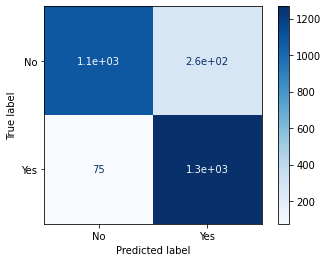

In [ ]:
labels=['No','Yes']
plot_confusion_matrix(model, X_test, Y_test,display_labels=labels, cmap=plt.cm.Blues)
plt.show()

In [ ]:
knn_pred_prob = model.predict_proba(X_test)[:,1]
knn_auroc = roc_auc_score(Y_test, knn_pred_prob)
print("XGBoost AUROC: {}".format(knn_auroc))
knn_y_pred = model.predict(X_test)
print(classification_report(Y_test, knn_y_pred,digits=4))

XGBoost AUROC: 0.9415504359415104
              precision    recall  f1-score   support

           0     0.9351    0.8049    0.8651      1343
           1     0.8286    0.9441    0.8826      1342

    accuracy                         0.8745      2685
   macro avg     0.8819    0.8745    0.8739      2685
weighted avg     0.8819    0.8745    0.8739      2685



#SVM

In [ ]:
Features_modelsvm1_M=X.copy()

In [ ]:
X_train, X_test, Y_train, Y_test= train_test_split(Features_modelsvm1_M,Y, train_size=0.89, random_state=6,stratify=Y)

In [ ]:
robust = RobustScaler()
X_train=robust.fit_transform(X_train)
X_test=robust.transform(X_test)

In [ ]:
model = svm.SVC(kernel='poly')
model.fit(X_train, Y_train)

SVC(C=1.0, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='poly',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)

In [ ]:
print(model.score(X_test, Y_test))
print(model.score(X_train, Y_train))

0.778169014084507
0.8196953210010881


In [ ]:
y_pred = model.predict(X_test)

In [ ]:
accuracy = accuracy_score(Y_test, y_pred)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

Accuracy: 77.82%


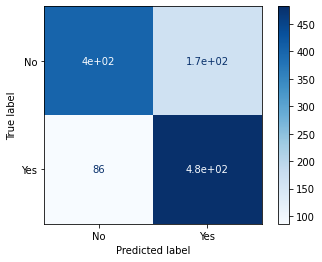

In [ ]:
labels=['No','Yes']
plot_confusion_matrix(model, X_test, Y_test,display_labels=labels, cmap=plt.cm.Blues)
plt.show()

In [ ]:
knn_pred_prob = model.predict(X_test)
knn_auroc = roc_auc_score(Y_test, knn_pred_prob)
print("SVM AUROC: {}".format(knn_auroc))
knn_y_pred = model.predict(X_test)
print(classification_report(Y_test, knn_y_pred,digits=4))

SVM AUROC: 0.778169014084507
              precision    recall  f1-score   support

           0     0.8238    0.7077    0.7614       568
           1     0.7438    0.8486    0.7928       568

    accuracy                         0.7782      1136
   macro avg     0.7838    0.7782    0.7771      1136
weighted avg     0.7838    0.7782    0.7771      1136



#Using AutoML (TPOT)

In [ ]:
Features_model_autoML=X.copy()

In [ ]:
All_features=['Latitude','Longitude','Gender_Male','Gender_Female','Multiple Lines_No phone service','Phone Service','Multiple Lines_No','Multiple Lines_Yes','Streaming Movies_Yes','Streaming TV_Yes','Device Protection_Yes','Online Backup_Yes','Payment Method_Mailed check','Payment Method_Bank transfer (automatic)','Internet Service_DSL','Streaming TV_No','Streaming Movies_No','Payment Method_Credit card (automatic)','Partner','Senior Citizen_No','Senior Citizen_Yes','Tech Support_Yes','Online Security_Yes','Contract_One year','Paperless Billing','Monthly Charges','Total Charges','Device Protection_No internet service','Streaming Movies_No internet service','Streaming TV_No internet service','Tech Support_No internet service','Online Security_No internet service','Online Backup_No internet service','Internet Service_No','Dependents','Device Protection_No','Online Backup_No','Payment Method_Electronic check','Contract_Two year','Internet Service_Fiber optic','Tech Support_No','Online Security_No','Tenure Months','Contract_Month-to-month']

In [ ]:
To_drop=All_features[:12]
Features_model_autoML=Features_model_autoML.drop(To_drop,axis=1)

In [ ]:
X_train, X_test, Y_train, Y_test= train_test_split(Features_model_autoML,Y, train_size=0.85, random_state=6,stratify=Y)

##generations=2 and population_size=20

In [ ]:

cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=3)
model = TPOTClassifier(scoring='accuracy',generations=2,population_size=20, cv=cv,verbosity=3,n_jobs=-1)
model.fit(X_train, Y_train)


In [ ]:
model.score(X_test,Y_test)

In [ ]:
model.export('/content/drive/MyDrive/ML project/tpot_sonar_best_model.py')

In [ ]:

training_features, testing_features, training_target, testing_target = \
            train_test_split(Features_model_autoML, Y, random_state=3,stratify=Y)

exported_pipeline = make_pipeline(
    StandardScaler(),
    RandomForestClassifier(bootstrap=True, criterion="gini", max_features=0.8, min_samples_leaf=9, min_samples_split=19, n_estimators=100)
)

exported_pipeline.fit(training_features, training_target)
results = exported_pipeline.predict(testing_features)

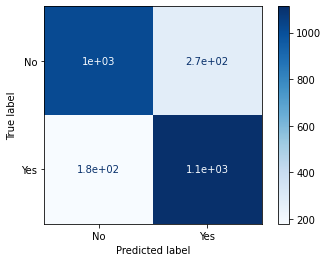

In [ ]:
labels=['No','Yes']
plot_confusion_matrix(exported_pipeline, testing_features, testing_target,display_labels=labels, cmap=plt.cm.Blues)
plt.show()

In [ ]:
tpot_auroc = roc_auc_score(testing_target, results)
print("TPOT AUROC: {}".format(tpot_auroc))
print(classification_report(testing_target, results,digits=6))

TPOT AUROC: 0.8249419054996128
              precision    recall  f1-score   support

           0   0.851046  0.787761  0.818182      1291
           1   0.802451  0.862122  0.831217      1291

    accuracy                       0.824942      2582
   macro avg   0.826749  0.824942  0.824700      2582
weighted avg   0.826749  0.824942  0.824700      2582



##generations=10 and population_size=50

In [ ]:
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=3)
model = TPOTClassifier(scoring='accuracy',generations=10,population_size=50, cv=cv,verbosity=3,n_jobs=-1)
model.fit(X_train, Y_train)

In [ ]:
model.score(X_test,Y_test)


In [ ]:
model.export('/content/drive/MyDrive/ML project/tpot_sonar_best_model1.py')

In [ ]:

training_features, testing_features, training_target, testing_target = train_test_split(Features_model_autoML, Y, random_state=3,stratify=Y)


exported_pipeline = make_pipeline(
    ZeroCount(),
    RandomForestClassifier(bootstrap=True, criterion="gini", max_features=0.2, min_samples_leaf=9, min_samples_split=12, n_estimators=100)
)

exported_pipeline.fit(training_features, training_target)
results = exported_pipeline.predict(testing_features)

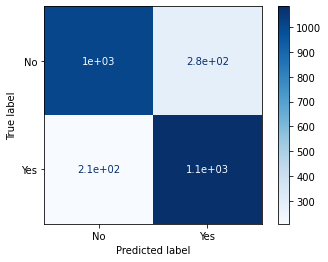

In [ ]:
labels=['No','Yes']
plot_confusion_matrix(exported_pipeline, testing_features, testing_target,display_labels=labels, cmap=plt.cm.Blues)
plt.show()

In [ ]:
tpot_auroc = roc_auc_score(testing_target, results)
print("TPOT AUROC: {}".format(tpot_auroc))
print(classification_report(testing_target, results,digits=6))

TPOT AUROC: 0.8094500387296669
              precision    recall  f1-score   support

           0   0.828807  0.780015  0.803671      1291
           1   0.792246  0.838885  0.814898      1291

    accuracy                       0.809450      2582
   macro avg   0.810526  0.809450  0.809285      2582
weighted avg   0.810526  0.809450  0.809285      2582



##generations=15 and population_size=75

In [ ]:

cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=3)
model = TPOTClassifier(scoring='accuracy',generations=15,population_size=75, cv=cv,verbosity=3,n_jobs=-1)
model.fit(X_train, Y_train)

32 operators have been imported by TPOT.


Skipped pipeline #40 due to time out. Continuing to the next pipeline.
_pre_test decorator: _random_mutation_operator: num_test=0 '(slice(None, None, None), 0)' is an invalid key.
_pre_test decorator: _random_mutation_operator: num_test=0 Unsupported set of arguments: The combination of penalty='l1' and loss='squared_hinge' are not supported when dual=True, Parameters: penalty='l1', loss='squared_hinge', dual=True.
_pre_test decorator: _random_mutation_operator: num_test=0 Unsupported set of arguments: The combination of penalty='l1' and loss='squared_hinge' are not supported when dual=True, Parameters: penalty='l1', loss='squared_hinge', dual=True.
_pre_test decorator: _random_mutation_operator: num_test=0 Solver lbfgs supports only dual=False, got dual=True.
_pre_test decorator: _random_mutation_operator: num_test=0 Expected n_neighbors <= n_samples,  but n_samples = 50, n_neighbors = 54.
_pre_test decorator: _random_mutation_operator: num_test=0 '(slice(None, None, None), 0)' is an 

TPOTClassifier(config_dict=None, crossover_rate=0.1,
               cv=RepeatedStratifiedKFold(n_repeats=3, n_splits=5, random_state=3),
               disable_update_check=False, early_stop=None, generations=15,
               log_file=None, max_eval_time_mins=5, max_time_mins=None,
               memory=None, mutation_rate=0.9, n_jobs=-1, offspring_size=None,
               periodic_checkpoint_folder=None, population_size=75,
               random_state=None, scoring='accuracy', subsample=1.0,
               template=None, use_dask=False, verbosity=3, warm_start=False)

In [ ]:
model.score(X_test,Y_test)

0.9440758293838862

In [ ]:
model.export('/content/drive/MyDrive/ML project/tpot_sonar_best_model2.py')

In [ ]:

training_features, testing_features, training_target, testing_target = train_test_split(Features_model_autoML, Y, random_state=3,stratify=Y)
exported_pipeline = make_pipeline(
    StackingEstimator(estimator=MLPClassifier(alpha=0.001, learning_rate_init=0.5)),
    GradientBoostingClassifier(learning_rate=0.1, max_depth=3, max_features=0.3, min_samples_leaf=5, min_samples_split=2, n_estimators=100, subsample=0.8)
)

exported_pipeline.fit(training_features, training_target)
results = exported_pipeline.predict(testing_features)

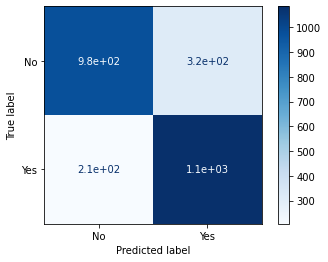

In [ ]:
labels=['No','Yes']
plot_confusion_matrix(exported_pipeline, testing_features, testing_target,display_labels=labels, cmap=plt.cm.Blues)
plt.show()

In [ ]:
tpot_auroc = roc_auc_score(testing_target, results)
print("TPOT AUROC: {}".format(tpot_auroc))
print(classification_report(testing_target, results,digits=6))

TPOT AUROC: 0.7982184353214562
              precision    recall  f1-score   support

           0   0.825719  0.756003  0.789325      1291
           1   0.775000  0.840434  0.806392      1291

    accuracy                       0.798218      2582
   macro avg   0.800360  0.798218  0.797858      2582
weighted avg   0.800360  0.798218  0.797858      2582



##generations=20 and population_size=90

In [ ]:

cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=3)
model = TPOTClassifier(scoring='accuracy',generations=20,population_size=90, cv=cv,verbosity=3,n_jobs=-1)
model.fit(X_train, Y_train)

In [ ]:
model.score(X_test,Y_test)

In [ ]:
model.export('/content/drive/MyDrive/ML project/tpot_sonar_best_model3.py')

##loop(generations=2 and population_size=10)

In [ ]:
Features_model_autoML=X.copy()

In [ ]:
All_features=['Latitude','Longitude','Gender_Male','Gender_Female','Multiple Lines_No phone service','Phone Service','Multiple Lines_No','Multiple Lines_Yes','Streaming Movies_Yes','Streaming TV_Yes','Device Protection_Yes','Online Backup_Yes','Payment Method_Mailed check','Payment Method_Bank transfer (automatic)','Internet Service_DSL','Streaming TV_No','Streaming Movies_No','Payment Method_Credit card (automatic)','Partner','Senior Citizen_No','Senior Citizen_Yes','Tech Support_Yes','Online Security_Yes','Contract_One year','Paperless Billing','Monthly Charges','Total Charges','Device Protection_No internet service','Streaming Movies_No internet service','Streaming TV_No internet service','Tech Support_No internet service','Online Security_No internet service','Online Backup_No internet service','Internet Service_No','Dependents','Device Protection_No','Online Backup_No','Payment Method_Electronic check','Contract_Two year','Internet Service_Fiber optic','Tech Support_No','Online Security_No','Tenure Months','Contract_Month-to-month']

In [ ]:
start = timeit.default_timer()
for j in np.arange(len(All_features)-1,0,-1):
  print(j)
  Features_model_autoML=X.copy()
  To_drop=All_features[:j]
  Features_model_autoML=Features_model_autoML.drop(To_drop,axis=1)
  for k in np.arange (0.75,0.90,0.01):
    X_train, X_test, Y_train, Y_test= train_test_split(Features_model_autoML,Y, train_size=k, random_state=6,stratify=Y)
    cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=3)
    model = TPOTClassifier(scoring='roc_auc',generations=2,population_size=10, cv=cv,verbosity=3,n_jobs=-1)
    model.fit(X_train, Y_train)
    model.score(X_test,Y_test)
    model.export('/content/drive/MyDrive/ML project/tpot/tpot_sonar_best_model{},{}.py'.format(len(Features_model_autoML.columns),k))
  print('when we have '+str(j)+' features')
stop = timeit.default_timer()
print('Time: ', stop - start)

43
32 operators have been imported by TPOT.


Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]


Generation 1 - Current Pareto front scores:

-1	0.7259807729710206	BernoulliNB(input_matrix, BernoulliNB__alpha=0.001, BernoulliNB__fit_prior=True)
Pipeline encountered that has previously been evaluated during the optimization process. Using the score from the previous evaluation.

Generation 2 - Current Pareto front scores:

-1	0.7259807729710206	BernoulliNB(input_matrix, BernoulliNB__alpha=0.001, BernoulliNB__fit_prior=True)
32 operators have been imported by TPOT.


Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Found array with 0 feature(s) (shape=(50, 0)) while a minimum of 1 is required..
_pre_test decorator: _random_mutation_operator: num_test=1 Found array with 1 feature(s) (shape=(50, 1)) while a minimum of 2 is required..
_pre_test decorator: _random_mutation_operator: num_test=0 Found array with 1 feature(s) (shape=(50, 1)) while a minimum of 2 is required..

Generation 1 - Current Pareto front scores:

-1	0.7257354629749989	ExtraTreesClassifier(input_matrix, ExtraTreesClassifier__bootstrap=False, ExtraTreesClassifier__criterion=entropy, ExtraTreesClassifier__max_features=0.35000000000000003, ExtraTreesClassifier__min_samples_leaf=4, ExtraTreesClassifier__min_samples_split=3, ExtraTreesClassifier__n_estimators=100)
_pre_test decorator: _random_mutation_operator: num_test=0 No feature in X meets the variance threshold 0.20000.
Pipeline encountered that has previously been evaluated during the optimization process. Using the scor

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty..
_pre_test decorator: _random_mutation_operator: num_test=0 Unsupported set of arguments: The combination of penalty='l2' and loss='hinge' are not supported when dual=False, Parameters: penalty='l2', loss='hinge', dual=False.

Generation 1 - Current Pareto front scores:

-1	0.7261867028005552	MLPClassifier(input_matrix, MLPClassifier__alpha=0.0001, MLPClassifier__learning_rate_init=0.01)
_pre_test decorator: _random_mutation_operator: num_test=0 Found array with 1 feature(s) (shape=(50, 1)) while a minimum of 2 is required..

Generation 2 - Current Pareto front scores:

-1	0.7261867028005552	MLPClassifier(input_matrix, MLPClassifier__alpha=0.0001, MLPClassifier__learning_rate_init=0.01)

-2	0.7262066503157774	MLPClassifier(Nystroem(input_matrix, Nystroem__gamma=0.15000000000000002, Nystroem__kernel=sigmoid, Nystroem__n_components=8), MLPClassifier__alpha=0.000

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Unsupported set of arguments: The combination of penalty='l1' and loss='squared_hinge' are not supported when dual=True, Parameters: penalty='l1', loss='squared_hinge', dual=True.
_pre_test decorator: _random_mutation_operator: num_test=0 Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty..

Generation 1 - Current Pareto front scores:

-1	0.7260994405314182	KNeighborsClassifier(input_matrix, KNeighborsClassifier__n_neighbors=10, KNeighborsClassifier__p=2, KNeighborsClassifier__weights=uniform)
_pre_test decorator: _random_mutation_operator: num_test=0 Unsupported set of arguments: The combination of penalty='l2' and loss='hinge' are not supported when dual=False, Parameters: penalty='l2', loss='hinge', dual=False.

Generation 2 - Current Pareto front scores:

-1	0.7260994405314182	KNeighborsClassifier(input_matrix, KNeighborsClassifier__n_neighbors=10, KNeighborsClassifier__p=2, KNeighborsClassifier__weights=un

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 array must not contain infs or NaNs.
Pipeline encountered that has previously been evaluated during the optimization process. Using the score from the previous evaluation.

Generation 1 - Current Pareto front scores:

-1	0.7251244536669474	GaussianNB(input_matrix)

-2	0.7251395906010667	MLPClassifier(SelectFwe(input_matrix, SelectFwe__alpha=0.026000000000000002), MLPClassifier__alpha=0.001, MLPClassifier__learning_rate_init=0.001)

-3	0.7252019928625849	LogisticRegression(RBFSampler(Normalizer(input_matrix, Normalizer__norm=l1), RBFSampler__gamma=0.5), LogisticRegression__C=0.1, LogisticRegression__dual=False, LogisticRegression__penalty=l2)
Pipeline encountered that has previously been evaluated during the optimization process. Using the score from the previous evaluation.

Generation 2 - Current Pareto front scores:

-1	0.7251244536669474	GaussianNB(input_matrix)

-2	0.7251609928224868	MLPClassifier(PCA(input_matrix, PCA__ite

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty..

Generation 1 - Current Pareto front scores:

-1	0.7261501210653752	LogisticRegression(input_matrix, LogisticRegression__C=20.0, LogisticRegression__dual=False, LogisticRegression__penalty=l2)
Pipeline encountered that has previously been evaluated during the optimization process. Using the score from the previous evaluation.
Pipeline encountered that has previously been evaluated during the optimization process. Using the score from the previous evaluation.

Generation 2 - Current Pareto front scores:

-1	0.7261501210653752	LogisticRegression(input_matrix, LogisticRegression__C=20.0, LogisticRegression__dual=False, LogisticRegression__penalty=l2)
32 operators have been imported by TPOT.


Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Expected n_neighbors <= n_samples,  but n_samples = 50, n_neighbors = 64.

Generation 1 - Current Pareto front scores:

-1	0.7272816830824754	GaussianNB(input_matrix)
_pre_test decorator: _random_mutation_operator: num_test=0 feature_names mismatch: ['Contract_Month-to-month'] ['f0']
expected Contract_Month-to-month in input data
training data did not have the following fields: f0.
_pre_test decorator: _random_mutation_operator: num_test=0 Found array with 1 feature(s) (shape=(50, 1)) while a minimum of 2 is required by FeatureAgglomeration..

Generation 2 - Current Pareto front scores:

-1	0.7272816830824754	GaussianNB(input_matrix)
32 operators have been imported by TPOT.


Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Found array with 1 feature(s) (shape=(50, 1)) while a minimum of 2 is required..
_pre_test decorator: _random_mutation_operator: num_test=0 Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty..

Generation 1 - Current Pareto front scores:

-1	0.728457644511803	RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=False, RandomForestClassifier__criterion=gini, RandomForestClassifier__max_features=0.15000000000000002, RandomForestClassifier__min_samples_leaf=7, RandomForestClassifier__min_samples_split=4, RandomForestClassifier__n_estimators=100)

-2	0.7285118246878836	LogisticRegression(RBFSampler(input_matrix, RBFSampler__gamma=0.2), LogisticRegression__C=15.0, LogisticRegression__dual=False, LogisticRegression__penalty=l2)
_pre_test decorator: _random_mutation_operator: num_test=0 Solver lbfgs supports only dual=False, got dual=True.
_pre_test decorator: _random_mutation_operator: num_test=1 So

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Negative values in data passed to MultinomialNB (input X).

Generation 1 - Current Pareto front scores:

-1	0.7282380396732788	BernoulliNB(input_matrix, BernoulliNB__alpha=1.0, BernoulliNB__fit_prior=False)
_pre_test decorator: _random_mutation_operator: num_test=0 Unsupported set of arguments: The combination of penalty='l1' and loss='hinge' is not supported, Parameters: penalty='l1', loss='hinge', dual=True.

Generation 2 - Current Pareto front scores:

-1	0.7282380396732788	BernoulliNB(input_matrix, BernoulliNB__alpha=1.0, BernoulliNB__fit_prior=False)
32 operators have been imported by TPOT.


Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]


Generation 1 - Current Pareto front scores:

-1	0.7282181436774582	DecisionTreeClassifier(input_matrix, DecisionTreeClassifier__criterion=entropy, DecisionTreeClassifier__max_depth=5, DecisionTreeClassifier__min_samples_leaf=10, DecisionTreeClassifier__min_samples_split=6)

Generation 2 - Current Pareto front scores:

-1	0.7282181436774582	DecisionTreeClassifier(input_matrix, DecisionTreeClassifier__criterion=entropy, DecisionTreeClassifier__max_depth=5, DecisionTreeClassifier__min_samples_leaf=10, DecisionTreeClassifier__min_samples_split=6)
32 operators have been imported by TPOT.


Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]


Generation 1 - Current Pareto front scores:

-1	0.728591378941636	ExtraTreesClassifier(input_matrix, ExtraTreesClassifier__bootstrap=True, ExtraTreesClassifier__criterion=gini, ExtraTreesClassifier__max_features=1.0, ExtraTreesClassifier__min_samples_leaf=4, ExtraTreesClassifier__min_samples_split=3, ExtraTreesClassifier__n_estimators=100)
_pre_test decorator: _random_mutation_operator: num_test=0 feature_names mismatch: ['Contract_Month-to-month'] ['f0']
expected Contract_Month-to-month in input data
training data did not have the following fields: f0.

Generation 2 - Current Pareto front scores:

-1	0.728591378941636	ExtraTreesClassifier(input_matrix, ExtraTreesClassifier__bootstrap=True, ExtraTreesClassifier__criterion=gini, ExtraTreesClassifier__max_features=1.0, ExtraTreesClassifier__min_samples_leaf=4, ExtraTreesClassifier__min_samples_split=3, ExtraTreesClassifier__n_estimators=100)
32 operators have been imported by TPOT.


Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]


Generation 1 - Current Pareto front scores:

-1	0.7290540540540539	SGDClassifier(input_matrix, SGDClassifier__alpha=0.0, SGDClassifier__eta0=0.01, SGDClassifier__fit_intercept=False, SGDClassifier__l1_ratio=1.0, SGDClassifier__learning_rate=invscaling, SGDClassifier__loss=hinge, SGDClassifier__penalty=elasticnet, SGDClassifier__power_t=0.0)

Generation 2 - Current Pareto front scores:

-1	0.7290540540540539	SGDClassifier(input_matrix, SGDClassifier__alpha=0.0, SGDClassifier__eta0=0.01, SGDClassifier__fit_intercept=False, SGDClassifier__l1_ratio=1.0, SGDClassifier__learning_rate=invscaling, SGDClassifier__loss=hinge, SGDClassifier__penalty=elasticnet, SGDClassifier__power_t=0.0)
32 operators have been imported by TPOT.


Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Found array with 1 feature(s) (shape=(50, 1)) while a minimum of 2 is required..
_pre_test decorator: _random_mutation_operator: num_test=0 Found array with 1 feature(s) (shape=(50, 1)) while a minimum of 2 is required..

Generation 1 - Current Pareto front scores:

-1	0.7286923604797212	GradientBoostingClassifier(input_matrix, GradientBoostingClassifier__learning_rate=0.01, GradientBoostingClassifier__max_depth=5, GradientBoostingClassifier__max_features=0.8500000000000001, GradientBoostingClassifier__min_samples_leaf=5, GradientBoostingClassifier__min_samples_split=18, GradientBoostingClassifier__n_estimators=100, GradientBoostingClassifier__subsample=0.9000000000000001)
_pre_test decorator: _random_mutation_operator: num_test=0 Found array with 1 feature(s) (shape=(50, 1)) while a minimum of 2 is required..
Pipeline encountered that has previously been evaluated during the optimization process. Using the score from the previ

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty..

Generation 1 - Current Pareto front scores:

-1	0.729033817478664	RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=False, RandomForestClassifier__criterion=entropy, RandomForestClassifier__max_features=0.8500000000000001, RandomForestClassifier__min_samples_leaf=8, RandomForestClassifier__min_samples_split=10, RandomForestClassifier__n_estimators=100)
_pre_test decorator: _random_mutation_operator: num_test=0 Found array with 1 feature(s) (shape=(50, 1)) while a minimum of 2 is required..

Generation 2 - Current Pareto front scores:

-1	0.729073396169704	MLPClassifier(input_matrix, MLPClassifier__alpha=0.001, MLPClassifier__learning_rate_init=0.01)
32 operators have been imported by TPOT.


Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]


Generation 1 - Current Pareto front scores:

-1	0.7285104726992289	MLPClassifier(input_matrix, MLPClassifier__alpha=0.001, MLPClassifier__learning_rate_init=0.001)
Pipeline encountered that has previously been evaluated during the optimization process. Using the score from the previous evaluation.

Generation 2 - Current Pareto front scores:

-1	0.7285104726992289	MLPClassifier(input_matrix, MLPClassifier__alpha=0.001, MLPClassifier__learning_rate_init=0.001)

-2	0.7285357718388606	MLPClassifier(RBFSampler(input_matrix, RBFSampler__gamma=0.1), MLPClassifier__alpha=0.001, MLPClassifier__learning_rate_init=0.001)
32 operators have been imported by TPOT.


Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty..
_pre_test decorator: _random_mutation_operator: num_test=0 Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty..

Generation 1 - Current Pareto front scores:

-1	0.7288126902554485	LinearSVC(input_matrix, LinearSVC__C=0.01, LinearSVC__dual=False, LinearSVC__loss=squared_hinge, LinearSVC__penalty=l1, LinearSVC__tol=0.01)

-2	0.7288261918588208	LinearSVC(MLPClassifier(input_matrix, MLPClassifier__alpha=0.001, MLPClassifier__learning_rate_init=0.01), LinearSVC__C=0.01, LinearSVC__dual=False, LinearSVC__loss=squared_hinge, LinearSVC__penalty=l1, LinearSVC__tol=0.01)
_pre_test decorator: _random_mutation_operator: num_test=0 Found array with 1 feature(s) (shape=(50, 1)) while a minimum of 2 is required by FeatureAgglomeration..
_pre_test decorator: _random_mutation_operator: num_test=0 Found array with 1 feature(s) (shape=(50, 1)) while a minimum o

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty..

Generation 1 - Current Pareto front scores:

-1	0.7862254866042092	XGBClassifier(input_matrix, XGBClassifier__learning_rate=0.1, XGBClassifier__max_depth=9, XGBClassifier__min_child_weight=8, XGBClassifier__n_estimators=100, XGBClassifier__n_jobs=1, XGBClassifier__subsample=0.7500000000000001, XGBClassifier__verbosity=0)
_pre_test decorator: _random_mutation_operator: num_test=0 [14:49:13] ../src/learner.cc:567: Check failed: mparam_.num_feature != 0 (0 vs. 0) : 0 feature is supplied.  Are you using raw Booster interface?
Stack trace:
  [bt] (0) /usr/local/lib/python3.6/dist-packages/xgboost/lib/libxgboost.so(+0x8d264) [0x7fa2932ec264]
  [bt] (1) /usr/local/lib/python3.6/dist-packages/xgboost/lib/libxgboost.so(+0x1ae8d2) [0x7fa29340d8d2]
  [bt] (2) /usr/local/lib/python3.6/dist-packages/xgboost/lib/libxgboost.so(+0x1bc0ac) [0x7fa29341b0ac]
  [bt] (3) /usr/lo

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Found array with 0 feature(s) (shape=(50, 0)) while a minimum of 1 is required..
_pre_test decorator: _random_mutation_operator: num_test=1 Found array with 0 feature(s) (shape=(50, 0)) while a minimum of 1 is required..
_pre_test decorator: _random_mutation_operator: num_test=0 Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty..
Pipeline encountered that has previously been evaluated during the optimization process. Using the score from the previous evaluation.

Generation 1 - Current Pareto front scores:

-1	0.7850008752131628	RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=True, RandomForestClassifier__criterion=gini, RandomForestClassifier__max_features=0.6500000000000001, RandomForestClassifier__min_samples_leaf=15, RandomForestClassifier__min_samples_split=2, RandomForestClassifier__n_estimators=100)
_pre_test decorator: _random_mutation_operator: num_test=0 feature_names mismatch:

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 feature_names mismatch: ['Tenure Months', 'Contract_Month-to-month'] ['f0', 'f1']
expected Contract_Month-to-month, Tenure Months in input data
training data did not have the following fields: f0, f1.

Generation 1 - Current Pareto front scores:

-1	0.7876492010704207	ExtraTreesClassifier(input_matrix, ExtraTreesClassifier__bootstrap=True, ExtraTreesClassifier__criterion=entropy, ExtraTreesClassifier__max_features=0.45, ExtraTreesClassifier__min_samples_leaf=9, ExtraTreesClassifier__min_samples_split=11, ExtraTreesClassifier__n_estimators=100)

Generation 2 - Current Pareto front scores:

-1	0.787798057372818	ExtraTreesClassifier(input_matrix, ExtraTreesClassifier__bootstrap=True, ExtraTreesClassifier__criterion=entropy, ExtraTreesClassifier__max_features=0.45, ExtraTreesClassifier__min_samples_leaf=9, ExtraTreesClassifier__min_samples_split=18, ExtraTreesClassifier__n_estimators=100)
32 operators have been imported by TPOT.


Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Found array with 0 feature(s) (shape=(50, 0)) while a minimum of 1 is required..
Pipeline encountered that has previously been evaluated during the optimization process. Using the score from the previous evaluation.

Generation 1 - Current Pareto front scores:

-1	0.7874356041224578	RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=True, RandomForestClassifier__criterion=entropy, RandomForestClassifier__max_features=0.45, RandomForestClassifier__min_samples_leaf=2, RandomForestClassifier__min_samples_split=4, RandomForestClassifier__n_estimators=100)
_pre_test decorator: _random_mutation_operator: num_test=0 Expected n_neighbors <= n_samples,  but n_samples = 50, n_neighbors = 64.
Pipeline encountered that has previously been evaluated during the optimization process. Using the score from the previous evaluation.

Generation 2 - Current Pareto front scores:

-1	0.7874356041224578	RandomForestClassifier(inpu

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty..

Generation 1 - Current Pareto front scores:

-1	0.7843442389749615	RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=True, RandomForestClassifier__criterion=gini, RandomForestClassifier__max_features=0.35000000000000003, RandomForestClassifier__min_samples_leaf=10, RandomForestClassifier__min_samples_split=6, RandomForestClassifier__n_estimators=100)

-2	0.7843809610523208	ExtraTreesClassifier(KNeighborsClassifier(input_matrix, KNeighborsClassifier__n_neighbors=13, KNeighborsClassifier__p=1, KNeighborsClassifier__weights=uniform), ExtraTreesClassifier__bootstrap=True, ExtraTreesClassifier__criterion=entropy, ExtraTreesClassifier__max_features=0.8, ExtraTreesClassifier__min_samples_leaf=2, ExtraTreesClassifier__min_samples_split=6, ExtraTreesClassifier__n_estimators=100)

Generation 2 - Current Pareto front scores:

-1	0.7845958390924838	

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]


Generation 1 - Current Pareto front scores:

-1	0.7852485406687812	ExtraTreesClassifier(input_matrix, ExtraTreesClassifier__bootstrap=True, ExtraTreesClassifier__criterion=gini, ExtraTreesClassifier__max_features=0.6000000000000001, ExtraTreesClassifier__min_samples_leaf=20, ExtraTreesClassifier__min_samples_split=4, ExtraTreesClassifier__n_estimators=100)

-2	0.7862487712694961	DecisionTreeClassifier(GradientBoostingClassifier(input_matrix, GradientBoostingClassifier__learning_rate=0.01, GradientBoostingClassifier__max_depth=4, GradientBoostingClassifier__max_features=0.6000000000000001, GradientBoostingClassifier__min_samples_leaf=17, GradientBoostingClassifier__min_samples_split=14, GradientBoostingClassifier__n_estimators=100, GradientBoostingClassifier__subsample=0.55), DecisionTreeClassifier__criterion=gini, DecisionTreeClassifier__max_depth=9, DecisionTreeClassifier__min_samples_leaf=6, DecisionTreeClassifier__min_samples_split=15)

Generation 2 - Current Pareto front scores:



Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]


Generation 1 - Current Pareto front scores:

-1	0.7874177584995835	GradientBoostingClassifier(input_matrix, GradientBoostingClassifier__learning_rate=0.1, GradientBoostingClassifier__max_depth=7, GradientBoostingClassifier__max_features=0.05, GradientBoostingClassifier__min_samples_leaf=1, GradientBoostingClassifier__min_samples_split=4, GradientBoostingClassifier__n_estimators=100, GradientBoostingClassifier__subsample=0.6000000000000001)
_pre_test decorator: _random_mutation_operator: num_test=0 Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty..
_pre_test decorator: _random_mutation_operator: num_test=0 l1 was provided as affinity. Ward can only work with euclidean distances..

Generation 2 - Current Pareto front scores:

-1	0.7874177584995835	GradientBoostingClassifier(input_matrix, GradientBoostingClassifier__learning_rate=0.1, GradientBoostingClassifier__max_depth=7, GradientBoostingClassifier__max_features=0.05, GradientBoostingClassifier__min_samples_leaf=1, 

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Solver lbfgs supports only dual=False, got dual=True.
_pre_test decorator: _random_mutation_operator: num_test=0 Unsupported set of arguments: The combination of penalty='l1' and loss='squared_hinge' are not supported when dual=True, Parameters: penalty='l1', loss='squared_hinge', dual=True.
Pipeline encountered that has previously been evaluated during the optimization process. Using the score from the previous evaluation.

Generation 1 - Current Pareto front scores:

-1	0.787947067200845	ExtraTreesClassifier(input_matrix, ExtraTreesClassifier__bootstrap=False, ExtraTreesClassifier__criterion=entropy, ExtraTreesClassifier__max_features=0.5, ExtraTreesClassifier__min_samples_leaf=16, ExtraTreesClassifier__min_samples_split=16, ExtraTreesClassifier__n_estimators=100)

-2	0.7879519034141447	ExtraTreesClassifier(MLPClassifier(input_matrix, MLPClassifier__alpha=0.001, MLPClassifier__learning_rate_init=0.001), ExtraTreesClassifier__

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]


Generation 1 - Current Pareto front scores:

-1	0.7908821896868719	GradientBoostingClassifier(input_matrix, GradientBoostingClassifier__learning_rate=0.01, GradientBoostingClassifier__max_depth=6, GradientBoostingClassifier__max_features=0.45, GradientBoostingClassifier__min_samples_leaf=6, GradientBoostingClassifier__min_samples_split=9, GradientBoostingClassifier__n_estimators=100, GradientBoostingClassifier__subsample=0.9500000000000001)
Pipeline encountered that has previously been evaluated during the optimization process. Using the score from the previous evaluation.

Generation 2 - Current Pareto front scores:

-1	0.7908821896868719	GradientBoostingClassifier(input_matrix, GradientBoostingClassifier__learning_rate=0.01, GradientBoostingClassifier__max_depth=6, GradientBoostingClassifier__max_features=0.45, GradientBoostingClassifier__min_samples_leaf=6, GradientBoostingClassifier__min_samples_split=9, GradientBoostingClassifier__n_estimators=100, GradientBoostingClassifier__sub

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Negative values in data passed to MultinomialNB (input X).
_pre_test decorator: _random_mutation_operator: num_test=0 Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty..

Generation 1 - Current Pareto front scores:

-1	0.7879958211731349	GradientBoostingClassifier(input_matrix, GradientBoostingClassifier__learning_rate=0.01, GradientBoostingClassifier__max_depth=8, GradientBoostingClassifier__max_features=0.8500000000000001, GradientBoostingClassifier__min_samples_leaf=15, GradientBoostingClassifier__min_samples_split=15, GradientBoostingClassifier__n_estimators=100, GradientBoostingClassifier__subsample=0.7000000000000001)

-2	0.788057265493817	GradientBoostingClassifier(GaussianNB(input_matrix), GradientBoostingClassifier__learning_rate=0.01, GradientBoostingClassifier__max_depth=8, GradientBoostingClassifier__max_features=0.8500000000000001, GradientBoostingClassifier__min_samples_leaf=15, GradientBoostingC

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty..

Generation 1 - Current Pareto front scores:

-1	0.7883651980477128	ExtraTreesClassifier(input_matrix, ExtraTreesClassifier__bootstrap=False, ExtraTreesClassifier__criterion=gini, ExtraTreesClassifier__max_features=0.9000000000000001, ExtraTreesClassifier__min_samples_leaf=14, ExtraTreesClassifier__min_samples_split=19, ExtraTreesClassifier__n_estimators=100)
_pre_test decorator: _random_mutation_operator: num_test=0 Unsupported set of arguments: The combination of penalty='l1' and loss='hinge' is not supported, Parameters: penalty='l1', loss='hinge', dual=True.
_pre_test decorator: _random_mutation_operator: num_test=0 Unsupported set of arguments: The combination of penalty='l1' and loss='hinge' is not supported, Parameters: penalty='l1', loss='hinge', dual=False.
_pre_test decorator: _random_mutation_operator: num_test=1 '(slice(None, None, None), 0)' is a

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty..

Generation 1 - Current Pareto front scores:

-1	0.7900452817682546	GradientBoostingClassifier(input_matrix, GradientBoostingClassifier__learning_rate=0.001, GradientBoostingClassifier__max_depth=8, GradientBoostingClassifier__max_features=0.4, GradientBoostingClassifier__min_samples_leaf=1, GradientBoostingClassifier__min_samples_split=8, GradientBoostingClassifier__n_estimators=100, GradientBoostingClassifier__subsample=0.5)

Generation 2 - Current Pareto front scores:

-1	0.7900452817682546	GradientBoostingClassifier(input_matrix, GradientBoostingClassifier__learning_rate=0.001, GradientBoostingClassifier__max_depth=8, GradientBoostingClassifier__max_features=0.4, GradientBoostingClassifier__min_samples_leaf=1, GradientBoostingClassifier__min_samples_split=8, GradientBoostingClassifier__n_estimators=100, GradientBoostingClassifier__subsample=0.5)
32 operat

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Negative values in data passed to MultinomialNB (input X).
_pre_test decorator: _random_mutation_operator: num_test=1 Unsupported set of arguments: The combination of penalty='l1' and loss='hinge' is not supported, Parameters: penalty='l1', loss='hinge', dual=True.
Pipeline encountered that has previously been evaluated during the optimization process. Using the score from the previous evaluation.

Generation 1 - Current Pareto front scores:

-1	0.7888410055867628	RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=True, RandomForestClassifier__criterion=gini, RandomForestClassifier__max_features=0.4, RandomForestClassifier__min_samples_leaf=4, RandomForestClassifier__min_samples_split=15, RandomForestClassifier__n_estimators=100)

-2	0.7889829083095274	RandomForestClassifier(RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=False, RandomForestClassifier__criterion=gini, RandomForestClass

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 '(slice(None, None, None), 0)' is an invalid key.

Generation 1 - Current Pareto front scores:

-1	0.7892007330739906	GradientBoostingClassifier(input_matrix, GradientBoostingClassifier__learning_rate=0.01, GradientBoostingClassifier__max_depth=10, GradientBoostingClassifier__max_features=0.8, GradientBoostingClassifier__min_samples_leaf=14, GradientBoostingClassifier__min_samples_split=17, GradientBoostingClassifier__n_estimators=100, GradientBoostingClassifier__subsample=0.25)

-2	0.7901848994987556	LogisticRegression(RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=True, RandomForestClassifier__criterion=gini, RandomForestClassifier__max_features=0.7500000000000001, RandomForestClassifier__min_samples_leaf=6, RandomForestClassifier__min_samples_split=17, RandomForestClassifier__n_estimators=100), LogisticRegression__C=0.1, LogisticRegression__dual=False, LogisticRegression__penalty=l2)
_pre_test decorat

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Found array with 0 feature(s) (shape=(50, 0)) while a minimum of 1 is required..

Generation 1 - Current Pareto front scores:

-1	0.7891113844944295	RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=False, RandomForestClassifier__criterion=entropy, RandomForestClassifier__max_features=0.8500000000000001, RandomForestClassifier__min_samples_leaf=16, RandomForestClassifier__min_samples_split=9, RandomForestClassifier__n_estimators=100)

-2	0.7893038710841096	RandomForestClassifier(MLPClassifier(input_matrix, MLPClassifier__alpha=0.1, MLPClassifier__learning_rate_init=0.01), RandomForestClassifier__bootstrap=False, RandomForestClassifier__criterion=entropy, RandomForestClassifier__max_features=0.8500000000000001, RandomForestClassifier__min_samples_leaf=16, RandomForestClassifier__min_samples_split=9, RandomForestClassifier__n_estimators=100)

-3	0.7893370638710526	RandomForestClassifier(RFE(MLPClassifier(inpu

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]


Generation 1 - Current Pareto front scores:

-1	0.7879134092895548	RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=False, RandomForestClassifier__criterion=gini, RandomForestClassifier__max_features=0.6000000000000001, RandomForestClassifier__min_samples_leaf=17, RandomForestClassifier__min_samples_split=19, RandomForestClassifier__n_estimators=100)

-2	0.7895064478573243	GaussianNB(RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=True, RandomForestClassifier__criterion=entropy, RandomForestClassifier__max_features=0.7000000000000001, RandomForestClassifier__min_samples_leaf=19, RandomForestClassifier__min_samples_split=3, RandomForestClassifier__n_estimators=100))

Generation 2 - Current Pareto front scores:

-1	0.7888447765550737	GradientBoostingClassifier(input_matrix, GradientBoostingClassifier__learning_rate=0.1, GradientBoostingClassifier__max_depth=6, GradientBoostingClassifier__max_features=0.25, GradientBoostingClassifier__min_samp

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 '(slice(None, None, None), 0)' is an invalid key.
_pre_test decorator: _random_mutation_operator: num_test=0 Negative values in data passed to MultinomialNB (input X).

Generation 1 - Current Pareto front scores:

-1	0.818545549967739	ExtraTreesClassifier(input_matrix, ExtraTreesClassifier__bootstrap=True, ExtraTreesClassifier__criterion=entropy, ExtraTreesClassifier__max_features=0.4, ExtraTreesClassifier__min_samples_leaf=16, ExtraTreesClassifier__min_samples_split=10, ExtraTreesClassifier__n_estimators=100)
_pre_test decorator: _random_mutation_operator: num_test=0 Expected n_neighbors <= n_samples,  but n_samples = 50, n_neighbors = 66.

Generation 2 - Current Pareto front scores:

-1	0.818545549967739	ExtraTreesClassifier(input_matrix, ExtraTreesClassifier__bootstrap=True, ExtraTreesClassifier__criterion=entropy, ExtraTreesClassifier__max_features=0.4, ExtraTreesClassifier__min_samples_leaf=16, ExtraTreesClassifier__min_sa

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]


Generation 1 - Current Pareto front scores:

-1	0.8139914155974369	MLPClassifier(input_matrix, MLPClassifier__alpha=0.01, MLPClassifier__learning_rate_init=0.1)

-2	0.8171839052266611	RandomForestClassifier(SelectFwe(input_matrix, SelectFwe__alpha=0.015), RandomForestClassifier__bootstrap=True, RandomForestClassifier__criterion=entropy, RandomForestClassifier__max_features=0.7000000000000001, RandomForestClassifier__min_samples_leaf=12, RandomForestClassifier__min_samples_split=15, RandomForestClassifier__n_estimators=100)
_pre_test decorator: _random_mutation_operator: num_test=0 Unsupported set of arguments: The combination of penalty='l1' and loss='squared_hinge' are not supported when dual=True, Parameters: penalty='l1', loss='squared_hinge', dual=True.

Generation 2 - Current Pareto front scores:

-1	0.8193176696050646	GradientBoostingClassifier(input_matrix, GradientBoostingClassifier__learning_rate=0.01, GradientBoostingClassifier__max_depth=8, GradientBoostingClassifier__max_f

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]


Generation 1 - Current Pareto front scores:

-1	0.8212485031727469	GradientBoostingClassifier(input_matrix, GradientBoostingClassifier__learning_rate=0.001, GradientBoostingClassifier__max_depth=8, GradientBoostingClassifier__max_features=1.0, GradientBoostingClassifier__min_samples_leaf=10, GradientBoostingClassifier__min_samples_split=18, GradientBoostingClassifier__n_estimators=100, GradientBoostingClassifier__subsample=0.55)

-2	0.8216996196254933	GradientBoostingClassifier(RBFSampler(input_matrix, RBFSampler__gamma=0.15000000000000002), GradientBoostingClassifier__learning_rate=0.01, GradientBoostingClassifier__max_depth=5, GradientBoostingClassifier__max_features=0.8500000000000001, GradientBoostingClassifier__min_samples_leaf=11, GradientBoostingClassifier__min_samples_split=19, GradientBoostingClassifier__n_estimators=100, GradientBoostingClassifier__subsample=0.9500000000000001)
_pre_test decorator: _random_mutation_operator: num_test=0 Expected n_neighbors <= n_samples,  but

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]


Generation 1 - Current Pareto front scores:

-1	0.8223367355713928	GradientBoostingClassifier(input_matrix, GradientBoostingClassifier__learning_rate=0.001, GradientBoostingClassifier__max_depth=7, GradientBoostingClassifier__max_features=0.6000000000000001, GradientBoostingClassifier__min_samples_leaf=9, GradientBoostingClassifier__min_samples_split=5, GradientBoostingClassifier__n_estimators=100, GradientBoostingClassifier__subsample=0.4)
_pre_test decorator: _random_mutation_operator: num_test=0 '(slice(None, None, None), 0)' is an invalid key.
_pre_test decorator: _random_mutation_operator: num_test=1 Solver lbfgs supports only dual=False, got dual=True.

Generation 2 - Current Pareto front scores:

-1	0.8223367355713928	GradientBoostingClassifier(input_matrix, GradientBoostingClassifier__learning_rate=0.001, GradientBoostingClassifier__max_depth=7, GradientBoostingClassifier__max_features=0.6000000000000001, GradientBoostingClassifier__min_samples_leaf=9, GradientBoostingClassifi

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 [15:37:52] ../src/learner.cc:567: Check failed: mparam_.num_feature != 0 (0 vs. 0) : 0 feature is supplied.  Are you using raw Booster interface?
Stack trace:
  [bt] (0) /usr/local/lib/python3.6/dist-packages/xgboost/lib/libxgboost.so(+0x8d264) [0x7fa2932ec264]
  [bt] (1) /usr/local/lib/python3.6/dist-packages/xgboost/lib/libxgboost.so(+0x1ae8d2) [0x7fa29340d8d2]
  [bt] (2) /usr/local/lib/python3.6/dist-packages/xgboost/lib/libxgboost.so(+0x1bc0ac) [0x7fa29341b0ac]
  [bt] (3) /usr/local/lib/python3.6/dist-packages/xgboost/lib/libxgboost.so(+0x1a29cb) [0x7fa2934019cb]
  [bt] (4) /usr/local/lib/python3.6/dist-packages/xgboost/lib/libxgboost.so(XGBoosterUpdateOneIter+0x58) [0x7fa2932df0c8]
  [bt] (5) /usr/lib/x86_64-linux-gnu/libffi.so.6(ffi_call_unix64+0x4c) [0x7fa2dfb60dae]
  [bt] (6) /usr/lib/x86_64-linux-gnu/libffi.so.6(ffi_call+0x22f) [0x7fa2dfb6071f]
  [bt] (7) /usr/lib/python3.6/lib-dynload/_ctypes.cpython-36m-x86_64-linux-

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 feature_names mismatch: ['Tenure Months', 'Online Security_No', 'Contract_Month-to-month'] ['f0', 'f1', 'f2']
expected Contract_Month-to-month, Online Security_No, Tenure Months in input data
training data did not have the following fields: f0, f1, f2.
_pre_test decorator: _random_mutation_operator: num_test=1 feature_names mismatch: ['Tenure Months', 'Online Security_No', 'Contract_Month-to-month'] ['f0', 'f1', 'f2']
expected Contract_Month-to-month, Online Security_No, Tenure Months in input data
training data did not have the following fields: f0, f1, f2.

Generation 1 - Current Pareto front scores:

-1	0.817777312016447	RandomForestClassifier(CombineDFs(input_matrix, input_matrix), RandomForestClassifier__bootstrap=False, RandomForestClassifier__criterion=gini, RandomForestClassifier__max_features=0.25, RandomForestClassifier__min_samples_leaf=18, RandomForestClassifier__min_samples_split=17, RandomForestClassifier__n_estim

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 feature_names mismatch: ['Tenure Months', 'Online Security_No', 'Contract_Month-to-month'] ['f0', 'f1', 'f2']
expected Contract_Month-to-month, Online Security_No, Tenure Months in input data
training data did not have the following fields: f0, f1, f2.

Generation 1 - Current Pareto front scores:

-1	0.817231194887364	XGBClassifier(input_matrix, XGBClassifier__learning_rate=0.5, XGBClassifier__max_depth=5, XGBClassifier__min_child_weight=7, XGBClassifier__n_estimators=100, XGBClassifier__n_jobs=1, XGBClassifier__subsample=0.4, XGBClassifier__verbosity=0)

-2	0.8189456658781306	DecisionTreeClassifier(GradientBoostingClassifier(input_matrix, GradientBoostingClassifier__learning_rate=0.5, GradientBoostingClassifier__max_depth=10, GradientBoostingClassifier__max_features=0.8, GradientBoostingClassifier__min_samples_leaf=8, GradientBoostingClassifier__min_samples_split=14, GradientBoostingClassifier__n_estimators=100, GradientBoosti

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]


Generation 1 - Current Pareto front scores:

-1	0.8198491347498309	XGBClassifier(input_matrix, XGBClassifier__learning_rate=0.1, XGBClassifier__max_depth=7, XGBClassifier__min_child_weight=20, XGBClassifier__n_estimators=100, XGBClassifier__n_jobs=1, XGBClassifier__subsample=0.5, XGBClassifier__verbosity=0)
_pre_test decorator: _random_mutation_operator: num_test=0 feature_names mismatch: ['Tenure Months', 'Online Security_No', 'Contract_Month-to-month'] ['f0', 'f1', 'f2']
expected Contract_Month-to-month, Online Security_No, Tenure Months in input data
training data did not have the following fields: f0, f1, f2.
_pre_test decorator: _random_mutation_operator: num_test=0 Negative values in data passed to MultinomialNB (input X).
_pre_test decorator: _random_mutation_operator: num_test=1 Negative values in data passed to MultinomialNB (input X).
Pipeline encountered that has previously been evaluated during the optimization process. Using the score from the previous evaluation.

Genera

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 cosine was provided as affinity. Ward can only work with euclidean distances..

Generation 1 - Current Pareto front scores:

-1	0.8190932703745712	RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=False, RandomForestClassifier__criterion=gini, RandomForestClassifier__max_features=0.25, RandomForestClassifier__min_samples_leaf=6, RandomForestClassifier__min_samples_split=6, RandomForestClassifier__n_estimators=100)
_pre_test decorator: _random_mutation_operator: num_test=0 '(slice(None, None, None), 0)' is an invalid key.
_pre_test decorator: _random_mutation_operator: num_test=0 Negative values in data passed to MultinomialNB (input X).

Generation 2 - Current Pareto front scores:

-1	0.8190932703745712	RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=False, RandomForestClassifier__criterion=gini, RandomForestClassifier__max_features=0.25, RandomForestClassifier__min_samples_leaf=6, Ra

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty..

Generation 1 - Current Pareto front scores:

-1	0.8202583377216588	ExtraTreesClassifier(input_matrix, ExtraTreesClassifier__bootstrap=False, ExtraTreesClassifier__criterion=gini, ExtraTreesClassifier__max_features=0.7000000000000001, ExtraTreesClassifier__min_samples_leaf=6, ExtraTreesClassifier__min_samples_split=7, ExtraTreesClassifier__n_estimators=100)

-2	0.820408892323489	ExtraTreesClassifier(ZeroCount(input_matrix), ExtraTreesClassifier__bootstrap=False, ExtraTreesClassifier__criterion=gini, ExtraTreesClassifier__max_features=0.7000000000000001, ExtraTreesClassifier__min_samples_leaf=6, ExtraTreesClassifier__min_samples_split=7, ExtraTreesClassifier__n_estimators=100)
_pre_test decorator: _random_mutation_operator: num_test=0 Expected n_neighbors <= n_samples,  but n_samples = 50, n_neighbors = 98.

Generation 2 - Current Pareto front scores:

-1	0.82

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Solver lbfgs supports only dual=False, got dual=True.

Generation 1 - Current Pareto front scores:

-1	0.8213095005002782	RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=False, RandomForestClassifier__criterion=gini, RandomForestClassifier__max_features=0.6500000000000001, RandomForestClassifier__min_samples_leaf=14, RandomForestClassifier__min_samples_split=20, RandomForestClassifier__n_estimators=100)

-2	0.8256598380675874	GaussianNB(RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=True, RandomForestClassifier__criterion=entropy, RandomForestClassifier__max_features=0.8, RandomForestClassifier__min_samples_leaf=3, RandomForestClassifier__min_samples_split=13, RandomForestClassifier__n_estimators=100))
Pipeline encountered that has previously been evaluated during the optimization process. Using the score from the previous evaluation.

Generation 2 - Current Pareto front scores:

-

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]


Generation 1 - Current Pareto front scores:

-1	0.8204872524551579	XGBClassifier(input_matrix, XGBClassifier__learning_rate=0.001, XGBClassifier__max_depth=7, XGBClassifier__min_child_weight=15, XGBClassifier__n_estimators=100, XGBClassifier__n_jobs=1, XGBClassifier__subsample=0.6000000000000001, XGBClassifier__verbosity=0)

-2	0.8208094073803534	XGBClassifier(ZeroCount(input_matrix), XGBClassifier__learning_rate=0.01, XGBClassifier__max_depth=10, XGBClassifier__min_child_weight=18, XGBClassifier__n_estimators=100, XGBClassifier__n_jobs=1, XGBClassifier__subsample=0.3, XGBClassifier__verbosity=0)
Pipeline encountered that has previously been evaluated during the optimization process. Using the score from the previous evaluation.

Generation 2 - Current Pareto front scores:

-1	0.8231248562751943	XGBClassifier(input_matrix, XGBClassifier__learning_rate=0.001, XGBClassifier__max_depth=7, XGBClassifier__min_child_weight=4, XGBClassifier__n_estimators=100, XGBClassifier__n_jobs=1, XGBClas

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Unsupported set of arguments: The combination of penalty='l1' and loss='hinge' is not supported, Parameters: penalty='l1', loss='hinge', dual=False.
_pre_test decorator: _random_mutation_operator: num_test=0 '(slice(None, None, None), 0)' is an invalid key.

Generation 1 - Current Pareto front scores:

-1	0.8232668783661538	GradientBoostingClassifier(input_matrix, GradientBoostingClassifier__learning_rate=0.001, GradientBoostingClassifier__max_depth=9, GradientBoostingClassifier__max_features=0.2, GradientBoostingClassifier__min_samples_leaf=3, GradientBoostingClassifier__min_samples_split=5, GradientBoostingClassifier__n_estimators=100, GradientBoostingClassifier__subsample=0.35000000000000003)
_pre_test decorator: _random_mutation_operator: num_test=0 Solver lbfgs supports only dual=False, got dual=True.

Generation 2 - Current Pareto front scores:

-1	0.8232668783661538	GradientBoostingClassifier(input_matrix, GradientBoosti

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]


Generation 1 - Current Pareto front scores:

-1	0.8227347368437364	RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=True, RandomForestClassifier__criterion=gini, RandomForestClassifier__max_features=0.9500000000000001, RandomForestClassifier__min_samples_leaf=17, RandomForestClassifier__min_samples_split=20, RandomForestClassifier__n_estimators=100)

Generation 2 - Current Pareto front scores:

-1	0.8227347368437364	RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=True, RandomForestClassifier__criterion=gini, RandomForestClassifier__max_features=0.9500000000000001, RandomForestClassifier__min_samples_leaf=17, RandomForestClassifier__min_samples_split=20, RandomForestClassifier__n_estimators=100)
32 operators have been imported by TPOT.


Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty..
Pipeline encountered that has previously been evaluated during the optimization process. Using the score from the previous evaluation.

Generation 1 - Current Pareto front scores:

-1	0.823940366652024	XGBClassifier(input_matrix, XGBClassifier__learning_rate=0.01, XGBClassifier__max_depth=6, XGBClassifier__min_child_weight=1, XGBClassifier__n_estimators=100, XGBClassifier__n_jobs=1, XGBClassifier__subsample=0.3, XGBClassifier__verbosity=0)
_pre_test decorator: _random_mutation_operator: num_test=0 feature_names mismatch: ['Tenure Months', 'Online Security_No', 'Contract_Month-to-month'] ['f0', 'f1', 'f2']
expected Contract_Month-to-month, Online Security_No, Tenure Months in input data
training data did not have the following fields: f0, f1, f2.
_pre_test decorator: _random_mutation_operator: num_test=0 Unsupported set of arguments: The combination of penalty

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

Pipeline encountered that has previously been evaluated during the optimization process. Using the score from the previous evaluation.

Generation 1 - Current Pareto front scores:

-1	0.8211523221843718	RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=True, RandomForestClassifier__criterion=gini, RandomForestClassifier__max_features=0.6000000000000001, RandomForestClassifier__min_samples_leaf=5, RandomForestClassifier__min_samples_split=8, RandomForestClassifier__n_estimators=100)

-2	0.8212899520479056	RandomForestClassifier(ExtraTreesClassifier(input_matrix, ExtraTreesClassifier__bootstrap=False, ExtraTreesClassifier__criterion=gini, ExtraTreesClassifier__max_features=0.5, ExtraTreesClassifier__min_samples_leaf=18, ExtraTreesClassifier__min_samples_split=2, ExtraTreesClassifier__n_estimators=100), RandomForestClassifier__bootstrap=True, RandomForestClassifier__criterion=gini, RandomForestClassifier__max_features=0.4, RandomForestClassifier__min_samples_leaf=5, R

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Unsupported set of arguments: The combination of penalty='l1' and loss='hinge' is not supported, Parameters: penalty='l1', loss='hinge', dual=False.
_pre_test decorator: _random_mutation_operator: num_test=0 '(slice(None, None, None), 0)' is an invalid key.

Generation 1 - Current Pareto front scores:

-1	0.8291923051104434	ExtraTreesClassifier(input_matrix, ExtraTreesClassifier__bootstrap=True, ExtraTreesClassifier__criterion=entropy, ExtraTreesClassifier__max_features=0.5, ExtraTreesClassifier__min_samples_leaf=5, ExtraTreesClassifier__min_samples_split=15, ExtraTreesClassifier__n_estimators=100)
_pre_test decorator: _random_mutation_operator: num_test=0 feature_names mismatch: ['Tenure Months', 'Online Security_No', 'Tech Support_No', 'Contract_Month-to-month'] ['f0', 'f1', 'f2', 'f3']
expected Contract_Month-to-month, Online Security_No, Tenure Months, Tech Support_No in input data
training data did not have the following f

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]


Generation 1 - Current Pareto front scores:

-1	0.8299143755883626	ExtraTreesClassifier(input_matrix, ExtraTreesClassifier__bootstrap=True, ExtraTreesClassifier__criterion=gini, ExtraTreesClassifier__max_features=0.05, ExtraTreesClassifier__min_samples_leaf=2, ExtraTreesClassifier__min_samples_split=2, ExtraTreesClassifier__n_estimators=100)

-2	0.8301806330954631	ExtraTreesClassifier(ZeroCount(input_matrix), ExtraTreesClassifier__bootstrap=True, ExtraTreesClassifier__criterion=gini, ExtraTreesClassifier__max_features=0.05, ExtraTreesClassifier__min_samples_leaf=2, ExtraTreesClassifier__min_samples_split=2, ExtraTreesClassifier__n_estimators=100)

Generation 2 - Current Pareto front scores:

-1	0.8299273189457536	ExtraTreesClassifier(input_matrix, ExtraTreesClassifier__bootstrap=True, ExtraTreesClassifier__criterion=gini, ExtraTreesClassifier__max_features=0.05, ExtraTreesClassifier__min_samples_leaf=2, ExtraTreesClassifier__min_samples_split=3, ExtraTreesClassifier__n_estimators=100)

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty..

Generation 1 - Current Pareto front scores:

-1	0.8246674574433286	KNeighborsClassifier(input_matrix, KNeighborsClassifier__n_neighbors=65, KNeighborsClassifier__p=1, KNeighborsClassifier__weights=distance)

-3	0.8253820534578277	XGBClassifier(RFE(GradientBoostingClassifier(input_matrix, GradientBoostingClassifier__learning_rate=1.0, GradientBoostingClassifier__max_depth=1, GradientBoostingClassifier__max_features=0.1, GradientBoostingClassifier__min_samples_leaf=15, GradientBoostingClassifier__min_samples_split=19, GradientBoostingClassifier__n_estimators=100, GradientBoostingClassifier__subsample=0.2), RFE__ExtraTreesClassifier__criterion=gini, RFE__ExtraTreesClassifier__max_features=0.55, RFE__ExtraTreesClassifier__n_estimators=100, RFE__step=0.15000000000000002), XGBClassifier__learning_rate=0.001, XGBClassifier__max_depth=7, XGBClassifier__min_child_wei

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 feature_names mismatch: ['Tenure Months', 'Online Security_No', 'Tech Support_No', 'Contract_Month-to-month'] ['f0', 'f1', 'f2', 'f3']
expected Contract_Month-to-month, Online Security_No, Tenure Months, Tech Support_No in input data
training data did not have the following fields: f3, f0, f1, f2.

Generation 1 - Current Pareto front scores:

-1	0.8323543524386258	ExtraTreesClassifier(input_matrix, ExtraTreesClassifier__bootstrap=True, ExtraTreesClassifier__criterion=entropy, ExtraTreesClassifier__max_features=0.05, ExtraTreesClassifier__min_samples_leaf=2, ExtraTreesClassifier__min_samples_split=19, ExtraTreesClassifier__n_estimators=100)

-2	0.8324340596638211	RandomForestClassifier(MultinomialNB(input_matrix, MultinomialNB__alpha=100.0, MultinomialNB__fit_prior=True), RandomForestClassifier__bootstrap=True, RandomForestClassifier__criterion=gini, RandomForestClassifier__max_features=0.05, RandomForestClassifier__min_samples_

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Unsupported set of arguments: The combination of penalty='l2' and loss='hinge' are not supported when dual=False, Parameters: penalty='l2', loss='hinge', dual=False.

Generation 1 - Current Pareto front scores:

-1	0.8267073923240352	RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=False, RandomForestClassifier__criterion=entropy, RandomForestClassifier__max_features=0.9500000000000001, RandomForestClassifier__min_samples_leaf=3, RandomForestClassifier__min_samples_split=3, RandomForestClassifier__n_estimators=100)

-2	0.8295887080898962	ExtraTreesClassifier(MaxAbsScaler(input_matrix), ExtraTreesClassifier__bootstrap=False, ExtraTreesClassifier__criterion=gini, ExtraTreesClassifier__max_features=1.0, ExtraTreesClassifier__min_samples_leaf=11, ExtraTreesClassifier__min_samples_split=13, ExtraTreesClassifier__n_estimators=100)
_pre_test decorator: _random_mutation_operator: num_test=0 Unsupported set of argu

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Found array with 0 feature(s) (shape=(50, 0)) while a minimum of 1 is required..
_pre_test decorator: _random_mutation_operator: num_test=0 Unsupported set of arguments: The combination of penalty='l2' and loss='hinge' are not supported when dual=False, Parameters: penalty='l2', loss='hinge', dual=False.

Generation 1 - Current Pareto front scores:

-1	0.8308197366852514	ExtraTreesClassifier(input_matrix, ExtraTreesClassifier__bootstrap=True, ExtraTreesClassifier__criterion=gini, ExtraTreesClassifier__max_features=0.7500000000000001, ExtraTreesClassifier__min_samples_leaf=3, ExtraTreesClassifier__min_samples_split=20, ExtraTreesClassifier__n_estimators=100)

Generation 2 - Current Pareto front scores:

-1	0.8320419204740213	ExtraTreesClassifier(input_matrix, ExtraTreesClassifier__bootstrap=True, ExtraTreesClassifier__criterion=gini, ExtraTreesClassifier__max_features=0.7500000000000001, ExtraTreesClassifier__min_samples_leaf=3,

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

Pipeline encountered that has previously been evaluated during the optimization process. Using the score from the previous evaluation.

Generation 1 - Current Pareto front scores:

-1	0.828798402867223	KNeighborsClassifier(input_matrix, KNeighborsClassifier__n_neighbors=70, KNeighborsClassifier__p=1, KNeighborsClassifier__weights=distance)

-2	0.830307997230856	LinearSVC(RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=True, RandomForestClassifier__criterion=gini, RandomForestClassifier__max_features=0.4, RandomForestClassifier__min_samples_leaf=9, RandomForestClassifier__min_samples_split=13, RandomForestClassifier__n_estimators=100), LinearSVC__C=10.0, LinearSVC__dual=False, LinearSVC__loss=squared_hinge, LinearSVC__penalty=l1, LinearSVC__tol=0.001)

Generation 2 - Current Pareto front scores:

-1	0.828798402867223	KNeighborsClassifier(input_matrix, KNeighborsClassifier__n_neighbors=70, KNeighborsClassifier__p=1, KNeighborsClassifier__weights=distance)

-2	0.832

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Negative values in data passed to MultinomialNB (input X).
Pipeline encountered that has previously been evaluated during the optimization process. Using the score from the previous evaluation.

Generation 1 - Current Pareto front scores:

-1	0.8317190998316097	GradientBoostingClassifier(input_matrix, GradientBoostingClassifier__learning_rate=0.01, GradientBoostingClassifier__max_depth=9, GradientBoostingClassifier__max_features=0.4, GradientBoostingClassifier__min_samples_leaf=16, GradientBoostingClassifier__min_samples_split=17, GradientBoostingClassifier__n_estimators=100, GradientBoostingClassifier__subsample=0.7000000000000001)

-2	0.8338621064759969	ExtraTreesClassifier(MLPClassifier(input_matrix, MLPClassifier__alpha=0.1, MLPClassifier__learning_rate_init=0.1), ExtraTreesClassifier__bootstrap=True, ExtraTreesClassifier__criterion=gini, ExtraTreesClassifier__max_features=0.2, ExtraTreesClassifier__min_samples_leaf=3, Extr

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]


Generation 1 - Current Pareto front scores:

-1	0.8304392816928066	RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=False, RandomForestClassifier__criterion=gini, RandomForestClassifier__max_features=0.8, RandomForestClassifier__min_samples_leaf=10, RandomForestClassifier__min_samples_split=8, RandomForestClassifier__n_estimators=100)

-2	0.8336568865457868	ExtraTreesClassifier(GradientBoostingClassifier(input_matrix, GradientBoostingClassifier__learning_rate=0.001, GradientBoostingClassifier__max_depth=4, GradientBoostingClassifier__max_features=1.0, GradientBoostingClassifier__min_samples_leaf=3, GradientBoostingClassifier__min_samples_split=13, GradientBoostingClassifier__n_estimators=100, GradientBoostingClassifier__subsample=0.05), ExtraTreesClassifier__bootstrap=False, ExtraTreesClassifier__criterion=gini, ExtraTreesClassifier__max_features=1.0, ExtraTreesClassifier__min_samples_leaf=4, ExtraTreesClassifier__min_samples_split=15, ExtraTreesClassifier__n_est

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]


Generation 1 - Current Pareto front scores:

-1	0.8308553044330139	RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=False, RandomForestClassifier__criterion=entropy, RandomForestClassifier__max_features=0.15000000000000002, RandomForestClassifier__min_samples_leaf=11, RandomForestClassifier__min_samples_split=16, RandomForestClassifier__n_estimators=100)

-2	0.8318323157243233	ExtraTreesClassifier(MinMaxScaler(input_matrix), ExtraTreesClassifier__bootstrap=True, ExtraTreesClassifier__criterion=entropy, ExtraTreesClassifier__max_features=1.0, ExtraTreesClassifier__min_samples_leaf=6, ExtraTreesClassifier__min_samples_split=17, ExtraTreesClassifier__n_estimators=100)
_pre_test decorator: _random_mutation_operator: num_test=0 Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty..

Generation 2 - Current Pareto front scores:

-1	0.8308553044330139	RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=False, RandomForestClassifier__crit

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Unsupported set of arguments: The combination of penalty='l1' and loss='squared_hinge' are not supported when dual=True, Parameters: penalty='l1', loss='squared_hinge', dual=True.

Generation 1 - Current Pareto front scores:

-1	0.8329108299447008	GradientBoostingClassifier(input_matrix, GradientBoostingClassifier__learning_rate=0.01, GradientBoostingClassifier__max_depth=6, GradientBoostingClassifier__max_features=0.7000000000000001, GradientBoostingClassifier__min_samples_leaf=7, GradientBoostingClassifier__min_samples_split=12, GradientBoostingClassifier__n_estimators=100, GradientBoostingClassifier__subsample=0.45)
_pre_test decorator: _random_mutation_operator: num_test=0 Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty..
Pipeline encountered that has previously been evaluated during the optimization process. Using the score from the previous evaluation.

Generation 2 - Current Pareto front scores:

-1	0

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Negative values in data passed to MultinomialNB (input X).
_pre_test decorator: _random_mutation_operator: num_test=0 Negative values in data passed to MultinomialNB (input X).
_pre_test decorator: _random_mutation_operator: num_test=0 Negative values in data passed to MultinomialNB (input X).

Generation 1 - Current Pareto front scores:

-1	0.8346673954359766	ExtraTreesClassifier(input_matrix, ExtraTreesClassifier__bootstrap=True, ExtraTreesClassifier__criterion=entropy, ExtraTreesClassifier__max_features=0.7500000000000001, ExtraTreesClassifier__min_samples_leaf=5, ExtraTreesClassifier__min_samples_split=8, ExtraTreesClassifier__n_estimators=100)
_pre_test decorator: _random_mutation_operator: num_test=0 Negative values in data passed to MultinomialNB (input X).
_pre_test decorator: _random_mutation_operator: num_test=1 Negative values in data passed to MultinomialNB (input X).

Generation 2 - Current Pareto front scores:

-1

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Solver lbfgs supports only dual=False, got dual=True.

Generation 1 - Current Pareto front scores:

-1	0.8314179967576089	KNeighborsClassifier(input_matrix, KNeighborsClassifier__n_neighbors=97, KNeighborsClassifier__p=1, KNeighborsClassifier__weights=distance)

-2	0.8314362758138161	MLPClassifier(ExtraTreesClassifier(input_matrix, ExtraTreesClassifier__bootstrap=False, ExtraTreesClassifier__criterion=gini, ExtraTreesClassifier__max_features=0.25, ExtraTreesClassifier__min_samples_leaf=4, ExtraTreesClassifier__min_samples_split=4, ExtraTreesClassifier__n_estimators=100), MLPClassifier__alpha=0.001, MLPClassifier__learning_rate_init=0.001)
_pre_test decorator: _random_mutation_operator: num_test=0 '(slice(None, None, None), 0)' is an invalid key.
Pipeline encountered that has previously been evaluated during the optimization process. Using the score from the previous evaluation.

Generation 2 - Current Pareto front scores:

-1	0

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 '(slice(None, None, None), 0)' is an invalid key.

Generation 1 - Current Pareto front scores:

-1	0.8318806846154729	GradientBoostingClassifier(input_matrix, GradientBoostingClassifier__learning_rate=0.1, GradientBoostingClassifier__max_depth=4, GradientBoostingClassifier__max_features=0.3, GradientBoostingClassifier__min_samples_leaf=20, GradientBoostingClassifier__min_samples_split=9, GradientBoostingClassifier__n_estimators=100, GradientBoostingClassifier__subsample=1.0)

-2	0.83245663067007	XGBClassifier(GradientBoostingClassifier(input_matrix, GradientBoostingClassifier__learning_rate=0.01, GradientBoostingClassifier__max_depth=3, GradientBoostingClassifier__max_features=0.2, GradientBoostingClassifier__min_samples_leaf=11, GradientBoostingClassifier__min_samples_split=7, GradientBoostingClassifier__n_estimators=100, GradientBoostingClassifier__subsample=0.15000000000000002), XGBClassifier__learning_rate=0.01, XGBClassifi

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Expected n_neighbors <= n_samples,  but n_samples = 50, n_neighbors = 81.

Generation 1 - Current Pareto front scores:

-1	0.8345300497339248	ExtraTreesClassifier(input_matrix, ExtraTreesClassifier__bootstrap=True, ExtraTreesClassifier__criterion=entropy, ExtraTreesClassifier__max_features=0.7500000000000001, ExtraTreesClassifier__min_samples_leaf=6, ExtraTreesClassifier__min_samples_split=13, ExtraTreesClassifier__n_estimators=100)
_pre_test decorator: _random_mutation_operator: num_test=0 '(slice(None, None, None), 0)' is an invalid key.
_pre_test decorator: _random_mutation_operator: num_test=1 feature_names mismatch: ['Tenure Months', 'Online Security_No', 'Tech Support_No', 'Contract_Month-to-month'] ['f0', 'f1', 'f2', 'f3']
expected Contract_Month-to-month, Online Security_No, Tenure Months, Tech Support_No in input data
training data did not have the following fields: f3, f0, f1, f2.

Generation 2 - Current Pareto front 

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Found array with 0 feature(s) (shape=(50, 0)) while a minimum of 1 is required..
_pre_test decorator: _random_mutation_operator: num_test=0 feature_names mismatch: ['Tenure Months', 'Online Security_No', 'Tech Support_No', 'Contract_Month-to-month'] ['f0', 'f1', 'f2', 'f3']
expected Contract_Month-to-month, Online Security_No, Tenure Months, Tech Support_No in input data
training data did not have the following fields: f3, f0, f1, f2.

Generation 1 - Current Pareto front scores:

-1	0.835367409811565	ExtraTreesClassifier(input_matrix, ExtraTreesClassifier__bootstrap=True, ExtraTreesClassifier__criterion=gini, ExtraTreesClassifier__max_features=0.6000000000000001, ExtraTreesClassifier__min_samples_leaf=5, ExtraTreesClassifier__min_samples_split=5, ExtraTreesClassifier__n_estimators=100)

Generation 2 - Current Pareto front scores:

-1	0.835461303397544	ExtraTreesClassifier(input_matrix, ExtraTreesClassifier__bootstrap=False, Ext

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 '(slice(None, None, None), 0)' is an invalid key.

Generation 1 - Current Pareto front scores:

-1	0.8538221214792644	GradientBoostingClassifier(input_matrix, GradientBoostingClassifier__learning_rate=0.1, GradientBoostingClassifier__max_depth=7, GradientBoostingClassifier__max_features=0.45, GradientBoostingClassifier__min_samples_leaf=12, GradientBoostingClassifier__min_samples_split=20, GradientBoostingClassifier__n_estimators=100, GradientBoostingClassifier__subsample=0.8)
Pipeline encountered that has previously been evaluated during the optimization process. Using the score from the previous evaluation.

Generation 2 - Current Pareto front scores:

-1	0.8538221214792644	GradientBoostingClassifier(input_matrix, GradientBoostingClassifier__learning_rate=0.1, GradientBoostingClassifier__max_depth=7, GradientBoostingClassifier__max_features=0.45, GradientBoostingClassifier__min_samples_leaf=12, GradientBoostingClassifier__min

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]


Generation 1 - Current Pareto front scores:

-1	0.8508907313787618	RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=False, RandomForestClassifier__criterion=entropy, RandomForestClassifier__max_features=0.35000000000000003, RandomForestClassifier__min_samples_leaf=7, RandomForestClassifier__min_samples_split=18, RandomForestClassifier__n_estimators=100)
Pipeline encountered that has previously been evaluated during the optimization process. Using the score from the previous evaluation.

Generation 2 - Current Pareto front scores:

-1	0.8508907313787618	RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=False, RandomForestClassifier__criterion=entropy, RandomForestClassifier__max_features=0.35000000000000003, RandomForestClassifier__min_samples_leaf=7, RandomForestClassifier__min_samples_split=18, RandomForestClassifier__n_estimators=100)
32 operators have been imported by TPOT.


Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

Pipeline encountered that has previously been evaluated during the optimization process. Using the score from the previous evaluation.
Pipeline encountered that has previously been evaluated during the optimization process. Using the score from the previous evaluation.

Generation 1 - Current Pareto front scores:

-1	0.8474141267894262	KNeighborsClassifier(input_matrix, KNeighborsClassifier__n_neighbors=39, KNeighborsClassifier__p=1, KNeighborsClassifier__weights=distance)

-2	0.848457734660407	GaussianNB(RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=True, RandomForestClassifier__criterion=entropy, RandomForestClassifier__max_features=0.8500000000000001, RandomForestClassifier__min_samples_leaf=13, RandomForestClassifier__min_samples_split=9, RandomForestClassifier__n_estimators=100))
Pipeline encountered that has previously been evaluated during the optimization process. Using the score from the previous evaluation.
Pipeline encountered that has previously bee

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]


Generation 1 - Current Pareto front scores:

-1	0.8528029450941301	GradientBoostingClassifier(input_matrix, GradientBoostingClassifier__learning_rate=0.5, GradientBoostingClassifier__max_depth=6, GradientBoostingClassifier__max_features=0.55, GradientBoostingClassifier__min_samples_leaf=2, GradientBoostingClassifier__min_samples_split=16, GradientBoostingClassifier__n_estimators=100, GradientBoostingClassifier__subsample=0.8500000000000001)

Generation 2 - Current Pareto front scores:

-1	0.8528029450941301	GradientBoostingClassifier(input_matrix, GradientBoostingClassifier__learning_rate=0.5, GradientBoostingClassifier__max_depth=6, GradientBoostingClassifier__max_features=0.55, GradientBoostingClassifier__min_samples_leaf=2, GradientBoostingClassifier__min_samples_split=16, GradientBoostingClassifier__n_estimators=100, GradientBoostingClassifier__subsample=0.8500000000000001)
32 operators have been imported by TPOT.


Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 l2 was provided as affinity. Ward can only work with euclidean distances..

Generation 1 - Current Pareto front scores:

-1	0.8509337512697648	RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=False, RandomForestClassifier__criterion=entropy, RandomForestClassifier__max_features=0.5, RandomForestClassifier__min_samples_leaf=8, RandomForestClassifier__min_samples_split=4, RandomForestClassifier__n_estimators=100)

-2	0.8515312891641881	RandomForestClassifier(PolynomialFeatures(input_matrix, PolynomialFeatures__degree=2, PolynomialFeatures__include_bias=False, PolynomialFeatures__interaction_only=False), RandomForestClassifier__bootstrap=True, RandomForestClassifier__criterion=entropy, RandomForestClassifier__max_features=0.4, RandomForestClassifier__min_samples_leaf=10, RandomForestClassifier__min_samples_split=4, RandomForestClassifier__n_estimators=100)
_pre_test decorator: _random_mutation_operator: num_t

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]


Generation 1 - Current Pareto front scores:

-1	0.8504232402527229	RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=False, RandomForestClassifier__criterion=entropy, RandomForestClassifier__max_features=0.7500000000000001, RandomForestClassifier__min_samples_leaf=14, RandomForestClassifier__min_samples_split=6, RandomForestClassifier__n_estimators=100)

-2	0.8575210032303642	GaussianNB(RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=False, RandomForestClassifier__criterion=entropy, RandomForestClassifier__max_features=0.5, RandomForestClassifier__min_samples_leaf=5, RandomForestClassifier__min_samples_split=14, RandomForestClassifier__n_estimators=100))

Generation 2 - Current Pareto front scores:

-1	0.8504232402527229	RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=False, RandomForestClassifier__criterion=entropy, RandomForestClassifier__max_features=0.7500000000000001, RandomForestClassifier__min_samples_leaf=14, R

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]


Generation 1 - Current Pareto front scores:

-1	0.8472704672823883	DecisionTreeClassifier(input_matrix, DecisionTreeClassifier__criterion=entropy, DecisionTreeClassifier__max_depth=9, DecisionTreeClassifier__min_samples_leaf=15, DecisionTreeClassifier__min_samples_split=5)

-2	0.8589432997181852	ExtraTreesClassifier(RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=True, RandomForestClassifier__criterion=gini, RandomForestClassifier__max_features=0.05, RandomForestClassifier__min_samples_leaf=3, RandomForestClassifier__min_samples_split=6, RandomForestClassifier__n_estimators=100), ExtraTreesClassifier__bootstrap=True, ExtraTreesClassifier__criterion=gini, ExtraTreesClassifier__max_features=0.25, ExtraTreesClassifier__min_samples_leaf=16, ExtraTreesClassifier__min_samples_split=5, ExtraTreesClassifier__n_estimators=100)

Generation 2 - Current Pareto front scores:

-1	0.8472704672823883	DecisionTreeClassifier(input_matrix, DecisionTreeClassifier__criterion=entropy

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Negative values in data passed to MultinomialNB (input X).
_pre_test decorator: _random_mutation_operator: num_test=1 Expected n_neighbors <= n_samples,  but n_samples = 50, n_neighbors = 84.
_pre_test decorator: _random_mutation_operator: num_test=0 feature_names mismatch: ['Tenure Months', 'Internet Service_Fiber optic', 'Online Security_No', 'Tech Support_No', 'Contract_Month-to-month'] ['f0', 'f1', 'f2', 'f3', 'f4']
expected Internet Service_Fiber optic, Online Security_No, Contract_Month-to-month, Tech Support_No, Tenure Months in input data
training data did not have the following fields: f3, f1, f4, f2, f0.
Pipeline encountered that has previously been evaluated during the optimization process. Using the score from the previous evaluation.

Generation 1 - Current Pareto front scores:

-1	0.8575922322917634	RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=True, RandomForestClassifier__criterion=entro

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty..

Generation 1 - Current Pareto front scores:

-1	0.857403758917683	ExtraTreesClassifier(input_matrix, ExtraTreesClassifier__bootstrap=False, ExtraTreesClassifier__criterion=gini, ExtraTreesClassifier__max_features=0.7500000000000001, ExtraTreesClassifier__min_samples_leaf=1, ExtraTreesClassifier__min_samples_split=19, ExtraTreesClassifier__n_estimators=100)
_pre_test decorator: _random_mutation_operator: num_test=0 Found array with 0 feature(s) (shape=(50, 0)) while a minimum of 1 is required..

Generation 2 - Current Pareto front scores:

-1	0.857403758917683	ExtraTreesClassifier(input_matrix, ExtraTreesClassifier__bootstrap=False, ExtraTreesClassifier__criterion=gini, ExtraTreesClassifier__max_features=0.7500000000000001, ExtraTreesClassifier__min_samples_leaf=1, ExtraTreesClassifier__min_samples_split=19, ExtraTreesClassifier__n_estimators=100)
32 operator

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 l2 was provided as affinity. Ward can only work with euclidean distances..
Pipeline encountered that has previously been evaluated during the optimization process. Using the score from the previous evaluation.

Generation 1 - Current Pareto front scores:

-1	0.8582358872417369	ExtraTreesClassifier(input_matrix, ExtraTreesClassifier__bootstrap=True, ExtraTreesClassifier__criterion=gini, ExtraTreesClassifier__max_features=0.1, ExtraTreesClassifier__min_samples_leaf=3, ExtraTreesClassifier__min_samples_split=4, ExtraTreesClassifier__n_estimators=100)
_pre_test decorator: _random_mutation_operator: num_test=0 Expected n_neighbors <= n_samples,  but n_samples = 50, n_neighbors = 63.
Pipeline encountered that has previously been evaluated during the optimization process. Using the score from the previous evaluation.

Generation 2 - Current Pareto front scores:

-1	0.8582358872417369	ExtraTreesClassifier(input_matrix, ExtraTreesClassi

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]


Generation 1 - Current Pareto front scores:

-1	0.8418698657854041	MLPClassifier(input_matrix, MLPClassifier__alpha=0.001, MLPClassifier__learning_rate_init=0.001)

-2	0.8569814168198525	RandomForestClassifier(PCA(input_matrix, PCA__iterated_power=4, PCA__svd_solver=randomized), RandomForestClassifier__bootstrap=False, RandomForestClassifier__criterion=gini, RandomForestClassifier__max_features=0.5, RandomForestClassifier__min_samples_leaf=18, RandomForestClassifier__min_samples_split=8, RandomForestClassifier__n_estimators=100)
Pipeline encountered that has previously been evaluated during the optimization process. Using the score from the previous evaluation.

Generation 2 - Current Pareto front scores:

-1	0.8528341695060523	GradientBoostingClassifier(input_matrix, GradientBoostingClassifier__learning_rate=0.01, GradientBoostingClassifier__max_depth=10, GradientBoostingClassifier__max_features=0.35000000000000003, GradientBoostingClassifier__min_samples_leaf=13, GradientBoostingCla

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]


Generation 1 - Current Pareto front scores:

-1	0.8543542698103509	RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=False, RandomForestClassifier__criterion=gini, RandomForestClassifier__max_features=0.5, RandomForestClassifier__min_samples_leaf=16, RandomForestClassifier__min_samples_split=2, RandomForestClassifier__n_estimators=100)

-2	0.8554360526066607	ExtraTreesClassifier(PolynomialFeatures(input_matrix, PolynomialFeatures__degree=2, PolynomialFeatures__include_bias=False, PolynomialFeatures__interaction_only=False), ExtraTreesClassifier__bootstrap=False, ExtraTreesClassifier__criterion=entropy, ExtraTreesClassifier__max_features=0.35000000000000003, ExtraTreesClassifier__min_samples_leaf=9, ExtraTreesClassifier__min_samples_split=14, ExtraTreesClassifier__n_estimators=100)
Pipeline encountered that has previously been evaluated during the optimization process. Using the score from the previous evaluation.

Generation 2 - Current Pareto front scores:

-1	0.

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 feature_names mismatch: ['Tenure Months', 'Internet Service_Fiber optic', 'Online Security_No', 'Tech Support_No', 'Contract_Month-to-month'] ['f0', 'f1', 'f2', 'f3', 'f4']
expected Internet Service_Fiber optic, Online Security_No, Contract_Month-to-month, Tech Support_No, Tenure Months in input data
training data did not have the following fields: f3, f1, f4, f2, f0.

Generation 1 - Current Pareto front scores:

-1	0.8585050336314384	RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=True, RandomForestClassifier__criterion=entropy, RandomForestClassifier__max_features=0.15000000000000002, RandomForestClassifier__min_samples_leaf=6, RandomForestClassifier__min_samples_split=14, RandomForestClassifier__n_estimators=100)
_pre_test decorator: _random_mutation_operator: num_test=0 Expected n_neighbors <= n_samples,  but n_samples = 50, n_neighbors = 78.

Generation 2 - Current Pareto front scores:

-1	0.86076592

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]


Generation 1 - Current Pareto front scores:

-1	0.8610901980043231	GradientBoostingClassifier(input_matrix, GradientBoostingClassifier__learning_rate=0.1, GradientBoostingClassifier__max_depth=8, GradientBoostingClassifier__max_features=0.3, GradientBoostingClassifier__min_samples_leaf=19, GradientBoostingClassifier__min_samples_split=9, GradientBoostingClassifier__n_estimators=100, GradientBoostingClassifier__subsample=0.8)
Pipeline encountered that has previously been evaluated during the optimization process. Using the score from the previous evaluation.

Generation 2 - Current Pareto front scores:

-1	0.8610901980043231	GradientBoostingClassifier(input_matrix, GradientBoostingClassifier__learning_rate=0.1, GradientBoostingClassifier__max_depth=8, GradientBoostingClassifier__max_features=0.3, GradientBoostingClassifier__min_samples_leaf=19, GradientBoostingClassifier__min_samples_split=9, GradientBoostingClassifier__n_estimators=100, GradientBoostingClassifier__subsample=0.8)
32 op

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]


Generation 1 - Current Pareto front scores:

-1	0.8572225886190182	ExtraTreesClassifier(input_matrix, ExtraTreesClassifier__bootstrap=True, ExtraTreesClassifier__criterion=entropy, ExtraTreesClassifier__max_features=0.45, ExtraTreesClassifier__min_samples_leaf=3, ExtraTreesClassifier__min_samples_split=15, ExtraTreesClassifier__n_estimators=100)

-2	0.8603309095889266	RandomForestClassifier(ExtraTreesClassifier(input_matrix, ExtraTreesClassifier__bootstrap=False, ExtraTreesClassifier__criterion=gini, ExtraTreesClassifier__max_features=0.25, ExtraTreesClassifier__min_samples_leaf=2, ExtraTreesClassifier__min_samples_split=20, ExtraTreesClassifier__n_estimators=100), RandomForestClassifier__bootstrap=False, RandomForestClassifier__criterion=gini, RandomForestClassifier__max_features=0.15000000000000002, RandomForestClassifier__min_samples_leaf=8, RandomForestClassifier__min_samples_split=19, RandomForestClassifier__n_estimators=100)

Generation 2 - Current Pareto front scores:

-1	0.857

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]


Generation 1 - Current Pareto front scores:

-1	0.8572433151576683	RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=False, RandomForestClassifier__criterion=entropy, RandomForestClassifier__max_features=0.7500000000000001, RandomForestClassifier__min_samples_leaf=2, RandomForestClassifier__min_samples_split=6, RandomForestClassifier__n_estimators=100)
_pre_test decorator: _random_mutation_operator: num_test=0 '(slice(None, None, None), 0)' is an invalid key.

Generation 2 - Current Pareto front scores:

-1	0.8586362148392016	RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=False, RandomForestClassifier__criterion=entropy, RandomForestClassifier__max_features=0.7500000000000001, RandomForestClassifier__min_samples_leaf=2, RandomForestClassifier__min_samples_split=14, RandomForestClassifier__n_estimators=100)
when we have 39 features
38
32 operators have been imported by TPOT.


Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Found array with 0 feature(s) (shape=(50, 0)) while a minimum of 1 is required..
_pre_test decorator: _random_mutation_operator: num_test=0 Unsupported set of arguments: The combination of penalty='l1' and loss='hinge' is not supported, Parameters: penalty='l1', loss='hinge', dual=True.

Generation 1 - Current Pareto front scores:

-1	0.8474145341532053	KNeighborsClassifier(input_matrix, KNeighborsClassifier__n_neighbors=33, KNeighborsClassifier__p=1, KNeighborsClassifier__weights=distance)

-2	0.8532336720413236	RandomForestClassifier(VarianceThreshold(input_matrix, VarianceThreshold__threshold=0.0005), RandomForestClassifier__bootstrap=True, RandomForestClassifier__criterion=entropy, RandomForestClassifier__max_features=0.6500000000000001, RandomForestClassifier__min_samples_leaf=4, RandomForestClassifier__min_samples_split=16, RandomForestClassifier__n_estimators=100)

Generation 2 - Current Pareto front scores:

-1	0.853885

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Found array with 0 feature(s) (shape=(50, 0)) while a minimum of 1 is required..

Generation 1 - Current Pareto front scores:

-1	0.8573306869260747	GradientBoostingClassifier(input_matrix, GradientBoostingClassifier__learning_rate=0.5, GradientBoostingClassifier__max_depth=5, GradientBoostingClassifier__max_features=0.1, GradientBoostingClassifier__min_samples_leaf=5, GradientBoostingClassifier__min_samples_split=10, GradientBoostingClassifier__n_estimators=100, GradientBoostingClassifier__subsample=0.7500000000000001)
_pre_test decorator: _random_mutation_operator: num_test=0 Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty..
_pre_test decorator: _random_mutation_operator: num_test=0 Unsupported set of arguments: The combination of penalty='l2' and loss='hinge' are not supported when dual=False, Parameters: penalty='l2', loss='hinge', dual=False.

Generation 2 - Current Pareto front scores:

-1	0.8573306869

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]


Generation 1 - Current Pareto front scores:

-1	0.850006144337976	ExtraTreesClassifier(input_matrix, ExtraTreesClassifier__bootstrap=False, ExtraTreesClassifier__criterion=entropy, ExtraTreesClassifier__max_features=0.6500000000000001, ExtraTreesClassifier__min_samples_leaf=9, ExtraTreesClassifier__min_samples_split=11, ExtraTreesClassifier__n_estimators=100)
_pre_test decorator: _random_mutation_operator: num_test=0 feature_names mismatch: ['Tenure Months', 'Internet Service_Fiber optic', 'Online Security_No', 'Tech Support_No', 'Contract_Month-to-month', 'Contract_Two year'] ['f0', 'f1', 'f2', 'f3', 'f4', 'f5']
expected Internet Service_Fiber optic, Online Security_No, Contract_Two year, Contract_Month-to-month, Tech Support_No, Tenure Months in input data
training data did not have the following fields: f3, f1, f5, f4, f2, f0.
_pre_test decorator: _random_mutation_operator: num_test=1 Solver lbfgs supports only dual=False, got dual=True.
_pre_test decorator: _random_mutation_operat

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]


Generation 1 - Current Pareto front scores:

-1	0.8578288332280475	ExtraTreesClassifier(input_matrix, ExtraTreesClassifier__bootstrap=False, ExtraTreesClassifier__criterion=entropy, ExtraTreesClassifier__max_features=0.1, ExtraTreesClassifier__min_samples_leaf=1, ExtraTreesClassifier__min_samples_split=10, ExtraTreesClassifier__n_estimators=100)
_pre_test decorator: _random_mutation_operator: num_test=0 feature_names mismatch: ['Tenure Months', 'Internet Service_Fiber optic', 'Online Security_No', 'Tech Support_No', 'Contract_Month-to-month', 'Contract_Two year'] ['f0', 'f1', 'f2', 'f3', 'f4', 'f5']
expected Internet Service_Fiber optic, Online Security_No, Contract_Two year, Contract_Month-to-month, Tech Support_No, Tenure Months in input data
training data did not have the following fields: f3, f1, f5, f4, f2, f0.
_pre_test decorator: _random_mutation_operator: num_test=0 feature_names mismatch: ['Tenure Months', 'Internet Service_Fiber optic', 'Online Security_No', 'Tech Support_No

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]


Generation 1 - Current Pareto front scores:

-1	0.8504346424516017	KNeighborsClassifier(input_matrix, KNeighborsClassifier__n_neighbors=44, KNeighborsClassifier__p=2, KNeighborsClassifier__weights=distance)

-2	0.8525175621531242	GradientBoostingClassifier(RBFSampler(input_matrix, RBFSampler__gamma=0.6000000000000001), GradientBoostingClassifier__learning_rate=0.001, GradientBoostingClassifier__max_depth=6, GradientBoostingClassifier__max_features=0.9000000000000001, GradientBoostingClassifier__min_samples_leaf=20, GradientBoostingClassifier__min_samples_split=18, GradientBoostingClassifier__n_estimators=100, GradientBoostingClassifier__subsample=0.9500000000000001)
_pre_test decorator: _random_mutation_operator: num_test=0 Solver lbfgs supports only dual=False, got dual=True.
_pre_test decorator: _random_mutation_operator: num_test=0 '(slice(None, None, None), 0)' is an invalid key.
_pre_test decorator: _random_mutation_operator: num_test=0 Expected n_neighbors <= n_samples,  but n_s

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Expected n_neighbors <= n_samples,  but n_samples = 50, n_neighbors = 64.

Generation 1 - Current Pareto front scores:

-1	0.8551444967530245	GradientBoostingClassifier(input_matrix, GradientBoostingClassifier__learning_rate=0.01, GradientBoostingClassifier__max_depth=10, GradientBoostingClassifier__max_features=0.45, GradientBoostingClassifier__min_samples_leaf=2, GradientBoostingClassifier__min_samples_split=13, GradientBoostingClassifier__n_estimators=100, GradientBoostingClassifier__subsample=0.2)
_pre_test decorator: _random_mutation_operator: num_test=0 Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty..
_pre_test decorator: _random_mutation_operator: num_test=0 Unsupported set of arguments: The combination of penalty='l2' and loss='hinge' are not supported when dual=False, Parameters: penalty='l2', loss='hinge', dual=False.
Pipeline encountered that has previously been evaluated during the optimization 

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 feature_names mismatch: ['Tenure Months', 'Internet Service_Fiber optic', 'Online Security_No', 'Tech Support_No', 'Contract_Month-to-month', 'Contract_Two year'] ['f0', 'f1', 'f2', 'f3', 'f4', 'f5']
expected Internet Service_Fiber optic, Online Security_No, Contract_Two year, Contract_Month-to-month, Tech Support_No, Tenure Months in input data
training data did not have the following fields: f3, f1, f5, f4, f2, f0.

Generation 1 - Current Pareto front scores:

-1	0.8551681748449037	RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=False, RandomForestClassifier__criterion=entropy, RandomForestClassifier__max_features=0.6000000000000001, RandomForestClassifier__min_samples_leaf=10, RandomForestClassifier__min_samples_split=11, RandomForestClassifier__n_estimators=100)

-2	0.8558203638771119	RandomForestClassifier(FastICA(input_matrix, FastICA__tol=0.25), RandomForestClassifier__bootstrap=False, RandomForest

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 '(slice(None, None, None), 0)' is an invalid key.
_pre_test decorator: _random_mutation_operator: num_test=0 Found array with 0 feature(s) (shape=(50, 0)) while a minimum of 1 is required..

Generation 1 - Current Pareto front scores:

-1	0.857680736143007	GradientBoostingClassifier(input_matrix, GradientBoostingClassifier__learning_rate=0.1, GradientBoostingClassifier__max_depth=5, GradientBoostingClassifier__max_features=1.0, GradientBoostingClassifier__min_samples_leaf=4, GradientBoostingClassifier__min_samples_split=3, GradientBoostingClassifier__n_estimators=100, GradientBoostingClassifier__subsample=0.7000000000000001)
_pre_test decorator: _random_mutation_operator: num_test=0 '(slice(None, None, None), 0)' is an invalid key.
_pre_test decorator: _random_mutation_operator: num_test=0 Solver lbfgs supports only dual=False, got dual=True.

Generation 2 - Current Pareto front scores:

-1	0.857680736143007	GradientBoostingCla

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

Pipeline encountered that has previously been evaluated during the optimization process. Using the score from the previous evaluation.
Pipeline encountered that has previously been evaluated during the optimization process. Using the score from the previous evaluation.

Generation 1 - Current Pareto front scores:

-1	0.8580877637521461	RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=False, RandomForestClassifier__criterion=gini, RandomForestClassifier__max_features=0.6500000000000001, RandomForestClassifier__min_samples_leaf=4, RandomForestClassifier__min_samples_split=19, RandomForestClassifier__n_estimators=100)
_pre_test decorator: _random_mutation_operator: num_test=0 Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty..
_pre_test decorator: _random_mutation_operator: num_test=0 Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty..
_pre_test decorator: _random_mutation_operator: num_test=0 feature_names mismatch: ['Tenure Month

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]


Generation 1 - Current Pareto front scores:

-1	0.8550112077453086	RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=False, RandomForestClassifier__criterion=gini, RandomForestClassifier__max_features=0.05, RandomForestClassifier__min_samples_leaf=2, RandomForestClassifier__min_samples_split=2, RandomForestClassifier__n_estimators=100)

-2	0.8567896828548969	RandomForestClassifier(SGDClassifier(input_matrix, SGDClassifier__alpha=0.01, SGDClassifier__eta0=0.01, SGDClassifier__fit_intercept=True, SGDClassifier__l1_ratio=0.25, SGDClassifier__learning_rate=constant, SGDClassifier__loss=log, SGDClassifier__penalty=elasticnet, SGDClassifier__power_t=0.5), RandomForestClassifier__bootstrap=False, RandomForestClassifier__criterion=gini, RandomForestClassifier__max_features=0.4, RandomForestClassifier__min_samples_leaf=2, RandomForestClassifier__min_samples_split=2, RandomForestClassifier__n_estimators=100)
_pre_test decorator: _random_mutation_operator: num_test=0 Solver 

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]


Generation 1 - Current Pareto front scores:

-1	0.8511954733340924	XGBClassifier(input_matrix, XGBClassifier__learning_rate=0.1, XGBClassifier__max_depth=5, XGBClassifier__min_child_weight=7, XGBClassifier__n_estimators=100, XGBClassifier__n_jobs=1, XGBClassifier__subsample=0.45, XGBClassifier__verbosity=0)

-2	0.858462690617025	GaussianNB(RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=True, RandomForestClassifier__criterion=gini, RandomForestClassifier__max_features=0.35000000000000003, RandomForestClassifier__min_samples_leaf=5, RandomForestClassifier__min_samples_split=11, RandomForestClassifier__n_estimators=100))

Generation 2 - Current Pareto front scores:

-1	0.8627308533767187	GradientBoostingClassifier(input_matrix, GradientBoostingClassifier__learning_rate=0.001, GradientBoostingClassifier__max_depth=9, GradientBoostingClassifier__max_features=0.8500000000000001, GradientBoostingClassifier__min_samples_leaf=2, GradientBoostingClassifier__min_samples_s

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]


Generation 1 - Current Pareto front scores:

-1	0.8528733125016909	XGBClassifier(input_matrix, XGBClassifier__learning_rate=0.1, XGBClassifier__max_depth=8, XGBClassifier__min_child_weight=13, XGBClassifier__n_estimators=100, XGBClassifier__n_jobs=1, XGBClassifier__subsample=0.55, XGBClassifier__verbosity=0)

-2	0.8622760429348267	RandomForestClassifier(PCA(input_matrix, PCA__iterated_power=6, PCA__svd_solver=randomized), RandomForestClassifier__bootstrap=False, RandomForestClassifier__criterion=gini, RandomForestClassifier__max_features=0.8, RandomForestClassifier__min_samples_leaf=9, RandomForestClassifier__min_samples_split=16, RandomForestClassifier__n_estimators=100)

Generation 2 - Current Pareto front scores:

-1	0.8595692821199576	RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=False, RandomForestClassifier__criterion=gini, RandomForestClassifier__max_features=0.8, RandomForestClassifier__min_samples_leaf=9, RandomForestClassifier__min_samples_split=16, 

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Found array with 0 feature(s) (shape=(50, 0)) while a minimum of 1 is required..

Generation 1 - Current Pareto front scores:

-1	0.8556607004606287	XGBClassifier(input_matrix, XGBClassifier__learning_rate=0.1, XGBClassifier__max_depth=10, XGBClassifier__min_child_weight=13, XGBClassifier__n_estimators=100, XGBClassifier__n_jobs=1, XGBClassifier__subsample=0.9500000000000001, XGBClassifier__verbosity=0)

-2	0.8621829934448526	XGBClassifier(Nystroem(input_matrix, Nystroem__gamma=0.45, Nystroem__kernel=polynomial, Nystroem__n_components=8), XGBClassifier__learning_rate=0.1, XGBClassifier__max_depth=10, XGBClassifier__min_child_weight=9, XGBClassifier__n_estimators=100, XGBClassifier__n_jobs=1, XGBClassifier__subsample=0.9500000000000001, XGBClassifier__verbosity=0)
_pre_test decorator: _random_mutation_operator: num_test=0 Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty..
_pre_test decorator: _random_mutation_

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]


Generation 1 - Current Pareto front scores:

-1	0.8499327043671705	ExtraTreesClassifier(input_matrix, ExtraTreesClassifier__bootstrap=False, ExtraTreesClassifier__criterion=gini, ExtraTreesClassifier__max_features=0.2, ExtraTreesClassifier__min_samples_leaf=17, ExtraTreesClassifier__min_samples_split=16, ExtraTreesClassifier__n_estimators=100)

-2	0.85724008322655	RandomForestClassifier(GaussianNB(input_matrix), RandomForestClassifier__bootstrap=True, RandomForestClassifier__criterion=entropy, RandomForestClassifier__max_features=0.9000000000000001, RandomForestClassifier__min_samples_leaf=15, RandomForestClassifier__min_samples_split=11, RandomForestClassifier__n_estimators=100)

Generation 2 - Current Pareto front scores:

-1	0.8501583008579278	ExtraTreesClassifier(input_matrix, ExtraTreesClassifier__bootstrap=False, ExtraTreesClassifier__criterion=gini, ExtraTreesClassifier__max_features=0.7500000000000001, ExtraTreesClassifier__min_samples_leaf=15, ExtraTreesClassifier__min_sample

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Negative values in data passed to MultinomialNB (input X).

Generation 1 - Current Pareto front scores:

-1	0.8553590168935893	KNeighborsClassifier(input_matrix, KNeighborsClassifier__n_neighbors=82, KNeighborsClassifier__p=2, KNeighborsClassifier__weights=distance)

-2	0.86083740546864	ExtraTreesClassifier(BernoulliNB(input_matrix, BernoulliNB__alpha=100.0, BernoulliNB__fit_prior=True), ExtraTreesClassifier__bootstrap=True, ExtraTreesClassifier__criterion=gini, ExtraTreesClassifier__max_features=0.15000000000000002, ExtraTreesClassifier__min_samples_leaf=1, ExtraTreesClassifier__min_samples_split=13, ExtraTreesClassifier__n_estimators=100)
_pre_test decorator: _random_mutation_operator: num_test=0 Unsupported set of arguments: The combination of penalty='l1' and loss='hinge' is not supported, Parameters: penalty='l1', loss='hinge', dual=False.
_pre_test decorator: _random_mutation_operator: num_test=0 '(slice(None, None, None)

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 manhattan was provided as affinity. Ward can only work with euclidean distances..
Skipped pipeline #20 due to time out. Continuing to the next pipeline.

Generation 1 - Current Pareto front scores:

-1	0.8583236277386225	ExtraTreesClassifier(input_matrix, ExtraTreesClassifier__bootstrap=True, ExtraTreesClassifier__criterion=gini, ExtraTreesClassifier__max_features=0.8, ExtraTreesClassifier__min_samples_leaf=3, ExtraTreesClassifier__min_samples_split=14, ExtraTreesClassifier__n_estimators=100)

-2	0.8618335093737619	ExtraTreesClassifier(MLPClassifier(input_matrix, MLPClassifier__alpha=0.0001, MLPClassifier__learning_rate_init=0.001), ExtraTreesClassifier__bootstrap=True, ExtraTreesClassifier__criterion=gini, ExtraTreesClassifier__max_features=0.8, ExtraTreesClassifier__min_samples_leaf=3, ExtraTreesClassifier__min_samples_split=14, ExtraTreesClassifier__n_estimators=100)
_pre_test decorator: _random_mutation_operator: num_test=0

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Unsupported set of arguments: The combination of penalty='l2' and loss='hinge' are not supported when dual=False, Parameters: penalty='l2', loss='hinge', dual=False.

Generation 1 - Current Pareto front scores:

-1	0.8604314723527279	ExtraTreesClassifier(input_matrix, ExtraTreesClassifier__bootstrap=True, ExtraTreesClassifier__criterion=entropy, ExtraTreesClassifier__max_features=0.4, ExtraTreesClassifier__min_samples_leaf=2, ExtraTreesClassifier__min_samples_split=3, ExtraTreesClassifier__n_estimators=100)
_pre_test decorator: _random_mutation_operator: num_test=0 Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty..
_pre_test decorator: _random_mutation_operator: num_test=0 Expected n_neighbors <= n_samples,  but n_samples = 50, n_neighbors = 62.
_pre_test decorator: _random_mutation_operator: num_test=0 Unsupported set of arguments: The combination of penalty='l2' and loss='hinge' are not supported when dual=

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Solver lbfgs supports only dual=False, got dual=True.

Generation 1 - Current Pareto front scores:

-1	0.8512456836156507	RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=True, RandomForestClassifier__criterion=gini, RandomForestClassifier__max_features=0.35000000000000003, RandomForestClassifier__min_samples_leaf=14, RandomForestClassifier__min_samples_split=14, RandomForestClassifier__n_estimators=100)

-2	0.858164652054988	GradientBoostingClassifier(PCA(input_matrix, PCA__iterated_power=9, PCA__svd_solver=randomized), GradientBoostingClassifier__learning_rate=0.001, GradientBoostingClassifier__max_depth=8, GradientBoostingClassifier__max_features=0.4, GradientBoostingClassifier__min_samples_leaf=12, GradientBoostingClassifier__min_samples_split=8, GradientBoostingClassifier__n_estimators=100, GradientBoostingClassifier__subsample=0.8)
_pre_test decorator: _random_mutation_operator: num_test=0 Negative v

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty..
_pre_test decorator: _random_mutation_operator: num_test=0 feature_names mismatch: ['Tenure Months', 'Internet Service_Fiber optic', 'Online Security_No', 'Tech Support_No', 'Contract_Month-to-month', 'Contract_Two year', 'Payment Method_Electronic check'] ['f0', 'f1', 'f2', 'f3', 'f4', 'f5', 'f6']
expected Internet Service_Fiber optic, Online Security_No, Contract_Two year, Contract_Month-to-month, Payment Method_Electronic check, Tech Support_No, Tenure Months in input data
training data did not have the following fields: f3, f1, f6, f5, f4, f2, f0.

Generation 1 - Current Pareto front scores:

-1	0.8657683278144609	GradientBoostingClassifier(input_matrix, GradientBoostingClassifier__learning_rate=0.1, GradientBoostingClassifier__max_depth=7, GradientBoostingClassifier__max_features=1.0, GradientBoostingClassifier__min_samples_leaf=5, GradientBoostingClassi

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]


Generation 1 - Current Pareto front scores:

-1	0.8609095986727375	RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=True, RandomForestClassifier__criterion=entropy, RandomForestClassifier__max_features=0.4, RandomForestClassifier__min_samples_leaf=6, RandomForestClassifier__min_samples_split=10, RandomForestClassifier__n_estimators=100)

Generation 2 - Current Pareto front scores:

-1	0.8609095986727375	RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=True, RandomForestClassifier__criterion=entropy, RandomForestClassifier__max_features=0.4, RandomForestClassifier__min_samples_leaf=6, RandomForestClassifier__min_samples_split=10, RandomForestClassifier__n_estimators=100)

-3	0.863677024568734	RandomForestClassifier(GaussianNB(MaxAbsScaler(input_matrix)), RandomForestClassifier__bootstrap=True, RandomForestClassifier__criterion=entropy, RandomForestClassifier__max_features=0.4, RandomForestClassifier__min_samples_leaf=6, RandomForestClassifier

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]


Generation 1 - Current Pareto front scores:

-1	0.8629050373106456	RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=True, RandomForestClassifier__criterion=entropy, RandomForestClassifier__max_features=0.9500000000000001, RandomForestClassifier__min_samples_leaf=4, RandomForestClassifier__min_samples_split=5, RandomForestClassifier__n_estimators=100)
_pre_test decorator: _random_mutation_operator: num_test=0 '(slice(None, None, None), 0)' is an invalid key.
Skipped pipeline #27 due to time out. Continuing to the next pipeline.

Generation 2 - Current Pareto front scores:

-1	0.8629050373106456	RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=True, RandomForestClassifier__criterion=entropy, RandomForestClassifier__max_features=0.9500000000000001, RandomForestClassifier__min_samples_leaf=4, RandomForestClassifier__min_samples_split=5, RandomForestClassifier__n_estimators=100)
32 operators have been imported by TPOT.


Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]


Generation 1 - Current Pareto front scores:

-1	0.8672323224032502	GradientBoostingClassifier(input_matrix, GradientBoostingClassifier__learning_rate=0.1, GradientBoostingClassifier__max_depth=10, GradientBoostingClassifier__max_features=0.25, GradientBoostingClassifier__min_samples_leaf=11, GradientBoostingClassifier__min_samples_split=20, GradientBoostingClassifier__n_estimators=100, GradientBoostingClassifier__subsample=0.8)
Pipeline encountered that has previously been evaluated during the optimization process. Using the score from the previous evaluation.
Pipeline encountered that has previously been evaluated during the optimization process. Using the score from the previous evaluation.

Generation 2 - Current Pareto front scores:

-1	0.8672323224032502	GradientBoostingClassifier(input_matrix, GradientBoostingClassifier__learning_rate=0.1, GradientBoostingClassifier__max_depth=10, GradientBoostingClassifier__max_features=0.25, GradientBoostingClassifier__min_samples_leaf=11, Gra

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 feature_names mismatch: ['Tenure Months', 'Internet Service_Fiber optic', 'Online Security_No', 'Tech Support_No', 'Contract_Month-to-month', 'Contract_Two year', 'Payment Method_Electronic check'] ['f0', 'f1', 'f2', 'f3', 'f4', 'f5', 'f6']
expected Internet Service_Fiber optic, Online Security_No, Contract_Two year, Contract_Month-to-month, Payment Method_Electronic check, Tech Support_No, Tenure Months in input data
training data did not have the following fields: f3, f1, f6, f5, f4, f2, f0.

Generation 1 - Current Pareto front scores:

-1	0.8630302457857847	RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=False, RandomForestClassifier__criterion=entropy, RandomForestClassifier__max_features=0.55, RandomForestClassifier__min_samples_leaf=3, RandomForestClassifier__min_samples_split=18, RandomForestClassifier__n_estimators=100)

-2	0.8669618459802941	XGBClassifier(PCA(input_matrix, PCA__iterated_power=3, 

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 feature_names mismatch: ['Tenure Months', 'Internet Service_Fiber optic', 'Online Security_No', 'Tech Support_No', 'Contract_Month-to-month', 'Contract_Two year', 'Payment Method_Electronic check'] ['f0', 'f1', 'f2', 'f3', 'f4', 'f5', 'f6']
expected Internet Service_Fiber optic, Online Security_No, Contract_Two year, Contract_Month-to-month, Payment Method_Electronic check, Tech Support_No, Tenure Months in input data
training data did not have the following fields: f3, f1, f6, f5, f4, f2, f0.
_pre_test decorator: _random_mutation_operator: num_test=0 Negative values in data passed to MultinomialNB (input X).

Generation 1 - Current Pareto front scores:

-1	0.8556990913587984	KNeighborsClassifier(input_matrix, KNeighborsClassifier__n_neighbors=29, KNeighborsClassifier__p=2, KNeighborsClassifier__weights=distance)

-2	0.8661202901733253	MLPClassifier(RBFSampler(input_matrix, RBFSampler__gamma=0.25), MLPClassifier__alpha=0.1, MLP

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Found array with 0 feature(s) (shape=(50, 0)) while a minimum of 1 is required..
_pre_test decorator: _random_mutation_operator: num_test=0 Solver lbfgs supports only dual=False, got dual=True.
_pre_test decorator: _random_mutation_operator: num_test=1 Solver lbfgs supports only dual=False, got dual=True.

Generation 1 - Current Pareto front scores:

-1	0.8509655083833821	XGBClassifier(input_matrix, XGBClassifier__learning_rate=0.5, XGBClassifier__max_depth=4, XGBClassifier__min_child_weight=9, XGBClassifier__n_estimators=100, XGBClassifier__n_jobs=1, XGBClassifier__subsample=0.55, XGBClassifier__verbosity=0)

Generation 2 - Current Pareto front scores:

-1	0.8562247344607997	KNeighborsClassifier(input_matrix, KNeighborsClassifier__n_neighbors=19, KNeighborsClassifier__p=1, KNeighborsClassifier__weights=distance)

-2	0.8569607056900251	RandomForestClassifier(LinearSVC(input_matrix, LinearSVC__C=25.0, LinearSVC__dual=True, Linea

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

Pipeline encountered that has previously been evaluated during the optimization process. Using the score from the previous evaluation.

Generation 1 - Current Pareto front scores:

-1	0.8671289220832391	ExtraTreesClassifier(input_matrix, ExtraTreesClassifier__bootstrap=True, ExtraTreesClassifier__criterion=entropy, ExtraTreesClassifier__max_features=0.25, ExtraTreesClassifier__min_samples_leaf=1, ExtraTreesClassifier__min_samples_split=4, ExtraTreesClassifier__n_estimators=100)
_pre_test decorator: _random_mutation_operator: num_test=0 Found array with 0 feature(s) (shape=(50, 0)) while a minimum of 1 is required..
_pre_test decorator: _random_mutation_operator: num_test=0 '(slice(None, None, None), 0)' is an invalid key.
Pipeline encountered that has previously been evaluated during the optimization process. Using the score from the previous evaluation.

Generation 2 - Current Pareto front scores:

-1	0.8671289220832391	ExtraTreesClassifier(input_matrix, ExtraTreesClassifier__bootstra

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Found array with 0 feature(s) (shape=(50, 0)) while a minimum of 1 is required..
_pre_test decorator: _random_mutation_operator: num_test=0 '(slice(None, None, None), 0)' is an invalid key.

Generation 1 - Current Pareto front scores:

-1	0.8520058293148899	GradientBoostingClassifier(input_matrix, GradientBoostingClassifier__learning_rate=0.001, GradientBoostingClassifier__max_depth=6, GradientBoostingClassifier__max_features=0.6500000000000001, GradientBoostingClassifier__min_samples_leaf=16, GradientBoostingClassifier__min_samples_split=11, GradientBoostingClassifier__n_estimators=100, GradientBoostingClassifier__subsample=0.35000000000000003)

-2	0.8713233167698635	RandomForestClassifier(MultinomialNB(input_matrix, MultinomialNB__alpha=10.0, MultinomialNB__fit_prior=False), RandomForestClassifier__bootstrap=True, RandomForestClassifier__criterion=gini, RandomForestClassifier__max_features=1.0, RandomForestClassifier__min_sam

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Solver lbfgs supports only dual=False, got dual=True.

Generation 1 - Current Pareto front scores:

-1	0.8643597144441738	RandomForestClassifier(input_matrix, RandomForestClassifier__bootstrap=False, RandomForestClassifier__criterion=gini, RandomForestClassifier__max_features=0.2, RandomForestClassifier__min_samples_leaf=8, RandomForestClassifier__min_samples_split=20, RandomForestClassifier__n_estimators=100)

-2	0.8678468164110057	RandomForestClassifier(PCA(input_matrix, PCA__iterated_power=2, PCA__svd_solver=randomized), RandomForestClassifier__bootstrap=False, RandomForestClassifier__criterion=entropy, RandomForestClassifier__max_features=0.55, RandomForestClassifier__min_samples_leaf=12, RandomForestClassifier__min_samples_split=15, RandomForestClassifier__n_estimators=100)
_pre_test decorator: _random_mutation_operator: num_test=0 feature_names mismatch: ['Tenure Months', 'Internet Service_Fiber optic', 'Online Security_N

Optimization Progress:   0%|          | 0/30 [00:00<?, ?pipeline/s]



TPOT closed during evaluation in one generation.


TPOT closed prematurely. Will use the current best pipeline.


RuntimeError: ignored